In [ ]:
! pip install tsai
! gdown 1yEjicXasMGFaALQobQWgsSxQgLEtxruC
! unzip /content/ThaiDepression.zip
! pip3 install torch==1.9.0+cu111 torchvision==0.10.0+cu111 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 270 kB 5.3 MB/s 
     |████████████████████████████████| 2.5 MB 50.0 MB/s 
Downloading...
From: https://drive.google.com/uc?id=1yEjicXasMGFaALQobQWgsSxQgLEtxruC
To: /content/ThaiDepression.zip
100% 41.1k/41.1k [00:00<00:00, 44.7MB/s]
Archive:  /content/ThaiDepression.zip
  inflating: ThaiDepression/AHB_01.csv  
  inflating: ThaiDepression/AHB_02.csv  
  inflating: ThaiDepression/AHB_03.csv  
  inflating: ThaiDepression/AHB_04.csv  
  inflating: ThaiDepression/AHB_05.csv  
  inflating: ThaiDepression/AHB_06.csv  
  inflating: ThaiDepression/AHB_07.csv  
  inflating: ThaiDepression/AHB_08.csv  
  inflating: ThaiDepression/AHB_09.csv  
  inflating: ThaiDepression/AHB_10.csv  
  inflating: ThaiDepression/AHB_11.csv  
  inflating: ThaiDepression/AHB_12.csv  
  inflating: ThaiDepression/AHB_13.csv  
  inflating: ThaiDepression/All_AHB.csv  
Looking in ind

In [ ]:
import pandas as pd
import numpy as np
import os
from numpy import array
from math import sqrt
from numpy import mean
from pandas import DataFrame
from pandas import concat
from pandas import read_csv
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler
import json
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [ ]:
file_list = os.listdir('ThaiDepression')
file_list.sort()
df_list = []
for i in range(14):
    df_list.append(pd.read_csv('ThaiDepression/' + file_list[i], index_col=0))
    
    
class NumpyEncoder(json.JSONEncoder):
    """ Special json encoder for numpy types """
    def default(self, obj):
        if isinstance(obj, (np.int_, np.intc, np.intp, np.int8,
                            np.int16, np.int32, np.int64, np.uint8,
                            np.uint16, np.uint32, np.uint64)):
            return int(obj)
        elif isinstance(obj, (np.float_, np.float16, np.float32,
                              np.float64)):
            return float(obj)
        elif isinstance(obj, (np.ndarray,)):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

# split a univariate sequence into samples
def uni_split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append([seq_x])
        y.append(seq_y)
    return array(X), array(y)


    # split a multivariate sequence into samples
def multi_split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

PROGRESS: [ 1 / 1944 ]


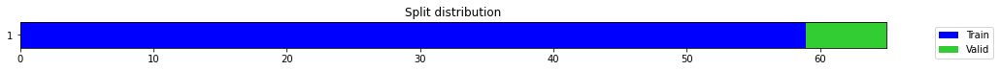

epoch,train_loss,valid_loss,mse,time
0,0.189922,0.328031,0.328031,00:00
1,0.138311,0.030706,0.030706,00:00
2,0.113436,0.033704,0.033704,00:00
3,0.106323,0.366126,0.366126,00:00
4,0.100429,1.257893,1.257893,00:00
5,0.095973,0.543330,0.543330,00:00
6,0.090626,0.304166,0.304166,00:00
7,0.082135,0.367512,0.367512,00:00
8,0.075600,0.320495,0.320495,00:00
9,0.070138,0.266252,0.266252,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5153444210688273,
  "MSE_normalize": 0.26625241492250823,
  "RMSE_normalize": 0.5159965260760079,
  "MAPE_normalize": 0.5325396438771045,
  "MAE": 33241.776536623634,
  "MSE": 1107813999.6875036,
  "RMSE": 33283.83991800681,
  "MAPE": 0.28161853846918805
}
Percent CPU Usage: 38.0
Percent Ram Usage: 9.4
2022-10-14 18:58:36.979268+07:00
PROGRESS: [ 2 / 1944 ]


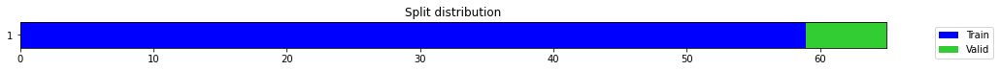

epoch,train_loss,valid_loss,mse,time
0,0.515946,1.255613,1.255613,00:00
1,0.445140,0.770123,0.770123,00:00
2,0.399314,0.231305,0.231305,00:00
3,0.325678,0.014001,0.014001,00:00
4,0.267053,0.023177,0.023177,00:00
5,0.229488,0.062128,0.062128,00:00
6,0.203450,0.408006,0.408006,00:00
7,0.179371,0.361390,0.361390,00:00
8,0.163351,0.335555,0.335555,00:00
9,0.145722,0.010507,0.010507,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24849897623062134,
  "MSE_normalize": 0.0618146326322749,
  "RMSE_normalize": 0.2486254866908759,
  "MAPE_normalize": 0.25690862709802453,
  "MAE": 16029.177962779999,
  "MSE": 257196222.74789402,
  "RMSE": 16037.338393508258,
  "MAPE": 0.1358293467211137
}
Percent CPU Usage: 97.3
Percent Ram Usage: 10.1
2022-10-14 18:58:42.165660+07:00
PROGRESS: [ 3 / 1944 ]


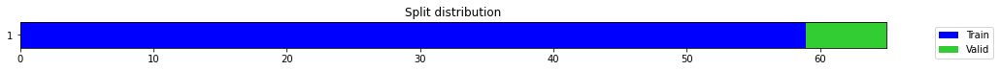

epoch,train_loss,valid_loss,mse,time
0,0.345210,0.182779,0.182779,00:00
1,0.278991,0.075675,0.075675,00:00
2,0.239804,0.001516,0.001516,00:00
3,0.209429,0.154932,0.154932,00:00
4,0.189280,0.165768,0.165768,00:00
5,0.167802,0.012542,0.012542,00:00
6,0.153933,0.187341,0.187341,00:00
7,0.144983,0.387290,0.387290,00:00
8,0.132404,0.091049,0.091049,00:00
9,0.123396,0.490365,0.490365,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.02735943595568339,
  "MSE_normalize": 0.0008094959105987934,
  "RMSE_normalize": 0.028451641615182655,
  "MAPE_normalize": 0.02847027427369363,
  "MAE": 1764.7930568854015,
  "MSE": 3368123.0749104344,
  "RMSE": 1835.244690745742,
  "MAPE": 0.01500634205570286
}
Percent CPU Usage: 99.5
Percent Ram Usage: 11.8
2022-10-14 18:58:52.045169+07:00
PROGRESS: [ 4 / 1944 ]


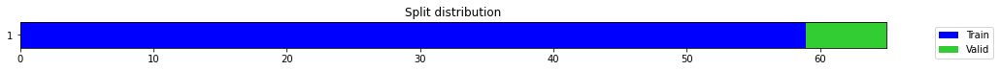

epoch,train_loss,valid_loss,mse,time
0,1.110322,1.422257,1.422257,00:00
1,1.017912,1.334573,1.334573,00:00
2,0.993115,1.195037,1.195037,00:00
3,0.923241,0.984795,0.984795,00:00
4,0.888090,0.676976,0.676976,00:00
5,0.819508,0.337759,0.337759,00:00
6,0.739329,0.073891,0.073891,00:00
7,0.677569,0.000655,0.000655,00:00
8,0.606820,0.072025,0.072025,00:00
9,0.540405,0.214745,0.214745,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13302781184514365,
  "MSE_normalize": 0.017733577463587835,
  "RMSE_normalize": 0.13316747900139822,
  "MAPE_normalize": 0.13748965906976537,
  "MAE": 8580.825975259146,
  "MSE": 73785266.45259975,
  "RMSE": 8589.835065506191,
  "MAPE": 0.07270176501609542
}
Percent CPU Usage: 81.9
Percent Ram Usage: 12.3
2022-10-14 18:59:05.879315+07:00
PROGRESS: [ 5 / 1944 ]


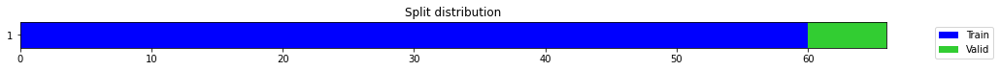

epoch,train_loss,valid_loss,mse,time
0,0.335721,0.841430,0.841430,00:00
1,0.238091,0.055869,0.055869,00:00
2,0.181349,0.111050,0.111050,00:00
3,0.154392,0.002092,0.002092,00:00
4,0.136140,0.231312,0.231312,00:00
5,0.127747,0.022545,0.022545,00:00
6,0.118315,0.051445,0.051445,00:00
7,0.105890,0.031623,0.031623,00:00
8,0.098238,0.019105,0.019105,00:00
9,0.090498,0.023026,0.023026,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14988821744918823,
  "MSE_normalize": 0.023026144966570666,
  "RMSE_normalize": 0.1517436818011566,
  "MAPE_normalize": 0.15452277388797928,
  "MAE": 9668.389578342438,
  "MSE": 95806401.45639668,
  "RMSE": 9788.074450901806,
  "MAPE": 0.08180658237341573
}
Percent CPU Usage: 65.7
Percent Ram Usage: 12.4
2022-10-14 18:59:07.324999+07:00
PROGRESS: [ 6 / 1944 ]


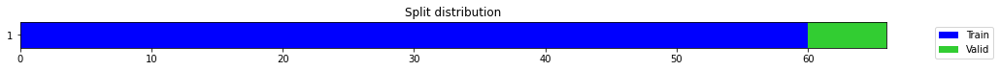

epoch,train_loss,valid_loss,mse,time
0,0.338965,0.907366,0.907366,00:00
1,0.267972,0.301525,0.301525,00:00
2,0.210092,0.012350,0.012350,00:00
3,0.174004,0.071002,0.071002,00:00
4,0.165202,0.001377,0.001377,00:00
5,0.140344,0.179031,0.179031,00:00
6,0.126194,0.045280,0.045280,00:00
7,0.113405,0.087829,0.087829,00:00
8,0.107863,0.074289,0.074289,00:00
9,0.098634,0.033274,0.033274,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04521701733271281,
  "MSE_normalize": 0.002154395944531965,
  "RMSE_normalize": 0.04641547096100572,
  "MAPE_normalize": 0.0470147015036424,
  "MAE": 2916.678486029307,
  "MSE": 8963937.431016823,
  "RMSE": 2993.9835388687134,
  "MAPE": 0.02479025343578227
}
Percent CPU Usage: 70.3
Percent Ram Usage: 12.4
2022-10-14 18:59:10.558455+07:00
PROGRESS: [ 7 / 1944 ]


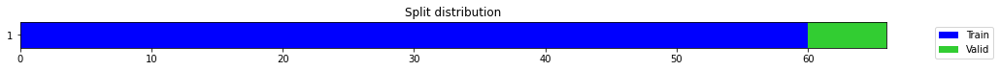

epoch,train_loss,valid_loss,mse,time
0,0.357877,0.312815,0.312815,00:00
1,0.294982,0.254385,0.254385,00:00
2,0.229372,0.124444,0.124444,00:00
3,0.180303,0.013779,0.013779,00:00
4,0.157013,0.025712,0.025712,00:00
5,0.162251,0.151377,0.151377,00:00
6,0.145406,0.105958,0.105958,00:00
7,0.132987,0.117384,0.117384,00:00
8,0.122700,0.343152,0.343152,00:00
9,0.113052,0.071110,0.071110,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.011554757754007975,
  "MSE_normalize": 0.0002043189688064236,
  "RMSE_normalize": 0.014294018637402975,
  "MAPE_normalize": 0.01181701912663126,
  "MAE": 745.3280941645304,
  "MSE": 850123.4218339315,
  "RMSE": 922.0213781870415,
  "MAPE": 0.006279542981129868
}
Percent CPU Usage: 72.0
Percent Ram Usage: 12.4
2022-10-14 18:59:16.722967+07:00
PROGRESS: [ 8 / 1944 ]


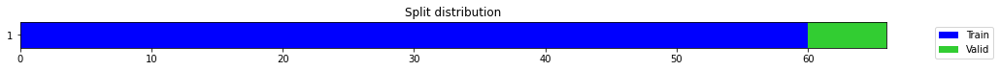

epoch,train_loss,valid_loss,mse,time
0,0.221800,0.548860,0.548860,00:00
1,0.207567,0.384177,0.384177,00:00
2,0.163890,0.187611,0.187611,00:00
3,0.142418,0.041210,0.041210,00:00
4,0.118017,0.004676,0.004676,00:00
5,0.104430,0.076325,0.076325,00:00
6,0.105428,0.169686,0.169686,00:00
7,0.099430,0.095616,0.095616,00:00
8,0.091750,0.010947,0.010947,00:00
9,0.084360,0.002695,0.002695,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.052500387032826744,
  "MSE_normalize": 0.002760690952302506,
  "RMSE_normalize": 0.052542277760889905,
  "MAPE_normalize": 0.0543115996890318,
  "MAE": 3386.4849651654563,
  "MSE": 11486589.095018944,
  "RMSE": 3389.1870846884426,
  "MAPE": 0.028706211871929857
}
Percent CPU Usage: 80.3
Percent Ram Usage: 12.7
2022-10-14 18:59:29.774288+07:00
PROGRESS: [ 9 / 1944 ]


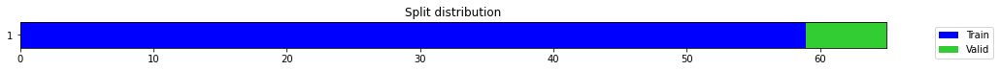

epoch,train_loss,valid_loss,mse,time
0,0.363209,0.485144,0.485144,00:00
1,0.273133,0.045343,0.045343,00:00
2,0.212985,0.000861,0.000861,00:00
3,0.176779,0.305683,0.305683,00:00
4,0.154928,0.173915,0.173915,00:00
5,0.139700,0.311665,0.311665,00:00
6,0.127352,0.520768,0.520768,00:00
7,0.113621,0.480944,0.480944,00:00
8,0.103606,0.347730,0.347730,00:00
9,0.094026,0.260783,0.260783,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5102156152327856,
  "MSE_normalize": 0.2607832173133162,
  "RMSE_normalize": 0.5106693816093895,
  "MAPE_normalize": 0.5273384009021452,
  "MAE": 32910.9480449756,
  "MSE": 1085057948.140389,
  "RMSE": 32940.217791332056,
  "MAPE": 0.2788433142032451
}
Percent CPU Usage: 99.7
Percent Ram Usage: 12.7
2022-10-14 18:59:31.695793+07:00
PROGRESS: [ 10 / 1944 ]


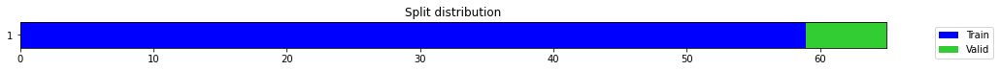

epoch,train_loss,valid_loss,mse,time
0,0.517996,1.563165,1.563165,00:00
1,0.455396,0.579391,0.579391,00:00
2,0.390047,0.002054,0.002054,00:00
3,0.315335,0.236851,0.236851,00:00
4,0.264728,0.175763,0.175763,00:00
5,0.236993,0.051744,0.051744,00:00
6,0.212599,0.242235,0.242235,00:00
7,0.189875,1.350530,1.350530,00:00
8,0.170522,0.294971,0.294971,00:00
9,0.154164,0.003382,0.003382,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.027066548665364582,
  "MSE_normalize": 0.00074070567785256,
  "RMSE_normalize": 0.027215908543580903,
  "MAPE_normalize": 0.028028942202960667,
  "MAE": 1745.900655110677,
  "MSE": 3081903.012267176,
  "RMSE": 1755.5349646951427,
  "MAPE": 0.014807533938074345
}
Percent CPU Usage: 92.6
Percent Ram Usage: 12.7
2022-10-14 18:59:35.749262+07:00
PROGRESS: [ 11 / 1944 ]


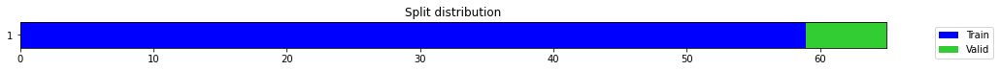

epoch,train_loss,valid_loss,mse,time
0,0.671516,1.363988,1.363988,00:00
1,0.613655,0.944643,0.944643,00:00
2,0.558330,0.339453,0.339453,00:00
3,0.488876,0.006043,0.006043,00:00
4,0.420526,0.126785,0.126785,00:00
5,0.357696,0.205285,0.205285,00:00
6,0.315765,0.018271,0.018271,00:00
7,0.276629,0.091989,0.091989,00:00
8,0.244831,0.260623,0.260623,00:00
9,0.220419,0.485844,0.485844,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18763595819473267,
  "MSE_normalize": 0.0352449700052091,
  "RMSE_normalize": 0.18773643760657946,
  "MAPE_normalize": 0.1939973867638183,
  "MAE": 12103.269847393036,
  "MSE": 146646073.43261337,
  "RMSE": 12109.7511713748,
  "MAPE": 0.1025648968808624
}
Percent CPU Usage: 76.6
Percent Ram Usage: 12.5
2022-10-14 18:59:42.333990+07:00
PROGRESS: [ 12 / 1944 ]


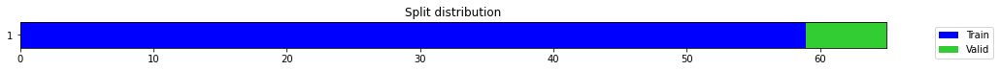

epoch,train_loss,valid_loss,mse,time
0,0.261393,2.001550,2.001550,00:00
1,0.307438,1.206673,1.206673,00:00
2,0.275852,0.661120,0.661120,00:00
3,0.253791,0.272469,0.272469,00:00
4,0.225734,0.047846,0.047846,00:00
5,0.199588,0.004238,0.004238,00:00
6,0.179866,0.101339,0.101339,00:00
7,0.160225,0.251945,0.251945,00:00
8,0.152114,0.212533,0.212533,00:00
9,0.146118,0.039343,0.039343,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.026577085256576538,
  "MSE_normalize": 0.0007447824319483468,
  "RMSE_normalize": 0.027290702298554848,
  "MAPE_normalize": 0.027372034861136135,
  "MAE": 1714.328307390213,
  "MSE": 3098865.432164514,
  "RMSE": 1760.3594610659818,
  "MAPE": 0.014497873142625786
}
Percent CPU Usage: 79.9
Percent Ram Usage: 12.6
2022-10-14 18:59:55.761705+07:00
PROGRESS: [ 13 / 1944 ]


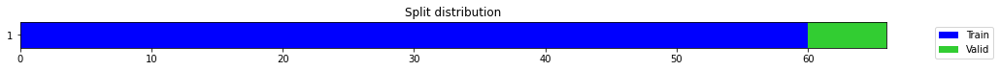

epoch,train_loss,valid_loss,mse,time
0,0.485775,0.180921,0.180921,00:00
1,0.338265,0.112992,0.112992,00:00
2,0.265357,0.550384,0.550384,00:00
3,0.220900,0.134822,0.134822,00:00
4,0.191632,0.165458,0.165458,00:00
5,0.170802,0.145005,0.145005,00:00
6,0.149022,0.427714,0.427714,00:00
7,0.134201,0.290260,0.290260,00:00
8,0.121247,0.176993,0.176993,00:00
9,0.111953,0.156119,0.156119,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.39189308881759644,
  "MSE_normalize": 0.15611911186645125,
  "RMSE_normalize": 0.39511911098610664,
  "MAPE_normalize": 0.404262129214308,
  "MAE": 25278.67180109024,
  "MSE": 649575095.1020328,
  "RMSE": 25486.763135047822,
  "MAPE": 0.21395907165915062
}
Percent CPU Usage: 76.8
Percent Ram Usage: 12.7
2022-10-14 18:59:57.370890+07:00
PROGRESS: [ 14 / 1944 ]


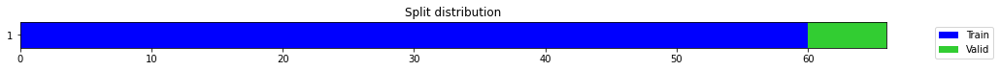

epoch,train_loss,valid_loss,mse,time
0,0.527497,0.466122,0.466122,00:00
1,0.416602,0.138625,0.138625,00:00
2,0.299671,0.077936,0.077936,00:00
3,0.244180,0.549279,0.549279,00:00
4,0.218772,0.136822,0.136822,00:00
5,0.184324,0.046574,0.046574,00:00
6,0.161603,0.171844,0.171844,00:00
7,0.144665,0.014933,0.014933,00:00
8,0.131023,0.238670,0.238670,00:00
9,0.119481,0.138756,0.138756,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0604166587193807,
  "MSE_normalize": 0.003663087301081447,
  "RMSE_normalize": 0.06052344422685681,
  "MAPE_normalize": 0.06257754843284051,
  "MAE": 3897.1161540349326,
  "MSE": 15241249.155980846,
  "RMSE": 3904.004246409172,
  "MAPE": 0.033056174895758385
}
Percent CPU Usage: 75.9
Percent Ram Usage: 12.6
2022-10-14 19:00:01.210760+07:00
PROGRESS: [ 15 / 1944 ]


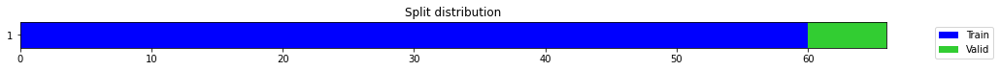

epoch,train_loss,valid_loss,mse,time
0,0.250421,1.461974,1.461974,00:00
1,0.219955,0.908819,0.908819,00:00
2,0.184011,0.332273,0.332273,00:00
3,0.148460,0.045386,0.045386,00:00
4,0.134408,0.003592,0.003592,00:00
5,0.129205,0.025066,0.025066,00:00
6,0.120961,0.265945,0.265945,00:00
7,0.110827,0.278340,0.278340,00:00
8,0.101298,0.004740,0.004740,00:00
9,0.093184,0.062049,0.062049,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.054990172386169434,
  "MSE_normalize": 0.003038315135127571,
  "RMSE_normalize": 0.05512091377261058,
  "MAPE_normalize": 0.05694948069985226,
  "MAE": 3547.086079597473,
  "MSE": 12641718.360137245,
  "RMSE": 3555.519421988473,
  "MAPE": 0.03008506678032927
}
Percent CPU Usage: 78.9
Percent Ram Usage: 9.6
2022-10-14 19:00:08.421045+07:00
PROGRESS: [ 16 / 1944 ]


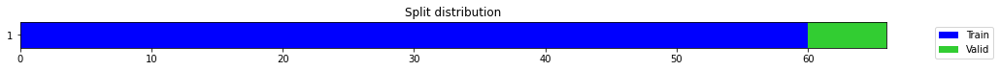

epoch,train_loss,valid_loss,mse,time
0,0.378923,1.030004,1.030004,00:00
1,0.366646,0.759504,0.759504,00:00
2,0.319699,0.439068,0.439068,00:00
3,0.279026,0.142393,0.142393,00:00
4,0.229749,0.000568,0.000568,00:00
5,0.201070,0.100813,0.100813,00:00
6,0.178900,0.300568,0.300568,00:00
7,0.175962,0.377923,0.377923,00:00
8,0.166359,0.247671,0.247671,00:00
9,0.150687,0.032105,0.032105,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09336555004119873,
  "MSE_normalize": 0.008722505121564694,
  "RMSE_normalize": 0.09339435272844228,
  "MAPE_normalize": 0.09654840433820722,
  "MAE": 6022.451439857483,
  "MSE": 36292302.884192325,
  "RMSE": 6024.30932839544,
  "MAPE": 0.051040011487991414
}
Percent CPU Usage: 80.1
Percent Ram Usage: 9.6
2022-10-14 19:00:22.350041+07:00
PROGRESS: [ 17 / 1944 ]


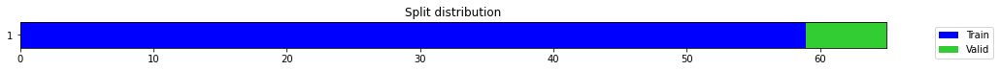

epoch,train_loss,valid_loss,mse,time
0,0.105183,0.279248,0.279248,00:00
1,0.097748,0.390320,0.390320,00:00
2,0.078154,0.102677,0.102677,00:00
3,0.069662,0.053851,0.053851,00:00
4,0.068139,0.210987,0.210987,00:00
5,0.064049,0.128437,0.128437,00:00
6,0.059848,0.022891,0.022891,00:00
7,0.055114,0.151092,0.151092,00:00
8,0.051555,0.101093,0.101093,00:00
9,0.049652,0.066442,0.066442,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2567217747370402,
  "MSE_normalize": 0.06644168754001949,
  "RMSE_normalize": 0.25776285135763743,
  "MAPE_normalize": 0.26506160556144126,
  "MAE": 16559.581357638042,
  "MSE": 276448315.5622037,
  "RMSE": 16626.734963973046,
  "MAPE": 0.14022678421860368
}
Percent CPU Usage: 76.3
Percent Ram Usage: 9.6
2022-10-14 19:00:24.085665+07:00
PROGRESS: [ 18 / 1944 ]


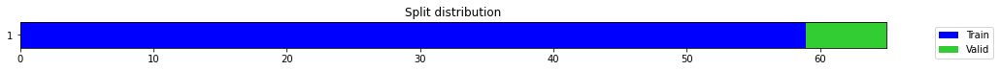

epoch,train_loss,valid_loss,mse,time
0,0.172004,0.013227,0.013227,00:00
1,0.147568,0.066561,0.066561,00:00
2,0.126298,0.063090,0.063090,00:00
3,0.111660,0.062394,0.062394,00:00
4,0.097390,0.189319,0.189319,00:00
5,0.087287,0.157123,0.157123,00:00
6,0.087117,0.171061,0.171061,00:00
7,0.078410,0.706690,0.706690,00:00
8,0.076614,0.004746,0.004746,00:00
9,0.071602,1.048078,1.048078,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18722917636235556,
  "MSE_normalize": 0.03510560405082449,
  "RMSE_normalize": 0.1873648954602342,
  "MAPE_normalize": 0.19354019748910245,
  "MAE": 12077.030792077383,
  "MSE": 146066204.30582246,
  "RMSE": 12085.785216766946,
  "MAPE": 0.10233234440921767
}
Percent CPU Usage: 76.4
Percent Ram Usage: 9.6
2022-10-14 19:00:28.080982+07:00
PROGRESS: [ 19 / 1944 ]


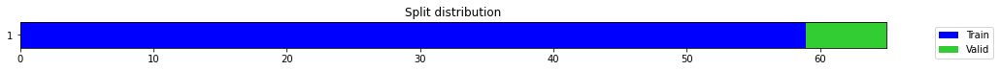

epoch,train_loss,valid_loss,mse,time
0,0.386346,1.183305,1.183305,00:00
1,0.334683,0.582770,0.582770,00:00
2,0.270023,0.070833,0.070833,00:00
3,0.234015,0.011117,0.011117,00:00
4,0.206598,0.069209,0.069209,00:00
5,0.176826,0.017702,0.017702,00:00
6,0.156103,0.102148,0.102148,00:00
7,0.142296,0.132834,0.132834,00:00
8,0.127777,0.167543,0.167543,00:00
9,0.116584,0.164472,0.164472,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.048442691564559937,
  "MSE_normalize": 0.0023547014449606016,
  "RMSE_normalize": 0.04852526604729336,
  "MAPE_normalize": 0.05013562610198141,
  "MAE": 3124.747376680374,
  "MSE": 9797361.750018165,
  "RMSE": 3130.0737611146105,
  "MAPE": 0.02649367499678144
}
Percent CPU Usage: 78.5
Percent Ram Usage: 9.6
2022-10-14 19:00:35.952974+07:00
PROGRESS: [ 20 / 1944 ]


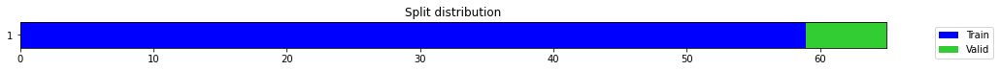

epoch,train_loss,valid_loss,mse,time
0,0.389148,0.392070,0.392070,00:00
1,0.319124,0.249809,0.249809,00:00
2,0.303082,0.113226,0.113226,00:00
3,0.275337,0.008329,0.008329,00:00
4,0.262682,0.017076,0.017076,00:00
5,0.236803,0.113746,0.113746,00:00
6,0.212893,0.159211,0.159211,00:00
7,0.193761,0.125385,0.125385,00:00
8,0.178803,0.010593,0.010593,00:00
9,0.165586,0.004274,0.004274,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10203651587168376,
  "MSE_normalize": 0.010421582775515267,
  "RMSE_normalize": 0.10208615369145449,
  "MAPE_normalize": 0.10555368668459296,
  "MAE": 6581.763419787089,
  "MSE": 43361767.44529488,
  "RMSE": 6584.96525771358,
  "MAPE": 0.05579096481436526
}
Percent CPU Usage: 79.2
Percent Ram Usage: 9.6
2022-10-14 19:00:51.667964+07:00
PROGRESS: [ 21 / 1944 ]


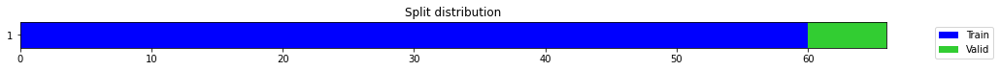

epoch,train_loss,valid_loss,mse,time
0,0.445551,0.650061,0.650061,00:00
1,0.303018,0.003197,0.003197,00:00
2,0.260408,0.219161,0.219161,00:00
3,0.207698,0.315056,0.315056,00:00
4,0.174414,0.001897,0.001897,00:00
5,0.155131,0.249790,0.249790,00:00
6,0.139785,0.209421,0.209421,00:00
7,0.129503,0.016283,0.016283,00:00
8,0.115680,0.008712,0.008712,00:00
9,0.104374,0.013033,0.013033,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11395055055618286,
  "MSE_normalize": 0.01303251384320229,
  "RMSE_normalize": 0.1141600361037184,
  "MAPE_normalize": 0.117821561767962,
  "MAE": 7350.266313076019,
  "MSE": 54225240.701845646,
  "RMSE": 7363.778968834253,
  "MAPE": 0.0622894255586976
}
Percent CPU Usage: 75.7
Percent Ram Usage: 9.6
2022-10-14 19:00:53.619606+07:00
PROGRESS: [ 22 / 1944 ]


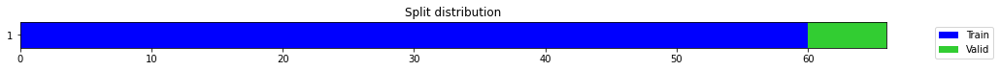

epoch,train_loss,valid_loss,mse,time
0,0.315553,0.330148,0.330148,00:00
1,0.257604,0.067465,0.067465,00:00
2,0.196582,0.048109,0.048109,00:00
3,0.184760,0.031803,0.031803,00:00
4,0.165471,0.319558,0.319558,00:00
5,0.150348,0.419980,0.419980,00:00
6,0.132997,0.006788,0.006788,00:00
7,0.130796,0.006107,0.006107,00:00
8,0.123043,0.397579,0.397579,00:00
9,0.114573,0.000410,0.000410,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12050813436508179,
  "MSE_normalize": 0.014555319433501523,
  "RMSE_normalize": 0.1206454285644571,
  "MAPE_normalize": 0.12478790335323281,
  "MAE": 7773.256699085236,
  "MSE": 60561278.45093751,
  "RMSE": 7782.112724121741,
  "MAPE": 0.06592608495861116
}
Percent CPU Usage: 77.2
Percent Ram Usage: 9.6
2022-10-14 19:00:58.045004+07:00
PROGRESS: [ 23 / 1944 ]


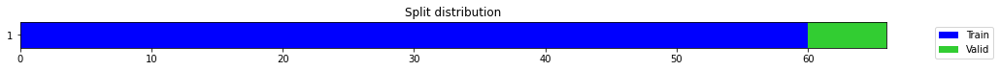

epoch,train_loss,valid_loss,mse,time
0,0.157112,0.230955,0.230955,00:00
1,0.109969,0.052796,0.052796,00:00
2,0.095433,0.000985,0.000985,00:00
3,0.092400,0.001208,0.001208,00:00
4,0.087668,0.077762,0.077762,00:00
5,0.080038,0.215582,0.215582,00:00
6,0.074920,0.002584,0.002584,00:00
7,0.073036,0.000365,0.000365,00:00
8,0.066308,0.067633,0.067633,00:00
9,0.067743,0.087765,0.087765,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.00979475180308024,
  "MSE_normalize": 9.927135897906207e-05,
  "RMSE_normalize": 0.009963501341348937,
  "MAPE_normalize": 0.010127695033020781,
  "MAE": 631.8006703058878,
  "MSE": 413044.89680221793,
  "RMSE": 642.6856905223718,
  "MAPE": 0.005354283398756009
}
Percent CPU Usage: 78.5
Percent Ram Usage: 9.6
2022-10-14 19:01:06.838795+07:00
PROGRESS: [ 24 / 1944 ]


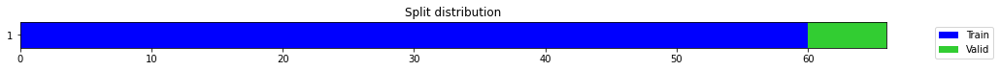

epoch,train_loss,valid_loss,mse,time
0,1.064908,2.553110,2.553110,00:00
1,0.915827,1.885474,1.885474,00:00
2,0.762929,1.165532,1.165532,00:00
3,0.650319,0.489620,0.489620,00:00
4,0.542031,0.062605,0.062605,00:00
5,0.463914,0.036465,0.036465,00:00
6,0.400012,0.331178,0.331178,00:00
7,0.357342,0.535938,0.535938,00:00
8,0.340085,0.479640,0.479640,00:00
9,0.309810,0.166437,0.166437,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06337326765060425,
  "MSE_normalize": 0.004049019289952345,
  "RMSE_normalize": 0.06363190465444474,
  "MAPE_normalize": 0.06543604818510794,
  "MAE": 4087.8292565345764,
  "MSE": 16847021.859762166,
  "RMSE": 4104.512377830302,
  "MAPE": 0.03461699746310308
}
Percent CPU Usage: 80.3
Percent Ram Usage: 9.5
2022-10-14 19:01:24.171176+07:00
PROGRESS: [ 25 / 1944 ]


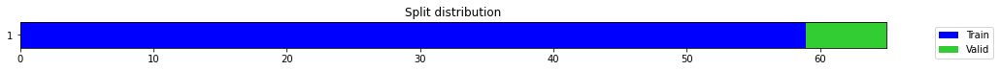

epoch,train_loss,valid_loss,mse,time
0,0.424236,0.685070,0.685070,00:00
1,0.311048,0.056256,0.056256,00:00
2,0.243848,0.327169,0.327169,00:00
3,0.202222,0.147650,0.147650,00:00
4,0.172603,1.224626,1.224626,00:00
5,0.158323,0.004427,0.004427,00:00
6,0.144204,0.574542,0.574542,00:00
7,0.142582,0.147816,0.147816,00:00
8,0.131408,0.012981,0.012981,00:00
9,0.121080,0.008371,0.008371,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.08848649263381958,
  "MSE_normalize": 0.00837126221083769,
  "RMSE_normalize": 0.0914946020857935,
  "MAPE_normalize": 0.09101215049892326,
  "MAE": 5707.732720851898,
  "MSE": 34830863.31787849,
  "RMSE": 5901.767812942025,
  "MAPE": 0.0482355696602931
}
Percent CPU Usage: 80.1
Percent Ram Usage: 9.6
2022-10-14 19:01:26.032232+07:00
PROGRESS: [ 26 / 1944 ]


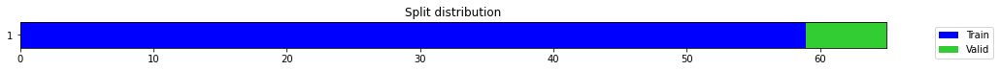

epoch,train_loss,valid_loss,mse,time
0,0.141271,0.000909,0.000909,00:00
1,0.109358,0.010000,0.010000,00:00
2,0.094568,0.360456,0.360456,00:00
3,0.097481,0.571310,0.571310,00:00
4,0.094461,1.179299,1.179299,00:00
5,0.090531,0.128845,0.128845,00:00
6,0.081939,0.578886,0.578886,00:00
7,0.078137,1.054280,1.054280,00:00
8,0.081052,0.000286,0.000286,00:00
9,0.081748,0.426875,0.426875,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2765650848547618,
  "MSE_normalize": 0.07650139038540911,
  "RMSE_normalize": 0.27658884718189397,
  "MAPE_normalize": 0.2860449547506352,
  "MAE": 17839.554233471554,
  "MSE": 318304385.2923594,
  "RMSE": 17841.086998620893,
  "MAPE": 0.15120403189718454
}
Percent CPU Usage: 81.5
Percent Ram Usage: 9.6
2022-10-14 19:01:30.381443+07:00
PROGRESS: [ 27 / 1944 ]


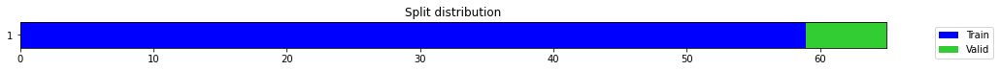

epoch,train_loss,valid_loss,mse,time
0,0.313556,0.145492,0.145492,00:00
1,0.263000,0.008565,0.008565,00:00
2,0.214162,0.080339,0.080339,00:00
3,0.184924,0.396866,0.396866,00:00
4,0.160944,0.358862,0.358862,00:00
5,0.151803,0.050387,0.050387,00:00
6,0.142573,0.147941,0.147941,00:00
7,0.131249,1.321545,1.321545,00:00
8,0.122201,0.539769,0.539769,00:00
9,0.114629,0.093111,0.093111,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1519542932510376,
  "MSE_normalize": 0.023119014392387765,
  "RMSE_normalize": 0.152049381427179,
  "MAPE_normalize": 0.15730618565573948,
  "MAE": 9801.65973186493,
  "MSE": 96192809.4072619,
  "RMSE": 9807.793299578754,
  "MAPE": 0.08311666665221736
}
Percent CPU Usage: 83.3
Percent Ram Usage: 9.6
2022-10-14 19:01:38.836993+07:00
PROGRESS: [ 28 / 1944 ]


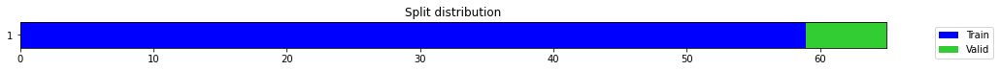

epoch,train_loss,valid_loss,mse,time
0,0.346780,0.175441,0.175441,00:00
1,0.291699,0.096851,0.096851,00:00
2,0.239808,0.028735,0.028735,00:00
3,0.215807,0.002081,0.002081,00:00
4,0.188840,0.001570,0.001570,00:00
5,0.172002,0.000960,0.000960,00:00
6,0.158207,0.030131,0.030131,00:00
7,0.154149,0.031901,0.031901,00:00
8,0.147024,0.330002,0.330002,00:00
9,0.134285,1.021177,1.021177,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06593120098114014,
  "MSE_normalize": 0.004356628395074817,
  "RMSE_normalize": 0.0660047603970715,
  "MAPE_normalize": 0.068233044420265,
  "MAE": 4252.826188087463,
  "MSE": 18126911.370567918,
  "RMSE": 4257.5710646526995,
  "MAPE": 0.03605765350663513
}
Percent CPU Usage: 84.9
Percent Ram Usage: 9.6
2022-10-14 19:01:55.790836+07:00
PROGRESS: [ 29 / 1944 ]


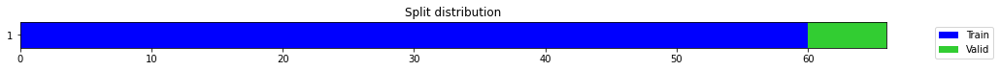

epoch,train_loss,valid_loss,mse,time
0,0.190556,0.196177,0.196177,00:00
1,0.177575,0.030005,0.030005,00:00
2,0.163619,0.071606,0.071606,00:00
3,0.141946,0.008162,0.008162,00:00
4,0.126276,0.398526,0.398526,00:00
5,0.110619,0.002244,0.002244,00:00
6,0.106070,0.005637,0.005637,00:00
7,0.096057,0.004540,0.004540,00:00
8,0.088051,0.000526,0.000526,00:00
9,0.082138,0.001807,0.001807,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.036201536655426025,
  "MSE_normalize": 0.0018067259112122258,
  "RMSE_normalize": 0.04250559858668298,
  "MAPE_normalize": 0.036944446972206633,
  "MAE": 2335.1439204216003,
  "MSE": 7517363.771598463,
  "RMSE": 2741.781131235399,
  "MAPE": 0.019653012113937596
}
Percent CPU Usage: 80.1
Percent Ram Usage: 9.7
2022-10-14 19:01:57.888341+07:00
PROGRESS: [ 30 / 1944 ]


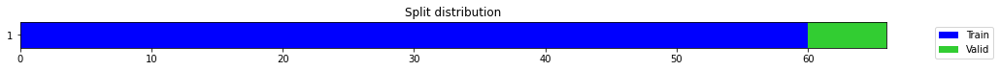

epoch,train_loss,valid_loss,mse,time
0,0.265115,0.247599,0.247599,00:00
1,0.173940,0.069269,0.069269,00:00
2,0.147802,0.208847,0.208847,00:00
3,0.142225,0.028386,0.028386,00:00
4,0.123773,0.482326,0.482326,00:00
5,0.112362,0.000311,0.000311,00:00
6,0.106985,0.061540,0.061540,00:00
7,0.100806,0.122844,0.122844,00:00
8,0.089881,0.279131,0.279131,00:00
9,0.091757,3.036754,3.036754,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04659735163052877,
  "MSE_normalize": 0.0022184435528599757,
  "RMSE_normalize": 0.0471003561861264,
  "MAPE_normalize": 0.04834216360767848,
  "MAE": 3005.715569575628,
  "MSE": 9230424.543154085,
  "RMSE": 3038.1613754298974,
  "MAPE": 0.025517184468273595
}
Percent CPU Usage: 81.1
Percent Ram Usage: 9.7
2022-10-14 19:02:02.753723+07:00
PROGRESS: [ 31 / 1944 ]


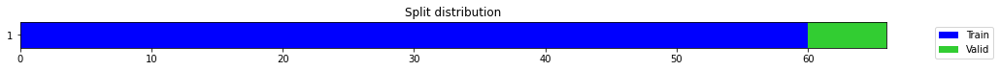

epoch,train_loss,valid_loss,mse,time
0,0.937989,0.711414,0.711414,00:00
1,0.702009,0.562111,0.562111,00:00
2,0.542771,0.238897,0.238897,00:00
3,0.441578,0.054123,0.054123,00:00
4,0.391039,0.670685,0.670685,00:00
5,0.353400,0.091044,0.091044,00:00
6,0.301286,0.541105,0.541105,00:00
7,0.268695,0.201401,0.201401,00:00
8,0.242010,0.055767,0.055767,00:00
9,0.220496,0.005529,0.005529,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10014318426450093,
  "MSE_normalize": 0.010037051639975777,
  "RMSE_normalize": 0.10018508691405012,
  "MAPE_normalize": 0.10365538235942734,
  "MAE": 6459.635957797368,
  "MSE": 41761823.36444828,
  "RMSE": 6462.338846303889,
  "MAPE": 0.05477257024529367
}
Percent CPU Usage: 84.1
Percent Ram Usage: 29.8
2022-10-14 19:02:13.425120+07:00
PROGRESS: [ 32 / 1944 ]


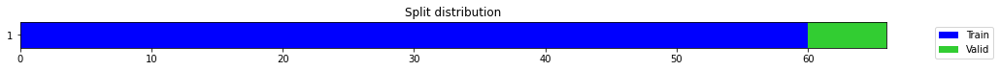

epoch,train_loss,valid_loss,mse,time
0,0.460833,1.188397,1.188397,00:00
1,0.391238,0.570874,0.570874,00:00
2,0.301915,0.106579,0.106579,00:00
3,0.237805,0.011303,0.011303,00:00
4,0.197699,0.251397,0.251397,00:00
5,0.183401,0.452714,0.452714,00:00
6,0.200070,0.229294,0.229294,00:00
7,0.183850,0.016518,0.016518,00:00
8,0.167825,0.137898,0.137898,00:00
9,0.157299,0.502861,0.502861,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.007519453763961792,
  "MSE_normalize": 6.683208541187942e-05,
  "RMSE_normalize": 0.008175089321339517,
  "MAPE_normalize": 0.007789228060510643,
  "MAE": 485.03484559059143,
  "MSE": 278072.6697601573,
  "RMSE": 527.3259615836843,
  "MAPE": 0.004114212790153635
}
Percent CPU Usage: 85.7
Percent Ram Usage: 9.7
2022-10-14 19:02:33.424370+07:00
PROGRESS: [ 33 / 1944 ]


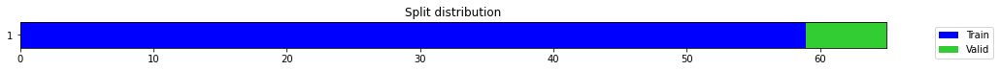

epoch,train_loss,valid_loss,mse,time
0,0.276896,0.183443,0.183443,00:00
1,0.197779,0.036024,0.036024,00:00
2,0.166678,1.068161,1.068161,00:00
3,0.140602,1.082216,1.082216,00:00
4,0.128002,0.400299,0.400299,00:00
5,0.116596,2.110209,2.110209,00:00
6,0.111750,0.011805,0.011805,00:00
7,0.099939,0.309353,0.309353,00:00
8,0.092641,0.440481,0.440481,00:00
9,0.086596,0.373598,0.373598,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6104907393455505,
  "MSE_normalize": 0.3735976031307449,
  "RMSE_normalize": 0.6112263108953548,
  "MAPE_normalize": 0.6308751256310429,
  "MAE": 39379.09465074539,
  "MSE": 1554452210.7654588,
  "RMSE": 39426.54195799397,
  "MAPE": 0.3336168576150868
}
Percent CPU Usage: 90.6
Percent Ram Usage: 9.5
2022-10-14 19:02:36.423432+07:00
PROGRESS: [ 34 / 1944 ]


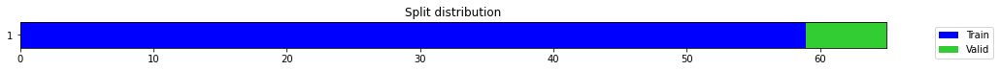

epoch,train_loss,valid_loss,mse,time
0,0.322667,0.679601,0.679601,00:00
1,0.253946,0.056389,0.056389,00:00
2,0.199319,0.198370,0.198370,00:00
3,0.174168,0.012339,0.012339,00:00
4,0.171808,0.114359,0.114359,00:00
5,0.156770,0.727532,0.727532,00:00
6,0.139190,0.002545,0.002545,00:00
7,0.124053,0.027068,0.027068,00:00
8,0.110263,0.007316,0.007316,00:00
9,0.100283,0.054887,0.054887,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10577904184659322,
  "MSE_normalize": 0.011309064306295488,
  "RMSE_normalize": 0.10634408449131286,
  "MAPE_normalize": 0.1096688117913413,
  "MAE": 6823.171315272649,
  "MSE": 47054370.43839288,
  "RMSE": 6859.618826027644,
  "MAPE": 0.05790534760266744
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.6
2022-10-14 19:02:42.863853+07:00
PROGRESS: [ 35 / 1944 ]


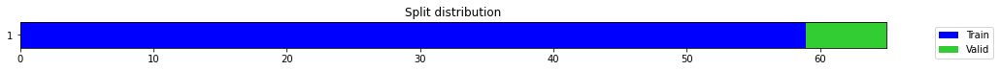

epoch,train_loss,valid_loss,mse,time
0,0.128514,0.336604,0.336604,00:00
1,0.103364,0.112529,0.112529,00:00
2,0.098794,0.130072,0.130072,00:00
3,0.088122,0.550668,0.550668,00:00
4,0.089355,0.540112,0.540112,00:00
5,0.080724,0.404352,0.404352,00:00
6,0.071497,0.303962,0.303962,00:00
7,0.067042,0.073390,0.073390,00:00
8,0.063914,0.031596,0.031596,00:00
9,0.070216,0.481620,0.481620,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.02800920605659485,
  "MSE_normalize": 0.0008025178352889147,
  "RMSE_normalize": 0.02832874574154166,
  "MAPE_normalize": 0.029035981728375737,
  "MAE": 1806.7058274745941,
  "MSE": 3339088.9363040016,
  "RMSE": 1827.3174153124032,
  "MAPE": 0.015331835871718045
}
Percent CPU Usage: 85.4
Percent Ram Usage: 9.5
2022-10-14 19:02:52.789512+07:00
PROGRESS: [ 36 / 1944 ]


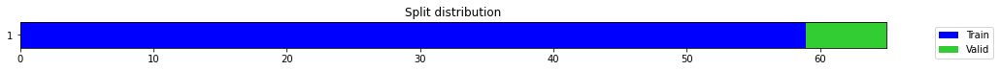

epoch,train_loss,valid_loss,mse,time
0,0.350134,0.394739,0.394739,00:00
1,0.300063,0.286266,0.286266,00:00
2,0.271767,0.172544,0.172544,00:00
3,0.235133,0.070946,0.070946,00:00
4,0.200236,0.006729,0.006729,00:00
5,0.174438,0.000892,0.000892,00:00
6,0.152413,0.035917,0.035917,00:00
7,0.141966,0.000196,0.000196,00:00
8,0.142462,0.628738,0.628738,00:00
9,0.132730,0.910597,0.910597,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.01737247904141744,
  "MSE_normalize": 0.0003415887066034647,
  "RMSE_normalize": 0.01848211856372166,
  "MAPE_normalize": 0.01784656790634748,
  "MAE": 1120.5943880875905,
  "MSE": 1421270.681885091,
  "RMSE": 1192.1705758343019,
  "MAPE": 0.009464003397339351
}
Percent CPU Usage: 86.3
Percent Ram Usage: 9.5
2022-10-14 19:03:12.503066+07:00
PROGRESS: [ 37 / 1944 ]


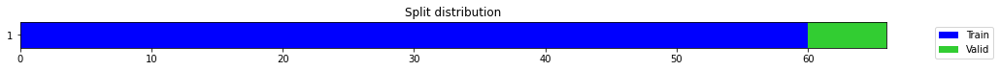

epoch,train_loss,valid_loss,mse,time
0,0.386930,0.306241,0.306241,00:00
1,0.260424,0.586662,0.586662,00:00
2,0.212697,0.060721,0.060721,00:00
3,0.184560,0.107760,0.107760,00:00
4,0.163436,0.009564,0.009564,00:00
5,0.141374,0.481145,0.481145,00:00
6,0.130113,0.171008,0.171008,00:00
7,0.116569,0.121856,0.121856,00:00
8,0.105194,0.035613,0.035613,00:00
9,0.099462,0.022563,0.022563,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15005585551261902,
  "MSE_normalize": 0.02256262715337402,
  "RMSE_normalize": 0.1502086121145323,
  "MAPE_normalize": 0.15535660425715284,
  "MAE": 9679.202903985977,
  "MSE": 93877812.29143743,
  "RMSE": 9689.05631583579,
  "MAPE": 0.08208271338467647
}
Percent CPU Usage: 82.5
Percent Ram Usage: 9.6
2022-10-14 19:03:14.936176+07:00
PROGRESS: [ 38 / 1944 ]


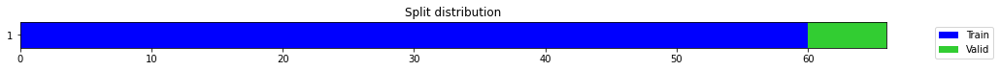

epoch,train_loss,valid_loss,mse,time
0,0.913367,1.323151,1.323151,00:00
1,0.644505,0.159240,0.159240,00:00
2,0.475145,0.323974,0.323974,00:00
3,0.420462,0.114428,0.114428,00:00
4,0.345062,0.558542,0.558542,00:00
5,0.302321,0.788899,0.788899,00:00
6,0.264314,0.400553,0.400553,00:00
7,0.241482,0.641918,0.641918,00:00
8,0.213921,0.611981,0.611981,00:00
9,0.193358,0.072021,0.072021,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16357187430063883,
  "MSE_normalize": 0.027262826947770453,
  "RMSE_normalize": 0.1651145873258037,
  "MAPE_normalize": 0.1686998874783956,
  "MAE": 10551.040179888407,
  "MSE": 113434243.86437231,
  "RMSE": 10650.551340863642,
  "MAPE": 0.08929451247231061
}
Percent CPU Usage: 81.8
Percent Ram Usage: 9.6
2022-10-14 19:03:20.676679+07:00
PROGRESS: [ 39 / 1944 ]


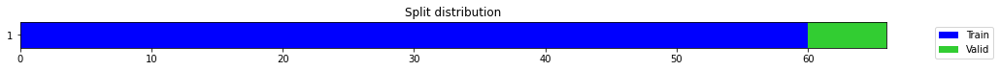

epoch,train_loss,valid_loss,mse,time
0,0.412616,0.439418,0.439418,00:00
1,0.290837,0.111642,0.111642,00:00
2,0.207379,0.019072,0.019072,00:00
3,0.190394,0.174597,0.174597,00:00
4,0.174029,0.059318,0.059318,00:00
5,0.147686,0.272073,0.272073,00:00
6,0.136783,0.343085,0.343085,00:00
7,0.123963,0.005112,0.005112,00:00
8,0.118857,0.126083,0.126083,00:00
9,0.107767,0.019916,0.019916,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11103198925654094,
  "MSE_normalize": 0.012332532673685392,
  "RMSE_normalize": 0.11105193682995984,
  "MAPE_normalize": 0.11485296568513692,
  "MAE": 7162.007435003917,
  "MSE": 51312782.8398798,
  "RMSE": 7163.29413327973,
  "MAPE": 0.06070773941105858
}
Percent CPU Usage: 82.4
Percent Ram Usage: 9.6
2022-10-14 19:03:31.776590+07:00
PROGRESS: [ 40 / 1944 ]


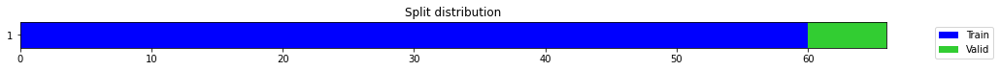

epoch,train_loss,valid_loss,mse,time
0,0.388382,0.826490,0.826490,00:00
1,0.322637,0.527635,0.527635,00:00
2,0.245502,0.242311,0.242311,00:00
3,0.206359,0.059036,0.059036,00:00
4,0.174837,0.001109,0.001109,00:00
5,0.161096,0.045313,0.045313,00:00
6,0.145113,0.025824,0.025824,00:00
7,0.137131,0.039665,0.039665,00:00
8,0.124564,0.318236,0.318236,00:00
9,0.119103,0.163529,0.163529,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.018989076217015583,
  "MSE_normalize": 0.00036775873246538043,
  "RMSE_normalize": 0.019177036592377364,
  "MAPE_normalize": 0.019691918554469407,
  "MAE": 1224.8713723023732,
  "MSE": 1530158.0361291908,
  "RMSE": 1236.9955683547096,
  "MAPE": 0.010396204566444581
}
Percent CPU Usage: 84.0
Percent Ram Usage: 9.6
2022-10-14 19:03:53.820739+07:00
PROGRESS: [ 41 / 1944 ]


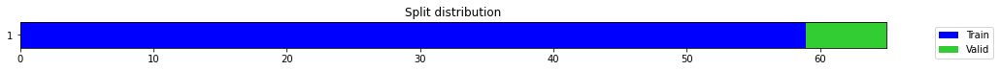

epoch,train_loss,valid_loss,mse,time
0,0.328519,0.156891,0.156891,00:00
1,0.226543,0.014702,0.014702,00:00
2,0.182741,0.009384,0.009384,00:00
3,0.149342,0.620904,0.620904,00:00
4,0.144083,0.049309,0.049309,00:00
5,0.136385,0.688830,0.688830,00:00
6,0.121142,0.009162,0.009162,00:00
7,0.110965,0.206140,0.206140,00:00
8,0.104059,0.157074,0.157074,00:00
9,0.097257,0.099633,0.099633,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3155620296796163,
  "MSE_normalize": 0.09963341173931302,
  "RMSE_normalize": 0.3156476068962238,
  "MAPE_normalize": 0.32629230106965773,
  "MAE": 20355.013162453968,
  "MSE": 414551313.6230691,
  "RMSE": 20360.53323523402,
  "MAPE": 0.17250034735607386
}
Percent CPU Usage: 82.3
Percent Ram Usage: 9.6
2022-10-14 19:03:56.433922+07:00
PROGRESS: [ 42 / 1944 ]


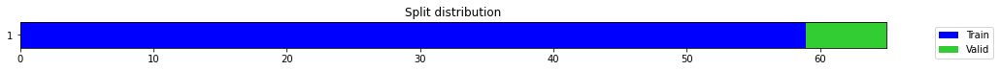

epoch,train_loss,valid_loss,mse,time
0,0.271138,0.468173,0.468173,00:00
1,0.211758,0.003592,0.003592,00:00
2,0.186641,0.003024,0.003024,00:00
3,0.160863,0.288941,0.288941,00:00
4,0.140399,1.530486,1.530486,00:00
5,0.129709,0.057818,0.057818,00:00
6,0.117246,0.654781,0.654781,00:00
7,0.109411,0.009842,0.009842,00:00
8,0.100405,1.302921,1.302921,00:00
9,0.097774,0.144192,0.144192,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1636450986067454,
  "MSE_normalize": 0.026794869415805184,
  "RMSE_normalize": 0.1636913846719038,
  "MAPE_normalize": 0.16934989169711412,
  "MAE": 10555.763440529505,
  "MSE": 111487182.06844,
  "RMSE": 10558.749076876484,
  "MAPE": 0.08949490645007711
}
Percent CPU Usage: 82.0
Percent Ram Usage: 9.6
2022-10-14 19:04:02.495275+07:00
PROGRESS: [ 43 / 1944 ]


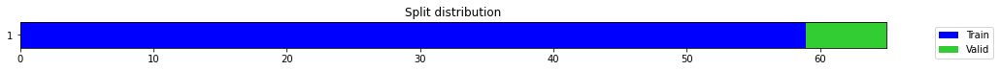

epoch,train_loss,valid_loss,mse,time
0,0.183362,0.098081,0.098081,00:00
1,0.176386,0.134794,0.134794,00:00
2,0.136587,0.050471,0.050471,00:00
3,0.138204,0.764082,0.764082,00:00
4,0.119118,2.864135,2.864135,00:00
5,0.113619,1.102774,1.102774,00:00
6,0.100153,0.111065,0.111065,00:00
7,0.092835,0.096747,0.096747,00:00
8,0.086068,0.042463,0.042463,00:00
9,0.080122,0.160278,0.160278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11875208218892415,
  "MSE_normalize": 0.014119406751423943,
  "RMSE_normalize": 0.11882510993651108,
  "MAPE_normalize": 0.12277909792228316,
  "MAE": 7659.984309514363,
  "MSE": 58747547.7774057,
  "RMSE": 7664.69489134471,
  "MAPE": 0.06491209913896406
}
Percent CPU Usage: 82.8
Percent Ram Usage: 9.7
2022-10-14 19:04:14.763257+07:00
PROGRESS: [ 44 / 1944 ]


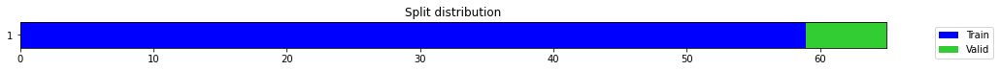

epoch,train_loss,valid_loss,mse,time
0,0.201670,0.057845,0.057845,00:00
1,0.183800,0.005957,0.005957,00:00
2,0.165542,0.001896,0.001896,00:00
3,0.149011,0.009760,0.009760,00:00
4,0.133191,0.150416,0.150416,00:00
5,0.124254,0.134046,0.134046,00:00
6,0.117455,0.080885,0.080885,00:00
7,0.111571,0.492462,0.492462,00:00
8,0.108941,0.977452,0.977452,00:00
9,0.102269,1.107823,1.107823,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.02411155899365743,
  "MSE_normalize": 0.0005946302368654935,
  "RMSE_normalize": 0.02438504125207693,
  "MAPE_normalize": 0.024986123565623863,
  "MAE": 1555.2920013268788,
  "MSE": 2474117.281635976,
  "RMSE": 1572.9327009239703,
  "MAPE": 0.013195696102664004
}
Percent CPU Usage: 84.4
Percent Ram Usage: 9.7
2022-10-14 19:04:38.455016+07:00
PROGRESS: [ 45 / 1944 ]


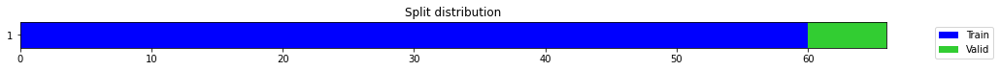

epoch,train_loss,valid_loss,mse,time
0,0.258420,0.168517,0.168517,00:00
1,0.212010,0.369198,0.369198,00:00
2,0.170546,0.006739,0.006739,00:00
3,0.141602,0.120175,0.120175,00:00
4,0.144437,0.143306,0.143306,00:00
5,0.128005,0.087657,0.087657,00:00
6,0.122097,0.001783,0.001783,00:00
7,0.110827,0.004336,0.004336,00:00
8,0.104430,0.025318,0.025318,00:00
9,0.101014,0.040321,0.040321,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1992374062538147,
  "MSE_normalize": 0.040320994372518015,
  "RMSE_normalize": 0.20080088239974947,
  "MAPE_normalize": 0.20553636623269048,
  "MAE": 12851.609652996063,
  "MSE": 167766223.1165002,
  "RMSE": 12952.46011831344,
  "MAPE": 0.10877909208540648
}
Percent CPU Usage: 81.4
Percent Ram Usage: 9.7
2022-10-14 19:04:41.420000+07:00
PROGRESS: [ 46 / 1944 ]


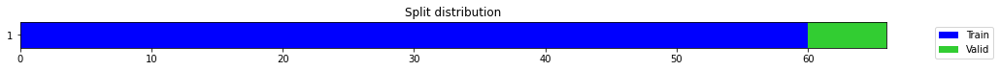

epoch,train_loss,valid_loss,mse,time
0,0.853126,0.842118,0.842118,00:00
1,0.578944,0.001857,0.001857,00:00
2,0.423496,1.122422,1.122422,00:00
3,0.368186,0.310904,0.310904,00:00
4,0.307321,0.558077,0.558077,00:00
5,0.277477,0.009269,0.009269,00:00
6,0.244397,0.044650,0.044650,00:00
7,0.214230,0.178712,0.178712,00:00
8,0.194253,0.002407,0.002407,00:00
9,0.178869,0.006844,0.006844,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07277040680249532,
  "MSE_normalize": 0.0053865725895795675,
  "RMSE_normalize": 0.07339327346276066,
  "MAPE_normalize": 0.07547673976967052,
  "MAE": 4693.982320388158,
  "MSE": 22412268.173439782,
  "RMSE": 4734.159711441914,
  "MAPE": 0.039844306500968006
}
Percent CPU Usage: 80.1
Percent Ram Usage: 9.7
2022-10-14 19:04:48.403760+07:00
PROGRESS: [ 47 / 1944 ]


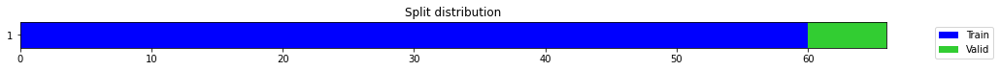

epoch,train_loss,valid_loss,mse,time
0,0.277195,0.150990,0.150990,00:00
1,0.222025,0.013436,0.013436,00:00
2,0.175353,0.126307,0.126307,00:00
3,0.170748,0.109942,0.109942,00:00
4,0.165614,0.350232,0.350232,00:00
5,0.148853,0.436104,0.436104,00:00
6,0.135351,0.479066,0.479066,00:00
7,0.124903,0.302414,0.302414,00:00
8,0.113605,0.063642,0.063642,00:00
9,0.105225,0.182689,0.182689,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.039818147818247475,
  "MSE_normalize": 0.0017566315246367499,
  "RMSE_normalize": 0.04191218825874819,
  "MAPE_normalize": 0.041483445873871774,
  "MAE": 2568.429806868235,
  "MSE": 7308932.750342857,
  "RMSE": 2703.5037914422937,
  "MAPE": 0.02185337434914285
}
Percent CPU Usage: 81.3
Percent Ram Usage: 9.7
2022-10-14 19:05:02.090276+07:00
PROGRESS: [ 48 / 1944 ]


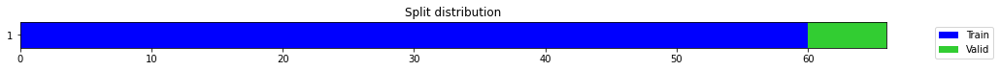

epoch,train_loss,valid_loss,mse,time
0,0.379651,0.703568,0.703568,00:00
1,0.228881,0.510654,0.510654,00:00
2,0.178661,0.214524,0.214524,00:00
3,0.153212,0.035511,0.035511,00:00
4,0.135878,0.000596,0.000596,00:00
5,0.125309,0.003848,0.003848,00:00
6,0.112917,0.282524,0.282524,00:00
7,0.103698,0.869610,0.869610,00:00
8,0.104806,0.060302,0.060302,00:00
9,0.097846,0.072848,0.072848,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.013143499692281088,
  "MSE_normalize": 0.00024960418035628135,
  "RMSE_normalize": 0.01579886642630671,
  "MAPE_normalize": 0.013788791918685601,
  "MAE": 847.8083041508993,
  "MSE": 1038544.5910779502,
  "RMSE": 1019.0900799624881,
  "MAPE": 0.007240206749187115
}
Percent CPU Usage: 82.1
Percent Ram Usage: 9.7
2022-10-14 19:05:29.420388+07:00
PROGRESS: [ 49 / 1944 ]


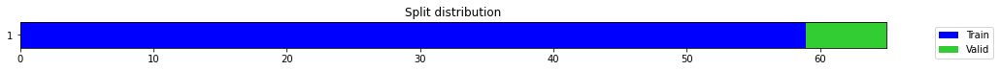

epoch,train_loss,valid_loss,mse,time
0,0.140720,0.117523,0.117523,00:00
1,0.119259,0.043446,0.043446,00:00
2,0.138523,0.289434,0.289434,00:00
3,0.148607,2.413983,2.413983,00:00
4,0.150746,1.286006,1.286006,00:00
5,0.143331,0.292690,0.292690,00:00
6,0.135473,0.044851,0.044851,00:00
7,0.125167,0.052406,0.052406,00:00
8,0.113481,0.006343,0.006343,00:00
9,0.108148,0.002516,0.002516,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.050060550371805825,
  "MSE_normalize": 0.002516244996929373,
  "RMSE_normalize": 0.0501621869233128,
  "MAPE_normalize": 0.051787624711698454,
  "MAE": 3229.105741182963,
  "MSE": 10469506.671153761,
  "RMSE": 3235.661705301369,
  "MAPE": 0.02737225729698774
}
Percent CPU Usage: 77.4
Percent Ram Usage: 9.8
2022-10-14 19:05:33.020169+07:00
PROGRESS: [ 50 / 1944 ]


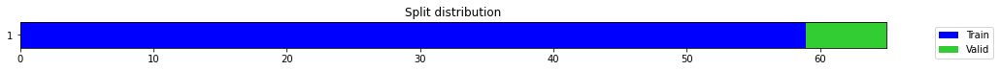

epoch,train_loss,valid_loss,mse,time
0,0.697961,0.994912,0.994912,00:00
1,0.517098,0.105271,0.105271,00:00
2,0.394062,0.002277,0.002277,00:00
3,0.332789,0.069015,0.069015,00:00
4,0.287661,2.039651,2.039651,00:00
5,0.244556,0.008905,0.008905,00:00
6,0.213258,2.170011,2.170011,00:00
7,0.197438,0.000200,0.000200,00:00
8,0.180154,0.333130,0.333130,00:00
9,0.167379,0.218995,0.218995,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14167213439941406,
  "MSE_normalize": 0.020079355064973232,
  "RMSE_normalize": 0.14170164101016344,
  "MAPE_normalize": 0.14656774572188058,
  "MAE": 9138.419357299805,
  "MSE": 83545498.1775381,
  "RMSE": 9140.322651719582,
  "MAPE": 0.07746618502159187
}
Percent CPU Usage: 77.6
Percent Ram Usage: 9.8
2022-10-14 19:05:41.323412+07:00
PROGRESS: [ 51 / 1944 ]


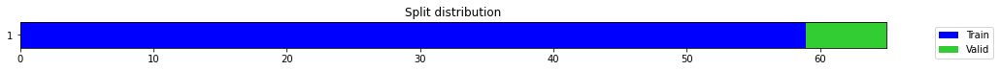

epoch,train_loss,valid_loss,mse,time
0,0.559919,1.348281,1.348281,00:00
1,0.382717,0.059383,0.059383,00:00
2,0.320941,0.209871,0.209871,00:00
3,0.280356,0.098954,0.098954,00:00
4,0.251441,0.107814,0.107814,00:00
5,0.232554,0.136175,0.136175,00:00
6,0.209773,0.509643,0.509643,00:00
7,0.193811,1.084181,1.084181,00:00
8,0.178084,0.043894,0.043894,00:00
9,0.164103,0.183186,0.183186,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0948609709739685,
  "MSE_normalize": 0.00902041593963195,
  "RMSE_normalize": 0.09497587030205067,
  "MAPE_normalize": 0.0982197293051121,
  "MAE": 6118.9120717048645,
  "MSE": 37531840.091805324,
  "RMSE": 6126.323537963476,
  "MAPE": 0.05189244146194566
}
Percent CPU Usage: 87.8
Percent Ram Usage: 9.9
2022-10-14 19:05:59.369290+07:00
PROGRESS: [ 52 / 1944 ]


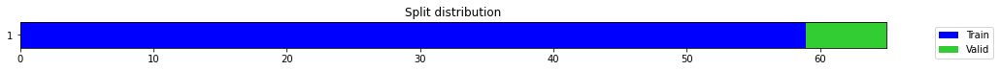

epoch,train_loss,valid_loss,mse,time
0,0.709438,1.023119,1.023119,00:00
1,0.496716,0.266848,0.266848,00:00
2,0.391951,0.001659,0.001659,00:00
3,0.327210,0.084788,0.084788,00:00
4,0.278279,0.095759,0.095759,00:00
5,0.243377,0.010007,0.010007,00:00
6,0.233718,0.036408,0.036408,00:00
7,0.208915,0.144245,0.144245,00:00
8,0.191511,0.747877,0.747877,00:00
9,0.176500,1.020187,1.020187,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.08693562944730122,
  "MSE_normalize": 0.00756554137567574,
  "RMSE_normalize": 0.08698012057749598,
  "MAPE_normalize": 0.08995498206932612,
  "MAE": 5607.695841868718,
  "MSE": 31478447.448553514,
  "RMSE": 5610.565697730802,
  "MAPE": 0.04754056652860336
}
Percent CPU Usage: 79.1
Percent Ram Usage: 9.6
2022-10-14 19:06:32.243038+07:00
PROGRESS: [ 53 / 1944 ]


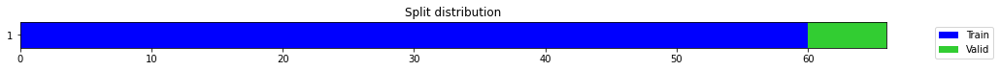

epoch,train_loss,valid_loss,mse,time
0,0.515969,0.027520,0.027520,00:00
1,0.476831,0.057678,0.057678,00:00
2,0.343824,0.084220,0.084220,00:00
3,0.273928,0.062712,0.062712,00:00
4,0.233115,0.554317,0.554317,00:00
5,0.208384,0.208564,0.208564,00:00
6,0.193260,0.314666,0.314666,00:00
7,0.174949,0.372634,0.372634,00:00
8,0.162289,0.472830,0.472830,00:00
9,0.149433,0.330364,0.330364,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5746262669563293,
  "MSE_normalize": 0.33036444028043555,
  "RMSE_normalize": 0.5747733816735389,
  "MAPE_normalize": 0.5941776970741229,
  "MAE": 37065.69272375107,
  "MSE": 1374569136.0136979,
  "RMSE": 37075.18221146995,
  "MAPE": 0.31411979897326686
}
Percent CPU Usage: 77.0
Percent Ram Usage: 9.6
2022-10-14 19:06:36.315138+07:00
PROGRESS: [ 54 / 1944 ]


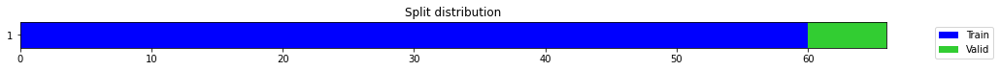

epoch,train_loss,valid_loss,mse,time
0,0.780044,1.155164,1.155164,00:00
1,0.453217,0.005954,0.005954,00:00
2,0.414017,0.154843,0.154843,00:00
3,0.363340,1.275638,1.275638,00:00
4,0.308578,0.032881,0.032881,00:00
5,0.264651,0.286273,0.286273,00:00
6,0.241478,0.188351,0.188351,00:00
7,0.227669,0.230622,0.230622,00:00
8,0.203485,0.430476,0.430476,00:00
9,0.191674,0.009703,0.009703,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.28930824001630145,
  "MSE_normalize": 0.08372449113378089,
  "RMSE_normalize": 0.28935184660509927,
  "MAPE_normalize": 0.299194092394475,
  "MAE": 18661.53871401151,
  "MSE": 348358017.41632885,
  "RMSE": 18664.351513415324,
  "MAPE": 0.158162241062753
}
Percent CPU Usage: 76.3
Percent Ram Usage: 9.6
2022-10-14 19:06:45.903980+07:00
PROGRESS: [ 55 / 1944 ]


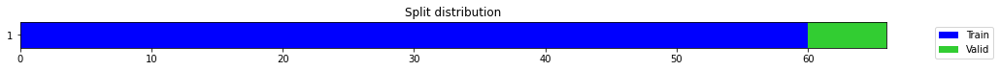

epoch,train_loss,valid_loss,mse,time
0,0.252473,0.994911,0.994911,00:00
1,0.166908,0.199202,0.199202,00:00
2,0.147025,0.165684,0.165684,00:00
3,0.138845,0.087023,0.087023,00:00
4,0.119941,0.316965,0.316965,00:00
5,0.107512,0.001400,0.001400,00:00
6,0.101302,0.161500,0.161500,00:00
7,0.097993,0.007469,0.007469,00:00
8,0.092912,0.605401,0.605401,00:00
9,0.089375,0.664916,0.664916,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13925094405810037,
  "MSE_normalize": 0.019442623130505748,
  "RMSE_normalize": 0.13943680694316601,
  "MAPE_normalize": 0.1442156211271195,
  "MAE": 8982.242895523706,
  "MSE": 80896205.58330384,
  "RMSE": 8994.23179506198,
  "MAPE": 0.07618494568796198
}
Percent CPU Usage: 75.9
Percent Ram Usage: 9.5
2022-10-14 19:07:04.974719+07:00
PROGRESS: [ 56 / 1944 ]


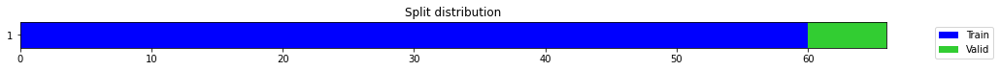

epoch,train_loss,valid_loss,mse,time
0,0.394369,0.816357,0.816357,00:00
1,0.237470,0.117983,0.117983,00:00
2,0.175220,0.008624,0.008624,00:00
3,0.171844,0.015950,0.015950,00:00
4,0.169115,0.000648,0.000648,00:00
5,0.148649,0.339402,0.339402,00:00
6,0.140498,0.348443,0.348443,00:00
7,0.131380,0.013685,0.013685,00:00
8,0.119352,0.064811,0.064811,00:00
9,0.110848,0.068516,0.068516,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07465015848477681,
  "MSE_normalize": 0.005579953650410492,
  "RMSE_normalize": 0.07469908734656999,
  "MAPE_normalize": 0.07727207026970917,
  "MAE": 4815.233822902043,
  "MSE": 23216881.519483123,
  "RMSE": 4818.3899302031505,
  "MAPE": 0.04083047645941918
}
Percent CPU Usage: 76.2
Percent Ram Usage: 9.6
2022-10-14 19:07:43.934115+07:00
PROGRESS: [ 57 / 1944 ]


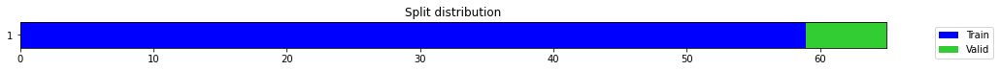

epoch,train_loss,valid_loss,mse,time
0,0.428664,0.266323,0.266323,00:00
1,0.263444,0.035869,0.035869,00:00
2,0.212451,0.312869,0.312869,00:00
3,0.176026,4.570127,4.570127,00:00
4,0.164352,0.882812,0.882812,00:00
5,0.139930,0.023858,0.023858,00:00
6,0.125459,0.021172,0.021172,00:00
7,0.114493,0.342284,0.342284,00:00
8,0.110707,0.033092,0.033092,00:00
9,0.102084,0.001672,0.001672,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.040755788485209145,
  "MSE_normalize": 0.0016718547507442356,
  "RMSE_normalize": 0.04088832046861592,
  "MAPE_normalize": 0.04213920347869592,
  "MAE": 2628.9113804499307,
  "MSE": 6956196.430584766,
  "RMSE": 2637.4602235076013,
  "MAPE": 0.02227831708979262
}
Percent CPU Usage: 77.8
Percent Ram Usage: 9.5
2022-10-14 19:07:47.935690+07:00
PROGRESS: [ 58 / 1944 ]


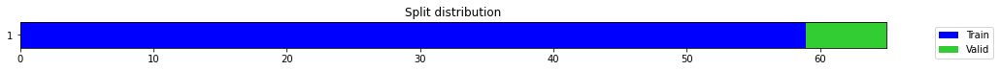

epoch,train_loss,valid_loss,mse,time
0,0.568572,0.176542,0.176542,00:00
1,0.428322,0.533698,0.533698,00:00
2,0.327437,0.510016,0.510016,00:00
3,0.323315,0.267106,0.267106,00:00
4,0.283035,3.013953,3.013953,00:00
5,0.245916,0.115723,0.115723,00:00
6,0.218985,0.387611,0.387611,00:00
7,0.199123,0.170220,0.170220,00:00
8,0.180150,0.316933,0.316933,00:00
9,0.167946,0.757999,0.757999,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2532442510128021,
  "MSE_normalize": 0.06418038340397618,
  "RMSE_normalize": 0.2533384759644223,
  "MAPE_normalize": 0.2618369458292029,
  "MAE": 16335.267167329788,
  "MSE": 267039558.16111448,
  "RMSE": 16341.345053609097,
  "MAPE": 0.1384294747328199
}
Percent CPU Usage: 79.0
Percent Ram Usage: 9.5
2022-10-14 19:07:57.129986+07:00
PROGRESS: [ 59 / 1944 ]


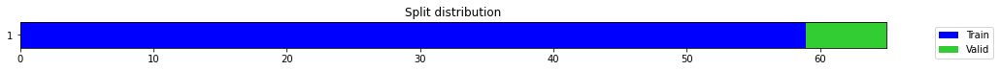

epoch,train_loss,valid_loss,mse,time
0,0.242222,0.020109,0.020109,00:00
1,0.185764,0.125931,0.125931,00:00
2,0.155346,0.164549,0.164549,00:00
3,0.150527,0.049391,0.049391,00:00
4,0.147109,1.094055,1.094055,00:00
5,0.133639,0.193514,0.193514,00:00
6,0.125015,0.011058,0.011058,00:00
7,0.123373,0.421211,0.421211,00:00
8,0.118005,0.718896,0.718896,00:00
9,0.119002,1.600017,1.600017,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06396633386611938,
  "MSE_normalize": 0.004099474626107972,
  "RMSE_normalize": 0.06402713976204132,
  "MAPE_normalize": 0.06617496012487882,
  "MAE": 4126.084399700165,
  "MSE": 17056954.707764357,
  "RMSE": 4130.006623210713,
  "MAPE": 0.03497621195700432
}
Percent CPU Usage: 77.7
Percent Ram Usage: 9.5
2022-10-14 19:08:16.021542+07:00
PROGRESS: [ 60 / 1944 ]


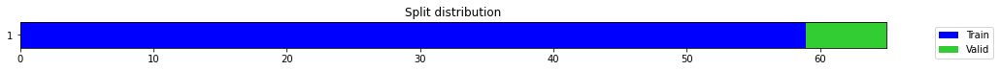

epoch,train_loss,valid_loss,mse,time
0,0.289604,0.627504,0.627504,00:00
1,0.203819,0.019080,0.019080,00:00
2,0.213110,0.001914,0.001914,00:00
3,0.207808,0.288317,0.288317,00:00
4,0.174344,1.501305,1.501305,00:00
5,0.163348,2.109732,2.109732,00:00
6,0.149577,1.316645,1.316645,00:00
7,0.142335,0.300882,0.300882,00:00
8,0.136513,0.654627,0.654627,00:00
9,0.127790,1.758796,1.758796,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14772426088651022,
  "MSE_normalize": 0.021864598621151643,
  "RMSE_normalize": 0.14786682731820427,
  "MAPE_normalize": 0.15268326648460784,
  "MAE": 9528.805724223455,
  "MSE": 90973478.8963682,
  "RMSE": 9538.001829333449,
  "MAPE": 0.08073475932509218
}
Percent CPU Usage: 81.3
Percent Ram Usage: 9.6
2022-10-14 19:08:53.107054+07:00
PROGRESS: [ 61 / 1944 ]


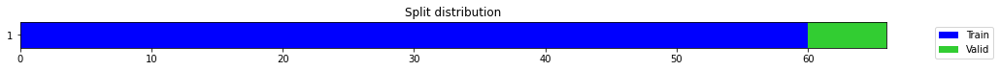

epoch,train_loss,valid_loss,mse,time
0,0.185324,0.051899,0.051899,00:00
1,0.220014,2.015523,2.015523,00:00
2,0.198418,3.363202,3.363202,00:00
3,0.213487,0.000274,0.000274,00:00
4,0.206926,0.760945,0.760945,00:00
5,0.202685,0.107331,0.107331,00:00
6,0.183186,0.033648,0.033648,00:00
7,0.166242,0.270779,0.270779,00:00
8,0.151477,0.204876,0.204876,00:00
9,0.136887,0.095215,0.095215,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.30709920326868695,
  "MSE_normalize": 0.0952149684038505,
  "RMSE_normalize": 0.30856922789521724,
  "MAPE_normalize": 0.3170064329828356,
  "MAE": 19809.127007643383,
  "MSE": 396167204.74925494,
  "RMSE": 19903.94947615309,
  "MAPE": 0.16772466746441952
}
Percent CPU Usage: 93.9
Percent Ram Usage: 9.7
2022-10-14 19:08:58.681532+07:00
PROGRESS: [ 62 / 1944 ]


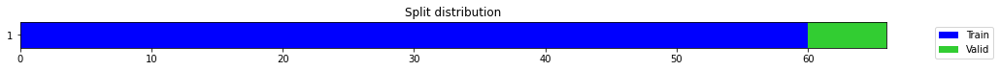

epoch,train_loss,valid_loss,mse,time
0,0.080613,0.068910,0.068910,00:00
1,0.075786,0.301862,0.301862,00:00
2,0.081908,0.132461,0.132461,00:00
3,0.097124,0.706810,0.706810,00:00
4,0.103433,5.678507,5.678507,00:00
5,0.159369,0.107650,0.107650,00:00
6,0.152170,2.727714,2.727714,00:00
7,0.142109,1.714506,1.714506,00:00
8,0.134560,0.064182,0.064182,00:00
9,0.122657,0.810688,0.810688,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.010366628567377726,
  "MSE_normalize": 0.0001521011536708509,
  "RMSE_normalize": 0.01233292964671618,
  "MAPE_normalize": 0.010864674582183044,
  "MAE": 668.6890091101328,
  "MSE": 632857.3111880701,
  "RMSE": 795.5232939317806,
  "MAPE": 0.005707498461463234
}
Percent CPU Usage: 76.5
Percent Ram Usage: 9.7
2022-10-14 19:09:09.386844+07:00
PROGRESS: [ 63 / 1944 ]


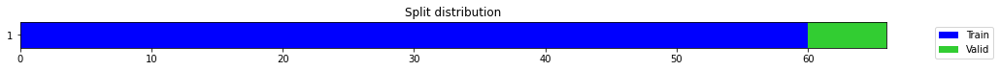

epoch,train_loss,valid_loss,mse,time
0,0.178725,0.550133,0.550133,00:00
1,0.113596,0.045655,0.045655,00:00
2,0.109299,0.061861,0.061861,00:00
3,0.092635,0.120660,0.120660,00:00
4,0.088752,0.473142,0.473142,00:00
5,0.082191,0.048120,0.048120,00:00
6,0.084442,0.169756,0.169756,00:00
7,0.087227,0.479478,0.479478,00:00
8,0.097442,0.414974,0.414974,00:00
9,0.100055,0.214239,0.214239,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.01811214288075765,
  "MSE_normalize": 0.00044439967712743095,
  "RMSE_normalize": 0.021080789290902534,
  "MAPE_normalize": 0.01891186428586243,
  "MAE": 1168.3056643803914,
  "MSE": 1849043.0741131874,
  "RMSE": 1359.795232420377,
  "MAPE": 0.009951823509491848
}
Percent CPU Usage: 76.2
Percent Ram Usage: 9.8
2022-10-14 19:09:30.644259+07:00
PROGRESS: [ 64 / 1944 ]


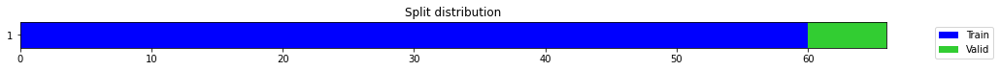

epoch,train_loss,valid_loss,mse,time
0,0.058153,0.004955,0.004955,00:00
1,0.062447,0.004433,0.004433,00:00
2,0.052341,0.073438,0.073438,00:00
3,0.049372,0.066413,0.066413,00:00
4,0.046951,0.033722,0.033722,00:00
5,0.048544,0.000616,0.000616,00:00
6,0.049129,0.106127,0.106127,00:00
7,0.049407,0.263138,0.263138,00:00
8,0.053933,0.010609,0.010609,00:00
9,0.054760,0.280891,0.280891,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03915030757586161,
  "MSE_normalize": 0.0015391663493075451,
  "RMSE_normalize": 0.039232210609492106,
  "MAPE_normalize": 0.04054015177472147,
  "MAE": 2525.3514398733773,
  "MSE": 6404111.039169618,
  "RMSE": 2530.6345131546786,
  "MAPE": 0.02141768376083532
}
Percent CPU Usage: 77.2
Percent Ram Usage: 9.9
2022-10-14 19:10:12.939446+07:00
PROGRESS: [ 65 / 1944 ]


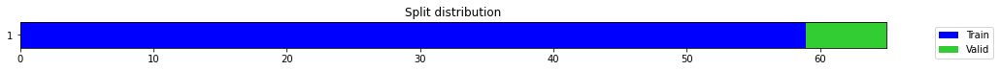

epoch,train_loss,valid_loss,mse,time
0,0.240212,0.098783,0.098783,00:00
1,0.245192,0.140413,0.140413,00:00
2,0.196281,1.119578,1.119578,00:00
3,0.170620,2.609279,2.609279,00:00
4,0.155548,0.026400,0.026400,00:00
5,0.136673,0.014268,0.014268,00:00
6,0.120302,0.771782,0.771782,00:00
7,0.108748,0.050304,0.050304,00:00
8,0.100592,0.296259,0.296259,00:00
9,0.092265,0.196477,0.196477,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4429730772972107,
  "MSE_normalize": 0.19647732350084723,
  "RMSE_normalize": 0.4432576265568899,
  "MAPE_normalize": 0.4579181066977908,
  "MAE": 28573.53537797928,
  "MSE": 817496170.5369633,
  "RMSE": 28591.889943425624,
  "MAPE": 0.24211605980620962
}
Percent CPU Usage: 78.0
Percent Ram Usage: 10.0
2022-10-14 19:10:17.668197+07:00
PROGRESS: [ 66 / 1944 ]


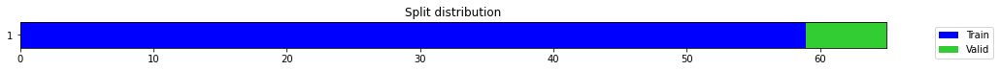

epoch,train_loss,valid_loss,mse,time
0,0.297276,1.248581,1.248581,00:00
1,0.214840,0.166877,0.166877,00:00
2,0.214874,1.945912,1.945912,00:00
3,0.196191,1.598610,1.598610,00:00
4,0.185402,0.580152,0.580152,00:00
5,0.160302,8.836328,8.836328,00:00
6,0.165069,4.556602,4.556602,00:00
7,0.156402,3.209574,3.209574,00:00
8,0.149701,3.061371,3.061371,00:00
9,0.136917,0.728928,0.728928,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.30906667311986286,
  "MSE_normalize": 0.0956859238323678,
  "RMSE_normalize": 0.309331414234584,
  "MAPE_normalize": 0.31944348295191377,
  "MAE": 19936.036682923634,
  "MSE": 398126740.09128046,
  "RMSE": 19953.113543787607,
  "MAPE": 0.16891263248993668
}
Percent CPU Usage: 77.0
Percent Ram Usage: 10.1
2022-10-14 19:10:28.766509+07:00
PROGRESS: [ 67 / 1944 ]


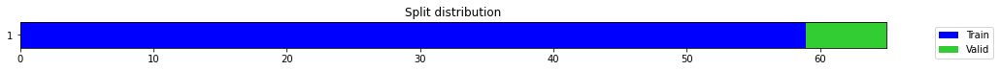

epoch,train_loss,valid_loss,mse,time
0,0.201929,0.007673,0.007673,00:00
1,0.171329,0.006469,0.006469,00:00
2,0.142578,0.208053,0.208053,00:00
3,0.127944,0.434634,0.434634,00:00
4,0.114303,1.243147,1.243147,00:00
5,0.105515,0.524237,0.524237,00:00
6,0.101328,0.323077,0.323077,00:00
7,0.094454,0.228766,0.228766,00:00
8,0.089312,0.057969,0.057969,00:00
9,0.094794,0.070801,0.070801,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04087531566619873,
  "MSE_normalize": 0.0016806108904970547,
  "RMSE_normalize": 0.04099525448752642,
  "MAPE_normalize": 0.042303672707641765,
  "MAE": 2636.621361732483,
  "MSE": 6992628.679299642,
  "RMSE": 2644.357895463404,
  "MAPE": 0.022354990801549696
}
Percent CPU Usage: 77.6
Percent Ram Usage: 10.2
2022-10-14 19:10:50.471178+07:00
PROGRESS: [ 68 / 1944 ]


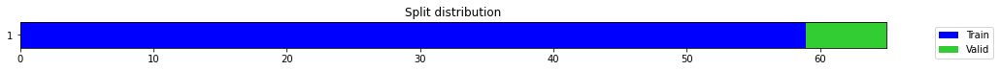

epoch,train_loss,valid_loss,mse,time
0,0.083812,0.235661,0.235661,00:00
1,0.076426,0.396879,0.396879,00:00
2,0.074672,0.424022,0.424022,00:00
3,0.072964,0.294274,0.294274,00:00
4,0.067675,1.187324,1.187324,00:00
5,0.066681,1.319117,1.319117,00:00
6,0.066766,0.462954,0.462954,00:00
7,0.063229,0.261988,0.261988,00:00
8,0.059181,0.042136,0.042136,00:00
9,0.064605,0.176739,0.176739,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07374953230222066,
  "MSE_normalize": 0.005499253002575107,
  "RMSE_normalize": 0.0741569484443306,
  "MAPE_normalize": 0.07611978796970867,
  "MAE": 4757.139831622441,
  "MSE": 22881105.006500468,
  "RMSE": 4783.4198024531015,
  "MAPE": 0.040276384035705305
}
Percent CPU Usage: 77.9
Percent Ram Usage: 10.3
2022-10-14 19:11:33.744175+07:00
PROGRESS: [ 69 / 1944 ]


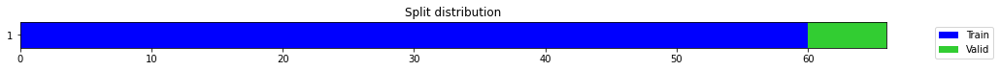

epoch,train_loss,valid_loss,mse,time
0,0.156876,0.155885,0.155885,00:00
1,0.184393,0.529009,0.529009,00:00
2,0.205440,1.291864,1.291864,00:00
3,0.266136,0.005377,0.005377,00:00
4,0.246050,0.797544,0.797544,00:00
5,0.220875,2.876558,2.876558,00:00
6,0.208581,0.114901,0.114901,00:00
7,0.187257,1.624589,1.624589,00:00
8,0.176592,1.841139,1.841139,00:00
9,0.163700,1.265544,1.265544,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 1.122276782989502,
  "MSE_normalize": 1.2655442771938337,
  "RMSE_normalize": 1.1249641226251768,
  "MAPE_normalize": 1.1592298333671238,
  "MAE": 72391.34160995483,
  "MSE": 5265633620.291388,
  "RMSE": 72564.6857658144,
  "MAPE": 0.613149241745078
}
Percent CPU Usage: 75.5
Percent Ram Usage: 10.4
2022-10-14 19:11:39.232827+07:00
PROGRESS: [ 70 / 1944 ]


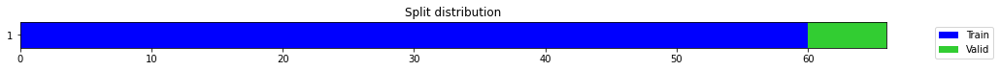

epoch,train_loss,valid_loss,mse,time
0,0.397866,0.406426,0.406426,00:00
1,0.245466,0.074815,0.074815,00:00
2,0.279742,0.124456,0.124456,00:00
3,0.282361,1.425243,1.425243,00:00
4,0.247267,0.394312,0.394312,00:00
5,0.242376,0.507335,0.507335,00:00
6,0.240402,0.032504,0.032504,00:00
7,0.222942,0.037121,0.037121,00:00
8,0.208344,0.002003,0.002003,00:00
9,0.194725,0.048515,0.048515,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.22095654408137003,
  "MSE_normalize": 0.04883671123339658,
  "RMSE_normalize": 0.22099029669511866,
  "MAPE_normalize": 0.22850349400497158,
  "MAE": 14252.580919424692,
  "MSE": 203198128.43312192,
  "RMSE": 14254.758098021934,
  "MAPE": 0.12079413308654373
}
Percent CPU Usage: 74.1
Percent Ram Usage: 10.5
2022-10-14 19:11:52.280079+07:00
PROGRESS: [ 71 / 1944 ]


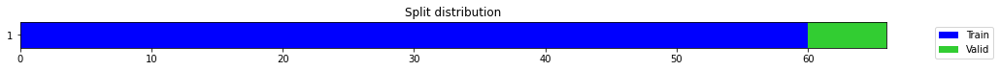

epoch,train_loss,valid_loss,mse,time
0,0.262666,0.156333,0.156333,00:00
1,0.208053,0.038640,0.038640,00:00
2,0.175170,0.024502,0.024502,00:00
3,0.177025,0.002058,0.002058,00:00
4,0.160417,0.254156,0.254156,00:00
5,0.149542,0.039606,0.039606,00:00
6,0.133815,0.796718,0.796718,00:00
7,0.131415,0.351060,0.351060,00:00
8,0.125439,0.002162,0.002162,00:00
9,0.128571,3.273849,3.273849,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06146424015363058,
  "MSE_normalize": 0.004035870651459679,
  "RMSE_normalize": 0.06352850266974407,
  "MAPE_normalize": 0.06395444170787608,
  "MAE": 3964.6893468697867,
  "MSE": 16792313.451565217,
  "RMSE": 4097.842536209172,
  "MAPE": 0.03371087727766865
}
Percent CPU Usage: 80.5
Percent Ram Usage: 10.9
2022-10-14 19:12:20.255929+07:00
PROGRESS: [ 72 / 1944 ]


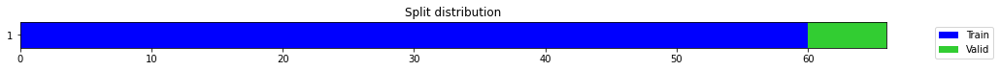

epoch,train_loss,valid_loss,mse,time
0,0.194835,0.186826,0.186826,00:00
1,0.130654,0.055563,0.055563,00:00
2,0.113687,0.001397,0.001397,00:00
3,0.108017,0.123941,0.123941,00:00
4,0.096664,0.529176,0.529176,00:00
5,0.088239,0.250813,0.250813,00:00
6,0.086451,0.045118,0.045118,00:00
7,0.079119,0.064282,0.064282,00:00
8,0.075934,0.413712,0.413712,00:00
9,0.075653,0.335476,0.335476,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09032795826594035,
  "MSE_normalize": 0.008170515269988243,
  "RMSE_normalize": 0.09039090258421056,
  "MAPE_normalize": 0.09338136253967753,
  "MAE": 5826.5146199862165,
  "MSE": 33995602.26857615,
  "RMSE": 5830.574780291919,
  "MAPE": 0.04937226430491685
}
Percent CPU Usage: 75.4
Percent Ram Usage: 9.6
2022-10-14 19:13:15.296519+07:00
PROGRESS: [ 73 / 1944 ]


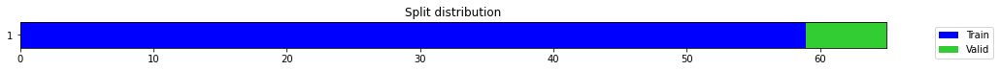

epoch,train_loss,valid_loss,mse,time
0,0.575371,0.893226,0.893226,00:00
1,0.448572,0.002716,0.002716,00:00
2,0.355907,0.098345,0.098345,00:00
3,0.286006,0.003563,0.003563,00:00
4,0.243075,0.000669,0.000669,00:00
5,0.209692,0.009373,0.009373,00:00
6,0.188255,0.018782,0.018782,00:00
7,0.169623,0.001853,0.001853,00:00
8,0.154630,0.011236,0.011236,00:00
9,0.138649,0.012780,0.012780,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11278120676676433,
  "MSE_normalize": 0.012780238796011645,
  "RMSE_normalize": 0.11304971824826299,
  "MAPE_normalize": 0.11682967349488811,
  "MAE": 7274.838961283366,
  "MSE": 53175583.258810006,
  "RMSE": 7292.159025885955,
  "MAPE": 0.06171091696384382
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.6
2022-10-14 19:13:16.937976+07:00
PROGRESS: [ 74 / 1944 ]


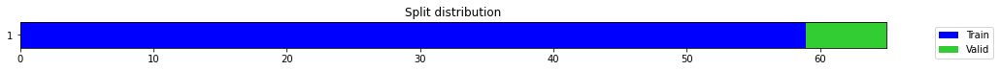

epoch,train_loss,valid_loss,mse,time
0,0.212330,0.162825,0.162825,00:00
1,0.186517,0.092671,0.092671,00:00
2,0.188464,0.018675,0.018675,00:00
3,0.168506,0.004022,0.004022,00:00
4,0.161675,0.017043,0.017043,00:00
5,0.150022,0.004667,0.004667,00:00
6,0.140815,0.564059,0.564059,00:00
7,0.133849,0.672965,0.672965,00:00
8,0.131165,0.063263,0.063263,00:00
9,0.125145,0.247055,0.247055,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03931398193041483,
  "MSE_normalize": 0.001684087958296369,
  "RMSE_normalize": 0.04103764074963824,
  "MAPE_normalize": 0.04042212116587166,
  "MAE": 2535.9090904394784,
  "MSE": 7007095.944834356,
  "RMSE": 2647.0919789146647,
  "MAPE": 0.021427047118373028
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.6
2022-10-14 19:13:20.590015+07:00
PROGRESS: [ 75 / 1944 ]


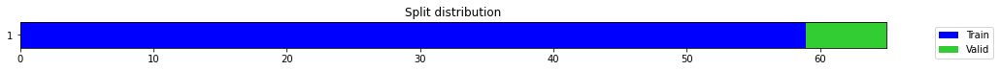

epoch,train_loss,valid_loss,mse,time
0,0.407876,0.155409,0.155409,00:00
1,0.400755,0.155652,0.155652,00:00
2,0.385563,0.094931,0.094931,00:00
3,0.329009,0.019852,0.019852,00:00
4,0.299373,0.013053,0.013053,00:00
5,0.265313,0.072428,0.072428,00:00
6,0.239783,0.046666,0.046666,00:00
7,0.226601,0.002956,0.002956,00:00
8,0.210148,0.219101,0.219101,00:00
9,0.190601,0.243183,0.243183,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.26031280557314557,
  "MSE_normalize": 0.06791064070614006,
  "RMSE_normalize": 0.26059670125721096,
  "MAPE_normalize": 0.26902025914992805,
  "MAE": 16791.21721069018,
  "MSE": 282560285.9748938,
  "RMSE": 16809.529617895136,
  "MAPE": 0.14225839198477355
}
Percent CPU Usage: 99.9
Percent Ram Usage: 9.7
2022-10-14 19:13:27.806452+07:00
PROGRESS: [ 76 / 1944 ]


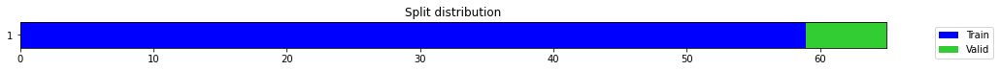

epoch,train_loss,valid_loss,mse,time
0,0.267117,0.677386,0.677386,00:00
1,0.236678,0.436138,0.436138,00:00
2,0.222390,0.236795,0.236795,00:00
3,0.203116,0.086281,0.086281,00:00
4,0.206582,0.011168,0.011168,00:00
5,0.192372,0.005209,0.005209,00:00
6,0.179138,0.010861,0.010861,00:00
7,0.170038,0.001101,0.001101,00:00
8,0.155176,0.002741,0.002741,00:00
9,0.152589,0.004527,0.004527,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04644441604614258,
  "MSE_normalize": 0.0021673828764114944,
  "RMSE_normalize": 0.0465551595036629,
  "MAPE_normalize": 0.04800318799352841,
  "MAE": 2995.850612640381,
  "MSE": 9017973.015833274,
  "RMSE": 3002.994008624272,
  "MAPE": 0.025382865882886973
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.8
2022-10-14 19:13:42.199912+07:00
PROGRESS: [ 77 / 1944 ]


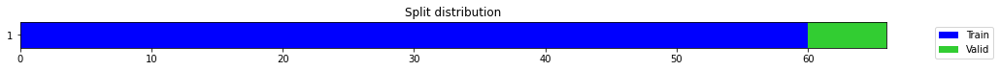

epoch,train_loss,valid_loss,mse,time
0,0.639938,0.755237,0.755237,00:00
1,0.425613,0.054871,0.054871,00:00
2,0.342843,0.008868,0.008868,00:00
3,0.281000,0.067574,0.067574,00:00
4,0.241259,0.091235,0.091235,00:00
5,0.215437,0.098399,0.098399,00:00
6,0.187819,0.014765,0.014765,00:00
7,0.170291,0.003315,0.003315,00:00
8,0.156550,0.001898,0.001898,00:00
9,0.144095,0.000723,0.000723,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.020837326844533283,
  "MSE_normalize": 0.0007227215619115176,
  "RMSE_normalize": 0.02688348120894163,
  "MAPE_normalize": 0.021884484301092896,
  "MAE": 1344.090930779775,
  "MSE": 3007075.313831883,
  "RMSE": 1734.092071901571,
  "MAPE": 0.011484963131472957
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.8
2022-10-14 19:13:43.983236+07:00
PROGRESS: [ 78 / 1944 ]


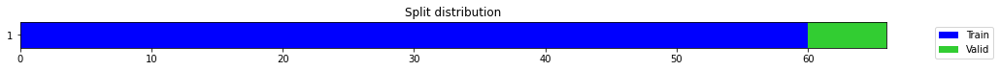

epoch,train_loss,valid_loss,mse,time
0,0.810385,2.219246,2.219246,00:00
1,0.671824,1.350045,1.350045,00:00
2,0.563062,0.159254,0.159254,00:00
3,0.438161,0.281421,0.281421,00:00
4,0.396496,0.618907,0.618907,00:00
5,0.349586,0.025585,0.025585,00:00
6,0.304611,0.001745,0.001745,00:00
7,0.275585,0.004216,0.004216,00:00
8,0.251020,0.002833,0.002833,00:00
9,0.224196,0.002181,0.002181,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.02365533510843913,
  "MSE_normalize": 0.0006764260941795422,
  "RMSE_normalize": 0.02600819282802137,
  "MAPE_normalize": 0.024228911347955396,
  "MAE": 1525.8637358347576,
  "MSE": 2814450.704997855,
  "RMSE": 1677.6324701786905,
  "MAPE": 0.01286674965279932
}
Percent CPU Usage: 99.7
Percent Ram Usage: 9.8
2022-10-14 19:13:47.937595+07:00
PROGRESS: [ 79 / 1944 ]


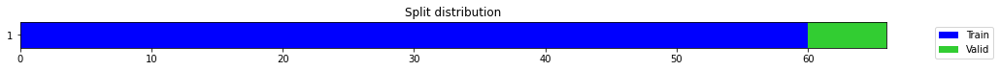

epoch,train_loss,valid_loss,mse,time
0,0.773371,2.348712,2.348712,00:00
1,0.688657,1.642769,1.642769,00:00
2,0.624520,0.921687,0.921687,00:00
3,0.537294,0.288114,0.288114,00:00
4,0.445969,0.005097,0.005097,00:00
5,0.381593,0.450656,0.450656,00:00
6,0.360809,0.464949,0.464949,00:00
7,0.325670,0.091122,0.091122,00:00
8,0.291484,0.012840,0.012840,00:00
9,0.266193,0.058224,0.058224,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04514220356941223,
  "MSE_normalize": 0.0020977145880246204,
  "RMSE_normalize": 0.04580081427250634,
  "MAPE_normalize": 0.04685805229484888,
  "MAE": 2911.8526990413666,
  "MSE": 8728099.56912028,
  "RMSE": 2954.335723833749,
  "MAPE": 0.024727425891474652
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.8
2022-10-14 19:13:55.497405+07:00
PROGRESS: [ 80 / 1944 ]


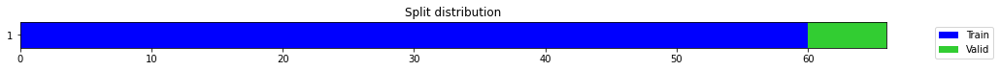

epoch,train_loss,valid_loss,mse,time
0,0.287974,0.857309,0.857309,00:00
1,0.264941,0.467035,0.467035,00:00
2,0.222782,0.139523,0.139523,00:00
3,0.180834,0.001757,0.001757,00:00
4,0.164016,0.103045,0.103045,00:00
5,0.155044,0.254426,0.254426,00:00
6,0.152883,0.222862,0.222862,00:00
7,0.145840,0.086711,0.086711,00:00
8,0.137376,0.000837,0.000837,00:00
9,0.128260,0.019196,0.019196,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07430574297904968,
  "MSE_normalize": 0.005529136152730392,
  "RMSE_normalize": 0.07435816130547064,
  "MAPE_normalize": 0.07691458137636158,
  "MAE": 4793.017645120621,
  "MSE": 23005441.8021176,
  "RMSE": 4796.398836848079,
  "MAPE": 0.040641791230469855
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.8
2022-10-14 19:14:10.835803+07:00
PROGRESS: [ 81 / 1944 ]


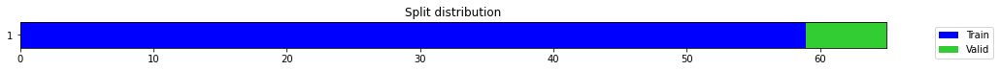

epoch,train_loss,valid_loss,mse,time
0,0.617198,1.303598,1.303598,00:00
1,0.477135,0.205053,0.205053,00:00
2,0.363287,0.106610,0.106610,00:00
3,0.292175,0.256340,0.256340,00:00
4,0.260156,1.051208,1.051208,00:00
5,0.231851,1.470443,1.470443,00:00
6,0.213198,0.752992,0.752992,00:00
7,0.195029,0.363841,0.363841,00:00
8,0.176045,0.275846,0.275846,00:00
9,0.160252,0.227795,0.227795,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.47679027915000916,
  "MSE_normalize": 0.2277953482858234,
  "RMSE_normalize": 0.47727910941693585,
  "MAPE_normalize": 0.4927564025100531,
  "MAE": 30754.88016629219,
  "MSE": 947803143.7505379,
  "RMSE": 30786.41167383003,
  "MAPE": 0.260565996164799
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.9
2022-10-14 19:14:12.568906+07:00
PROGRESS: [ 82 / 1944 ]


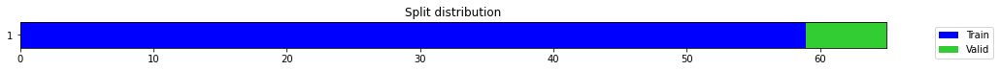

epoch,train_loss,valid_loss,mse,time
0,0.502030,0.894536,0.894536,00:00
1,0.357477,0.237363,0.237363,00:00
2,0.320188,0.072408,0.072408,00:00
3,0.279601,0.321907,0.321907,00:00
4,0.239569,0.179048,0.179048,00:00
5,0.218285,0.033942,0.033942,00:00
6,0.192009,0.314071,0.314071,00:00
7,0.174888,0.334490,0.334490,00:00
8,0.161362,0.092749,0.092749,00:00
9,0.145847,0.021776,0.021776,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15472973386446634,
  "MSE_normalize": 0.024049837173499473,
  "RMSE_normalize": 0.15508009921811203,
  "MAPE_normalize": 0.15983566728781282,
  "MAE": 9980.686753193537,
  "MSE": 100065745.20183009,
  "RMSE": 10003.286719965097,
  "MAPE": 0.0845387265546327
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.8
2022-10-14 19:14:16.495363+07:00
PROGRESS: [ 83 / 1944 ]


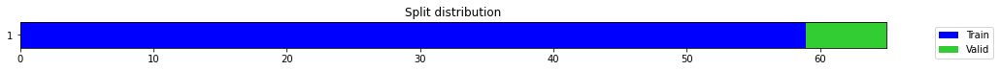

epoch,train_loss,valid_loss,mse,time
0,0.315699,0.435132,0.435132,00:00
1,0.337387,0.362235,0.362235,00:00
2,0.314946,0.221414,0.221414,00:00
3,0.274317,0.098064,0.098064,00:00
4,0.239584,0.001087,0.001087,00:00
5,0.212090,0.015588,0.015588,00:00
6,0.198247,0.008250,0.008250,00:00
7,0.179776,0.350207,0.350207,00:00
8,0.163137,0.683831,0.683831,00:00
9,0.150264,0.509011,0.509011,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.19284657637278238,
  "MSE_normalize": 0.03726469020703386,
  "RMSE_normalize": 0.19304064392514303,
  "MAPE_normalize": 0.1996923918820944,
  "MAE": 12439.375562349955,
  "MSE": 155049656.61019447,
  "RMSE": 12451.893695747425,
  "MAPE": 0.10549911710318999
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.9
2022-10-14 19:14:24.160561+07:00
PROGRESS: [ 84 / 1944 ]


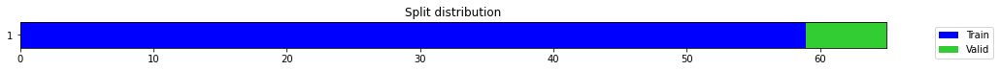

epoch,train_loss,valid_loss,mse,time
0,0.268917,1.448165,1.448165,00:00
1,0.277542,1.061886,1.061886,00:00
2,0.240608,0.667400,0.667400,00:00
3,0.212200,0.312759,0.312759,00:00
4,0.187799,0.071819,0.071819,00:00
5,0.183813,0.003285,0.003285,00:00
6,0.178098,0.000574,0.000574,00:00
7,0.170986,0.005397,0.005397,00:00
8,0.164457,0.057050,0.057050,00:00
9,0.153420,0.201946,0.201946,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.04743735988934835,
  "MSE_normalize": 0.002355245839985661,
  "RMSE_normalize": 0.048530875120748246,
  "MAPE_normalize": 0.04929873843843504,
  "MAE": 3059.899462302526,
  "MSE": 9799626.850337712,
  "RMSE": 3130.4355687887446,
  "MAPE": 0.026000766670574826
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.9
2022-10-14 19:14:39.144572+07:00
PROGRESS: [ 85 / 1944 ]


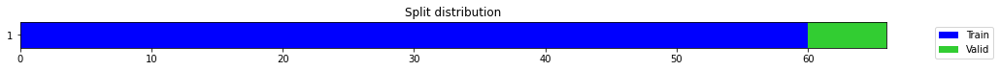

epoch,train_loss,valid_loss,mse,time
0,0.452782,0.897101,0.897101,00:00
1,0.288077,0.012390,0.012390,00:00
2,0.241480,0.096582,0.096582,00:00
3,0.204702,0.001732,0.001732,00:00
4,0.184050,0.000647,0.000647,00:00
5,0.160674,0.002434,0.002434,00:00
6,0.145734,0.002115,0.002115,00:00
7,0.134157,0.002541,0.002541,00:00
8,0.124383,0.000372,0.000372,00:00
9,0.115046,0.000489,0.000489,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.02035069465637207,
  "MSE_normalize": 0.0004888563480444456,
  "RMSE_normalize": 0.022110096065925303,
  "MAPE_normalize": 0.02088703676444464,
  "MAE": 1312.701208114624,
  "MSE": 2034016.879649197,
  "RMSE": 1426.1896366364456,
  "MAPE": 0.011080985275801059
}
Percent CPU Usage: 100.0
Percent Ram Usage: 9.9
2022-10-14 19:14:40.992070+07:00
PROGRESS: [ 86 / 1944 ]


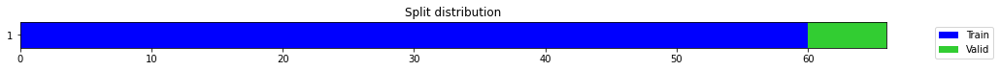

epoch,train_loss,valid_loss,mse,time
0,0.434916,0.908489,0.908489,00:00
1,0.390832,0.612695,0.612695,00:00
2,0.292100,0.136369,0.136369,00:00
3,0.258045,0.069327,0.069327,00:00
4,0.234416,0.015419,0.015419,00:00
5,0.208542,0.343594,0.343594,00:00
6,0.188830,0.509215,0.509215,00:00
7,0.171432,0.014824,0.014824,00:00
8,0.153637,0.060367,0.060367,00:00
9,0.146709,0.053033,0.053033,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.01855007807413737,
  "MSE_normalize": 0.0004141704951088343,
  "RMSE_normalize": 0.020351179206837974,
  "MAPE_normalize": 0.019006022719463188,
  "MAE": 1196.554236094157,
  "MSE": 1723266.520878732,
  "RMSE": 1312.7324635578766,
  "MAPE": 0.010091463804551198
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.0
2022-10-14 19:14:45.294544+07:00
PROGRESS: [ 87 / 1944 ]


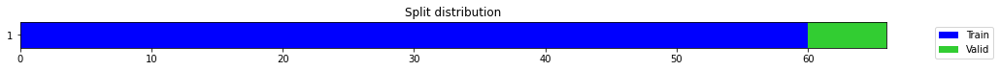

epoch,train_loss,valid_loss,mse,time
0,0.559243,2.019408,2.019408,00:00
1,0.531460,1.282260,1.282260,00:00
2,0.479361,0.535045,0.535045,00:00
3,0.386602,0.025376,0.025376,00:00
4,0.312341,0.177580,0.177580,00:00
5,0.284752,0.498894,0.498894,00:00
6,0.271213,0.306044,0.306044,00:00
7,0.243978,0.003695,0.003695,00:00
8,0.221380,0.210378,0.210378,00:00
9,0.206915,0.035037,0.035037,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07343204816182454,
  "MSE_normalize": 0.005406948344081286,
  "RMSE_normalize": 0.07353195457813756,
  "MAPE_normalize": 0.07592232102583542,
  "MAE": 4736.66083463033,
  "MSE": 22497046.920320887,
  "RMSE": 4743.1051981081855,
  "MAPE": 0.04013920992208015
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.0
2022-10-14 19:14:53.801387+07:00
PROGRESS: [ 88 / 1944 ]


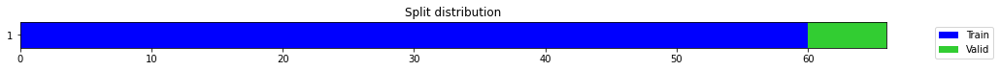

epoch,train_loss,valid_loss,mse,time
0,0.389192,0.464751,0.464751,00:00
1,0.324858,0.338444,0.338444,00:00
2,0.288251,0.188038,0.188038,00:00
3,0.240855,0.047610,0.047610,00:00
4,0.219199,0.003333,0.003333,00:00
5,0.194990,0.054911,0.054911,00:00
6,0.179872,0.113679,0.113679,00:00
7,0.169301,0.117898,0.117898,00:00
8,0.169265,0.037786,0.037786,00:00
9,0.160241,0.003590,0.003590,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0484527051448822,
  "MSE_normalize": 0.002496117815952085,
  "RMSE_normalize": 0.04996116307645455,
  "MAPE_normalize": 0.04984799924309271,
  "MAE": 3125.3932926654816,
  "MSE": 10385762.180545578,
  "RMSE": 3222.694863083624,
  "MAPE": 0.026415930560699925
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:15:10.562215+07:00
PROGRESS: [ 89 / 1944 ]


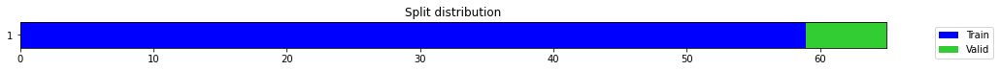

epoch,train_loss,valid_loss,mse,time
0,0.583019,0.410993,0.410993,00:00
1,0.456633,0.190506,0.190506,00:00
2,0.370451,0.118161,0.118161,00:00
3,0.298530,0.047367,0.047367,00:00
4,0.257464,0.000097,0.000097,00:00
5,0.226646,1.124835,1.124835,00:00
6,0.212036,0.878253,0.878253,00:00
7,0.190854,0.237224,0.237224,00:00
8,0.173441,0.087126,0.087126,00:00
9,0.160783,0.091601,0.091601,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.30084768931070965,
  "MSE_normalize": 0.09160073133493896,
  "RMSE_normalize": 0.3026561272053466,
  "MAPE_normalize": 0.3104663991560272,
  "MAE": 19405.879351298016,
  "MSE": 381129209.9791603,
  "RMSE": 19522.53082925368,
  "MAPE": 0.16428612255957017
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:15:13.267704+07:00
PROGRESS: [ 90 / 1944 ]


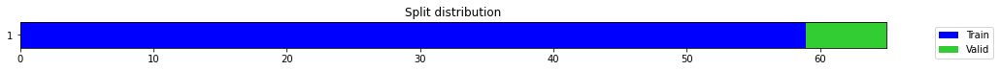

epoch,train_loss,valid_loss,mse,time
0,0.355191,0.802264,0.802264,00:00
1,0.275746,0.284492,0.284492,00:00
2,0.232534,0.100817,0.100817,00:00
3,0.204914,0.222335,0.222335,00:00
4,0.178291,0.688278,0.688278,00:00
5,0.162401,0.406737,0.406737,00:00
6,0.154877,0.096345,0.096345,00:00
7,0.145408,0.433830,0.433830,00:00
8,0.134889,0.153941,0.153941,00:00
9,0.125914,0.297376,0.297376,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1222180724143982,
  "MSE_normalize": 0.014959549144619425,
  "RMSE_normalize": 0.12230923572902998,
  "MAPE_normalize": 0.12649722267766994,
  "MAE": 7883.554543018341,
  "MSE": 62243183.695614375,
  "RMSE": 7889.434941465351,
  "MAPE": 0.06684426246269844
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.0
2022-10-14 19:15:18.685914+07:00
PROGRESS: [ 91 / 1944 ]


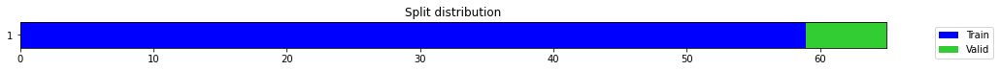

epoch,train_loss,valid_loss,mse,time
0,0.173242,0.045438,0.045438,00:00
1,0.157211,0.112603,0.112603,00:00
2,0.142811,0.184350,0.184350,00:00
3,0.142945,0.355598,0.355598,00:00
4,0.132652,0.269359,0.269359,00:00
5,0.120323,0.521756,0.521756,00:00
6,0.110793,0.659734,0.659734,00:00
7,0.104626,0.021757,0.021757,00:00
8,0.102762,0.008172,0.008172,00:00
9,0.097194,0.007536,0.007536,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0963920255502065,
  "MSE_normalize": 0.009297674801355646,
  "RMSE_normalize": 0.09642445126292214,
  "MAPE_normalize": 0.0997197300826745,
  "MAE": 6217.67121609052,
  "MSE": 38685449.34130012,
  "RMSE": 6219.76280426353,
  "MAPE": 0.052706211952946454
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.0
2022-10-14 19:15:28.250192+07:00
PROGRESS: [ 92 / 1944 ]


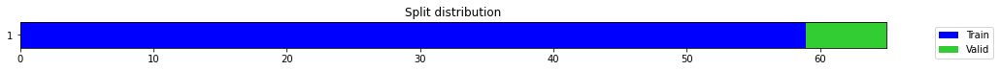

epoch,train_loss,valid_loss,mse,time
0,0.283278,0.769777,0.769777,00:00
1,0.224345,0.399838,0.399838,00:00
2,0.215241,0.108457,0.108457,00:00
3,0.194124,0.001665,0.001665,00:00
4,0.181602,0.010518,0.010518,00:00
5,0.175502,0.010864,0.010864,00:00
6,0.161060,0.007580,0.007580,00:00
7,0.147412,0.050719,0.050719,00:00
8,0.146723,0.336707,0.336707,00:00
9,0.141020,0.709250,0.709250,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.026935388644536335,
  "MSE_normalize": 0.0008367260969060671,
  "RMSE_normalize": 0.028926218157686413,
  "MAPE_normalize": 0.028095781905382342,
  "MAE": 1737.4403091271718,
  "MSE": 3481421.508707087,
  "RMSE": 1865.8567760434044,
  "MAPE": 0.014792367881707189
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:15:47.230761+07:00
PROGRESS: [ 93 / 1944 ]


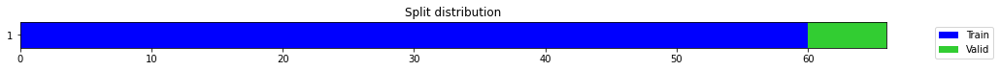

epoch,train_loss,valid_loss,mse,time
0,0.508384,0.764138,0.764138,00:00
1,0.314504,0.236001,0.236001,00:00
2,0.279674,0.621048,0.621048,00:00
3,0.231580,0.002329,0.002329,00:00
4,0.202855,0.130963,0.130963,00:00
5,0.178566,0.038455,0.038455,00:00
6,0.160089,0.308767,0.308767,00:00
7,0.154648,0.148023,0.148023,00:00
8,0.151114,0.076749,0.076749,00:00
9,0.138400,0.050104,0.050104,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.22195017337799072,
  "MSE_normalize": 0.05010441872521554,
  "RMSE_normalize": 0.22384016334254123,
  "MAPE_normalize": 0.22893971495989715,
  "MAE": 14316.673983573914,
  "MSE": 208472762.68331087,
  "RMSE": 14438.58589624728,
  "MAPE": 0.12117211302460924
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:15:49.584211+07:00
PROGRESS: [ 94 / 1944 ]


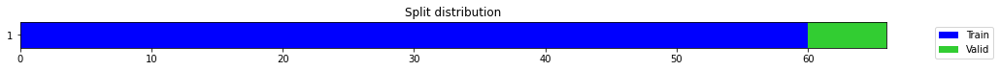

epoch,train_loss,valid_loss,mse,time
0,0.337445,0.713077,0.713077,00:00
1,0.224236,0.265685,0.265685,00:00
2,0.194680,0.001724,0.001724,00:00
3,0.184085,0.003095,0.003095,00:00
4,0.172384,0.295243,0.295243,00:00
5,0.166728,0.078631,0.078631,00:00
6,0.156527,0.170333,0.170333,00:00
7,0.150724,0.000663,0.000663,00:00
8,0.142323,1.052086,1.052086,00:00
9,0.132596,0.000024,0.000024,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.024479786554972332,
  "MSE_normalize": 0.0008429412686308998,
  "RMSE_normalize": 0.029033450856398378,
  "MAPE_normalize": 0.024967950707690516,
  "MAE": 1579.0441519419353,
  "MSE": 3507281.3840033747,
  "RMSE": 1872.7737140411211,
  "MAPE": 0.013285590674937536
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:15:55.023226+07:00
PROGRESS: [ 95 / 1944 ]


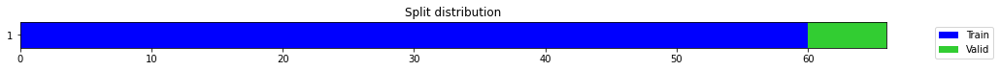

epoch,train_loss,valid_loss,mse,time
0,0.727769,1.183836,1.183836,00:00
1,0.704444,0.900687,0.900687,00:00
2,0.577908,0.460962,0.460962,00:00
3,0.467021,0.044913,0.044913,00:00
4,0.392070,0.180909,0.180909,00:00
5,0.350927,0.506800,0.506800,00:00
6,0.316646,0.386131,0.386131,00:00
7,0.287160,0.019699,0.019699,00:00
8,0.264195,0.102658,0.102658,00:00
9,0.242229,0.131060,0.131060,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0712666114171346,
  "MSE_normalize": 0.005082919747848062,
  "RMSE_normalize": 0.07129459830764223,
  "MAPE_normalize": 0.07372132549382689,
  "MAE": 4596.98150285085,
  "MSE": 21148839.748901505,
  "RMSE": 4598.786769236154,
  "MAPE": 0.03896636032670259
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.1
2022-10-14 19:16:05.599572+07:00
PROGRESS: [ 96 / 1944 ]


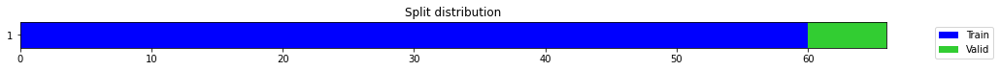

epoch,train_loss,valid_loss,mse,time
0,0.319593,1.503351,1.503351,00:00
1,0.254843,1.006787,1.006787,00:00
2,0.242679,0.512474,0.512474,00:00
3,0.222077,0.154070,0.154070,00:00
4,0.205789,0.002559,0.002559,00:00
5,0.184551,0.019263,0.019263,00:00
6,0.172848,0.045807,0.045807,00:00
7,0.168569,0.017721,0.017721,00:00
8,0.163365,0.001268,0.001268,00:00
9,0.149037,0.035680,0.035680,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07457368572552998,
  "MSE_normalize": 0.005612303566071712,
  "RMSE_normalize": 0.07491530929036942,
  "MAPE_normalize": 0.07698514163144159,
  "MAE": 4810.301024039586,
  "MSE": 23351481.949186787,
  "RMSE": 4832.337110465989,
  "MAPE": 0.04073052895970549
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:16:26.659265+07:00
PROGRESS: [ 97 / 1944 ]


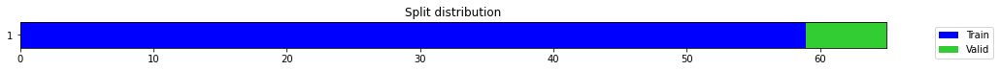

epoch,train_loss,valid_loss,mse,time
0,0.597667,1.165275,1.165275,00:00
1,0.428041,0.085746,0.085746,00:00
2,0.352479,0.108673,0.108673,00:00
3,0.297893,0.975444,0.975444,00:00
4,0.246329,1.382788,1.382788,00:00
5,0.226688,0.305210,0.305210,00:00
6,0.198559,0.130400,0.130400,00:00
7,0.183643,0.664391,0.664391,00:00
8,0.173181,0.508833,0.508833,00:00
9,0.163421,0.361857,0.361857,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5999204715092977,
  "MSE_normalize": 0.36185659916473983,
  "RMSE_normalize": 0.6015451763290434,
  "MAPE_normalize": 0.6196236172950548,
  "MAE": 38697.27009423574,
  "MSE": 1505600640.4699838,
  "RMSE": 38802.07005392861,
  "MAPE": 0.32774888159009957
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.2
2022-10-14 19:16:28.852629+07:00
PROGRESS: [ 98 / 1944 ]


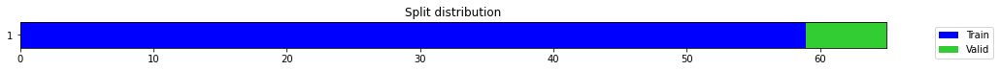

epoch,train_loss,valid_loss,mse,time
0,0.366389,0.800259,0.800259,00:00
1,0.261765,0.001109,0.001109,00:00
2,0.220931,0.405557,0.405557,00:00
3,0.198735,0.010142,0.010142,00:00
4,0.192936,0.431073,0.431073,00:00
5,0.173771,0.696944,0.696944,00:00
6,0.172326,0.383173,0.383173,00:00
7,0.159381,0.085476,0.085476,00:00
8,0.149341,0.042771,0.042771,00:00
9,0.146603,1.664293,1.664293,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.010987391074498495,
  "MSE_normalize": 0.00016161664007500556,
  "RMSE_normalize": 0.012712853341205725,
  "MAPE_normalize": 0.011478274560930686,
  "MAE": 708.7306738694509,
  "MSE": 672449.0236441869,
  "RMSE": 820.0298919211341,
  "MAPE": 0.006038807012896048
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:16:34.023312+07:00
PROGRESS: [ 99 / 1944 ]


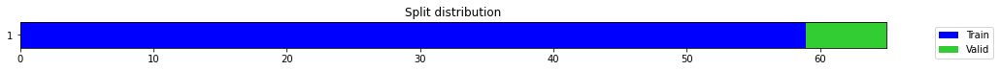

epoch,train_loss,valid_loss,mse,time
0,0.726428,1.891461,1.891461,00:00
1,0.545626,0.753493,0.753493,00:00
2,0.432474,0.033497,0.033497,00:00
3,0.372534,0.125420,0.125420,00:00
4,0.328334,0.215203,0.215203,00:00
5,0.289236,0.036409,0.036409,00:00
6,0.278384,0.277699,0.277699,00:00
7,0.247269,0.527809,0.527809,00:00
8,0.231230,2.051665,2.051665,00:00
9,0.220842,0.310023,0.310023,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07607003053029378,
  "MSE_normalize": 0.005881431809097393,
  "RMSE_normalize": 0.07669049360316696,
  "MAPE_normalize": 0.07890834659369024,
  "MAE": 4906.82124932607,
  "MSE": 24471261.59671383,
  "RMSE": 4946.843599378682,
  "MAPE": 0.04165356146170378
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:16:44.143079+07:00
PROGRESS: [ 100 / 1944 ]


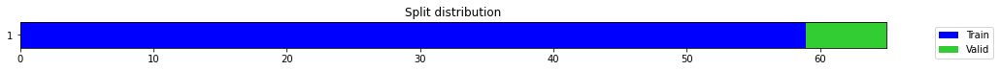

epoch,train_loss,valid_loss,mse,time
0,0.527646,0.689327,0.689327,00:00
1,0.384721,0.356392,0.356392,00:00
2,0.329324,0.123725,0.123725,00:00
3,0.279634,0.008624,0.008624,00:00
4,0.246830,0.065340,0.065340,00:00
5,0.227376,0.305194,0.305194,00:00
6,0.205139,0.410926,0.410926,00:00
7,0.189631,0.566055,0.566055,00:00
8,0.191315,0.335352,0.335352,00:00
9,0.184574,0.014328,0.014328,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0798104206720988,
  "MSE_normalize": 0.006411786197134006,
  "RMSE_normalize": 0.08007362984862124,
  "MAPE_normalize": 0.08269346942238234,
  "MAE": 5148.091375033061,
  "MSE": 26677942.110893052,
  "RMSE": 5165.069419755465,
  "MAPE": 0.04367518486846589
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:17:04.028869+07:00
PROGRESS: [ 101 / 1944 ]


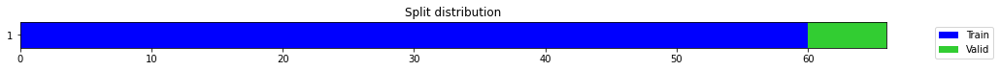

epoch,train_loss,valid_loss,mse,time
0,0.222202,0.053385,0.053385,00:00
1,0.173943,0.061810,0.061810,00:00
2,0.156237,0.549771,0.549771,00:00
3,0.140494,0.010897,0.010897,00:00
4,0.137493,0.116934,0.116934,00:00
5,0.132251,0.001301,0.001301,00:00
6,0.144632,0.078238,0.078238,00:00
7,0.135178,0.096281,0.096281,00:00
8,0.134916,0.005608,0.005608,00:00
9,0.128772,0.001544,0.001544,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.035615235567092896,
  "MSE_normalize": 0.00154377073123572,
  "RMSE_normalize": 0.03929084793225669,
  "MAPE_normalize": 0.03721159689780155,
  "MAE": 2297.32515501976,
  "MSE": 6423268.795021054,
  "RMSE": 2534.4168550222857,
  "MAPE": 0.019576361383699187
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:17:06.543597+07:00
PROGRESS: [ 102 / 1944 ]


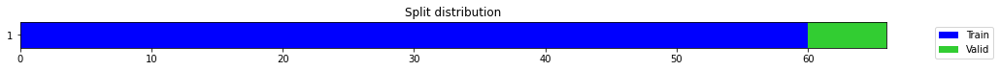

epoch,train_loss,valid_loss,mse,time
0,0.311036,0.385367,0.385367,00:00
1,0.214447,0.028013,0.028013,00:00
2,0.183348,0.316613,0.316613,00:00
3,0.195622,0.003755,0.003755,00:00
4,0.189641,0.189610,0.189610,00:00
5,0.176129,0.222394,0.222394,00:00
6,0.174476,0.314264,0.314264,00:00
7,0.171411,0.530908,0.530908,00:00
8,0.157841,0.343066,0.343066,00:00
9,0.147606,0.200901,0.200901,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06499053041140239,
  "MSE_normalize": 0.00456347890902542,
  "RMSE_normalize": 0.06755352625159859,
  "MAPE_normalize": 0.06681414780009676,
  "MAE": 4192.1491736571,
  "MSE": 18987567.959405724,
  "RMSE": 4357.472657333115,
  "MAPE": 0.03541886750272808
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.3
2022-10-14 19:17:12.418796+07:00
PROGRESS: [ 103 / 1944 ]


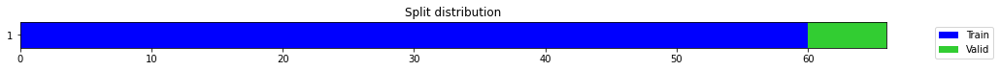

epoch,train_loss,valid_loss,mse,time
0,0.515858,0.723662,0.723662,00:00
1,0.402276,0.294971,0.294971,00:00
2,0.313817,0.024202,0.024202,00:00
3,0.265009,0.051610,0.051610,00:00
4,0.257446,0.218159,0.218159,00:00
5,0.231639,0.026839,0.026839,00:00
6,0.208517,0.204784,0.204784,00:00
7,0.197299,0.544094,0.544094,00:00
8,0.187823,0.505600,0.505600,00:00
9,0.186163,0.000487,0.000487,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.022664437691370647,
  "MSE_normalize": 0.0005757722957024924,
  "RMSE_normalize": 0.023995255691542285,
  "MAPE_normalize": 0.023280916819249865,
  "MAE": 1461.9468888441722,
  "MSE": 2395653.8009132333,
  "RMSE": 1547.7899731272435,
  "MAPE": 0.012346231871460804
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.4
2022-10-14 19:17:23.643120+07:00
PROGRESS: [ 104 / 1944 ]


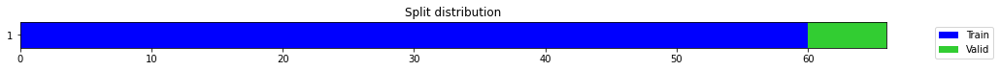

epoch,train_loss,valid_loss,mse,time
0,0.552017,1.201270,1.201270,00:00
1,0.456541,0.579368,0.579368,00:00
2,0.363984,0.119064,0.119064,00:00
3,0.299740,0.008694,0.008694,00:00
4,0.257154,0.204008,0.204008,00:00
5,0.245034,0.384993,0.384993,00:00
6,0.235080,0.260934,0.260934,00:00
7,0.221155,0.132875,0.132875,00:00
8,0.204438,0.014548,0.014548,00:00
9,0.193170,0.095581,0.095581,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0833520491917928,
  "MSE_normalize": 0.007199444330058924,
  "RMSE_normalize": 0.08484953936267965,
  "MAPE_normalize": 0.08659316506761235,
  "MAE": 5376.540581067403,
  "MSE": 29955203.302593056,
  "RMSE": 5473.134687050288,
  "MAPE": 0.045677622347006196
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.4
2022-10-14 19:17:45.353556+07:00
PROGRESS: [ 105 / 1944 ]


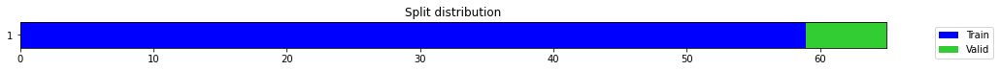

epoch,train_loss,valid_loss,mse,time
0,0.401782,0.104268,0.104268,00:00
1,0.271979,0.066850,0.066850,00:00
2,0.248339,0.327802,0.327802,00:00
3,0.220140,2.179916,2.179916,00:00
4,0.194370,0.003744,0.003744,00:00
5,0.169385,0.043611,0.043611,00:00
6,0.167603,0.001286,0.001286,00:00
7,0.150802,0.001862,0.001862,00:00
8,0.141143,0.000308,0.000308,00:00
9,0.130915,0.001398,0.001398,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03590651353200277,
  "MSE_normalize": 0.0013978379691828025,
  "RMSE_normalize": 0.03738767135277085,
  "MAPE_normalize": 0.037359461658781117,
  "MAE": 2316.1137488683066,
  "MSE": 5816076.71805026,
  "RMSE": 2411.6543529391315,
  "MAPE": 0.019692772415688873
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.4
2022-10-14 19:17:47.792283+07:00
PROGRESS: [ 106 / 1944 ]


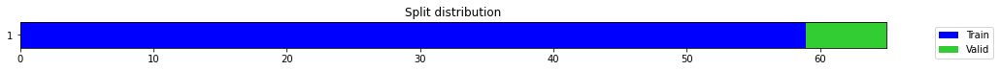

epoch,train_loss,valid_loss,mse,time
0,1.107312,2.984215,2.984215,00:00
1,0.916142,0.371739,0.371739,00:00
2,0.702063,1.017944,1.017944,00:00
3,0.566226,2.366114,2.366114,00:00
4,0.468982,0.607730,0.607730,00:00
5,0.429277,0.329593,0.329593,00:00
6,0.383465,0.296999,0.296999,00:00
7,0.344590,0.712702,0.712702,00:00
8,0.308396,0.306748,0.306748,00:00
9,0.283242,0.065444,0.065444,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.017493903636932373,
  "MSE_normalize": 0.00031855518403626587,
  "RMSE_normalize": 0.01784811429917082,
  "MAPE_normalize": 0.018130184335133182,
  "MAE": 1128.4267601966858,
  "MSE": 1325433.5839587206,
  "RMSE": 1151.2747647537144,
  "MAPE": 0.00957448597259176
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.5
2022-10-14 19:17:53.596494+07:00
PROGRESS: [ 107 / 1944 ]


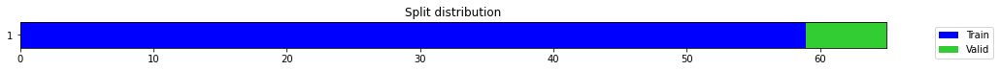

epoch,train_loss,valid_loss,mse,time
0,0.346261,0.029295,0.029295,00:00
1,0.293235,0.000554,0.000554,00:00
2,0.262265,0.028106,0.028106,00:00
3,0.244203,0.001559,0.001559,00:00
4,0.211125,0.030866,0.030866,00:00
5,0.198786,0.143772,0.143772,00:00
6,0.180127,1.303254,1.303254,00:00
7,0.168865,1.274275,1.274275,00:00
8,0.155287,0.990726,0.990726,00:00
9,0.150093,0.699403,0.699403,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14046354095141092,
  "MSE_normalize": 0.01977251418507997,
  "RMSE_normalize": 0.1406147722861292,
  "MAPE_normalize": 0.1451696620141277,
  "MAE": 9060.46024552981,
  "MSE": 82268805.07215866,
  "RMSE": 9070.215271544477,
  "MAPE": 0.07676406885899066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.5
2022-10-14 19:18:04.745029+07:00
PROGRESS: [ 108 / 1944 ]


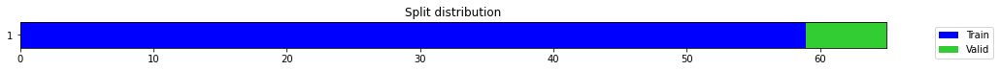

epoch,train_loss,valid_loss,mse,time
0,0.186662,0.041459,0.041459,00:00
1,0.223997,0.051763,0.051763,00:00
2,0.187169,0.021087,0.021087,00:00
3,0.167657,0.005290,0.005290,00:00
4,0.157879,0.004850,0.004850,00:00
5,0.145243,0.002775,0.002775,00:00
6,0.143292,0.018557,0.018557,00:00
7,0.134565,0.379949,0.379949,00:00
8,0.131527,0.732490,0.732490,00:00
9,0.129537,1.507493,1.507493,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10012524326642354,
  "MSE_normalize": 0.010036489053952971,
  "RMSE_normalize": 0.10018227914133802,
  "MAPE_normalize": 0.10362495871553477,
  "MAE": 6458.478691657384,
  "MSE": 41759482.57564352,
  "RMSE": 6462.157733732868,
  "MAPE": 0.05475949307438515
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.6
2022-10-14 19:18:28.156149+07:00
PROGRESS: [ 109 / 1944 ]


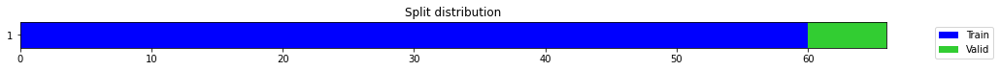

epoch,train_loss,valid_loss,mse,time
0,0.570095,0.333521,0.333521,00:00
1,0.375651,0.179446,0.179446,00:00
2,0.305084,0.169727,0.169727,00:00
3,0.271532,0.074953,0.074953,00:00
4,0.232401,1.506469,1.506469,00:00
5,0.210782,0.021738,0.021738,00:00
6,0.183243,0.208443,0.208443,00:00
7,0.162824,0.389906,0.389906,00:00
8,0.151452,0.368935,0.368935,00:00
9,0.140474,0.322853,0.322853,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5680917153755823,
  "MSE_normalize": 0.3228530478115883,
  "RMSE_normalize": 0.5682015908210644,
  "MAPE_normalize": 0.5874605883955502,
  "MAE": 36644.18800858656,
  "MSE": 1343315989.49648,
  "RMSE": 36651.27541432194,
  "MAPE": 0.3105588067170799
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.6
2022-10-14 19:18:31.376205+07:00
PROGRESS: [ 110 / 1944 ]


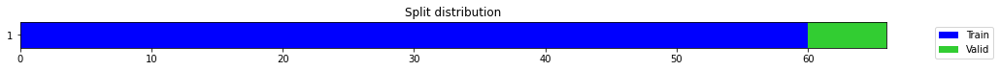

epoch,train_loss,valid_loss,mse,time
0,0.571187,0.325851,0.325851,00:00
1,0.461297,0.014056,0.014056,00:00
2,0.365819,0.891525,0.891525,00:00
3,0.333275,0.054569,0.054569,00:00
4,0.276749,0.340961,0.340961,00:00
5,0.244204,0.030680,0.030680,00:00
6,0.217952,0.530737,0.530737,00:00
7,0.199409,0.001483,0.001483,00:00
8,0.192201,0.164926,0.164926,00:00
9,0.179916,0.497249,0.497249,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2186349630355835,
  "MSE_normalize": 0.04807127903764415,
  "RMSE_normalize": 0.21925163405923376,
  "MAPE_normalize": 0.22580545046732456,
  "MAE": 14102.829655647278,
  "MSE": 200013344.16548297,
  "RMSE": 14142.607403356815,
  "MAPE": 0.1194419180651557
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.6
2022-10-14 19:18:38.101291+07:00
PROGRESS: [ 111 / 1944 ]


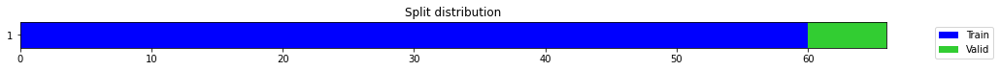

epoch,train_loss,valid_loss,mse,time
0,0.246125,0.374086,0.374086,00:00
1,0.236092,0.143117,0.143117,00:00
2,0.187733,0.010549,0.010549,00:00
3,0.183140,0.459065,0.459065,00:00
4,0.177435,0.301529,0.301529,00:00
5,0.161089,0.257086,0.257086,00:00
6,0.161694,1.252699,1.252699,00:00
7,0.156180,0.025845,0.025845,00:00
8,0.142011,0.033996,0.033996,00:00
9,0.141290,0.224705,0.224705,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.024772812922795612,
  "MSE_normalize": 0.000663019633464638,
  "RMSE_normalize": 0.02574916762663675,
  "MAPE_normalize": 0.02578033978519621,
  "MAE": 1597.9455247720082,
  "MSE": 2758669.5588604426,
  "RMSE": 1660.924308588577,
  "MAPE": 0.013588078692621878
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.6
2022-10-14 19:18:51.063709+07:00
PROGRESS: [ 112 / 1944 ]


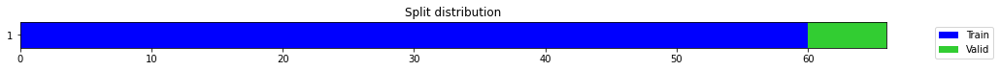

epoch,train_loss,valid_loss,mse,time
0,0.139533,0.438119,0.438119,00:00
1,0.112495,0.240403,0.240403,00:00
2,0.098723,0.090829,0.090829,00:00
3,0.097213,0.039139,0.039139,00:00
4,0.095166,0.003548,0.003548,00:00
5,0.094495,0.079602,0.079602,00:00
6,0.089523,0.349692,0.349692,00:00
7,0.094525,0.222614,0.222614,00:00
8,0.088602,0.009555,0.009555,00:00
9,0.088741,0.012295,0.012295,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.02267998456954956,
  "MSE_normalize": 0.0006303084955294006,
  "RMSE_normalize": 0.025105945421939415,
  "MAPE_normalize": 0.023221227859706043,
  "MAE": 1462.9497246742249,
  "MSE": 2622566.167794818,
  "RMSE": 1619.43390349678,
  "MAPE": 0.012333654814882957
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:19:17.241617+07:00
PROGRESS: [ 113 / 1944 ]


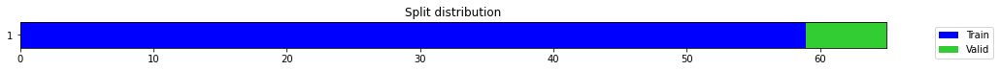

epoch,train_loss,valid_loss,mse,time
0,0.774726,0.254686,0.254686,00:00
1,0.529440,0.915475,0.915475,00:00
2,0.390970,0.278662,0.278662,00:00
3,0.320154,0.029790,0.029790,00:00
4,0.272686,0.001234,0.001234,00:00
5,0.243581,0.043593,0.043593,00:00
6,0.216367,0.048560,0.048560,00:00
7,0.193170,0.189352,0.189352,00:00
8,0.173928,0.167189,0.167189,00:00
9,0.162506,0.142223,0.142223,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.37612877289454144,
  "MSE_normalize": 0.14222339392125724,
  "RMSE_normalize": 0.3771251700977505,
  "MAPE_normalize": 0.38849204689995503,
  "MAE": 24261.8103667895,
  "MSE": 591758264.1077482,
  "RMSE": 24326.0819719853,
  "MAPE": 0.20548965141098277
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:19:20.397906+07:00
PROGRESS: [ 114 / 1944 ]


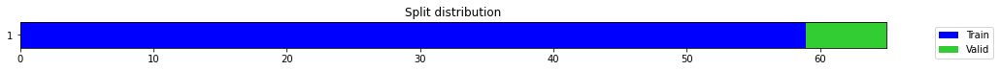

epoch,train_loss,valid_loss,mse,time
0,0.320884,0.499519,0.499519,00:00
1,0.295646,0.991683,0.991683,00:00
2,0.249739,0.405716,0.405716,00:00
3,0.220647,0.806990,0.806990,00:00
4,0.206470,5.180130,5.180130,00:00
5,0.207493,0.078168,0.078168,00:00
6,0.203258,3.518692,3.518692,00:00
7,0.203538,0.765647,0.765647,00:00
8,0.183920,0.068096,0.068096,00:00
9,0.168544,1.413183,1.413183,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.020410269498825073,
  "MSE_normalize": 0.0006433645764989393,
  "RMSE_normalize": 0.025364632394319048,
  "MAPE_normalize": 0.020849058744285293,
  "MAE": 1316.5440237522125,
  "MSE": 2676889.465795019,
  "RMSE": 1636.120247963156,
  "MAPE": 0.011085516795959774
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:19:27.382600+07:00
PROGRESS: [ 115 / 1944 ]


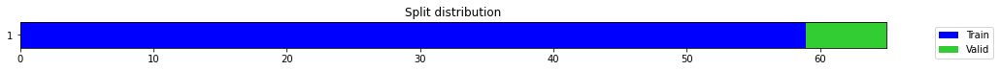

epoch,train_loss,valid_loss,mse,time
0,0.272812,0.798911,0.798911,00:00
1,0.213493,0.094224,0.094224,00:00
2,0.216849,0.049164,0.049164,00:00
3,0.233934,0.013811,0.013811,00:00
4,0.208155,0.613867,0.613867,00:00
5,0.189063,0.808023,0.808023,00:00
6,0.169389,0.281141,0.281141,00:00
7,0.155137,0.061544,0.061544,00:00
8,0.148555,1.947551,1.947551,00:00
9,0.143857,0.055235,0.055235,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.011891216039657593,
  "MSE_normalize": 0.00020172424808547382,
  "RMSE_normalize": 0.014202966172087921,
  "MAPE_normalize": 0.012467542470881825,
  "MAE": 767.0309994220734,
  "MSE": 839327.3960371925,
  "RMSE": 916.1481299643593,
  "MAPE": 0.006548337872967216
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:19:41.064488+07:00
PROGRESS: [ 116 / 1944 ]


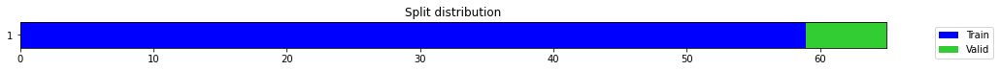

epoch,train_loss,valid_loss,mse,time
0,0.721262,0.499173,0.499173,00:00
1,0.564137,0.237574,0.237574,00:00
2,0.509409,0.031676,0.031676,00:00
3,0.448240,0.035421,0.035421,00:00
4,0.423296,0.219435,0.219435,00:00
5,0.390781,0.362059,0.362059,00:00
6,0.347002,0.184879,0.184879,00:00
7,0.314115,0.001797,0.001797,00:00
8,0.311284,0.068767,0.068767,00:00
9,0.287136,0.052874,0.052874,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08779838681221008,
  "MSE_normalize": 0.007715472496244639,
  "RMSE_normalize": 0.08783776235904828,
  "MAPE_normalize": 0.0908423669052175,
  "MAE": 5663.347142934799,
  "MSE": 32102275.75975738,
  "RMSE": 5665.88702320805,
  "MAPE": 0.04801087405387786
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:20:07.815685+07:00
PROGRESS: [ 117 / 1944 ]


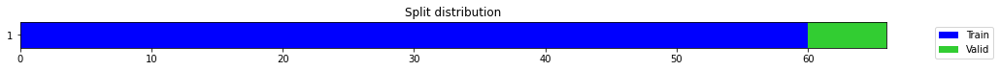

epoch,train_loss,valid_loss,mse,time
0,0.511361,0.067930,0.067930,00:00
1,0.362691,0.158053,0.158053,00:00
2,0.391980,1.324274,1.324274,00:00
3,0.326420,0.339484,0.339484,00:00
4,0.286228,0.432354,0.432354,00:00
5,0.243720,0.105926,0.105926,00:00
6,0.215526,0.101077,0.101077,00:00
7,0.195720,0.062725,0.062725,00:00
8,0.180472,0.012693,0.012693,00:00
9,0.169871,0.006646,0.006646,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08139163255691528,
  "MSE_normalize": 0.006645629759488496,
  "RMSE_normalize": 0.08152073208386008,
  "MAPE_normalize": 0.08409841125423327,
  "MAE": 5250.085866451263,
  "MSE": 27650910.45819798,
  "RMSE": 5258.413302337311,
  "MAPE": 0.04447535724036333
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:20:11.402333+07:00
PROGRESS: [ 118 / 1944 ]


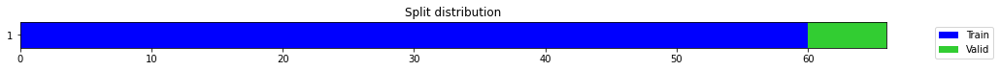

epoch,train_loss,valid_loss,mse,time
0,0.295363,0.411037,0.411037,00:00
1,0.209489,0.002408,0.002408,00:00
2,0.186395,0.378806,0.378806,00:00
3,0.185670,0.406032,0.406032,00:00
4,0.173084,0.002189,0.002189,00:00
5,0.168800,0.353457,0.353457,00:00
6,0.155500,0.659576,0.659576,00:00
7,0.146442,0.446924,0.446924,00:00
8,0.136435,0.646850,0.646850,00:00
9,0.129054,0.314445,0.314445,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08290961384773254,
  "MSE_normalize": 0.0069705998764491755,
  "RMSE_normalize": 0.0834901184359513,
  "MAPE_normalize": 0.0855476474950526,
  "MAE": 5348.00173163414,
  "MSE": 29003035.077063527,
  "RMSE": 5385.446599592603,
  "MAPE": 0.04527157258228708
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:20:19.588145+07:00
PROGRESS: [ 119 / 1944 ]


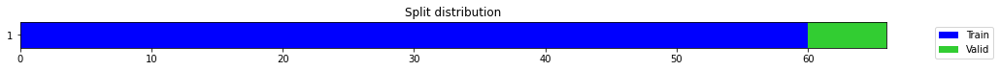

epoch,train_loss,valid_loss,mse,time
0,0.328898,1.643172,1.643172,00:00
1,0.224218,0.519339,0.519339,00:00
2,0.162766,0.000719,0.000719,00:00
3,0.178527,0.002908,0.002908,00:00
4,0.173360,0.074348,0.074348,00:00
5,0.160608,0.686188,0.686188,00:00
6,0.154884,0.355090,0.355090,00:00
7,0.138482,0.004997,0.004997,00:00
8,0.135502,0.042978,0.042978,00:00
9,0.135399,0.689504,0.689504,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08267822861671448,
  "MSE_normalize": 0.00711877621785284,
  "RMSE_normalize": 0.08437284052260444,
  "MAPE_normalize": 0.08591751611033198,
  "MAE": 5333.076458692551,
  "MSE": 29619562.162751112,
  "RMSE": 5442.385705070076,
  "MAPE": 0.04531517195220944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:20:35.967656+07:00
PROGRESS: [ 120 / 1944 ]


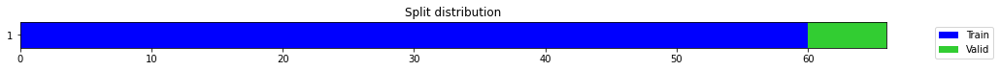

epoch,train_loss,valid_loss,mse,time
0,0.229749,0.417800,0.417800,00:00
1,0.164386,0.189241,0.189241,00:00
2,0.127679,0.039326,0.039326,00:00
3,0.118338,0.000690,0.000690,00:00
4,0.120658,0.038647,0.038647,00:00
5,0.115899,0.016704,0.016704,00:00
6,0.113037,0.110871,0.110871,00:00
7,0.115341,0.027995,0.027995,00:00
8,0.116962,0.091031,0.091031,00:00
9,0.109574,0.006962,0.006962,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0236566166083018,
  "MSE_normalize": 0.0005708005021360189,
  "RMSE_normalize": 0.023891431563136164,
  "MAPE_normalize": 0.024530666016864846,
  "MAE": 1525.9463977018993,
  "MSE": 2374967.331203283,
  "RMSE": 1541.092901548535,
  "MAPE": 0.012951230601436365
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:21:08.024504+07:00
PROGRESS: [ 121 / 1944 ]


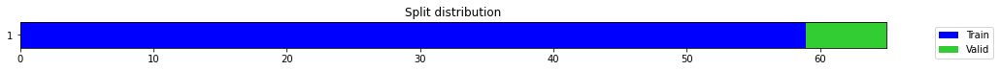

epoch,train_loss,valid_loss,mse,time
0,0.380220,0.039229,0.039229,00:00
1,0.321689,0.029168,0.029168,00:00
2,0.262032,0.852109,0.852109,00:00
3,0.266284,0.055263,0.055263,00:00
4,0.246331,0.011410,0.011410,00:00
5,0.215294,0.704532,0.704532,00:00
6,0.189631,1.860027,1.860027,00:00
7,0.180292,0.316091,0.316091,00:00
8,0.163556,0.001212,0.001212,00:00
9,0.148109,0.026684,0.026684,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16317578156789145,
  "MSE_normalize": 0.026683810404328767,
  "RMSE_normalize": 0.16335179951359202,
  "MAPE_normalize": 0.16895745837631174,
  "MAE": 10525.49061425527,
  "MSE": 111025091.50771837,
  "RMSE": 10536.84447582474,
  "MAPE": 0.08926422855450587
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:21:12.396172+07:00
PROGRESS: [ 122 / 1944 ]


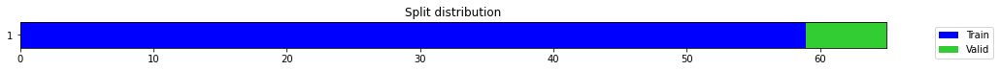

epoch,train_loss,valid_loss,mse,time
0,0.418093,0.621321,0.621321,00:00
1,0.324004,0.066771,0.066771,00:00
2,0.281891,0.063422,0.063422,00:00
3,0.261551,0.550821,0.550821,00:00
4,0.235007,1.126039,1.126039,00:00
5,0.216878,2.740972,2.740972,00:00
6,0.196140,0.303183,0.303183,00:00
7,0.178040,0.001299,0.001299,00:00
8,0.167303,0.071664,0.071664,00:00
9,0.161101,0.449706,0.449706,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.047783344984054565,
  "MSE_normalize": 0.0024210534029460717,
  "RMSE_normalize": 0.049204201070092296,
  "MAPE_normalize": 0.04917425247090771,
  "MAE": 3082.2168848514557,
  "MSE": 10073436.721899169,
  "RMSE": 3173.867785825233,
  "MAPE": 0.026055199072872532
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.9
2022-10-14 19:21:22.445961+07:00
PROGRESS: [ 123 / 1944 ]


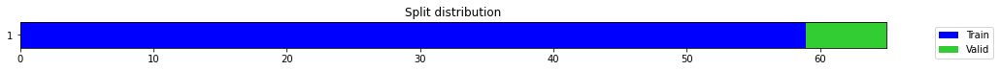

epoch,train_loss,valid_loss,mse,time
0,0.202780,0.054826,0.054826,00:00
1,0.178739,0.094598,0.094598,00:00
2,0.193201,0.008796,0.008796,00:00
3,0.179901,0.635891,0.635891,00:00
4,0.177690,0.416441,0.416441,00:00
5,0.163764,0.099502,0.099502,00:00
6,0.150478,0.442361,0.442361,00:00
7,0.144499,0.005523,0.005523,00:00
8,0.138444,0.627529,0.627529,00:00
9,0.136786,1.265577,1.265577,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.00966880718866984,
  "MSE_normalize": 0.00015047209167562414,
  "RMSE_normalize": 0.012266706635263767,
  "MAPE_normalize": 0.010160612940548836,
  "MAE": 623.6767388979594,
  "MSE": 626079.1654003734,
  "RMSE": 791.251644801054,
  "MAPE": 0.005330957779300298
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.9
2022-10-14 19:22:01.576731+07:00
PROGRESS: [ 124 / 1944 ]


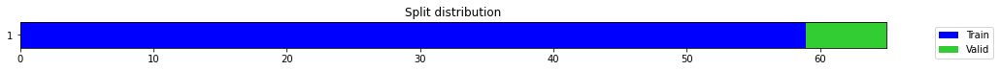

epoch,train_loss,valid_loss,mse,time
0,0.460650,0.308184,0.308184,00:00
1,0.381390,0.023229,0.023229,00:00
2,0.337279,0.054012,0.054012,00:00
3,0.284159,0.218217,0.218217,00:00
4,0.254712,0.092271,0.092271,00:00
5,0.228517,0.135806,0.135806,00:00
6,0.205567,0.613007,0.613007,00:00
7,0.200608,0.640931,0.640931,00:00
8,0.184682,0.429596,0.429596,00:00
9,0.178731,0.913603,0.913603,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13040444254875183,
  "MSE_normalize": 0.017028982865544034,
  "RMSE_normalize": 0.1304951449884019,
  "MAPE_normalize": 0.13480770269708645,
  "MAE": 8411.608162164688,
  "MSE": 70853613.19400191,
  "RMSE": 8417.458832331877,
  "MAPE": 0.07127623529516948
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:23:18.265058+07:00
PROGRESS: [ 125 / 1944 ]


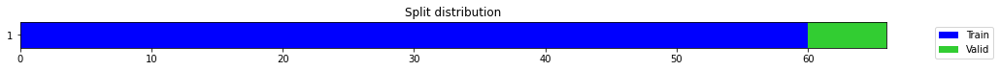

epoch,train_loss,valid_loss,mse,time
0,0.141975,0.027190,0.027190,00:00
1,0.161007,0.125669,0.125669,00:00
2,0.161781,1.663976,1.663976,00:00
3,0.187374,0.813359,0.813359,00:00
4,0.183506,0.055470,0.055470,00:00
5,0.174036,0.027251,0.027251,00:00
6,0.173496,0.081156,0.081156,00:00
7,0.181797,0.477647,0.477647,00:00
8,0.167718,0.362570,0.362570,00:00
9,0.153133,0.189027,0.189027,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.43325026830037433,
  "MSE_normalize": 0.18902689045474239,
  "RMSE_normalize": 0.43477222824686307,
  "MAPE_normalize": 0.4473724453124817,
  "MAE": 27946.375306447346,
  "MSE": 786496661.9142469,
  "RMSE": 28044.547810835655,
  "MAPE": 0.23666348475256596
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:23:26.465778+07:00
PROGRESS: [ 126 / 1944 ]


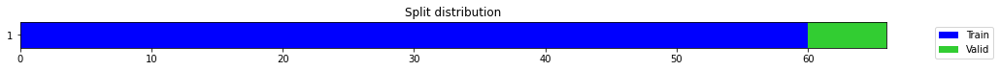

epoch,train_loss,valid_loss,mse,time
0,0.082912,0.065824,0.065824,00:00
1,0.083392,0.002657,0.002657,00:00
2,0.098780,0.064287,0.064287,00:00
3,0.104945,1.275642,1.275642,00:00
4,0.142767,0.376386,0.376386,00:00
5,0.141146,0.083328,0.083328,00:00
6,0.130809,0.235443,0.235443,00:00
7,0.138308,2.342069,2.342069,00:00
8,0.136092,3.332157,3.332157,00:00
9,0.131518,2.340658,2.340658,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27974509199460346,
  "MSE_normalize": 0.07832163204078964,
  "RMSE_normalize": 0.2798600222268083,
  "MAPE_normalize": 0.28922327799686504,
  "MAE": 18044.6774140199,
  "MSE": 325877984.9129743,
  "RMSE": 18052.090873718043,
  "MAPE": 0.15291157175273098
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:23:45.571428+07:00
PROGRESS: [ 127 / 1944 ]


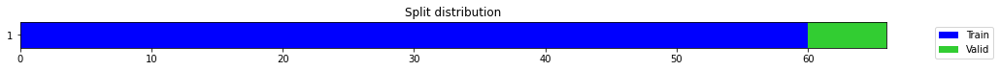

epoch,train_loss,valid_loss,mse,time
0,0.216537,0.000778,0.000778,00:00
1,0.190155,0.162648,0.162648,00:00
2,0.179337,0.006562,0.006562,00:00
3,0.166806,0.561964,0.561964,00:00
4,0.172841,0.082032,0.082032,00:00
5,0.159787,0.000842,0.000842,00:00
6,0.151565,0.163663,0.163663,00:00
7,0.153150,1.346619,1.346619,00:00
8,0.153492,2.063274,2.063274,00:00
9,0.156147,0.028329,0.028329,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.15737070639928183,
  "MSE_normalize": 0.02482449493214034,
  "RMSE_normalize": 0.15755790977332854,
  "MAPE_normalize": 0.16297120175818977,
  "MAE": 10151.040045579275,
  "MSE": 103288914.87801374,
  "RMSE": 10163.115412018784,
  "MAPE": 0.08609552328937259
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.9
2022-10-14 19:24:23.798739+07:00
PROGRESS: [ 128 / 1944 ]


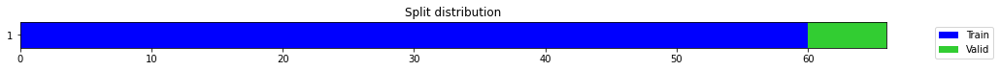

epoch,train_loss,valid_loss,mse,time
0,0.287182,0.046079,0.046079,00:00
1,0.220947,0.139527,0.139527,00:00
2,0.186695,0.053476,0.053476,00:00
3,0.163007,0.023593,0.023593,00:00
4,0.174569,0.048757,0.048757,00:00
5,0.160059,0.880970,0.880970,00:00
6,0.156323,0.498085,0.498085,00:00
7,0.149859,0.018563,0.018563,00:00
8,0.142269,0.184017,0.184017,00:00
9,0.140486,0.301699,0.301699,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1560269594192505,
  "MSE_normalize": 0.024348275818040815,
  "RMSE_normalize": 0.15603934061011926,
  "MAPE_normalize": 0.16140131426099444,
  "MAE": 10064.362990379333,
  "MSE": 101307478.57189882,
  "RMSE": 10065.161626715133,
  "MAPE": 0.08531056138897086
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:25:11.059368+07:00
PROGRESS: [ 129 / 1944 ]


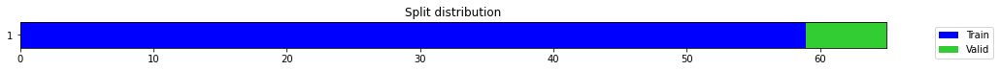

epoch,train_loss,valid_loss,mse,time
0,0.222972,0.080685,0.080685,00:00
1,0.231091,0.192394,0.192394,00:00
2,0.237007,0.090606,0.090606,00:00
3,0.202678,0.026138,0.026138,00:00
4,0.175931,3.372076,3.372076,00:00
5,0.157646,0.259962,0.259962,00:00
6,0.148545,0.014592,0.014592,00:00
7,0.139864,0.002973,0.002973,00:00
8,0.128612,0.007928,0.007928,00:00
9,0.118338,0.015693,0.015693,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12522480885187784,
  "MSE_normalize": 0.01569289430475725,
  "RMSE_normalize": 0.1252712828415086,
  "MAPE_normalize": 0.12953883131224408,
  "MAE": 8077.501070181529,
  "MSE": 65294461.31591391,
  "RMSE": 8080.498828408671,
  "MAPE": 0.06846901078617566
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:25:16.027675+07:00
PROGRESS: [ 130 / 1944 ]


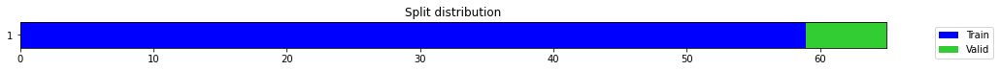

epoch,train_loss,valid_loss,mse,time
0,0.346929,0.118890,0.118890,00:00
1,0.238410,0.026724,0.026724,00:00
2,0.231001,0.469033,0.469033,00:00
3,0.201804,2.392342,2.392342,00:00
4,0.189202,0.351290,0.351290,00:00
5,0.178229,0.097796,0.097796,00:00
6,0.169029,0.026948,0.026948,00:00
7,0.159598,0.444199,0.444199,00:00
8,0.158734,5.208413,5.208413,00:00
9,0.160988,0.139540,0.139540,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1323037644227346,
  "MSE_normalize": 0.017519978581933177,
  "RMSE_normalize": 0.13236305595570533,
  "MAPE_normalize": 0.13694098380967454,
  "MAE": 8534.122020324072,
  "MSE": 72896531.48475544,
  "RMSE": 8537.946561366816,
  "MAPE": 0.07236188168082658
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:25:27.512962+07:00
PROGRESS: [ 131 / 1944 ]


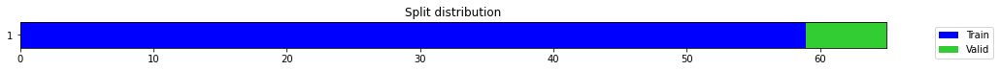

epoch,train_loss,valid_loss,mse,time
0,0.353304,0.275785,0.275785,00:00
1,0.307690,0.011615,0.011615,00:00
2,0.267194,0.010216,0.010216,00:00
3,0.237800,0.115374,0.115374,00:00
4,0.219977,0.014116,0.014116,00:00
5,0.226827,2.921680,2.921680,00:00
6,0.214145,0.481326,0.481326,00:00
7,0.203528,2.566026,2.566026,00:00
8,0.221527,0.198185,0.198185,00:00
9,0.205238,0.128104,0.128104,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03680215279261271,
  "MSE_normalize": 0.001601121045767447,
  "RMSE_normalize": 0.04001401061837525,
  "MAPE_normalize": 0.037721291941571256,
  "MAE": 2373.88606373469,
  "MSE": 6661890.034731574,
  "RMSE": 2581.063740927677,
  "MAPE": 0.020024929897023397
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:25:49.148755+07:00
PROGRESS: [ 132 / 1944 ]


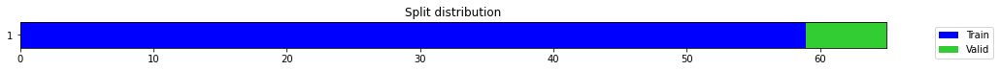

epoch,train_loss,valid_loss,mse,time
0,0.187956,0.098986,0.098986,00:00
1,0.214044,0.068180,0.068180,00:00
2,0.175025,0.291520,0.291520,00:00
3,0.149951,0.721972,0.721972,00:00
4,0.138288,0.854888,0.854888,00:00
5,0.140797,0.492383,0.492383,00:00
6,0.140496,0.761952,0.761952,00:00
7,0.138182,1.317497,1.317497,00:00
8,0.132275,0.174143,0.174143,00:00
9,0.123632,0.493260,0.493260,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09238810340563457,
  "MSE_normalize": 0.008596593308521841,
  "RMSE_normalize": 0.09271781548613967,
  "MAPE_normalize": 0.09540196456032006,
  "MAE": 5959.402222077052,
  "MSE": 35768413.291470684,
  "RMSE": 5980.669970117953,
  "MAPE": 0.05046778568979235
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:26:36.572415+07:00
PROGRESS: [ 133 / 1944 ]


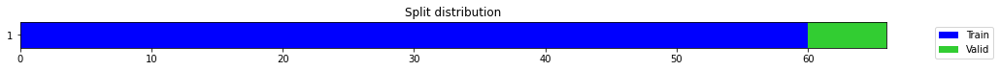

epoch,train_loss,valid_loss,mse,time
0,0.275994,0.000991,0.000991,00:00
1,0.331802,1.452231,1.452231,00:00
2,0.345937,2.084762,2.084762,00:00
3,0.326017,3.967755,3.967755,00:00
4,0.321477,0.003775,0.003775,00:00
5,0.286838,0.551904,0.551904,00:00
6,0.253854,0.004514,0.004514,00:00
7,0.236617,0.031274,0.031274,00:00
8,0.212793,0.131372,0.131372,00:00
9,0.199538,0.122912,0.122912,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3477303981781006,
  "MSE_normalize": 0.12291172460086959,
  "RMSE_normalize": 0.35058768461095374,
  "MAPE_normalize": 0.35869689052206494,
  "MAE": 22430.0016040802,
  "MSE": 511406926.6872494,
  "RMSE": 22614.308008144963,
  "MAPE": 0.1898454380565301
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.9
2022-10-14 19:26:42.444809+07:00
PROGRESS: [ 134 / 1944 ]


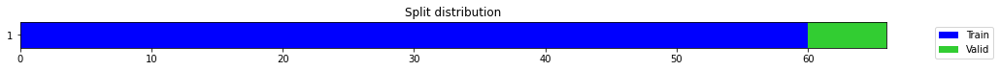

epoch,train_loss,valid_loss,mse,time
0,0.460537,0.174060,0.174060,00:00
1,0.325909,0.096183,0.096183,00:00
2,0.308099,0.013402,0.013402,00:00
3,0.259483,0.012090,0.012090,00:00
4,0.231653,0.664581,0.664581,00:00
5,0.214957,0.251292,0.251292,00:00
6,0.207196,0.000672,0.000672,00:00
7,0.190149,2.238198,2.238198,00:00
8,0.181562,0.001246,0.001246,00:00
9,0.175466,1.424806,1.424806,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06526161233584087,
  "MSE_normalize": 0.005323439734163197,
  "RMSE_normalize": 0.07296190604804124,
  "MAPE_normalize": 0.06675842005957432,
  "MAE": 4209.635042111079,
  "MSE": 22149587.134130303,
  "RMSE": 4706.334787722852,
  "MAPE": 0.03547322574336397
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:26:56.149813+07:00
PROGRESS: [ 135 / 1944 ]


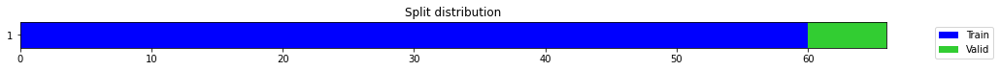

epoch,train_loss,valid_loss,mse,time
0,0.496370,0.419674,0.419674,00:00
1,0.321524,0.000964,0.000964,00:00
2,0.264665,0.023639,0.023639,00:00
3,0.272116,0.003737,0.003737,00:00
4,0.240298,0.169507,0.169507,00:00
5,0.233681,0.345504,0.345504,00:00
6,0.230470,1.791909,1.791909,00:00
7,0.216911,0.024637,0.024637,00:00
8,0.206850,1.799949,1.799949,00:00
9,0.200007,0.958949,0.958949,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03677532076835632,
  "MSE_normalize": 0.001485559400411655,
  "RMSE_normalize": 0.0385429552630783,
  "MAPE_normalize": 0.038303008499228276,
  "MAE": 2372.1552908420563,
  "MSE": 6181065.067982151,
  "RMSE": 2486.1747862896027,
  "MAPE": 0.02018048077846982
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:27:22.337481+07:00
PROGRESS: [ 136 / 1944 ]


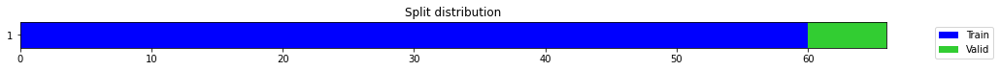

epoch,train_loss,valid_loss,mse,time
0,0.523862,0.434578,0.434578,00:00
1,0.326989,0.144931,0.144931,00:00
2,0.258916,0.000947,0.000947,00:00
3,0.234796,0.010431,0.010431,00:00
4,0.231533,0.028306,0.028306,00:00
5,0.206413,0.160460,0.160460,00:00
6,0.181653,0.048450,0.048450,00:00
7,0.176851,0.139181,0.139181,00:00
8,0.162741,0.084635,0.084635,00:00
9,0.156414,0.566552,0.566552,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.014564712842305502,
  "MSE_normalize": 0.00033120231936223377,
  "RMSE_normalize": 0.01819896478820248,
  "MAPE_normalize": 0.015297209235593273,
  "MAE": 939.4822371800741,
  "MSE": 1378055.3548227611,
  "RMSE": 1173.9060246982128,
  "MAPE": 0.008027792755197853
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:28:38.557443+07:00
PROGRESS: [ 137 / 1944 ]


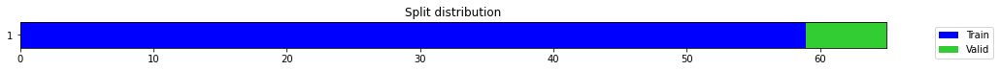

epoch,train_loss,valid_loss,mse,time
0,0.174252,0.122404,0.122404,00:00
1,0.234072,1.589584,1.589584,00:00
2,0.208287,0.147530,0.147530,00:00
3,0.180014,0.321839,0.321839,00:00
4,0.174038,1.362243,1.362243,00:00
5,0.161246,3.550706,3.550706,00:00
6,0.156594,0.026200,0.026200,00:00
7,0.153354,0.129814,0.129814,00:00
8,0.143280,0.008160,0.008160,00:00
9,0.134696,0.012761,0.012761,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11290829380353291,
  "MSE_normalize": 0.01276075126572529,
  "RMSE_normalize": 0.1129634952793392,
  "MAPE_normalize": 0.11675375518668742,
  "MAE": 7283.036583503087,
  "MSE": 53094500.205058776,
  "RMSE": 7286.597299498496,
  "MAPE": 0.06172246392834724
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:28:45.813799+07:00
PROGRESS: [ 138 / 1944 ]


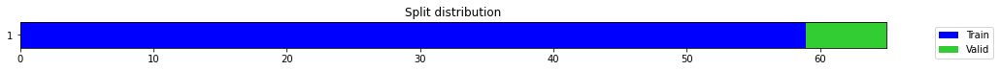

epoch,train_loss,valid_loss,mse,time
0,0.240487,0.268769,0.268769,00:00
1,0.213526,0.015226,0.015226,00:00
2,0.182624,0.831424,0.831424,00:00
3,0.167511,1.756463,1.756463,00:00
4,0.164628,1.115087,1.115087,00:00
5,0.190230,0.260389,0.260389,00:00
6,0.178725,1.567305,1.567305,00:00
7,0.173517,3.265929,3.265929,00:00
8,0.167757,0.099937,0.099937,00:00
9,0.152707,6.883102,6.883102,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.27810993790626526,
  "MSE_normalize": 0.07747776277240288,
  "RMSE_normalize": 0.27834827603634066,
  "MAPE_normalize": 0.28744881114819754,
  "MAE": 17939.203434705734,
  "MSE": 322366842.3391239,
  "RMSE": 17954.577197448118,
  "MAPE": 0.15199439726415134
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:29:03.039733+07:00
PROGRESS: [ 139 / 1944 ]


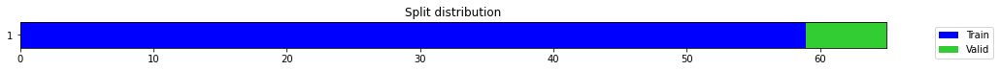

epoch,train_loss,valid_loss,mse,time
0,0.401054,0.778651,0.778651,00:00
1,0.328403,0.068783,0.068783,00:00
2,0.266194,0.001293,0.001293,00:00
3,0.256992,0.112668,0.112668,00:00
4,0.227303,2.997280,2.997280,00:00
5,0.213894,5.601679,5.601679,00:00
6,0.199172,0.604690,0.604690,00:00
7,0.186843,0.691165,0.691165,00:00
8,0.174984,5.963572,5.963572,00:00
9,0.169033,4.008240,4.008240,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08288966615994771,
  "MSE_normalize": 0.0071778780872839105,
  "RMSE_normalize": 0.08472235883923387,
  "MAPE_normalize": 0.0853577387449644,
  "MAE": 5346.715025981267,
  "MSE": 29865471.212561976,
  "RMSE": 5464.931034565942,
  "MAPE": 0.045213351255517904
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:29:35.344579+07:00
PROGRESS: [ 140 / 1944 ]


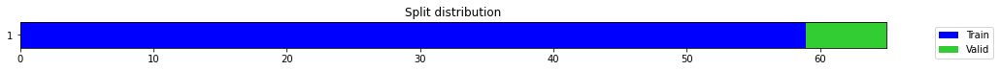

epoch,train_loss,valid_loss,mse,time
0,0.198714,0.947561,0.947561,00:00
1,0.154916,0.899086,0.899086,00:00
2,0.142026,0.545669,0.545669,00:00
3,0.132437,0.302509,0.302509,00:00
4,0.129145,0.354669,0.354669,00:00
5,0.125733,1.512933,1.512933,00:00
6,0.126513,1.731179,1.731179,00:00
7,0.123059,0.326908,0.326908,00:00
8,0.122889,0.841463,0.841463,00:00
9,0.114949,0.885959,0.885959,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0961984892686208,
  "MSE_normalize": 0.009278944789113433,
  "RMSE_normalize": 0.09632727956873605,
  "MAPE_normalize": 0.09941754974243248,
  "MAE": 6205.187351783116,
  "MSE": 38607518.14288346,
  "RMSE": 6213.49484130175,
  "MAPE": 0.05257186309289308
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:30:37.886495+07:00
PROGRESS: [ 141 / 1944 ]


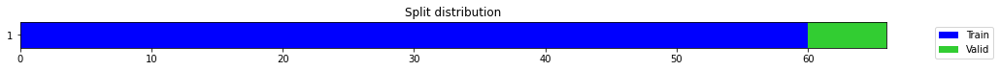

epoch,train_loss,valid_loss,mse,time
0,0.172650,0.473167,0.473167,00:00
1,0.236705,0.830341,0.830341,00:00
2,0.244973,0.519231,0.519231,00:00
3,0.234881,5.338696,5.338696,00:00
4,0.267010,1.209899,1.209899,00:00
5,0.253184,0.158394,0.158394,00:00
6,0.229156,0.034387,0.034387,00:00
7,0.205495,0.107154,0.107154,00:00
8,0.185062,0.134348,0.134348,00:00
9,0.175016,0.095539,0.095539,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3080119689305623,
  "MSE_normalize": 0.0955391278567473,
  "RMSE_normalize": 0.3090940437095922,
  "MAPE_normalize": 0.3180551729223616,
  "MAE": 19868.00404389699,
  "MSE": 397515956.38463306,
  "RMSE": 19937.802195443535,
  "MAPE": 0.16825298516433443
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:30:45.506989+07:00
PROGRESS: [ 142 / 1944 ]


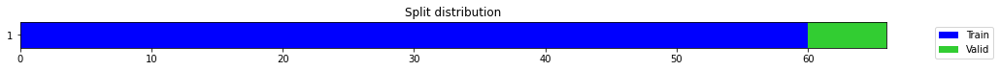

epoch,train_loss,valid_loss,mse,time
0,0.219010,0.003350,0.003350,00:00
1,0.185377,0.020708,0.020708,00:00
2,0.163320,0.832228,0.832228,00:00
3,0.148681,0.776211,0.776211,00:00
4,0.223612,0.000452,0.000452,00:00
5,0.234600,0.058903,0.058903,00:00
6,0.251819,0.810430,0.810430,00:00
7,0.259436,9.880710,9.880710,00:00
8,0.239557,0.003207,0.003207,00:00
9,0.222004,0.365486,0.365486,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10423030455907185,
  "MSE_normalize": 0.01089902357717302,
  "RMSE_normalize": 0.10439838876713098,
  "MAPE_normalize": 0.10795479121375978,
  "MAE": 6723.271565278371,
  "MSE": 45348286.907484256,
  "RMSE": 6734.113669035017,
  "MAPE": 0.05702731381051639
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:31:03.679600+07:00
PROGRESS: [ 143 / 1944 ]


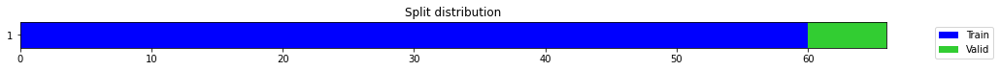

epoch,train_loss,valid_loss,mse,time
0,0.296447,0.393571,0.393571,00:00
1,0.224097,0.108530,0.108530,00:00
2,0.177066,0.000533,0.000533,00:00
3,0.167814,0.208843,0.208843,00:00
4,0.165136,0.785066,0.785066,00:00
5,0.159431,0.170474,0.170474,00:00
6,0.165470,0.000548,0.000548,00:00
7,0.165828,0.804312,0.804312,00:00
8,0.160858,0.198535,0.198535,00:00
9,0.183057,0.748245,0.748245,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07909961541493733,
  "MSE_normalize": 0.007699587912913586,
  "RMSE_normalize": 0.08774729575840834,
  "MAPE_normalize": 0.08094998712756078,
  "MAE": 5102.241592725118,
  "MSE": 32036183.725255217,
  "RMSE": 5660.051565600372,
  "MAPE": 0.04300499350047609
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:31:38.218785+07:00
PROGRESS: [ 144 / 1944 ]


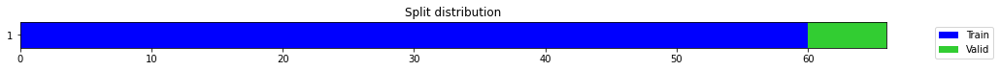

epoch,train_loss,valid_loss,mse,time
0,0.489080,0.150513,0.150513,00:00
1,0.314532,0.139286,0.139286,00:00
2,0.251094,0.385138,0.385138,00:00
3,0.259399,0.090101,0.090101,00:00
4,0.252540,0.033717,0.033717,00:00
5,0.227950,0.461254,0.461254,00:00
6,0.216190,0.663080,0.663080,00:00
7,0.203972,0.030896,0.030896,00:00
8,0.188998,0.052003,0.052003,00:00
9,0.179497,0.001001,0.001001,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09977142016092937,
  "MSE_normalize": 0.009963728666053365,
  "RMSE_normalize": 0.09981847858013748,
  "MAPE_normalize": 0.10326941863963233,
  "MAE": 6435.655686060588,
  "MSE": 41456743.62635986,
  "RMSE": 6438.6911423331885,
  "MAPE": 0.05456897947480748
}
Percent CPU Usage: 100.0
Percent Ram Usage: 50.1
2022-10-14 19:32:44.330830+07:00
PROGRESS: [ 145 / 1944 ]


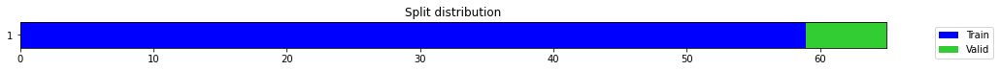

epoch,train_loss,valid_loss,mse,time
0,0.298956,1.476291,1.476291,00:00
1,0.287652,0.243664,0.243664,00:00
2,0.251884,0.041799,0.041799,00:00
3,0.223445,0.002240,0.002240,00:00
4,0.209713,0.420896,0.420896,00:00
5,0.191322,0.859842,0.859842,00:00
6,0.183824,0.497354,0.497354,00:00
7,0.194367,0.389462,0.389462,00:00
8,0.186319,0.220174,0.220174,00:00
9,0.180452,0.187673,0.187673,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.43299513061841327,
  "MSE_normalize": 0.18767294831373546,
  "RMSE_normalize": 0.4332123593732472,
  "MAPE_normalize": 0.4476336622051105,
  "MAE": 27929.91790541013,
  "MSE": 780863225.4663149,
  "RMSE": 27943.930029011935,
  "MAPE": 0.2366707311788955
}
Percent CPU Usage: 99.3
Percent Ram Usage: 67.0
2022-10-14 19:32:46.627698+07:00
PROGRESS: [ 146 / 1944 ]


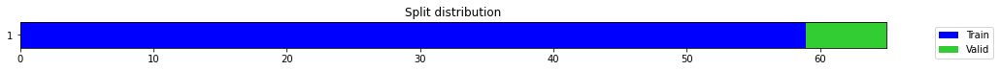

epoch,train_loss,valid_loss,mse,time
0,0.712806,1.382160,1.382160,00:00
1,0.612043,0.661493,0.661493,00:00
2,0.517661,0.040124,0.040124,00:00
3,0.463462,0.491935,0.491935,00:00
4,0.402698,0.994640,0.994640,00:00
5,0.358353,0.515833,0.515833,00:00
6,0.337278,0.004887,0.004887,00:00
7,0.312075,0.294199,0.294199,00:00
8,0.291651,0.505673,0.505673,00:00
9,0.267611,0.132176,0.132176,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27552621563275653,
  "MSE_normalize": 0.07608517638398678,
  "RMSE_normalize": 0.27583541539111106,
  "MAPE_normalize": 0.28473970540446264,
  "MAE": 17772.543013175327,
  "MSE": 316572616.219858,
  "RMSE": 17792.487634388228,
  "MAPE": 0.15057158292883546
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:32:51.631278+07:00
PROGRESS: [ 147 / 1944 ]


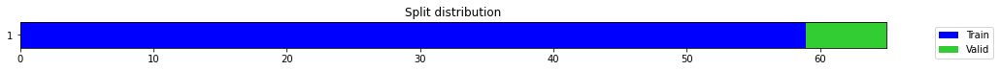

epoch,train_loss,valid_loss,mse,time
0,0.311032,0.274194,0.274194,00:00
1,0.379159,0.196661,0.196661,00:00
2,0.398627,0.061889,0.061889,00:00
3,0.392437,0.001565,0.001565,00:00
4,0.366575,0.077545,0.077545,00:00
5,0.347619,0.206713,0.206713,00:00
6,0.319063,0.272275,0.272275,00:00
7,0.303794,0.078068,0.078068,00:00
8,0.291000,0.000644,0.000644,00:00
9,0.269363,0.200740,0.200740,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.12049030264218648,
  "MSE_normalize": 0.014537450022366135,
  "RMSE_normalize": 0.12057134826469403,
  "MAPE_normalize": 0.12472158485667721,
  "MAE": 7772.106481631597,
  "MSE": 60486928.01235946,
  "RMSE": 7777.334248465824,
  "MAPE": 0.06590289351577257
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.7
2022-10-14 19:32:58.958905+07:00
PROGRESS: [ 148 / 1944 ]


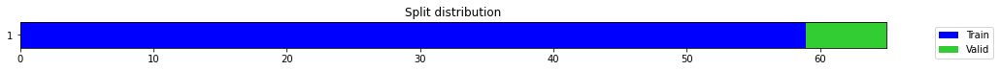

epoch,train_loss,valid_loss,mse,time
0,0.223289,0.710615,0.710615,00:00
1,0.253230,0.541163,0.541163,00:00
2,0.244094,0.432000,0.432000,00:00
3,0.249014,0.309690,0.309690,00:00
4,0.259784,0.160519,0.160519,00:00
5,0.249056,0.041211,0.041211,00:00
6,0.246566,0.002311,0.002311,00:00
7,0.235005,0.001343,0.001343,00:00
8,0.219309,0.006169,0.006169,00:00
9,0.212459,0.001975,0.001975,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10015570123990376,
  "MSE_normalize": 0.010040592570035164,
  "RMSE_normalize": 0.10020275729756724,
  "MAPE_normalize": 0.10364845164934601,
  "MAE": 6460.443352778752,
  "MSE": 41776556.34590441,
  "RMSE": 6463.478656722277,
  "MAPE": 0.05477390414014128
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:33:13.071998+07:00
PROGRESS: [ 149 / 1944 ]


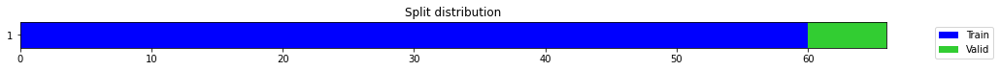

epoch,train_loss,valid_loss,mse,time
0,0.680747,1.092712,1.092712,00:00
1,0.503790,0.179085,0.179085,00:00
2,0.375250,0.109334,0.109334,00:00
3,0.352381,0.003423,0.003423,00:00
4,0.291323,0.063829,0.063829,00:00
5,0.260039,0.142803,0.142803,00:00
6,0.230066,0.043747,0.043747,00:00
7,0.214761,0.012683,0.012683,00:00
8,0.209070,0.002084,0.002084,00:00
9,0.199334,0.002331,0.002331,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04179622729619344,
  "MSE_normalize": 0.0023305252814888413,
  "RMSE_normalize": 0.048275514305793174,
  "MAPE_normalize": 0.04379510734435423,
  "MAE": 2696.023845513662,
  "MSE": 9696770.390647605,
  "RMSE": 3113.963774780883,
  "MAPE": 0.023008846353494344
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:33:14.897912+07:00
PROGRESS: [ 150 / 1944 ]


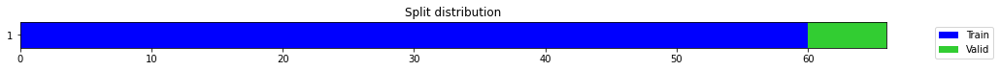

epoch,train_loss,valid_loss,mse,time
0,0.463506,1.206215,1.206215,00:00
1,0.457532,0.403297,0.403297,00:00
2,0.347140,0.000931,0.000931,00:00
3,0.302044,0.164562,0.164562,00:00
4,0.291300,0.001329,0.001329,00:00
5,0.269868,0.037239,0.037239,00:00
6,0.253150,0.014081,0.014081,00:00
7,0.235463,0.006052,0.006052,00:00
8,0.228698,0.021374,0.021374,00:00
9,0.215790,0.002297,0.002297,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20828723907470703,
  "MSE_normalize": 0.04339579014938385,
  "RMSE_normalize": 0.2083165623501498,
  "MAPE_normalize": 0.2155104496560681,
  "MAE": 13435.360069274902,
  "MSE": 180559728.89102387,
  "RMSE": 13437.251537834063,
  "MAPE": 0.11389838425365724
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:33:18.846362+07:00
PROGRESS: [ 151 / 1944 ]


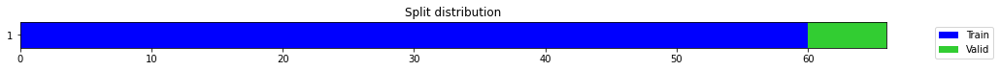

epoch,train_loss,valid_loss,mse,time
0,0.354019,0.793991,0.793991,00:00
1,0.331611,0.591103,0.591103,00:00
2,0.297036,0.340405,0.340405,00:00
3,0.257216,0.094161,0.094161,00:00
4,0.241721,0.000318,0.000318,00:00
5,0.234012,0.029566,0.029566,00:00
6,0.227420,0.015133,0.015133,00:00
7,0.208306,0.178959,0.178959,00:00
8,0.202015,0.301196,0.301196,00:00
9,0.195996,0.018160,0.018160,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1167572836081187,
  "MSE_normalize": 0.013644418416412544,
  "RMSE_normalize": 0.11680932504048015,
  "MAPE_normalize": 0.12078341355029347,
  "MAE": 7531.3118218580885,
  "MSE": 56771232.45509386,
  "RMSE": 7534.6687024111325,
  "MAPE": 0.0638403534468076
}
Percent CPU Usage: 100.0
Percent Ram Usage: 10.8
2022-10-14 19:33:26.422610+07:00
PROGRESS: [ 152 / 1944 ]


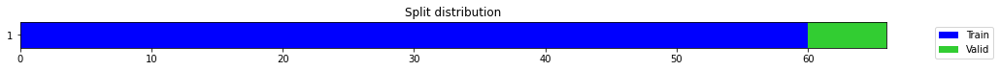

epoch,train_loss,valid_loss,mse,time
0,0.414463,0.320834,0.320834,00:00
1,0.410280,0.261634,0.261634,00:00
2,0.394164,0.163239,0.163239,00:00
3,0.363381,0.066879,0.066879,00:00
4,0.313378,0.007246,0.007246,00:00
5,0.288491,0.006741,0.006741,00:00
6,0.281245,0.075131,0.075131,00:00
7,0.259977,0.100348,0.100348,00:00
8,0.244266,0.106219,0.106219,00:00
9,0.236931,0.007644,0.007644,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06467766563097636,
  "MSE_normalize": 0.004273350441406976,
  "RMSE_normalize": 0.06537086844617392,
  "MAPE_normalize": 0.06712996569348294,
  "MAE": 4171.968143860499,
  "MSE": 17780411.291064743,
  "RMSE": 4216.682498252002,
  "MAPE": 0.035426383227642834
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.0
2022-10-14 19:33:41.506077+07:00
PROGRESS: [ 153 / 1944 ]


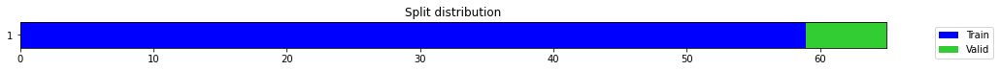

epoch,train_loss,valid_loss,mse,time
0,0.529327,0.927100,0.927100,00:00
1,0.430462,0.015808,0.015808,00:00
2,0.339240,0.293333,0.293333,00:00
3,0.311653,0.012562,0.012562,00:00
4,0.287906,0.365004,0.365004,00:00
5,0.263406,0.347473,0.347473,00:00
6,0.250037,0.267421,0.267421,00:00
7,0.246467,0.331039,0.331039,00:00
8,0.230390,0.326332,0.326332,00:00
9,0.209942,0.287002,0.287002,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5352146724859873,
  "MSE_normalize": 0.28700174040906834,
  "RMSE_normalize": 0.5357254337896123,
  "MAPE_normalize": 0.5531573366268309,
  "MAE": 34523.487234036125,
  "MSE": 1194147088.0269053,
  "RMSE": 34556.43338116515,
  "MAPE": 0.292500520691878
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.0
2022-10-14 19:33:43.267869+07:00
PROGRESS: [ 154 / 1944 ]


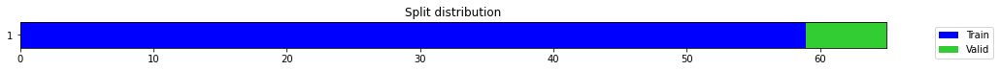

epoch,train_loss,valid_loss,mse,time
0,0.299397,0.098340,0.098340,00:00
1,0.232312,0.031633,0.031633,00:00
2,0.231844,0.002594,0.002594,00:00
3,0.215727,0.001522,0.001522,00:00
4,0.199904,0.081152,0.081152,00:00
5,0.176676,0.000582,0.000582,00:00
6,0.170952,0.006138,0.006138,00:00
7,0.181589,0.216423,0.216423,00:00
8,0.174208,0.014210,0.014210,00:00
9,0.163924,0.000056,0.000056,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.02596921722094218,
  "MSE_normalize": 0.0007194368368820628,
  "RMSE_normalize": 0.02682231975206587,
  "MAPE_normalize": 0.027003629455203806,
  "MAE": 1675.1183876196544,
  "MSE": 2993408.341557422,
  "RMSE": 1730.1469132872567,
  "MAPE": 0.014238193150517204
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.1
2022-10-14 19:33:47.412461+07:00
PROGRESS: [ 155 / 1944 ]


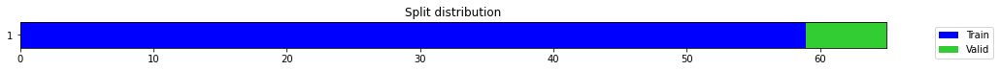

epoch,train_loss,valid_loss,mse,time
0,0.694906,1.293946,1.293946,00:00
1,0.782747,1.102559,1.102559,00:00
2,0.686239,0.658468,0.658468,00:00
3,0.591567,0.177619,0.177619,00:00
4,0.533218,0.006668,0.006668,00:00
5,0.490328,0.169946,0.169946,00:00
6,0.445971,0.110805,0.110805,00:00
7,0.415514,0.007068,0.007068,00:00
8,0.378623,0.236428,0.236428,00:00
9,0.347879,0.362498,0.362498,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09660334388415019,
  "MSE_normalize": 0.009347129227802379,
  "RMSE_normalize": 0.0966805524798156,
  "MAPE_normalize": 0.09987028442053414,
  "MAE": 6231.302093903224,
  "MSE": 38891217.63820046,
  "RMSE": 6236.282357158026,
  "MAPE": 0.05280268530096378
}
Percent CPU Usage: 99.9
Percent Ram Usage: 11.1
2022-10-14 19:33:55.425216+07:00
PROGRESS: [ 156 / 1944 ]


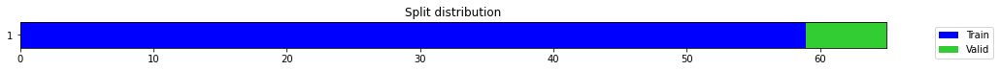

epoch,train_loss,valid_loss,mse,time
0,0.326380,0.293079,0.293079,00:00
1,0.357656,0.197433,0.197433,00:00
2,0.333903,0.097008,0.097008,00:00
3,0.311004,0.019353,0.019353,00:00
4,0.292204,0.001562,0.001562,00:00
5,0.269959,0.074244,0.074244,00:00
6,0.253245,0.164552,0.164552,00:00
7,0.247324,0.209536,0.209536,00:00
8,0.246883,0.176509,0.176509,00:00
9,0.238307,0.073886,0.073886,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03634143869082133,
  "MSE_normalize": 0.0014178524686870493,
  "RMSE_normalize": 0.03765438179929461,
  "MAPE_normalize": 0.03781110201829595,
  "MAE": 2344.168161312739,
  "MSE": 5899352.36741478,
  "RMSE": 2428.8582435816998,
  "MAPE": 0.01993115705440288
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.2
2022-10-14 19:34:11.474435+07:00
PROGRESS: [ 157 / 1944 ]


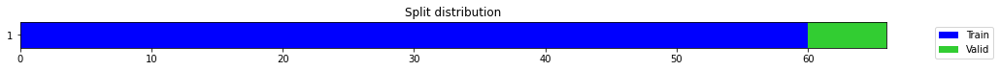

epoch,train_loss,valid_loss,mse,time
0,0.917829,0.128586,0.128586,00:00
1,0.552145,0.002569,0.002569,00:00
2,0.404409,0.797193,0.797193,00:00
3,0.346712,0.542724,0.542724,00:00
4,0.316678,0.041946,0.041946,00:00
5,0.285790,0.304734,0.304734,00:00
6,0.263387,0.028690,0.028690,00:00
7,0.245827,0.006169,0.006169,00:00
8,0.238782,0.013530,0.013530,00:00
9,0.225491,0.005839,0.005839,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0740838348865509,
  "MSE_normalize": 0.005838845311871547,
  "RMSE_normalize": 0.07641233743232534,
  "MAPE_normalize": 0.07620548900356874,
  "MAE": 4778.7036855220795,
  "MSE": 24294069.14631605,
  "RMSE": 4928.901413734713,
  "MAPE": 0.040386505368969726
}
Percent CPU Usage: 99.8
Percent Ram Usage: 11.2
2022-10-14 19:34:13.788653+07:00
PROGRESS: [ 158 / 1944 ]


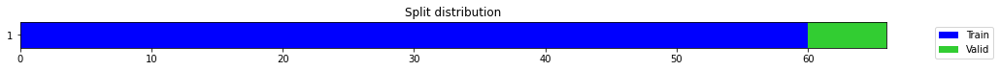

epoch,train_loss,valid_loss,mse,time
0,0.198719,0.049076,0.049076,00:00
1,0.183909,0.003255,0.003255,00:00
2,0.159024,0.127849,0.127849,00:00
3,0.154179,0.165773,0.165773,00:00
4,0.154561,0.020040,0.020040,00:00
5,0.158574,0.025204,0.025204,00:00
6,0.153349,0.017733,0.017733,00:00
7,0.149194,0.215607,0.215607,00:00
8,0.152759,0.015609,0.015609,00:00
9,0.146408,0.004885,0.004885,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06836765011151631,
  "MSE_normalize": 0.00468086782270601,
  "RMSE_normalize": 0.06841686796913471,
  "MAPE_normalize": 0.0707613007020834,
  "MAE": 4409.986902793248,
  "MSE": 19475995.76210308,
  "RMSE": 4413.161651481065,
  "MAPE": 0.03739201697204295
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.2
2022-10-14 19:34:18.501135+07:00
PROGRESS: [ 159 / 1944 ]


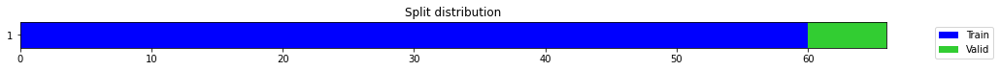

epoch,train_loss,valid_loss,mse,time
0,0.889678,1.944314,1.944314,00:00
1,0.810370,1.645633,1.645633,00:00
2,0.700466,1.196248,1.196248,00:00
3,0.610692,0.625648,0.625648,00:00
4,0.525207,0.075907,0.075907,00:00
5,0.457485,0.083196,0.083196,00:00
6,0.439485,0.183035,0.183035,00:00
7,0.415048,0.020978,0.020978,00:00
8,0.373707,0.067193,0.067193,00:00
9,0.342278,0.121971,0.121971,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03338502844174703,
  "MSE_normalize": 0.0011380435702997478,
  "RMSE_normalize": 0.03373490136786749,
  "MAPE_normalize": 0.03462327715851066,
  "MAE": 2153.4678746064506,
  "MSE": 4735133.012030498,
  "RMSE": 2176.0360778329245,
  "MAPE": 0.018278495043167215
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.2
2022-10-14 19:34:26.937953+07:00
PROGRESS: [ 160 / 1944 ]


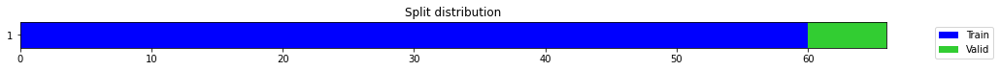

epoch,train_loss,valid_loss,mse,time
0,0.690926,1.398705,1.398705,00:00
1,0.592138,1.213552,1.213552,00:00
2,0.562858,0.941298,0.941298,00:00
3,0.516266,0.585054,0.585054,00:00
4,0.457187,0.239963,0.239963,00:00
5,0.402716,0.024585,0.024585,00:00
6,0.356814,0.050541,0.050541,00:00
7,0.332095,0.265811,0.265811,00:00
8,0.315331,0.354909,0.354909,00:00
9,0.312556,0.207232,0.207232,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1282315750916799,
  "MSE_normalize": 0.016522506123012093,
  "RMSE_normalize": 0.12853990089856182,
  "MAPE_normalize": 0.13245587641424164,
  "MAE": 8271.44951971372,
  "MSE": 68746281.97578064,
  "RMSE": 8291.337767560832,
  "MAPE": 0.07005903355661877
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.4
2022-10-14 19:34:43.516264+07:00
PROGRESS: [ 161 / 1944 ]


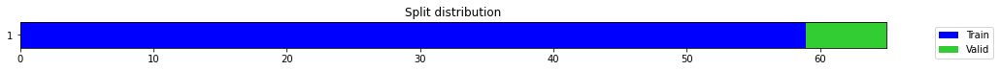

epoch,train_loss,valid_loss,mse,time
0,0.603542,0.318424,0.318424,00:00
1,0.514889,0.212346,0.212346,00:00
2,0.480148,0.017602,0.017602,00:00
3,0.399068,0.000835,0.000835,00:00
4,0.347817,0.000126,0.000126,00:00
5,0.307432,0.025047,0.025047,00:00
6,0.274071,0.029772,0.029772,00:00
7,0.251320,0.045980,0.045980,00:00
8,0.243981,0.012930,0.012930,00:00
9,0.233579,0.011685,0.011685,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10791251063346863,
  "MSE_normalize": 0.011685244059722896,
  "RMSE_normalize": 0.10809830738602198,
  "MAPE_normalize": 0.11176779431381621,
  "MAE": 6960.78858590126,
  "MSE": 48619566.37236089,
  "RMSE": 6972.773219627962,
  "MAPE": 0.05904175389528443
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.4
2022-10-14 19:34:45.712816+07:00
PROGRESS: [ 162 / 1944 ]


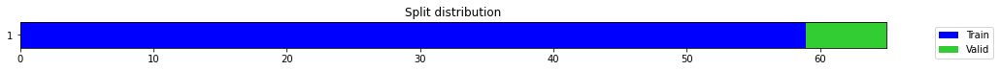

epoch,train_loss,valid_loss,mse,time
0,0.710304,1.152884,1.152884,00:00
1,0.594559,0.359985,0.359985,00:00
2,0.501487,0.072548,0.072548,00:00
3,0.421070,0.871557,0.871557,00:00
4,0.359872,1.131109,1.131109,00:00
5,0.315187,0.195808,0.195808,00:00
6,0.298199,0.134974,0.134974,00:00
7,0.284880,0.018803,0.018803,00:00
8,0.260763,0.003368,0.003368,00:00
9,0.253443,0.193553,0.193553,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.17476646105448404,
  "MSE_normalize": 0.03159613138375169,
  "RMSE_normalize": 0.17775300667992003,
  "MAPE_normalize": 0.18005664748492015,
  "MAE": 11273.135803858439,
  "MSE": 131464109.6985851,
  "RMSE": 11465.779942881562,
  "MAPE": 0.0953529324504749
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.5
2022-10-14 19:34:50.677336+07:00
PROGRESS: [ 163 / 1944 ]


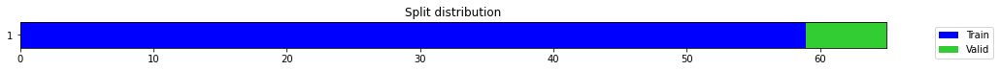

epoch,train_loss,valid_loss,mse,time
0,0.976362,2.790649,2.790649,00:00
1,0.782277,2.104764,2.104764,00:00
2,0.651230,1.095427,1.095427,00:00
3,0.545194,0.228371,0.228371,00:00
4,0.488278,0.003534,0.003534,00:00
5,0.456747,0.101993,0.101993,00:00
6,0.411028,0.020895,0.020895,00:00
7,0.368916,0.006148,0.006148,00:00
8,0.337607,0.000795,0.000795,00:00
9,0.310494,0.053091,0.053091,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03765196601549784,
  "MSE_normalize": 0.001478188722454495,
  "RMSE_normalize": 0.03844721995742338,
  "MAPE_normalize": 0.039105058100560135,
  "MAE": 2428.7024158636727,
  "MSE": 6150397.401623119,
  "RMSE": 2479.999476133638,
  "MAPE": 0.020630468174342376
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.5
2022-10-14 19:34:59.947658+07:00
PROGRESS: [ 164 / 1944 ]


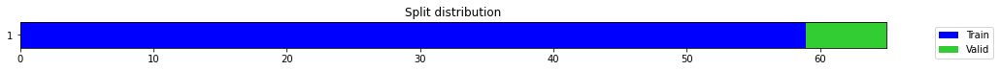

epoch,train_loss,valid_loss,mse,time
0,0.983597,4.011091,4.011091,00:00
1,0.827642,3.008437,3.008437,00:00
2,0.818346,2.111288,2.111288,00:00
3,0.759470,1.316077,1.316077,00:00
4,0.709017,0.660427,0.660427,00:00
5,0.659015,0.207751,0.207751,00:00
6,0.594412,0.000718,0.000718,00:00
7,0.546802,0.174040,0.174040,00:00
8,0.489386,0.603677,0.603677,00:00
9,0.446378,0.669857,0.669857,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08376350005467732,
  "MSE_normalize": 0.0070274687383431456,
  "RMSE_normalize": 0.08382999903580547,
  "MAPE_normalize": 0.08670177838876873,
  "MAE": 5403.080807526906,
  "MSE": 29239653.10500056,
  "RMSE": 5407.370257805596,
  "MAPE": 0.045814011159931424
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.6
2022-10-14 19:35:18.745270+07:00
PROGRESS: [ 165 / 1944 ]


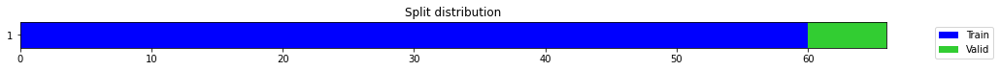

epoch,train_loss,valid_loss,mse,time
0,0.738367,2.357902,2.357902,00:00
1,0.535961,0.055344,0.055344,00:00
2,0.403032,0.311812,0.311812,00:00
3,0.349941,0.262581,0.262581,00:00
4,0.327107,0.139658,0.139658,00:00
5,0.291223,0.310578,0.310578,00:00
6,0.266705,0.148361,0.148361,00:00
7,0.243238,0.030254,0.030254,00:00
8,0.227790,0.004799,0.004799,00:00
9,0.210637,0.003741,0.003741,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05817344784736633,
  "MSE_normalize": 0.003740577933325421,
  "RMSE_normalize": 0.06116026433335144,
  "MAPE_normalize": 0.06061123272711911,
  "MAE": 3752.420079946518,
  "MSE": 15563669.545179928,
  "RMSE": 3945.081690558502,
  "MAPE": 0.03192858359835695
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.6
2022-10-14 19:35:21.082560+07:00
PROGRESS: [ 166 / 1944 ]


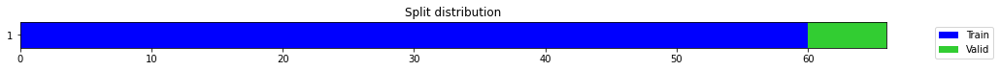

epoch,train_loss,valid_loss,mse,time
0,0.277949,0.137349,0.137349,00:00
1,0.257525,0.001419,0.001419,00:00
2,0.213616,0.082959,0.082959,00:00
3,0.210048,0.016321,0.016321,00:00
4,0.192069,0.055735,0.055735,00:00
5,0.180713,0.071369,0.071369,00:00
6,0.174764,0.011017,0.011017,00:00
7,0.167212,0.162746,0.162746,00:00
8,0.160838,0.190367,0.190367,00:00
9,0.154754,0.003486,0.003486,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09948267539342244,
  "MSE_normalize": 0.0105041979748511,
  "RMSE_normalize": 0.102489989632408,
  "MAPE_normalize": 0.10234196840317089,
  "MAE": 6417.030493577321,
  "MSE": 43705509.959096484,
  "RMSE": 6611.014291248846,
  "MAPE": 0.05423543810353745
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.7
2022-10-14 19:35:26.595003+07:00
PROGRESS: [ 167 / 1944 ]


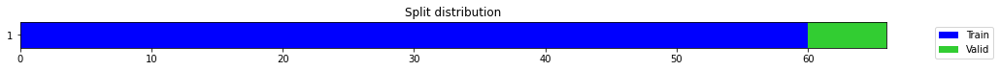

epoch,train_loss,valid_loss,mse,time
0,0.682237,1.561323,1.561323,00:00
1,0.572297,1.112298,1.112298,00:00
2,0.496891,0.466954,0.466954,00:00
3,0.441969,0.016255,0.016255,00:00
4,0.395550,0.181946,0.181946,00:00
5,0.381672,0.350328,0.350328,00:00
6,0.359915,0.235138,0.235138,00:00
7,0.337073,0.021702,0.021702,00:00
8,0.308916,0.025148,0.025148,00:00
9,0.290190,0.003124,0.003124,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.24947375059127808,
  "MSE_normalize": 0.06238249345602872,
  "RMSE_normalize": 0.2497648763457919,
  "MAPE_normalize": 0.2578079393396819,
  "MAE": 16092.054808139801,
  "MSE": 259558958.7651867,
  "RMSE": 16110.83358380896,
  "MAPE": 0.13633193559730922
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.6
2022-10-14 19:35:36.869887+07:00
PROGRESS: [ 168 / 1944 ]


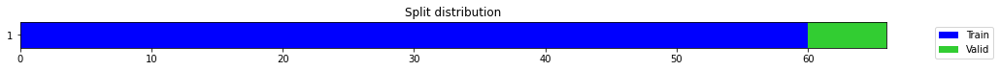

epoch,train_loss,valid_loss,mse,time
0,0.312321,0.192727,0.192727,00:00
1,0.272511,0.094388,0.094388,00:00
2,0.216258,0.016319,0.016319,00:00
3,0.209506,0.006323,0.006323,00:00
4,0.194783,0.011620,0.011620,00:00
5,0.187750,0.012685,0.012685,00:00
6,0.183063,0.001448,0.001448,00:00
7,0.177704,0.053821,0.053821,00:00
8,0.168354,0.134833,0.134833,00:00
9,0.162082,0.107309,0.107309,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06357673803965251,
  "MSE_normalize": 0.0040629339880714115,
  "RMSE_normalize": 0.06374114831152175,
  "MAPE_normalize": 0.06566948443639063,
  "MAE": 4100.953910509746,
  "MSE": 16904917.66281888,
  "RMSE": 4111.559030686399,
  "MAPE": 0.03473455468464313
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.7
2022-10-14 19:35:57.638793+07:00
PROGRESS: [ 169 / 1944 ]


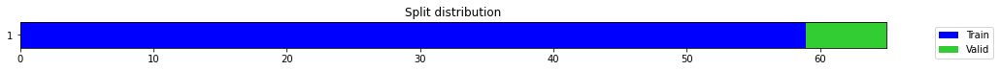

epoch,train_loss,valid_loss,mse,time
0,0.755280,2.716729,2.716729,00:00
1,0.557666,0.125733,0.125733,00:00
2,0.456096,0.838334,0.838334,00:00
3,0.396802,0.168698,0.168698,00:00
4,0.344221,1.189227,1.189227,00:00
5,0.304398,1.161045,1.161045,00:00
6,0.274032,0.877819,0.877819,00:00
7,0.250730,0.486173,0.486173,00:00
8,0.238833,0.335355,0.335355,00:00
9,0.229698,0.263589,0.263589,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5129139771064123,
  "MSE_normalize": 0.2635894071340081,
  "RMSE_normalize": 0.5134095900292553,
  "MAPE_normalize": 0.5301015468086876,
  "MAE": 33085.00317927202,
  "MSE": 1096733847.3807688,
  "RMSE": 33116.972195247086,
  "MAPE": 0.28031093653959543
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.7
2022-10-14 19:35:59.796071+07:00
PROGRESS: [ 170 / 1944 ]


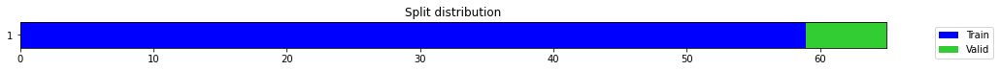

epoch,train_loss,valid_loss,mse,time
0,0.401787,0.662845,0.662845,00:00
1,0.337795,0.052609,0.052609,00:00
2,0.337333,0.004715,0.004715,00:00
3,0.299413,0.031409,0.031409,00:00
4,0.272189,0.223351,0.223351,00:00
5,0.242597,0.106322,0.106322,00:00
6,0.220735,0.022554,0.022554,00:00
7,0.208983,0.000049,0.000049,00:00
8,0.193277,0.785161,0.785161,00:00
9,0.204899,1.294030,1.294030,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13389363884925842,
  "MSE_normalize": 0.018055569685700473,
  "RMSE_normalize": 0.13437101505049545,
  "MAPE_normalize": 0.1387696425700944,
  "MAE": 8636.675280332565,
  "MSE": 75125000.74778232,
  "RMSE": 8667.467954817157,
  "MAPE": 0.0732825460671358
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.8
2022-10-14 19:36:04.913851+07:00
PROGRESS: [ 171 / 1944 ]


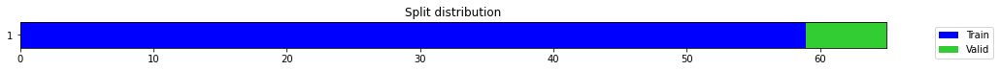

epoch,train_loss,valid_loss,mse,time
0,0.405509,0.579605,0.579605,00:00
1,0.336913,0.211479,0.211479,00:00
2,0.313896,0.020455,0.020455,00:00
3,0.290328,0.002069,0.002069,00:00
4,0.254682,0.002111,0.002111,00:00
5,0.230216,0.002602,0.002602,00:00
6,0.226952,0.014023,0.014023,00:00
7,0.216776,0.156705,0.156705,00:00
8,0.205012,0.925263,0.925263,00:00
9,0.194116,0.952401,0.952401,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0365566611289978,
  "MSE_normalize": 0.0014096384327887772,
  "RMSE_normalize": 0.03754515192123714,
  "MAPE_normalize": 0.038002868434317265,
  "MAE": 2358.0508694648743,
  "MSE": 5865175.685995043,
  "RMSE": 2421.8124795274807,
  "MAPE": 0.02004027436528049
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.8
2022-10-14 19:36:14.897520+07:00
PROGRESS: [ 172 / 1944 ]


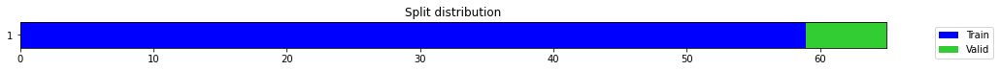

epoch,train_loss,valid_loss,mse,time
0,0.432768,0.644805,0.644805,00:00
1,0.461046,0.496668,0.496668,00:00
2,0.387745,0.267130,0.267130,00:00
3,0.358276,0.105476,0.105476,00:00
4,0.322766,0.060044,0.060044,00:00
5,0.299195,0.037803,0.037803,00:00
6,0.272363,0.087013,0.087013,00:00
7,0.257378,0.126929,0.126929,00:00
8,0.241288,0.086172,0.086172,00:00
9,0.231486,0.149083,0.149083,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09115420778592427,
  "MSE_normalize": 0.008338952134889036,
  "RMSE_normalize": 0.09131786317522457,
  "MAPE_normalize": 0.0944048214899947,
  "MAE": 5879.811019023259,
  "MSE": 34696428.651896946,
  "RMSE": 5890.367446254686,
  "MAPE": 0.04987118261448214
}
Percent CPU Usage: 100.0
Percent Ram Usage: 11.9
2022-10-14 19:36:34.405933+07:00
PROGRESS: [ 173 / 1944 ]


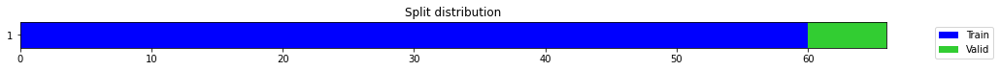

epoch,train_loss,valid_loss,mse,time
0,0.584499,0.096391,0.096391,00:00
1,0.429355,0.530087,0.530087,00:00
2,0.350170,0.231483,0.231483,00:00
3,0.300962,0.095431,0.095431,00:00
4,0.271214,0.402498,0.402498,00:00
5,0.252921,0.136762,0.136762,00:00
6,0.232649,0.273105,0.273105,00:00
7,0.215168,0.135708,0.135708,00:00
8,0.210352,0.093413,0.093413,00:00
9,0.195334,0.067316,0.067316,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2564876278241475,
  "MSE_normalize": 0.06731577483582996,
  "RMSE_normalize": 0.2594528374017713,
  "MAPE_normalize": 0.26443805177131513,
  "MAE": 16544.477945168812,
  "MSE": 280085188.27762926,
  "RMSE": 16735.745823763853,
  "MAPE": 0.13999218348583634
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.0
2022-10-14 19:36:36.941904+07:00
PROGRESS: [ 174 / 1944 ]


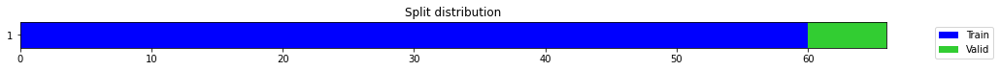

epoch,train_loss,valid_loss,mse,time
0,0.224521,0.102986,0.102986,00:00
1,0.176889,0.253091,0.253091,00:00
2,0.184329,0.044563,0.044563,00:00
3,0.187421,0.005295,0.005295,00:00
4,0.176321,0.504540,0.504540,00:00
5,0.190508,0.193480,0.193480,00:00
6,0.203611,0.075356,0.075356,00:00
7,0.200113,0.047328,0.047328,00:00
8,0.199717,0.324798,0.324798,00:00
9,0.200645,0.650810,0.650810,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10944666465123494,
  "MSE_normalize": 0.012457892524917469,
  "RMSE_normalize": 0.11161492966855943,
  "MAPE_normalize": 0.11271932720022887,
  "MAE": 7059.747656663259,
  "MSE": 51834375.848657034,
  "RMSE": 7199.6094233407575,
  "MAPE": 0.05970312378262566
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.0
2022-10-14 19:36:42.767972+07:00
PROGRESS: [ 175 / 1944 ]


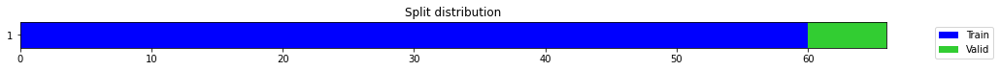

epoch,train_loss,valid_loss,mse,time
0,0.246983,0.158575,0.158575,00:00
1,0.218900,0.045792,0.045792,00:00
2,0.212353,0.016355,0.016355,00:00
3,0.188140,0.024024,0.024024,00:00
4,0.173473,0.110864,0.110864,00:00
5,0.165153,0.000324,0.000324,00:00
6,0.165480,0.001046,0.001046,00:00
7,0.159570,0.253371,0.253371,00:00
8,0.163066,0.406280,0.406280,00:00
9,0.166402,0.122241,0.122241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03950485587120056,
  "MSE_normalize": 0.0015653104740547263,
  "RMSE_normalize": 0.03956400477776139,
  "MAPE_normalize": 0.040863923263831335,
  "MAE": 2548.221223115921,
  "MSE": 6512890.624935755,
  "RMSE": 2552.0365641847206,
  "MAPE": 0.021599548708977404
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.0
2022-10-14 19:36:53.943939+07:00
PROGRESS: [ 176 / 1944 ]


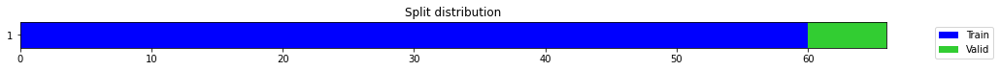

epoch,train_loss,valid_loss,mse,time
0,0.681874,1.130656,1.130656,00:00
1,0.605711,0.693655,0.693655,00:00
2,0.506174,0.264251,0.264251,00:00
3,0.422139,0.030263,0.030263,00:00
4,0.366643,0.039344,0.039344,00:00
5,0.333396,0.308739,0.308739,00:00
6,0.323470,0.573595,0.573595,00:00
7,0.301186,0.483236,0.483236,00:00
8,0.297312,0.127919,0.127919,00:00
9,0.288439,0.039756,0.039756,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1513970891634623,
  "MSE_normalize": 0.022982130244869836,
  "RMSE_normalize": 0.15159858259518733,
  "MAPE_normalize": 0.1567931328166368,
  "MAE": 9765.717839399973,
  "MSE": 95623266.49814017,
  "RMSE": 9778.714971719965,
  "MAPE": 0.0828297062818672
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.3
2022-10-14 19:37:15.980024+07:00
PROGRESS: [ 177 / 1944 ]


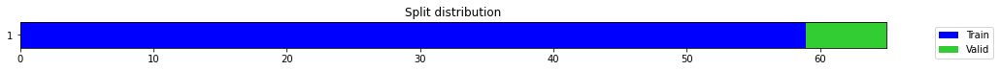

epoch,train_loss,valid_loss,mse,time
0,0.838183,0.880118,0.880118,00:00
1,0.691123,0.160891,0.160891,00:00
2,0.507256,0.057968,0.057968,00:00
3,0.454164,0.307503,0.307503,00:00
4,0.381953,1.618364,1.618364,00:00
5,0.333513,0.469592,0.469592,00:00
6,0.299393,0.006276,0.006276,00:00
7,0.271448,0.000244,0.000244,00:00
8,0.258244,0.001445,0.001445,00:00
9,0.248730,0.003214,0.003214,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05609338482220968,
  "MSE_normalize": 0.003214393668930763,
  "RMSE_normalize": 0.056695623013869094,
  "MAPE_normalize": 0.05819570068079516,
  "MAE": 3618.247694571813,
  "MSE": 13374339.939732676,
  "RMSE": 3657.0944668866123,
  "MAPE": 0.030717563814356183
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.1
2022-10-14 19:37:18.535171+07:00
PROGRESS: [ 178 / 1944 ]


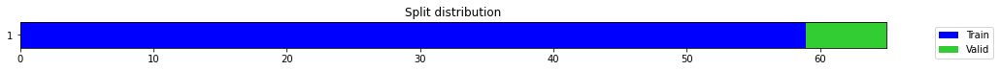

epoch,train_loss,valid_loss,mse,time
0,0.367892,0.689376,0.689376,00:00
1,0.295578,0.002940,0.002940,00:00
2,0.262919,0.363525,0.363525,00:00
3,0.234388,0.001157,0.001157,00:00
4,0.225546,0.022091,0.022091,00:00
5,0.221467,0.286942,0.286942,00:00
6,0.209515,1.046071,1.046071,00:00
7,0.191930,1.915614,1.915614,00:00
8,0.181076,0.098419,0.098419,00:00
9,0.174890,1.533211,1.533211,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.02461067835489909,
  "MSE_normalize": 0.00068827886534469,
  "RMSE_normalize": 0.026235069379452573,
  "MAPE_normalize": 0.025659114714207006,
  "MAE": 1587.4871966044109,
  "MSE": 2863767.3124572258,
  "RMSE": 1692.2669152522085,
  "MAPE": 0.013512489981277909
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.2
2022-10-14 19:37:25.167417+07:00
PROGRESS: [ 179 / 1944 ]


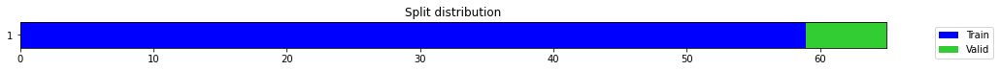

epoch,train_loss,valid_loss,mse,time
0,0.557437,0.627417,0.627417,00:00
1,0.507385,0.356350,0.356350,00:00
2,0.422956,0.104126,0.104126,00:00
3,0.371961,0.010808,0.010808,00:00
4,0.334858,0.012375,0.012375,00:00
5,0.311979,0.011840,0.011840,00:00
6,0.291850,0.001504,0.001504,00:00
7,0.274317,2.639241,2.639241,00:00
8,0.260405,1.752748,1.752748,00:00
9,0.249498,2.030055,2.030055,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.023244063059488933,
  "MSE_normalize": 0.0006727353754018376,
  "RMSE_normalize": 0.025937142776370676,
  "MAPE_normalize": 0.023792774713125145,
  "MAE": 1499.3350435892742,
  "MSE": 2799094.487732968,
  "RMSE": 1673.0494576470142,
  "MAPE": 0.012638752589703614
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.1
2022-10-14 19:37:36.538977+07:00
PROGRESS: [ 180 / 1944 ]


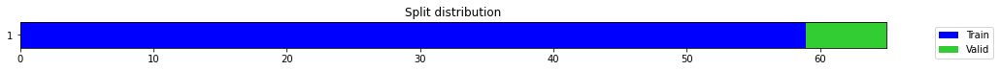

epoch,train_loss,valid_loss,mse,time
0,0.767134,2.351040,2.351040,00:00
1,0.615308,1.304910,1.304910,00:00
2,0.547098,0.555254,0.555254,00:00
3,0.476379,0.092835,0.092835,00:00
4,0.426104,0.007749,0.007749,00:00
5,0.391073,0.145163,0.145163,00:00
6,0.375650,0.231531,0.231531,00:00
7,0.340200,0.307144,0.307144,00:00
8,0.324803,0.192901,0.192901,00:00
9,0.307077,0.018549,0.018549,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07871118187904358,
  "MSE_normalize": 0.006235781657286665,
  "RMSE_normalize": 0.0789669656076936,
  "MAPE_normalize": 0.08155662055979976,
  "MAE": 5077.186075925827,
  "MSE": 25945628.402834516,
  "RMSE": 5093.685149558669,
  "MAPE": 0.04307424614855663
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.3
2022-10-14 19:37:58.618638+07:00
PROGRESS: [ 181 / 1944 ]


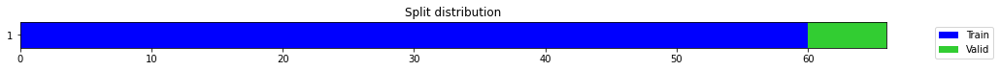

epoch,train_loss,valid_loss,mse,time
0,0.449457,0.473435,0.473435,00:00
1,0.344995,0.114477,0.114477,00:00
2,0.331067,0.223368,0.223368,00:00
3,0.301441,0.285204,0.285204,00:00
4,0.261564,0.788099,0.788099,00:00
5,0.255101,0.092007,0.092007,00:00
6,0.231539,0.006357,0.006357,00:00
7,0.218928,0.079959,0.079959,00:00
8,0.206521,0.121587,0.121587,00:00
9,0.197399,0.108217,0.108217,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3289429048697154,
  "MSE_normalize": 0.10821732479640704,
  "RMSE_normalize": 0.32896401747973447,
  "MAPE_normalize": 0.3403347651677644,
  "MAE": 21218.13313571612,
  "MSE": 450266967.35532457,
  "RMSE": 21219.49498351279,
  "MAPE": 0.17987273562255598
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.4
2022-10-14 19:38:01.548332+07:00
PROGRESS: [ 182 / 1944 ]


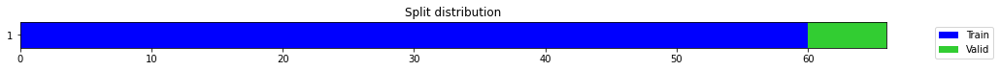

epoch,train_loss,valid_loss,mse,time
0,0.333575,0.031494,0.031494,00:00
1,0.269152,0.002912,0.002912,00:00
2,0.222834,0.037396,0.037396,00:00
3,0.220552,0.098130,0.098130,00:00
4,0.215674,0.327838,0.327838,00:00
5,0.196146,0.211814,0.211814,00:00
6,0.177648,0.034184,0.034184,00:00
7,0.178672,0.002053,0.002053,00:00
8,0.175391,0.002692,0.002692,00:00
9,0.170314,0.042852,0.042852,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18805201848347983,
  "MSE_normalize": 0.035590111451742956,
  "RMSE_normalize": 0.18865341622070605,
  "MAPE_normalize": 0.1942003579999547,
  "MAE": 12130.107400258383,
  "MSE": 148082126.23406452,
  "RMSE": 12168.899959900424,
  "MAPE": 0.10272879596535796
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.4
2022-10-14 19:38:08.385344+07:00
PROGRESS: [ 183 / 1944 ]


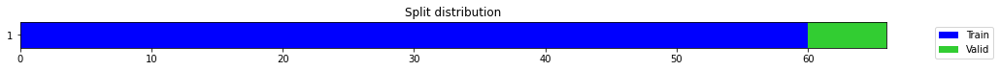

epoch,train_loss,valid_loss,mse,time
0,0.357185,0.422092,0.422092,00:00
1,0.370107,0.234810,0.234810,00:00
2,0.275867,0.082368,0.082368,00:00
3,0.236834,0.007877,0.007877,00:00
4,0.242638,0.149550,0.149550,00:00
5,0.232593,0.025176,0.025176,00:00
6,0.233969,0.329121,0.329121,00:00
7,0.230521,0.052516,0.052516,00:00
8,0.221567,0.075345,0.075345,00:00
9,0.215131,0.336765,0.336765,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0291538933912913,
  "MSE_normalize": 0.001263178441093397,
  "RMSE_normalize": 0.03554122171638725,
  "MAPE_normalize": 0.03062915293244683,
  "MAE": 1880.5427393118541,
  "MSE": 5255789.929845264,
  "RMSE": 2292.5509655938436,
  "MAPE": 0.016071955287006053
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.4
2022-10-14 19:38:21.297509+07:00
PROGRESS: [ 184 / 1944 ]


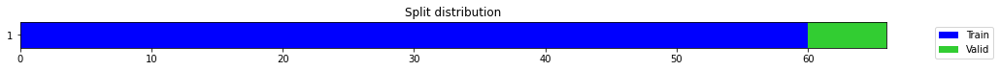

epoch,train_loss,valid_loss,mse,time
0,0.278328,0.553056,0.553056,00:00
1,0.260053,0.297638,0.297638,00:00
2,0.234467,0.169983,0.169983,00:00
3,0.206645,0.031070,0.031070,00:00
4,0.205545,0.019235,0.019235,00:00
5,0.212974,0.118849,0.118849,00:00
6,0.202104,0.019163,0.019163,00:00
7,0.190693,0.096661,0.096661,00:00
8,0.194204,0.404885,0.404885,00:00
9,0.195534,0.146853,0.146853,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03129782279332479,
  "MSE_normalize": 0.001022207983722249,
  "RMSE_normalize": 0.03197198748470681,
  "MAPE_normalize": 0.0325172715878692,
  "MAE": 2018.834761460622,
  "MSE": 4253168.239955415,
  "RMSE": 2062.3210807135283,
  "MAPE": 0.017152127311331075
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:38:47.107164+07:00
PROGRESS: [ 185 / 1944 ]


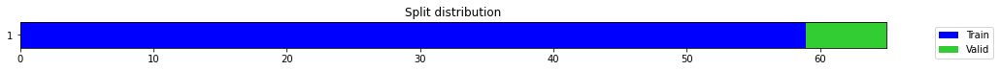

epoch,train_loss,valid_loss,mse,time
0,0.227135,0.241398,0.241398,00:00
1,0.205394,0.703431,0.703431,00:00
2,0.202776,0.400466,0.400466,00:00
3,0.186877,3.338466,3.338466,00:00
4,0.185025,0.092449,0.092449,00:00
5,0.171109,0.000913,0.000913,00:00
6,0.178071,0.251552,0.251552,00:00
7,0.178356,0.069946,0.069946,00:00
8,0.168300,0.000042,0.000042,00:00
9,0.167999,0.000426,0.000426,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.019240279992421467,
  "MSE_normalize": 0.00042557829857988355,
  "RMSE_normalize": 0.02062954916084895,
  "MAPE_normalize": 0.019748453191723452,
  "MAE": 1241.0750206311543,
  "MSE": 1770731.7218782806,
  "RMSE": 1330.6884390714006,
  "MAPE": 0.010476724358346887
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:38:50.250347+07:00
PROGRESS: [ 186 / 1944 ]


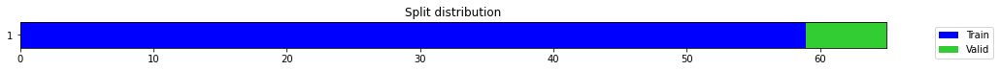

epoch,train_loss,valid_loss,mse,time
0,0.701397,1.186134,1.186134,00:00
1,0.565131,0.043539,0.043539,00:00
2,0.450551,0.355235,0.355235,00:00
3,0.377251,0.361013,0.361013,00:00
4,0.339516,0.052825,0.052825,00:00
5,0.316654,0.047650,0.047650,00:00
6,0.288096,0.901435,0.901435,00:00
7,0.269503,0.065020,0.065020,00:00
8,0.249790,0.169023,0.169023,00:00
9,0.231623,0.028831,0.028831,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03005600968996684,
  "MSE_normalize": 0.0011504042745880128,
  "RMSE_normalize": 0.033917610095465345,
  "MAPE_normalize": 0.031444911724177786,
  "MAE": 1938.732849041621,
  "MSE": 4786563.010366936,
  "RMSE": 2187.8215215978967,
  "MAPE": 0.016532466217820996
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:38:57.067196+07:00
PROGRESS: [ 187 / 1944 ]


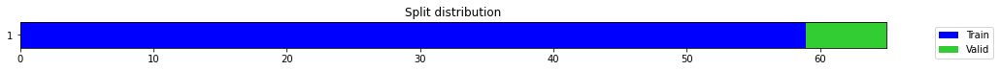

epoch,train_loss,valid_loss,mse,time
0,0.396179,0.535605,0.535605,00:00
1,0.378129,0.123786,0.123786,00:00
2,0.310935,0.006628,0.006628,00:00
3,0.276995,0.003560,0.003560,00:00
4,0.260334,0.057763,0.057763,00:00
5,0.255587,0.826169,0.826169,00:00
6,0.234907,1.463523,1.463523,00:00
7,0.225999,0.002968,0.002968,00:00
8,0.225249,0.194282,0.194282,00:00
9,0.234770,0.059752,0.059752,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04618850350379944,
  "MSE_normalize": 0.002254141600020058,
  "RMSE_normalize": 0.04747780112873866,
  "MAPE_normalize": 0.048024177452812476,
  "MAE": 2979.343230009079,
  "MSE": 9378955.764615323,
  "RMSE": 3062.5080840081587,
  "MAPE": 0.02532273449674743
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:39:10.490906+07:00
PROGRESS: [ 188 / 1944 ]


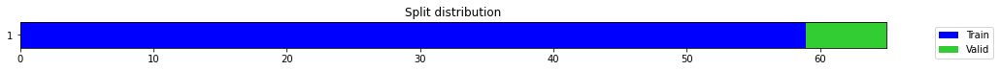

epoch,train_loss,valid_loss,mse,time
0,0.307695,0.004957,0.004957,00:00
1,0.339492,0.046732,0.046732,00:00
2,0.324987,0.051702,0.051702,00:00
3,0.299874,0.022515,0.022515,00:00
4,0.265048,0.010095,0.010095,00:00
5,0.254029,0.022480,0.022480,00:00
6,0.240893,0.073626,0.073626,00:00
7,0.241840,0.044588,0.044588,00:00
8,0.225937,0.864520,0.864520,00:00
9,0.213889,1.381356,1.381356,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09278481205304463,
  "MSE_normalize": 0.008645523136335598,
  "RMSE_normalize": 0.0929813053056129,
  "MAPE_normalize": 0.09585469418101233,
  "MAE": 5984.991516669591,
  "MSE": 35971998.85620689,
  "RMSE": 5997.666117433254,
  "MAPE": 0.050696565864753206
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:39:37.058344+07:00
PROGRESS: [ 189 / 1944 ]


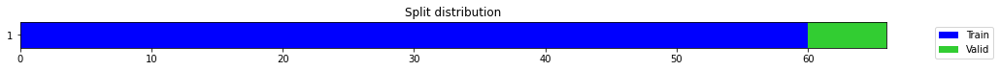

epoch,train_loss,valid_loss,mse,time
0,0.263073,0.025378,0.025378,00:00
1,0.209717,0.054221,0.054221,00:00
2,0.204340,0.323544,0.323544,00:00
3,0.227885,0.152589,0.152589,00:00
4,0.215317,0.384689,0.384689,00:00
5,0.214695,0.263266,0.263266,00:00
6,0.207469,0.112758,0.112758,00:00
7,0.202557,0.079188,0.079188,00:00
8,0.186952,0.338143,0.338143,00:00
9,0.191920,0.269234,0.269234,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5180458426475525,
  "MSE_normalize": 0.26923401619512904,
  "RMSE_normalize": 0.518877650506484,
  "MAPE_normalize": 0.535263313871012,
  "MAE": 33416.029034137726,
  "MSE": 1120219744.9358866,
  "RMSE": 33469.68396827025,
  "MAPE": 0.28307578554937235
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.5
2022-10-14 19:39:40.507339+07:00
PROGRESS: [ 190 / 1944 ]


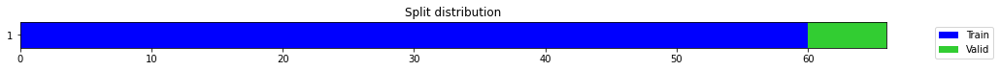

epoch,train_loss,valid_loss,mse,time
0,0.595228,1.195805,1.195805,00:00
1,0.457422,0.158034,0.158034,00:00
2,0.393086,0.230203,0.230203,00:00
3,0.350595,0.006211,0.006211,00:00
4,0.307721,0.417555,0.417555,00:00
5,0.284249,0.184426,0.184426,00:00
6,0.258878,0.319139,0.319139,00:00
7,0.240436,0.012929,0.012929,00:00
8,0.217828,0.000789,0.000789,00:00
9,0.212323,3.458091,3.458091,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11993590990702312,
  "MSE_normalize": 0.014820048446418118,
  "RMSE_normalize": 0.12173762132725495,
  "MAPE_normalize": 0.12359591177852923,
  "MAE": 7736.345932642619,
  "MSE": 61662753.93133011,
  "RMSE": 7852.563526093253,
  "MAPE": 0.06544552210883746
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.6
2022-10-14 19:39:48.708804+07:00
PROGRESS: [ 191 / 1944 ]


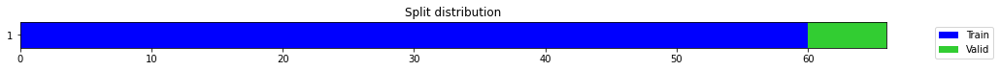

epoch,train_loss,valid_loss,mse,time
0,0.739224,1.200501,1.200501,00:00
1,0.575876,0.419613,0.419613,00:00
2,0.453334,0.001362,0.001362,00:00
3,0.395906,0.509040,0.509040,00:00
4,0.367609,0.437026,0.437026,00:00
5,0.342272,0.035099,0.035099,00:00
6,0.308955,0.753740,0.753740,00:00
7,0.292853,0.413873,0.413873,00:00
8,0.270561,0.034199,0.034199,00:00
9,0.261716,0.001730,0.001730,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04372591773668925,
  "MSE_normalize": 0.0020064554772331413,
  "RMSE_normalize": 0.044793475833352574,
  "MAPE_normalize": 0.04544983691618292,
  "MAE": 2820.496597687403,
  "MSE": 8348391.762288716,
  "RMSE": 2889.3583651545746,
  "MAPE": 0.023968776818604768
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.6
2022-10-14 19:40:04.942119+07:00
PROGRESS: [ 192 / 1944 ]


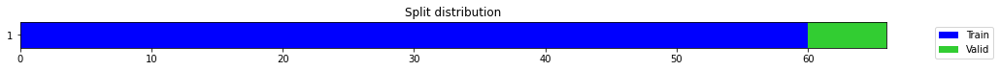

epoch,train_loss,valid_loss,mse,time
0,0.362776,0.916414,0.916414,00:00
1,0.307436,0.419529,0.419529,00:00
2,0.259642,0.094403,0.094403,00:00
3,0.244617,0.003242,0.003242,00:00
4,0.241881,0.003295,0.003295,00:00
5,0.239219,0.000986,0.000986,00:00
6,0.221569,0.007641,0.007641,00:00
7,0.201690,0.004827,0.004827,00:00
8,0.191692,0.002540,0.002540,00:00
9,0.182474,0.063354,0.063354,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.052957276503245033,
  "MSE_normalize": 0.0028146362355971157,
  "RMSE_normalize": 0.053053145388347295,
  "MAPE_normalize": 0.054834112876829814,
  "MAE": 3415.9561635653176,
  "MSE": 11711042.79647465,
  "RMSE": 3422.140090129954,
  "MAPE": 0.02897006641812037
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.6
2022-10-14 19:40:37.863786+07:00
PROGRESS: [ 193 / 1944 ]


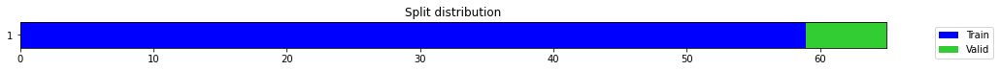

epoch,train_loss,valid_loss,mse,time
0,0.320003,0.020740,0.020740,00:00
1,0.310233,1.731441,1.731441,00:00
2,0.307621,2.638227,2.638227,00:00
3,0.291361,6.613483,6.613483,00:00
4,0.300047,0.796948,0.796948,00:00
5,0.299384,0.206372,0.206372,00:00
6,0.274853,4.691099,4.691099,00:00
7,0.280092,2.564565,2.564565,00:00
8,0.269100,0.605206,0.605206,00:00
9,0.253453,0.241885,0.241885,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.48967621723810834,
  "MSE_normalize": 0.24188514036832606,
  "RMSE_normalize": 0.4918181984924166,
  "MAPE_normalize": 0.5055285774739312,
  "MAE": 31586.07471672694,
  "MSE": 1006427471.8199207,
  "RMSE": 31724.241075554837,
  "MAPE": 0.2674558188452059
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.6
2022-10-14 19:40:42.331723+07:00
PROGRESS: [ 194 / 1944 ]


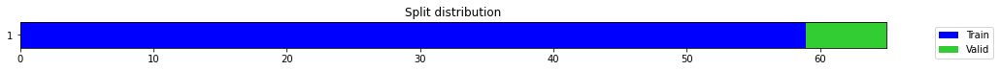

epoch,train_loss,valid_loss,mse,time
0,0.201366,0.105413,0.105413,00:00
1,0.227831,0.001051,0.001051,00:00
2,0.225029,0.003455,0.003455,00:00
3,0.223259,0.360928,0.360928,00:00
4,0.216428,0.794628,0.794628,00:00
5,0.196452,0.328030,0.328030,00:00
6,0.185273,0.841903,0.841903,00:00
7,0.175262,0.483041,0.483041,00:00
8,0.169932,2.088600,2.088600,00:00
9,0.187166,0.004958,0.004958,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.26050493121147156,
  "MSE_normalize": 0.06793025246377778,
  "RMSE_normalize": 0.2606343271017419,
  "MAPE_normalize": 0.26931566986991357,
  "MAE": 16803.61008286476,
  "MSE": 282641885.9095869,
  "RMSE": 16811.95663537076,
  "MAPE": 0.14239040278131385
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.7
2022-10-14 19:40:52.416662+07:00
PROGRESS: [ 195 / 1944 ]


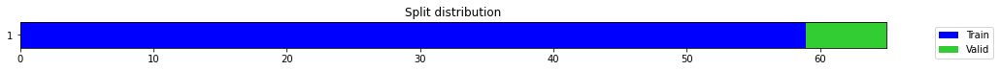

epoch,train_loss,valid_loss,mse,time
0,0.185443,0.249208,0.249208,00:00
1,0.198073,0.453145,0.453145,00:00
2,0.194738,0.273031,0.273031,00:00
3,0.181919,0.008310,0.008310,00:00
4,0.178466,0.005945,0.005945,00:00
5,0.184987,0.885579,0.885579,00:00
6,0.190609,0.066932,0.066932,00:00
7,0.191488,0.304443,0.304443,00:00
8,0.186944,7.287809,7.287809,00:00
9,0.195866,0.295403,0.295403,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.024160325527191162,
  "MSE_normalize": 0.0007256388638208952,
  "RMSE_normalize": 0.02693768482666792,
  "MAPE_normalize": 0.025256678253365045,
  "MAE": 1558.4376378059387,
  "MSE": 3019213.5244748318,
  "RMSE": 1737.5884220593873,
  "MAPE": 0.01328386496218606
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.7
2022-10-14 19:41:25.232477+07:00
PROGRESS: [ 196 / 1944 ]


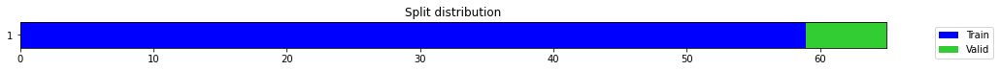

epoch,train_loss,valid_loss,mse,time
0,0.653289,0.878223,0.878223,00:00
1,0.619085,0.200622,0.200622,00:00
2,0.535303,0.005712,0.005712,00:00
3,0.482440,0.008438,0.008438,00:00
4,0.434819,0.006878,0.006878,00:00
5,0.386562,0.039401,0.039401,00:00
6,0.354460,0.192166,0.192166,00:00
7,0.346680,0.076896,0.076896,00:00
8,0.321553,0.122131,0.122131,00:00
9,0.297894,0.926652,0.926652,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07373025019963582,
  "MSE_normalize": 0.005447089345645158,
  "RMSE_normalize": 0.07380439922962016,
  "MAPE_normalize": 0.07631235991626976,
  "MAE": 4755.896058877309,
  "MSE": 22664064.23547605,
  "RMSE": 4760.678967907419,
  "MAPE": 0.04032520504869192
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.8
2022-10-14 19:42:28.333457+07:00
PROGRESS: [ 197 / 1944 ]


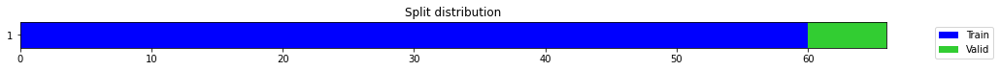

epoch,train_loss,valid_loss,mse,time
0,0.436781,0.017929,0.017929,00:00
1,0.355063,0.048242,0.048242,00:00
2,0.295810,1.289343,1.289343,00:00
3,0.386158,0.605117,0.605117,00:00
4,0.353223,1.040420,1.040420,00:00
5,0.324013,1.782448,1.782448,00:00
6,0.317191,0.426200,0.426200,00:00
7,0.288775,2.490778,2.490778,00:00
8,0.268140,1.804580,1.804580,00:00
9,0.266790,1.130441,1.130441,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 1.061081329981486,
  "MSE_normalize": 1.1304408226550073,
  "RMSE_normalize": 1.063221906591003,
  "MAPE_normalize": 1.0961577879767228,
  "MAE": 68443.99010912578,
  "MSE": 4703499758.002037,
  "RMSE": 68582.06586274605,
  "MAPE": 0.5797539945219409
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.8
2022-10-14 19:42:35.739633+07:00
PROGRESS: [ 198 / 1944 ]


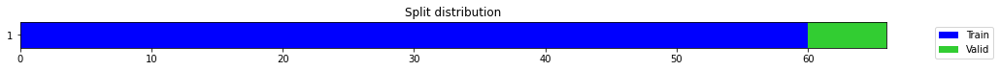

epoch,train_loss,valid_loss,mse,time
0,0.257018,0.002994,0.002994,00:00
1,0.246176,0.068344,0.068344,00:00
2,0.237505,0.450310,0.450310,00:00
3,0.231533,0.454112,0.454112,00:00
4,0.232997,0.005964,0.005964,00:00
5,0.254071,1.024782,1.024782,00:00
6,0.250596,1.564271,1.564271,00:00
7,0.257352,0.049733,0.049733,00:00
8,0.243757,1.094413,1.094413,00:00
9,0.248883,0.034272,0.034272,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2698461016019185,
  "MSE_normalize": 0.07454145387199773,
  "RMSE_normalize": 0.2730228083365889,
  "MAPE_normalize": 0.27820195023864164,
  "MAE": 17406.152937730152,
  "MSE": 310149548.05383974,
  "RMSE": 17611.063228943327,
  "MAPE": 0.1472810334465827
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.9
2022-10-14 19:42:52.864975+07:00
PROGRESS: [ 199 / 1944 ]


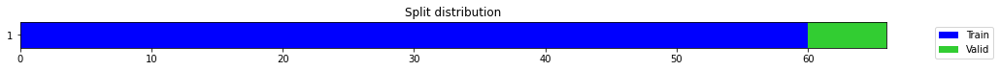

epoch,train_loss,valid_loss,mse,time
0,0.577174,0.469498,0.469498,00:00
1,0.359336,0.001388,0.001388,00:00
2,0.320676,0.083669,0.083669,00:00
3,0.302239,0.003186,0.003186,00:00
4,0.257982,0.282208,0.282208,00:00
5,0.256960,0.267836,0.267836,00:00
6,0.251894,0.085743,0.085743,00:00
7,0.244333,0.722201,0.722201,00:00
8,0.232370,0.173322,0.173322,00:00
9,0.219268,0.000335,0.000335,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.23038828372955322,
  "MSE_normalize": 0.05317456440402898,
  "RMSE_normalize": 0.23059610665409982,
  "MAPE_normalize": 0.23811801595256724,
  "MAE": 14860.965853691101,
  "MSE": 221246920.48788705,
  "RMSE": 14874.371263616054,
  "MAPE": 0.12591143253869472
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.9
2022-10-14 19:43:26.123578+07:00
PROGRESS: [ 200 / 1944 ]


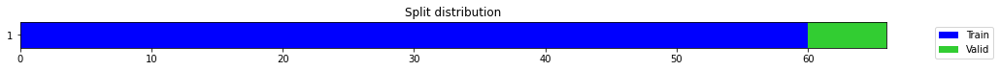

epoch,train_loss,valid_loss,mse,time
0,0.233378,0.076305,0.076305,00:00
1,0.193659,0.041854,0.041854,00:00
2,0.165759,0.007267,0.007267,00:00
3,0.151304,0.005623,0.005623,00:00
4,0.162225,0.018657,0.018657,00:00
5,0.160556,0.511648,0.511648,00:00
6,0.168444,0.228116,0.228116,00:00
7,0.163388,0.089941,0.089941,00:00
8,0.160726,0.064648,0.064648,00:00
9,0.156168,0.004292,0.004292,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09364445010821025,
  "MSE_normalize": 0.00892891233295797,
  "RMSE_normalize": 0.09449292213154363,
  "MAPE_normalize": 0.09716638959697042,
  "MAE": 6040.441609779994,
  "MSE": 37151114.99481479,
  "RMSE": 6095.17144917309,
  "MAPE": 0.051284567792052066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.9
2022-10-14 19:44:31.924067+07:00
PROGRESS: [ 201 / 1944 ]


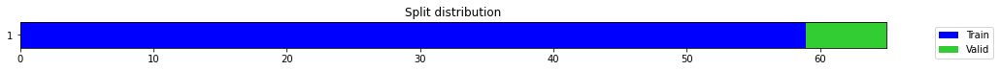

epoch,train_loss,valid_loss,mse,time
0,0.381681,0.024759,0.024759,00:00
1,0.295692,0.079590,0.079590,00:00
2,0.284467,0.000759,0.000759,00:00
3,0.268250,0.019762,0.019762,00:00
4,0.232540,0.004883,0.004883,00:00
5,0.218121,0.140702,0.140702,00:00
6,0.205023,0.030521,0.030521,00:00
7,0.187983,0.808386,0.808386,00:00
8,0.179932,0.790291,0.790291,00:00
9,0.181754,0.707720,0.707720,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.8402421176433563,
  "MSE_normalize": 0.7077201618982419,
  "RMSE_normalize": 0.8412610545474228,
  "MAPE_normalize": 0.8682942681701339,
  "MAE": 54198.977556467056,
  "MSE": 2944657998.4642234,
  "RMSE": 54264.70306252696,
  "MAPE": 0.45916888005524087
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.9
2022-10-14 19:44:37.909176+07:00
PROGRESS: [ 202 / 1944 ]


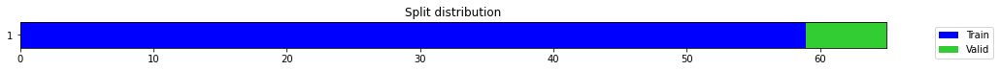

epoch,train_loss,valid_loss,mse,time
0,0.900458,0.134373,0.134373,00:00
1,0.742395,0.091084,0.091084,00:00
2,0.553778,0.234674,0.234674,00:00
3,0.473364,0.005303,0.005303,00:00
4,0.445932,4.042701,4.042701,00:00
5,0.448543,3.925355,3.925355,00:00
6,0.438625,0.490745,0.490745,00:00
7,0.401370,5.486771,5.486771,00:00
8,0.375966,4.889863,4.889863,00:00
9,0.354868,3.066630,3.066630,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.21990195910135904,
  "MSE_normalize": 0.04837812222483014,
  "RMSE_normalize": 0.2199502721635737,
  "MAPE_normalize": 0.22740379489691495,
  "MAE": 14184.555969874064,
  "MSE": 201290046.8709676,
  "RMSE": 14187.672355639159,
  "MAPE": 0.12021507208087746
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:44:52.099752+07:00
PROGRESS: [ 203 / 1944 ]


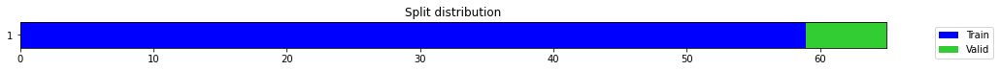

epoch,train_loss,valid_loss,mse,time
0,0.548977,0.210283,0.210283,00:00
1,0.423811,0.000810,0.000810,00:00
2,0.343801,0.018772,0.018772,00:00
3,0.290490,0.029887,0.029887,00:00
4,0.255718,0.015209,0.015209,00:00
5,0.265261,0.472356,0.472356,00:00
6,0.251056,0.800532,0.800532,00:00
7,0.242638,0.068840,0.068840,00:00
8,0.223637,1.217551,1.217551,00:00
9,0.217516,0.064330,0.064330,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03782572348912557,
  "MSE_normalize": 0.0016957845817131556,
  "RMSE_normalize": 0.041179905071687034,
  "MAPE_normalize": 0.039498621262472,
  "MAE": 2439.910467942556,
  "MSE": 7055762.858048872,
  "RMSE": 2656.2685967441003,
  "MAPE": 0.020785239040468417
}
Percent CPU Usage: 100.0
Percent Ram Usage: 12.9
2022-10-14 19:45:20.235673+07:00
PROGRESS: [ 204 / 1944 ]


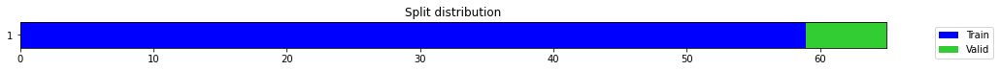

epoch,train_loss,valid_loss,mse,time
0,0.609306,0.134181,0.134181,00:00
1,0.542508,0.055119,0.055119,00:00
2,0.446013,0.002088,0.002088,00:00
3,0.387941,0.144353,0.144353,00:00
4,0.338062,0.127752,0.127752,00:00
5,0.313276,0.037004,0.037004,00:00
6,0.302415,1.188070,1.188070,00:00
7,0.280311,1.618721,1.618721,00:00
8,0.265218,3.197534,3.197534,00:00
9,0.258789,5.072756,5.072756,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1317257285118103,
  "MSE_normalize": 0.017374359950930323,
  "RMSE_normalize": 0.13181183539777572,
  "MAPE_normalize": 0.13617920879603476,
  "MAE": 8496.836391925812,
  "MSE": 72290646.4335823,
  "RMSE": 8502.390630498125,
  "MAPE": 0.07199998448303223
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:46:02.796475+07:00
PROGRESS: [ 205 / 1944 ]


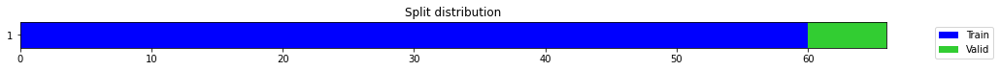

epoch,train_loss,valid_loss,mse,time
0,0.496488,0.027726,0.027726,00:00
1,0.451719,0.055693,0.055693,00:00
2,0.389234,0.296695,0.296695,00:00
3,0.384976,1.069893,1.069893,00:00
4,0.373623,2.564961,2.564961,00:00
5,0.354682,1.442368,1.442368,00:00
6,0.325437,6.705110,6.705110,00:00
7,0.311279,0.875109,0.875109,00:00
8,0.280339,0.008680,0.008680,00:00
9,0.267993,0.015285,0.015285,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12335288524627686,
  "MSE_normalize": 0.015284862247470462,
  "RMSE_normalize": 0.12363196288771955,
  "MAPE_normalize": 0.12779569069179744,
  "MAE": 7956.754509925842,
  "MSE": 63596735.398516476,
  "RMSE": 7974.756134109461,
  "MAPE": 0.0674996036564678
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:46:08.265561+07:00
PROGRESS: [ 206 / 1944 ]


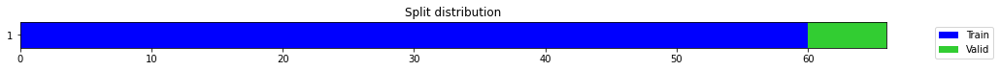

epoch,train_loss,valid_loss,mse,time
0,0.274927,0.192095,0.192095,00:00
1,0.208082,0.507468,0.507468,00:00
2,0.287973,0.469247,0.469247,00:00
3,0.292950,0.140161,0.140161,00:00
4,0.284540,0.092822,0.092822,00:00
5,0.253533,1.103454,1.103454,00:00
6,0.243040,3.594241,3.594241,00:00
7,0.251543,0.267091,0.267091,00:00
8,0.248918,0.671229,0.671229,00:00
9,0.240988,0.132568,0.132568,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3246937096118927,
  "MSE_normalize": 0.1054559916808812,
  "RMSE_normalize": 0.3247398831078209,
  "MAPE_normalize": 0.336022973787039,
  "MAE": 20944.043044805527,
  "MSE": 438777706.36938924,
  "RMSE": 20947.021419986882,
  "MAPE": 0.17757278553199848
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:46:22.425776+07:00
PROGRESS: [ 207 / 1944 ]


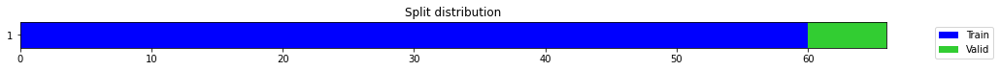

epoch,train_loss,valid_loss,mse,time
0,0.304514,0.359629,0.359629,00:00
1,0.277001,0.049513,0.049513,00:00
2,0.219552,0.001003,0.001003,00:00
3,0.240905,0.006479,0.006479,00:00
4,0.229870,0.008976,0.008976,00:00
5,0.209858,0.090887,0.090887,00:00
6,0.201896,0.195096,0.195096,00:00
7,0.195478,0.099488,0.099488,00:00
8,0.208266,1.843364,1.843364,00:00
9,0.235891,1.285562,1.285562,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13390756646792093,
  "MSE_normalize": 0.018172322610589358,
  "RMSE_normalize": 0.13480475737372682,
  "MAPE_normalize": 0.13888447227371026,
  "MAE": 8637.573667446772,
  "MSE": 75610782.3499286,
  "RMSE": 8695.446069634876,
  "MAPE": 0.07331821204324027
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:46:49.590138+07:00
PROGRESS: [ 208 / 1944 ]


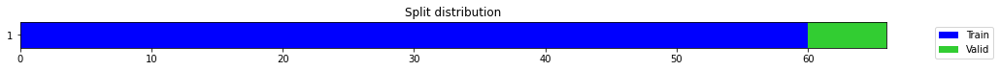

epoch,train_loss,valid_loss,mse,time
0,0.256416,0.002193,0.002193,00:00
1,0.193845,0.103909,0.103909,00:00
2,0.181635,0.029571,0.029571,00:00
3,0.182177,0.005828,0.005828,00:00
4,0.165869,0.072677,0.072677,00:00
5,0.167301,0.465182,0.465182,00:00
6,0.171335,0.544676,0.544676,00:00
7,0.169652,0.106535,0.106535,00:00
8,0.176293,0.106364,0.106364,00:00
9,0.173792,0.170422,0.170422,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1244646708170573,
  "MSE_normalize": 0.015496352886291476,
  "RMSE_normalize": 0.1244843479570483,
  "MAPE_normalize": 0.1287488046742945,
  "MAE": 8028.469126383464,
  "MSE": 64476698.461225085,
  "RMSE": 8029.738380621444,
  "MAPE": 0.06805242702467718
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:47:42.881794+07:00
PROGRESS: [ 209 / 1944 ]


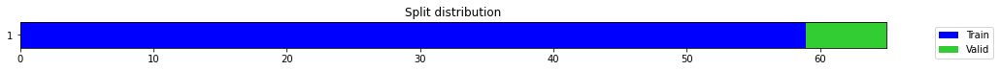

epoch,train_loss,valid_loss,mse,time
0,0.349138,0.067771,0.067771,00:00
1,0.277401,0.563482,0.563482,00:00
2,0.245706,3.766235,3.766235,00:00
3,0.214343,0.182307,0.182307,00:00
4,0.210020,2.635109,2.635109,00:00
5,0.209241,0.006498,0.006498,00:00
6,0.220147,0.819349,0.819349,00:00
7,0.218321,0.228463,0.228463,00:00
8,0.211612,0.260986,0.260986,00:00
9,0.205255,0.152066,0.152066,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.38926639159520465,
  "MSE_normalize": 0.15206580975213177,
  "RMSE_normalize": 0.3899561638852908,
  "MAPE_normalize": 0.40218147202687654,
  "MAE": 25109.23932345708,
  "MSE": 632710253.4121913,
  "RMSE": 25153.732395256797,
  "MAPE": 0.21270061483340533
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:47:48.938385+07:00
PROGRESS: [ 210 / 1944 ]


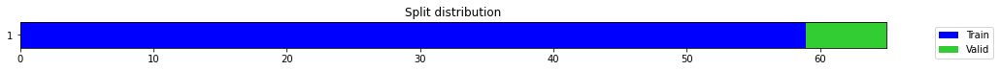

epoch,train_loss,valid_loss,mse,time
0,0.180297,0.291972,0.291972,00:00
1,0.188283,0.325792,0.325792,00:00
2,0.158052,2.618289,2.618289,00:00
3,0.149959,0.942175,0.942175,00:00
4,0.177575,0.483957,0.483957,00:00
5,0.199262,5.055787,5.055787,00:00
6,0.213703,6.019559,6.019559,00:00
7,0.207935,3.227327,3.227327,00:00
8,0.203475,0.455570,0.455570,00:00
9,0.197881,16.359465,16.359465,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2898649573326111,
  "MSE_normalize": 0.08406727614108433,
  "RMSE_normalize": 0.2899435740641346,
  "MAPE_normalize": 0.30001349981900505,
  "MAE": 18697.449207782745,
  "MSE": 349784265.62551135,
  "RMSE": 18702.52030143294,
  "MAPE": 0.15853473543906874
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.0
2022-10-14 19:48:03.356160+07:00
PROGRESS: [ 211 / 1944 ]


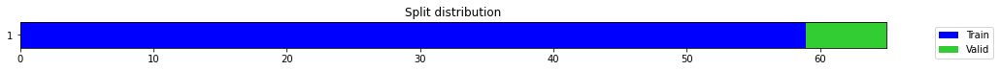

epoch,train_loss,valid_loss,mse,time
0,0.315427,0.240146,0.240146,00:00
1,0.338700,0.278440,0.278440,00:00
2,0.288766,0.288987,0.288987,00:00
3,0.279586,0.661221,0.661221,00:00
4,0.262387,0.388905,0.388905,00:00
5,0.248510,1.577163,1.577163,00:00
6,0.236240,0.025427,0.025427,00:00
7,0.223498,1.729700,1.729700,00:00
8,0.210787,3.731933,3.731933,00:00
9,0.209010,0.018237,0.018237,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07712686061859131,
  "MSE_normalize": 0.006298333803758993,
  "RMSE_normalize": 0.07936204258812266,
  "MAPE_normalize": 0.0793660083002821,
  "MAE": 4974.991017341614,
  "MSE": 26205893.248104427,
  "RMSE": 5119.169195104263,
  "MAPE": 0.04205387856241494
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:48:30.522015+07:00
PROGRESS: [ 212 / 1944 ]


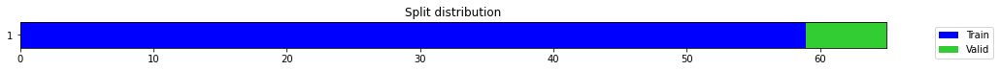

epoch,train_loss,valid_loss,mse,time
0,0.236826,0.052517,0.052517,00:00
1,0.189302,0.144070,0.144070,00:00
2,0.191928,0.223634,0.223634,00:00
3,0.187477,0.102109,0.102109,00:00
4,0.192451,0.060059,0.060059,00:00
5,0.172227,0.027000,0.027000,00:00
6,0.165319,0.218707,0.218707,00:00
7,0.163289,0.472033,0.472033,00:00
8,0.162069,0.003969,0.003969,00:00
9,0.163354,0.263059,0.263059,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12770394484202066,
  "MSE_normalize": 0.016472498046580835,
  "RMSE_normalize": 0.12834522993310205,
  "MAPE_normalize": 0.13181574016197184,
  "MAE": 8237.4152580897,
  "MSE": 68538210.07083993,
  "RMSE": 8278.780711604815,
  "MAPE": 0.0697442715545243
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:49:22.106778+07:00
PROGRESS: [ 213 / 1944 ]


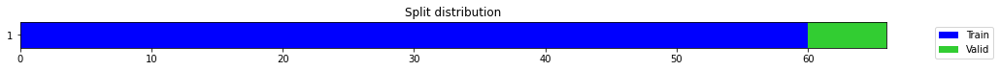

epoch,train_loss,valid_loss,mse,time
0,0.115890,0.070718,0.070718,00:00
1,0.178329,0.091936,0.091936,00:00
2,0.401812,1.178270,1.178270,00:00
3,0.378538,0.829337,0.829337,00:00
4,0.358936,0.511389,0.511389,00:00
5,0.352311,5.339359,5.339359,00:00
6,0.335771,0.443739,0.443739,00:00
7,0.309890,1.615250,1.615250,00:00
8,0.306048,0.929456,0.929456,00:00
9,0.287468,0.730509,0.730509,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.854254728804032,
  "MSE_normalize": 0.7305094792786861,
  "RMSE_normalize": 0.8546984727251395,
  "MAPE_normalize": 0.8831144353931509,
  "MAE": 55102.84702677528,
  "MSE": 3039479015.7486134,
  "RMSE": 55131.4702846624,
  "MAPE": 0.4669213802439817
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:49:30.317641+07:00
PROGRESS: [ 214 / 1944 ]


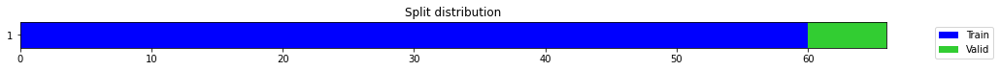

epoch,train_loss,valid_loss,mse,time
0,0.308159,0.025529,0.025529,00:00
1,0.237978,0.005868,0.005868,00:00
2,0.231574,1.962565,1.962565,00:00
3,0.262806,0.010595,0.010595,00:00
4,0.246756,0.608325,0.608325,00:00
5,0.236194,0.010976,0.010976,00:00
6,0.231943,1.706091,1.706091,00:00
7,0.237805,9.351387,9.351387,00:00
8,0.233392,0.084428,0.084428,00:00
9,0.229716,2.462865,2.462865,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.014154364665349325,
  "MSE_normalize": 0.00024084970782152956,
  "RMSE_normalize": 0.015519333356221509,
  "MAPE_normalize": 0.01463722715550442,
  "MAE": 913.0131383736929,
  "MSE": 1002119.2792673496,
  "RMSE": 1001.0590788097122,
  "MAPE": 0.007737447736925321
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:49:49.522433+07:00
PROGRESS: [ 215 / 1944 ]


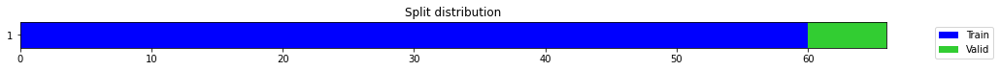

epoch,train_loss,valid_loss,mse,time
0,0.294711,0.245649,0.245649,00:00
1,0.261642,0.028892,0.028892,00:00
2,0.230002,0.003768,0.003768,00:00
3,0.209530,0.301625,0.301625,00:00
4,0.190785,0.330837,0.330837,00:00
5,0.191161,0.134277,0.134277,00:00
6,0.187039,0.255776,0.255776,00:00
7,0.183432,5.122490,5.122490,00:00
8,0.224327,4.923406,4.923406,00:00
9,0.227018,0.371538,0.371538,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.23960680762926737,
  "MSE_normalize": 0.057422643556965504,
  "RMSE_normalize": 0.2396302225449985,
  "MAPE_normalize": 0.24793453188591397,
  "MAE": 15455.597519318262,
  "MSE": 238922183.86070347,
  "RMSE": 15457.107875042584,
  "MAPE": 0.13103013509527026
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.3
2022-10-14 19:50:27.226295+07:00
PROGRESS: [ 216 / 1944 ]


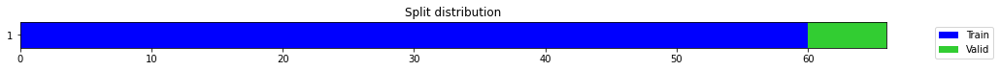

epoch,train_loss,valid_loss,mse,time
0,0.302108,0.005880,0.005880,00:00
1,0.229961,0.101513,0.101513,00:00
2,0.219923,0.552338,0.552338,00:00
3,0.202846,0.666906,0.666906,00:00
4,0.198576,0.295704,0.295704,00:00
5,0.183280,0.012881,0.012881,00:00
6,0.198947,0.018515,0.018515,00:00
7,0.193840,0.235274,0.235274,00:00
8,0.192622,0.076424,0.076424,00:00
9,0.191943,0.118198,0.118198,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10361948609352112,
  "MSE_normalize": 0.010822477428919916,
  "RMSE_normalize": 0.10403113682412547,
  "MAPE_normalize": 0.10698469982191143,
  "MAE": 6683.871330976486,
  "MSE": 45029796.29517704,
  "RMSE": 6710.42444970339,
  "MAPE": 0.05659883428379749
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:51:36.284453+07:00
PROGRESS: [ 217 / 1944 ]


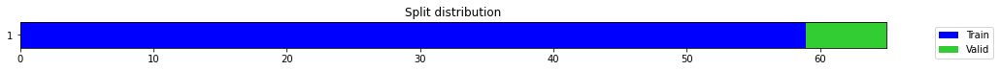

epoch,train_loss,valid_loss,mse,time
0,0.386285,0.495811,0.495811,00:00
1,0.289987,0.004353,0.004353,00:00
2,0.245079,0.108207,0.108207,00:00
3,0.217219,0.094597,0.094597,00:00
4,0.187045,0.599841,0.599841,00:00
5,0.162668,1.756072,1.756072,00:00
6,0.153418,1.156496,1.156496,00:00
7,0.137022,0.524211,0.524211,00:00
8,0.125673,0.319003,0.319003,00:00
9,0.121124,0.282814,0.282814,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5315892497698466,
  "MSE_normalize": 0.282814017434486,
  "RMSE_normalize": 0.5318026113460576,
  "MAPE_normalize": 0.5495993525305535,
  "MAE": 34289.63296715418,
  "MSE": 1176722952.589841,
  "RMSE": 34303.3956422661,
  "MAPE": 0.29057204997779507
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:51:38.010414+07:00
PROGRESS: [ 218 / 1944 ]


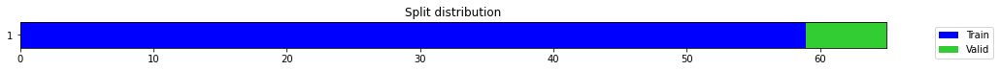

epoch,train_loss,valid_loss,mse,time
0,0.222382,0.267623,0.267623,00:00
1,0.223330,0.096373,0.096373,00:00
2,0.191591,0.000767,0.000767,00:00
3,0.163328,0.008541,0.008541,00:00
4,0.143677,0.000648,0.000648,00:00
5,0.135756,0.332898,0.332898,00:00
6,0.123898,0.219183,0.219183,00:00
7,0.116952,0.368882,0.368882,00:00
8,0.108437,0.016877,0.016877,00:00
9,0.103980,0.017772,0.017772,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2338046133518219,
  "MSE_normalize": 0.05477121501955592,
  "RMSE_normalize": 0.2340325084674262,
  "MAPE_normalize": 0.24164221704577082,
  "MAE": 15081.33277964592,
  "MSE": 227890210.108397,
  "RMSE": 15096.03292618286,
  "MAPE": 0.1277766034961184
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:51:41.777290+07:00
PROGRESS: [ 219 / 1944 ]


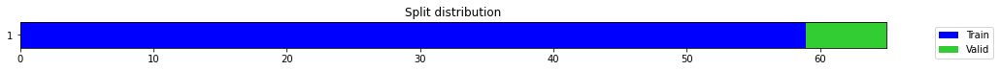

epoch,train_loss,valid_loss,mse,time
0,0.783567,4.142226,4.142226,00:00
1,0.809279,2.576344,2.576344,00:00
2,0.718553,1.393412,1.393412,00:00
3,0.648321,0.360442,0.360442,00:00
4,0.569030,0.002100,0.002100,00:00
5,0.485487,0.114914,0.114914,00:00
6,0.423290,0.207923,0.207923,00:00
7,0.370525,0.133229,0.133229,00:00
8,0.331560,0.149220,0.149220,00:00
9,0.303003,0.003179,0.003179,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2030823528766632,
  "MSE_normalize": 0.04125557647906971,
  "RMSE_normalize": 0.20311468799441784,
  "MAPE_normalize": 0.21013537168468996,
  "MAE": 13099.624089956284,
  "MSE": 171654800.58460218,
  "RMSE": 13101.709834391928,
  "MAPE": 0.11105508658973982
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:51:49.225012+07:00
PROGRESS: [ 220 / 1944 ]


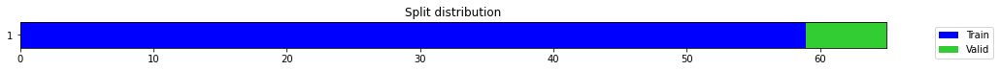

epoch,train_loss,valid_loss,mse,time
0,0.354681,1.477149,1.477149,00:00
1,0.318458,1.032369,1.032369,00:00
2,0.296496,0.612397,0.612397,00:00
3,0.277161,0.260855,0.260855,00:00
4,0.250009,0.047875,0.047875,00:00
5,0.237720,0.005194,0.005194,00:00
6,0.216742,0.079744,0.079744,00:00
7,0.206040,0.100993,0.100993,00:00
8,0.191688,0.040986,0.040986,00:00
9,0.181324,0.010089,0.010089,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20121405522028604,
  "MSE_normalize": 0.04050164548852445,
  "RMSE_normalize": 0.20125020618256384,
  "MAPE_normalize": 0.2082264225295549,
  "MAE": 12979.11141792933,
  "MSE": 168517870.1407323,
  "RMSE": 12981.443299600098,
  "MAPE": 0.1100402218242678
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:52:03.701492+07:00
PROGRESS: [ 221 / 1944 ]


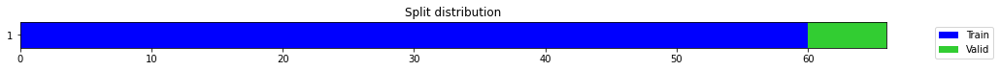

epoch,train_loss,valid_loss,mse,time
0,0.325612,0.448854,0.448854,00:00
1,0.260907,0.062932,0.062932,00:00
2,0.226833,0.007872,0.007872,00:00
3,0.185530,0.121590,0.121590,00:00
4,0.165377,0.538626,0.538626,00:00
5,0.144644,0.164172,0.164172,00:00
6,0.126557,0.012267,0.012267,00:00
7,0.118052,0.005901,0.005901,00:00
8,0.108355,0.017945,0.017945,00:00
9,0.102684,0.019562,0.019562,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1386517882347107,
  "MSE_normalize": 0.01956171194945,
  "RMSE_normalize": 0.13986319011609166,
  "MAPE_normalize": 0.14384439424259557,
  "MAE": 8943.594948291779,
  "MSE": 81391706.29405268,
  "RMSE": 9021.735215248376,
  "MAPE": 0.07592692217231543
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.1
2022-10-14 19:52:05.456894+07:00
PROGRESS: [ 222 / 1944 ]


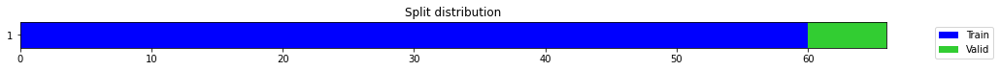

epoch,train_loss,valid_loss,mse,time
0,0.524707,0.919276,0.919276,00:00
1,0.423030,0.494035,0.494035,00:00
2,0.321080,0.032748,0.032748,00:00
3,0.253613,0.069717,0.069717,00:00
4,0.221733,0.101167,0.101167,00:00
5,0.191672,0.008452,0.008452,00:00
6,0.169767,0.057070,0.057070,00:00
7,0.153380,0.074601,0.074601,00:00
8,0.139425,0.004838,0.004838,00:00
9,0.127694,0.000912,0.000912,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09117324153582256,
  "MSE_normalize": 0.00851195305347415,
  "RMSE_normalize": 0.09226024633326181,
  "MAPE_normalize": 0.09464769354273345,
  "MAE": 5881.038772026698,
  "MSE": 35416244.99468267,
  "RMSE": 5951.15492948072,
  "MAPE": 0.0499440328957702
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:52:09.540575+07:00
PROGRESS: [ 223 / 1944 ]


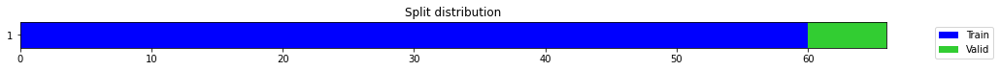

epoch,train_loss,valid_loss,mse,time
0,0.114271,0.004375,0.004375,00:00
1,0.084153,0.001450,0.001450,00:00
2,0.085892,0.003328,0.003328,00:00
3,0.086648,0.001228,0.001228,00:00
4,0.084848,0.022843,0.022843,00:00
5,0.083263,0.007997,0.007997,00:00
6,0.078639,0.004453,0.004453,00:00
7,0.077201,0.152854,0.152854,00:00
8,0.075100,0.004784,0.004784,00:00
9,0.072778,0.007797,0.007797,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3351023693879445,
  "MSE_normalize": 0.11245180822262964,
  "RMSE_normalize": 0.33533834886965974,
  "MAPE_normalize": 0.34638427194646776,
  "MAE": 21615.443234999973,
  "MSE": 467885662.0904668,
  "RMSE": 21630.664855488532,
  "MAPE": 0.18315042694105066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.2
2022-10-14 19:52:17.741780+07:00
PROGRESS: [ 224 / 1944 ]


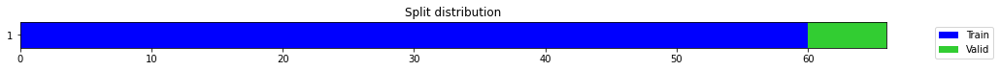

epoch,train_loss,valid_loss,mse,time
0,0.473697,0.304972,0.304972,00:00
1,0.396070,0.267146,0.267146,00:00
2,0.368725,0.194464,0.194464,00:00
3,0.334260,0.089840,0.089840,00:00
4,0.296324,0.010412,0.010412,00:00
5,0.262181,0.027157,0.027157,00:00
6,0.234731,0.199222,0.199222,00:00
7,0.210115,0.293964,0.293964,00:00
8,0.202935,0.266945,0.266945,00:00
9,0.194086,0.149831,0.149831,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.17733683188756308,
  "MSE_normalize": 0.031499203777277295,
  "RMSE_normalize": 0.1774801503754076,
  "MAPE_normalize": 0.18329545603992523,
  "MAE": 11438.935004075369,
  "MSE": 131060816.6075542,
  "RMSE": 11448.179619815292,
  "MAPE": 0.09692025224572078
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.4
2022-10-14 19:52:32.578627+07:00
PROGRESS: [ 225 / 1944 ]


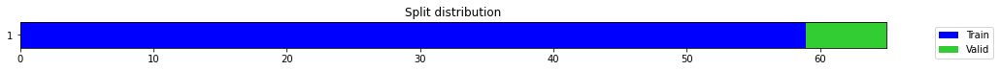

epoch,train_loss,valid_loss,mse,time
0,0.270561,0.067697,0.067697,00:00
1,0.206722,0.048353,0.048353,00:00
2,0.165860,0.004775,0.004775,00:00
3,0.147105,0.216666,0.216666,00:00
4,0.132733,0.327351,0.327351,00:00
5,0.127254,0.165806,0.165806,00:00
6,0.119261,0.419626,0.419626,00:00
7,0.109831,0.379243,0.379243,00:00
8,0.104165,0.280714,0.280714,00:00
9,0.098223,0.205809,0.205809,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4533565938472748,
  "MSE_normalize": 0.20580945707146667,
  "RMSE_normalize": 0.45366227203886667,
  "MAPE_normalize": 0.46862759820366623,
  "MAE": 29243.313729524612,
  "MSE": 856324994.7543693,
  "RMSE": 29263.031195595053,
  "MAPE": 0.24778463772150228
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.4
2022-10-14 19:52:34.296604+07:00
PROGRESS: [ 226 / 1944 ]


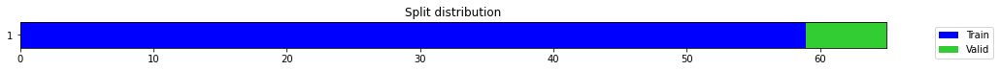

epoch,train_loss,valid_loss,mse,time
0,0.297971,0.524442,0.524442,00:00
1,0.244163,0.179993,0.179993,00:00
2,0.229831,0.000534,0.000534,00:00
3,0.197880,0.000806,0.000806,00:00
4,0.172975,0.205548,0.205548,00:00
5,0.153295,0.094142,0.094142,00:00
6,0.143323,0.425423,0.425423,00:00
7,0.131615,0.763122,0.763122,00:00
8,0.123847,0.202406,0.202406,00:00
9,0.114252,0.120479,0.120479,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3325141767660777,
  "MSE_normalize": 0.1106874397707281,
  "RMSE_normalize": 0.33269721936128066,
  "MAPE_normalize": 0.34374328927789444,
  "MAE": 21448.494458119076,
  "MSE": 460544537.79609233,
  "RMSE": 21460.30143768005,
  "MAPE": 0.1817454435271497
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.4
2022-10-14 19:52:38.161127+07:00
PROGRESS: [ 227 / 1944 ]


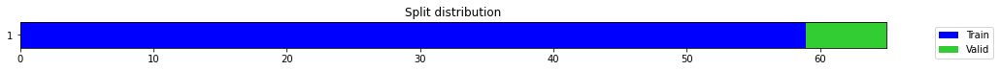

epoch,train_loss,valid_loss,mse,time
0,0.543355,5.686914,5.686914,00:00
1,0.581101,3.536691,3.536691,00:00
2,0.516929,1.639989,1.639989,00:00
3,0.459525,0.224622,0.224622,00:00
4,0.386899,0.099798,0.099798,00:00
5,0.343456,0.390812,0.390812,00:00
6,0.305870,0.389510,0.389510,00:00
7,0.275253,0.023108,0.023108,00:00
8,0.258502,0.061779,0.061779,00:00
9,0.241019,0.072576,0.072576,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18386679887771606,
  "MSE_normalize": 0.03386651279427966,
  "RMSE_normalize": 0.18402856515845484,
  "MAPE_normalize": 0.19037560233020723,
  "MAE": 11860.143994808197,
  "MSE": 140910635.51486802,
  "RMSE": 11870.578566980972,
  "MAPE": 0.10058149036261697
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.4
2022-10-14 19:52:46.028695+07:00
PROGRESS: [ 228 / 1944 ]


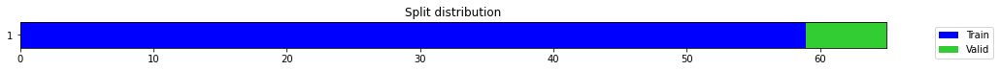

epoch,train_loss,valid_loss,mse,time
0,0.417211,0.922238,0.922238,00:00
1,0.366884,0.712888,0.712888,00:00
2,0.321759,0.512522,0.512522,00:00
3,0.308804,0.303125,0.303125,00:00
4,0.283021,0.098839,0.098839,00:00
5,0.247702,0.004328,0.004328,00:00
6,0.231484,0.019417,0.019417,00:00
7,0.208322,0.049795,0.049795,00:00
8,0.199376,0.022261,0.022261,00:00
9,0.184269,0.002955,0.002955,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16280399759610495,
  "MSE_normalize": 0.026513070865071004,
  "RMSE_normalize": 0.16282834785463804,
  "MAPE_normalize": 0.16843284235239644,
  "MAE": 10501.509060939154,
  "MSE": 110314684.23518716,
  "RMSE": 10503.079750015571,
  "MAPE": 0.0890218844243892
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.5
2022-10-14 19:53:01.470423+07:00
PROGRESS: [ 229 / 1944 ]


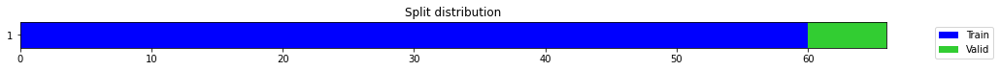

epoch,train_loss,valid_loss,mse,time
0,0.559604,1.309111,1.309111,00:00
1,0.406243,0.019110,0.019110,00:00
2,0.319384,0.165637,0.165637,00:00
3,0.281278,0.034157,0.034157,00:00
4,0.235583,0.130900,0.130900,00:00
5,0.212885,0.024324,0.024324,00:00
6,0.182420,0.002412,0.002412,00:00
7,0.159789,0.015336,0.015336,00:00
8,0.152091,0.013957,0.013957,00:00
9,0.138483,0.012725,0.012725,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10969499746958415,
  "MSE_normalize": 0.012724501566967916,
  "RMSE_normalize": 0.11280293243957763,
  "MAPE_normalize": 0.11287167912714872,
  "MAE": 7075.766116778056,
  "MSE": 52943673.69037885,
  "RMSE": 7276.240354082515,
  "MAPE": 0.059809795698046474
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.5
2022-10-14 19:53:03.395743+07:00
PROGRESS: [ 230 / 1944 ]


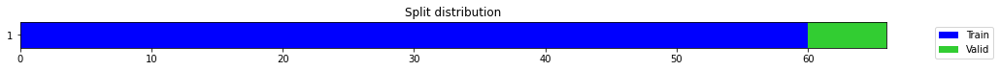

epoch,train_loss,valid_loss,mse,time
0,0.704774,1.615461,1.615461,00:00
1,0.642493,0.850972,0.850972,00:00
2,0.492899,0.054108,0.054108,00:00
3,0.383175,0.377250,0.377250,00:00
4,0.345741,0.723875,0.723875,00:00
5,0.297447,0.202478,0.202478,00:00
6,0.257345,0.001878,0.001878,00:00
7,0.231264,0.106045,0.106045,00:00
8,0.209216,0.091165,0.091165,00:00
9,0.187119,0.025603,0.025603,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09920490781466167,
  "MSE_normalize": 0.010424836159717307,
  "RMSE_normalize": 0.10210208695084204,
  "MAPE_normalize": 0.10207141010568221,
  "MAE": 6399.113373676936,
  "MSE": 43375304.01571972,
  "RMSE": 6585.993016677115,
  "MAPE": 0.05408827332759924
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.6
2022-10-14 19:53:07.802603+07:00
PROGRESS: [ 231 / 1944 ]


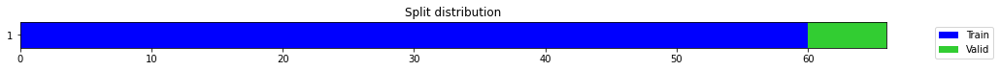

epoch,train_loss,valid_loss,mse,time
0,0.345022,0.770556,0.770556,00:00
1,0.305848,0.483976,0.483976,00:00
2,0.244343,0.194727,0.194727,00:00
3,0.219673,0.008626,0.008626,00:00
4,0.197028,0.007554,0.007554,00:00
5,0.191660,0.006870,0.006870,00:00
6,0.187046,0.051982,0.051982,00:00
7,0.173445,0.353944,0.353944,00:00
8,0.162781,0.710290,0.710290,00:00
9,0.152794,0.115449,0.115449,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.23146772384643555,
  "MSE_normalize": 0.053610191777134254,
  "RMSE_normalize": 0.23153874789575557,
  "MAPE_normalize": 0.23933962266519515,
  "MAE": 14930.594058990479,
  "MSE": 223059464.0575429,
  "RMSE": 14935.175394267819,
  "MAPE": 0.1265309525344065
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.6
2022-10-14 19:53:16.004632+07:00
PROGRESS: [ 232 / 1944 ]


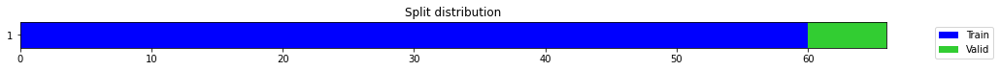

epoch,train_loss,valid_loss,mse,time
0,0.241876,0.805430,0.805430,00:00
1,0.225482,0.699529,0.699529,00:00
2,0.205343,0.518056,0.518056,00:00
3,0.168832,0.293980,0.293980,00:00
4,0.148068,0.098718,0.098718,00:00
5,0.132340,0.001440,0.001440,00:00
6,0.126615,0.050157,0.050157,00:00
7,0.124809,0.119408,0.119408,00:00
8,0.124269,0.055163,0.055163,00:00
9,0.117612,0.056920,0.056920,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12726524472236633,
  "MSE_normalize": 0.01630872604608946,
  "RMSE_normalize": 0.12770562260953688,
  "MAPE_normalize": 0.1318960286553057,
  "MAE": 8209.117345571518,
  "MSE": 67856793.09682308,
  "RMSE": 8237.523480805568,
  "MAPE": 0.06965356123314288
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.6
2022-10-14 19:53:33.452765+07:00
PROGRESS: [ 233 / 1944 ]


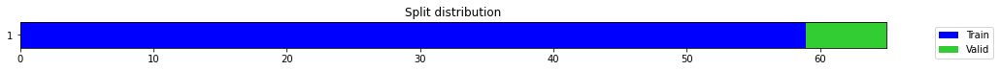

epoch,train_loss,valid_loss,mse,time
0,0.667884,2.074028,2.074028,00:00
1,0.497098,0.048723,0.048723,00:00
2,0.378929,0.051024,0.051024,00:00
3,0.309738,0.099352,0.099352,00:00
4,0.270190,0.164816,0.164816,00:00
5,0.235843,0.049146,0.049146,00:00
6,0.212035,0.028005,0.028005,00:00
7,0.199747,0.098604,0.098604,00:00
8,0.180633,0.152214,0.152214,00:00
9,0.165720,0.132675,0.132675,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3640287121136983,
  "MSE_normalize": 0.13267470906310663,
  "RMSE_normalize": 0.3642453967630979,
  "MAPE_normalize": 0.376322304064256,
  "MAE": 23481.308046181995,
  "MSE": 552028420.6524612,
  "RMSE": 23495.285072806866,
  "MAPE": 0.1989706696230075
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.6
2022-10-14 19:53:35.521834+07:00
PROGRESS: [ 234 / 1944 ]


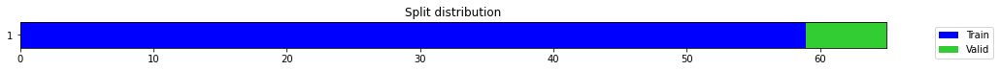

epoch,train_loss,valid_loss,mse,time
0,0.377476,0.089356,0.089356,00:00
1,0.292462,0.071536,0.071536,00:00
2,0.254991,0.320713,0.320713,00:00
3,0.216224,0.136498,0.136498,00:00
4,0.187729,0.926753,0.926753,00:00
5,0.172234,0.112419,0.112419,00:00
6,0.155074,1.014062,1.014062,00:00
7,0.141880,0.717488,0.717488,00:00
8,0.131696,1.721561,1.721561,00:00
9,0.125400,0.001982,0.001982,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1265471080938975,
  "MSE_normalize": 0.01603829089773671,
  "RMSE_normalize": 0.1266423740212442,
  "MAPE_normalize": 0.13098278913942504,
  "MAE": 8162.794660488765,
  "MSE": 66731575.72202504,
  "RMSE": 8168.939693866337,
  "MAPE": 0.0692132899661485
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.7
2022-10-14 19:53:40.636961+07:00
PROGRESS: [ 235 / 1944 ]


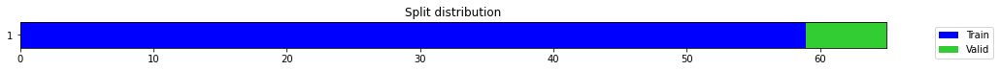

epoch,train_loss,valid_loss,mse,time
0,0.841480,3.360116,3.360116,00:00
1,0.741306,2.144630,2.144630,00:00
2,0.625344,0.727755,0.727755,00:00
3,0.514931,0.001141,0.001141,00:00
4,0.441724,0.487608,0.487608,00:00
5,0.396147,0.663557,0.663557,00:00
6,0.348182,0.152422,0.152422,00:00
7,0.303069,0.034933,0.034933,00:00
8,0.276683,0.079736,0.079736,00:00
9,0.251852,0.000272,0.000272,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.17279747128486633,
  "MSE_normalize": 0.02987023493205676,
  "RMSE_normalize": 0.17283007531114705,
  "MAPE_normalize": 0.17876929768096791,
  "MAE": 11146.128087759018,
  "MSE": 124283058.39523785,
  "RMSE": 11148.23117787023,
  "MAPE": 0.09448564990338372
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.7
2022-10-14 19:53:50.082332+07:00
PROGRESS: [ 236 / 1944 ]


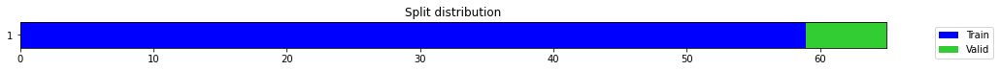

epoch,train_loss,valid_loss,mse,time
0,0.157715,0.084049,0.084049,00:00
1,0.135266,0.067683,0.067683,00:00
2,0.125403,0.047909,0.047909,00:00
3,0.123572,0.020961,0.020961,00:00
4,0.117481,0.009496,0.009496,00:00
5,0.108042,0.013746,0.013746,00:00
6,0.099619,0.015709,0.015709,00:00
7,0.101059,0.057409,0.057409,00:00
8,0.093596,0.081853,0.081853,00:00
9,0.090045,0.019453,0.019453,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07246166467666626,
  "MSE_normalize": 0.005278963863213211,
  "RMSE_normalize": 0.0726564784669145,
  "MAPE_normalize": 0.07506835563253711,
  "MAE": 4674.06721830368,
  "MSE": 21964533.441749603,
  "RMSE": 4686.633487029853,
  "MAPE": 0.03965063476996584
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.7
2022-10-14 19:54:08.594112+07:00
PROGRESS: [ 237 / 1944 ]


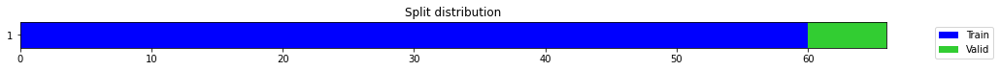

epoch,train_loss,valid_loss,mse,time
0,0.156411,0.118613,0.118613,00:00
1,0.129083,0.009517,0.009517,00:00
2,0.103265,0.014287,0.014287,00:00
3,0.091802,0.012894,0.012894,00:00
4,0.086661,0.045444,0.045444,00:00
5,0.078912,0.000445,0.000445,00:00
6,0.074500,0.051800,0.051800,00:00
7,0.073850,0.128115,0.128115,00:00
8,0.070994,0.112563,0.112563,00:00
9,0.073321,0.109547,0.109547,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.33058614532152814,
  "MSE_normalize": 0.10954663596048242,
  "RMSE_normalize": 0.3309783013438833,
  "MAPE_normalize": 0.34162856981125217,
  "MAE": 21324.12871781985,
  "MSE": 455797920.0714987,
  "RMSE": 21349.424349885845,
  "MAPE": 0.18065774270663426
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.8
2022-10-14 19:54:10.843791+07:00
PROGRESS: [ 238 / 1944 ]


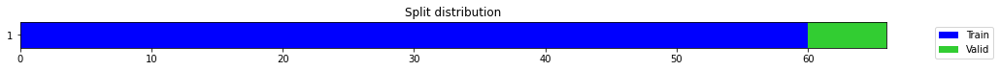

epoch,train_loss,valid_loss,mse,time
0,0.700548,0.598409,0.598409,00:00
1,0.608804,0.339092,0.339092,00:00
2,0.467991,0.022369,0.022369,00:00
3,0.378787,0.573501,0.573501,00:00
4,0.338862,0.486656,0.486656,00:00
5,0.289756,0.017761,0.017761,00:00
6,0.263675,0.294607,0.294607,00:00
7,0.235827,0.110963,0.110963,00:00
8,0.208036,0.010957,0.010957,00:00
9,0.189727,0.014969,0.014969,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3018673161665599,
  "MSE_normalize": 0.09120317151974137,
  "RMSE_normalize": 0.3019986283408277,
  "MAPE_normalize": 0.3120866622474563,
  "MAE": 19471.649362007778,
  "MSE": 379475056.61075896,
  "RMSE": 19480.11952249675,
  "MAPE": 0.16500154225049515
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.8
2022-10-14 19:54:16.150197+07:00
PROGRESS: [ 239 / 1944 ]


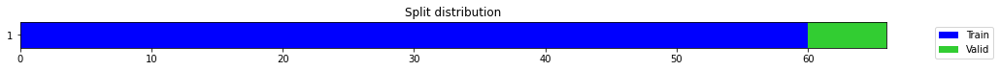

epoch,train_loss,valid_loss,mse,time
0,0.130233,0.332736,0.332736,00:00
1,0.119595,0.132868,0.132868,00:00
2,0.104559,0.018060,0.018060,00:00
3,0.093765,0.000833,0.000833,00:00
4,0.086300,0.003300,0.003300,00:00
5,0.089458,0.002248,0.002248,00:00
6,0.084380,0.014914,0.014914,00:00
7,0.084525,0.350178,0.350178,00:00
8,0.080602,0.044871,0.044871,00:00
9,0.076090,0.032904,0.032904,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10253978768984477,
  "MSE_normalize": 0.010607764970272271,
  "RMSE_normalize": 0.1029940045355664,
  "MAPE_normalize": 0.10629421361136515,
  "MAE": 6614.226465145747,
  "MSE": 44136427.99402412,
  "RMSE": 6643.525268562175,
  "MAPE": 0.056127645792501575
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.8
2022-10-14 19:54:26.633737+07:00
PROGRESS: [ 240 / 1944 ]


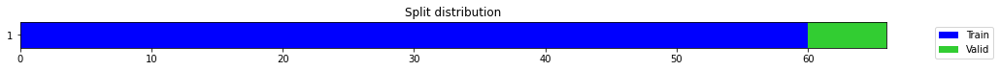

epoch,train_loss,valid_loss,mse,time
0,0.224987,1.114810,1.114810,00:00
1,0.199224,0.684447,0.684447,00:00
2,0.159565,0.334167,0.334167,00:00
3,0.138426,0.068989,0.068989,00:00
4,0.124379,0.003529,0.003529,00:00
5,0.113508,0.152457,0.152457,00:00
6,0.113531,0.291152,0.291152,00:00
7,0.112150,0.259776,0.259776,00:00
8,0.105306,0.090670,0.090670,00:00
9,0.101453,0.000414,0.000414,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.004883478085199992,
  "MSE_normalize": 3.318799856740403e-05,
  "RMSE_normalize": 0.005760902582703862,
  "MAPE_normalize": 0.0049952713936249555,
  "MAE": 315.0038704077403,
  "MSE": 138087.49657831134,
  "RMSE": 371.6012601947299,
  "MAPE": 0.0026543832565966096
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.9
2022-10-14 19:54:47.639367+07:00
PROGRESS: [ 241 / 1944 ]


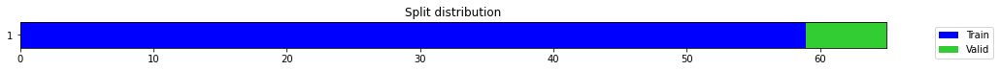

epoch,train_loss,valid_loss,mse,time
0,0.395456,0.255230,0.255230,00:00
1,0.265805,0.347104,0.347104,00:00
2,0.261027,0.018267,0.018267,00:00
3,0.233682,0.224844,0.224844,00:00
4,0.211709,2.603438,2.603438,00:00
5,0.196817,0.285763,0.285763,00:00
6,0.176497,0.012526,0.012526,00:00
7,0.159180,0.000651,0.000651,00:00
8,0.148130,0.009969,0.009969,00:00
9,0.141122,0.015638,0.015638,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1231388549009959,
  "MSE_normalize": 0.01563826698835591,
  "RMSE_normalize": 0.1250530566933728,
  "MAPE_normalize": 0.1278829566188823,
  "MAE": 7942.948696533839,
  "MSE": 65067169.83428594,
  "RMSE": 8066.422368949318,
  "MAPE": 0.06746869046803275
}
Percent CPU Usage: 100.0
Percent Ram Usage: 13.9
2022-10-14 19:54:49.888689+07:00
PROGRESS: [ 242 / 1944 ]


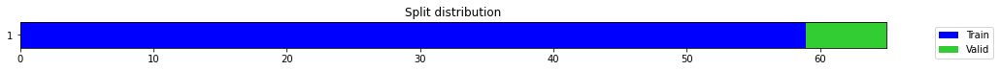

epoch,train_loss,valid_loss,mse,time
0,0.583493,0.868619,0.868619,00:00
1,0.389766,0.065335,0.065335,00:00
2,0.330743,0.142856,0.142856,00:00
3,0.263824,0.127546,0.127546,00:00
4,0.237834,0.016661,0.016661,00:00
5,0.214673,0.025547,0.025547,00:00
6,0.192443,1.018761,1.018761,00:00
7,0.174452,0.166454,0.166454,00:00
8,0.159896,0.028133,0.028133,00:00
9,0.145009,0.069123,0.069123,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.30486878752708435,
  "MSE_normalize": 0.09297264737493964,
  "RMSE_normalize": 0.3049141639460844,
  "MAPE_normalize": 0.3152877195231931,
  "MAE": 19665.25627064705,
  "MSE": 386837431.61520046,
  "RMSE": 19668.183231178227,
  "MAPE": 0.16666954045424698
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.0
2022-10-14 19:54:55.161681+07:00
PROGRESS: [ 243 / 1944 ]


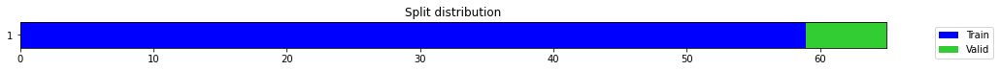

epoch,train_loss,valid_loss,mse,time
0,0.576708,0.984960,0.984960,00:00
1,0.496521,0.428801,0.428801,00:00
2,0.408781,0.047213,0.047213,00:00
3,0.348963,0.014478,0.014478,00:00
4,0.291890,0.011603,0.011603,00:00
5,0.260588,0.005120,0.005120,00:00
6,0.252363,0.002082,0.002082,00:00
7,0.227975,0.187286,0.187286,00:00
8,0.205884,0.927760,0.927760,00:00
9,0.185035,0.259648,0.259648,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.12389116485913594,
  "MSE_normalize": 0.015381487977982408,
  "RMSE_normalize": 0.12402212696927274,
  "MAPE_normalize": 0.12828401902002798,
  "MAE": 7991.475698073705,
  "MSE": 63998772.45430175,
  "RMSE": 7999.923278025968,
  "MAPE": 0.06777475188846514
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.0
2022-10-14 19:55:05.063549+07:00
PROGRESS: [ 244 / 1944 ]


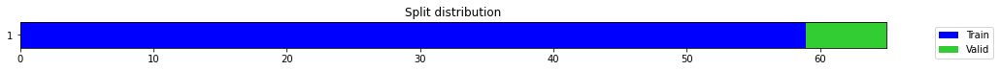

epoch,train_loss,valid_loss,mse,time
0,0.661688,0.272731,0.272731,00:00
1,0.545217,0.198018,0.198018,00:00
2,0.486573,0.119489,0.119489,00:00
3,0.442741,0.050010,0.050010,00:00
4,0.408932,0.010795,0.010795,00:00
5,0.363801,0.010004,0.010004,00:00
6,0.319928,0.037074,0.037074,00:00
7,0.286461,0.080790,0.080790,00:00
8,0.269077,0.080902,0.080902,00:00
9,0.247992,0.001048,0.001048,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16885187228520712,
  "MSE_normalize": 0.028569473039686006,
  "RMSE_normalize": 0.1690250663058175,
  "MAPE_normalize": 0.174842644419228,
  "MAE": 10891.621169885,
  "MSE": 118870892.51855375,
  "RMSE": 10902.792876990452,
  "MAPE": 0.09237158805442902
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.1
2022-10-14 19:55:24.773594+07:00
PROGRESS: [ 245 / 1944 ]


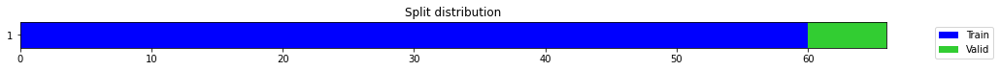

epoch,train_loss,valid_loss,mse,time
0,0.602988,0.354891,0.354891,00:00
1,0.379322,0.528560,0.528560,00:00
2,0.338517,0.002543,0.002543,00:00
3,0.278684,0.431698,0.431698,00:00
4,0.236806,0.002126,0.002126,00:00
5,0.215727,0.256570,0.256570,00:00
6,0.192970,0.056636,0.056636,00:00
7,0.172213,0.342853,0.342853,00:00
8,0.154709,0.388645,0.388645,00:00
9,0.143602,0.331204,0.331204,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5753043542305628,
  "MSE_normalize": 0.3312035507514284,
  "RMSE_normalize": 0.5755028677178146,
  "MAPE_normalize": 0.5948233656945595,
  "MAE": 37109.43206528822,
  "MSE": 1378060478.3450744,
  "RMSE": 37122.23697926991,
  "MAPE": 0.3144749592796873
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.1
2022-10-14 19:55:27.351820+07:00
PROGRESS: [ 246 / 1944 ]


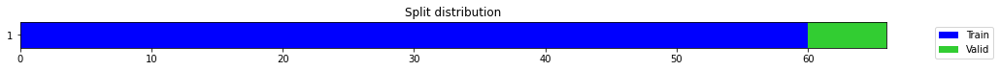

epoch,train_loss,valid_loss,mse,time
0,0.515451,0.963581,0.963581,00:00
1,0.388888,0.191287,0.191287,00:00
2,0.278437,0.409843,0.409843,00:00
3,0.276800,0.367330,0.367330,00:00
4,0.246914,0.075191,0.075191,00:00
5,0.222103,0.378815,0.378815,00:00
6,0.206818,0.382395,0.382395,00:00
7,0.190814,0.041281,0.041281,00:00
8,0.174350,0.496626,0.496626,00:00
9,0.158553,0.148103,0.148103,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.35549763838450116,
  "MSE_normalize": 0.12643172595217678,
  "RMSE_normalize": 0.35557239199940255,
  "MAPE_normalize": 0.36760927181872066,
  "MAE": 22931.019666353863,
  "MSE": 526052828.68604237,
  "RMSE": 22935.841573529462,
  "MAPE": 0.19433748417253846
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.2
2022-10-14 19:55:33.178610+07:00
PROGRESS: [ 247 / 1944 ]


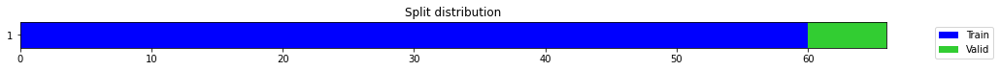

epoch,train_loss,valid_loss,mse,time
0,1.094733,2.272728,2.272728,00:00
1,0.928554,1.198697,1.198697,00:00
2,0.735778,0.179789,0.179789,00:00
3,0.574438,0.171862,0.171862,00:00
4,0.492885,0.902510,0.902510,00:00
5,0.484074,0.733041,0.733041,00:00
6,0.446050,0.027882,0.027882,00:00
7,0.389452,0.193436,0.193436,00:00
8,0.357421,0.225345,0.225345,00:00
9,0.320379,0.288575,0.288575,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.25793630878130597,
  "MSE_normalize": 0.06655557003762229,
  "RMSE_normalize": 0.25798366234632436,
  "MAPE_normalize": 0.266933810168412,
  "MAE": 16637.92366162936,
  "MSE": 276922153.98804665,
  "RMSE": 16640.978155987304,
  "MAPE": 0.14106299223863042
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.2
2022-10-14 19:55:44.281387+07:00
PROGRESS: [ 248 / 1944 ]


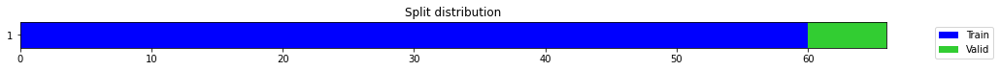

epoch,train_loss,valid_loss,mse,time
0,0.430292,1.103794,1.103794,00:00
1,0.407060,0.508364,0.508364,00:00
2,0.339506,0.112909,0.112909,00:00
3,0.281888,0.003395,0.003395,00:00
4,0.235941,0.171189,0.171189,00:00
5,0.217036,0.317024,0.317024,00:00
6,0.211492,0.275282,0.275282,00:00
7,0.204886,0.084941,0.084941,00:00
8,0.193210,0.009583,0.009583,00:00
9,0.178100,0.370505,0.370505,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.274068017800649,
  "MSE_normalize": 0.07514352690271764,
  "RMSE_normalize": 0.2741231965790521,
  "MAPE_normalize": 0.28364750544431044,
  "MAE": 17678.483420213062,
  "MSE": 312654633.0592093,
  "RMSE": 17682.042672135176,
  "MAPE": 0.14989053052959075
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.2
2022-10-14 19:56:06.766711+07:00
PROGRESS: [ 249 / 1944 ]


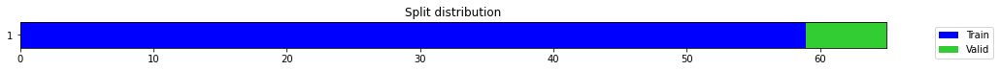

epoch,train_loss,valid_loss,mse,time
0,0.729712,1.385590,1.385590,00:00
1,0.548278,0.071768,0.071768,00:00
2,0.391614,0.002302,0.002302,00:00
3,0.338779,0.289123,0.289123,00:00
4,0.305521,1.844590,1.844590,00:00
5,0.260162,0.123708,0.123708,00:00
6,0.234704,0.012290,0.012290,00:00
7,0.212393,0.000367,0.000367,00:00
8,0.191230,0.013439,0.013439,00:00
9,0.175519,0.017829,0.017829,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13342164953549704,
  "MSE_normalize": 0.01782925432784725,
  "RMSE_normalize": 0.1335262308606337,
  "MAPE_normalize": 0.13812115836253028,
  "MAE": 8606.230081637701,
  "MSE": 74183355.49792776,
  "RMSE": 8612.975995434317,
  "MAPE": 0.07297962699232119
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:09.151231+07:00
PROGRESS: [ 250 / 1944 ]


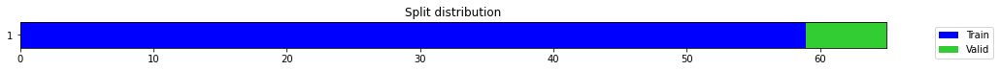

epoch,train_loss,valid_loss,mse,time
0,0.394155,0.478483,0.478483,00:00
1,0.335222,0.193699,0.193699,00:00
2,0.269021,0.037499,0.037499,00:00
3,0.216062,0.063190,0.063190,00:00
4,0.196961,0.667291,0.667291,00:00
5,0.182258,0.050050,0.050050,00:00
6,0.162929,0.942447,0.942447,00:00
7,0.149560,0.153848,0.153848,00:00
8,0.136600,0.050277,0.050277,00:00
9,0.127266,0.003899,0.003899,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.449333518743515,
  "MSE_normalize": 0.20208154127623068,
  "RMSE_normalize": 0.44953480541136154,
  "MAPE_normalize": 0.46454195489499434,
  "MAE": 28983.809293031693,
  "MSE": 840814009.4030418,
  "RMSE": 28996.793088254464,
  "MAPE": 0.24560615781802744
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:14.876829+07:00
PROGRESS: [ 251 / 1944 ]


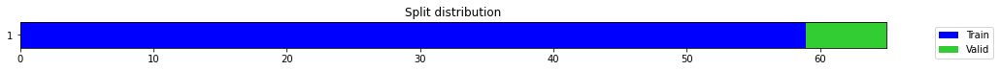

epoch,train_loss,valid_loss,mse,time
0,0.304233,0.009258,0.009258,00:00
1,0.259503,0.077830,0.077830,00:00
2,0.226188,0.419939,0.419939,00:00
3,0.197934,0.207278,0.207278,00:00
4,0.174236,0.020432,0.020432,00:00
5,0.161006,0.049229,0.049229,00:00
6,0.150501,0.218385,0.218385,00:00
7,0.141713,2.601598,2.601598,00:00
8,0.133398,0.126349,0.126349,00:00
9,0.125300,0.044325,0.044325,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.30229052901268005,
  "MSE_normalize": 0.0913936946508797,
  "RMSE_normalize": 0.3023139008561791,
  "MAPE_normalize": 0.3127837733183081,
  "MAE": 19498.948283433914,
  "MSE": 380267778.78006124,
  "RMSE": 19500.45586082698,
  "MAPE": 0.16530539643393247
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:25.872537+07:00
PROGRESS: [ 252 / 1944 ]


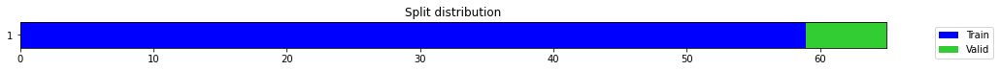

epoch,train_loss,valid_loss,mse,time
0,0.747949,0.266214,0.266214,00:00
1,0.690211,0.116335,0.116335,00:00
2,0.609781,0.028593,0.028593,00:00
3,0.568171,0.003498,0.003498,00:00
4,0.516554,0.001330,0.001330,00:00
5,0.456766,0.007977,0.007977,00:00
6,0.399048,0.034238,0.034238,00:00
7,0.353593,0.040182,0.040182,00:00
8,0.324410,0.018146,0.018146,00:00
9,0.303191,0.054770,0.054770,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16172415018081665,
  "MSE_normalize": 0.02617480938622189,
  "RMSE_normalize": 0.1617863077835139,
  "MAPE_normalize": 0.16738908985832193,
  "MAE": 10431.854583263397,
  "MSE": 108907257.36946987,
  "RMSE": 10435.863997267781,
  "MAPE": 0.08845195050436354
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:49.049713+07:00
PROGRESS: [ 253 / 1944 ]


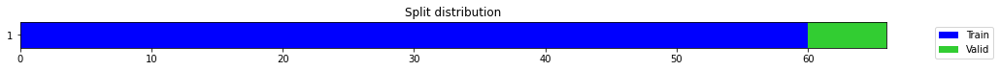

epoch,train_loss,valid_loss,mse,time
0,0.271030,0.072097,0.072097,00:00
1,0.195816,0.063919,0.063919,00:00
2,0.164444,0.319431,0.319431,00:00
3,0.154732,0.249008,0.249008,00:00
4,0.134148,0.089061,0.089061,00:00
5,0.117912,0.051022,0.051022,00:00
6,0.107350,0.230216,0.230216,00:00
7,0.101255,0.075707,0.075707,00:00
8,0.097332,0.007596,0.007596,00:00
9,0.092729,0.005045,0.005045,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0693071683247884,
  "MSE_normalize": 0.00504494719335824,
  "RMSE_normalize": 0.07102779169704096,
  "MAPE_normalize": 0.0720550707447681,
  "MAE": 4470.589585622151,
  "MSE": 20990844.83463955,
  "RMSE": 4581.57667562593,
  "MAPE": 0.037995760616623526
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:51.912441+07:00
PROGRESS: [ 254 / 1944 ]


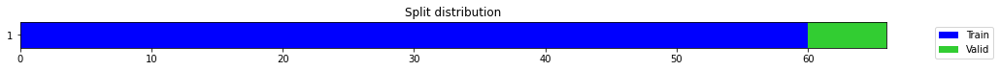

epoch,train_loss,valid_loss,mse,time
0,0.067444,0.112108,0.112108,00:00
1,0.065497,0.008447,0.008447,00:00
2,0.077741,0.100210,0.100210,00:00
3,0.095897,0.409784,0.409784,00:00
4,0.088046,0.000461,0.000461,00:00
5,0.086245,0.072834,0.072834,00:00
6,0.090190,0.677594,0.677594,00:00
7,0.102867,0.000592,0.000592,00:00
8,0.109556,0.285251,0.285251,00:00
9,0.104232,0.377163,0.377163,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0828532874584198,
  "MSE_normalize": 0.006920801622033086,
  "RMSE_normalize": 0.0831913554525534,
  "MAPE_normalize": 0.08587083151503687,
  "MAE": 5344.368454217911,
  "MSE": 28795836.192432944,
  "RMSE": 5366.175192111505,
  "MAPE": 0.04534729953240987
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.3
2022-10-14 19:56:58.578942+07:00
PROGRESS: [ 255 / 1944 ]


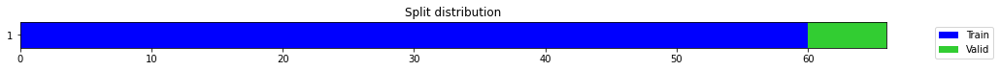

epoch,train_loss,valid_loss,mse,time
0,0.303451,0.716495,0.716495,00:00
1,0.210389,0.275419,0.275419,00:00
2,0.174092,0.048998,0.048998,00:00
3,0.154136,0.090951,0.090951,00:00
4,0.138607,0.363648,0.363648,00:00
5,0.129034,0.566688,0.566688,00:00
6,0.120670,0.158930,0.158930,00:00
7,0.113794,0.027083,0.027083,00:00
8,0.111945,0.264920,0.264920,00:00
9,0.111640,0.614113,0.614113,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.25340360403060913,
  "MSE_normalize": 0.06429719298941923,
  "RMSE_normalize": 0.25356891171714885,
  "MAPE_normalize": 0.2619453928644052,
  "MAE": 16345.546074390411,
  "MSE": 267525575.51456895,
  "RMSE": 16356.209081402969,
  "MAPE": 0.13850086589500343
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.5
2022-10-14 19:57:11.679586+07:00
PROGRESS: [ 256 / 1944 ]


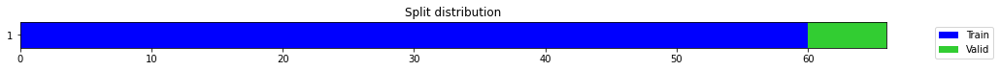

epoch,train_loss,valid_loss,mse,time
0,0.366022,0.367370,0.367370,00:00
1,0.289272,0.109568,0.109568,00:00
2,0.230048,0.006323,0.006323,00:00
3,0.190230,0.019880,0.019880,00:00
4,0.160484,0.143013,0.143013,00:00
5,0.146764,0.211601,0.211601,00:00
6,0.143055,0.097690,0.097690,00:00
7,0.133535,0.041890,0.041890,00:00
8,0.120814,0.437377,0.437377,00:00
9,0.116718,0.851650,0.851650,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1090071698029836,
  "MSE_normalize": 0.012006298727031961,
  "RMSE_normalize": 0.10957325735338874,
  "MAPE_normalize": 0.11302492930989023,
  "MAE": 7031.398480971654,
  "MSE": 49955399.72137865,
  "RMSE": 7067.913392322988,
  "MAPE": 0.05967506884706018
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:57:36.732471+07:00
PROGRESS: [ 257 / 1944 ]


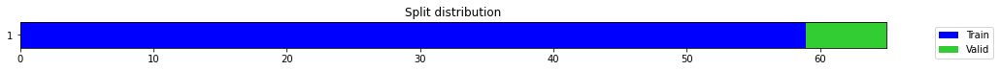

epoch,train_loss,valid_loss,mse,time
0,0.475583,0.054491,0.054491,00:00
1,0.327319,0.028931,0.028931,00:00
2,0.269065,0.006888,0.006888,00:00
3,0.238675,0.575229,0.575229,00:00
4,0.206643,0.433309,0.433309,00:00
5,0.180652,0.000129,0.000129,00:00
6,0.157716,0.059838,0.059838,00:00
7,0.140839,0.099363,0.099363,00:00
8,0.130621,0.042722,0.042722,00:00
9,0.122814,0.008839,0.008839,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09363732735315959,
  "MSE_normalize": 0.008839324532058157,
  "RMSE_normalize": 0.09401768201810848,
  "MAPE_normalize": 0.09669491375543533,
  "MAE": 6039.982163588206,
  "MSE": 36778361.11738268,
  "RMSE": 6064.516560896069,
  "MAPE": 0.051151019490005056
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:57:39.829939+07:00
PROGRESS: [ 258 / 1944 ]


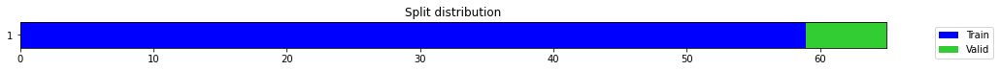

epoch,train_loss,valid_loss,mse,time
0,0.326422,0.112558,0.112558,00:00
1,0.281620,0.553709,0.553709,00:00
2,0.244984,0.116877,0.116877,00:00
3,0.208012,0.161106,0.161106,00:00
4,0.180752,0.416531,0.416531,00:00
5,0.165333,2.195698,2.195698,00:00
6,0.156822,0.077673,0.077673,00:00
7,0.152795,0.293168,0.293168,00:00
8,0.144290,0.608705,0.608705,00:00
9,0.135135,0.087616,0.087616,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.32650670409202576,
  "MSE_normalize": 0.10661772007817365,
  "RMSE_normalize": 0.326523689918777,
  "MAPE_normalize": 0.3378203377223778,
  "MAE": 21060.98844075203,
  "MSE": 443611386.40466577,
  "RMSE": 21062.084094520793,
  "MAPE": 0.17854217422360963
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:57:47.287236+07:00
PROGRESS: [ 259 / 1944 ]


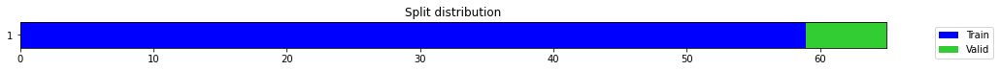

epoch,train_loss,valid_loss,mse,time
0,0.479503,0.210084,0.210084,00:00
1,0.406269,0.014680,0.014680,00:00
2,0.343333,0.053080,0.053080,00:00
3,0.301015,0.096253,0.096253,00:00
4,0.258525,0.005702,0.005702,00:00
5,0.226271,0.102315,0.102315,00:00
6,0.205626,0.141488,0.141488,00:00
7,0.193143,1.306885,1.306885,00:00
8,0.183719,1.332666,1.332666,00:00
9,0.171424,0.058919,0.058919,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06592049201329549,
  "MSE_normalize": 0.004359233905098847,
  "RMSE_normalize": 0.06602449473565737,
  "MAPE_normalize": 0.06824478077153451,
  "MAE": 4252.135416825612,
  "MSE": 18137752.288130254,
  "RMSE": 4258.844008428843,
  "MAPE": 0.03605822588195796
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:58:01.463843+07:00
PROGRESS: [ 260 / 1944 ]


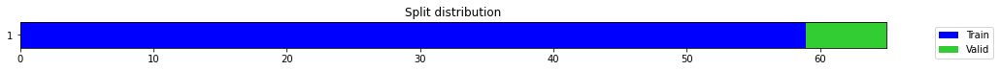

epoch,train_loss,valid_loss,mse,time
0,0.367185,1.146012,1.146012,00:00
1,0.310663,0.563166,0.563166,00:00
2,0.261840,0.251350,0.251350,00:00
3,0.239242,0.077066,0.077066,00:00
4,0.205029,0.004282,0.004282,00:00
5,0.185504,0.001066,0.001066,00:00
6,0.164614,0.020468,0.020468,00:00
7,0.157678,0.196514,0.196514,00:00
8,0.149253,0.404232,0.404232,00:00
9,0.140872,0.949457,0.949457,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.20966137448946634,
  "MSE_normalize": 0.043965292419473556,
  "RMSE_normalize": 0.20967902236388256,
  "MAPE_normalize": 0.21687554529609945,
  "MAE": 13523.997300068537,
  "MSE": 182929294.582448,
  "RMSE": 13525.13565855988,
  "MAPE": 0.11463401527210566
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:58:29.936807+07:00
PROGRESS: [ 261 / 1944 ]


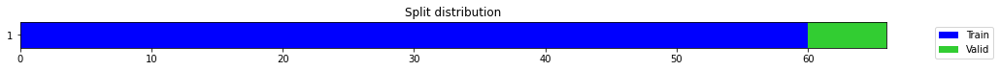

epoch,train_loss,valid_loss,mse,time
0,0.375557,0.002142,0.002142,00:00
1,0.233464,0.919454,0.919454,00:00
2,0.196178,0.235197,0.235197,00:00
3,0.190322,0.003462,0.003462,00:00
4,0.179294,0.392482,0.392482,00:00
5,0.164273,0.327436,0.327436,00:00
6,0.150377,0.234415,0.234415,00:00
7,0.138272,0.026808,0.026808,00:00
8,0.128483,0.064169,0.064169,00:00
9,0.120111,0.037857,0.037857,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1922308603922526,
  "MSE_normalize": 0.037856513333374885,
  "RMSE_normalize": 0.19456750328195838,
  "MAPE_normalize": 0.19817653638155722,
  "MAE": 12399.659418741861,
  "MSE": 157512094.16175708,
  "RMSE": 12550.382231699443,
  "MAPE": 0.10491674286663548
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:58:33.550866+07:00
PROGRESS: [ 262 / 1944 ]


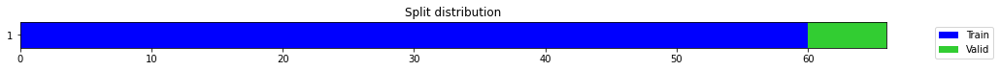

epoch,train_loss,valid_loss,mse,time
0,0.275247,0.408749,0.408749,00:00
1,0.200499,0.004657,0.004657,00:00
2,0.186411,0.001479,0.001479,00:00
3,0.178174,0.000709,0.000709,00:00
4,0.174022,0.183392,0.183392,00:00
5,0.159304,1.037829,1.037829,00:00
6,0.161713,0.619037,0.619037,00:00
7,0.148096,0.008229,0.008229,00:00
8,0.135556,0.114480,0.114480,00:00
9,0.136358,0.091472,0.091472,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10335549712181091,
  "MSE_normalize": 0.010688986007988769,
  "RMSE_normalize": 0.10338755248088993,
  "MAPE_normalize": 0.1069553934125617,
  "MAE": 6666.842986345291,
  "MSE": 44474369.727539174,
  "RMSE": 6668.9106852273235,
  "MAPE": 0.056522547116272304
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.7
2022-10-14 19:58:42.122932+07:00
PROGRESS: [ 263 / 1944 ]


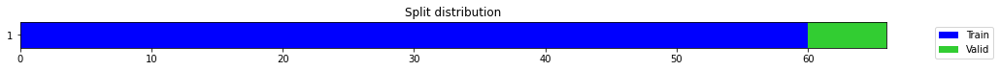

epoch,train_loss,valid_loss,mse,time
0,0.496012,0.342872,0.342872,00:00
1,0.381514,0.103650,0.103650,00:00
2,0.281087,0.036251,0.036251,00:00
3,0.217880,0.470709,0.470709,00:00
4,0.250497,0.978530,0.978530,00:00
5,0.231907,0.000642,0.000642,00:00
6,0.205210,0.771498,0.771498,00:00
7,0.195510,0.009052,0.009052,00:00
8,0.176941,0.084289,0.084289,00:00
9,0.163398,0.000364,0.000364,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08688163757324219,
  "MSE_normalize": 0.007576129175783801,
  "RMSE_normalize": 0.08704096263130251,
  "MAPE_normalize": 0.08999440791637918,
  "MAE": 5604.213150024414,
  "MSE": 31522500.807427328,
  "RMSE": 5614.490253569537,
  "MAPE": 0.04753769024756862
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.6
2022-10-14 19:58:58.036557+07:00
PROGRESS: [ 264 / 1944 ]


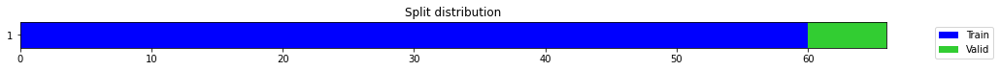

epoch,train_loss,valid_loss,mse,time
0,0.341189,0.597922,0.597922,00:00
1,0.260809,0.429106,0.429106,00:00
2,0.213391,0.178009,0.178009,00:00
3,0.179281,0.007860,0.007860,00:00
4,0.161431,0.091550,0.091550,00:00
5,0.160625,0.146787,0.146787,00:00
6,0.152889,0.060410,0.060410,00:00
7,0.135424,0.004467,0.004467,00:00
8,0.124334,0.085247,0.085247,00:00
9,0.117947,0.080268,0.080268,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07981317241986592,
  "MSE_normalize": 0.006455589669091803,
  "RMSE_normalize": 0.08034668424453995,
  "MAPE_normalize": 0.08277853097891104,
  "MAE": 5148.268873771031,
  "MSE": 26860198.10839786,
  "RMSE": 5182.682520509805,
  "MAPE": 0.04369969092575826
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.7
2022-10-14 19:59:30.456006+07:00
PROGRESS: [ 265 / 1944 ]


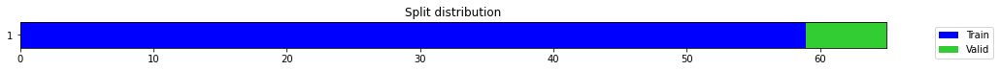

epoch,train_loss,valid_loss,mse,time
0,0.206915,0.099031,0.099031,00:00
1,0.165258,0.788454,0.788454,00:00
2,0.167770,1.198473,1.198473,00:00
3,0.178981,5.492323,5.492323,00:00
4,0.192774,0.634464,0.634464,00:00
5,0.180548,0.466072,0.466072,00:00
6,0.175925,0.108744,0.108744,00:00
7,0.155993,0.432457,0.432457,00:00
8,0.145477,0.590328,0.590328,00:00
9,0.140849,0.353264,0.353264,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5932385722796122,
  "MSE_normalize": 0.35326444738942203,
  "RMSE_normalize": 0.5943605365343682,
  "MAPE_normalize": 0.6128881354083734,
  "MAE": 38266.260866324104,
  "MSE": 1469850707.358927,
  "RMSE": 38338.63204861288,
  "MAPE": 0.3241447352491093
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.7
2022-10-14 19:59:34.684691+07:00
PROGRESS: [ 266 / 1944 ]


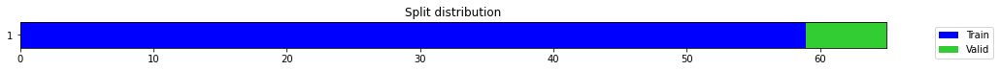

epoch,train_loss,valid_loss,mse,time
0,0.505215,0.074793,0.074793,00:00
1,0.382063,0.004334,0.004334,00:00
2,0.289670,0.122223,0.122223,00:00
3,0.286365,0.007708,0.007708,00:00
4,0.253749,3.489567,3.489567,00:00
5,0.226901,0.666589,0.666589,00:00
6,0.195987,1.843701,1.843701,00:00
7,0.188388,0.096341,0.096341,00:00
8,0.171770,4.885271,4.885271,00:00
9,0.164521,0.554586,0.554586,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2535773416360219,
  "MSE_normalize": 0.06431405603526426,
  "RMSE_normalize": 0.25360216094360133,
  "MAPE_normalize": 0.262383946667575,
  "MAE": 16356.75284488996,
  "MSE": 267595738.7026472,
  "RMSE": 16358.353789506058,
  "MAPE": 0.13866810591418996
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.8
2022-10-14 19:59:45.105380+07:00
PROGRESS: [ 267 / 1944 ]


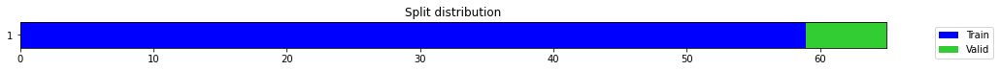

epoch,train_loss,valid_loss,mse,time
0,0.217962,0.305044,0.305044,00:00
1,0.201967,0.088840,0.088840,00:00
2,0.174950,0.097717,0.097717,00:00
3,0.162928,0.022929,0.022929,00:00
4,0.177109,0.555690,0.555690,00:00
5,0.166036,0.656869,0.656869,00:00
6,0.156968,2.802822,2.802822,00:00
7,0.146014,0.029696,0.029696,00:00
8,0.138539,0.284684,0.284684,00:00
9,0.138657,0.000099,0.000099,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4548482298851013,
  "MSE_normalize": 0.20699616942866564,
  "RMSE_normalize": 0.45496831695038464,
  "MAPE_normalize": 0.47031598258601726,
  "MAE": 29339.530220508575,
  "MSE": 861262627.20097,
  "RMSE": 29347.276316567608,
  "MAPE": 0.2486407438167982
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.8
2022-10-14 20:00:05.352442+07:00
PROGRESS: [ 268 / 1944 ]


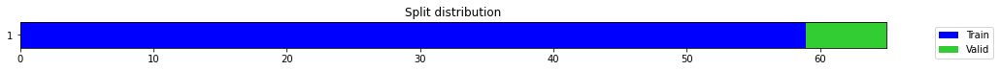

epoch,train_loss,valid_loss,mse,time
0,0.250879,0.490416,0.490416,00:00
1,0.263617,0.339923,0.339923,00:00
2,0.228944,0.310864,0.310864,00:00
3,0.196185,0.088899,0.088899,00:00
4,0.172112,0.174270,0.174270,00:00
5,0.171698,0.448226,0.448226,00:00
6,0.164435,0.106101,0.106101,00:00
7,0.159156,2.013831,2.013831,00:00
8,0.155486,5.061028,5.061028,00:00
9,0.148457,2.450431,2.450431,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18062578638394675,
  "MSE_normalize": 0.03263293842275002,
  "RMSE_normalize": 0.18064589234950798,
  "MAPE_normalize": 0.18687052695836226,
  "MAE": 11651.0857249101,
  "MSE": 135778021.19159892,
  "RMSE": 11652.38264011266,
  "MAPE": 0.09876686043236405
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.8
2022-10-14 20:00:45.681802+07:00
PROGRESS: [ 269 / 1944 ]


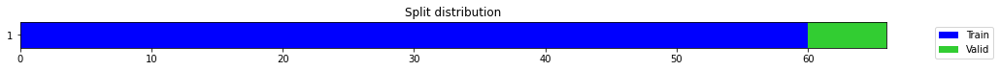

epoch,train_loss,valid_loss,mse,time
0,0.227224,0.025612,0.025612,00:00
1,0.214314,0.205417,0.205417,00:00
2,0.200081,0.231300,0.231300,00:00
3,0.183040,0.880593,0.880593,00:00
4,0.194247,0.251376,0.251376,00:00
5,0.186427,0.010026,0.010026,00:00
6,0.172889,0.090562,0.090562,00:00
7,0.169378,0.002695,0.002695,00:00
8,0.155057,0.024933,0.024933,00:00
9,0.143566,0.032334,0.032334,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1787033478418986,
  "MSE_normalize": 0.03233366374594245,
  "RMSE_normalize": 0.17981563821298316,
  "MAPE_normalize": 0.18532971469959855,
  "MAE": 11527.080749193827,
  "MSE": 134532809.2868886,
  "RMSE": 11598.827927290266,
  "MAPE": 0.09784080093443458
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.9
2022-10-14 20:00:50.732356+07:00
PROGRESS: [ 270 / 1944 ]


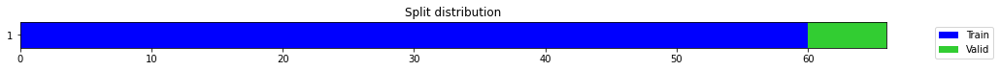

epoch,train_loss,valid_loss,mse,time
0,0.209035,0.005151,0.005151,00:00
1,0.163419,0.012973,0.012973,00:00
2,0.139370,0.397534,0.397534,00:00
3,0.123576,0.135830,0.135830,00:00
4,0.121307,0.014525,0.014525,00:00
5,0.120731,0.033645,0.033645,00:00
6,0.123594,0.277774,0.277774,00:00
7,0.124863,0.342113,0.342113,00:00
8,0.130824,0.114275,0.114275,00:00
9,0.125022,1.301075,1.301075,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.28949209054311115,
  "MSE_normalize": 0.08381097053115738,
  "RMSE_normalize": 0.2895012444380117,
  "MAPE_normalize": 0.29945099702252576,
  "MAE": 18673.39780839284,
  "MSE": 348717837.9540171,
  "RMSE": 18673.988271229504,
  "MAPE": 0.15828153345877993
}
Percent CPU Usage: 100.0
Percent Ram Usage: 14.9
2022-10-14 20:01:11.645913+07:00
PROGRESS: [ 271 / 1944 ]


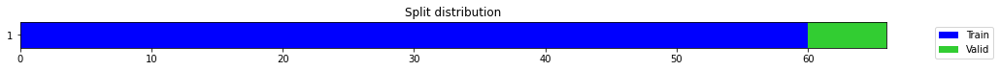

epoch,train_loss,valid_loss,mse,time
0,0.196205,0.043810,0.043810,00:00
1,0.137885,0.010736,0.010736,00:00
2,0.149403,0.116258,0.116258,00:00
3,0.150338,0.243849,0.243849,00:00
4,0.141225,0.622035,0.622035,00:00
5,0.143005,0.159739,0.159739,00:00
6,0.136797,0.076034,0.076034,00:00
7,0.125824,1.727974,1.727974,00:00
8,0.126692,0.022867,0.022867,00:00
9,0.126456,0.434983,0.434983,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.23159921169281006,
  "MSE_normalize": 0.053661635515959226,
  "RMSE_normalize": 0.231649812251077,
  "MAPE_normalize": 0.23948864730767908,
  "MAE": 14939.07555103302,
  "MSE": 223273509.41778174,
  "RMSE": 14942.33948944347,
  "MAPE": 0.12660644750483932
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.0
2022-10-14 20:01:51.429106+07:00
PROGRESS: [ 272 / 1944 ]


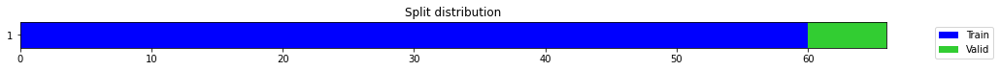

epoch,train_loss,valid_loss,mse,time
0,0.371546,0.072042,0.072042,00:00
1,0.251012,0.029889,0.029889,00:00
2,0.191367,0.230451,0.230451,00:00
3,0.198790,0.223537,0.223537,00:00
4,0.197433,0.041161,0.041161,00:00
5,0.181963,0.047528,0.047528,00:00
6,0.163936,0.451754,0.451754,00:00
7,0.155681,0.543413,0.543413,00:00
8,0.142707,0.014085,0.014085,00:00
9,0.134873,0.001493,0.001493,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18264971176783243,
  "MSE_normalize": 0.03337616933112031,
  "RMSE_normalize": 0.18269145938198728,
  "MAPE_normalize": 0.18887150596015015,
  "MAE": 11781.637007872263,
  "MSE": 138870431.09718683,
  "RMSE": 11784.329895975708,
  "MAPE": 0.09984757845692623
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.0
2022-10-14 20:03:10.058994+07:00
PROGRESS: [ 273 / 1944 ]


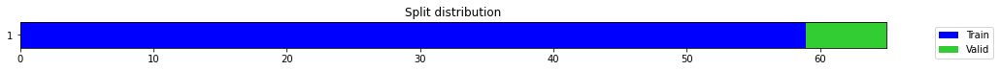

epoch,train_loss,valid_loss,mse,time
0,0.538100,0.121043,0.121043,00:00
1,0.333466,0.001960,0.001960,00:00
2,0.272105,4.650937,4.650937,00:00
3,0.224396,1.341974,1.341974,00:00
4,0.195468,2.042563,2.042563,00:00
5,0.198860,2.853284,2.853284,00:00
6,0.174527,1.914160,1.914160,00:00
7,0.171349,1.674458,1.674458,00:00
8,0.159576,0.472794,0.472794,00:00
9,0.148224,0.245564,0.245564,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4951279858748118,
  "MSE_normalize": 0.24556426745937987,
  "RMSE_normalize": 0.4955444152236809,
  "MAPE_normalize": 0.5117554536894803,
  "MAE": 31937.735600868862,
  "MSE": 1021735458.7889227,
  "RMSE": 31964.596959588318,
  "MAPE": 0.270600742082109
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.0
2022-10-14 20:03:17.536874+07:00
PROGRESS: [ 274 / 1944 ]


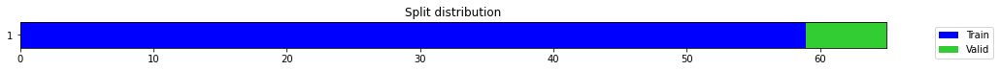

epoch,train_loss,valid_loss,mse,time
0,0.285371,0.004515,0.004515,00:00
1,0.240528,0.290711,0.290711,00:00
2,0.208257,0.275557,0.275557,00:00
3,0.196626,0.035629,0.035629,00:00
4,0.184102,0.997079,0.997079,00:00
5,0.178182,0.077551,0.077551,00:00
6,0.158140,0.342923,0.342923,00:00
7,0.147763,0.873444,0.873444,00:00
8,0.142731,1.671322,1.671322,00:00
9,0.138233,0.139010,0.139010,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.337504764397939,
  "MSE_normalize": 0.113918120802456,
  "RMSE_normalize": 0.33751758591583936,
  "MAPE_normalize": 0.3491321922463107,
  "MAE": 21770.40732272466,
  "MSE": 473986645.6414415,
  "RMSE": 21771.2343619153,
  "MAPE": 0.18453740147616363
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.1
2022-10-14 20:03:34.871463+07:00
PROGRESS: [ 275 / 1944 ]


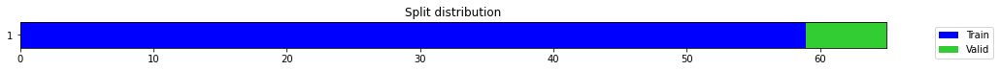

epoch,train_loss,valid_loss,mse,time
0,0.264332,0.119228,0.119228,00:00
1,0.257264,0.211762,0.211762,00:00
2,0.231172,0.075271,0.075271,00:00
3,0.203679,0.033052,0.033052,00:00
4,0.181700,0.364299,0.364299,00:00
5,0.161884,2.077377,2.077377,00:00
6,0.151558,0.519512,0.519512,00:00
7,0.138470,0.916497,0.916497,00:00
8,0.131556,1.723475,1.723475,00:00
9,0.136108,1.193889,1.193889,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06635530789693196,
  "MSE_normalize": 0.004447120979493254,
  "RMSE_normalize": 0.06668673765819748,
  "MAPE_normalize": 0.06878368630286115,
  "MAE": 4280.182780583699,
  "MSE": 18503429.84051616,
  "RMSE": 4301.56132590437,
  "MAPE": 0.03632083389857798
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.2
2022-10-14 20:04:07.092411+07:00
PROGRESS: [ 276 / 1944 ]


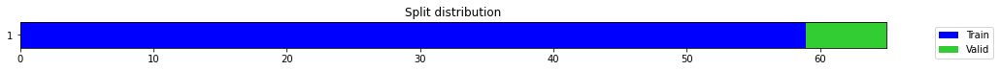

epoch,train_loss,valid_loss,mse,time
0,0.328950,0.406345,0.406345,00:00
1,0.242487,0.043523,0.043523,00:00
2,0.213426,0.007303,0.007303,00:00
3,0.190843,0.118809,0.118809,00:00
4,0.171107,0.337257,0.337257,00:00
5,0.163471,0.049196,0.049196,00:00
6,0.157575,0.047348,0.047348,00:00
7,0.147368,1.817964,1.817964,00:00
8,0.138070,2.760765,2.760765,00:00
9,0.131168,0.379855,0.379855,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1975953777631124,
  "MSE_normalize": 0.03906112592340586,
  "RMSE_normalize": 0.19763887756057982,
  "MAPE_normalize": 0.20433531251638182,
  "MAE": 12745.692247231802,
  "MSE": 162524205.28880373,
  "RMSE": 12748.49815816764,
  "MAPE": 0.1080203440522115
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.1
2022-10-14 20:05:09.350655+07:00
PROGRESS: [ 277 / 1944 ]


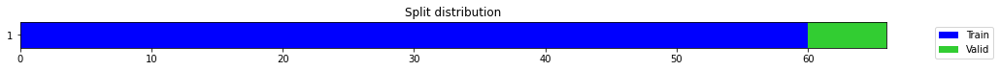

epoch,train_loss,valid_loss,mse,time
0,0.546432,0.062212,0.062212,00:00
1,0.476184,0.017925,0.017925,00:00
2,0.472281,0.985980,0.985980,00:00
3,0.374927,2.620548,2.620548,00:00
4,0.319884,0.008582,0.008582,00:00
5,0.279732,0.039006,0.039006,00:00
6,0.243461,0.073595,0.073595,00:00
7,0.218533,0.000373,0.000373,00:00
8,0.197135,0.052825,0.052825,00:00
9,0.180929,0.064162,0.064162,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2532469828923543,
  "MSE_normalize": 0.06416207347935436,
  "RMSE_normalize": 0.253302336111127,
  "MAPE_normalize": 0.262089969041533,
  "MAE": 16335.443384488424,
  "MSE": 266963374.84899247,
  "RMSE": 16339.013888512136,
  "MAPE": 0.1385008510834844
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.1
2022-10-14 20:05:16.480438+07:00
PROGRESS: [ 278 / 1944 ]


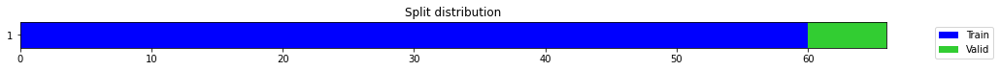

epoch,train_loss,valid_loss,mse,time
0,0.273029,0.346016,0.346016,00:00
1,0.180903,0.006548,0.006548,00:00
2,0.170617,0.115919,0.115919,00:00
3,0.147879,0.449847,0.449847,00:00
4,0.147303,0.049444,0.049444,00:00
5,0.155255,0.065490,0.065490,00:00
6,0.169752,2.544870,2.544870,00:00
7,0.170236,2.773475,2.773475,00:00
8,0.165596,2.305485,2.305485,00:00
9,0.160849,0.071749,0.071749,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07889358202616374,
  "MSE_normalize": 0.006562772833472508,
  "RMSE_normalize": 0.08101094267734765,
  "MAPE_normalize": 0.08204294504223526,
  "MAE": 5088.951615015666,
  "MSE": 27306162.176240433,
  "RMSE": 5225.529846459633,
  "MAPE": 0.04325712511842272
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.2
2022-10-14 20:05:33.417940+07:00
PROGRESS: [ 279 / 1944 ]


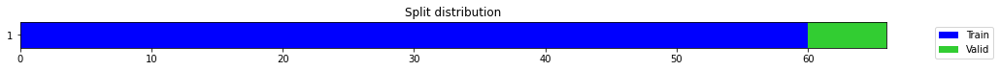

epoch,train_loss,valid_loss,mse,time
0,0.271269,0.036984,0.036984,00:00
1,0.182978,0.104973,0.104973,00:00
2,0.165784,0.249582,0.249582,00:00
3,0.173497,0.165867,0.165867,00:00
4,0.147455,0.144913,0.144913,00:00
5,0.141193,0.226287,0.226287,00:00
6,0.136378,0.012431,0.012431,00:00
7,0.130333,0.399555,0.399555,00:00
8,0.129410,0.088684,0.088684,00:00
9,0.123478,2.212521,2.212521,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.25966225067774457,
  "MSE_normalize": 0.06743100284735822,
  "RMSE_normalize": 0.2596748021032426,
  "MAPE_normalize": 0.2685790338411271,
  "MAE": 16749.253817717236,
  "MSE": 280564625.07208735,
  "RMSE": 16750.063434867563,
  "MAPE": 0.14196740359789942
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.2
2022-10-14 20:06:05.570592+07:00
PROGRESS: [ 280 / 1944 ]


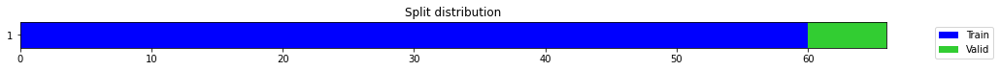

epoch,train_loss,valid_loss,mse,time
0,0.297198,0.232033,0.232033,00:00
1,0.191529,0.001593,0.001593,00:00
2,0.170972,0.019492,0.019492,00:00
3,0.153426,0.006428,0.006428,00:00
4,0.132695,0.002468,0.002468,00:00
5,0.122885,0.014140,0.014140,00:00
6,0.113530,0.121283,0.121283,00:00
7,0.111944,0.007409,0.007409,00:00
8,0.106145,0.196452,0.196452,00:00
9,0.109868,0.993962,0.993962,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13621137539545694,
  "MSE_normalize": 0.01868954240753003,
  "RMSE_normalize": 0.13670970121951856,
  "MAPE_normalize": 0.14118055614866404,
  "MAE": 8786.178558508554,
  "MSE": 77762812.90384178,
  "RMSE": 8818.322567463825,
  "MAPE": 0.07455346724108858
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.2
2022-10-14 20:07:09.525083+07:00
PROGRESS: [ 281 / 1944 ]


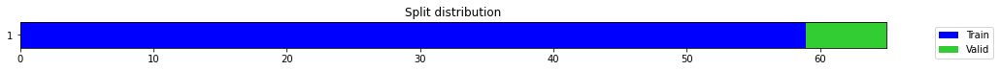

epoch,train_loss,valid_loss,mse,time
0,0.147580,0.245487,0.245487,00:00
1,0.180649,0.175922,0.175922,00:00
2,0.178054,4.913062,4.913062,00:00
3,0.158362,4.471021,4.471021,00:00
4,0.154274,0.013935,0.013935,00:00
5,0.145624,1.864076,1.864076,00:00
6,0.142715,0.208811,0.208811,00:00
7,0.132210,0.000066,0.000066,00:00
8,0.124185,0.085669,0.085669,00:00
9,0.119345,0.122125,0.122125,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3492596447467804,
  "MSE_normalize": 0.12212528915780456,
  "RMSE_normalize": 0.34946428881618874,
  "MAPE_normalize": 0.36104595721354094,
  "MAE": 22528.644124746323,
  "MSE": 508134752.82196647,
  "RMSE": 22541.844485799436,
  "MAPE": 0.19089584744837898
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.3
2022-10-14 20:07:15.400985+07:00
PROGRESS: [ 282 / 1944 ]


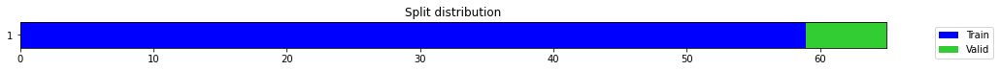

epoch,train_loss,valid_loss,mse,time
0,0.293643,0.431524,0.431524,00:00
1,0.256535,0.056613,0.056613,00:00
2,0.208700,0.884549,0.884549,00:00
3,0.182958,1.652340,1.652340,00:00
4,0.164963,0.892863,0.892863,00:00
5,0.159335,1.663220,1.663220,00:00
6,0.149745,0.232894,0.232894,00:00
7,0.149811,0.411587,0.411587,00:00
8,0.137247,0.206697,0.206697,00:00
9,0.130197,0.005926,0.005926,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.36657556891441345,
  "MSE_normalize": 0.13440681073978963,
  "RMSE_normalize": 0.366615344386715,
  "MAPE_normalize": 0.37933855681447065,
  "MAE": 23645.590497255325,
  "MSE": 559235290.4450606,
  "RMSE": 23648.156174320666,
  "MAPE": 0.2004699041464173
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.3
2022-10-14 20:07:29.653539+07:00
PROGRESS: [ 283 / 1944 ]


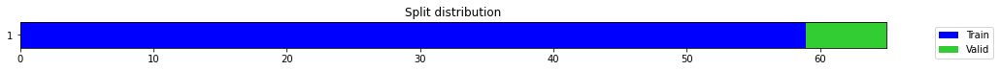

epoch,train_loss,valid_loss,mse,time
0,0.295949,0.197018,0.197018,00:00
1,0.237705,0.264064,0.264064,00:00
2,0.198095,0.501057,0.501057,00:00
3,0.175862,0.285095,0.285095,00:00
4,0.164458,2.171794,2.171794,00:00
5,0.154790,2.021296,2.021296,00:00
6,0.151773,2.223331,2.223331,00:00
7,0.145318,0.882111,0.882111,00:00
8,0.130979,0.036331,0.036331,00:00
9,0.123540,0.005332,0.005332,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11113770802815755,
  "MSE_normalize": 0.012404062124648618,
  "RMSE_normalize": 0.11137352524118387,
  "MAPE_normalize": 0.11512856177665032,
  "MAE": 7168.826718648274,
  "MSE": 51610400.14859072,
  "RMSE": 7184.037872157323,
  "MAPE": 0.06081200577844081
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.3
2022-10-14 20:07:56.715605+07:00
PROGRESS: [ 284 / 1944 ]


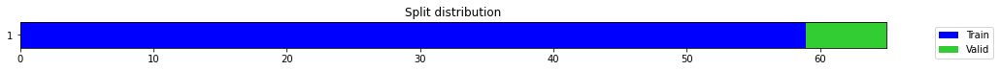

epoch,train_loss,valid_loss,mse,time
0,0.641594,1.110339,1.110339,00:00
1,0.537147,0.211771,0.211771,00:00
2,0.427956,0.016403,0.016403,00:00
3,0.359530,0.005491,0.005491,00:00
4,0.295097,0.016954,0.016954,00:00
5,0.259315,0.020420,0.020420,00:00
6,0.247059,0.057246,0.057246,00:00
7,0.228746,0.197713,0.197713,00:00
8,0.215750,1.418134,1.418134,00:00
9,0.201965,2.272772,2.272772,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.17599621415138245,
  "MSE_normalize": 0.031009326349627386,
  "RMSE_normalize": 0.1760946516780887,
  "MAPE_normalize": 0.18194318456733125,
  "MAE": 11352.459797620773,
  "MSE": 129022551.25458296,
  "RMSE": 11358.809411843433,
  "MAPE": 0.09619692906302517
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.4
2022-10-14 20:08:48.494614+07:00
PROGRESS: [ 285 / 1944 ]


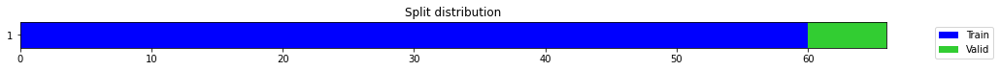

epoch,train_loss,valid_loss,mse,time
0,0.191851,0.061109,0.061109,00:00
1,0.191518,1.258625,1.258625,00:00
2,0.164798,0.982196,0.982196,00:00
3,0.226615,6.039166,6.039166,00:00
4,0.231424,3.819988,3.819988,00:00
5,0.251271,1.869314,1.869314,00:00
6,0.228657,0.008303,0.008303,00:00
7,0.210569,0.000336,0.000336,00:00
8,0.191875,0.000869,0.000869,00:00
9,0.174330,0.010624,0.010624,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10190988580385844,
  "MSE_normalize": 0.01062361281131352,
  "RMSE_normalize": 0.10307091156729682,
  "MAPE_normalize": 0.10578227913034088,
  "MAE": 6573.595273892085,
  "MSE": 44202367.15245552,
  "RMSE": 6648.486079736915,
  "MAPE": 0.055822221701879116
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.4
2022-10-14 20:08:57.239268+07:00
PROGRESS: [ 286 / 1944 ]


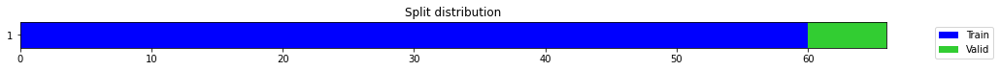

epoch,train_loss,valid_loss,mse,time
0,0.116991,0.045880,0.045880,00:00
1,0.105396,0.131771,0.131771,00:00
2,0.134720,0.496838,0.496838,00:00
3,0.145920,0.963126,0.963126,00:00
4,0.135518,1.101169,1.101169,00:00
5,0.132075,1.761136,1.761136,00:00
6,0.137804,0.053496,0.053496,00:00
7,0.141186,2.179954,2.179954,00:00
8,0.140242,0.035578,0.035578,00:00
9,0.139508,1.106134,1.106134,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03445840875307719,
  "MSE_normalize": 0.0014292661520496353,
  "RMSE_normalize": 0.0378056365116319,
  "MAPE_normalize": 0.036007567036250986,
  "MAE": 2222.705198208491,
  "MSE": 5946842.033267212,
  "RMSE": 2438.6147775463046,
  "MAPE": 0.018941954875397456
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.4
2022-10-14 20:09:17.931360+07:00
PROGRESS: [ 287 / 1944 ]


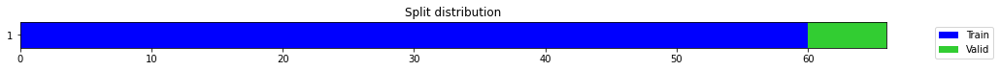

epoch,train_loss,valid_loss,mse,time
0,0.291771,0.178758,0.178758,00:00
1,0.185793,0.089043,0.089043,00:00
2,0.204996,0.198338,0.198338,00:00
3,0.207273,0.171482,0.171482,00:00
4,0.177834,0.192250,0.192250,00:00
5,0.162632,0.333769,0.333769,00:00
6,0.146891,0.020973,0.020973,00:00
7,0.140125,0.595894,0.595894,00:00
8,0.131936,0.376571,0.376571,00:00
9,0.142966,0.044142,0.044142,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1815932889779409,
  "MSE_normalize": 0.03298399943936955,
  "RMSE_normalize": 0.1816149758124851,
  "MAPE_normalize": 0.18791493128226858,
  "MAE": 11713.493512233099,
  "MSE": 137238703.93909183,
  "RMSE": 11714.892399808537,
  "MAPE": 0.0993080556155176
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.5
2022-10-14 20:09:59.166850+07:00
PROGRESS: [ 288 / 1944 ]


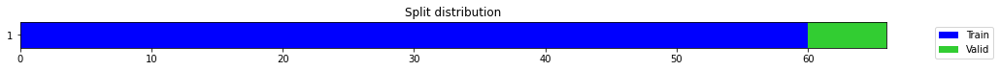

epoch,train_loss,valid_loss,mse,time
0,0.384992,0.295121,0.295121,00:00
1,0.249495,0.054289,0.054289,00:00
2,0.191732,0.002669,0.002669,00:00
3,0.175993,0.003171,0.003171,00:00
4,0.173968,0.067747,0.067747,00:00
5,0.161361,0.618525,0.618525,00:00
6,0.148465,0.540467,0.540467,00:00
7,0.146173,0.160856,0.160856,00:00
8,0.138347,0.007710,0.007710,00:00
9,0.130849,0.400637,0.400637,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1115623414516449,
  "MSE_normalize": 0.012460697058386335,
  "RMSE_normalize": 0.11162749239495769,
  "MAPE_normalize": 0.11549052728773636,
  "MAE": 7196.2172729969025,
  "MSE": 51846044.856205024,
  "RMSE": 7200.41976944435,
  "MAPE": 0.06102255740574628
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:15.744001+07:00
PROGRESS: [ 289 / 1944 ]


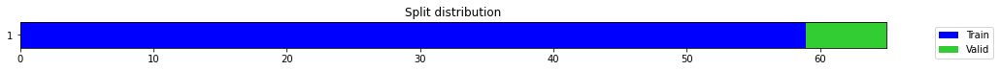

epoch,train_loss,valid_loss,mse,time
0,0.525383,1.152948,1.152948,00:00
1,0.407680,0.314069,0.314069,00:00
2,0.337799,0.000853,0.000853,00:00
3,0.301110,0.064966,0.064966,00:00
4,0.270326,0.136766,0.136766,00:00
5,0.251293,0.106220,0.106220,00:00
6,0.221879,0.090175,0.090175,00:00
7,0.202968,0.135437,0.135437,00:00
8,0.187409,0.158584,0.158584,00:00
9,0.181488,0.167064,0.167064,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.40841446320215863,
  "MSE_normalize": 0.16706384132022004,
  "RMSE_normalize": 0.4087344386276009,
  "MAPE_normalize": 0.422143909689851,
  "MAE": 26344.36653439204,
  "MSE": 695113553.4675882,
  "RMSE": 26365.00622923477,
  "MAPE": 0.22321344059195627
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:17.416543+07:00
PROGRESS: [ 290 / 1944 ]


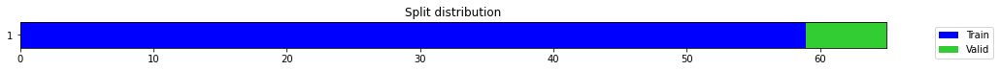

epoch,train_loss,valid_loss,mse,time
0,0.221144,0.981866,0.981866,00:00
1,0.186382,0.409376,0.409376,00:00
2,0.181508,0.091998,0.091998,00:00
3,0.175399,0.106838,0.106838,00:00
4,0.168474,0.532416,0.532416,00:00
5,0.154374,0.455794,0.455794,00:00
6,0.143622,0.150901,0.150901,00:00
7,0.134424,0.937624,0.937624,00:00
8,0.126844,0.782375,0.782375,00:00
9,0.116509,0.181878,0.181878,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.45843300223350525,
  "MSE_normalize": 0.21042587840538177,
  "RMSE_normalize": 0.45872200558222814,
  "MAPE_normalize": 0.47388831295754946,
  "MAE": 29570.762376070023,
  "MSE": 875532843.7560606,
  "RMSE": 29589.404248076044,
  "MAPE": 0.25056284659916944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:21.010124+07:00
PROGRESS: [ 291 / 1944 ]


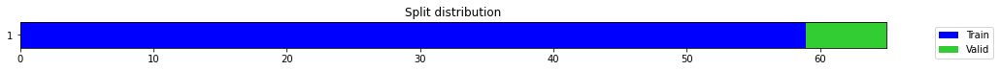

epoch,train_loss,valid_loss,mse,time
0,0.168606,0.013891,0.013891,00:00
1,0.193301,0.031437,0.031437,00:00
2,0.171220,0.060863,0.060863,00:00
3,0.162105,0.078720,0.078720,00:00
4,0.164152,0.056151,0.056151,00:00
5,0.159339,0.002889,0.002889,00:00
6,0.152272,0.002229,0.002229,00:00
7,0.148075,0.082864,0.082864,00:00
8,0.140751,0.225736,0.225736,00:00
9,0.132878,0.252413,0.252413,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.22336219747861227,
  "MSE_normalize": 0.0499013557705054,
  "RMSE_normalize": 0.22338611364743646,
  "MAPE_normalize": 0.23112652309399848,
  "MAE": 14407.755186160406,
  "MSE": 207627865.24224436,
  "RMSE": 14409.297874714242,
  "MAPE": 0.12214707976928897
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:28.247906+07:00
PROGRESS: [ 292 / 1944 ]


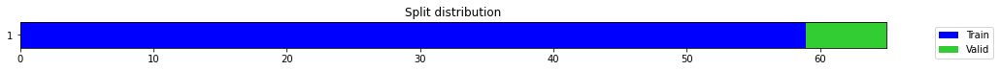

epoch,train_loss,valid_loss,mse,time
0,0.563207,0.197709,0.197709,00:00
1,0.506930,0.207369,0.207369,00:00
2,0.500750,0.174967,0.174967,00:00
3,0.490027,0.123061,0.123061,00:00
4,0.460862,0.043171,0.043171,00:00
5,0.428861,0.005540,0.005540,00:00
6,0.401040,0.003974,0.003974,00:00
7,0.377617,0.018502,0.018502,00:00
8,0.346234,0.000773,0.000773,00:00
9,0.312714,0.030714,0.030714,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.21100294589996338,
  "MSE_normalize": 0.044553784116107664,
  "RMSE_normalize": 0.21107767318242748,
  "MAPE_normalize": 0.21839971477706385,
  "MAE": 13610.534022331238,
  "MSE": 185377870.83450136,
  "RMSE": 13615.354230959301,
  "MAPE": 0.11540565550987843
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:42.419174+07:00
PROGRESS: [ 293 / 1944 ]


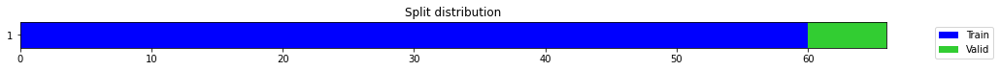

epoch,train_loss,valid_loss,mse,time
0,0.248118,0.358379,0.358379,00:00
1,0.173568,0.038857,0.038857,00:00
2,0.148062,0.052796,0.052796,00:00
3,0.138286,0.265959,0.265959,00:00
4,0.124028,0.341865,0.341865,00:00
5,0.118001,0.020901,0.020901,00:00
6,0.108833,0.113247,0.113247,00:00
7,0.115786,0.197166,0.197166,00:00
8,0.112278,0.166037,0.166037,00:00
9,0.111591,0.170558,0.170558,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.41130220890045166,
  "MSE_normalize": 0.17055774165128076,
  "RMSE_normalize": 0.4129863698129525,
  "MAPE_normalize": 0.4246403783951414,
  "MAE": 26530.637682914734,
  "MSE": 709650855.2283567,
  "RMSE": 26639.272798414688,
  "MAPE": 0.22465542705201194
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:44.094619+07:00
PROGRESS: [ 294 / 1944 ]


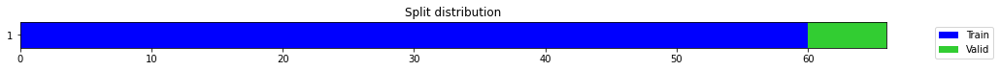

epoch,train_loss,valid_loss,mse,time
0,0.462555,1.040334,1.040334,00:00
1,0.487228,0.639273,0.639273,00:00
2,0.404940,0.062583,0.062583,00:00
3,0.306683,0.209018,0.209018,00:00
4,0.277128,0.295884,0.295884,00:00
5,0.261359,0.032207,0.032207,00:00
6,0.228744,0.045719,0.045719,00:00
7,0.212368,0.038858,0.038858,00:00
8,0.192631,0.034315,0.034315,00:00
9,0.181431,0.244561,0.244561,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.23771677414576212,
  "MSE_normalize": 0.056520168245562274,
  "RMSE_normalize": 0.23773970691822238,
  "MAPE_normalize": 0.2459571194198061,
  "MAE": 15333.68279949824,
  "MSE": 235167195.25473785,
  "RMSE": 15335.162055053017,
  "MAPE": 0.12999065687030548
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:11:47.944530+07:00
PROGRESS: [ 295 / 1944 ]


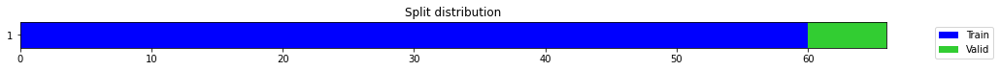

epoch,train_loss,valid_loss,mse,time
0,1.185417,1.285819,1.285819,00:00
1,1.048096,1.053576,1.053576,00:00
2,0.892676,0.672806,0.672806,00:00
3,0.773736,0.213610,0.213610,00:00
4,0.666018,0.008715,0.008715,00:00
5,0.554666,0.469284,0.469284,00:00
6,0.482578,1.037972,1.037972,00:00
7,0.448006,0.774608,0.774608,00:00
8,0.409503,0.071888,0.071888,00:00
9,0.371701,0.198032,0.198032,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07420749465624492,
  "MSE_normalize": 0.005577850523673433,
  "RMSE_normalize": 0.07468500869433861,
  "MAPE_normalize": 0.07694640384208383,
  "MAE": 4786.680235306422,
  "MSE": 23208130.901228223,
  "RMSE": 4817.481800819617,
  "MAPE": 0.04062542512440836
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.6
2022-10-14 20:11:55.756515+07:00
PROGRESS: [ 296 / 1944 ]


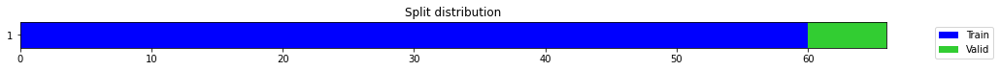

epoch,train_loss,valid_loss,mse,time
0,0.746466,2.200438,2.200438,00:00
1,0.663376,1.840209,1.840209,00:00
2,0.636493,1.454523,1.454523,00:00
3,0.580662,1.002913,1.002913,00:00
4,0.515737,0.532743,0.532743,00:00
5,0.445930,0.142438,0.142438,00:00
6,0.385352,0.000713,0.000713,00:00
7,0.337819,0.166215,0.166215,00:00
8,0.306076,0.381964,0.381964,00:00
9,0.291549,0.431991,0.431991,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.15188905596733093,
  "MSE_normalize": 0.02308279503630158,
  "RMSE_normalize": 0.1519302308176407,
  "MAPE_normalize": 0.15720381778024117,
  "MAE": 9797.451666116714,
  "MSE": 96042109.14133711,
  "RMSE": 9800.107608661096,
  "MAPE": 0.08307128336494025
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:10.520305+07:00
PROGRESS: [ 297 / 1944 ]


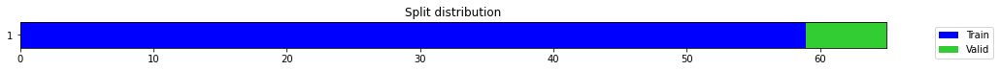

epoch,train_loss,valid_loss,mse,time
0,0.233114,0.038555,0.038555,00:00
1,0.215018,0.080436,0.080436,00:00
2,0.165721,0.009287,0.009287,00:00
3,0.152210,0.195518,0.195518,00:00
4,0.134262,0.428602,0.428602,00:00
5,0.128326,0.282489,0.282489,00:00
6,0.117316,0.736825,0.736825,00:00
7,0.112020,1.027494,1.027494,00:00
8,0.109986,0.829189,0.829189,00:00
9,0.112458,0.736159,0.736159,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.8569643497467041,
  "MSE_normalize": 0.7361593182500944,
  "RMSE_normalize": 0.8579972717031764,
  "MAPE_normalize": 0.8855780934907679,
  "MAE": 55277.6284160614,
  "MSE": 3062986673.736721,
  "RMSE": 55344.25601394169,
  "MAPE": 0.468308101930707
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:12.256299+07:00
PROGRESS: [ 298 / 1944 ]


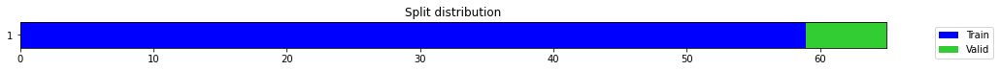

epoch,train_loss,valid_loss,mse,time
0,0.933719,1.429881,1.429881,00:00
1,0.808983,0.656489,0.656489,00:00
2,0.696716,0.029495,0.029495,00:00
3,0.589224,0.074317,0.074317,00:00
4,0.483837,0.185736,0.185736,00:00
5,0.410832,0.019937,0.019937,00:00
6,0.364674,0.001980,0.001980,00:00
7,0.325593,0.022919,0.022919,00:00
8,0.292539,0.472786,0.472786,00:00
9,0.268526,0.451212,0.451212,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.19273321827252707,
  "MSE_normalize": 0.037159391689312926,
  "RMSE_normalize": 0.19276771433337309,
  "MAPE_normalize": 0.19934211849267405,
  "MAE": 12432.063511451086,
  "MSE": 154611534.1161261,
  "RMSE": 12434.288645359899,
  "MAPE": 0.10537200015733889
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:16.192768+07:00
PROGRESS: [ 299 / 1944 ]


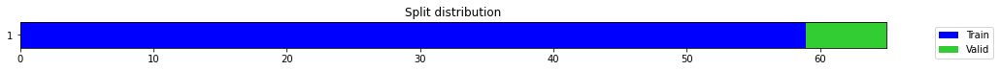

epoch,train_loss,valid_loss,mse,time
0,0.440890,0.125685,0.125685,00:00
1,0.453454,0.080672,0.080672,00:00
2,0.437204,0.009451,0.009451,00:00
3,0.387293,0.041363,0.041363,00:00
4,0.343127,0.154962,0.154962,00:00
5,0.313226,0.219818,0.219818,00:00
6,0.284686,0.158645,0.158645,00:00
7,0.260600,0.024606,0.024606,00:00
8,0.253882,0.020706,0.020706,00:00
9,0.236197,0.000415,0.000415,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1747779647509257,
  "MSE_normalize": 0.03056410787121777,
  "RMSE_normalize": 0.17482593592261353,
  "MAPE_normalize": 0.18072734773478516,
  "MAE": 11273.87783829371,
  "MSE": 127170101.339921,
  "RMSE": 11276.972170752262,
  "MAPE": 0.09554327056270641
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:23.863487+07:00
PROGRESS: [ 300 / 1944 ]


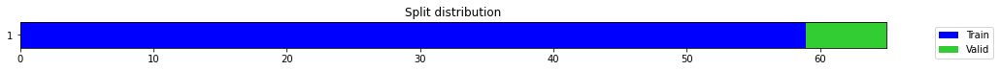

epoch,train_loss,valid_loss,mse,time
0,1.087399,1.806680,1.806680,00:00
1,1.065742,1.466846,1.466846,00:00
2,1.119852,1.160388,1.160388,00:00
3,1.091816,0.853754,0.853754,00:00
4,1.059994,0.501522,0.501522,00:00
5,0.991632,0.222161,0.222161,00:00
6,0.914006,0.051940,0.051940,00:00
7,0.831148,0.000799,0.000799,00:00
8,0.760553,0.038749,0.038749,00:00
9,0.694461,0.095056,0.095056,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2011334796746572,
  "MSE_normalize": 0.040463399414585766,
  "RMSE_normalize": 0.20115516253525725,
  "MAPE_normalize": 0.2081114939504606,
  "MAE": 12973.913972934088,
  "MSE": 168358737.17604277,
  "RMSE": 12975.312604174234,
  "MAPE": 0.10998735728779334
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.8
2022-10-14 20:12:39.179762+07:00
PROGRESS: [ 301 / 1944 ]


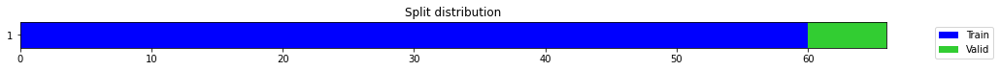

epoch,train_loss,valid_loss,mse,time
0,0.863172,1.547512,1.547512,00:00
1,0.740873,0.052531,0.052531,00:00
2,0.527161,0.253169,0.253169,00:00
3,0.474009,0.129508,0.129508,00:00
4,0.401068,0.007320,0.007320,00:00
5,0.351176,0.581462,0.581462,00:00
6,0.320946,0.740808,0.740808,00:00
7,0.295372,0.475415,0.475415,00:00
8,0.276751,0.304289,0.304289,00:00
9,0.250942,0.265811,0.265811,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5155230710903803,
  "MSE_normalize": 0.26581110329660634,
  "RMSE_normalize": 0.5155687183068871,
  "MAPE_normalize": 0.5331895661140651,
  "MAE": 33253.30017761389,
  "MSE": 1105977805.271985,
  "RMSE": 33256.244605667445,
  "MAPE": 0.2818461369351381
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:41.297437+07:00
PROGRESS: [ 302 / 1944 ]


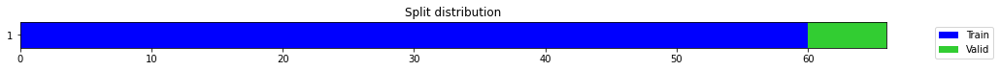

epoch,train_loss,valid_loss,mse,time
0,0.527261,0.472911,0.472911,00:00
1,0.392108,0.183087,0.183087,00:00
2,0.331119,0.018192,0.018192,00:00
3,0.279851,0.289826,0.289826,00:00
4,0.266980,0.128357,0.128357,00:00
5,0.235643,0.004632,0.004632,00:00
6,0.217638,0.213202,0.213202,00:00
7,0.206780,0.186960,0.186960,00:00
8,0.192631,0.770097,0.770097,00:00
9,0.177661,0.016847,0.016847,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.023334691921869915,
  "MSE_normalize": 0.0005907119094145467,
  "RMSE_normalize": 0.024304565608431406,
  "MAPE_normalize": 0.02429162697996981,
  "MAE": 1505.180967728297,
  "MSE": 2457814.0379385166,
  "RMSE": 1567.7417000062594,
  "MAPE": 0.012801412287437586
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.7
2022-10-14 20:12:46.552968+07:00
PROGRESS: [ 303 / 1944 ]


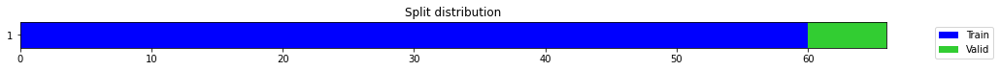

epoch,train_loss,valid_loss,mse,time
0,0.749837,1.950725,1.950725,00:00
1,0.677246,1.377165,1.377165,00:00
2,0.577140,0.641996,0.641996,00:00
3,0.469905,0.080141,0.080141,00:00
4,0.381605,0.130732,0.130732,00:00
5,0.345884,0.426485,0.426485,00:00
6,0.321366,0.219183,0.219183,00:00
7,0.288895,0.002684,0.002684,00:00
8,0.267703,0.131222,0.131222,00:00
9,0.249071,0.394302,0.394302,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09662081797917683,
  "MSE_normalize": 0.009380752594244276,
  "RMSE_normalize": 0.09685428536850745,
  "MAPE_normalize": 0.10009447787236608,
  "MAE": 6232.4292429288225,
  "MSE": 39031116.59863543,
  "RMSE": 6247.488823410205,
  "MAPE": 0.05286988325767215
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.8
2022-10-14 20:12:54.720047+07:00
PROGRESS: [ 304 / 1944 ]


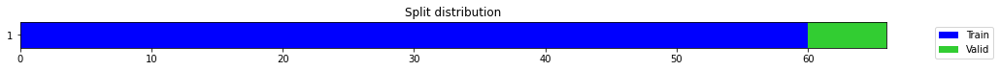

epoch,train_loss,valid_loss,mse,time
0,0.606561,0.865715,0.865715,00:00
1,0.514260,0.734254,0.734254,00:00
2,0.434249,0.518704,0.518704,00:00
3,0.383523,0.256618,0.256618,00:00
4,0.354516,0.044198,0.044198,00:00
5,0.313131,0.032359,0.032359,00:00
6,0.294039,0.276566,0.276566,00:00
7,0.267315,0.676433,0.676433,00:00
8,0.255278,0.558731,0.558731,00:00
9,0.259907,0.089842,0.089842,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.21237452824910483,
  "MSE_normalize": 0.04519452171302992,
  "RMSE_normalize": 0.21259003201709603,
  "MAPE_normalize": 0.21948956148353913,
  "MAE": 13699.006570180258,
  "MSE": 188043830.05294898,
  "RMSE": 13712.907425230762,
  "MAPE": 0.11606371830827182
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.9
2022-10-14 20:13:11.787203+07:00
PROGRESS: [ 305 / 1944 ]


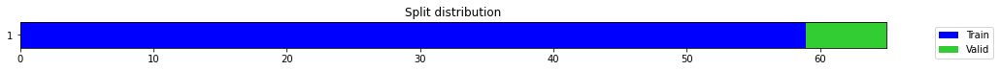

epoch,train_loss,valid_loss,mse,time
0,0.606384,0.893615,0.893615,00:00
1,0.491348,0.024459,0.024459,00:00
2,0.389048,0.058180,0.058180,00:00
3,0.329927,0.068962,0.068962,00:00
4,0.285230,0.134089,0.134089,00:00
5,0.249316,0.085339,0.085339,00:00
6,0.221356,0.270866,0.270866,00:00
7,0.200049,0.225303,0.225303,00:00
8,0.181438,0.154063,0.154063,00:00
9,0.170522,0.139024,0.139024,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3723112841447194,
  "MSE_normalize": 0.13902369636702083,
  "RMSE_normalize": 0.3728588155951537,
  "MAPE_normalize": 0.3846990738941261,
  "MAE": 24015.56707247098,
  "MSE": 578445071.2626029,
  "RMSE": 24050.885041149795,
  "MAPE": 0.20344603364570082
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.9
2022-10-14 20:13:13.925550+07:00
PROGRESS: [ 306 / 1944 ]


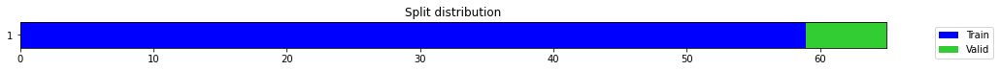

epoch,train_loss,valid_loss,mse,time
0,0.268666,0.013676,0.013676,00:00
1,0.316273,0.000714,0.000714,00:00
2,0.306138,0.100408,0.100408,00:00
3,0.271867,0.003243,0.003243,00:00
4,0.229736,0.033601,0.033601,00:00
5,0.215634,0.352887,0.352887,00:00
6,0.190153,0.766220,0.766220,00:00
7,0.173348,0.016564,0.016564,00:00
8,0.162694,0.026206,0.026206,00:00
9,0.153264,0.127815,0.127815,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19867185751597086,
  "MSE_normalize": 0.03948675564072227,
  "RMSE_normalize": 0.19871274654818263,
  "MAPE_normalize": 0.2054662127722153,
  "MAE": 12815.129497210184,
  "MSE": 164295150.95201355,
  "RMSE": 12817.767003343974,
  "MAPE": 0.10861375185228016
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.9
2022-10-14 20:13:18.895172+07:00
PROGRESS: [ 307 / 1944 ]


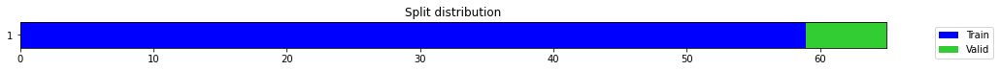

epoch,train_loss,valid_loss,mse,time
0,0.305965,0.460672,0.460672,00:00
1,0.335422,0.367320,0.367320,00:00
2,0.365391,0.120012,0.120012,00:00
3,0.333715,0.009909,0.009909,00:00
4,0.293237,0.093571,0.093571,00:00
5,0.257724,0.021981,0.021981,00:00
6,0.235832,0.004933,0.004933,00:00
7,0.217852,0.258765,0.258765,00:00
8,0.201031,0.023261,0.023261,00:00
9,0.188024,0.079990,0.079990,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1757577657699585,
  "MSE_normalize": 0.03092415057368451,
  "RMSE_normalize": 0.17585263880216445,
  "MAPE_normalize": 0.18194742281772033,
  "MAE": 11337.078923225403,
  "MSE": 128668154.78065342,
  "RMSE": 11343.198613294815,
  "MAPE": 0.09613669352873133
}
Percent CPU Usage: 100.0
Percent Ram Usage: 15.9
2022-10-14 20:13:28.402028+07:00
PROGRESS: [ 308 / 1944 ]


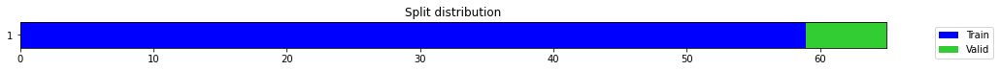

epoch,train_loss,valid_loss,mse,time
0,1.043979,2.798936,2.798936,00:00
1,0.889755,2.069161,2.069161,00:00
2,0.848980,1.361896,1.361896,00:00
3,0.816507,0.721192,0.721192,00:00
4,0.732965,0.233164,0.233164,00:00
5,0.669492,0.005315,0.005315,00:00
6,0.602457,0.097806,0.097806,00:00
7,0.546907,0.304340,0.304340,00:00
8,0.497323,0.409020,0.409020,00:00
9,0.448406,0.281008,0.281008,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.021896392107009888,
  "MSE_normalize": 0.0005265317607759575,
  "RMSE_normalize": 0.022946279889689256,
  "MAPE_normalize": 0.02279309175052528,
  "MAE": 1412.4048764705658,
  "MSE": 2190775.4565812456,
  "RMSE": 1480.1268380045155,
  "MAPE": 0.01201204378893514
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.0
2022-10-14 20:13:46.842366+07:00
PROGRESS: [ 309 / 1944 ]


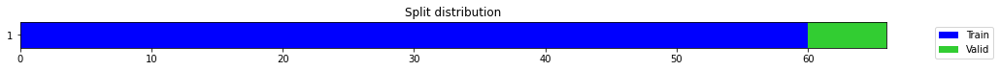

epoch,train_loss,valid_loss,mse,time
0,0.121318,0.072449,0.072449,00:00
1,0.133625,0.018575,0.018575,00:00
2,0.133959,0.049355,0.049355,00:00
3,0.120240,0.029367,0.029367,00:00
4,0.108705,0.060527,0.060527,00:00
5,0.105252,0.177396,0.177396,00:00
6,0.099485,0.068453,0.068453,00:00
7,0.097752,0.143281,0.143281,00:00
8,0.092707,0.175065,0.175065,00:00
9,0.090594,0.160588,0.160588,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.40041084090868634,
  "MSE_normalize": 0.1605876660031876,
  "RMSE_normalize": 0.40073390922554536,
  "MAPE_normalize": 0.41386937932140344,
  "MAE": 25828.100881973904,
  "MSE": 668167703.2948215,
  "RMSE": 25848.940080684577,
  "MAPE": 0.21883852268188972
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.0
2022-10-14 20:13:49.146013+07:00
PROGRESS: [ 310 / 1944 ]


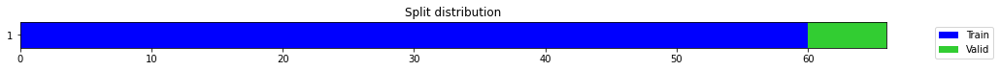

epoch,train_loss,valid_loss,mse,time
0,0.337045,1.401215,1.401215,00:00
1,0.348873,0.304785,0.304785,00:00
2,0.276111,0.018503,0.018503,00:00
3,0.250243,0.611891,0.611891,00:00
4,0.240510,0.420856,0.420856,00:00
5,0.229935,0.048487,0.048487,00:00
6,0.220667,0.091787,0.091787,00:00
7,0.202277,0.287622,0.287622,00:00
8,0.194801,0.106463,0.106463,00:00
9,0.176280,0.205696,0.205696,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09981578588485718,
  "MSE_normalize": 0.010072131858305985,
  "RMSE_normalize": 0.1003600112510256,
  "MAPE_normalize": 0.10347876765923363,
  "MAE": 6438.517452716827,
  "MSE": 41907783.94471046,
  "RMSE": 6473.622165736155,
  "MAPE": 0.054638941822805674
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.1
2022-10-14 20:13:54.696983+07:00
PROGRESS: [ 311 / 1944 ]


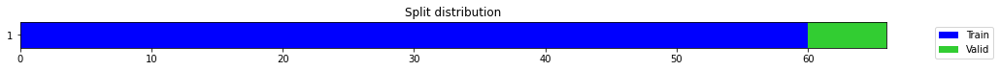

epoch,train_loss,valid_loss,mse,time
0,0.450115,0.129824,0.129824,00:00
1,0.310543,0.110414,0.110414,00:00
2,0.238869,0.056836,0.056836,00:00
3,0.212162,0.003821,0.003821,00:00
4,0.190669,0.155760,0.155760,00:00
5,0.200398,0.142186,0.142186,00:00
6,0.186404,0.028603,0.028603,00:00
7,0.172030,0.213312,0.213312,00:00
8,0.161085,0.213686,0.213686,00:00
9,0.150196,0.080361,0.080361,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12064972519874573,
  "MSE_normalize": 0.01458716297169301,
  "RMSE_normalize": 0.12077732805329405,
  "MAPE_normalize": 0.1246984879687535,
  "MAE": 7782.389874219894,
  "MSE": 60693771.96247384,
  "RMSE": 7790.620768749679,
  "MAPE": 0.06593757750986835
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.1
2022-10-14 20:14:05.606059+07:00
PROGRESS: [ 312 / 1944 ]


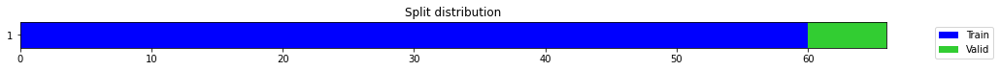

epoch,train_loss,valid_loss,mse,time
0,0.225078,1.030335,1.030335,00:00
1,0.230488,0.692646,0.692646,00:00
2,0.229941,0.367724,0.367724,00:00
3,0.190413,0.101211,0.101211,00:00
4,0.171041,0.001039,0.001039,00:00
5,0.152188,0.023428,0.023428,00:00
6,0.153441,0.064200,0.064200,00:00
7,0.150701,0.015850,0.015850,00:00
8,0.149447,0.025094,0.025094,00:00
9,0.141805,0.088578,0.088578,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07853610316912334,
  "MSE_normalize": 0.006171713885320784,
  "RMSE_normalize": 0.07856025639800818,
  "MAPE_normalize": 0.08122648465780914,
  "MAE": 5065.892798821132,
  "MSE": 25679057.394518036,
  "RMSE": 5067.450778697119,
  "MAPE": 0.0429369277865842
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.1
2022-10-14 20:14:25.912594+07:00
PROGRESS: [ 313 / 1944 ]


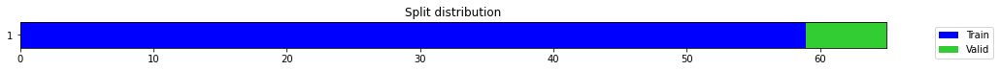

epoch,train_loss,valid_loss,mse,time
0,0.412340,0.151918,0.151918,00:00
1,0.311007,0.221384,0.221384,00:00
2,0.252869,0.019100,0.019100,00:00
3,0.226869,0.059680,0.059680,00:00
4,0.198206,1.358823,1.358823,00:00
5,0.187815,1.700191,1.700191,00:00
6,0.175389,0.767862,0.767862,00:00
7,0.161503,0.130105,0.130105,00:00
8,0.153567,0.023501,0.023501,00:00
9,0.145602,0.010122,0.010122,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10010160009066264,
  "MSE_normalize": 0.010121943331039182,
  "RMSE_normalize": 0.10060786913079504,
  "MAPE_normalize": 0.1037679378310855,
  "MAE": 6456.953612248103,
  "MSE": 42115037.827665664,
  "RMSE": 6489.609990412803,
  "MAPE": 0.05479328415652326
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.1
2022-10-14 20:14:28.183574+07:00
PROGRESS: [ 314 / 1944 ]


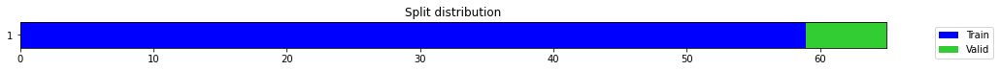

epoch,train_loss,valid_loss,mse,time
0,0.241603,0.052560,0.052560,00:00
1,0.217360,0.215578,0.215578,00:00
2,0.221138,0.263544,0.263544,00:00
3,0.201456,0.165497,0.165497,00:00
4,0.196719,1.333193,1.333193,00:00
5,0.175922,0.480886,0.480886,00:00
6,0.161680,0.026945,0.026945,00:00
7,0.153115,0.612048,0.612048,00:00
8,0.147205,0.011318,0.011318,00:00
9,0.144555,0.001345,0.001345,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.42167846361796063,
  "MSE_normalize": 0.1778426660076183,
  "RMSE_normalize": 0.42171396231049585,
  "MAPE_normalize": 0.4361212251416347,
  "MAE": 27199.947617212933,
  "MSE": 739961720.9193367,
  "RMSE": 27202.237424876224,
  "MAPE": 0.2305374797598364
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.1
2022-10-14 20:14:33.214708+07:00
PROGRESS: [ 315 / 1944 ]


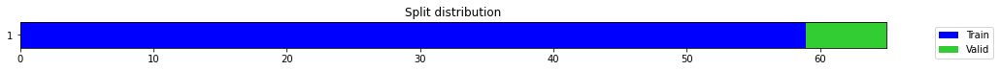

epoch,train_loss,valid_loss,mse,time
0,0.551132,1.027894,1.027894,00:00
1,0.438081,0.316340,0.316340,00:00
2,0.359555,0.005507,0.005507,00:00
3,0.306162,0.492663,0.492663,00:00
4,0.299493,0.496542,0.496542,00:00
5,0.278828,0.013916,0.013916,00:00
6,0.256755,0.705896,0.705896,00:00
7,0.232480,1.104351,1.104351,00:00
8,0.221223,0.099199,0.099199,00:00
9,0.211648,0.971562,0.971562,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.28858386476834613,
  "MSE_normalize": 0.08330519313532214,
  "RMSE_normalize": 0.28862639022674647,
  "MAPE_normalize": 0.29844811545151556,
  "MAE": 18614.8136130174,
  "MSE": 346613416.5537649,
  "RMSE": 18617.556675186057,
  "MAPE": 0.1577672070012539
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.2
2022-10-14 20:14:43.105521+07:00
PROGRESS: [ 316 / 1944 ]


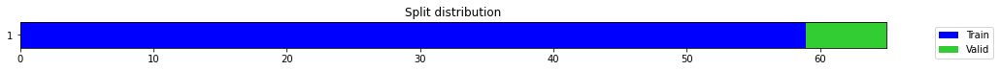

epoch,train_loss,valid_loss,mse,time
0,0.311637,0.672101,0.672101,00:00
1,0.270156,0.372612,0.372612,00:00
2,0.238808,0.184785,0.184785,00:00
3,0.225747,0.105594,0.105594,00:00
4,0.213642,0.156359,0.156359,00:00
5,0.198414,0.419916,0.419916,00:00
6,0.190967,0.485343,0.485343,00:00
7,0.187323,0.187537,0.187537,00:00
8,0.184234,0.035958,0.035958,00:00
9,0.173076,0.144540,0.144540,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10853084921836853,
  "MSE_normalize": 0.011796738396604075,
  "RMSE_normalize": 0.10861279112795176,
  "MAPE_normalize": 0.11235026526876564,
  "MAE": 7000.673897981644,
  "MSE": 49083468.22023257,
  "RMSE": 7005.9594789174,
  "MAPE": 0.05936385720835277
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.3
2022-10-14 20:15:02.906363+07:00
PROGRESS: [ 317 / 1944 ]


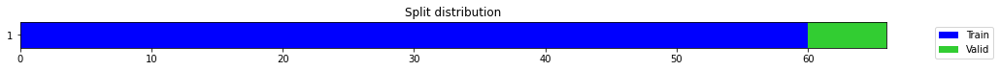

epoch,train_loss,valid_loss,mse,time
0,0.149866,0.013500,0.013500,00:00
1,0.168324,0.453324,0.453324,00:00
2,0.160644,1.306079,1.306079,00:00
3,0.174997,0.000476,0.000476,00:00
4,0.176823,0.083328,0.083328,00:00
5,0.163631,0.086433,0.086433,00:00
6,0.154145,0.719956,0.719956,00:00
7,0.146796,0.359792,0.359792,00:00
8,0.138731,0.161801,0.161801,00:00
9,0.128575,0.139882,0.139882,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3740057448546092,
  "MSE_normalize": 0.13988189461157377,
  "RMSE_normalize": 0.3740078804137338,
  "MAPE_normalize": 0.38691963370326454,
  "MAE": 24124.86656610171,
  "MSE": 582015833.3535298,
  "RMSE": 24125.004318207484,
  "MAPE": 0.20450311139946462
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.3
2022-10-14 20:15:05.393436+07:00
PROGRESS: [ 318 / 1944 ]


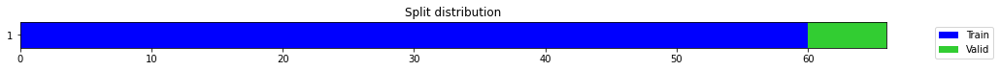

epoch,train_loss,valid_loss,mse,time
0,0.417401,0.555080,0.555080,00:00
1,0.283172,0.036978,0.036978,00:00
2,0.225933,0.182216,0.182216,00:00
3,0.237018,0.219947,0.219947,00:00
4,0.210165,0.461521,0.461521,00:00
5,0.209421,0.058455,0.058455,00:00
6,0.195566,0.027296,0.027296,00:00
7,0.193300,0.007909,0.007909,00:00
8,0.178221,0.037478,0.037478,00:00
9,0.169742,0.001129,0.001129,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1376755932966868,
  "MSE_normalize": 0.01916053493384536,
  "RMSE_normalize": 0.13842158406059857,
  "MAPE_normalize": 0.14274675760694047,
  "MAE": 8880.626470009485,
  "MSE": 79722502.60112457,
  "RMSE": 8928.74585824485,
  "MAPE": 0.07536857512457888
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.3
2022-10-14 20:15:11.257535+07:00
PROGRESS: [ 319 / 1944 ]


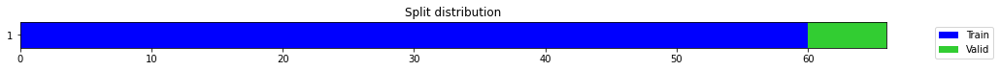

epoch,train_loss,valid_loss,mse,time
0,0.343052,0.615156,0.615156,00:00
1,0.316737,0.226294,0.226294,00:00
2,0.239429,0.001568,0.001568,00:00
3,0.214745,0.221776,0.221776,00:00
4,0.203241,0.123108,0.123108,00:00
5,0.196660,0.004225,0.004225,00:00
6,0.185631,0.521116,0.521116,00:00
7,0.177212,0.899607,0.899607,00:00
8,0.162573,0.036908,0.036908,00:00
9,0.156012,0.261561,0.261561,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10588014125823975,
  "MSE_normalize": 0.011504199183969869,
  "RMSE_normalize": 0.10725762995689336,
  "MAPE_normalize": 0.10992713099408731,
  "MAE": 6829.692631721497,
  "MSE": 47866281.00595677,
  "RMSE": 6918.54616273945,
  "MAPE": 0.058003597311851444
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.4
2022-10-14 20:15:22.644757+07:00
PROGRESS: [ 320 / 1944 ]


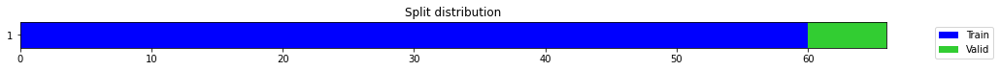

epoch,train_loss,valid_loss,mse,time
0,0.315258,0.554815,0.554815,00:00
1,0.278908,0.215612,0.215612,00:00
2,0.256318,0.022640,0.022640,00:00
3,0.236960,0.029948,0.029948,00:00
4,0.211322,0.111556,0.111556,00:00
5,0.194635,0.127606,0.127606,00:00
6,0.186670,0.094004,0.094004,00:00
7,0.174031,0.028080,0.028080,00:00
8,0.167259,0.003252,0.003252,00:00
9,0.164365,0.373579,0.373579,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3036237557729085,
  "MSE_normalize": 0.0922103819062059,
  "RMSE_normalize": 0.30366162402616154,
  "MAPE_normalize": 0.3142006167539984,
  "MAE": 19584.94674237569,
  "MSE": 383665823.3577228,
  "RMSE": 19587.389396183524,
  "MAPE": 0.16604485548358697
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.4
2022-10-14 20:15:44.805925+07:00
PROGRESS: [ 321 / 1944 ]


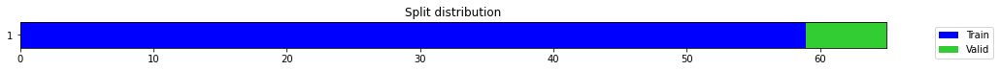

epoch,train_loss,valid_loss,mse,time
0,0.232623,0.223891,0.223891,00:00
1,0.254989,0.132904,0.132904,00:00
2,0.239516,1.165530,1.165530,00:00
3,0.204031,0.027601,0.027601,00:00
4,0.184738,0.711275,0.711275,00:00
5,0.186489,0.024478,0.024478,00:00
6,0.177428,0.173161,0.173161,00:00
7,0.177984,0.001672,0.001672,00:00
8,0.169505,0.121431,0.121431,00:00
9,0.156164,0.159476,0.159476,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.39880210161209106,
  "MSE_normalize": 0.15947570046868975,
  "RMSE_normalize": 0.39934408780986075,
  "MAPE_normalize": 0.4120885463106673,
  "MAE": 25724.330762386322,
  "MSE": 663541074.8879195,
  "RMSE": 25759.291040087257,
  "MAPE": 0.21792651093989882
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.4
2022-10-14 20:15:47.235029+07:00
PROGRESS: [ 322 / 1944 ]


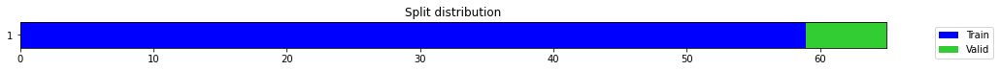

epoch,train_loss,valid_loss,mse,time
0,0.580434,0.781964,0.781964,00:00
1,0.540996,0.302324,0.302324,00:00
2,0.449222,0.103780,0.103780,00:00
3,0.365254,0.077593,0.077593,00:00
4,0.319097,0.107933,0.107933,00:00
5,0.283104,0.434153,0.434153,00:00
6,0.252503,0.125579,0.125579,00:00
7,0.233246,0.024205,0.024205,00:00
8,0.214965,0.081984,0.081984,00:00
9,0.197672,0.381047,0.381047,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2512832085291545,
  "MSE_normalize": 0.06340078720086122,
  "RMSE_normalize": 0.25179512942243587,
  "MAPE_normalize": 0.25958735668864397,
  "MAE": 16208.772082964579,
  "MSE": 263795840.7729911,
  "RMSE": 16241.793028264801,
  "MAPE": 0.13729550070995514
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.5
2022-10-14 20:15:53.058057+07:00
PROGRESS: [ 323 / 1944 ]


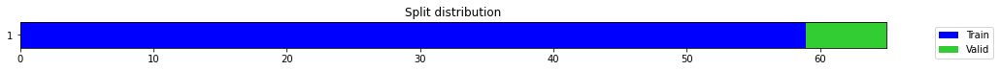

epoch,train_loss,valid_loss,mse,time
0,0.424470,0.713280,0.713280,00:00
1,0.374477,0.222581,0.222581,00:00
2,0.357294,0.007204,0.007204,00:00
3,0.317771,0.003796,0.003796,00:00
4,0.284514,0.003185,0.003185,00:00
5,0.254620,0.002528,0.002528,00:00
6,0.229958,0.091234,0.091234,00:00
7,0.212806,0.954896,0.954896,00:00
8,0.197267,2.025662,2.025662,00:00
9,0.181732,1.219839,1.219839,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.25899624824523926,
  "MSE_normalize": 0.06709266655947015,
  "RMSE_normalize": 0.2590225213364084,
  "MAPE_normalize": 0.26790247507858206,
  "MAE": 16706.293996810913,
  "MSE": 279156886.943463,
  "RMSE": 16707.98871628369,
  "MAPE": 0.14160668232836235
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.5
2022-10-14 20:16:05.415208+07:00
PROGRESS: [ 324 / 1944 ]


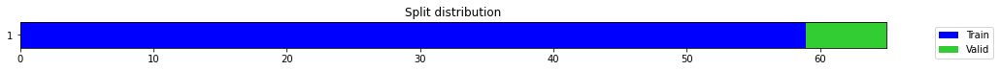

epoch,train_loss,valid_loss,mse,time
0,0.965558,1.088989,1.088989,00:00
1,0.755942,0.433179,0.433179,00:00
2,0.604908,0.061911,0.061911,00:00
3,0.527529,0.016374,0.016374,00:00
4,0.472830,0.191780,0.191780,00:00
5,0.432737,0.481363,0.481363,00:00
6,0.391518,0.521187,0.521187,00:00
7,0.352410,0.279687,0.279687,00:00
8,0.331464,0.052402,0.052402,00:00
9,0.314425,0.018034,0.018034,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.17175082365671793,
  "MSE_normalize": 0.029513598341430008,
  "RMSE_normalize": 0.17179522211467352,
  "MAPE_normalize": 0.17774559369460455,
  "MAE": 11078.615129152933,
  "MSE": 122799176.98889594,
  "RMSE": 11081.479007284901,
  "MAPE": 0.09392988489414296
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.6
2022-10-14 20:16:27.614238+07:00
PROGRESS: [ 325 / 1944 ]


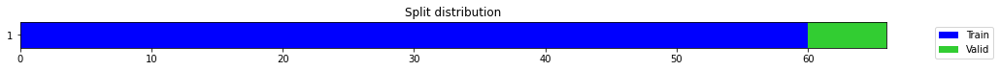

epoch,train_loss,valid_loss,mse,time
0,0.540232,0.320142,0.320142,00:00
1,0.396132,0.361665,0.361665,00:00
2,0.390837,0.013959,0.013959,00:00
3,0.321603,0.268059,0.268059,00:00
4,0.286859,0.208066,0.208066,00:00
5,0.253877,0.149929,0.149929,00:00
6,0.219770,0.049310,0.049310,00:00
7,0.198435,0.001624,0.001624,00:00
8,0.181755,0.012524,0.012524,00:00
9,0.167599,0.011820,0.011820,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10775665442148845,
  "MSE_normalize": 0.011820457459376618,
  "RMSE_normalize": 0.1087219272243489,
  "MAPE_normalize": 0.1117974421992669,
  "MAE": 6950.735236803691,
  "MSE": 49182157.69054792,
  "RMSE": 7012.9991936794,
  "MAPE": 0.05900974817349974
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.6
2022-10-14 20:16:30.372725+07:00
PROGRESS: [ 326 / 1944 ]


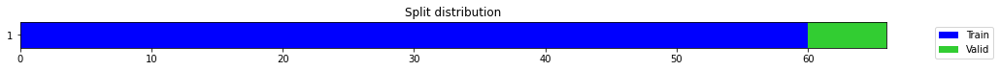

epoch,train_loss,valid_loss,mse,time
0,0.374664,0.042479,0.042479,00:00
1,0.303761,0.176689,0.176689,00:00
2,0.312413,0.362365,0.362365,00:00
3,0.267203,0.012684,0.012684,00:00
4,0.230773,0.568499,0.568499,00:00
5,0.214951,0.211499,0.211499,00:00
6,0.198742,0.027631,0.027631,00:00
7,0.188321,0.183636,0.183636,00:00
8,0.179510,0.079406,0.079406,00:00
9,0.167689,0.519010,0.519010,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.21013092994689941,
  "MSE_normalize": 0.04451396757142945,
  "RMSE_normalize": 0.21098333481919715,
  "MAPE_normalize": 0.2178224187404025,
  "MAE": 13554.2855052948,
  "MSE": 185212203.5085297,
  "RMSE": 13609.269029177492,
  "MAPE": 0.11501960354457501
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.6
2022-10-14 20:16:36.926466+07:00
PROGRESS: [ 327 / 1944 ]


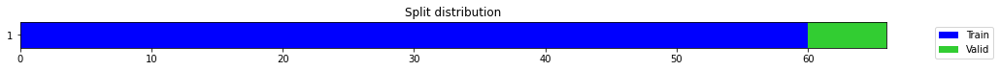

epoch,train_loss,valid_loss,mse,time
0,0.178114,0.098500,0.098500,00:00
1,0.140035,0.005909,0.005909,00:00
2,0.128298,0.069571,0.069571,00:00
3,0.136945,0.215242,0.215242,00:00
4,0.144644,0.010676,0.010676,00:00
5,0.135095,0.000687,0.000687,00:00
6,0.136300,0.106635,0.106635,00:00
7,0.127864,0.007899,0.007899,00:00
8,0.125884,0.062436,0.062436,00:00
9,0.119675,0.000650,0.000650,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.285047044356664,
  "MSE_normalize": 0.08128655179125784,
  "RMSE_normalize": 0.2851079651487447,
  "MAPE_normalize": 0.2947616488444985,
  "MAE": 18386.674549182255,
  "MSE": 338214322.25088954,
  "RMSE": 18390.60418395463,
  "MAPE": 0.155825644729886
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.8
2022-10-14 20:16:49.684487+07:00
PROGRESS: [ 328 / 1944 ]


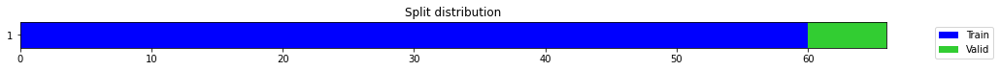

epoch,train_loss,valid_loss,mse,time
0,0.396403,0.635544,0.635544,00:00
1,0.299518,0.204873,0.204873,00:00
2,0.268556,0.008327,0.008327,00:00
3,0.231095,0.085038,0.085038,00:00
4,0.196071,0.255248,0.255248,00:00
5,0.206172,0.249312,0.249312,00:00
6,0.203459,0.053255,0.053255,00:00
7,0.192147,0.033570,0.033570,00:00
8,0.172007,0.310916,0.310916,00:00
9,0.170373,0.441862,0.441862,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11216964324315389,
  "MSE_normalize": 0.012707854665266657,
  "RMSE_normalize": 0.11272912075088076,
  "MAPE_normalize": 0.11629765113850687,
  "MAE": 7235.390667756398,
  "MSE": 52874409.82750856,
  "RMSE": 7271.479204914813,
  "MAPE": 0.06140463327743526
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.9
2022-10-14 20:17:15.492667+07:00
PROGRESS: [ 329 / 1944 ]


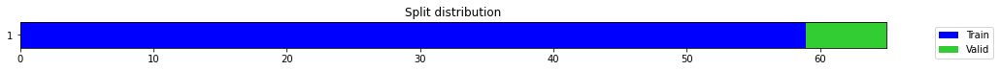

epoch,train_loss,valid_loss,mse,time
0,0.400581,0.120175,0.120175,00:00
1,0.294883,0.164978,0.164978,00:00
2,0.255687,2.463699,2.463699,00:00
3,0.288693,0.090274,0.090274,00:00
4,0.308197,0.387841,0.387841,00:00
5,0.278915,2.061054,2.061054,00:00
6,0.267530,0.029248,0.029248,00:00
7,0.236154,0.235084,0.235084,00:00
8,0.222937,0.335938,0.335938,00:00
9,0.206022,0.230060,0.230060,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.47893257935841876,
  "MSE_normalize": 0.2300599807139546,
  "RMSE_normalize": 0.4796456824719207,
  "MAPE_normalize": 0.4948799606894209,
  "MAE": 30893.067098935444,
  "MSE": 957225749.3962377,
  "RMSE": 30939.065102168774,
  "MAPE": 0.26171154412002523
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.9
2022-10-14 20:17:18.422536+07:00
PROGRESS: [ 330 / 1944 ]


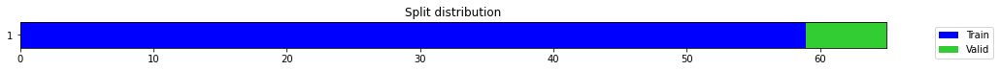

epoch,train_loss,valid_loss,mse,time
0,0.686849,0.364660,0.364660,00:00
1,0.487336,0.017911,0.017911,00:00
2,0.388639,0.004292,0.004292,00:00
3,0.321710,0.040035,0.040035,00:00
4,0.297735,0.019441,0.019441,00:00
5,0.267343,2.040250,2.040250,00:00
6,0.241467,1.404807,1.404807,00:00
7,0.232240,0.000592,0.000592,00:00
8,0.209720,1.007541,1.007541,00:00
9,0.191544,0.168548,0.168548,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.23645885785420737,
  "MSE_normalize": 0.05605313185170857,
  "RMSE_normalize": 0.2367554262349832,
  "MAPE_normalize": 0.24435093165169416,
  "MAE": 15252.542167027792,
  "MSE": 233223966.09895614,
  "RMSE": 15271.672013861355,
  "MAPE": 0.12921751569456819
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.9
2022-10-14 20:17:25.285865+07:00
PROGRESS: [ 331 / 1944 ]


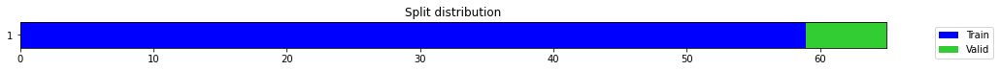

epoch,train_loss,valid_loss,mse,time
0,0.413698,0.358551,0.358551,00:00
1,0.346253,0.027473,0.027473,00:00
2,0.317560,0.076703,0.076703,00:00
3,0.277564,0.397399,0.397399,00:00
4,0.235287,0.114182,0.114182,00:00
5,0.218673,0.009208,0.009208,00:00
6,0.217360,0.151345,0.151345,00:00
7,0.202406,0.010210,0.010210,00:00
8,0.195820,1.090325,1.090325,00:00
9,0.183571,0.135576,0.135576,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.007852335770924887,
  "MSE_normalize": 7.673643980391869e-05,
  "RMSE_normalize": 0.008759933778512181,
  "MAPE_normalize": 0.008195870644138062,
  "MAE": 506.50706656773883,
  "MSE": 319282.3709249745,
  "RMSE": 565.0507684491496,
  "MAPE": 0.004313713144703482
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.9
2022-10-14 20:17:39.085062+07:00
PROGRESS: [ 332 / 1944 ]


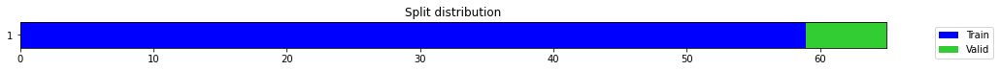

epoch,train_loss,valid_loss,mse,time
0,0.541233,0.472833,0.472833,00:00
1,0.474448,0.174030,0.174030,00:00
2,0.407553,0.026254,0.026254,00:00
3,0.357941,0.007626,0.007626,00:00
4,0.319543,0.062112,0.062112,00:00
5,0.294380,0.050897,0.050897,00:00
6,0.266934,0.004208,0.004208,00:00
7,0.247917,0.010079,0.010079,00:00
8,0.233849,0.021447,0.021447,00:00
9,0.222896,0.243969,0.243969,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2360814313093821,
  "MSE_normalize": 0.055740763756733834,
  "RMSE_normalize": 0.23609481941951593,
  "MAPE_normalize": 0.24422386057485437,
  "MAE": 15228.196645180384,
  "MSE": 231924275.54490265,
  "RMSE": 15229.060231836456,
  "MAPE": 0.12908475618712442
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:18:08.974655+07:00
PROGRESS: [ 333 / 1944 ]


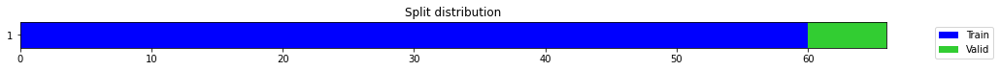

epoch,train_loss,valid_loss,mse,time
0,0.474044,0.276418,0.276418,00:00
1,0.317380,0.421931,0.421931,00:00
2,0.286999,0.003890,0.003890,00:00
3,0.275140,0.048260,0.048260,00:00
4,0.255164,0.028546,0.028546,00:00
5,0.228746,0.775335,0.775335,00:00
6,0.200165,0.285335,0.285335,00:00
7,0.188960,0.028736,0.028736,00:00
8,0.176293,0.004182,0.004182,00:00
9,0.168603,0.005441,0.005441,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.073335866133372,
  "MSE_normalize": 0.005440849245382869,
  "RMSE_normalize": 0.0737621125333519,
  "MAPE_normalize": 0.076033633320458,
  "MAE": 4730.456709067027,
  "MSE": 22638100.63836829,
  "RMSE": 4757.9513068513315,
  "MAPE": 0.04014571152454244
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:18:12.675456+07:00
PROGRESS: [ 334 / 1944 ]


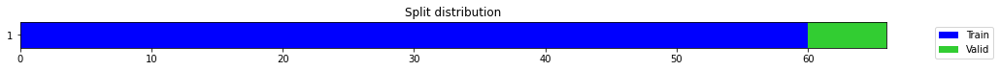

epoch,train_loss,valid_loss,mse,time
0,0.424927,0.229402,0.229402,00:00
1,0.289563,0.007889,0.007889,00:00
2,0.263315,0.028799,0.028799,00:00
3,0.254769,0.050780,0.050780,00:00
4,0.234009,0.766325,0.766325,00:00
5,0.206474,0.001945,0.001945,00:00
6,0.186990,0.947896,0.947896,00:00
7,0.170761,0.007210,0.007210,00:00
8,0.163652,0.328764,0.328764,00:00
9,0.160261,0.017772,0.017772,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.13251951336860657,
  "MSE_normalize": 0.017626792113126417,
  "RMSE_normalize": 0.132765929790464,
  "MAPE_normalize": 0.13727539021908652,
  "MAE": 8548.038690328598,
  "MSE": 73340957.59539323,
  "RMSE": 8563.93353520409,
  "MAPE": 0.07251091623772059
}
Percent CPU Usage: 100.0
Percent Ram Usage: 16.9
2022-10-14 20:18:21.488628+07:00
PROGRESS: [ 335 / 1944 ]


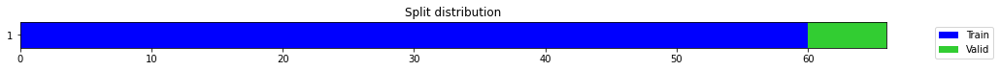

epoch,train_loss,valid_loss,mse,time
0,0.265193,0.211041,0.211041,00:00
1,0.189261,0.005450,0.005450,00:00
2,0.164601,0.014909,0.014909,00:00
3,0.151040,0.001494,0.001494,00:00
4,0.156006,0.076555,0.076555,00:00
5,0.145254,0.013713,0.013713,00:00
6,0.133900,0.046167,0.046167,00:00
7,0.128682,0.001990,0.001990,00:00
8,0.123936,0.250073,0.250073,00:00
9,0.119427,0.213981,0.213981,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11878488461176555,
  "MSE_normalize": 0.014221620750555294,
  "RMSE_normalize": 0.11925443702670058,
  "MAPE_normalize": 0.12312598985099749,
  "MAE": 7662.100196997325,
  "MSE": 59172836.311350875,
  "RMSE": 7692.388205970294,
  "MAPE": 0.06501746948144428
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:18:38.684830+07:00
PROGRESS: [ 336 / 1944 ]


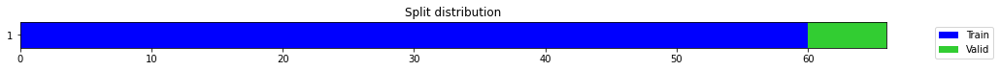

epoch,train_loss,valid_loss,mse,time
0,0.322065,0.578536,0.578536,00:00
1,0.251406,0.266844,0.266844,00:00
2,0.227300,0.092801,0.092801,00:00
3,0.190801,0.005513,0.005513,00:00
4,0.166778,0.009747,0.009747,00:00
5,0.151315,0.020439,0.020439,00:00
6,0.141783,0.002601,0.002601,00:00
7,0.139900,0.110266,0.110266,00:00
8,0.132222,0.177386,0.177386,00:00
9,0.129834,0.031374,0.031374,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1506203611691793,
  "MSE_normalize": 0.022695136616627327,
  "RMSE_normalize": 0.15064905116404592,
  "MAPE_normalize": 0.15576188439930014,
  "MAE": 9715.615776856741,
  "MSE": 94429153.1629402,
  "RMSE": 9717.46639628562,
  "MAPE": 0.08234138207199528
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.1
2022-10-14 20:19:12.303872+07:00
PROGRESS: [ 337 / 1944 ]


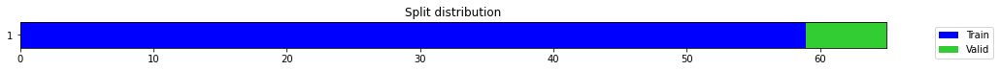

epoch,train_loss,valid_loss,mse,time
0,0.284939,0.410993,0.410993,00:00
1,0.243994,0.013873,0.013873,00:00
2,0.211378,0.197266,0.197266,00:00
3,0.198901,0.012970,0.012970,00:00
4,0.187241,0.406843,0.406843,00:01
5,0.180056,1.456420,1.456420,00:00
6,0.178481,0.871340,0.871340,00:00
7,0.169689,0.299410,0.299410,00:00
8,0.161279,0.025937,0.025937,00:00
9,0.153477,0.004491,0.004491,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06363760431607564,
  "MSE_normalize": 0.004490578915495647,
  "RMSE_normalize": 0.06701178191553815,
  "MAPE_normalize": 0.06631065094344644,
  "MAE": 4104.880028804143,
  "MSE": 18684248.14376042,
  "RMSE": 4322.527980679873,
  "MAPE": 0.03492940102266262
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:19:20.944241+07:00
PROGRESS: [ 338 / 1944 ]


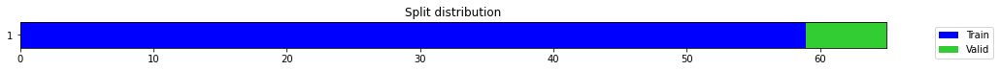

epoch,train_loss,valid_loss,mse,time
0,0.241846,0.155871,0.155871,00:00
1,0.225794,0.016541,0.016541,00:00
2,0.169860,0.946585,0.946585,00:00
3,0.157839,1.592700,1.592700,00:00
4,0.154116,5.711353,5.711353,00:00
5,0.152042,0.554876,0.554876,00:00
6,0.147208,1.406981,1.406981,00:00
7,0.153443,1.071921,1.071921,00:00
8,0.160550,1.530444,1.530444,00:00
9,0.162425,0.334906,0.334906,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.33191341161727905,
  "MSE_normalize": 0.1102558685244676,
  "RMSE_normalize": 0.3320479912971431,
  "MAPE_normalize": 0.3431574509431319,
  "MAE": 21409.742702960968,
  "MSE": 458748870.82116884,
  "RMSE": 21418.423630630918,
  "MAPE": 0.18142694297431447
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:19:31.167436+07:00
PROGRESS: [ 339 / 1944 ]


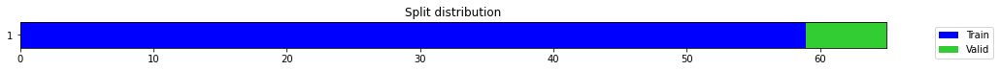

epoch,train_loss,valid_loss,mse,time
0,0.198639,0.135116,0.135116,00:00
1,0.189952,0.012705,0.012705,00:00
2,0.184996,0.006385,0.006385,00:00
3,0.162677,1.016179,1.016179,00:00
4,0.162906,0.310346,0.310346,00:00
5,0.152564,0.126160,0.126160,00:00
6,0.144864,0.213119,0.213119,00:00
7,0.135945,0.115683,0.115683,00:00
8,0.136713,0.062806,0.062806,00:00
9,0.133194,0.699915,0.699915,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2430718739827474,
  "MSE_normalize": 0.05920904341456298,
  "RMSE_normalize": 0.24332908460470354,
  "MAPE_normalize": 0.25120704525728615,
  "MAE": 15679.108159383139,
  "MSE": 246354975.6791822,
  "RMSE": 15695.699273341797,
  "MAPE": 0.13283762193684442
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.0
2022-10-14 20:19:50.559164+07:00
PROGRESS: [ 340 / 1944 ]


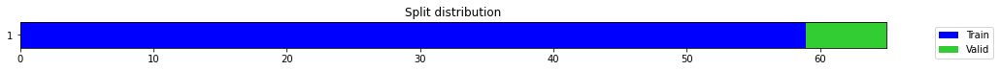

epoch,train_loss,valid_loss,mse,time
0,0.349175,0.239720,0.239720,00:00
1,0.289830,0.058671,0.058671,00:00
2,0.251185,0.034355,0.034355,00:00
3,0.217560,0.055731,0.055731,00:00
4,0.207575,0.209182,0.209182,00:00
5,0.194473,0.091235,0.091235,00:00
6,0.185813,0.141094,0.141094,00:00
7,0.175449,1.212878,1.212878,00:00
8,0.167195,2.890457,2.890457,00:00
9,0.171347,0.750447,0.750447,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13939200838406882,
  "MSE_normalize": 0.019437874724060222,
  "RMSE_normalize": 0.13941977881226258,
  "MAPE_normalize": 0.14422941101198503,
  "MAE": 8991.342108805975,
  "MSE": 80876448.57513516,
  "RMSE": 8993.133412506186,
  "MAPE": 0.07622516727296863
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.2
2022-10-14 20:20:29.114640+07:00
PROGRESS: [ 341 / 1944 ]


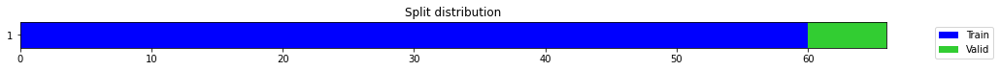

epoch,train_loss,valid_loss,mse,time
0,0.262360,0.017782,0.017782,00:00
1,0.305752,0.284740,0.284740,00:00
2,0.264057,0.008986,0.008986,00:00
3,0.233257,0.023707,0.023707,00:00
4,0.269465,0.921043,0.921043,00:00
5,0.258126,2.505296,2.505296,00:00
6,0.242933,0.354984,0.354984,00:00
7,0.227515,0.210050,0.210050,00:00
8,0.215158,0.344998,0.344998,00:00
9,0.203796,0.311469,0.311469,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5579797625541687,
  "MSE_normalize": 0.31146853682234976,
  "RMSE_normalize": 0.5580936631268534,
  "MAPE_normalize": 0.5769894750641216,
  "MAE": 35991.9266037941,
  "MSE": 1295947703.0636775,
  "RMSE": 35999.27364633456,
  "MAPE": 0.3050268555448839
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.2
2022-10-14 20:20:34.004984+07:00
PROGRESS: [ 342 / 1944 ]


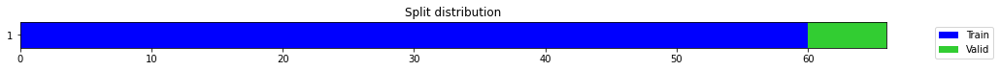

epoch,train_loss,valid_loss,mse,time
0,0.495804,0.630506,0.630506,00:00
1,0.333411,0.053052,0.053052,00:00
2,0.317142,0.007433,0.007433,00:00
3,0.286847,0.797832,0.797832,00:00
4,0.254056,0.001256,0.001256,00:00
5,0.256780,0.149661,0.149661,00:00
6,0.261731,0.173692,0.173692,00:00
7,0.251732,1.889144,1.889144,00:00
8,0.236611,0.002623,0.002623,00:00
9,0.225625,0.900272,0.900272,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4202798207600911,
  "MSE_normalize": 0.17688710996195667,
  "RMSE_normalize": 0.4205794930354506,
  "MAPE_normalize": 0.43442488331384915,
  "MAE": 27109.729558308918,
  "MSE": 735985875.7981644,
  "RMSE": 27129.059618758707,
  "MAPE": 0.22970292531105815
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.2
2022-10-14 20:20:46.071136+07:00
PROGRESS: [ 343 / 1944 ]


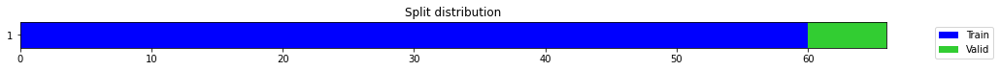

epoch,train_loss,valid_loss,mse,time
0,0.449747,0.404348,0.404348,00:00
1,0.295380,0.019292,0.019292,00:00
2,0.225139,0.222265,0.222265,00:00
3,0.224614,0.610705,0.610705,00:00
4,0.249570,0.014502,0.014502,00:00
5,0.231146,0.313374,0.313374,00:00
6,0.217174,0.002070,0.002070,00:00
7,0.201949,1.035754,1.035754,00:00
8,0.191896,1.749020,1.749020,00:00
9,0.184837,0.113412,0.113412,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.149786243836085,
  "MSE_normalize": 0.022501692143676994,
  "RMSE_normalize": 0.15000564037287728,
  "MAPE_normalize": 0.15513760003231428,
  "MAE": 9661.811872402826,
  "MSE": 93624275.97390543,
  "RMSE": 9675.963826612076,
  "MAPE": 0.08195195357039875
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.2
2022-10-14 20:21:09.164352+07:00
PROGRESS: [ 344 / 1944 ]


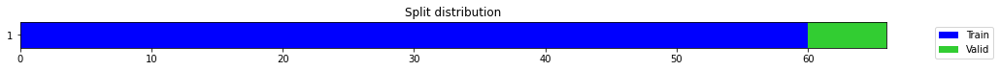

epoch,train_loss,valid_loss,mse,time
0,0.409940,0.552730,0.552730,00:00
1,0.270579,0.365716,0.365716,00:00
2,0.219448,0.192964,0.192964,00:00
3,0.220722,0.000790,0.000790,00:00
4,0.208847,0.117460,0.117460,00:00
5,0.206831,0.001990,0.001990,00:00
6,0.185288,0.591284,0.591284,00:00
7,0.176303,1.037623,1.037623,00:00
8,0.178389,0.035246,0.035246,00:00
9,0.168600,0.027733,0.027733,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.22603118419647217,
  "MSE_normalize": 0.05116105240435331,
  "RMSE_normalize": 0.22618809076596696,
  "MAPE_normalize": 0.23402424186659834,
  "MAE": 14579.91550540924,
  "MSE": 212869168.1868283,
  "RMSE": 14590.036606767932,
  "MAPE": 0.12364457473170885
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.5
2022-10-14 20:22:28.778238+07:00
PROGRESS: [ 345 / 1944 ]


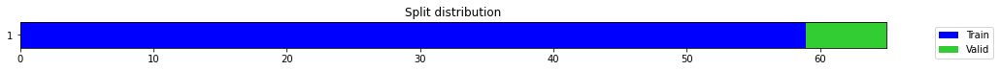

epoch,train_loss,valid_loss,mse,time
0,0.198934,0.053206,0.053206,00:00
1,0.180086,1.782413,1.782413,00:00
2,0.200188,3.740294,3.740294,00:01
3,0.198717,0.017843,0.017843,00:01
4,0.184740,1.761888,1.761888,00:00
5,0.173817,0.127954,0.127954,00:00
6,0.161348,0.110839,0.110839,00:00
7,0.156674,0.152710,0.152710,00:00
8,0.149424,0.117167,0.117167,00:00
9,0.144106,0.118999,0.118999,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3448670009771983,
  "MSE_normalize": 0.11899891005024739,
  "RMSE_normalize": 0.3449621864063471,
  "MAPE_normalize": 0.3565988497876984,
  "MAE": 22245.3010310332,
  "MSE": 495126620.87811023,
  "RMSE": 22251.440871955016,
  "MAPE": 0.18852114856610255
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.5
2022-10-14 20:22:37.516831+07:00
PROGRESS: [ 346 / 1944 ]


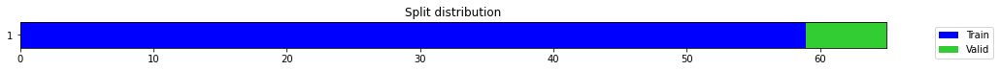

epoch,train_loss,valid_loss,mse,time
0,0.387864,0.112925,0.112925,00:00
1,0.319345,0.013971,0.013971,00:00
2,0.263054,0.154170,0.154170,00:00
3,0.269075,0.564233,0.564233,00:00
4,0.243439,3.983038,3.983038,00:00
5,0.220520,0.069764,0.069764,00:00
6,0.209058,0.123625,0.123625,00:00
7,0.195625,0.279255,0.279255,00:00
8,0.178339,1.360731,1.360731,00:00
9,0.169289,0.142480,0.142480,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3062474727630615,
  "MSE_normalize": 0.09386168501069865,
  "RMSE_normalize": 0.30636854442109207,
  "MAPE_normalize": 0.31662974727933463,
  "MAE": 19754.18698310852,
  "MSE": 390536509.19701153,
  "RMSE": 19761.99658933812,
  "MAPE": 0.16739985664706625
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.5
2022-10-14 20:22:54.958118+07:00
PROGRESS: [ 347 / 1944 ]


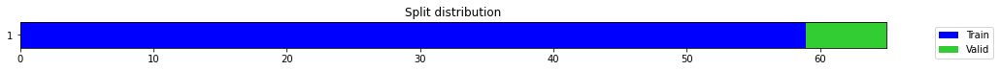

epoch,train_loss,valid_loss,mse,time
0,0.498965,0.844664,0.844664,00:00
1,0.409765,0.088937,0.088937,00:00
2,0.330098,0.040866,0.040866,00:00
3,0.305963,0.086376,0.086376,00:00
4,0.309782,0.726913,0.726913,00:00
5,0.274367,0.050459,0.050459,00:00
6,0.251221,3.966676,3.966676,00:00
7,0.230849,2.172049,2.172049,00:00
8,0.215929,0.652875,0.652875,00:00
9,0.210392,0.616241,0.616241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13573379317919412,
  "MSE_normalize": 0.018463925849075597,
  "RMSE_normalize": 0.1358820291616062,
  "MAPE_normalize": 0.1405490305384107,
  "MAE": 8755.372595230738,
  "MSE": 76824075.1947777,
  "RMSE": 8764.934409040246,
  "MAPE": 0.07425400101664505
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.4
2022-10-14 20:23:26.858646+07:00
PROGRESS: [ 348 / 1944 ]


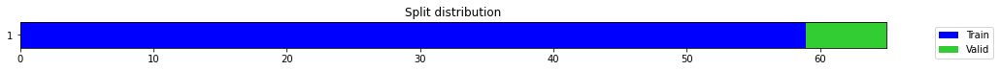

epoch,train_loss,valid_loss,mse,time
0,0.365683,0.053745,0.053745,00:00
1,0.307943,0.001918,0.001918,00:00
2,0.265202,0.001827,0.001827,00:00
3,0.254672,0.000911,0.000911,00:00
4,0.219882,0.101315,0.101315,00:00
5,0.197758,0.269668,0.269668,00:00
6,0.192723,0.200869,0.200869,00:00
7,0.180168,0.142709,0.142709,00:00
8,0.180166,1.034659,1.034659,00:00
9,0.173536,2.381336,2.381336,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06117465098698934,
  "MSE_normalize": 0.003760836459986668,
  "RMSE_normalize": 0.061325659066875655,
  "MAPE_normalize": 0.0633624450296251,
  "MAE": 3946.0096872647605,
  "MSE": 15647960.534446271,
  "RMSE": 3955.750312449747,
  "MAPE": 0.03347085971722765
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.7
2022-10-14 20:24:28.418518+07:00
PROGRESS: [ 349 / 1944 ]


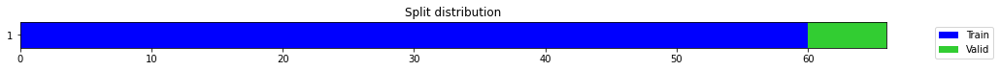

epoch,train_loss,valid_loss,mse,time
0,0.749352,0.105473,0.105473,00:00
1,0.583165,0.459892,0.459892,00:00
2,0.477274,3.906458,3.906458,00:00
3,0.408948,0.619812,0.619812,00:00
4,0.364846,0.600606,0.600606,00:00
5,0.337067,0.682350,0.682350,00:00
6,0.310985,0.893898,0.893898,00:00
7,0.277619,0.010948,0.010948,00:00
8,0.256494,0.005137,0.005137,00:00
9,0.239205,0.024495,0.024495,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15597156683603922,
  "MSE_normalize": 0.024494990969720003,
  "RMSE_normalize": 0.15650875684676563,
  "MAPE_normalize": 0.161644995946675,
  "MAE": 10060.789947191874,
  "MSE": 101917925.98903787,
  "RMSE": 10095.440851643769,
  "MAPE": 0.08536437828213905
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.8
2022-10-14 20:24:35.520633+07:00
PROGRESS: [ 350 / 1944 ]


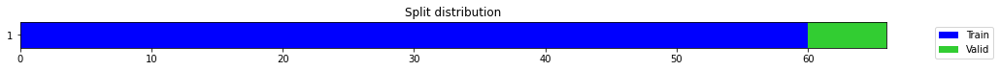

epoch,train_loss,valid_loss,mse,time
0,0.244583,0.032927,0.032927,00:00
1,0.178343,0.079955,0.079955,00:00
2,0.172544,0.152813,0.152813,00:00
3,0.155707,0.406040,0.406040,00:00
4,0.161740,1.354892,1.354892,00:00
5,0.184412,0.109186,0.109186,00:00
6,0.196970,0.000445,0.000445,00:00
7,0.224808,1.090542,1.090542,00:00
8,0.229220,1.919634,1.919634,00:00
9,0.216405,0.755618,0.755618,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10574279228846233,
  "MSE_normalize": 0.011347197016372471,
  "RMSE_normalize": 0.10652322289704001,
  "MAPE_normalize": 0.10969120587297339,
  "MAE": 6820.833073774974,
  "MSE": 47213031.72257918,
  "RMSE": 6871.17396975067,
  "MAPE": 0.05790226715487066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.9
2022-10-14 20:24:52.375112+07:00
PROGRESS: [ 351 / 1944 ]


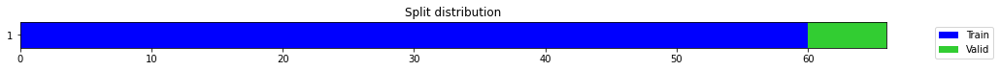

epoch,train_loss,valid_loss,mse,time
0,0.112293,0.008097,0.008097,00:00
1,0.114461,0.084759,0.084759,00:00
2,0.131664,0.009531,0.009531,00:00
3,0.114315,0.031832,0.031832,00:00
4,0.123804,0.008894,0.008894,00:00
5,0.122299,0.031953,0.031953,00:00
6,0.116428,0.112343,0.112343,00:00
7,0.122175,1.489805,1.489805,00:00
8,0.130864,0.577008,0.577008,00:00
9,0.133954,0.000376,0.000376,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2765597701072693,
  "MSE_normalize": 0.07649372978686368,
  "RMSE_normalize": 0.2765749984847938,
  "MAPE_normalize": 0.2860599708352682,
  "MAE": 17839.211410999298,
  "MSE": 318272511.3342693,
  "RMSE": 17840.193702263135,
  "MAPE": 0.15120682188268234
}
Percent CPU Usage: 100.0
Percent Ram Usage: 17.9
2022-10-14 20:25:24.991211+07:00
PROGRESS: [ 352 / 1944 ]


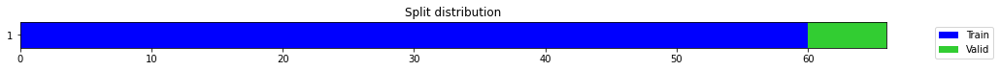

epoch,train_loss,valid_loss,mse,time
0,0.251896,0.142049,0.142049,00:00
1,0.178246,0.050956,0.050956,00:00
2,0.149147,0.015960,0.015960,00:00
3,0.138019,0.001702,0.001702,00:00
4,0.152298,0.037990,0.037990,00:00
5,0.143833,0.150092,0.150092,00:00
6,0.137889,0.498845,0.498845,00:00
7,0.134463,1.082096,1.082096,00:00
8,0.134782,0.155614,0.155614,00:00
9,0.134811,0.061235,0.061235,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15224059422810873,
  "MSE_normalize": 0.023216007282068556,
  "RMSE_normalize": 0.15236799953424787,
  "MAPE_normalize": 0.1573572190431026,
  "MAE": 9820.127290089926,
  "MSE": 96596374.12643938,
  "RMSE": 9828.345441957124,
  "MAPE": 0.08320468373468741
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.0
2022-10-14 20:26:29.612521+07:00
PROGRESS: [ 353 / 1944 ]


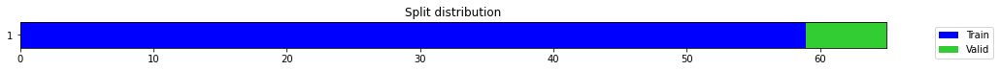

epoch,train_loss,valid_loss,mse,time
0,0.251770,0.030030,0.030030,00:00
1,0.200037,3.174481,3.174481,00:00
2,0.206617,0.181060,0.181060,00:00
3,0.203559,2.519305,2.519305,00:00
4,0.195969,0.867532,0.867532,00:00
5,0.189384,1.076960,1.076960,00:00
6,0.179252,0.068788,0.068788,00:00
7,0.169080,0.983007,0.983007,00:00
8,0.163866,0.950760,0.950760,00:00
9,0.158104,0.716501,0.716501,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.8458897446592649,
  "MSE_normalize": 0.7165010993344784,
  "RMSE_normalize": 0.846463879521435,
  "MAPE_normalize": 0.8743764977475004,
  "MAE": 54563.272089501224,
  "MSE": 2981193424.5375385,
  "RMSE": 54600.30608465065,
  "MAPE": 0.46232394961714646
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.0
2022-10-14 20:26:35.873915+07:00
PROGRESS: [ 354 / 1944 ]


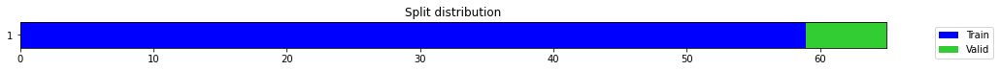

epoch,train_loss,valid_loss,mse,time
0,0.321927,0.360217,0.360217,00:00
1,0.262001,0.001183,0.001183,00:00
2,0.195057,0.649162,0.649162,00:00
3,0.196222,0.106518,0.106518,00:00
4,0.182367,1.140138,1.140138,00:00
5,0.177826,0.248527,0.248527,00:00
6,0.181738,6.622694,6.622694,00:00
7,0.173889,0.231542,0.231542,00:00
8,0.162449,8.421088,8.421088,00:00
9,0.161804,1.969111,1.969111,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.29171887040138245,
  "MSE_normalize": 0.08510635560366175,
  "RMSE_normalize": 0.29172993607729353,
  "MAPE_normalize": 0.30178172146867493,
  "MAE": 18817.034016370773,
  "MSE": 354107632.14132696,
  "RMSE": 18817.74779672974,
  "MAPE": 0.1595066329830321
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.0
2022-10-14 20:26:50.154180+07:00
PROGRESS: [ 355 / 1944 ]


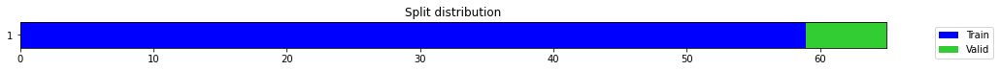

epoch,train_loss,valid_loss,mse,time
0,0.338234,0.456474,0.456474,00:00
1,0.274890,0.208417,0.208417,00:00
2,0.225910,0.869767,0.869767,00:00
3,0.212457,0.076490,0.076490,00:00
4,0.191490,0.019804,0.019804,00:00
5,0.225385,5.183766,5.183766,00:00
6,0.214566,1.530082,1.530082,00:00
7,0.203029,0.015857,0.015857,00:00
8,0.190683,2.207332,2.207332,00:00
9,0.180773,0.023241,0.023241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11257587869962056,
  "MSE_normalize": 0.01282251842530909,
  "RMSE_normalize": 0.11323655957909129,
  "MAPE_normalize": 0.11673560630047286,
  "MAE": 7261.594479640325,
  "MSE": 53351498.9035599,
  "RMSE": 7304.211039089704,
  "MAPE": 0.06163169725841707
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.0
2022-10-14 20:27:17.083233+07:00
PROGRESS: [ 356 / 1944 ]


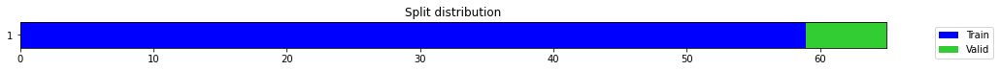

epoch,train_loss,valid_loss,mse,time
0,0.268468,0.013192,0.013192,00:00
1,0.223828,0.015254,0.015254,00:00
2,0.218158,0.011639,0.011639,00:00
3,0.200647,0.118715,0.118715,00:00
4,0.191610,0.447860,0.447860,00:00
5,0.183370,0.081961,0.081961,00:00
6,0.176476,0.042776,0.042776,00:00
7,0.174774,0.031557,0.031557,00:00
8,0.162385,1.595663,1.595663,00:00
9,0.160751,0.855131,0.855131,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1622987687587738,
  "MSE_normalize": 0.026346963247415662,
  "RMSE_normalize": 0.1623174767158967,
  "MAPE_normalize": 0.16789800332760366,
  "MAE": 10468.919780015945,
  "MSE": 109623549.30464809,
  "RMSE": 10470.1265180822,
  "MAPE": 0.0887422609684891
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.0
2022-10-14 20:28:10.325323+07:00
PROGRESS: [ 357 / 1944 ]


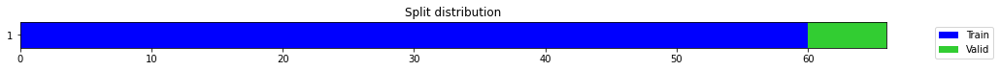

epoch,train_loss,valid_loss,mse,time
0,0.370020,0.001660,0.001660,00:00
1,0.344349,0.024949,0.024949,00:00
2,0.270038,1.433989,1.433989,00:00
3,0.235733,0.126696,0.126696,00:00
4,0.233625,0.207545,0.207545,00:00
5,0.216082,0.996810,0.996810,00:00
6,0.200447,0.023242,0.023242,00:00
7,0.182495,0.827115,0.827115,00:00
8,0.179852,0.143687,0.143687,00:00
9,0.169151,0.018906,0.018906,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.13582225640614828,
  "MSE_normalize": 0.01890586570770007,
  "RMSE_normalize": 0.13749860256635363,
  "MAPE_normalize": 0.1400194883666328,
  "MAE": 8761.078827222189,
  "MSE": 78662883.53965823,
  "RMSE": 8869.209859940074,
  "MAPE": 0.07412897118774324
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.1
2022-10-14 20:28:17.234627+07:00
PROGRESS: [ 358 / 1944 ]


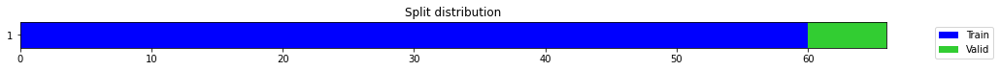

epoch,train_loss,valid_loss,mse,time
0,0.609120,0.383299,0.383299,00:00
1,0.408019,0.163436,0.163436,00:00
2,0.375894,0.146691,0.146691,00:00
3,0.302870,1.013084,1.013084,00:00
4,0.268985,0.089334,0.089334,00:00
5,0.233908,0.199189,0.199189,00:00
6,0.218157,2.306946,2.306946,00:00
7,0.204178,1.057013,1.057013,00:00
8,0.210085,0.376036,0.376036,00:00
9,0.217123,0.145821,0.145821,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.033447265625,
  "MSE_normalize": 0.0015630003769710281,
  "RMSE_normalize": 0.0395347995691268,
  "MAPE_normalize": 0.03496450270677505,
  "MAE": 2157.482421875,
  "MSE": 6503278.851496243,
  "RMSE": 2550.152711406955,
  "MAPE": 0.018389074864994057
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.1
2022-10-14 20:28:34.059688+07:00
PROGRESS: [ 359 / 1944 ]


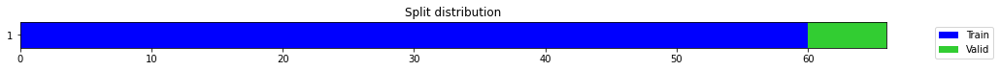

epoch,train_loss,valid_loss,mse,time
0,0.272547,0.560103,0.560103,00:00
1,0.204529,0.014440,0.014440,00:00
2,0.251234,0.006805,0.006805,00:00
3,0.243859,0.177667,0.177667,00:00
4,0.210030,0.292962,0.292962,00:00
5,0.217527,0.242827,0.242827,00:00
6,0.203376,1.345294,1.345294,00:00
7,0.209754,0.134595,0.134595,00:00
8,0.196785,0.012616,0.012616,00:00
9,0.191430,4.795321,4.795321,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.29627970854441327,
  "MSE_normalize": 0.0877853116760754,
  "RMSE_normalize": 0.2962858614177791,
  "MAPE_normalize": 0.3065091749398956,
  "MAE": 19111.226319948833,
  "MSE": 365254141.5257825,
  "RMSE": 19111.62320489242,
  "MAPE": 0.16200301811856946
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.2
2022-10-14 20:29:06.385305+07:00
PROGRESS: [ 360 / 1944 ]


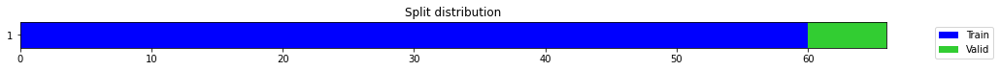

epoch,train_loss,valid_loss,mse,time
0,0.547450,0.435147,0.435147,00:00
1,0.379124,0.021905,0.021905,00:00
2,0.282272,0.105974,0.105974,00:00
3,0.268979,0.240461,0.240461,00:00
4,0.249687,0.075997,0.075997,00:01
5,0.229843,0.028888,0.028888,00:00
6,0.210581,0.956778,0.956778,00:00
7,0.209285,0.730794,0.730794,00:00
8,0.198977,0.009681,0.009681,00:00
9,0.189283,0.524180,0.524180,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.24499710400899252,
  "MSE_normalize": 0.06006631085174637,
  "RMSE_normalize": 0.2450842933599507,
  "MAPE_normalize": 0.25330888033622434,
  "MAE": 15803.293196996054,
  "MSE": 249921864.8984383,
  "RMSE": 15808.917258890258,
  "MAPE": 0.13392105066888021
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.2
2022-10-14 20:30:16.852158+07:00
PROGRESS: [ 361 / 1944 ]


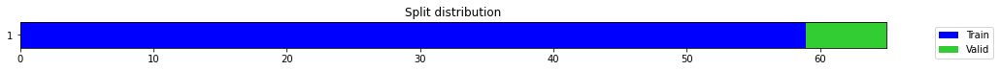

epoch,train_loss,valid_loss,mse,time
0,1.006750,1.174575,1.174575,00:00
1,0.885168,0.090123,0.090123,00:00
2,0.672840,0.017362,0.017362,00:00
3,0.551836,0.005564,0.005564,00:00
4,0.460161,0.004483,0.004483,00:00
5,0.396319,0.000442,0.000442,00:00
6,0.357773,0.035861,0.035861,00:00
7,0.327195,0.062118,0.062118,00:00
8,0.297720,0.062811,0.062811,00:00
9,0.283873,0.060704,0.060704,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24611453215281168,
  "MSE_normalize": 0.06070411830654739,
  "RMSE_normalize": 0.2463820575986559,
  "MAPE_normalize": 0.25435805943492257,
  "MAE": 15875.371781984964,
  "MSE": 252575632.48112586,
  "RMSE": 15892.6282433437,
  "MAPE": 0.13450224358633758
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.3
2022-10-14 20:30:18.523056+07:00
PROGRESS: [ 362 / 1944 ]


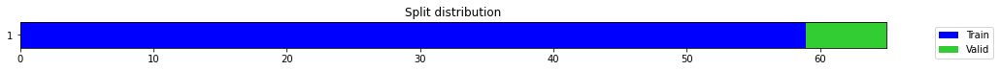

epoch,train_loss,valid_loss,mse,time
0,0.626292,0.792305,0.792305,00:00
1,0.546501,0.523704,0.523704,00:00
2,0.501301,0.090422,0.090422,00:00
3,0.420208,0.056737,0.056737,00:00
4,0.384305,0.357700,0.357700,00:00
5,0.347794,0.109993,0.109993,00:00
6,0.318522,0.000820,0.000820,00:00
7,0.302120,0.000561,0.000561,00:00
8,0.281512,0.002240,0.002240,00:00
9,0.265701,0.000370,0.000370,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3429015378157298,
  "MSE_normalize": 0.11760143193488364,
  "RMSE_normalize": 0.34293065178674775,
  "MAPE_normalize": 0.35477494214165534,
  "MAE": 22118.520795265835,
  "MSE": 489312041.4276009,
  "RMSE": 22120.398762852376,
  "MAPE": 0.1875048823014048
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.3
2022-10-14 20:30:22.195069+07:00
PROGRESS: [ 363 / 1944 ]


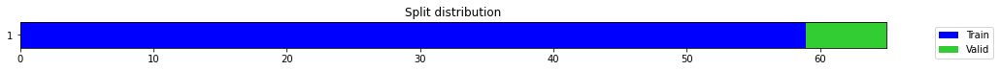

epoch,train_loss,valid_loss,mse,time
0,0.186962,0.039033,0.039033,00:00
1,0.213841,0.014807,0.014807,00:00
2,0.202536,0.002085,0.002085,00:00
3,0.220730,0.003886,0.003886,00:00
4,0.195766,0.038513,0.038513,00:00
5,0.206896,0.075025,0.075025,00:00
6,0.199656,0.013761,0.013761,00:00
7,0.197835,0.177390,0.177390,00:00
8,0.191258,0.466203,0.466203,00:00
9,0.182157,0.214931,0.214931,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.26138241092363995,
  "MSE_normalize": 0.06835756544170657,
  "RMSE_normalize": 0.26145279773164903,
  "MAPE_normalize": 0.27027984705962693,
  "MAE": 16860.21103421847,
  "MSE": 284419835.2263487,
  "RMSE": 16864.75126488229,
  "MAPE": 0.14288598454035065
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.3
2022-10-14 20:30:29.534053+07:00
PROGRESS: [ 364 / 1944 ]


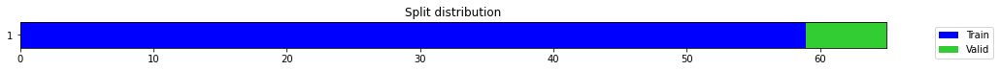

epoch,train_loss,valid_loss,mse,time
0,0.517521,0.527940,0.527940,00:00
1,0.563407,0.463872,0.463872,00:00
2,0.592804,0.365483,0.365483,00:00
3,0.566003,0.247209,0.247209,00:00
4,0.558701,0.140269,0.140269,00:00
5,0.537021,0.049252,0.049252,00:00
6,0.500864,0.003313,0.003313,00:00
7,0.462831,0.008695,0.008695,00:00
8,0.432650,0.043486,0.043486,00:00
9,0.402142,0.079117,0.079117,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14140331745147705,
  "MSE_normalize": 0.02000404892636946,
  "RMSE_normalize": 0.14143567062933401,
  "MAPE_normalize": 0.14624785367102816,
  "MAE": 9121.079588890076,
  "MSE": 83232166.95523933,
  "RMSE": 9123.166498274562,
  "MAPE": 0.07730751617940117
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.4
2022-10-14 20:30:43.458361+07:00
PROGRESS: [ 365 / 1944 ]


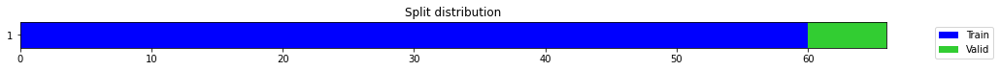

epoch,train_loss,valid_loss,mse,time
0,0.642119,0.662422,0.662422,00:00
1,0.430403,0.025221,0.025221,00:00
2,0.403701,0.159251,0.159251,00:00
3,0.356024,0.082426,0.082426,00:00
4,0.304521,0.528135,0.528135,00:00
5,0.284323,0.341572,0.341572,00:00
6,0.269767,0.175420,0.175420,00:00
7,0.246675,0.074109,0.074109,00:00
8,0.237670,0.033299,0.033299,00:00
9,0.221738,0.021217,0.021217,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14525869488716125,
  "MSE_normalize": 0.021217158060807744,
  "RMSE_normalize": 0.14566110689133097,
  "MAPE_normalize": 0.1505108910445194,
  "MAE": 9369.76685500145,
  "MSE": 88279630.21550931,
  "RMSE": 9395.724038918412,
  "MAPE": 0.0794921946323308
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.4
2022-10-14 20:30:45.247121+07:00
PROGRESS: [ 366 / 1944 ]


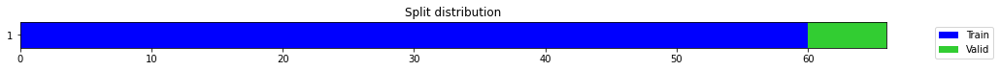

epoch,train_loss,valid_loss,mse,time
0,0.361748,0.878560,0.878560,00:00
1,0.346036,0.392786,0.392786,00:00
2,0.306104,0.007812,0.007812,00:00
3,0.267246,0.156367,0.156367,00:00
4,0.265716,0.005850,0.005850,00:00
5,0.249770,0.587300,0.587300,00:00
6,0.239830,0.551341,0.551341,00:00
7,0.231612,0.015293,0.015293,00:00
8,0.222292,0.316951,0.316951,00:00
9,0.210271,0.296362,0.296362,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.02004841963450114,
  "MSE_normalize": 0.0004694361354538046,
  "RMSE_normalize": 0.021666474919880357,
  "MAPE_normalize": 0.020916297628051878,
  "MAE": 1293.2032601038616,
  "MSE": 1953213.919078563,
  "RMSE": 1397.5742982319628,
  "MAPE": 0.011011472264374942
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.4
2022-10-14 20:30:49.099303+07:00
PROGRESS: [ 367 / 1944 ]


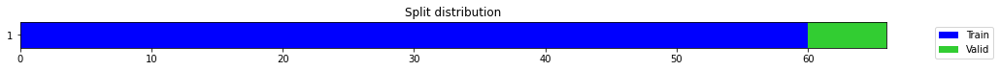

epoch,train_loss,valid_loss,mse,time
0,0.404057,1.203646,1.203646,00:00
1,0.411437,0.916690,0.916690,00:00
2,0.442574,0.545421,0.545421,00:00
3,0.386062,0.205797,0.205797,00:00
4,0.336930,0.014349,0.014349,00:00
5,0.315861,0.038568,0.038568,00:00
6,0.300665,0.215427,0.215427,00:00
7,0.295721,0.097776,0.097776,00:00
8,0.283483,0.016629,0.016629,00:00
9,0.262200,0.104271,0.104271,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18896445631980896,
  "MSE_normalize": 0.035738268231834645,
  "RMSE_normalize": 0.1890456776333028,
  "MAPE_normalize": 0.19536796156487393,
  "MAE": 12188.963290452957,
  "MSE": 148698571.92970997,
  "RMSE": 12194.202390058563,
  "MAPE": 0.10329031583787145
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.4
2022-10-14 20:30:56.756181+07:00
PROGRESS: [ 368 / 1944 ]


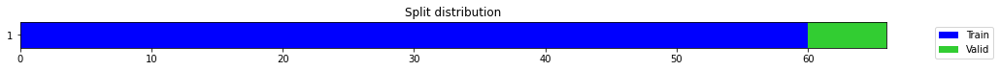

epoch,train_loss,valid_loss,mse,time
0,0.557747,1.467499,1.467499,00:00
1,0.565811,1.190199,1.190199,00:00
2,0.582272,0.906042,0.906042,00:00
3,0.526600,0.606167,0.606167,00:00
4,0.479813,0.315637,0.315637,00:00
5,0.433155,0.100043,0.100043,00:00
6,0.393081,0.005667,0.005667,00:00
7,0.360454,0.009832,0.009832,00:00
8,0.334796,0.025368,0.025368,00:00
9,0.315385,0.011748,0.011748,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1330486536026001,
  "MSE_normalize": 0.01785328015858075,
  "RMSE_normalize": 0.1336161672799394,
  "MAPE_normalize": 0.13792270343001234,
  "MAE": 8582.170351982117,
  "MSE": 74283321.35794987,
  "RMSE": 8618.777254225211,
  "MAPE": 0.07282803076415378
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.5
2022-10-14 20:31:11.704629+07:00
PROGRESS: [ 369 / 1944 ]


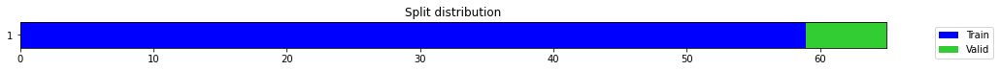

epoch,train_loss,valid_loss,mse,time
0,0.359604,1.068313,1.068313,00:00
1,0.306516,0.083198,0.083198,00:00
2,0.248979,0.019700,0.019700,00:00
3,0.233728,0.657621,0.657621,00:00
4,0.217730,0.499824,0.499824,00:00
5,0.204452,0.584152,0.584152,00:00
6,0.195573,0.560110,0.560110,00:00
7,0.190119,0.425165,0.425165,00:00
8,0.177945,0.310974,0.310974,00:00
9,0.169006,0.291691,0.291691,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5397956470648447,
  "MSE_normalize": 0.29169055566173174,
  "RMSE_normalize": 0.5400838413262627,
  "MAPE_normalize": 0.5580276145482511,
  "MAE": 34818.978418270744,
  "MSE": 1213656151.18549,
  "RMSE": 34837.56810090925,
  "MAPE": 0.2950420570673969
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.5
2022-10-14 20:31:13.558711+07:00
PROGRESS: [ 370 / 1944 ]


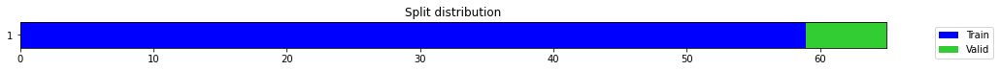

epoch,train_loss,valid_loss,mse,time
0,0.279765,0.188444,0.188444,00:00
1,0.252695,0.041233,0.041233,00:00
2,0.259814,0.019468,0.019468,00:00
3,0.243443,0.273841,0.273841,00:00
4,0.245692,0.288275,0.288275,00:00
5,0.236434,0.079731,0.079731,00:00
6,0.219748,0.470786,0.470786,00:00
7,0.217067,1.163108,1.163108,00:00
8,0.210826,0.612010,0.612010,00:00
9,0.219586,0.070564,0.070564,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.30460930864016217,
  "MSE_normalize": 0.0929134321975263,
  "RMSE_normalize": 0.3048170470914091,
  "MAPE_normalize": 0.3148697344579792,
  "MAE": 19648.51884452502,
  "MSE": 386591051.1173877,
  "RMSE": 19661.918805584253,
  "MAPE": 0.16648586673164098
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.5
2022-10-14 20:31:17.631539+07:00
PROGRESS: [ 371 / 1944 ]


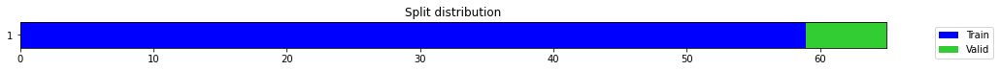

epoch,train_loss,valid_loss,mse,time
0,0.236937,0.137127,0.137127,00:00
1,0.330551,0.121460,0.121460,00:00
2,0.297392,0.090990,0.090990,00:00
3,0.285356,0.020850,0.020850,00:00
4,0.270289,0.002009,0.002009,00:00
5,0.250635,0.002078,0.002078,00:00
6,0.223530,0.009737,0.009737,00:00
7,0.214350,0.030451,0.030451,00:00
8,0.205762,0.012869,0.012869,00:00
9,0.197254,0.001836,0.001836,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3630966643492381,
  "MSE_normalize": 0.13190454013556815,
  "RMSE_normalize": 0.363186646416919,
  "MAPE_normalize": 0.3754523724048957,
  "MAE": 23421.187237183254,
  "MSE": 548823927.95218,
  "RMSE": 23426.991440476944,
  "MAPE": 0.19848743977955619
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.5
2022-10-14 20:31:25.789365+07:00
PROGRESS: [ 372 / 1944 ]


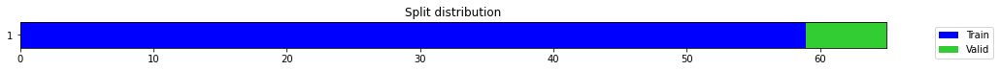

epoch,train_loss,valid_loss,mse,time
0,0.623116,0.615087,0.615087,00:00
1,0.558850,0.502290,0.502290,00:00
2,0.536882,0.371954,0.371954,00:00
3,0.484423,0.215753,0.215753,00:00
4,0.462258,0.081953,0.081953,00:00
5,0.439497,0.019531,0.019531,00:00
6,0.427336,0.000608,0.000608,00:00
7,0.404262,0.004184,0.004184,00:00
8,0.376141,0.002110,0.002110,00:00
9,0.347804,0.001026,0.001026,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.047605673472086586,
  "MSE_normalize": 0.002307829027448823,
  "RMSE_normalize": 0.04803986914479288,
  "MAPE_normalize": 0.04938290201055958,
  "MAE": 3070.756361643473,
  "MSE": 9602336.588147394,
  "RMSE": 3098.76371931572,
  "MAPE": 0.026067665596283932
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.5
2022-10-14 20:31:40.947625+07:00
PROGRESS: [ 373 / 1944 ]


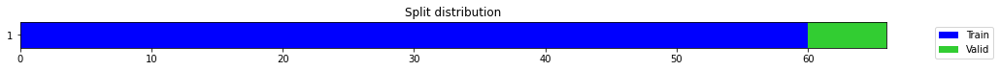

epoch,train_loss,valid_loss,mse,time
0,0.725452,0.686101,0.686101,00:00
1,0.550858,0.002966,0.002966,00:00
2,0.434828,0.069176,0.069176,00:00
3,0.401813,0.000532,0.000532,00:00
4,0.335332,0.022967,0.022967,00:00
5,0.303070,0.006121,0.006121,00:00
6,0.280385,0.001792,0.001792,00:00
7,0.270800,0.001044,0.001044,00:00
8,0.256968,0.002246,0.002246,00:00
9,0.247892,0.001693,0.001693,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03239896893501282,
  "MSE_normalize": 0.001693137029028809,
  "RMSE_normalize": 0.041147746342039306,
  "MAPE_normalize": 0.032978312679235525,
  "MAE": 2089.8630921840668,
  "MSE": 7044747.010814275,
  "RMSE": 2654.1942300469036,
  "MAPE": 0.017564322159900572
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.6
2022-10-14 20:31:42.924538+07:00
PROGRESS: [ 374 / 1944 ]


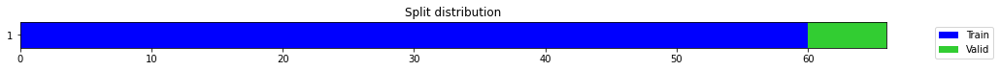

epoch,train_loss,valid_loss,mse,time
0,0.523261,1.198884,1.198884,00:00
1,0.416329,0.674778,0.674778,00:00
2,0.390834,0.107882,0.107882,00:00
3,0.320718,0.108001,0.108001,00:00
4,0.319480,0.120251,0.120251,00:00
5,0.312677,0.036999,0.036999,00:00
6,0.290228,0.243968,0.243968,00:00
7,0.276781,0.160048,0.160048,00:00
8,0.260421,0.269259,0.269259,00:00
9,0.241693,0.269782,0.269782,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06669000784556071,
  "MSE_normalize": 0.004959545870200088,
  "RMSE_normalize": 0.07042404326790737,
  "MAPE_normalize": 0.069505450380163,
  "MAE": 4301.772266070048,
  "MSE": 20635509.911521673,
  "RMSE": 4542.632486953096,
  "MAPE": 0.03660878396471639
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.6
2022-10-14 20:31:47.139514+07:00
PROGRESS: [ 375 / 1944 ]


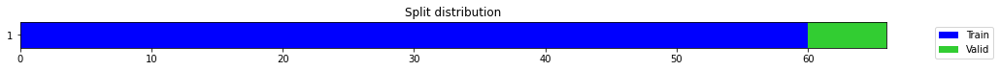

epoch,train_loss,valid_loss,mse,time
0,0.463324,0.544408,0.544408,00:00
1,0.350786,0.414938,0.414938,00:00
2,0.309440,0.251198,0.251198,00:00
3,0.289196,0.082183,0.082183,00:00
4,0.269617,0.021274,0.021274,00:00
5,0.274327,0.003034,0.003034,00:00
6,0.261563,0.002416,0.002416,00:00
7,0.248845,0.144873,0.144873,00:00
8,0.234607,0.205412,0.205412,00:00
9,0.219676,0.013335,0.013335,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22576083739598593,
  "MSE_normalize": 0.05097237424577609,
  "RMSE_normalize": 0.22577062307965598,
  "MAPE_normalize": 0.23353949026817408,
  "MAE": 14562.477055390676,
  "MSE": 212084122.51665878,
  "RMSE": 14563.10827113013,
  "MAPE": 0.12343945838131153
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.8
2022-10-14 20:31:55.352126+07:00
PROGRESS: [ 376 / 1944 ]


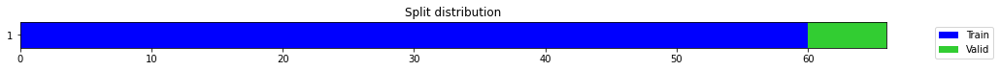

epoch,train_loss,valid_loss,mse,time
0,0.386014,0.419692,0.419692,00:00
1,0.345425,0.340419,0.340419,00:00
2,0.338201,0.267548,0.267548,00:00
3,0.309017,0.190894,0.190894,00:00
4,0.274441,0.105947,0.105947,00:00
5,0.256711,0.026960,0.026960,00:00
6,0.244377,0.007975,0.007975,00:00
7,0.232342,0.099507,0.099507,00:00
8,0.229675,0.172045,0.172045,00:00
9,0.226767,0.186348,0.186348,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10845925410588582,
  "MSE_normalize": 0.01178424074970863,
  "RMSE_normalize": 0.10855524284763325,
  "MAPE_normalize": 0.11230434245286308,
  "MAE": 6996.055726846059,
  "MSE": 49031468.43575003,
  "RMSE": 7002.247384643735,
  "MAPE": 0.059332630741430054
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.7
2022-10-14 20:32:12.451419+07:00
PROGRESS: [ 377 / 1944 ]


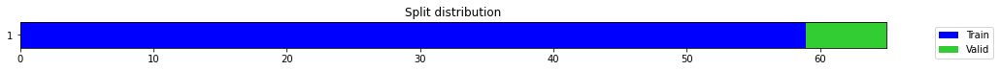

epoch,train_loss,valid_loss,mse,time
0,0.297728,0.386745,0.386745,00:00
1,0.275560,0.040096,0.040096,00:00
2,0.232454,0.049741,0.049741,00:00
3,0.213335,0.454707,0.454707,00:00
4,0.210340,0.053369,0.053369,00:00
5,0.202511,0.884757,0.884757,00:00
6,0.192900,1.001781,1.001781,00:00
7,0.184455,0.776445,0.776445,00:00
8,0.184475,0.543214,0.543214,00:00
9,0.182678,0.406720,0.406720,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6364215463399887,
  "MSE_normalize": 0.4067196412184099,
  "RMSE_normalize": 0.6377457496670675,
  "MAPE_normalize": 0.6574417741197643,
  "MAE": 41051.73542511463,
  "MSE": 1692265261.2212727,
  "RMSE": 41137.15183652452,
  "MAPE": 0.34772314394597087
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.7
2022-10-14 20:32:14.518208+07:00
PROGRESS: [ 378 / 1944 ]


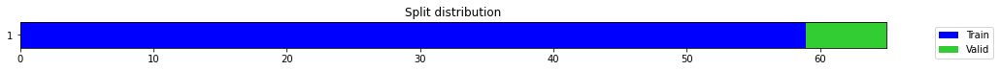

epoch,train_loss,valid_loss,mse,time
0,0.697372,2.350528,2.350528,00:00
1,0.779065,1.277310,1.277310,00:00
2,0.685166,0.227213,0.227213,00:00
3,0.589118,0.013266,0.013266,00:00
4,0.510762,0.182010,0.182010,00:00
5,0.468952,0.002568,0.002568,00:00
6,0.424339,0.086869,0.086869,00:00
7,0.381365,0.090148,0.090148,00:00
8,0.350030,0.530508,0.530508,00:00
9,0.324978,0.854304,0.854304,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2053693731625875,
  "MSE_normalize": 0.04269847297181547,
  "RMSE_normalize": 0.2066360882610186,
  "MAPE_normalize": 0.21194359736682858,
  "MAE": 13247.146046479544,
  "MSE": 177658355.27622434,
  "RMSE": 13328.854237188745,
  "MAPE": 0.11214983501866173
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.7
2022-10-14 20:32:19.389379+07:00
PROGRESS: [ 379 / 1944 ]


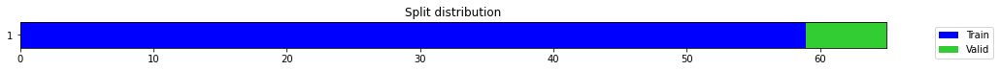

epoch,train_loss,valid_loss,mse,time
0,0.370991,0.577127,0.577127,00:00
1,0.355322,0.346729,0.346729,00:00
2,0.306781,0.111386,0.111386,00:00
3,0.264982,0.006110,0.006110,00:00
4,0.235355,0.050037,0.050037,00:00
5,0.213164,0.052453,0.052453,00:00
6,0.214189,0.011221,0.011221,00:00
7,0.201865,0.155343,0.155343,00:00
8,0.196203,0.284415,0.284415,00:00
9,0.191393,0.085306,0.085306,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2181093692779541,
  "MSE_normalize": 0.04761259406732302,
  "RMSE_normalize": 0.21820310279032015,
  "MAPE_normalize": 0.22549894479835486,
  "MAE": 14068.926755905151,
  "MSE": 198104863.32892084,
  "RMSE": 14074.97294238681,
  "MAPE": 0.11922083329535234
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.7
2022-10-14 20:32:28.778786+07:00
PROGRESS: [ 380 / 1944 ]


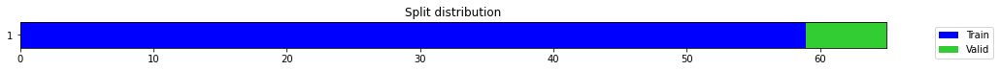

epoch,train_loss,valid_loss,mse,time
0,0.695570,0.672173,0.672173,00:00
1,0.580681,0.612843,0.612843,00:00
2,0.535433,0.444594,0.444594,00:00
3,0.510208,0.220325,0.220325,00:00
4,0.461057,0.040078,0.040078,00:00
5,0.432229,0.004953,0.004953,00:00
6,0.403769,0.093754,0.093754,00:00
7,0.389542,0.158407,0.158407,00:00
8,0.359314,0.169655,0.169655,00:00
9,0.351132,0.113408,0.113408,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09464915593465169,
  "MSE_normalize": 0.009003847063649317,
  "RMSE_normalize": 0.09488860344450917,
  "MAPE_normalize": 0.0980594136940084,
  "MAE": 6105.2491544087725,
  "MSE": 37462900.87569347,
  "RMSE": 6120.694476584619,
  "MAPE": 0.05179305324892827
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:32:48.071106+07:00
PROGRESS: [ 381 / 1944 ]


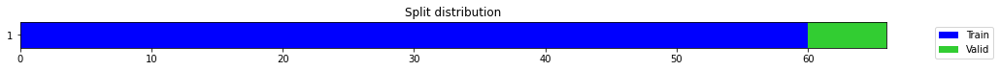

epoch,train_loss,valid_loss,mse,time
0,0.206677,0.583683,0.583683,00:00
1,0.184497,0.004521,0.004521,00:00
2,0.186698,0.032196,0.032196,00:00
3,0.187221,0.032785,0.032785,00:00
4,0.187971,0.414415,0.414415,00:00
5,0.211454,0.458784,0.458784,00:00
6,0.207213,0.001722,0.001722,00:00
7,0.199834,0.301217,0.301217,00:00
8,0.195240,0.481665,0.481665,00:00
9,0.186081,0.433564,0.433564,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6547157963116964,
  "MSE_normalize": 0.43356388220153147,
  "RMSE_normalize": 0.6584556797549335,
  "MAPE_normalize": 0.6756988555729418,
  "MAE": 42231.787725289665,
  "MSE": 1803957866.8291595,
  "RMSE": 42473.02516691223,
  "MAPE": 0.3575395294497308
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:32:50.391161+07:00
PROGRESS: [ 382 / 1944 ]


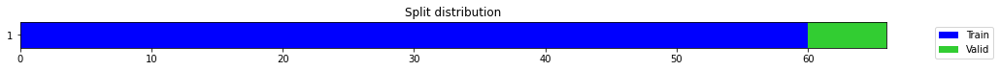

epoch,train_loss,valid_loss,mse,time
0,0.652053,0.837236,0.837236,00:00
1,0.599931,0.269895,0.269895,00:00
2,0.468947,0.019113,0.019113,00:00
3,0.378964,0.435838,0.435838,00:00
4,0.343253,0.297336,0.297336,00:00
5,0.305750,0.025177,0.025177,00:00
6,0.277102,0.042677,0.042677,00:00
7,0.251598,0.003760,0.003760,00:00
8,0.231754,0.005401,0.005401,00:00
9,0.212845,0.460117,0.460117,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03460760911305746,
  "MSE_normalize": 0.001223094695156135,
  "RMSE_normalize": 0.034972770767500466,
  "MAPE_normalize": 0.035917541903400026,
  "MAE": 2232.329218228658,
  "MSE": 5089010.841955527,
  "RMSE": 2255.88360558685,
  "MAPE": 0.018955248421223415
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:32:55.810904+07:00
PROGRESS: [ 383 / 1944 ]


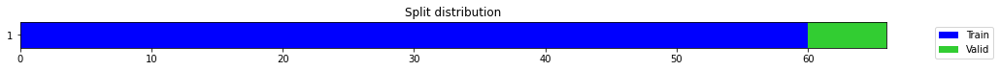

epoch,train_loss,valid_loss,mse,time
0,0.328062,0.021321,0.021321,00:00
1,0.305365,0.014413,0.014413,00:00
2,0.286228,0.001294,0.001294,00:00
3,0.260081,0.064287,0.064287,00:00
4,0.246274,0.109451,0.109451,00:00
5,0.228695,0.075889,0.075889,00:00
6,0.224554,0.077063,0.077063,00:00
7,0.205926,0.112047,0.112047,00:00
8,0.203286,0.004725,0.004725,00:00
9,0.200017,0.479241,0.479241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11658014853795369,
  "MSE_normalize": 0.013626065393786746,
  "RMSE_normalize": 0.11673073885565338,
  "MAPE_normalize": 0.12073829879582114,
  "MAE": 7519.885901292165,
  "MSE": 56694869.82226155,
  "RMSE": 7529.599579145066,
  "MAPE": 0.06378211424424506
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:33:06.251420+07:00
PROGRESS: [ 384 / 1944 ]


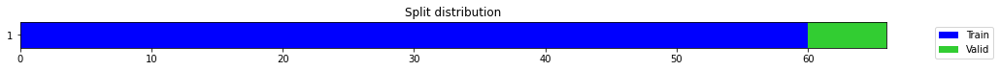

epoch,train_loss,valid_loss,mse,time
0,0.479418,0.725536,0.725536,00:00
1,0.471564,0.589855,0.589855,00:00
2,0.455688,0.437306,0.437306,00:00
3,0.387848,0.253191,0.253191,00:00
4,0.350535,0.071715,0.071715,00:00
5,0.303062,0.001009,0.001009,00:00
6,0.267043,0.040632,0.040632,00:00
7,0.263647,0.136610,0.136610,00:00
8,0.254959,0.094580,0.094580,00:00
9,0.247531,0.004838,0.004838,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07672213514645894,
  "MSE_normalize": 0.00588931195954423,
  "RMSE_normalize": 0.0767418527242093,
  "MAPE_normalize": 0.07934652892166373,
  "MAE": 4948.884605487187,
  "MSE": 24504049.058893997,
  "RMSE": 4950.156468122396,
  "MAPE": 0.04194412027304603
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:33:26.825623+07:00
PROGRESS: [ 385 / 1944 ]


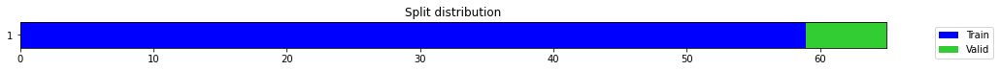

epoch,train_loss,valid_loss,mse,time
0,0.205967,0.000789,0.000789,00:00
1,0.232828,0.021705,0.021705,00:00
2,0.205462,0.171538,0.171538,00:00
3,0.200680,0.076722,0.076722,00:00
4,0.185397,0.356440,0.356440,00:00
5,0.176343,0.009398,0.009398,00:00
6,0.171282,0.079558,0.079558,00:00
7,0.171274,0.188800,0.188800,00:00
8,0.171734,0.259104,0.259104,00:00
9,0.182482,0.256026,0.256026,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5059535602728525,
  "MSE_normalize": 0.25602635877464913,
  "RMSE_normalize": 0.5059904730077921,
  "MAPE_normalize": 0.523294582142613,
  "MAE": 32636.028451840084,
  "MSE": 1065265772.7897835,
  "RMSE": 32638.409470894618,
  "MAPE": 0.2766150676170691
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:33:29.094606+07:00
PROGRESS: [ 386 / 1944 ]


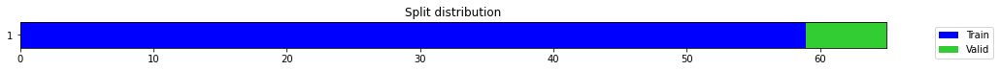

epoch,train_loss,valid_loss,mse,time
0,0.286268,1.368448,1.368448,00:00
1,0.298576,0.350140,0.350140,00:00
2,0.255742,0.000450,0.000450,00:00
3,0.250661,0.078476,0.078476,00:00
4,0.242093,0.000683,0.000683,00:00
5,0.231366,0.407239,0.407239,00:00
6,0.222152,0.134687,0.134687,00:00
7,0.215323,0.322442,0.322442,00:00
8,0.223690,0.258615,0.258615,00:00
9,0.227419,1.377504,1.377504,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10207210977872212,
  "MSE_normalize": 0.010432618817304137,
  "RMSE_normalize": 0.10214019197800706,
  "MAPE_normalize": 0.10564005501517598,
  "MAE": 6584.059369166692,
  "MSE": 43407685.83292116,
  "RMSE": 6588.450943349367,
  "MAPE": 0.055824288353159224
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.8
2022-10-14 20:33:34.261161+07:00
PROGRESS: [ 387 / 1944 ]


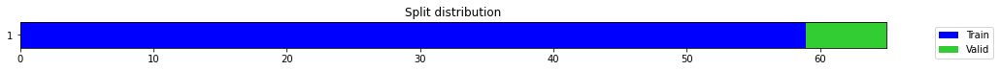

epoch,train_loss,valid_loss,mse,time
0,0.408320,0.110922,0.110922,00:00
1,0.405614,0.050997,0.050997,00:00
2,0.340888,0.001018,0.001018,00:00
3,0.307746,0.063950,0.063950,00:00
4,0.277428,0.068771,0.068771,00:00
5,0.265097,0.011396,0.011396,00:00
6,0.262168,0.473120,0.473120,00:00
7,0.253502,0.356904,0.356904,00:00
8,0.243176,0.424910,0.424910,00:00
9,0.233608,0.342127,0.342127,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24475290377934775,
  "MSE_normalize": 0.05991619561380309,
  "RMSE_normalize": 0.24477784951625645,
  "MAPE_normalize": 0.25325432944264464,
  "MAE": 15787.541305383047,
  "MSE": 249297270.51792017,
  "RMSE": 15789.150405196606,
  "MAPE": 0.13384291633544185
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:33:44.400971+07:00
PROGRESS: [ 388 / 1944 ]


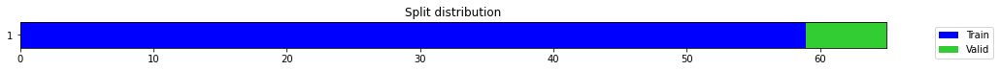

epoch,train_loss,valid_loss,mse,time
0,0.764142,0.778035,0.778035,00:00
1,0.733958,0.479164,0.479164,00:00
2,0.606651,0.224831,0.224831,00:00
3,0.544948,0.054792,0.054792,00:00
4,0.488622,0.003516,0.003516,00:00
5,0.460353,0.005411,0.005411,00:00
6,0.438958,0.002129,0.002129,00:00
7,0.402807,0.060347,0.060347,00:00
8,0.390994,0.246097,0.246097,00:00
9,0.382008,0.290512,0.290512,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.25612717866897583,
  "MSE_normalize": 0.06561717537420127,
  "RMSE_normalize": 0.2561584965879548,
  "MAPE_normalize": 0.265036631198455,
  "MAE": 16521.227532863617,
  "MSE": 273017713.3628887,
  "RMSE": 16523.24766390944,
  "MAPE": 0.14006648960322793
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.8
2022-10-14 20:34:04.848748+07:00
PROGRESS: [ 389 / 1944 ]


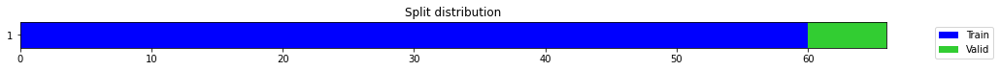

epoch,train_loss,valid_loss,mse,time
0,0.458110,0.074958,0.074958,00:00
1,0.327055,0.066260,0.066260,00:00
2,0.297864,0.068304,0.068304,00:00
3,0.258922,0.238410,0.238410,00:00
4,0.233821,0.104564,0.104564,00:00
5,0.210109,0.106961,0.106961,00:00
6,0.198207,0.352344,0.352344,00:00
7,0.184754,0.539484,0.539484,00:00
8,0.179255,0.395057,0.395057,00:00
9,0.176335,0.303420,0.303420,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5507897982994715,
  "MSE_normalize": 0.3034202955286755,
  "RMSE_normalize": 0.5508359969434419,
  "MAPE_normalize": 0.5696885624698492,
  "MAE": 35528.14514950911,
  "MSE": 1262460854.2003896,
  "RMSE": 35531.125146839775,
  "MAPE": 0.301133630924907
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:34:07.479800+07:00
PROGRESS: [ 390 / 1944 ]


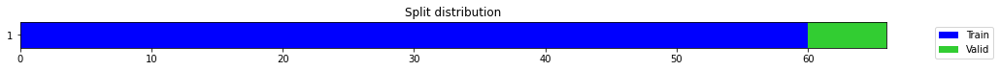

epoch,train_loss,valid_loss,mse,time
0,0.241641,0.001151,0.001151,00:00
1,0.200163,0.237819,0.237819,00:00
2,0.208819,0.002944,0.002944,00:00
3,0.189352,0.545815,0.545815,00:00
4,0.173440,0.580907,0.580907,00:00
5,0.171214,0.635982,0.635982,00:00
6,0.174025,1.639944,1.639944,00:00
7,0.180635,0.243438,0.243438,00:00
8,0.179839,0.394581,0.394581,00:00
9,0.180839,0.633018,0.633018,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03263675173123678,
  "MSE_normalize": 0.0015897426704167827,
  "RMSE_normalize": 0.03987157722509586,
  "MAPE_normalize": 0.03330481666267548,
  "MAE": 2105.201033671697,
  "MSE": 6614547.277255238,
  "RMSE": 2571.876217327583,
  "MAPE": 0.017716736221629933
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:34:13.482361+07:00
PROGRESS: [ 391 / 1944 ]


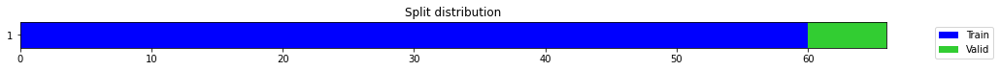

epoch,train_loss,valid_loss,mse,time
0,0.409547,0.634189,0.634189,00:00
1,0.383484,0.189283,0.189283,00:00
2,0.317478,0.004201,0.004201,00:00
3,0.277456,0.110784,0.110784,00:00
4,0.284193,0.011139,0.011139,00:00
5,0.264852,0.050976,0.050976,00:00
6,0.251972,0.323864,0.323864,00:00
7,0.241503,0.794991,0.794991,00:00
8,0.232727,0.050239,0.050239,00:00
9,0.223169,0.007824,0.007824,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.23910422126452127,
  "MSE_normalize": 0.05728044617455611,
  "RMSE_normalize": 0.23933333694777273,
  "MAPE_normalize": 0.2475957717557973,
  "MAE": 15423.17868844668,
  "MSE": 238330533.8244103,
  "RMSE": 15437.957566479132,
  "MAPE": 0.13080602362510793
}
Percent CPU Usage: 100.0
Percent Ram Usage: 18.9
2022-10-14 20:34:24.714463+07:00
PROGRESS: [ 392 / 1944 ]


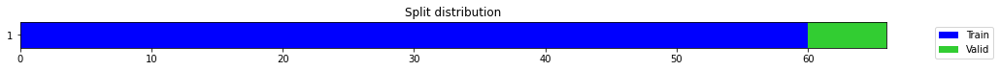

epoch,train_loss,valid_loss,mse,time
0,0.624339,1.054549,1.054549,00:00
1,0.559464,0.717003,0.717003,00:00
2,0.454431,0.437272,0.437272,00:00
3,0.412643,0.162165,0.162165,00:00
4,0.361848,0.006471,0.006471,00:00
5,0.322936,0.068909,0.068909,00:00
6,0.309414,0.353361,0.353361,00:00
7,0.317691,0.532990,0.532990,00:00
8,0.316126,0.219996,0.219996,00:00
9,0.294978,0.004725,0.004725,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10295487443606059,
  "MSE_normalize": 0.010715923383452619,
  "RMSE_normalize": 0.10351774429271833,
  "MAPE_normalize": 0.10675574767537495,
  "MAE": 6641.001220623652,
  "MSE": 44586449.84392939,
  "RMSE": 6677.308577857503,
  "MAPE": 0.05636354419265944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.1
2022-10-14 20:34:47.323239+07:00
PROGRESS: [ 393 / 1944 ]


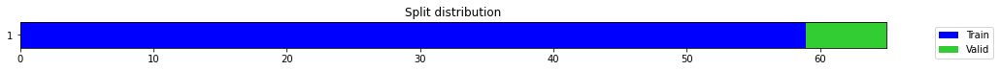

epoch,train_loss,valid_loss,mse,time
0,0.246319,0.786084,0.786084,00:00
1,0.238298,0.001536,0.001536,00:00
2,0.231621,0.227428,0.227428,00:00
3,0.198183,0.026664,0.026664,00:00
4,0.200161,0.335981,0.335981,00:00
5,0.194491,0.232579,0.232579,00:00
6,0.183339,0.003910,0.003910,00:00
7,0.175649,0.004872,0.004872,00:00
8,0.167980,0.003754,0.003754,00:00
9,0.163018,0.000349,0.000349,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.015895992517471313,
  "MSE_normalize": 0.0003487004598638303,
  "RMSE_normalize": 0.018673522963378663,
  "MAPE_normalize": 0.016320513017419516,
  "MAE": 1025.3551013469696,
  "MSE": 1450861.023164997,
  "RMSE": 1204.5169252297774,
  "MAPE": 0.008656708617530401
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.1
2022-10-14 20:34:49.876697+07:00
PROGRESS: [ 394 / 1944 ]


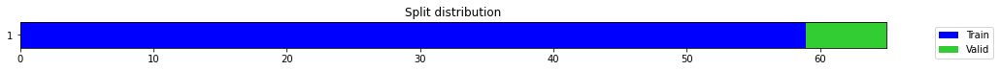

epoch,train_loss,valid_loss,mse,time
0,0.510073,1.581180,1.581180,00:00
1,0.337113,0.295838,0.295838,00:00
2,0.286328,0.004550,0.004550,00:00
3,0.252731,0.007875,0.007875,00:00
4,0.226427,0.015910,0.015910,00:00
5,0.227118,0.097412,0.097412,00:00
6,0.217993,2.684999,2.684999,00:00
7,0.211028,0.032362,0.032362,00:00
8,0.204492,3.784451,3.784451,00:00
9,0.212530,0.038063,0.038063,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3888026773929596,
  "MSE_normalize": 0.15121983219192892,
  "RMSE_normalize": 0.38886994251539797,
  "MAPE_normalize": 0.4020678409503995,
  "MAE": 25079.327902555466,
  "MSE": 629190338.7294006,
  "RMSE": 25083.666772013232,
  "MAPE": 0.21254934828914437
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.2
2022-10-14 20:34:55.651794+07:00
PROGRESS: [ 395 / 1944 ]


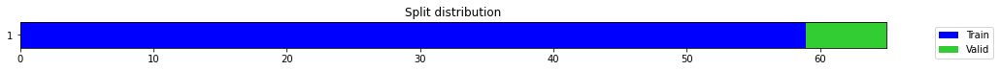

epoch,train_loss,valid_loss,mse,time
0,0.549827,1.462291,1.462291,00:00
1,0.526271,0.520985,0.520985,00:00
2,0.455276,0.010682,0.010682,00:00
3,0.401584,0.206952,0.206952,00:00
4,0.364619,0.536808,0.536808,00:00
5,0.334145,0.154391,0.154391,00:00
6,0.312709,0.129169,0.129169,00:00
7,0.301841,0.102973,0.102973,00:00
8,0.278864,0.001124,0.001124,00:00
9,0.281087,0.509189,0.509189,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09129104018211365,
  "MSE_normalize": 0.008342819662539469,
  "RMSE_normalize": 0.09133903690394085,
  "MAPE_normalize": 0.09448329357519725,
  "MAE": 5888.637255907059,
  "MSE": 34712520.52951081,
  "RMSE": 5891.733236451801,
  "MAPE": 0.04992842200246483
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.1
2022-10-14 20:35:06.860062+07:00
PROGRESS: [ 396 / 1944 ]


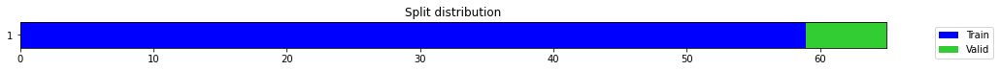

epoch,train_loss,valid_loss,mse,time
0,0.280568,0.911230,0.911230,00:00
1,0.239307,0.422020,0.422020,00:00
2,0.217060,0.131080,0.131080,00:00
3,0.246073,0.001964,0.001964,00:00
4,0.221638,0.046993,0.046993,00:00
5,0.213929,0.156822,0.156822,00:00
6,0.208350,0.164292,0.164292,00:00
7,0.206721,0.227558,0.227558,00:00
8,0.205462,0.491938,0.491938,00:00
9,0.220840,0.854316,0.854316,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16749778389930725,
  "MSE_normalize": 0.028067747677364824,
  "RMSE_normalize": 0.1675343179093908,
  "MAPE_normalize": 0.173332995938424,
  "MAE": 10804.277052640915,
  "MSE": 116783330.68164252,
  "RMSE": 10806.633642427345,
  "MAPE": 0.09160082305567828
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.1
2022-10-14 20:35:29.818471+07:00
PROGRESS: [ 397 / 1944 ]


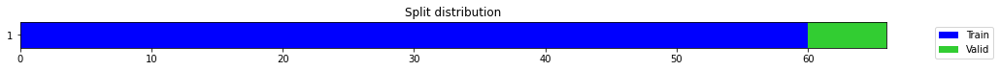

epoch,train_loss,valid_loss,mse,time
0,0.413640,0.048248,0.048248,00:00
1,0.358454,0.003885,0.003885,00:00
2,0.290441,0.563265,0.563265,00:00
3,0.276761,0.305565,0.305565,00:00
4,0.271379,0.255093,0.255093,00:00
5,0.252700,0.008047,0.008047,00:00
6,0.247458,0.227307,0.227307,00:00
7,0.238268,0.122044,0.122044,00:00
8,0.225237,0.084375,0.084375,00:00
9,0.214427,0.076090,0.076090,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2757888634999593,
  "MSE_normalize": 0.07608995320954648,
  "RMSE_normalize": 0.2758440740881458,
  "MAPE_normalize": 0.28523586185574645,
  "MAE": 17789.484851201374,
  "MSE": 316592491.4733111,
  "RMSE": 17793.04615498176,
  "MAPE": 0.15077773341119238
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.1
2022-10-14 20:35:33.219759+07:00
PROGRESS: [ 398 / 1944 ]


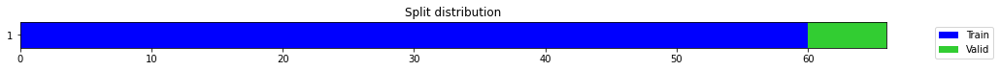

epoch,train_loss,valid_loss,mse,time
0,0.404729,0.055561,0.055561,00:00
1,0.342648,0.000367,0.000367,00:00
2,0.277938,0.264425,0.264425,00:00
3,0.263750,0.834067,0.834067,00:00
4,0.276641,0.067642,0.067642,00:00
5,0.263095,0.338036,0.338036,00:00
6,0.241986,0.020992,0.020992,00:00
7,0.225403,0.327036,0.327036,00:00
8,0.230612,0.043641,0.043641,00:00
9,0.224784,0.015883,0.015883,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09238306681315105,
  "MSE_normalize": 0.008601387924438578,
  "RMSE_normalize": 0.09274366784012038,
  "MAPE_normalize": 0.09575258408114777,
  "MAE": 5959.077341715495,
  "MSE": 35788362.56643682,
  "RMSE": 5982.337550359125,
  "MAPE": 0.050564512365733484
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.2
2022-10-14 20:35:41.000083+07:00
PROGRESS: [ 399 / 1944 ]


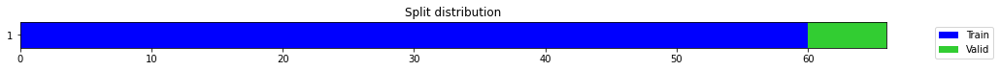

epoch,train_loss,valid_loss,mse,time
0,0.270680,0.275725,0.275725,00:00
1,0.249005,0.055263,0.055263,00:00
2,0.244249,0.007250,0.007250,00:00
3,0.246560,0.114600,0.114600,00:00
4,0.242916,0.073466,0.073466,00:00
5,0.217818,0.005108,0.005108,00:00
6,0.213216,0.000826,0.000826,00:00
7,0.220700,0.200858,0.200858,00:00
8,0.208175,0.001391,0.001391,00:00
9,0.199138,0.117900,0.117900,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06672456860542297,
  "MSE_normalize": 0.004832561107378434,
  "RMSE_normalize": 0.06951662468344126,
  "MAPE_normalize": 0.06947857416168464,
  "MAE": 4304.0015733242035,
  "MSE": 20107156.025823515,
  "RMSE": 4484.100358580695,
  "MAPE": 0.03661015643777832
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.3
2022-10-14 20:35:55.785769+07:00
PROGRESS: [ 400 / 1944 ]


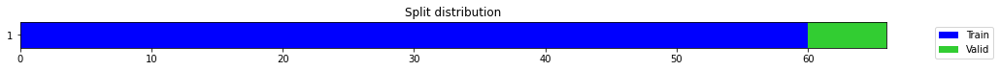

epoch,train_loss,valid_loss,mse,time
0,0.282113,0.735115,0.735115,00:00
1,0.265307,0.418176,0.418176,00:00
2,0.219722,0.179818,0.179818,00:00
3,0.202332,0.025281,0.025281,00:00
4,0.182336,0.000966,0.000966,00:00
5,0.177651,0.054647,0.054647,00:00
6,0.191714,0.054387,0.054387,00:00
7,0.183163,0.001065,0.001065,00:00
8,0.179049,0.287417,0.287417,00:00
9,0.177791,0.505436,0.505436,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1680062214533488,
  "MSE_normalize": 0.02823071097980782,
  "RMSE_normalize": 0.16801997196704868,
  "MAPE_normalize": 0.17382738957137225,
  "MAE": 10837.07330862681,
  "MSE": 117461382.85230245,
  "RMSE": 10837.960271762508,
  "MAPE": 0.09186998256845981
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.4
2022-10-14 20:36:21.606563+07:00
PROGRESS: [ 401 / 1944 ]


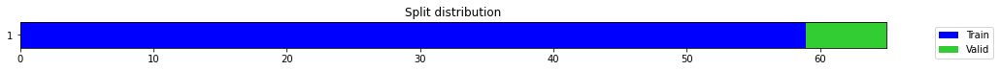

epoch,train_loss,valid_loss,mse,time
0,0.523443,0.345592,0.345592,00:00
1,0.442426,0.082274,0.082274,00:00
2,0.369455,0.139978,0.139978,00:00
3,0.334913,0.000368,0.000368,00:00
4,0.330763,0.154407,0.154407,00:00
5,0.298889,0.034046,0.034046,00:00
6,0.271591,0.057709,0.057709,00:00
7,0.246734,0.285925,0.285925,00:00
8,0.231303,0.303404,0.303404,00:00
9,0.221988,0.217232,0.217232,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4646439750989278,
  "MSE_normalize": 0.21723202972371425,
  "RMSE_normalize": 0.46608156981768145,
  "MAPE_normalize": 0.47985089308442647,
  "MAE": 29971.39496978124,
  "MSE": 903851646.861132,
  "RMSE": 30064.12557951972,
  "MAPE": 0.2538296348908113
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.4
2022-10-14 20:36:24.594716+07:00
PROGRESS: [ 402 / 1944 ]


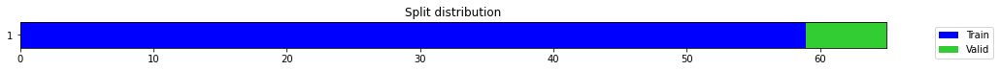

epoch,train_loss,valid_loss,mse,time
0,0.539185,0.418194,0.418194,00:00
1,0.433871,0.078177,0.078177,00:00
2,0.425619,0.116295,0.116295,00:00
3,0.356863,0.398909,0.398909,00:00
4,0.330117,0.001361,0.001361,00:00
5,0.304997,0.095041,0.095041,00:00
6,0.287390,0.185573,0.185573,00:00
7,0.259898,0.004781,0.004781,00:00
8,0.239624,0.044600,0.044600,00:00
9,0.225810,0.472815,0.472815,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2972267170747121,
  "MSE_normalize": 0.08850312438202283,
  "RMSE_normalize": 0.2974947468141628,
  "MAPE_normalize": 0.3071995668495226,
  "MAE": 19172.31215818723,
  "MSE": 368240792.2385416,
  "RMSE": 19189.60114850076,
  "MAPE": 0.16244009518209965
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.5
2022-10-14 20:36:31.470040+07:00
PROGRESS: [ 403 / 1944 ]


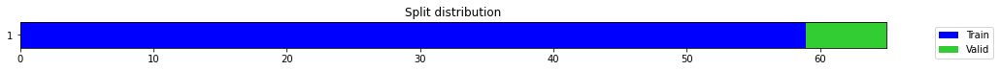

epoch,train_loss,valid_loss,mse,time
0,0.496682,0.962023,0.962023,00:00
1,0.390484,0.377319,0.377319,00:00
2,0.367790,0.025666,0.025666,00:00
3,0.342506,0.002893,0.002893,00:00
4,0.317049,0.293645,0.293645,00:00
5,0.283607,0.914372,0.914372,00:00
6,0.261201,0.935457,0.935457,00:00
7,0.248206,0.489144,0.489144,00:00
8,0.237522,0.022603,0.022603,00:00
9,0.234710,0.401812,0.401812,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.012375980615615845,
  "MSE_normalize": 0.00016764756686941476,
  "RMSE_normalize": 0.012947878855990844,
  "MAPE_normalize": 0.01282604809340194,
  "MAE": 798.3002536296844,
  "MSE": 697542.2988953484,
  "RMSE": 835.1899777268334,
  "MAPE": 0.006773200591744026
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.5
2022-10-14 20:36:45.012074+07:00
PROGRESS: [ 404 / 1944 ]


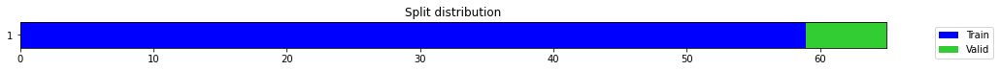

epoch,train_loss,valid_loss,mse,time
0,0.665586,0.939421,0.939421,00:00
1,0.534658,0.446271,0.446271,00:00
2,0.479284,0.118498,0.118498,00:00
3,0.434905,0.004216,0.004216,00:00
4,0.406118,0.033345,0.033345,00:00
5,0.371461,0.045525,0.045525,00:00
6,0.333046,0.019397,0.019397,00:00
7,0.317521,0.006707,0.006707,00:00
8,0.301172,0.020630,0.020630,00:00
9,0.286150,0.212248,0.212248,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1608543594678243,
  "MSE_normalize": 0.025909781424780693,
  "RMSE_normalize": 0.16096515593376318,
  "MAPE_normalize": 0.166527147359762,
  "MAE": 10375.74960311254,
  "MSE": 107804538.03421557,
  "RMSE": 10382.89641835146,
  "MAPE": 0.08798691242094377
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:37:12.284534+07:00
PROGRESS: [ 405 / 1944 ]


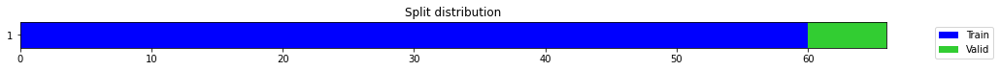

epoch,train_loss,valid_loss,mse,time
0,0.376602,0.033438,0.033438,00:00
1,0.344496,0.232195,0.232195,00:00
2,0.296598,0.677827,0.677827,00:00
3,0.295413,0.234284,0.234284,00:00
4,0.297997,0.354245,0.354245,00:00
5,0.299894,0.206159,0.206159,00:00
6,0.274850,0.024760,0.024760,00:00
7,0.263373,0.161502,0.161502,00:00
8,0.246356,0.406821,0.406821,00:00
9,0.238719,0.405076,0.405076,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6359816739956538,
  "MSE_normalize": 0.40507623170338364,
  "RMSE_normalize": 0.6364559935324544,
  "MAPE_normalize": 0.6573732352692729,
  "MAE": 41023.36189941565,
  "MSE": 1685427418.7607806,
  "RMSE": 41053.95740681744,
  "MAPE": 0.34759072841688105
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:37:15.830779+07:00
PROGRESS: [ 406 / 1944 ]


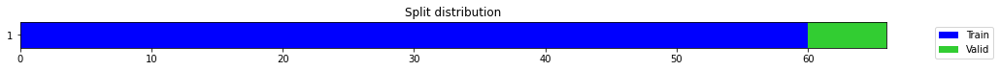

epoch,train_loss,valid_loss,mse,time
0,0.296824,0.303285,0.303285,00:00
1,0.217849,0.002476,0.002476,00:00
2,0.199453,0.066727,0.066727,00:00
3,0.217680,0.516542,0.516542,00:00
4,0.235442,0.388819,0.388819,00:00
5,0.240605,0.020623,0.020623,00:00
6,0.234656,0.507425,0.507425,00:00
7,0.227742,1.711668,1.711668,00:00
8,0.230744,0.070280,0.070280,00:00
9,0.234724,0.059648,0.059648,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07925468683242798,
  "MSE_normalize": 0.006340320694857127,
  "RMSE_normalize": 0.07962613072890787,
  "MAPE_normalize": 0.08214947915105261,
  "MAE": 5112.244319438934,
  "MSE": 26380590.877703037,
  "RMSE": 5136.203936537473,
  "MAPE": 0.04337999720522779
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:37:24.377690+07:00
PROGRESS: [ 407 / 1944 ]


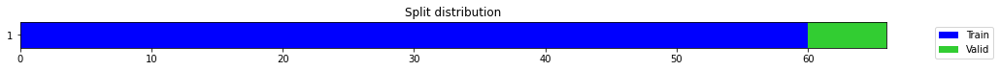

epoch,train_loss,valid_loss,mse,time
0,0.288568,0.530950,0.530950,00:00
1,0.253439,0.482053,0.482053,00:00
2,0.233076,0.129489,0.129489,00:00
3,0.217816,0.142160,0.142160,00:00
4,0.218323,0.554127,0.554127,00:00
5,0.219504,0.001070,0.001070,00:00
6,0.211696,0.365532,0.365532,00:00
7,0.207116,0.015734,0.015734,00:00
8,0.215619,1.178374,1.178374,00:00
9,0.214831,0.004649,0.004649,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08336561918258667,
  "MSE_normalize": 0.0069570223147425265,
  "RMSE_normalize": 0.08340876641422366,
  "MAPE_normalize": 0.0862031161758824,
  "MAE": 5377.415899753571,
  "MSE": 28946542.019734357,
  "RMSE": 5380.199068783083,
  "MAPE": 0.04557214072362425
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:37:41.206677+07:00
PROGRESS: [ 408 / 1944 ]


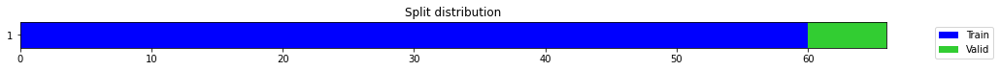

epoch,train_loss,valid_loss,mse,time
0,0.461402,0.491023,0.491023,00:00
1,0.453124,0.186997,0.186997,00:00
2,0.359837,0.012813,0.012813,00:00
3,0.367107,0.034405,0.034405,00:00
4,0.320876,0.123402,0.123402,00:00
5,0.308571,0.108493,0.108493,00:00
6,0.281439,0.004795,0.004795,00:00
7,0.263600,0.020425,0.020425,00:00
8,0.249432,0.011474,0.011474,00:00
9,0.234333,0.021324,0.021324,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09382338325182597,
  "MSE_normalize": 0.008867019194078432,
  "RMSE_normalize": 0.09416485116049636,
  "MAPE_normalize": 0.09723911398438496,
  "MAE": 6051.983513275783,
  "MSE": 36893592.125941254,
  "RMSE": 6074.009559256658,
  "MAPE": 0.051351026142104204
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:38:14.972477+07:00
PROGRESS: [ 409 / 1944 ]


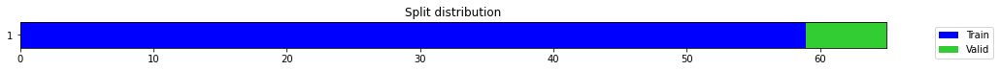

epoch,train_loss,valid_loss,mse,time
0,0.605796,0.037508,0.037508,00:00
1,0.408330,0.210445,0.210445,00:00
2,0.320157,0.101388,0.101388,00:00
3,0.312008,1.934073,1.934073,00:00
4,0.293660,0.248660,0.248660,00:00
5,0.275740,0.488381,0.488381,00:00
6,0.271737,0.034937,0.034937,00:00
7,0.261655,0.582690,0.582690,00:00
8,0.233420,1.001068,1.001068,00:00
9,0.220760,0.885023,0.885023,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.9401881013376018,
  "MSE_normalize": 0.8850227294487826,
  "RMSE_normalize": 0.9407564665995034,
  "MAPE_normalize": 0.9718955057994733,
  "MAE": 60645.893288680665,
  "MSE": 3682372496.078057,
  "RMSE": 60682.555121534366,
  "MAPE": 0.5138756454411134
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:38:23.486181+07:00
PROGRESS: [ 410 / 1944 ]


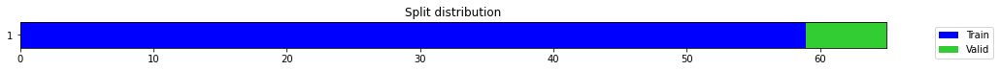

epoch,train_loss,valid_loss,mse,time
0,0.629097,0.348976,0.348976,00:00
1,0.520774,0.163700,0.163700,00:00
2,0.418372,0.170474,0.170474,00:00
3,0.403828,0.124905,0.124905,00:00
4,0.364979,0.001287,0.001287,00:00
5,0.340233,0.878413,0.878413,00:00
6,0.329000,1.467129,1.467129,00:00
7,0.310748,1.512696,1.512696,00:00
8,0.289921,0.004828,0.004828,00:00
9,0.272240,0.094187,0.094187,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5753616938988367,
  "MSE_normalize": 0.33146000623411015,
  "RMSE_normalize": 0.5757256345118829,
  "MAPE_normalize": 0.5947541506152907,
  "MAE": 37113.130703250565,
  "MSE": 1379127529.6020334,
  "RMSE": 37136.60632855449,
  "MAPE": 0.31447043878437525
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.7
2022-10-14 20:38:43.347444+07:00
PROGRESS: [ 411 / 1944 ]


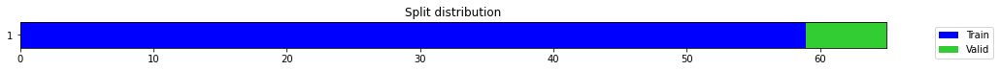

epoch,train_loss,valid_loss,mse,time
0,0.694742,1.128190,1.128190,00:00
1,0.623492,0.273788,0.273788,00:00
2,0.577234,0.012878,0.012878,00:00
3,0.491725,0.199452,0.199452,00:00
4,0.440282,0.002955,0.002955,00:00
5,0.468118,0.053101,0.053101,00:00
6,0.459141,0.014714,0.014714,00:00
7,0.421395,3.730443,3.730443,00:00
8,0.406773,2.237315,2.237315,00:00
9,0.378858,0.099733,0.099733,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3640616238117218,
  "MSE_normalize": 0.13264071927038223,
  "RMSE_normalize": 0.3641987359538501,
  "MAPE_normalize": 0.37640443634106496,
  "MAE": 23483.430982351303,
  "MSE": 551886997.0780027,
  "RMSE": 23492.275263967145,
  "MAPE": 0.19900215837339377
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.8
2022-10-14 20:39:22.975551+07:00
PROGRESS: [ 412 / 1944 ]


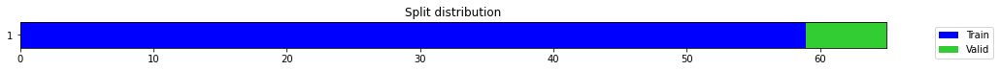

epoch,train_loss,valid_loss,mse,time
0,0.376248,0.160746,0.160746,00:00
1,0.355493,0.035073,0.035073,00:00
2,0.312609,0.001547,0.001547,00:00
3,0.313547,0.075174,0.075174,00:00
4,0.282421,0.372172,0.372172,00:00
5,0.271688,0.323038,0.323038,00:00
6,0.255046,0.082065,0.082065,00:00
7,0.257827,0.009605,0.009605,00:00
8,0.251733,0.167575,0.167575,00:00
9,0.237969,0.496608,0.496608,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.22712055842081705,
  "MSE_normalize": 0.05170780274787745,
  "RMSE_normalize": 0.22739349759365912,
  "MAPE_normalize": 0.23521139065198762,
  "MAE": 14650.184500376383,
  "MSE": 215144068.43539992,
  "RMSE": 14667.790168781386,
  "MAPE": 0.12425704957599443
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.8
2022-10-14 20:40:37.177296+07:00
PROGRESS: [ 413 / 1944 ]


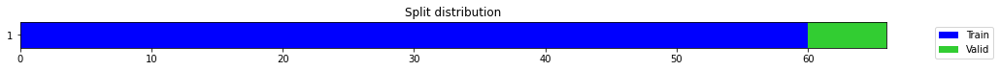

epoch,train_loss,valid_loss,mse,time
0,0.306607,0.056508,0.056508,00:00
1,0.267524,0.020659,0.020659,00:00
2,0.283453,0.277409,0.277409,00:00
3,0.258246,0.053103,0.053103,00:00
4,0.265256,0.187854,0.187854,00:00
5,0.267001,3.362937,3.362937,00:00
6,0.284728,2.898366,2.898366,00:00
7,0.296730,1.157492,1.157492,00:00
8,0.276987,0.253785,0.253785,00:00
9,0.268310,0.149523,0.149523,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3865878184636434,
  "MSE_normalize": 0.14952342788650105,
  "RMSE_normalize": 0.38668259320339343,
  "MAPE_normalize": 0.39975127961114243,
  "MAE": 24936.460642178852,
  "MSE": 622131997.3459802,
  "RMSE": 24942.57399199169,
  "MAPE": 0.21133119384347834
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.9
2022-10-14 20:40:45.327286+07:00
PROGRESS: [ 414 / 1944 ]


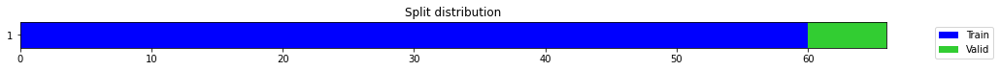

epoch,train_loss,valid_loss,mse,time
0,0.986954,0.150171,0.150171,00:00
1,0.698623,0.004581,0.004581,00:00
2,0.535049,1.263941,1.263941,00:00
3,0.542179,0.186012,0.186012,00:00
4,0.457492,0.759346,0.759346,00:00
5,0.417051,1.993562,1.993562,00:00
6,0.394307,3.190043,3.190043,00:00
7,0.364389,0.101661,0.101661,00:00
8,0.336432,0.027095,0.027095,00:00
9,0.312270,3.525781,3.525781,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1081149975458781,
  "MSE_normalize": 0.011701779088961453,
  "RMSE_normalize": 0.1081747617929499,
  "MAPE_normalize": 0.11190206100696877,
  "MAE": 6973.849801699321,
  "MSE": 48688364.760090254,
  "RMSE": 6977.70483469244,
  "MAPE": 0.05913146789847279
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.9
2022-10-14 20:40:57.535379+07:00
PROGRESS: [ 415 / 1944 ]


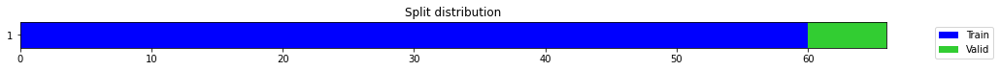

epoch,train_loss,valid_loss,mse,time
0,0.227123,0.166703,0.166703,00:00
1,0.214181,0.010895,0.010895,00:00
2,0.206385,0.024687,0.024687,00:00
3,0.199782,0.111817,0.111817,00:00
4,0.186675,0.000922,0.000922,00:00
5,0.190155,0.952677,0.952677,00:00
6,0.231070,0.005637,0.005637,00:00
7,0.248009,0.595458,0.595458,00:00
8,0.249000,0.020483,0.020483,00:00
9,0.250826,3.542847,3.542847,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3110850354035695,
  "MSE_normalize": 0.09704777131464049,
  "RMSE_normalize": 0.31152491283144673,
  "MAPE_normalize": 0.3214415732350815,
  "MAE": 20066.22912367185,
  "MSE": 403793068.81449574,
  "RMSE": 20094.60297727964,
  "MAPE": 0.16999118553431128
}
Percent CPU Usage: 100.0
Percent Ram Usage: 19.9
2022-10-14 20:41:22.819979+07:00
PROGRESS: [ 416 / 1944 ]


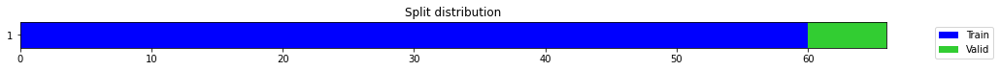

epoch,train_loss,valid_loss,mse,time
0,0.230322,0.326568,0.326568,00:00
1,0.172919,0.076590,0.076590,00:00
2,0.160399,0.000336,0.000336,00:00
3,0.166564,0.002056,0.002056,00:00
4,0.161661,0.033464,0.033464,00:00
5,0.161433,0.038881,0.038881,00:00
6,0.173504,0.048473,0.048473,00:00
7,0.173423,0.088686,0.088686,00:00
8,0.172226,0.064987,0.064987,00:00
9,0.172838,0.807740,0.807740,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3334742784500122,
  "MSE_normalize": 0.11121325050510578,
  "RMSE_normalize": 0.33348650723096096,
  "MAPE_normalize": 0.34503514946352937,
  "MAE": 21510.424857139587,
  "MSE": 462732313.2305389,
  "RMSE": 21511.213662425904,
  "MAPE": 0.18235389710753544
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:42:11.572335+07:00
PROGRESS: [ 417 / 1944 ]


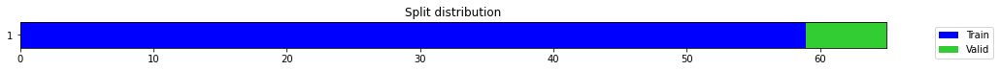

epoch,train_loss,valid_loss,mse,time
0,0.389108,0.001476,0.001476,00:00
1,0.294748,0.132314,0.132314,00:00
2,0.294568,2.447894,2.447894,00:00
3,0.310739,0.014477,0.014477,00:00
4,0.285874,0.999539,0.999539,00:00
5,0.290512,0.976978,0.976978,00:00
6,0.264347,0.003453,0.003453,00:00
7,0.249338,0.052666,0.052666,00:00
8,0.234365,0.102892,0.102892,00:00
9,0.217772,0.116664,0.116664,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.34153661131858826,
  "MSE_normalize": 0.1166641267344044,
  "RMSE_normalize": 0.34156130743162993,
  "MAPE_normalize": 0.35325446822742473,
  "MAE": 22030.477576494217,
  "MSE": 485412133.8028269,
  "RMSE": 22032.070574569854,
  "MAPE": 0.18672829451663364
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:42:16.770109+07:00
PROGRESS: [ 418 / 1944 ]


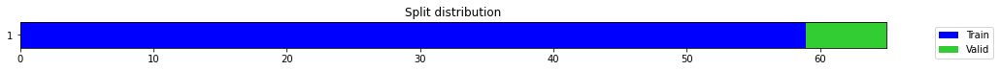

epoch,train_loss,valid_loss,mse,time
0,0.276170,0.190176,0.190176,00:00
1,0.281354,0.503644,0.503644,00:00
2,0.247783,0.041896,0.041896,00:00
3,0.234513,0.754850,0.754850,00:00
4,0.234051,0.184678,0.184678,00:00
5,0.253857,0.811399,0.811399,00:00
6,0.242977,11.181320,11.181320,00:00
7,0.251737,0.106041,0.106041,00:00
8,0.247216,0.015710,0.015710,00:00
9,0.250557,1.010089,1.010089,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18052739898363748,
  "MSE_normalize": 0.03265026964266996,
  "RMSE_normalize": 0.1806938561287294,
  "MAPE_normalize": 0.18658683286967856,
  "MAE": 11644.739344040552,
  "MSE": 135850132.34245765,
  "RMSE": 11655.476495727562,
  "MAPE": 0.09866225786886333
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:42:28.688210+07:00
PROGRESS: [ 419 / 1944 ]


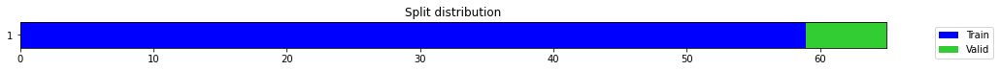

epoch,train_loss,valid_loss,mse,time
0,0.228305,0.014755,0.014755,00:00
1,0.193561,0.064273,0.064273,00:00
2,0.194418,0.054887,0.054887,00:00
3,0.188926,0.047792,0.047792,00:00
4,0.172315,0.478694,0.478694,00:00
5,0.180900,0.004943,0.004943,00:00
6,0.188085,2.572312,2.572312,00:00
7,0.191996,0.827956,0.827956,00:00
8,0.196068,0.005899,0.005899,00:00
9,0.204273,0.039829,0.039829,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3059334357579549,
  "MSE_normalize": 0.09362727270496289,
  "RMSE_normalize": 0.30598573938169554,
  "MAPE_normalize": 0.3166103007045605,
  "MAE": 19733.930340131123,
  "MSE": 389561174.44157404,
  "RMSE": 19737.30413307689,
  "MAPE": 0.16731343027579582
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:42:52.375298+07:00
PROGRESS: [ 420 / 1944 ]


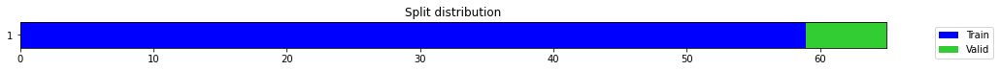

epoch,train_loss,valid_loss,mse,time
0,0.190225,0.003077,0.003077,00:00
1,0.182463,0.027680,0.027680,00:00
2,0.186156,0.000879,0.000879,00:00
3,0.190634,0.174012,0.174012,00:00
4,0.188986,0.547352,0.547352,00:00
5,0.183950,0.487567,0.487567,00:00
6,0.175980,0.141262,0.141262,00:00
7,0.170296,0.176003,0.176003,00:00
8,0.173442,2.014870,2.014870,00:00
9,0.173639,1.383065,1.383065,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06521848837534587,
  "MSE_normalize": 0.004266074323701001,
  "RMSE_normalize": 0.06531519213552847,
  "MAPE_normalize": 0.06751911975193395,
  "MAE": 4206.85337416331,
  "MSE": 17750137.067785308,
  "RMSE": 4213.091153510129,
  "MAPE": 0.03567451153263667
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:43:35.236783+07:00
PROGRESS: [ 421 / 1944 ]


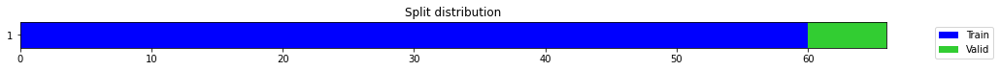

epoch,train_loss,valid_loss,mse,time
0,0.704728,0.069449,0.069449,00:00
1,0.536210,0.002422,0.002422,00:00
2,0.461740,0.042106,0.042106,00:00
3,0.403270,0.079222,0.079222,00:00
4,0.358529,1.291018,1.291018,00:00
5,0.325874,1.550916,1.550916,00:00
6,0.298470,0.048204,0.048204,00:00
7,0.281493,0.013860,0.013860,00:00
8,0.260529,0.196835,0.196835,00:00
9,0.242959,0.267241,0.267241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5166509995857874,
  "MSE_normalize": 0.2672410846217634,
  "RMSE_normalize": 0.5169536580988313,
  "MAPE_normalize": 0.5340831120188653,
  "MAE": 33326.05607728163,
  "MSE": 1111927622.9732132,
  "RMSE": 33345.57876200701,
  "MAPE": 0.28238670961009416
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.0
2022-10-14 20:43:43.627785+07:00
PROGRESS: [ 422 / 1944 ]


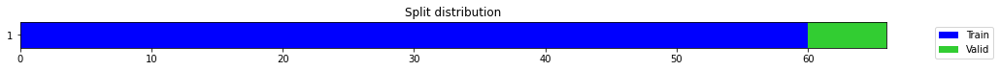

epoch,train_loss,valid_loss,mse,time
0,0.791368,0.535342,0.535342,00:00
1,0.547926,0.018849,0.018849,00:00
2,0.424888,1.585420,1.585420,00:00
3,0.412094,0.024622,0.024622,00:00
4,0.375786,0.465714,0.465714,00:00
5,0.340975,1.023949,1.023949,00:00
6,0.328213,1.411011,1.411011,00:00
7,0.312702,1.382708,1.382708,00:00
8,0.292716,0.380049,0.380049,00:00
9,0.283972,0.403401,0.403401,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08402486642201741,
  "MSE_normalize": 0.007426131765009576,
  "RMSE_normalize": 0.08617500661450266,
  "MAPE_normalize": 0.0873677376359772,
  "MAE": 5419.939983685811,
  "MSE": 30898396.678189944,
  "RMSE": 5558.632626661879,
  "MAPE": 0.04606741196143598
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:44:03.650673+07:00
PROGRESS: [ 423 / 1944 ]


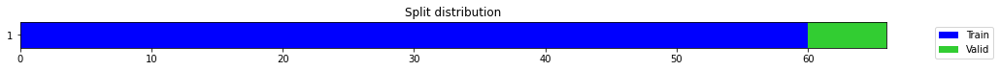

epoch,train_loss,valid_loss,mse,time
0,0.367760,0.323083,0.323083,00:00
1,0.246606,0.171412,0.171412,00:00
2,0.251200,0.263094,0.263094,00:00
3,0.208154,0.091830,0.091830,00:00
4,0.205953,0.139954,0.139954,00:00
5,0.201895,0.562741,0.562741,00:00
6,0.204076,0.279109,0.279109,00:00
7,0.192890,0.123409,0.123409,00:00
8,0.193069,0.000705,0.000705,00:00
9,0.193655,0.820609,0.820609,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.04268064101537069,
  "MSE_normalize": 0.0019345275943720708,
  "RMSE_normalize": 0.04398326493533729,
  "MAPE_normalize": 0.04439473691568666,
  "MAE": 2753.072068055471,
  "MSE": 8049116.671677545,
  "RMSE": 2837.0965213889963,
  "MAPE": 0.02340456892591473
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:44:41.623801+07:00
PROGRESS: [ 424 / 1944 ]


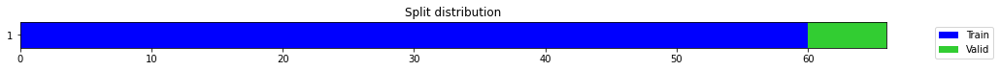

epoch,train_loss,valid_loss,mse,time
0,0.313727,0.028701,0.028701,00:00
1,0.202156,0.001007,0.001007,00:00
2,0.190977,0.062504,0.062504,00:00
3,0.205062,0.066892,0.066892,00:00
4,0.198969,0.012738,0.012738,00:00
5,0.187836,0.021997,0.021997,00:00
6,0.195115,0.499958,0.499958,00:00
7,0.199459,0.204866,0.204866,00:00
8,0.196487,0.002590,0.002590,00:00
9,0.190242,0.622718,0.622718,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05268615484237671,
  "MSE_normalize": 0.003277001429863683,
  "RMSE_normalize": 0.05724509961440964,
  "MAPE_normalize": 0.055023355982497725,
  "MAE": 3398.4677319526672,
  "MSE": 13634836.183760224,
  "RMSE": 3692.53790552788,
  "MAPE": 0.02895299010892316
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:45:54.837060+07:00
PROGRESS: [ 425 / 1944 ]


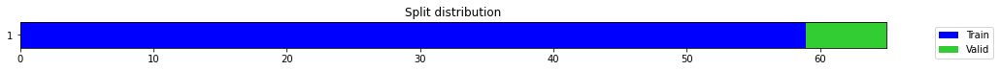

epoch,train_loss,valid_loss,mse,time
0,0.408625,0.004606,0.004606,00:00
1,0.351902,0.454072,0.454072,00:00
2,0.310643,1.248704,1.248704,00:00
3,0.261042,4.872869,4.872869,00:00
4,0.257477,1.485730,1.485730,00:00
5,0.314589,2.691693,2.691693,00:00
6,0.301504,2.042283,2.042283,00:00
7,0.309254,2.088413,2.088413,00:00
8,0.309675,0.870025,0.870025,00:00
9,0.298948,0.443986,0.443986,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6654792626698812,
  "MSE_normalize": 0.4439860505607278,
  "RMSE_normalize": 0.666322782561671,
  "MAPE_normalize": 0.687693928638339,
  "MAE": 42926.07435925802,
  "MSE": 1847322070.7511342,
  "RMSE": 42980.48476635802,
  "MAPE": 0.3636651324476425
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:46:03.187042+07:00
PROGRESS: [ 426 / 1944 ]


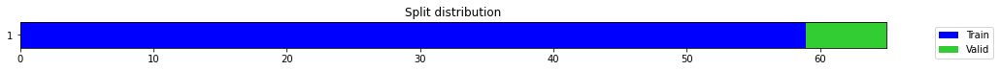

epoch,train_loss,valid_loss,mse,time
0,0.493513,0.472735,0.472735,00:00
1,0.408791,0.084123,0.084123,00:00
2,0.373816,0.229364,0.229364,00:00
3,0.368605,0.239818,0.239818,00:00
4,0.346171,0.083774,0.083774,00:00
5,0.325913,1.010327,1.010327,00:00
6,0.314951,0.540916,0.540916,00:00
7,0.306577,0.392681,0.392681,00:00
8,0.282119,0.657808,0.657808,00:00
9,0.260829,1.210540,1.210540,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5968455870946249,
  "MSE_normalize": 0.3568896940823671,
  "RMSE_normalize": 0.5974024557050022,
  "MAPE_normalize": 0.6168562998283219,
  "MAE": 38498.92774995168,
  "MSE": 1484934510.5985491,
  "RMSE": 38534.84800279546,
  "MAPE": 0.32618319634534837
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:46:20.274127+07:00
PROGRESS: [ 427 / 1944 ]


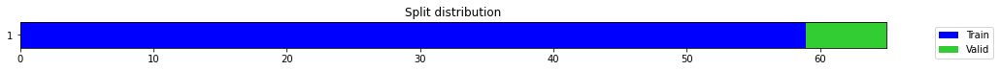

epoch,train_loss,valid_loss,mse,time
0,0.532682,1.081859,1.081859,00:00
1,0.445215,0.034610,0.034610,00:00
2,0.398391,0.002574,0.002574,00:00
3,0.341129,0.701658,0.701658,00:00
4,0.322441,2.017489,2.017489,00:00
5,0.316692,0.208931,0.208931,00:00
6,0.291421,0.512437,0.512437,00:00
7,0.269976,0.368062,0.368062,00:00
8,0.254677,0.705362,0.705362,00:00
9,0.243833,0.027320,0.027320,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2605963548024495,
  "MSE_normalize": 0.06791724173478642,
  "RMSE_normalize": 0.260609366168575,
  "MAPE_normalize": 0.2695860052056945,
  "MAE": 16809.507270177204,
  "MSE": 282587751.31055623,
  "RMSE": 16810.346555337765,
  "MAPE": 0.14248949635039154
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:46:51.401546+07:00
PROGRESS: [ 428 / 1944 ]


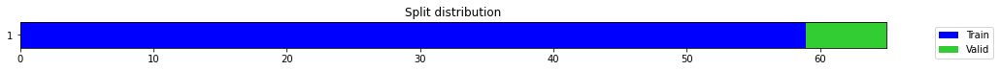

epoch,train_loss,valid_loss,mse,time
0,0.293859,0.162469,0.162469,00:00
1,0.312091,0.042976,0.042976,00:00
2,0.278807,0.023727,0.023727,00:00
3,0.263897,0.264404,0.264404,00:00
4,0.245374,0.390055,0.390055,00:00
5,0.221562,0.277834,0.277834,00:00
6,0.219363,0.107743,0.107743,00:00
7,0.214553,0.136082,0.136082,00:00
8,0.218373,1.743537,1.743537,00:00
9,0.210382,2.494766,2.494766,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1566569209098816,
  "MSE_normalize": 0.02460857354872914,
  "RMSE_normalize": 0.15687120050770678,
  "MAPE_normalize": 0.1618794911648798,
  "MAE": 10104.998026371002,
  "MSE": 102390516.52378874,
  "RMSE": 10118.819917549117,
  "MAPE": 0.08560653665216016
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:47:50.845525+07:00
PROGRESS: [ 429 / 1944 ]


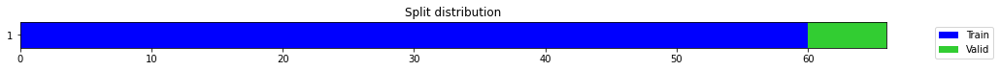

epoch,train_loss,valid_loss,mse,time
0,0.207385,0.010045,0.010045,00:00
1,0.259149,0.070135,0.070135,00:00
2,0.291925,0.661914,0.661914,00:00
3,0.300593,2.892752,2.892752,00:00
4,0.302993,0.276287,0.276287,00:00
5,0.300092,1.012437,1.012437,00:00
6,0.293401,1.323413,1.323413,00:00
7,0.279378,0.326964,0.326964,00:00
8,0.263286,0.033407,0.033407,00:00
9,0.239570,0.000349,0.000349,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.015368441740671793,
  "MSE_normalize": 0.0003486235916803082,
  "RMSE_normalize": 0.01867146463672061,
  "MAPE_normalize": 0.015706781459792676,
  "MAE": 991.3259660402933,
  "MSE": 1450541.1926392866,
  "RMSE": 1204.384154927026,
  "MAPE": 0.008349280809155445
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:47:58.203811+07:00
PROGRESS: [ 430 / 1944 ]


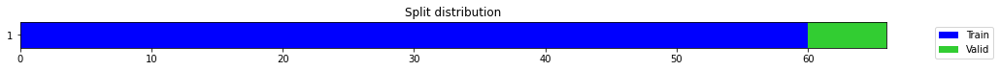

epoch,train_loss,valid_loss,mse,time
0,0.585872,0.900713,0.900713,00:00
1,0.378113,0.006245,0.006245,00:00
2,0.372225,0.005994,0.005994,00:00
3,0.311607,0.162653,0.162653,00:00
4,0.306677,0.106596,0.106596,00:00
5,0.282193,0.001189,0.001189,00:00
6,0.267247,0.292294,0.292294,00:00
7,0.271167,0.545503,0.545503,00:00
8,0.287881,0.493981,0.493981,00:00
9,0.285923,0.917323,0.917323,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19879664977391562,
  "MSE_normalize": 0.03965615367381403,
  "RMSE_normalize": 0.19913852885319314,
  "MAPE_normalize": 0.2053992398069089,
  "MAE": 12823.179097016653,
  "MSE": 164999976.53127897,
  "RMSE": 12845.23166514637,
  "MAPE": 0.10862723380446855
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.1
2022-10-14 20:48:15.136647+07:00
PROGRESS: [ 431 / 1944 ]


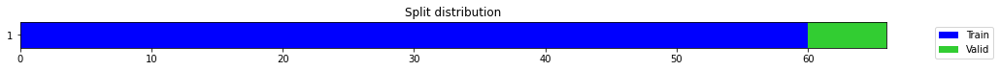

epoch,train_loss,valid_loss,mse,time
0,0.370697,0.146521,0.146521,00:00
1,0.298910,0.028607,0.028607,00:00
2,0.230667,0.118618,0.118618,00:00
3,0.219050,0.000694,0.000694,00:00
4,0.214202,0.828355,0.828355,00:00
5,0.202760,1.976704,1.976704,00:00
6,0.208360,0.113588,0.113588,00:00
7,0.194587,0.714626,0.714626,00:00
8,0.203491,0.456322,0.456322,00:00
9,0.201448,0.013007,0.013007,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.25614550709724426,
  "MSE_normalize": 0.06579615029009685,
  "RMSE_normalize": 0.25650760279199686,
  "MAPE_normalize": 0.2646734547914045,
  "MAE": 16522.409789800644,
  "MSE": 273762386.1106635,
  "RMSE": 16545.766410494965,
  "MAPE": 0.1399698097482419
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.3
2022-10-14 20:48:47.605472+07:00
PROGRESS: [ 432 / 1944 ]


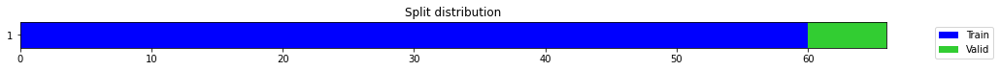

epoch,train_loss,valid_loss,mse,time
0,0.189473,0.006077,0.006077,00:00
1,0.170631,0.079090,0.079090,00:00
2,0.204925,0.385338,0.385338,00:00
3,0.208754,0.704438,0.704438,00:00
4,0.206288,0.827978,0.827978,00:00
5,0.200647,0.686834,0.686834,00:00
6,0.206965,0.186682,0.186682,00:00
7,0.197511,0.292246,0.292246,00:00
8,0.212214,0.030271,0.030271,00:00
9,0.201332,0.197397,0.197397,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03251195947329203,
  "MSE_normalize": 0.0012287595417988701,
  "RMSE_normalize": 0.03505366659564831,
  "MAPE_normalize": 0.03393165900092293,
  "MAE": 2097.151433865229,
  "MSE": 5112580.94335247,
  "RMSE": 2261.1017100856984,
  "MAPE": 0.01786019738451316
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.5
2022-10-14 20:49:51.853114+07:00
PROGRESS: [ 433 / 1944 ]


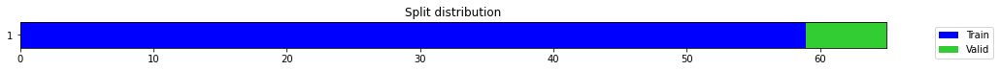

epoch,train_loss,valid_loss,mse,time
0,0.104626,0.003779,0.003779,00:00
1,0.094412,0.108712,0.108712,00:00
2,0.106865,0.126559,0.126559,00:00
3,0.109201,0.278297,0.278297,00:00
4,0.100531,0.187392,0.187392,00:00
5,0.096372,0.211208,0.211208,00:00
6,0.093007,0.158250,0.158250,00:00
7,0.097047,0.165348,0.165348,00:00
8,0.092338,0.177744,0.177744,00:00
9,0.091539,0.197123,0.197123,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.443828543027242,
  "MSE_normalize": 0.1971229205128857,
  "RMSE_normalize": 0.44398527060352544,
  "MAPE_normalize": 0.4588847828731972,
  "MAE": 28628.71633942922,
  "MSE": 820182348.6446842,
  "RMSE": 28638.825895009806,
  "MAPE": 0.24260658077921884
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.4
2022-10-14 20:49:54.020509+07:00
PROGRESS: [ 434 / 1944 ]


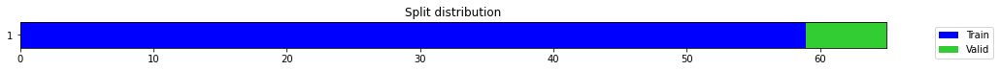

epoch,train_loss,valid_loss,mse,time
0,0.875000,2.695130,2.695130,00:00
1,0.750589,1.695412,1.695412,00:00
2,0.667204,0.602207,0.602207,00:00
3,0.585146,0.030303,0.030303,00:00
4,0.505254,0.000548,0.000548,00:00
5,0.428154,0.012544,0.012544,00:00
6,0.374923,0.071942,0.071942,00:00
7,0.345486,0.043683,0.043683,00:00
8,0.312773,0.012450,0.012450,00:00
9,0.287205,0.379634,0.379634,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.37031901876131695,
  "MSE_normalize": 0.13730074275259754,
  "RMSE_normalize": 0.37054114852819997,
  "MAPE_normalize": 0.38281339262395714,
  "MAE": 23887.05798617999,
  "MSE": 571276264.4165663,
  "RMSE": 23901.386244663012,
  "MAPE": 0.20240557737478268
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.5
2022-10-14 20:49:57.811915+07:00
PROGRESS: [ 435 / 1944 ]


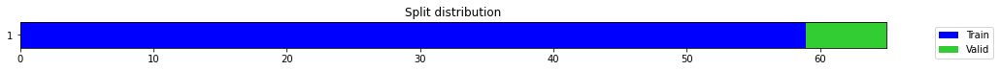

epoch,train_loss,valid_loss,mse,time
0,0.409608,3.235267,3.235267,00:00
1,0.461858,2.098234,2.098234,00:00
2,0.393528,1.162530,1.162530,00:00
3,0.372623,0.404906,0.404906,00:00
4,0.328498,0.027447,0.027447,00:00
5,0.290064,0.004233,0.004233,00:00
6,0.261662,0.029952,0.029952,00:00
7,0.238045,0.219253,0.219253,00:00
8,0.220819,0.453911,0.453911,00:00
9,0.204690,0.303160,0.303160,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27605151136716205,
  "MSE_normalize": 0.07624995654918543,
  "RMSE_normalize": 0.27613394675263203,
  "MAPE_normalize": 0.2854354759366678,
  "MAE": 17806.42668922742,
  "MSE": 317258227.93132734,
  "RMSE": 17811.744101331777,
  "MAPE": 0.1509013461094152
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.5
2022-10-14 20:50:05.015046+07:00
PROGRESS: [ 436 / 1944 ]


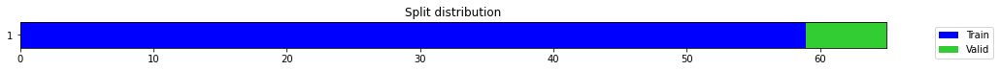

epoch,train_loss,valid_loss,mse,time
0,0.365087,0.646184,0.646184,00:00
1,0.318859,0.586363,0.586363,00:00
2,0.302081,0.519807,0.519807,00:00
3,0.295430,0.424349,0.424349,00:00
4,0.276897,0.317778,0.317778,00:00
5,0.257074,0.195777,0.195777,00:00
6,0.237636,0.112209,0.112209,00:00
7,0.225771,0.042275,0.042275,00:00
8,0.205657,0.012462,0.012462,00:00
9,0.195506,0.000720,0.000720,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.35520898302396137,
  "MSE_normalize": 0.12620042639594153,
  "RMSE_normalize": 0.355246993507252,
  "MAPE_normalize": 0.3673671495431594,
  "MAE": 22912.400240977604,
  "MSE": 525090445.3529429,
  "RMSE": 22914.85206919178,
  "MAPE": 0.1941954246903962
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.5
2022-10-14 20:50:19.188811+07:00
PROGRESS: [ 437 / 1944 ]


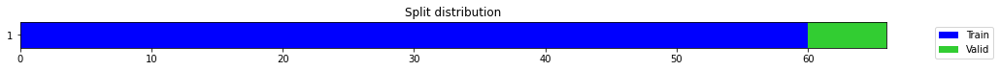

epoch,train_loss,valid_loss,mse,time
0,0.342973,0.583611,0.583611,00:00
1,0.253638,0.004447,0.004447,00:00
2,0.204689,0.005871,0.005871,00:00
3,0.193822,0.052062,0.052062,00:00
4,0.163780,0.035916,0.035916,00:00
5,0.163547,0.197280,0.197280,00:00
6,0.161322,0.248507,0.248507,00:00
7,0.147883,0.167784,0.167784,00:00
8,0.142687,0.142882,0.142882,00:00
9,0.135030,0.132581,0.132581,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3640901545683543,
  "MSE_normalize": 0.13258095313216897,
  "RMSE_normalize": 0.36411667516356483,
  "MAPE_normalize": 0.3767150233413656,
  "MAE": 23485.271330277126,
  "MSE": 551638324.1612173,
  "RMSE": 23486.98201475058,
  "MAPE": 0.19909623163841972
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.6
2022-10-14 20:50:20.936795+07:00
PROGRESS: [ 438 / 1944 ]


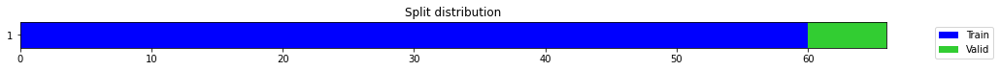

epoch,train_loss,valid_loss,mse,time
0,0.496659,1.384574,1.384574,00:00
1,0.473135,0.861351,0.861351,00:00
2,0.399165,0.214451,0.214451,00:00
3,0.330919,0.002162,0.002162,00:00
4,0.286705,0.002422,0.002422,00:00
5,0.257430,0.077285,0.077285,00:00
6,0.228834,0.203609,0.203609,00:00
7,0.211211,0.308296,0.308296,00:00
8,0.195148,0.165473,0.165473,00:00
9,0.182515,0.009570,0.009570,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2595057586828868,
  "MSE_normalize": 0.06738512506738144,
  "RMSE_normalize": 0.2595864500843244,
  "MAPE_normalize": 0.26861456811910855,
  "MAE": 16739.15945808093,
  "MSE": 280373738.3642704,
  "RMSE": 16744.36437623926,
  "MAPE": 0.14193700135095547
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.5
2022-10-14 20:50:24.814452+07:00
PROGRESS: [ 439 / 1944 ]


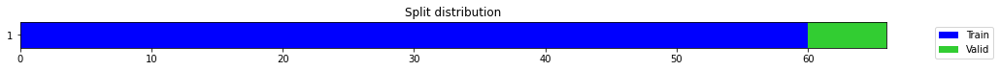

epoch,train_loss,valid_loss,mse,time
0,0.362968,1.429152,1.429152,00:00
1,0.365189,1.087573,1.087573,00:00
2,0.317678,0.642690,0.642690,00:00
3,0.274924,0.207259,0.207259,00:00
4,0.236334,0.005828,0.005828,00:00
5,0.205276,0.056670,0.056670,00:00
6,0.189732,0.056193,0.056193,00:00
7,0.179545,0.004330,0.004330,00:00
8,0.168275,0.027947,0.027947,00:00
9,0.160772,0.049006,0.049006,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.23341773947079977,
  "MSE_normalize": 0.05449802317756477,
  "RMSE_normalize": 0.23344811667170237,
  "MAPE_normalize": 0.24153286833828747,
  "MAE": 15056.377866824469,
  "MSE": 226753522.77639177,
  "RMSE": 15058.33731779149,
  "MAPE": 0.12764640760912813
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.6
2022-10-14 20:50:32.548116+07:00
PROGRESS: [ 440 / 1944 ]


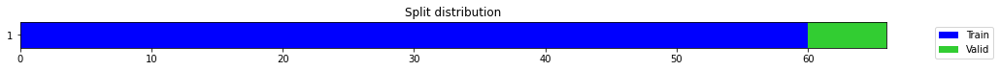

epoch,train_loss,valid_loss,mse,time
0,0.378758,0.862895,0.862895,00:00
1,0.332226,0.732944,0.732944,00:00
2,0.321318,0.581087,0.581087,00:00
3,0.300850,0.385646,0.385646,00:00
4,0.275449,0.192648,0.192648,00:00
5,0.244090,0.040272,0.040272,00:00
6,0.223466,0.011271,0.011271,00:00
7,0.200353,0.143859,0.143859,00:00
8,0.197691,0.259810,0.259810,00:00
9,0.191905,0.157377,0.157377,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.31910089651743573,
  "MSE_normalize": 0.10185644307678625,
  "RMSE_normalize": 0.3191495622381241,
  "MAPE_normalize": 0.32999395305282636,
  "MAE": 20583.284228960674,
  "MSE": 423800826.86453074,
  "RMSE": 20586.42336260796,
  "MAPE": 0.17444669628794204
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.6
2022-10-14 20:50:47.055464+07:00
PROGRESS: [ 441 / 1944 ]


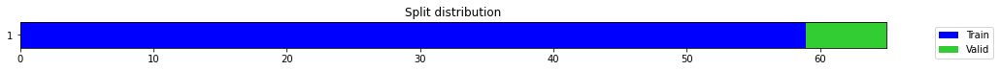

epoch,train_loss,valid_loss,mse,time
0,0.484044,1.175089,1.175089,00:00
1,0.386343,0.060623,0.060623,00:00
2,0.292646,0.008506,0.008506,00:00
3,0.249914,0.004249,0.004249,00:00
4,0.236270,0.014836,0.014836,00:00
5,0.212066,0.022444,0.022444,00:00
6,0.187226,0.052916,0.052916,00:00
7,0.174517,0.117013,0.117013,00:00
8,0.167480,0.137604,0.137604,00:00
9,0.153516,0.135994,0.135994,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3687599102656047,
  "MSE_normalize": 0.13599353048842744,
  "RMSE_normalize": 0.3687730067242279,
  "MAPE_normalize": 0.38150719854549126,
  "MAE": 23786.489251772564,
  "MSE": 565837260.0521088,
  "RMSE": 23787.334025739598,
  "MAPE": 0.20163879039079483
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.6
2022-10-14 20:50:48.787540+07:00
PROGRESS: [ 442 / 1944 ]


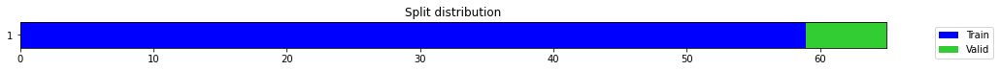

epoch,train_loss,valid_loss,mse,time
0,0.586947,0.826341,0.826341,00:00
1,0.524003,0.431658,0.431658,00:00
2,0.476452,0.069904,0.069904,00:00
3,0.422217,0.000878,0.000878,00:00
4,0.356057,0.001148,0.001148,00:00
5,0.303854,0.047302,0.047302,00:00
6,0.271975,0.064637,0.064637,00:00
7,0.243738,0.158448,0.158448,00:00
8,0.216900,0.258460,0.258460,00:00
9,0.196564,0.375635,0.375635,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.24729536970456442,
  "MSE_normalize": 0.061223314836881926,
  "RMSE_normalize": 0.24743345537109956,
  "MAPE_normalize": 0.2556508341290343,
  "MAE": 15951.540527423223,
  "MSE": 254735887.76016688,
  "RMSE": 15960.447605257406,
  "MAPE": 0.1351677717156621
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.6
2022-10-14 20:50:52.744253+07:00
PROGRESS: [ 443 / 1944 ]


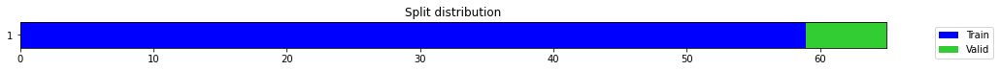

epoch,train_loss,valid_loss,mse,time
0,0.173123,0.583110,0.583110,00:00
1,0.192943,0.334542,0.334542,00:00
2,0.195689,0.086203,0.086203,00:00
3,0.175791,0.008874,0.008874,00:00
4,0.170456,0.036023,0.036023,00:00
5,0.160610,0.010252,0.010252,00:00
6,0.150673,0.035481,0.035481,00:00
7,0.141777,0.245339,0.245339,00:00
8,0.137914,0.487092,0.487092,00:00
9,0.129780,0.415773,0.415773,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5393594851096472,
  "MSE_normalize": 0.29117600732106846,
  "RMSE_normalize": 0.5396072713752739,
  "MAPE_normalize": 0.5576057257896005,
  "MAE": 34790.84422751268,
  "MSE": 1211515235.9360688,
  "RMSE": 34806.82743279066,
  "MAPE": 0.29481183061901023
}
Percent CPU Usage: 99.9
Percent Ram Usage: 20.7
2022-10-14 20:51:00.529781+07:00
PROGRESS: [ 444 / 1944 ]


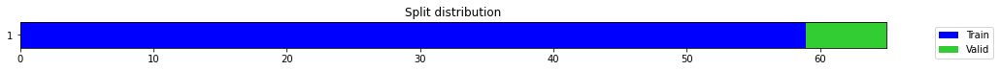

epoch,train_loss,valid_loss,mse,time
0,0.516175,0.859479,0.859479,00:00
1,0.462130,0.663999,0.663999,00:00
2,0.458740,0.445683,0.445683,00:00
3,0.418598,0.243999,0.243999,00:00
4,0.380518,0.060660,0.060660,00:00
5,0.347254,0.001797,0.001797,00:00
6,0.332118,0.015470,0.015470,00:00
7,0.309763,0.055900,0.055900,00:00
8,0.280939,0.073519,0.073519,00:00
9,0.255784,0.051375,0.051375,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.30333012342453003,
  "MSE_normalize": 0.09206835494995384,
  "RMSE_normalize": 0.30342767663803155,
  "MAPE_normalize": 0.3136318524925465,
  "MAE": 19566.006281375885,
  "MSE": 383074882.4247933,
  "RMSE": 19572.298853859586,
  "MAPE": 0.16581035834878707
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.7
2022-10-14 20:51:16.005888+07:00
PROGRESS: [ 445 / 1944 ]


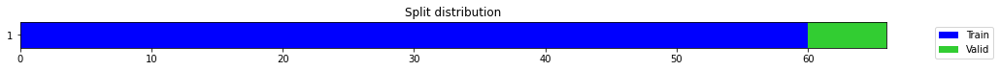

epoch,train_loss,valid_loss,mse,time
0,0.169492,0.071950,0.071950,00:00
1,0.140821,0.256526,0.256526,00:00
2,0.136429,0.095085,0.095085,00:00
3,0.116247,0.176087,0.176087,00:00
4,0.112624,0.138275,0.138275,00:00
5,0.111746,0.003754,0.003754,00:00
6,0.110539,0.005974,0.005974,00:00
7,0.107811,0.028225,0.028225,00:00
8,0.100960,0.052083,0.052083,00:00
9,0.096749,0.057590,0.057590,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.23988414804140726,
  "MSE_normalize": 0.05758995349586075,
  "RMSE_normalize": 0.23997906887030948,
  "MAPE_normalize": 0.2483184410931746,
  "MAE": 15473.487085262934,
  "MSE": 239618321.36859784,
  "RMSE": 15479.609858410446,
  "MAPE": 0.13120896659425899
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.8
2022-10-14 20:51:17.933370+07:00
PROGRESS: [ 446 / 1944 ]


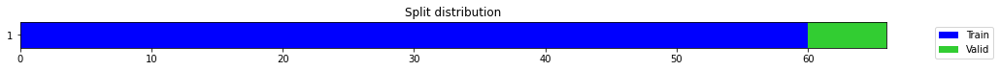

epoch,train_loss,valid_loss,mse,time
0,0.192453,0.393712,0.393712,00:00
1,0.167569,0.248376,0.248376,00:00
2,0.173793,0.072135,0.072135,00:00
3,0.150627,0.002072,0.002072,00:00
4,0.145853,0.013816,0.013816,00:00
5,0.130529,0.060807,0.060807,00:00
6,0.123215,0.025135,0.025135,00:00
7,0.114819,0.001138,0.001138,00:00
8,0.109587,0.198037,0.198037,00:00
9,0.107304,0.133104,0.133104,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.17385298013687134,
  "MSE_normalize": 0.030232987055031895,
  "RMSE_normalize": 0.17387635565260706,
  "MAPE_normalize": 0.179808874841871,
  "MAE": 11214.212630748749,
  "MSE": 125792385.10074462,
  "RMSE": 11215.720445015764,
  "MAPE": 0.09504818583956302
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:51:22.318258+07:00
PROGRESS: [ 447 / 1944 ]


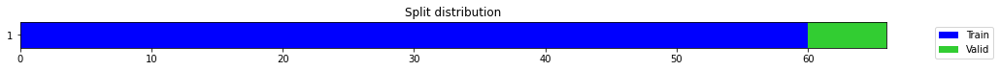

epoch,train_loss,valid_loss,mse,time
0,0.370716,0.872468,0.872468,00:00
1,0.335241,0.658364,0.658364,00:00
2,0.289938,0.350761,0.350761,00:00
3,0.259756,0.071450,0.071450,00:00
4,0.222441,0.003392,0.003392,00:00
5,0.194160,0.106123,0.106123,00:00
6,0.184603,0.264818,0.264818,00:00
7,0.170477,0.033768,0.033768,00:00
8,0.155810,0.057616,0.057616,00:00
9,0.142445,0.391523,0.391523,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22454296549161276,
  "MSE_normalize": 0.05043911655760347,
  "RMSE_normalize": 0.22458654580718648,
  "MAPE_normalize": 0.23238495916245885,
  "MAE": 14483.91944607099,
  "MSE": 209865362.04993942,
  "RMSE": 14486.730550746757,
  "MAPE": 0.12280306598489232
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:51:30.702387+07:00
PROGRESS: [ 448 / 1944 ]


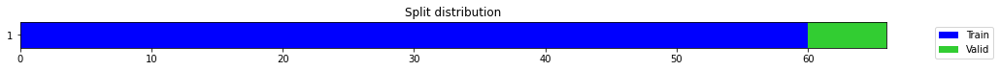

epoch,train_loss,valid_loss,mse,time
0,0.294581,0.501251,0.501251,00:00
1,0.257661,0.401906,0.401906,00:00
2,0.225480,0.249449,0.249449,00:00
3,0.218188,0.102192,0.102192,00:00
4,0.194109,0.011469,0.011469,00:00
5,0.173072,0.006793,0.006793,00:00
6,0.162523,0.029278,0.029278,00:00
7,0.153317,0.026020,0.026020,00:00
8,0.162052,0.003851,0.003851,00:00
9,0.157764,0.041937,0.041937,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.29482752084732056,
  "MSE_normalize": 0.08694974457131248,
  "RMSE_normalize": 0.29487242083876286,
  "MAPE_normalize": 0.3048930242548972,
  "MAE": 19017.554404735565,
  "MSE": 361777542.31219745,
  "RMSE": 19020.45063378356,
  "MAPE": 0.16117719680779052
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:51:47.243213+07:00
PROGRESS: [ 449 / 1944 ]


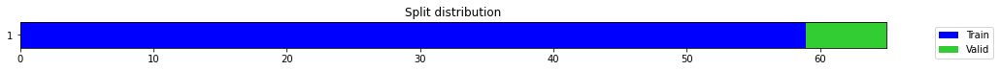

epoch,train_loss,valid_loss,mse,time
0,0.815701,0.598355,0.598355,00:00
1,0.691781,0.000409,0.000409,00:00
2,0.548137,0.010656,0.010656,00:00
3,0.427032,0.010305,0.010305,00:00
4,0.380515,0.000531,0.000531,00:00
5,0.327388,0.082994,0.082994,00:00
6,0.290615,0.165171,0.165171,00:00
7,0.268099,0.164703,0.164703,00:00
8,0.246677,0.132978,0.132978,00:00
9,0.228040,0.118770,0.118770,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3444646894931793,
  "MSE_normalize": 0.11877010698458967,
  "RMSE_normalize": 0.3446303918469607,
  "MAPE_normalize": 0.356115893857407,
  "MAE": 22219.35033106804,
  "MSE": 494174624.85816497,
  "RMSE": 22230.038795696353,
  "MAPE": 0.18828259141984524
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:51:49.380025+07:00
PROGRESS: [ 450 / 1944 ]


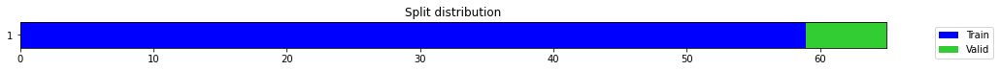

epoch,train_loss,valid_loss,mse,time
0,0.372847,0.549038,0.549038,00:00
1,0.346139,0.192689,0.192689,00:00
2,0.292402,0.001712,0.001712,00:00
3,0.270144,0.000980,0.000980,00:00
4,0.233215,0.064242,0.064242,00:00
5,0.215669,0.039314,0.039314,00:00
6,0.196341,0.178597,0.178597,00:00
7,0.178677,0.346675,0.346675,00:00
8,0.168244,0.059108,0.059108,00:00
9,0.160976,0.102783,0.102783,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.41279126207033795,
  "MSE_normalize": 0.17067466527532518,
  "RMSE_normalize": 0.4131279042564484,
  "MAPE_normalize": 0.4266587549330243,
  "MAE": 26626.68756858508,
  "MSE": 710137347.0697483,
  "RMSE": 26648.402336157946,
  "MAPE": 0.2256030108998743
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:51:54.132849+07:00
PROGRESS: [ 451 / 1944 ]


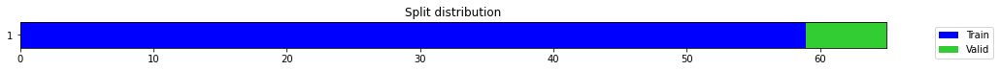

epoch,train_loss,valid_loss,mse,time
0,0.500920,0.924391,0.924391,00:00
1,0.540159,0.580329,0.580329,00:00
2,0.545895,0.225708,0.225708,00:00
3,0.498383,0.017486,0.017486,00:00
4,0.442195,0.038852,0.038852,00:00
5,0.386911,0.132939,0.132939,00:00
6,0.342281,0.108171,0.108171,00:00
7,0.305700,0.025566,0.025566,00:00
8,0.278393,0.003767,0.003767,00:00
9,0.257598,0.004662,0.004662,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.22892388701438904,
  "MSE_normalize": 0.052487831396074235,
  "RMSE_normalize": 0.22910222913816058,
  "MAPE_normalize": 0.23662301052094614,
  "MAE": 14766.50640797615,
  "MSE": 218389585.1263235,
  "RMSE": 14778.01018832791,
  "MAPE": 0.12511623442012454
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.0
2022-10-14 20:52:03.673708+07:00
PROGRESS: [ 452 / 1944 ]


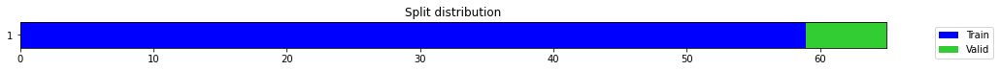

epoch,train_loss,valid_loss,mse,time
0,0.595914,0.784315,0.784315,00:00
1,0.557827,0.638171,0.638171,00:00
2,0.557959,0.487374,0.487374,00:00
3,0.519736,0.306023,0.306023,00:00
4,0.472101,0.138994,0.138994,00:00
5,0.436382,0.037895,0.037895,00:00
6,0.417856,0.000982,0.000982,00:00
7,0.380727,0.045110,0.045110,00:00
8,0.349132,0.065275,0.065275,00:00
9,0.313127,0.041329,0.041329,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.21418221791585287,
  "MSE_normalize": 0.04588185214099857,
  "RMSE_normalize": 0.21420049519316842,
  "MAPE_normalize": 0.22154380226942694,
  "MAE": 13815.609784444174,
  "MSE": 190903651.1394037,
  "RMSE": 13816.788741940136,
  "MAPE": 0.11710357940407344
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.0
2022-10-14 20:52:22.296399+07:00
PROGRESS: [ 453 / 1944 ]


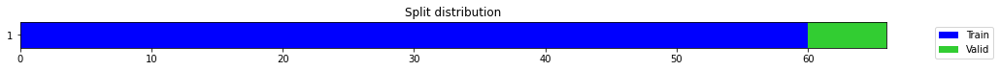

epoch,train_loss,valid_loss,mse,time
0,0.483459,0.846249,0.846249,00:00
1,0.359281,0.002984,0.002984,00:00
2,0.273328,0.258784,0.258784,00:00
3,0.245333,0.046817,0.046817,00:00
4,0.211820,0.008381,0.008381,00:00
5,0.195855,0.056859,0.056859,00:00
6,0.174962,0.048972,0.048972,00:00
7,0.163469,0.013074,0.013074,00:00
8,0.149086,0.002956,0.002956,00:00
9,0.137530,0.001088,0.001088,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.02630475163459778,
  "MSE_normalize": 0.0010884541627553073,
  "RMSE_normalize": 0.03299172870213544,
  "MAPE_normalize": 0.027672884862571006,
  "MAE": 1696.761699438095,
  "MSE": 4528803.090366015,
  "RMSE": 2128.098468202544,
  "MAPE": 0.014511568564434132
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:52:25.052508+07:00
PROGRESS: [ 454 / 1944 ]


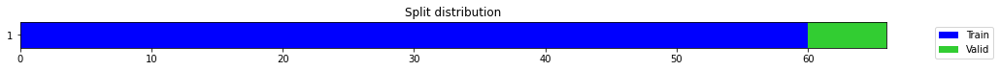

epoch,train_loss,valid_loss,mse,time
0,0.366395,0.973465,0.973465,00:00
1,0.316838,0.389209,0.389209,00:00
2,0.274493,0.001642,0.001642,00:00
3,0.230669,0.172999,0.172999,00:00
4,0.227505,0.134522,0.134522,00:00
5,0.200138,0.007258,0.007258,00:00
6,0.178380,0.285268,0.285268,00:00
7,0.159110,0.402843,0.402843,00:00
8,0.148291,0.007752,0.007752,00:00
9,0.137695,0.001089,0.001089,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3612772524356842,
  "MSE_normalize": 0.13062749096505577,
  "RMSE_normalize": 0.3614242534267115,
  "MAPE_normalize": 0.37352219753411225,
  "MAE": 23303.827891111374,
  "MSE": 543510425.1627511,
  "RMSE": 23313.310043036596,
  "MAPE": 0.197479225149107
}
Percent CPU Usage: 100.0
Percent Ram Usage: 20.9
2022-10-14 20:52:30.611083+07:00
PROGRESS: [ 455 / 1944 ]


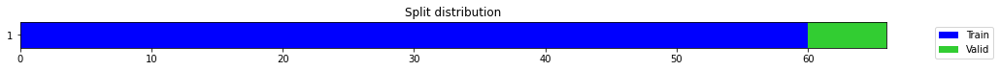

epoch,train_loss,valid_loss,mse,time
0,0.228751,0.670287,0.670287,00:00
1,0.205882,0.412889,0.412889,00:00
2,0.177362,0.136052,0.136052,00:00
3,0.156987,0.001090,0.001090,00:00
4,0.149952,0.022678,0.022678,00:00
5,0.141317,0.031625,0.031625,00:00
6,0.141753,0.003379,0.003379,00:00
7,0.136420,0.098385,0.098385,00:00
8,0.125046,0.198383,0.198383,00:00
9,0.121976,0.041025,0.041025,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.21739297111829123,
  "MSE_normalize": 0.04726686489526758,
  "RMSE_normalize": 0.21740944067649773,
  "MAPE_normalize": 0.22495358270775637,
  "MAE": 14022.716209014257,
  "MSE": 196666365.13909277,
  "RMSE": 14023.77856139681,
  "MAPE": 0.11888377903503922
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.0
2022-10-14 20:52:41.729851+07:00
PROGRESS: [ 456 / 1944 ]


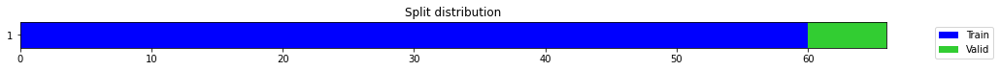

epoch,train_loss,valid_loss,mse,time
0,0.332402,0.251079,0.251079,00:00
1,0.294409,0.220908,0.220908,00:00
2,0.286385,0.187426,0.187426,00:00
3,0.257822,0.131304,0.131304,00:00
4,0.225625,0.064436,0.064436,00:00
5,0.209929,0.012363,0.012363,00:00
6,0.191315,0.003550,0.003550,00:00
7,0.188991,0.073868,0.073868,00:00
8,0.177358,0.098383,0.098383,00:00
9,0.169665,0.075514,0.075514,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1761418879032135,
  "MSE_normalize": 0.03104621815258864,
  "RMSE_normalize": 0.17619937046592601,
  "MAPE_normalize": 0.18231348961018423,
  "MAE": 11361.856337308884,
  "MSE": 129176049.41461313,
  "RMSE": 11365.564192534091,
  "MAPE": 0.09633793086576625
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.1
2022-10-14 20:53:04.805276+07:00
PROGRESS: [ 457 / 1944 ]


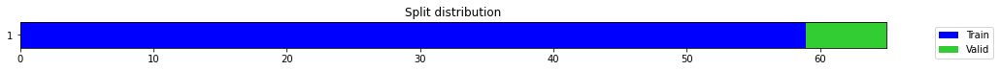

epoch,train_loss,valid_loss,mse,time
0,0.391594,0.644047,0.644047,00:00
1,0.285369,0.026013,0.026013,00:00
2,0.239319,0.521177,0.521177,00:00
3,0.247680,0.050080,0.050080,00:00
4,0.219317,0.380787,0.380787,00:00
5,0.202421,1.183372,1.183372,00:00
6,0.184519,0.722304,0.722304,00:00
7,0.178576,0.403569,0.403569,00:00
8,0.167332,0.310912,0.310912,00:00
9,0.154799,0.300436,0.300436,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5479819675286611,
  "MSE_normalize": 0.30043634303474026,
  "RMSE_normalize": 0.5481207376433958,
  "MAPE_normalize": 0.5666225221061679,
  "MAE": 35347.02883346876,
  "MSE": 1250045326.0702655,
  "RMSE": 35355.9800609496,
  "MAPE": 0.2995534884965055
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.1
2022-10-14 20:53:07.043758+07:00
PROGRESS: [ 458 / 1944 ]


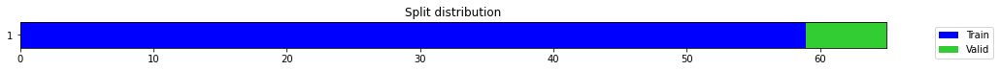

epoch,train_loss,valid_loss,mse,time
0,0.437326,0.716830,0.716830,00:00
1,0.365920,0.029588,0.029588,00:00
2,0.318478,0.281885,0.281885,00:00
3,0.270970,0.011684,0.011684,00:00
4,0.242774,0.077298,0.077298,00:00
5,0.227305,0.237041,0.237041,00:00
6,0.213332,1.239877,1.239877,00:00
7,0.192479,0.133651,0.133651,00:00
8,0.185255,0.232425,0.232425,00:00
9,0.170824,0.051458,0.051458,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.30599672595659894,
  "MSE_normalize": 0.09365734173762459,
  "RMSE_normalize": 0.30603487013349406,
  "MAPE_normalize": 0.3164661658162057,
  "MAE": 19738.012811104458,
  "MSE": 389686284.65080684,
  "RMSE": 19740.473263090906,
  "MAPE": 0.167289504087571
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.1
2022-10-14 20:53:12.163225+07:00
PROGRESS: [ 459 / 1944 ]


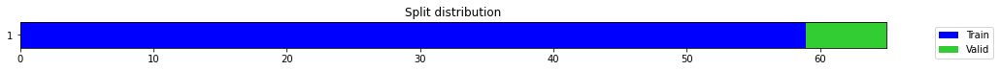

epoch,train_loss,valid_loss,mse,time
0,0.410721,0.773601,0.773601,00:00
1,0.368782,0.365926,0.365926,00:00
2,0.297711,0.044301,0.044301,00:00
3,0.267423,0.022375,0.022375,00:00
4,0.242239,0.005582,0.005582,00:00
5,0.219110,0.012757,0.012757,00:00
6,0.209284,0.027810,0.027810,00:00
7,0.202544,0.125170,0.125170,00:00
8,0.191902,0.932881,0.932881,00:00
9,0.180187,0.646422,0.646422,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.32097084323565167,
  "MSE_normalize": 0.10306592344898687,
  "RMSE_normalize": 0.32103881922438426,
  "MAPE_normalize": 0.3319096523774418,
  "MAE": 20703.903272072475,
  "MSE": 428833191.694202,
  "RMSE": 20708.28799524968,
  "MAPE": 0.17546394333756368
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.2
2022-10-14 20:53:21.948164+07:00
PROGRESS: [ 460 / 1944 ]


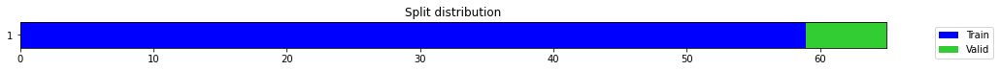

epoch,train_loss,valid_loss,mse,time
0,0.160665,0.066202,0.066202,00:00
1,0.149864,0.023736,0.023736,00:00
2,0.145019,0.005758,0.005758,00:00
3,0.141058,0.028394,0.028394,00:00
4,0.130184,0.106261,0.106261,00:00
5,0.124605,0.323515,0.323515,00:00
6,0.120598,0.586114,0.586114,00:00
7,0.118330,0.472195,0.472195,00:00
8,0.110698,0.097455,0.097455,00:00
9,0.109986,0.101748,0.101748,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3013765017191569,
  "MSE_normalize": 0.09085285091170785,
  "RMSE_normalize": 0.30141806666440524,
  "MAPE_normalize": 0.31167954270883835,
  "MAE": 19439.989866892498,
  "MSE": 378017454.53014857,
  "RMSE": 19442.670972120795,
  "MAPE": 0.1647612987385856
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:53:42.095809+07:00
PROGRESS: [ 461 / 1944 ]


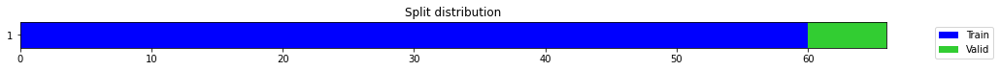

epoch,train_loss,valid_loss,mse,time
0,0.670511,0.697042,0.697042,00:00
1,0.517065,0.019001,0.019001,00:00
2,0.416345,0.003395,0.003395,00:00
3,0.356629,0.590832,0.590832,00:00
4,0.301494,0.309033,0.309033,00:00
5,0.277539,0.260196,0.260196,00:00
6,0.240105,0.592283,0.592283,00:00
7,0.217056,0.478355,0.478355,00:00
8,0.202721,0.317172,0.317172,00:00
9,0.187452,0.249351,0.249351,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4993153363466263,
  "MSE_normalize": 0.24935098802497757,
  "RMSE_normalize": 0.49935056626079594,
  "MAPE_normalize": 0.5164308447813847,
  "MAE": 32207.83645570278,
  "MSE": 1037491117.0303496,
  "RMSE": 32210.10892608638,
  "MAPE": 0.2729862577544469
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:53:44.658638+07:00
PROGRESS: [ 462 / 1944 ]


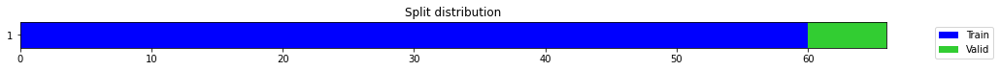

epoch,train_loss,valid_loss,mse,time
0,0.252357,1.454333,1.454333,00:00
1,0.201800,0.134191,0.134191,00:00
2,0.198889,0.091218,0.091218,00:00
3,0.192153,0.387719,0.387719,00:00
4,0.183156,0.458557,0.458557,00:00
5,0.167583,0.016514,0.016514,00:00
6,0.153048,0.006883,0.006883,00:00
7,0.148157,0.222096,0.222096,00:00
8,0.143715,0.091496,0.091496,00:00
9,0.134259,0.020175,0.020175,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4804861942927043,
  "MSE_normalize": 0.23089644942808807,
  "RMSE_normalize": 0.48051685654937026,
  "MAPE_normalize": 0.49696367883919196,
  "MAE": 30993.281476656597,
  "MSE": 960706099.9954515,
  "RMSE": 30995.259314860577,
  "MAPE": 0.2626941080633209
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:53:50.523094+07:00
PROGRESS: [ 463 / 1944 ]


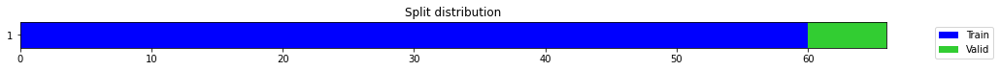

epoch,train_loss,valid_loss,mse,time
0,0.272697,0.449819,0.449819,00:00
1,0.235286,0.134116,0.134116,00:00
2,0.199549,0.002775,0.002775,00:00
3,0.171738,0.264105,0.264105,00:00
4,0.173566,0.295829,0.295829,00:00
5,0.196412,0.000729,0.000729,00:00
6,0.173914,0.455406,0.455406,00:00
7,0.171536,0.677254,0.677254,00:00
8,0.162754,0.002411,0.002411,00:00
9,0.152788,0.449106,0.449106,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4707604944705963,
  "MSE_normalize": 0.22177311715330936,
  "RMSE_normalize": 0.4709279320164704,
  "MAPE_normalize": 0.48672610393294463,
  "MAE": 30365.934935331345,
  "MSE": 922746049.1138762,
  "RMSE": 30376.735326790407,
  "MAPE": 0.2573270419147577
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:54:02.138666+07:00
PROGRESS: [ 464 / 1944 ]


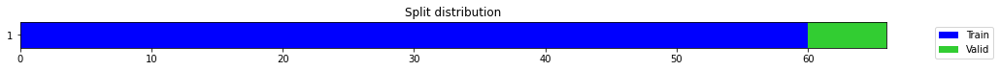

epoch,train_loss,valid_loss,mse,time
0,0.556720,0.764140,0.764140,00:00
1,0.475932,0.403001,0.403001,00:00
2,0.420000,0.129448,0.129448,00:00
3,0.345715,0.002210,0.002210,00:00
4,0.304106,0.060844,0.060844,00:00
5,0.265625,0.194469,0.194469,00:00
6,0.245009,0.251222,0.251222,00:00
7,0.235925,0.083315,0.083315,00:00
8,0.242775,0.032120,0.032120,00:00
9,0.232931,0.048591,0.048591,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3574153780937195,
  "MSE_normalize": 0.12775685240510862,
  "RMSE_normalize": 0.35743090577775816,
  "MAPE_normalize": 0.36969330106414633,
  "MAE": 23054.72154855728,
  "MSE": 531566369.7983039,
  "RMSE": 23055.723146288514,
  "MAPE": 0.1954140388405435
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:54:24.169480+07:00
PROGRESS: [ 465 / 1944 ]


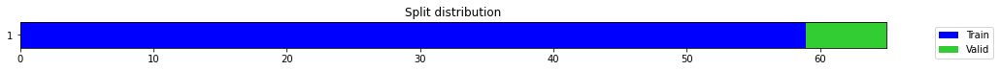

epoch,train_loss,valid_loss,mse,time
0,0.508918,0.291837,0.291837,00:00
1,0.373265,0.108316,0.108316,00:00
2,0.282427,0.169006,0.169006,00:00
3,0.257262,0.305476,0.305476,00:00
4,0.225573,2.167118,2.167118,00:00
5,0.212038,1.482923,1.482923,00:00
6,0.195974,0.210329,0.210329,00:00
7,0.181103,0.038033,0.038033,00:00
8,0.166031,0.083664,0.083664,00:00
9,0.157590,0.151174,0.151174,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.38879022002220154,
  "MSE_normalize": 0.15117444958068363,
  "RMSE_normalize": 0.3888115862222776,
  "MAPE_normalize": 0.4022582522419765,
  "MAE": 25078.524352312088,
  "MSE": 629001512.3028139,
  "RMSE": 25079.902557681795,
  "MAPE": 0.21259940812441605
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:54:26.725856+07:00
PROGRESS: [ 466 / 1944 ]


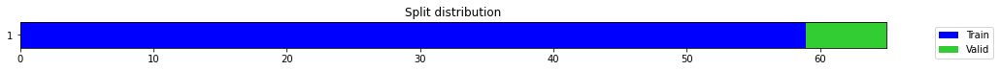

epoch,train_loss,valid_loss,mse,time
0,0.244428,0.371657,0.371657,00:00
1,0.186253,0.084044,0.084044,00:00
2,0.156075,0.143303,0.143303,00:00
3,0.148899,0.510901,0.510901,00:00
4,0.141724,0.206069,0.206069,00:00
5,0.147414,2.483806,2.483806,00:00
6,0.144511,0.205559,0.205559,00:00
7,0.135663,0.077814,0.077814,00:00
8,0.131591,0.096658,0.096658,00:00
9,0.123600,0.415235,0.415235,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3172869185606639,
  "MSE_normalize": 0.10071764648553543,
  "RMSE_normalize": 0.31736043623226795,
  "MAPE_normalize": 0.3281008694169416,
  "MAE": 20466.275394837063,
  "MSE": 419062560.70851755,
  "RMSE": 20471.017578726212,
  "MAPE": 0.17345016224658436
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.3
2022-10-14 20:54:32.342041+07:00
PROGRESS: [ 467 / 1944 ]


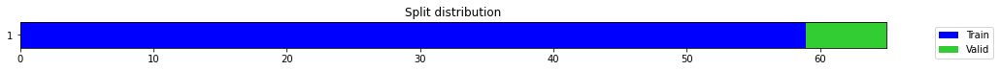

epoch,train_loss,valid_loss,mse,time
0,0.138571,0.659040,0.659040,00:00
1,0.148648,0.537760,0.537760,00:00
2,0.129312,0.498452,0.498452,00:00
3,0.114861,0.606275,0.606275,00:00
4,0.109528,0.938009,0.938009,00:00
5,0.108822,0.510633,0.510633,00:00
6,0.104572,0.692070,0.692070,00:00
7,0.102376,2.475097,2.475097,00:00
8,0.104027,0.176838,0.176838,00:00
9,0.104509,1.408367,1.408367,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6562858372926712,
  "MSE_normalize": 0.43104743858227684,
  "RMSE_normalize": 0.6565420310858071,
  "MAPE_normalize": 0.6785234964155095,
  "MAE": 42333.06164872646,
  "MSE": 1793487533.7369845,
  "RMSE": 42349.5871731589,
  "MAPE": 0.3587333224671317
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.5
2022-10-14 20:54:44.077829+07:00
PROGRESS: [ 468 / 1944 ]


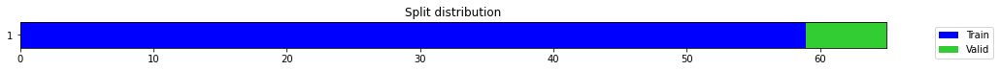

epoch,train_loss,valid_loss,mse,time
0,1.079848,3.831651,3.831651,00:00
1,1.047742,2.728462,2.728462,00:00
2,0.975549,1.697138,1.697138,00:00
3,0.882313,0.852743,0.852743,00:00
4,0.791053,0.254489,0.254489,00:00
5,0.684407,0.005568,0.005568,00:00
6,0.606268,0.105519,0.105519,00:00
7,0.540181,0.353117,0.353117,00:00
8,0.492329,0.312441,0.312441,00:00
9,0.456990,0.158807,0.158807,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.413211186726888,
  "MSE_normalize": 0.17083269152003902,
  "RMSE_normalize": 0.41331911584154807,
  "MAPE_normalize": 0.42726481944242867,
  "MAE": 26653.774388631184,
  "MSE": 710794857.2983898,
  "RMSE": 26660.736248243218,
  "MAPE": 0.22588058007253173
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.6
2022-10-14 20:55:06.403044+07:00
PROGRESS: [ 469 / 1944 ]


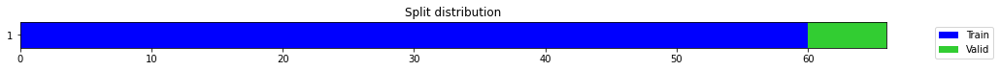

epoch,train_loss,valid_loss,mse,time
0,0.395411,0.076271,0.076271,00:00
1,0.291718,0.455119,0.455119,00:00
2,0.266950,0.025158,0.025158,00:00
3,0.218068,0.109275,0.109275,00:00
4,0.197632,0.073458,0.073458,00:00
5,0.170715,0.584018,0.584018,00:00
6,0.166083,0.184023,0.184023,00:00
7,0.156672,0.163874,0.163874,00:00
8,0.142100,0.198039,0.198039,00:00
9,0.137122,0.209376,0.209376,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.45749099055926007,
  "MSE_normalize": 0.2093757449026651,
  "RMSE_normalize": 0.45757594440995814,
  "MAPE_normalize": 0.47308636702931905,
  "MAE": 29509.99885503451,
  "MSE": 871163483.9656943,
  "RMSE": 29515.478718219943,
  "MAPE": 0.2500959350395784
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.6
2022-10-14 20:55:09.363372+07:00
PROGRESS: [ 470 / 1944 ]


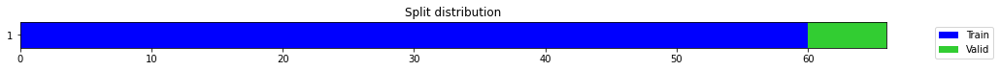

epoch,train_loss,valid_loss,mse,time
0,0.363565,1.532021,1.532021,00:00
1,0.261020,0.288723,0.288723,00:00
2,0.205571,0.007840,0.007840,00:00
3,0.203149,0.045288,0.045288,00:00
4,0.190019,0.346656,0.346656,00:00
5,0.183634,0.178662,0.178662,00:00
6,0.174082,0.011575,0.011575,00:00
7,0.170729,0.000349,0.000349,00:00
8,0.158578,0.063798,0.063798,00:00
9,0.149241,0.034573,0.034573,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.42949871222178143,
  "MSE_normalize": 0.18458754406554925,
  "RMSE_normalize": 0.4296365255254135,
  "MAPE_normalize": 0.44407986298556174,
  "MAE": 27704.38493315379,
  "MSE": 768025580.32484,
  "RMSE": 27713.27444249127,
  "MAPE": 0.2347766287225306
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.6
2022-10-14 20:55:15.950490+07:00
PROGRESS: [ 471 / 1944 ]


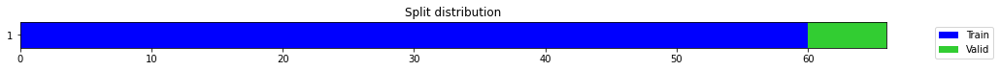

epoch,train_loss,valid_loss,mse,time
0,0.656850,1.740553,1.740553,00:00
1,0.484813,0.692888,0.692888,00:00
2,0.371497,0.021601,0.021601,00:00
3,0.303983,0.368137,0.368137,00:00
4,0.315023,0.477855,0.477855,00:00
5,0.302232,0.007863,0.007863,00:00
6,0.268511,0.101006,0.101006,00:00
7,0.251543,0.012363,0.012363,00:00
8,0.238517,0.074864,0.074864,00:00
9,0.225030,0.082241,0.082241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6805986016988754,
  "MSE_normalize": 0.4639215307723741,
  "RMSE_normalize": 0.6811178538053265,
  "MAPE_normalize": 0.703483034035218,
  "MAE": 43901.33220398426,
  "MSE": 1930268939.3283927,
  "RMSE": 43934.82604185878,
  "MAPE": 0.37197357022773553
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.7
2022-10-14 20:55:29.043465+07:00
PROGRESS: [ 472 / 1944 ]


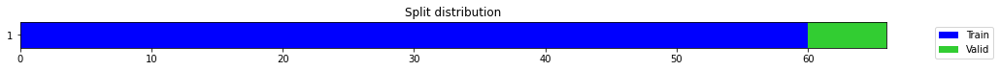

epoch,train_loss,valid_loss,mse,time
0,0.437888,1.132851,1.132851,00:00
1,0.366267,0.647191,0.647191,00:00
2,0.306681,0.259396,0.259396,00:00
3,0.275293,0.036719,0.036719,00:00
4,0.234938,0.004687,0.004687,00:00
5,0.214998,0.034230,0.034230,00:00
6,0.203502,0.026034,0.026034,00:00
7,0.197592,0.003672,0.003672,00:00
8,0.185940,0.008986,0.008986,00:00
9,0.176642,0.172516,0.172516,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.581904927889506,
  "MSE_normalize": 0.33868600086387585,
  "RMSE_normalize": 0.5819673537784364,
  "MAPE_normalize": 0.6018058268490819,
  "MAE": 37535.195468584694,
  "MSE": 1409193202.489361,
  "RMSE": 37539.222188124266,
  "MAPE": 0.31812716453881923
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.7
2022-10-14 20:55:54.879472+07:00
PROGRESS: [ 473 / 1944 ]


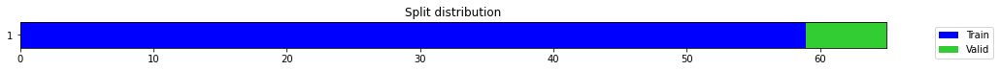

epoch,train_loss,valid_loss,mse,time
0,0.287065,0.542271,0.542271,00:00
1,0.235741,0.279376,0.279376,00:00
2,0.220746,0.332081,0.332081,00:00
3,0.189330,1.554489,1.554489,00:00
4,0.164484,0.725429,0.725429,00:00
5,0.148339,0.148476,0.148476,00:00
6,0.139848,0.300819,0.300819,00:00
7,0.131788,0.278185,0.278185,00:00
8,0.121703,0.194791,0.194791,00:00
9,0.115408,0.175406,0.175406,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.41836829980214435,
  "MSE_normalize": 0.175405571976043,
  "RMSE_normalize": 0.4188144839616259,
  "MAPE_normalize": 0.4323651233450363,
  "MAE": 26986.42881043752,
  "MSE": 729821542.8949617,
  "RMSE": 27015.209473460716,
  "MAPE": 0.22863481334834346
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.7
2022-10-14 20:55:58.134378+07:00
PROGRESS: [ 474 / 1944 ]


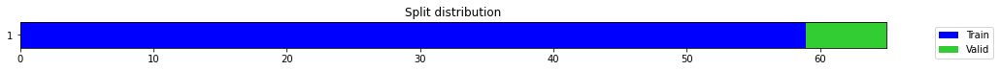

epoch,train_loss,valid_loss,mse,time
0,0.142235,0.048491,0.048491,00:00
1,0.134107,0.245463,0.245463,00:00
2,0.117025,0.044001,0.044001,00:00
3,0.106190,0.191134,0.191134,00:00
4,0.108306,0.022443,0.022443,00:00
5,0.100789,0.065444,0.065444,00:00
6,0.103877,0.563351,0.563351,00:00
7,0.112199,0.014728,0.014728,00:00
8,0.111732,0.010108,0.010108,00:00
9,0.109161,0.999223,0.999223,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2707601487636566,
  "MSE_normalize": 0.07346749618772168,
  "RMSE_normalize": 0.27104888154670864,
  "MAPE_normalize": 0.27982179562281656,
  "MAE": 17465.112635850906,
  "MSE": 305681061.4184819,
  "RMSE": 17483.737055288893,
  "MAPE": 0.14796900721488324
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.7
2022-10-14 20:56:05.052842+07:00
PROGRESS: [ 475 / 1944 ]


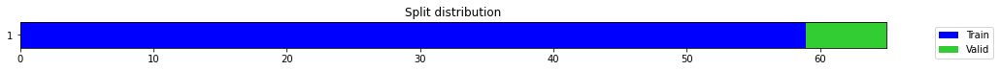

epoch,train_loss,valid_loss,mse,time
0,0.382620,0.374048,0.374048,00:00
1,0.324779,0.093081,0.093081,00:00
2,0.282564,0.006785,0.006785,00:00
3,0.263963,0.010326,0.010326,00:00
4,0.232813,0.048724,0.048724,00:00
5,0.211661,0.472483,0.472483,00:00
6,0.198832,0.513750,0.513750,00:00
7,0.187566,0.491431,0.491431,00:00
8,0.173943,0.742593,0.742593,00:00
9,0.168762,0.168514,0.168514,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2071476380030314,
  "MSE_normalize": 0.04291687394775797,
  "RMSE_normalize": 0.20716388186109558,
  "MAPE_normalize": 0.21431154049107648,
  "MAE": 13361.851241747538,
  "MSE": 178567070.6347871,
  "RMSE": 13362.899035568109,
  "MAPE": 0.11326976308654364
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.8
2022-10-14 20:56:19.638359+07:00
PROGRESS: [ 476 / 1944 ]


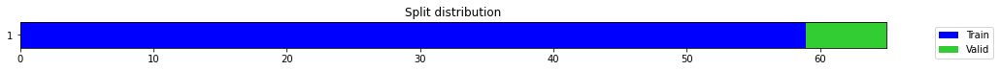

epoch,train_loss,valid_loss,mse,time
0,0.573751,0.822529,0.822529,00:00
1,0.614314,0.478097,0.478097,00:00
2,0.547454,0.209359,0.209359,00:00
3,0.503316,0.085244,0.085244,00:00
4,0.454065,0.018096,0.018096,00:00
5,0.416083,0.021410,0.021410,00:00
6,0.367112,0.092932,0.092932,00:00
7,0.326107,0.129509,0.129509,00:00
8,0.293407,0.050753,0.050753,00:00
9,0.279920,0.003163,0.003163,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3529554506142934,
  "MSE_normalize": 0.12459270689769812,
  "RMSE_normalize": 0.3529769211969787,
  "MAPE_normalize": 0.36520445909138727,
  "MAE": 22767.03838642438,
  "MSE": 518401100.70139104,
  "RMSE": 22768.423324889915,
  "MAPE": 0.19301031239010383
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.9
2022-10-14 20:56:47.038095+07:00
PROGRESS: [ 477 / 1944 ]


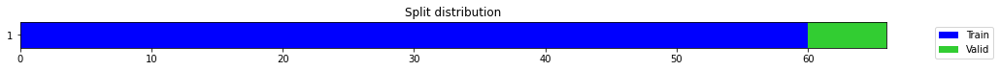

epoch,train_loss,valid_loss,mse,time
0,0.291758,0.237838,0.237838,00:00
1,0.251642,0.041361,0.041361,00:00
2,0.231878,0.350948,0.350948,00:00
3,0.237528,0.067726,0.067726,00:00
4,0.215592,1.860518,1.860518,00:00
5,0.200232,0.057127,0.057127,00:00
6,0.187719,0.142135,0.142135,00:00
7,0.182487,0.031930,0.031930,00:00
8,0.178783,0.000815,0.000815,00:00
9,0.164453,0.005431,0.005431,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07359124223391215,
  "MSE_normalize": 0.005431366812958416,
  "RMSE_normalize": 0.07369780738229881,
  "MAPE_normalize": 0.0761966592546979,
  "MAE": 4746.92948905627,
  "MSE": 22598646.455787603,
  "RMSE": 4753.803367387802,
  "MAPE": 0.0402570659437948
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.0
2022-10-14 20:56:50.509001+07:00
PROGRESS: [ 478 / 1944 ]


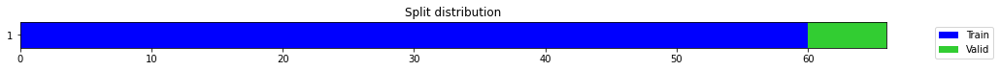

epoch,train_loss,valid_loss,mse,time
0,0.251057,0.345515,0.345515,00:00
1,0.230498,0.241543,0.241543,00:00
2,0.196128,0.005124,0.005124,00:00
3,0.191296,0.034342,0.034342,00:00
4,0.169844,0.995756,0.995756,00:00
5,0.163624,0.010220,0.010220,00:00
6,0.145588,0.116703,0.116703,00:00
7,0.141108,0.065227,0.065227,00:00
8,0.141891,1.901142,1.901142,00:00
9,0.136380,0.379485,0.379485,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.20590943098068237,
  "MSE_normalize": 0.042439952934869275,
  "RMSE_normalize": 0.20600959427868712,
  "MAPE_normalize": 0.21316079390606876,
  "MAE": 13281.981935977936,
  "MSE": 176582713.89204356,
  "RMSE": 13288.442869352435,
  "MAPE": 0.11262907351869067
}
Percent CPU Usage: 99.9
Percent Ram Usage: 22.0
2022-10-14 20:56:58.847090+07:00
PROGRESS: [ 479 / 1944 ]


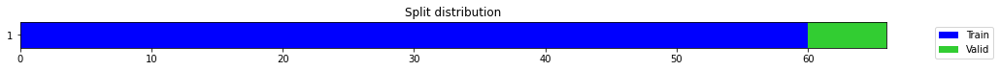

epoch,train_loss,valid_loss,mse,time
0,0.276622,0.256841,0.256841,00:00
1,0.188487,0.003062,0.003062,00:00
2,0.175515,0.219467,0.219467,00:00
3,0.169058,0.200782,0.200782,00:00
4,0.158121,0.025542,0.025542,00:00
5,0.172626,0.305219,0.305219,00:00
6,0.165276,0.013518,0.013518,00:00
7,0.165388,0.001509,0.001509,00:00
8,0.156231,0.140064,0.140064,00:00
9,0.145768,0.056661,0.056661,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6129497289657593,
  "MSE_normalize": 0.3760977471711362,
  "RMSE_normalize": 0.6132680875205689,
  "MAPE_normalize": 0.6336571772400602,
  "MAE": 39537.70931720734,
  "MSE": 1564854725.123824,
  "RMSE": 39558.24471742678,
  "MAPE": 0.3350280744307869
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.0
2022-10-14 20:57:14.872730+07:00
PROGRESS: [ 480 / 1944 ]


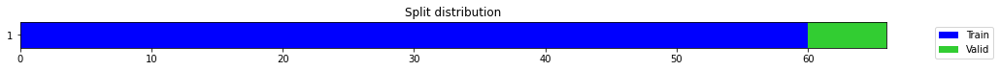

epoch,train_loss,valid_loss,mse,time
0,0.328331,0.283229,0.283229,00:00
1,0.245200,0.083846,0.083846,00:00
2,0.213914,0.004278,0.004278,00:00
3,0.185879,0.006444,0.006444,00:00
4,0.162756,0.024242,0.024242,00:00
5,0.166474,0.002283,0.002283,00:00
6,0.163500,0.007291,0.007291,00:00
7,0.148554,0.054100,0.054100,00:00
8,0.138874,0.001065,0.001065,00:00
9,0.135767,0.283953,0.283953,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2757398883501689,
  "MSE_normalize": 0.07620366145023401,
  "RMSE_normalize": 0.27605010677453834,
  "MAPE_normalize": 0.2855616400146702,
  "MAE": 17786.325758139294,
  "MSE": 317065604.856903,
  "RMSE": 17806.33608738482,
  "MAPE": 0.15085621195848795
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.0
2022-10-14 20:57:48.474695+07:00
PROGRESS: [ 481 / 1944 ]


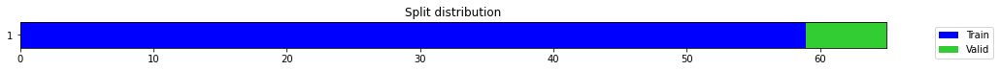

epoch,train_loss,valid_loss,mse,time
0,0.386020,0.051676,0.051676,00:00
1,0.317973,0.002760,0.002760,00:00
2,0.306175,0.414738,0.414738,00:00
3,0.249768,2.819158,2.819158,00:00
4,0.232046,0.086750,0.086750,00:00
5,0.242184,0.026201,0.026201,00:00
6,0.220924,1.297318,1.297318,00:00
7,0.207277,0.348013,0.348013,00:00
8,0.188664,0.084285,0.084285,00:00
9,0.181440,0.078302,0.078302,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2796604335308075,
  "MSE_normalize": 0.07830220851269172,
  "RMSE_normalize": 0.27982531785507136,
  "MAPE_normalize": 0.2895216690457596,
  "MAE": 18039.216604471207,
  "MSE": 325797168.15735364,
  "RMSE": 18049.852302923526,
  "MAPE": 0.15297318699554335
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.0
2022-10-14 20:57:52.769204+07:00
PROGRESS: [ 482 / 1944 ]


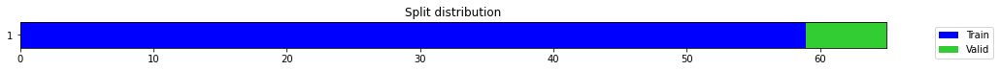

epoch,train_loss,valid_loss,mse,time
0,0.438242,0.447024,0.447024,00:00
1,0.307762,0.175622,0.175622,00:00
2,0.272271,0.027704,0.027704,00:00
3,0.257528,0.425526,0.425526,00:00
4,0.255743,0.103473,0.103473,00:00
5,0.249132,4.600500,4.600500,00:00
6,0.247403,0.067080,0.067080,00:00
7,0.233240,0.964289,0.964289,00:00
8,0.213939,0.403779,0.403779,00:00
9,0.196264,1.574022,1.574022,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5519994348287582,
  "MSE_normalize": 0.3049009181634032,
  "RMSE_normalize": 0.5521783390929086,
  "MAPE_normalize": 0.5707362882128013,
  "MAE": 35606.17154419422,
  "MSE": 1268621378.541485,
  "RMSE": 35617.71158484898,
  "MAPE": 0.30173834525306237
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.0
2022-10-14 20:58:05.742260+07:00
PROGRESS: [ 483 / 1944 ]


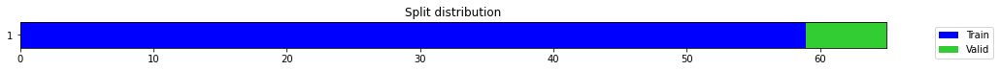

epoch,train_loss,valid_loss,mse,time
0,0.109755,0.023117,0.023117,00:00
1,0.120587,0.000542,0.000542,00:00
2,0.118659,0.267530,0.267530,00:00
3,0.113488,0.535750,0.535750,00:00
4,0.121967,0.169058,0.169058,00:00
5,0.126834,2.089597,2.089597,00:00
6,0.146586,3.125537,3.125537,00:00
7,0.141796,0.026815,0.026815,00:00
8,0.139911,2.135968,2.135968,00:00
9,0.142047,0.006971,0.006971,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5783811459938685,
  "MSE_normalize": 0.3348753821298079,
  "RMSE_normalize": 0.5786841816827274,
  "MAPE_normalize": 0.5979188714102738,
  "MAE": 37307.89744118849,
  "MSE": 1393338109.5607185,
  "RMSE": 37327.44445526265,
  "MAPE": 0.3161329112475762
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.2
2022-10-14 20:58:49.661832+07:00
PROGRESS: [ 484 / 1944 ]


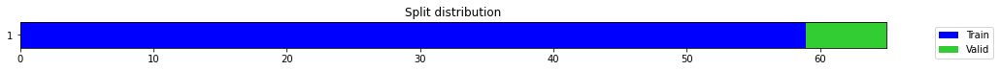

epoch,train_loss,valid_loss,mse,time
0,0.552215,0.352266,0.352266,00:00
1,0.507703,0.039608,0.039608,00:00
2,0.443853,0.000585,0.000585,00:00
3,0.416195,0.050692,0.050692,00:00
4,0.357748,0.165053,0.165053,00:00
5,0.303665,0.152558,0.152558,00:00
6,0.280306,0.064813,0.064813,00:00
7,0.269933,0.053990,0.053990,00:00
8,0.267642,0.515389,0.515389,00:00
9,0.258740,2.507953,2.507953,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.45523713032404584,
  "MSE_normalize": 0.2073144169729438,
  "RMSE_normalize": 0.4553179295535635,
  "MAPE_normalize": 0.47076295362648485,
  "MAE": 29364.615854422253,
  "MSE": 862586780.7678782,
  "RMSE": 29369.82772792306,
  "MAPE": 0.2488658912649531
}
Percent CPU Usage: 100.0
Percent Ram Usage: 21.9
2022-10-14 21:00:16.547189+07:00
PROGRESS: [ 485 / 1944 ]


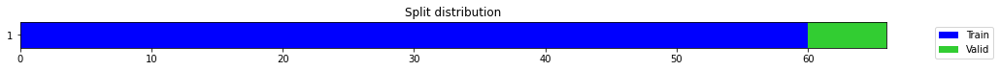

epoch,train_loss,valid_loss,mse,time
0,0.302228,0.027135,0.027135,00:00
1,0.242143,0.006986,0.006986,00:00
2,0.214649,0.042741,0.042741,00:00
3,0.201026,0.024629,0.024629,00:00
4,0.184388,0.957510,0.957510,00:00
5,0.192246,0.106116,0.106116,00:00
6,0.184491,0.819529,0.819529,00:00
7,0.176525,0.010090,0.010090,00:00
8,0.160143,0.144453,0.144453,00:00
9,0.149213,0.184557,0.184557,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.429571529229482,
  "MSE_normalize": 0.1845571004828249,
  "RMSE_normalize": 0.4296010946015209,
  "MAPE_normalize": 0.44429612859574724,
  "MAE": 27709.081921418507,
  "MSE": 767898911.700435,
  "RMSE": 27710.989006176504,
  "MAPE": 0.23485585436269674
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.4
2022-10-14 21:00:25.527339+07:00
PROGRESS: [ 486 / 1944 ]


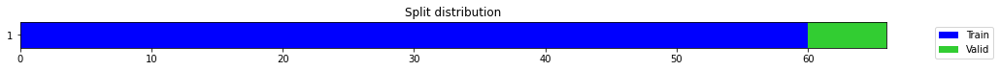

epoch,train_loss,valid_loss,mse,time
0,0.236192,0.031249,0.031249,00:00
1,0.195474,0.062203,0.062203,00:00
2,0.167535,0.003214,0.003214,00:00
3,0.163843,1.767846,1.767846,00:00
4,0.158211,0.400166,0.400166,00:00
5,0.154039,0.298078,0.298078,00:00
6,0.155460,0.000374,0.000374,00:00
7,0.150227,0.545788,0.545788,00:00
8,0.144633,0.001340,0.001340,00:00
9,0.152600,2.719440,2.719440,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.7375118906299273,
  "MSE_normalize": 0.5442278633417147,
  "RMSE_normalize": 0.7377180107207053,
  "MAPE_normalize": 0.762576521449787,
  "MAE": 47572.46699319283,
  "MSE": 2264404798.7524986,
  "RMSE": 47585.76256352838,
  "MAPE": 0.40315327901681597
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.5
2022-10-14 21:00:47.485951+07:00
PROGRESS: [ 487 / 1944 ]


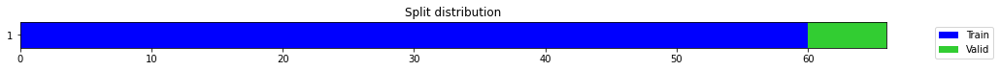

epoch,train_loss,valid_loss,mse,time
0,0.231631,0.227412,0.227412,00:00
1,0.167494,0.023999,0.023999,00:00
2,0.155854,0.138214,0.138214,00:00
3,0.162086,0.016667,0.016667,00:00
4,0.160272,0.121577,0.121577,00:00
5,0.153685,0.677237,0.677237,00:00
6,0.162118,0.002738,0.002738,00:00
7,0.155951,0.014381,0.014381,00:00
8,0.146986,0.252836,0.252836,00:00
9,0.152195,0.077319,0.077319,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.7268961394826571,
  "MSE_normalize": 0.5287489380304567,
  "RMSE_normalize": 0.7271512483867828,
  "MAPE_normalize": 0.7515508762058326,
  "MAE": 46887.70858118931,
  "MSE": 2200000612.3532143,
  "RMSE": 46904.16412594104,
  "MAPE": 0.3973365735328773
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.6
2022-10-14 21:01:29.444791+07:00
PROGRESS: [ 488 / 1944 ]


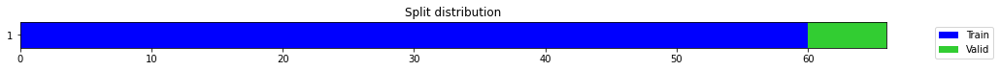

epoch,train_loss,valid_loss,mse,time
0,0.163265,0.039641,0.039641,00:00
1,0.161943,0.023350,0.023350,00:00
2,0.167075,0.001704,0.001704,00:00
3,0.157336,0.224368,0.224368,00:00
4,0.147242,0.581299,0.581299,00:00
5,0.150215,0.326358,0.326358,00:00
6,0.139180,0.052181,0.052181,00:00
7,0.143372,0.302716,0.302716,00:00
8,0.139087,1.163914,1.163914,00:00
9,0.139243,0.162741,0.162741,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6481771618127823,
  "MSE_normalize": 0.4203044895647848,
  "RMSE_normalize": 0.6483089460780136,
  "MAPE_normalize": 0.670258685398546,
  "MAE": 41810.01964557171,
  "MSE": 1748788636.553383,
  "RMSE": 41818.52025781619,
  "MAPE": 0.35433418200196914
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:02:49.903885+07:00
PROGRESS: [ 489 / 1944 ]


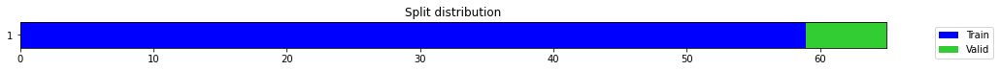

epoch,train_loss,valid_loss,mse,time
0,0.927942,0.393518,0.393518,00:00
1,0.669083,0.260160,0.260160,00:00
2,0.521994,0.610520,0.610520,00:00
3,0.454415,0.817973,0.817973,00:00
4,0.378845,0.187205,0.187205,00:00
5,0.334575,0.012007,0.012007,00:00
6,0.297115,0.354896,0.354896,00:00
7,0.264505,0.117279,0.117279,00:00
8,0.241451,0.116421,0.116421,00:00
9,0.225209,0.032966,0.032966,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.17911871274312338,
  "MSE_normalize": 0.03296625593781144,
  "RMSE_normalize": 0.1815661200164046,
  "MAPE_normalize": 0.18462431715434627,
  "MAE": 11553.87344678243,
  "MSE": 137164877.38080406,
  "RMSE": 11711.741005538162,
  "MAPE": 0.09775081538061385
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:02:57.581077+07:00
PROGRESS: [ 490 / 1944 ]


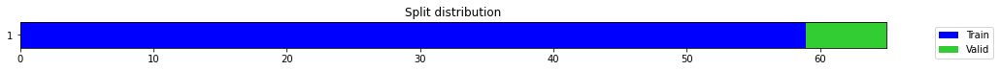

epoch,train_loss,valid_loss,mse,time
0,0.202806,0.126462,0.126462,00:00
1,0.168116,0.001951,0.001951,00:00
2,0.157716,0.569812,0.569812,00:00
3,0.164521,0.665089,0.665089,00:00
4,0.158491,6.788632,6.788632,00:00
5,0.161948,0.067105,0.067105,00:00
6,0.168757,0.788857,0.788857,00:00
7,0.169757,0.158621,0.158621,00:00
8,0.165912,1.590425,1.590425,00:00
9,0.163143,0.578011,0.578011,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5941888292630514,
  "MSE_normalize": 0.35326967467250014,
  "RMSE_normalize": 0.5943649339189688,
  "MAPE_normalize": 0.6143731313379361,
  "MAE": 38327.55624278387,
  "MSE": 1469872456.8607147,
  "RMSE": 38338.91569750917,
  "MAPE": 0.32480455610030573
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.6
2022-10-14 21:03:15.145835+07:00
PROGRESS: [ 491 / 1944 ]


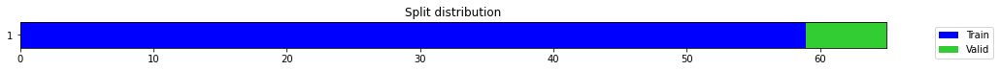

epoch,train_loss,valid_loss,mse,time
0,0.523541,1.049939,1.049939,00:00
1,0.454464,0.138484,0.138484,00:00
2,0.396110,0.014306,0.014306,00:00
3,0.322737,0.015080,0.015080,00:00
4,0.283203,0.072459,0.072459,00:00
5,0.276289,0.010716,0.010716,00:00
6,0.263021,0.021227,0.021227,00:00
7,0.232224,0.682432,0.682432,00:00
8,0.222681,0.324215,0.324215,00:00
9,0.206060,0.047292,0.047292,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4943561653296153,
  "MSE_normalize": 0.24440325941528881,
  "RMSE_normalize": 0.4943715803070488,
  "MAPE_normalize": 0.5114891446630756,
  "MAE": 31887.950088421505,
  "MSE": 1016904775.9747658,
  "RMSE": 31888.944416125876,
  "MAPE": 0.2703274871084194
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:03:48.226682+07:00
PROGRESS: [ 492 / 1944 ]


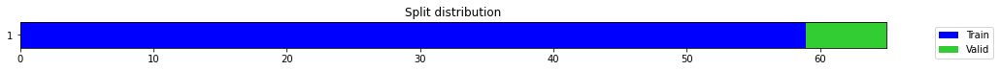

epoch,train_loss,valid_loss,mse,time
0,0.750456,2.038700,2.038700,00:00
1,0.635269,0.848326,0.848326,00:00
2,0.533663,0.226193,0.226193,00:00
3,0.460083,0.028796,0.028796,00:00
4,0.409494,0.013273,0.013273,00:00
5,0.358422,0.151421,0.151421,00:00
6,0.328931,0.376640,0.376640,00:00
7,0.318339,0.134682,0.134682,00:00
8,0.306621,0.024455,0.024455,00:00
9,0.285131,0.018811,0.018811,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5235975533723831,
  "MSE_normalize": 0.2742076280116644,
  "RMSE_normalize": 0.5236483820386199,
  "MAPE_normalize": 0.5415162260608877,
  "MAE": 33774.1365827322,
  "MSE": 1140913779.958903,
  "RMSE": 33777.415235019136,
  "MAPE": 0.28625384175179347
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:04:52.442882+07:00
PROGRESS: [ 493 / 1944 ]


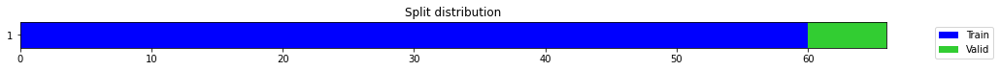

epoch,train_loss,valid_loss,mse,time
0,0.173783,0.065856,0.065856,00:00
1,0.222985,0.155285,0.155285,00:00
2,0.187067,1.073089,1.073089,00:00
3,0.182709,0.167326,0.167326,00:00
4,0.169357,0.030584,0.030584,00:00
5,0.155716,0.058442,0.058442,00:00
6,0.149386,0.287495,0.287495,00:00
7,0.137030,0.272368,0.272368,00:00
8,0.128415,0.123778,0.123778,00:00
9,0.126206,0.118471,0.118471,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3441536525885264,
  "MSE_normalize": 0.11847078664841071,
  "RMSE_normalize": 0.34419585507151407,
  "MAPE_normalize": 0.35592389513549033,
  "MAE": 22199.28720657031,
  "MSE": 492929222.97549385,
  "RMSE": 22202.009435532942,
  "MAPE": 0.18814873624615128
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:04:58.252210+07:00
PROGRESS: [ 494 / 1944 ]


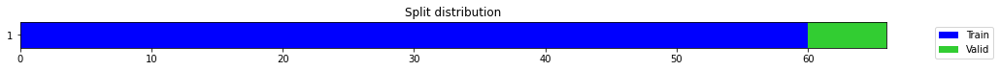

epoch,train_loss,valid_loss,mse,time
0,0.333767,0.055404,0.055404,00:00
1,0.233872,0.172160,0.172160,00:00
2,0.234961,0.149063,0.149063,00:00
3,0.215847,0.017127,0.017127,00:00
4,0.214461,0.032857,0.032857,00:00
5,0.231187,1.690500,1.690500,00:00
6,0.230289,1.305989,1.305989,00:00
7,0.222993,0.227732,0.227732,00:00
8,0.203775,1.749455,1.749455,00:00
9,0.195750,0.634540,0.634540,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4498221278190613,
  "MSE_normalize": 0.2024292807593279,
  "RMSE_normalize": 0.44992141620434994,
  "MAPE_normalize": 0.46514175817366116,
  "MAE": 29015.32653284073,
  "MSE": 842260872.0267342,
  "RMSE": 29021.73103084539,
  "MAPE": 0.245899701942076
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.7
2022-10-14 21:05:16.137583+07:00
PROGRESS: [ 495 / 1944 ]


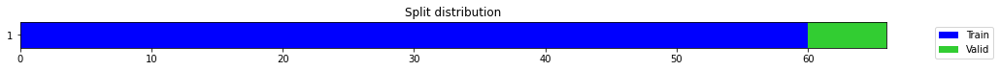

epoch,train_loss,valid_loss,mse,time
0,0.374757,0.327511,0.327511,00:00
1,0.257873,0.002547,0.002547,00:00
2,0.224840,0.265521,0.265521,00:00
3,0.225896,0.005235,0.005235,00:00
4,0.227324,0.145877,0.145877,00:00
5,0.202114,0.284359,0.284359,00:00
6,0.196790,1.018497,1.018497,00:00
7,0.184675,0.056726,0.056726,00:00
8,0.175629,0.171489,0.171489,00:00
9,0.171513,0.134645,0.134645,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5780036250750223,
  "MSE_normalize": 0.33409365706913235,
  "RMSE_normalize": 0.5780083538056628,
  "MAPE_normalize": 0.5979355204407825,
  "MAE": 37283.54583183924,
  "MSE": 1390085534.494404,
  "RMSE": 37283.85085388048,
  "MAPE": 0.3160402135492176
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:05:49.963718+07:00
PROGRESS: [ 496 / 1944 ]


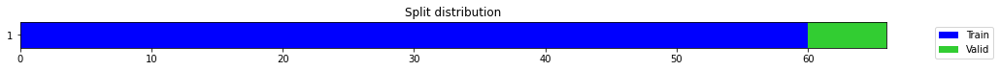

epoch,train_loss,valid_loss,mse,time
0,0.180927,0.195640,0.195640,00:00
1,0.136406,0.014519,0.014519,00:00
2,0.125344,0.000463,0.000463,00:00
3,0.119158,0.004803,0.004803,00:00
4,0.113824,0.001702,0.001702,00:00
5,0.107711,0.012149,0.012149,00:00
6,0.112595,0.331550,0.331550,00:00
7,0.115650,0.571830,0.571830,00:00
8,0.112615,0.234001,0.234001,00:00
9,0.106942,0.170578,0.170578,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.41318832834561664,
  "MSE_normalize": 0.17073669624577725,
  "RMSE_normalize": 0.4132029722131452,
  "MAPE_normalize": 0.4273881611946631,
  "MAE": 26652.299931605656,
  "MSE": 710395443.4235448,
  "RMSE": 26653.24451963672,
  "MAPE": 0.22590914563370168
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:06:56.206357+07:00
PROGRESS: [ 497 / 1944 ]


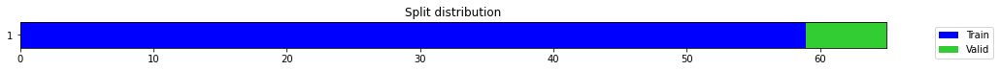

epoch,train_loss,valid_loss,mse,time
0,0.379983,0.057772,0.057772,00:00
1,0.320420,0.403865,0.403865,00:00
2,0.259167,0.098471,0.098471,00:00
3,0.220511,0.046590,0.046590,00:00
4,0.197688,0.003935,0.003935,00:00
5,0.176470,0.011964,0.011964,00:00
6,0.161760,1.147226,1.147226,00:00
7,0.156991,0.675599,0.675599,00:00
8,0.148556,0.296726,0.296726,00:00
9,0.137064,0.259562,0.259562,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5093110700448354,
  "MSE_normalize": 0.2595619025189852,
  "RMSE_normalize": 0.5094721803189898,
  "MAPE_normalize": 0.5266037760932589,
  "MAE": 32852.601262172066,
  "MSE": 1079976343.0492983,
  "RMSE": 32862.99351929611,
  "MAPE": 0.2784050437279419
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:07:02.732011+07:00
PROGRESS: [ 498 / 1944 ]


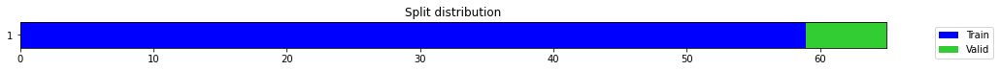

epoch,train_loss,valid_loss,mse,time
0,0.489352,0.223706,0.223706,00:00
1,0.377131,0.319292,0.319292,00:00
2,0.316924,0.047883,0.047883,00:00
3,0.288770,0.066786,0.066786,00:00
4,0.255950,2.482023,2.482023,00:00
5,0.247935,0.474166,0.474166,00:00
6,0.235603,0.231270,0.231270,00:00
7,0.234165,2.359704,2.359704,00:00
8,0.227744,1.350449,1.350449,00:00
9,0.219021,0.002586,0.002586,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4978780498107274,
  "MSE_normalize": 0.2482343534846696,
  "RMSE_normalize": 0.4982312249193838,
  "MAPE_normalize": 0.5146352578500285,
  "MAE": 32115.12572499116,
  "MSE": 1032845061.9827443,
  "RMSE": 32137.90693219993,
  "MAPE": 0.27211430056893976
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:07:17.571029+07:00
PROGRESS: [ 499 / 1944 ]


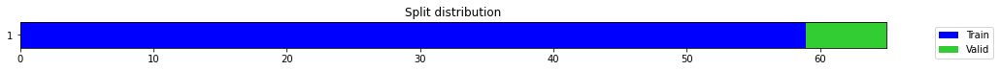

epoch,train_loss,valid_loss,mse,time
0,0.321401,0.532743,0.532743,00:00
1,0.246017,0.004544,0.004544,00:00
2,0.196189,0.023947,0.023947,00:00
3,0.179753,0.155883,0.155883,00:00
4,0.179244,0.208233,0.208233,00:00
5,0.160882,0.013200,0.013200,00:00
6,0.157666,3.455168,3.455168,00:00
7,0.155464,0.026040,0.026040,00:00
8,0.152837,0.380417,0.380417,00:00
9,0.146140,0.324440,0.324440,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.36639438072840375,
  "MSE_normalize": 0.13425489777649466,
  "RMSE_normalize": 0.36640810277134245,
  "MAPE_normalize": 0.37908474129031117,
  "MAE": 23633.903134504955,
  "MSE": 558603216.1499928,
  "RMSE": 23634.78826116267,
  "MAPE": 0.20035227430153638
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.9
2022-10-14 21:07:45.356783+07:00
PROGRESS: [ 500 / 1944 ]


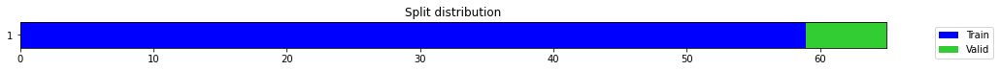

epoch,train_loss,valid_loss,mse,time
0,0.258230,0.287009,0.287009,00:00
1,0.269516,0.002004,0.002004,00:00
2,0.253509,0.000827,0.000827,00:00
3,0.231400,0.077090,0.077090,00:00
4,0.203106,0.449448,0.449448,00:00
5,0.184489,0.794679,0.794679,00:00
6,0.183805,0.233305,0.233305,00:00
7,0.180101,0.064720,0.064720,00:00
8,0.169654,0.684149,0.684149,00:00
9,0.160436,1.220667,1.220667,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4266263544559479,
  "MSE_normalize": 0.1820292863379039,
  "RMSE_normalize": 0.4266489028907773,
  "MAPE_normalize": 0.44143767920576527,
  "MAE": 27519.10636782646,
  "MSE": 757381268.5114837,
  "RMSE": 27520.560832066698,
  "MAPE": 0.23329813512812725
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:08:37.250874+07:00
PROGRESS: [ 501 / 1944 ]


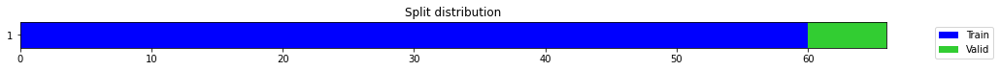

epoch,train_loss,valid_loss,mse,time
0,0.187070,0.022480,0.022480,00:00
1,0.177981,0.266658,0.266658,00:00
2,0.157024,0.652983,0.652983,00:00
3,0.141820,3.118493,3.118493,00:00
4,0.136326,0.508517,0.508517,00:00
5,0.142025,0.454432,0.454432,00:00
6,0.139666,0.019253,0.019253,00:00
7,0.141210,0.287549,0.287549,00:00
8,0.141046,0.062039,0.062039,00:00
9,0.134045,0.157849,0.157849,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3972691297531128,
  "MSE_normalize": 0.15784933676272436,
  "RMSE_normalize": 0.39730257583197764,
  "MAPE_normalize": 0.4108739486322777,
  "MAE": 25625.447945594788,
  "MSE": 656774156.0504829,
  "RMSE": 25627.605351465885,
  "MAPE": 0.21719201422608878
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:08:45.664045+07:00
PROGRESS: [ 502 / 1944 ]


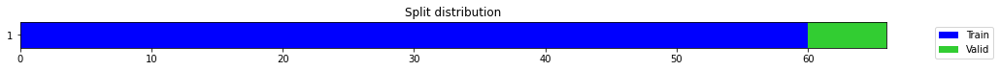

epoch,train_loss,valid_loss,mse,time
0,0.165696,0.129474,0.129474,00:00
1,0.148165,0.324199,0.324199,00:00
2,0.202641,0.001767,0.001767,00:00
3,0.198426,0.063170,0.063170,00:00
4,0.184396,0.111160,0.111160,00:00
5,0.168984,0.100833,0.100833,00:00
6,0.154556,0.195177,0.195177,00:00
7,0.148670,2.375884,2.375884,00:00
8,0.143238,0.416420,0.416420,00:00
9,0.153812,0.086704,0.086704,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.7223850091298422,
  "MSE_normalize": 0.5231611512795029,
  "RMSE_normalize": 0.7232987980630846,
  "MAPE_normalize": 0.7464843308526188,
  "MAE": 46596.72262891134,
  "MSE": 2176751139.1351905,
  "RMSE": 46655.66567026121,
  "MAPE": 0.3947582836370693
}
Percent CPU Usage: 100.0
Percent Ram Usage: 22.8
2022-10-14 21:09:05.570399+07:00
PROGRESS: [ 503 / 1944 ]


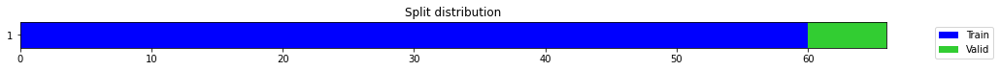

epoch,train_loss,valid_loss,mse,time
0,0.175024,0.014498,0.014498,00:00
1,0.134511,0.077783,0.077783,00:00
2,0.138336,0.060398,0.060398,00:00
3,0.131007,0.055899,0.055899,00:00
4,0.127502,0.712487,0.712487,00:00
5,0.126107,0.003202,0.003202,00:00
6,0.119093,0.027480,0.027480,00:00
7,0.120867,0.360529,0.360529,00:00
8,0.120781,0.038074,0.038074,00:00
9,0.116337,0.241149,0.241149,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3583525816599528,
  "MSE_normalize": 0.12863065992538836,
  "RMSE_normalize": 0.3586511674669251,
  "MAPE_normalize": 0.37106250215461856,
  "MAE": 23115.174927393597,
  "MSE": 535202078.4332091,
  "RMSE": 23134.43490628654,
  "MAPE": 0.1960380363204461
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.0
2022-10-14 21:09:44.187881+07:00
PROGRESS: [ 504 / 1944 ]


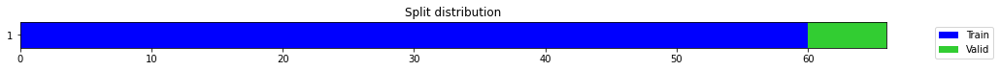

epoch,train_loss,valid_loss,mse,time
0,0.297860,0.020874,0.020874,00:00
1,0.191592,0.033828,0.033828,00:00
2,0.184544,0.031668,0.031668,00:00
3,0.165053,0.003345,0.003345,00:00
4,0.152726,0.101550,0.101550,00:00
5,0.157915,0.065030,0.065030,00:00
6,0.145059,0.020873,0.020873,00:00
7,0.142384,0.138209,0.138209,00:01
8,0.139064,0.817929,0.817929,00:00
9,0.139744,0.036675,0.036675,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.45849743982156116,
  "MSE_normalize": 0.21022911857820578,
  "RMSE_normalize": 0.4585074902094902,
  "MAPE_normalize": 0.47437910012118034,
  "MAE": 29574.91885824998,
  "MSE": 874714172.1538328,
  "RMSE": 29575.567148472957,
  "MAPE": 0.25071649691274445
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.0
2022-10-14 21:10:59.818095+07:00
PROGRESS: [ 505 / 1944 ]


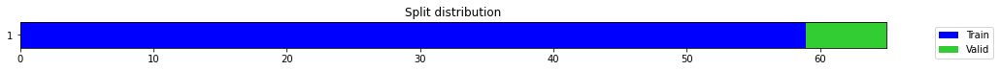

epoch,train_loss,valid_loss,mse,time
0,0.613540,0.987373,0.987373,00:00
1,0.532641,0.398011,0.398011,00:00
2,0.437460,0.093727,0.093727,00:00
3,0.350054,0.006186,0.006186,00:00
4,0.324483,0.006500,0.006500,00:00
5,0.287455,0.003729,0.003729,00:00
6,0.265697,0.011807,0.011807,00:00
7,0.247033,0.037638,0.037638,00:00
8,0.235393,0.066850,0.066850,00:00
9,0.223238,0.086794,0.086794,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2943783601125081,
  "MSE_normalize": 0.08679418177177804,
  "RMSE_normalize": 0.2946085229109607,
  "MAPE_normalize": 0.30479990636772114,
  "MAE": 18988.581740697224,
  "MSE": 361130281.90254074,
  "RMSE": 19003.428161848606,
  "MAPE": 0.16103537398355017
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.0
2022-10-14 21:11:01.491643+07:00
PROGRESS: [ 506 / 1944 ]


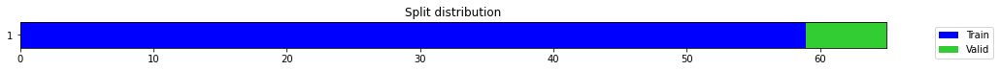

epoch,train_loss,valid_loss,mse,time
0,0.355957,0.584028,0.584028,00:00
1,0.322568,0.362208,0.362208,00:00
2,0.301454,0.108790,0.108790,00:00
3,0.258613,0.002216,0.002216,00:00
4,0.230611,0.004642,0.004642,00:00
5,0.232276,0.254326,0.254326,00:00
6,0.222029,0.148134,0.148134,00:00
7,0.203261,0.030567,0.030567,00:00
8,0.197084,0.005490,0.005490,00:00
9,0.193569,0.038650,0.038650,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3478899896144867,
  "MSE_normalize": 0.12111227011681495,
  "RMSE_normalize": 0.34801188214889295,
  "MAPE_normalize": 0.3596972187282375,
  "MAE": 22440.29589009285,
  "MSE": 503919817.62265605,
  "RMSE": 22448.15844613219,
  "MAPE": 0.19016601075592499
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:05.260218+07:00
PROGRESS: [ 507 / 1944 ]


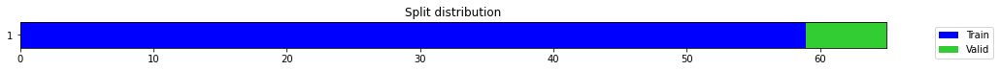

epoch,train_loss,valid_loss,mse,time
0,0.825129,2.452015,2.452015,00:00
1,0.810808,1.955698,1.955698,00:00
2,0.747030,1.386789,1.386789,00:00
3,0.647884,0.725319,0.725319,00:00
4,0.565451,0.203420,0.203420,00:00
5,0.498725,0.000961,0.000961,00:00
6,0.438346,0.050731,0.050731,00:00
7,0.395435,0.033462,0.033462,00:00
8,0.373229,0.009363,0.009363,00:00
9,0.344148,0.019432,0.019432,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.31806260347366333,
  "MSE_normalize": 0.10117477880125492,
  "RMSE_normalize": 0.31807983086208863,
  "MAPE_normalize": 0.3290863511545928,
  "MAE": 20516.31017446518,
  "MSE": 420964581.3125786,
  "RMSE": 20517.421409928163,
  "MAPE": 0.17392552235295863
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:12.829881+07:00
PROGRESS: [ 508 / 1944 ]


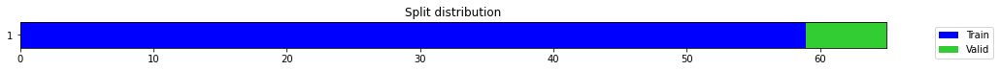

epoch,train_loss,valid_loss,mse,time
0,0.369100,1.087819,1.087819,00:00
1,0.447728,0.888950,0.888950,00:00
2,0.460030,0.636160,0.636160,00:00
3,0.418392,0.380220,0.380220,00:00
4,0.386997,0.165554,0.165554,00:00
5,0.367828,0.034429,0.034429,00:00
6,0.337654,0.000907,0.000907,00:00
7,0.308234,0.022868,0.022868,00:00
8,0.289922,0.014452,0.014452,00:00
9,0.272063,0.001946,0.001946,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.33905453483263653,
  "MSE_normalize": 0.1149844624629323,
  "RMSE_normalize": 0.33909358953382224,
  "MAPE_normalize": 0.35065667346375995,
  "MAE": 21870.373714844387,
  "MSE": 478423443.78379637,
  "RMSE": 21872.89289928967,
  "MAPE": 0.18536281054221806
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:27.115703+07:00
PROGRESS: [ 509 / 1944 ]


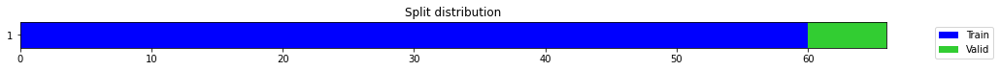

epoch,train_loss,valid_loss,mse,time
0,0.231567,0.324988,0.324988,00:00
1,0.183635,0.007295,0.007295,00:00
2,0.171151,0.010392,0.010392,00:00
3,0.150927,0.049672,0.049672,00:00
4,0.141423,0.173555,0.173555,00:00
5,0.137018,0.534614,0.534614,00:00
6,0.135533,0.413304,0.413304,00:00
7,0.133066,0.220719,0.220719,00:00
8,0.127997,0.117673,0.117673,00:00
9,0.133406,0.116278,0.116278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.34088141719500226,
  "MSE_normalize": 0.11627762368005001,
  "RMSE_normalize": 0.34099504934830066,
  "MAPE_normalize": 0.3528471487223512,
  "MAE": 21988.214934746426,
  "MSE": 483803985.02918893,
  "RMSE": 21995.544663162786,
  "MAPE": 0.1864456847860161
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:28.985308+07:00
PROGRESS: [ 510 / 1944 ]


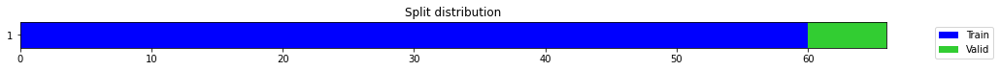

epoch,train_loss,valid_loss,mse,time
0,0.515565,0.613756,0.613756,00:00
1,0.461768,0.326844,0.326844,00:00
2,0.383766,0.008931,0.008931,00:00
3,0.317915,0.212568,0.212568,00:00
4,0.289668,0.305363,0.305363,00:00
5,0.264106,0.007402,0.007402,00:00
6,0.242327,0.059002,0.059002,00:00
7,0.228354,0.170741,0.170741,00:00
8,0.223891,0.001481,0.001481,00:00
9,0.205368,0.132915,0.132915,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1070349911848704,
  "MSE_normalize": 0.011654621953562483,
  "RMSE_normalize": 0.10795657438786432,
  "MAPE_normalize": 0.11103932682418734,
  "MAE": 6904.185071388881,
  "MSE": 48492154.95371031,
  "RMSE": 6963.6308743148,
  "MAPE": 0.05861204584513658
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:33.004483+07:00
PROGRESS: [ 511 / 1944 ]


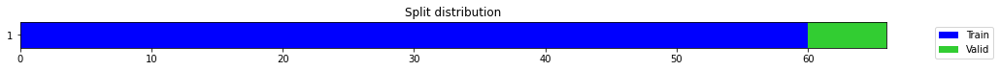

epoch,train_loss,valid_loss,mse,time
0,0.407785,0.612476,0.612476,00:00
1,0.373377,0.461398,0.461398,00:00
2,0.310915,0.216669,0.216669,00:00
3,0.263867,0.029440,0.029440,00:00
4,0.237822,0.020408,0.020408,00:00
5,0.228416,0.062389,0.062389,00:00
6,0.222014,0.002672,0.002672,00:00
7,0.206432,0.123841,0.123841,00:00
8,0.193496,0.134601,0.134601,00:00
9,0.181114,0.066958,0.066958,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18912630279858908,
  "MSE_normalize": 0.03580232807428452,
  "RMSE_normalize": 0.18921503131169182,
  "MAPE_normalize": 0.19577431715748642,
  "MAE": 12199.40303572019,
  "MSE": 148965109.94516572,
  "RMSE": 12205.126379729369,
  "MAPE": 0.10344550556345178
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.1
2022-10-14 21:11:40.593025+07:00
PROGRESS: [ 512 / 1944 ]


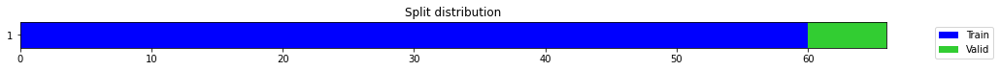

epoch,train_loss,valid_loss,mse,time
0,0.594626,1.069969,1.069969,00:00
1,0.598407,0.918437,0.918437,00:00
2,0.601369,0.776881,0.776881,00:00
3,0.599057,0.647051,0.647051,00:00
4,0.546039,0.471588,0.471588,00:00
5,0.495637,0.285396,0.285396,00:00
6,0.442608,0.135200,0.135200,00:00
7,0.396353,0.028373,0.028373,00:00
8,0.353296,0.008118,0.008118,00:00
9,0.330464,0.058792,0.058792,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24922505021095276,
  "MSE_normalize": 0.06211929561538376,
  "RMSE_normalize": 0.24923742819926498,
  "MAPE_normalize": 0.2578128775749575,
  "MAE": 16076.012638807297,
  "MSE": 258463854.13434657,
  "RMSE": 16076.811068565388,
  "MAPE": 0.13626924787869701
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.2
2022-10-14 21:11:56.044026+07:00
PROGRESS: [ 513 / 1944 ]


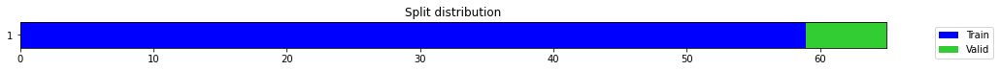

epoch,train_loss,valid_loss,mse,time
0,0.224809,0.054691,0.054691,00:00
1,0.180866,0.014040,0.014040,00:00
2,0.192322,0.228279,0.228279,00:00
3,0.196764,0.689217,0.689217,00:00
4,0.178726,0.130390,0.130390,00:00
5,0.169717,0.185497,0.185497,00:00
6,0.161596,0.322466,0.322466,00:00
7,0.149673,0.423158,0.423158,00:00
8,0.150221,0.439213,0.439213,00:00
9,0.150004,0.426302,0.426302,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6526362399260203,
  "MSE_normalize": 0.42630200743393676,
  "RMSE_normalize": 0.6529180709966119,
  "MAPE_normalize": 0.6747294156292725,
  "MAE": 42097.64802018801,
  "MSE": 1773742905.0837033,
  "RMSE": 42115.82725156545,
  "MAPE": 0.35673261290396985
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.2
2022-10-14 21:11:58.155953+07:00
PROGRESS: [ 514 / 1944 ]


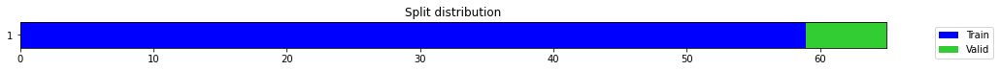

epoch,train_loss,valid_loss,mse,time
0,0.622810,0.903427,0.903427,00:00
1,0.505902,0.514431,0.514431,00:00
2,0.405407,0.087658,0.087658,00:00
3,0.332306,0.011209,0.011209,00:00
4,0.287221,0.005728,0.005728,00:00
5,0.262268,0.156394,0.156394,00:00
6,0.243962,0.360898,0.360898,00:00
7,0.230665,0.234174,0.234174,00:00
8,0.220972,0.572123,0.572123,00:00
9,0.207900,0.568267,0.568267,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4329877396424611,
  "MSE_normalize": 0.18760499133099215,
  "RMSE_normalize": 0.4331339184720958,
  "MAPE_normalize": 0.44768369719850293,
  "MAE": 27929.441157897312,
  "MSE": 780580472.3619666,
  "RMSE": 27938.870277124068,
  "MAPE": 0.23668289440949442
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.2
2022-10-14 21:12:02.225034+07:00
PROGRESS: [ 515 / 1944 ]


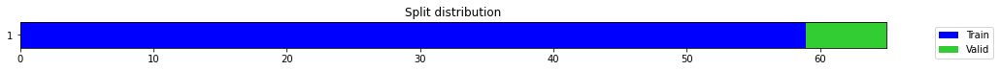

epoch,train_loss,valid_loss,mse,time
0,0.625115,2.270875,2.270875,00:00
1,0.607748,1.512885,1.512885,00:00
2,0.533773,0.793689,0.793689,00:00
3,0.492979,0.239568,0.239568,00:00
4,0.430136,0.004931,0.004931,00:00
5,0.383776,0.059464,0.059464,00:00
6,0.359697,0.051344,0.051344,00:00
7,0.333206,0.072878,0.072878,00:00
8,0.307756,0.424379,0.424379,00:00
9,0.300881,0.454194,0.454194,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2659092942873637,
  "MSE_normalize": 0.07071514760918636,
  "RMSE_normalize": 0.26592319870441233,
  "MAPE_normalize": 0.2750742267887682,
  "MAE": 17152.21311871211,
  "MSE": 294229182.9887262,
  "RMSE": 17153.11000922941,
  "MAPE": 0.14539230686045615
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.2
2022-10-14 21:12:10.074243+07:00
PROGRESS: [ 516 / 1944 ]


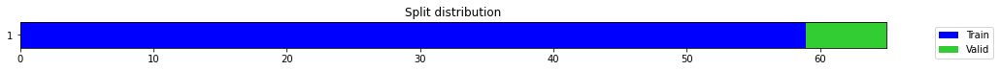

epoch,train_loss,valid_loss,mse,time
0,0.689605,1.120489,1.120489,00:00
1,0.611013,0.964318,0.964318,00:00
2,0.618885,0.782638,0.782638,00:00
3,0.565029,0.522917,0.522917,00:00
4,0.524106,0.278122,0.278122,00:00
5,0.493946,0.106475,0.106475,00:00
6,0.446011,0.013120,0.013120,00:00
7,0.408646,0.000507,0.000507,00:00
8,0.378246,0.008395,0.008395,00:00
9,0.355726,0.017498,0.017498,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2891640861829122,
  "MSE_normalize": 0.08369488897386645,
  "RMSE_normalize": 0.2893006895495869,
  "MAPE_normalize": 0.2989463651268775,
  "MAE": 18652.240215142567,
  "MSE": 348234849.7553566,
  "RMSE": 18661.05167870655,
  "MAPE": 0.15805596732360658
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.3
2022-10-14 21:12:25.528833+07:00
PROGRESS: [ 517 / 1944 ]


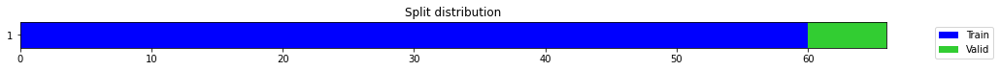

epoch,train_loss,valid_loss,mse,time
0,0.570587,0.617622,0.617622,00:00
1,0.466801,0.100415,0.100415,00:00
2,0.349640,0.017473,0.017473,00:00
3,0.328855,0.084238,0.084238,00:00
4,0.289273,0.025212,0.025212,00:00
5,0.253624,0.093197,0.093197,00:00
6,0.233760,0.041919,0.041919,00:00
7,0.219048,0.025262,0.025262,00:00
8,0.202613,0.038088,0.038088,00:00
9,0.193346,0.048364,0.048364,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2198391854763031,
  "MSE_normalize": 0.04836424975043663,
  "RMSE_normalize": 0.21991873442350615,
  "MAPE_normalize": 0.22755194293384653,
  "MAE": 14180.506819963455,
  "MSE": 201232326.7509532,
  "RMSE": 14185.63804525384,
  "MAPE": 0.12024040429539674
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.3
2022-10-14 21:12:27.410823+07:00
PROGRESS: [ 518 / 1944 ]


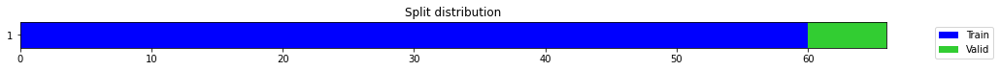

epoch,train_loss,valid_loss,mse,time
0,0.242508,1.093950,1.093950,00:00
1,0.256597,0.570941,0.570941,00:00
2,0.246633,0.076597,0.076597,00:00
3,0.226335,0.047756,0.047756,00:00
4,0.223958,0.000932,0.000932,00:00
5,0.208167,0.078384,0.078384,00:00
6,0.205572,0.028891,0.028891,00:00
7,0.198762,0.017549,0.017549,00:00
8,0.185568,0.033556,0.033556,00:00
9,0.178067,0.005572,0.005572,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.33868129054705304,
  "MSE_normalize": 0.11473960018632272,
  "RMSE_normalize": 0.3387323429882696,
  "MAPE_normalize": 0.3505118373025205,
  "MAE": 21846.29796544711,
  "MSE": 477404629.14467883,
  "RMSE": 21849.591052115342,
  "MAPE": 0.185226101202261
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.3
2022-10-14 21:12:31.670450+07:00
PROGRESS: [ 519 / 1944 ]


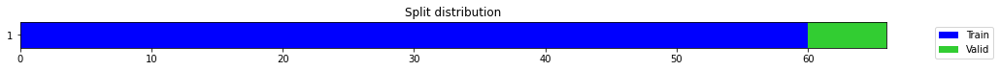

epoch,train_loss,valid_loss,mse,time
0,0.212792,0.166784,0.166784,00:00
1,0.223008,0.098187,0.098187,00:00
2,0.209889,0.022596,0.022596,00:00
3,0.189905,0.006513,0.006513,00:00
4,0.171816,0.064645,0.064645,00:00
5,0.174846,0.097231,0.097231,00:00
6,0.171018,0.000426,0.000426,00:00
7,0.164759,0.034359,0.034359,00:00
8,0.159374,0.000360,0.000360,00:00
9,0.154308,0.003191,0.003191,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.287928839524587,
  "MSE_normalize": 0.08291206698796334,
  "RMSE_normalize": 0.28794455540600755,
  "MAPE_normalize": 0.2978681953899849,
  "MAE": 18572.56186469396,
  "MSE": 344977710.6398334,
  "RMSE": 18573.57560190911,
  "MAPE": 0.15743637275355568
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.3
2022-10-14 21:12:40.238181+07:00
PROGRESS: [ 520 / 1944 ]


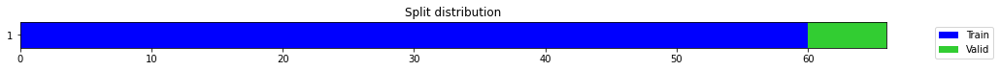

epoch,train_loss,valid_loss,mse,time
0,0.419777,0.657748,0.657748,00:00
1,0.359289,0.475119,0.475119,00:00
2,0.327260,0.275149,0.275149,00:00
3,0.280599,0.095718,0.095718,00:00
4,0.267230,0.006322,0.006322,00:00
5,0.243833,0.042407,0.042407,00:00
6,0.225375,0.178941,0.178941,00:00
7,0.217649,0.321243,0.321243,00:00
8,0.207923,0.347949,0.347949,00:00
9,0.198154,0.179278,0.179278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2460649609565735,
  "MSE_normalize": 0.060613586856489356,
  "RMSE_normalize": 0.2461982673710141,
  "MAPE_normalize": 0.25437778427999475,
  "MAE": 15872.174241542816,
  "MSE": 252198952.30034518,
  "RMSE": 15880.773038499894,
  "MAPE": 0.134494953124069
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.3
2022-10-14 21:12:57.046361+07:00
PROGRESS: [ 521 / 1944 ]


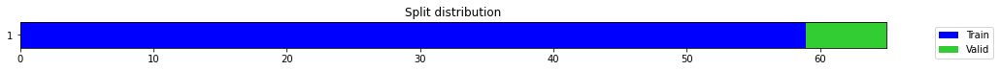

epoch,train_loss,valid_loss,mse,time
0,0.479773,0.323563,0.323563,00:00
1,0.419522,0.038730,0.038730,00:00
2,0.332228,0.002637,0.002637,00:00
3,0.267043,0.001149,0.001149,00:00
4,0.252782,0.018215,0.018215,00:00
5,0.230571,0.015772,0.015772,00:00
6,0.217065,0.000471,0.000471,00:00
7,0.200981,0.038593,0.038593,00:00
8,0.188307,0.060956,0.060956,00:00
9,0.180067,0.074242,0.074242,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2723914682865143,
  "MSE_normalize": 0.07424221052347886,
  "RMSE_normalize": 0.2724742382748851,
  "MAPE_normalize": 0.2816605758404109,
  "MAE": 17570.339270353317,
  "MSE": 308904466.49880844,
  "RMSE": 17575.67826568319,
  "MAPE": 0.14890316025508302
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.5
2022-10-14 21:12:59.245106+07:00
PROGRESS: [ 522 / 1944 ]


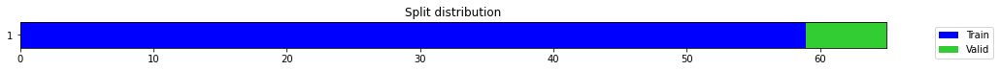

epoch,train_loss,valid_loss,mse,time
0,0.247404,0.002729,0.002729,00:00
1,0.254049,0.049985,0.049985,00:00
2,0.226644,0.280870,0.280870,00:00
3,0.226908,0.186538,0.186538,00:00
4,0.221252,0.003335,0.003335,00:00
5,0.212477,0.299999,0.299999,00:00
6,0.200537,0.562817,0.562817,00:00
7,0.185518,0.185571,0.185571,00:00
8,0.177269,0.199822,0.199822,00:00
9,0.163366,0.646135,0.646135,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.21262991428375244,
  "MSE_normalize": 0.04533285791915039,
  "RMSE_normalize": 0.21291514253136246,
  "MAPE_normalize": 0.21971984937708391,
  "MAE": 13715.479990959167,
  "MSE": 188619414.6381574,
  "RMSE": 13733.878353843003,
  "MAPE": 0.11619394824501945
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.5
2022-10-14 21:13:04.311440+07:00
PROGRESS: [ 523 / 1944 ]


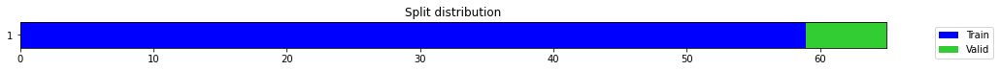

epoch,train_loss,valid_loss,mse,time
0,0.503906,0.677699,0.677699,00:00
1,0.506833,0.459277,0.459277,00:00
2,0.475299,0.181540,0.181540,00:00
3,0.425273,0.003181,0.003181,00:00
4,0.378054,0.097550,0.097550,00:00
5,0.350285,0.129891,0.129891,00:00
6,0.325380,0.005382,0.005382,00:00
7,0.287923,0.155504,0.155504,00:00
8,0.268818,0.160751,0.160751,00:00
9,0.252401,0.120985,0.120985,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3455769419670105,
  "MSE_normalize": 0.11953320301411334,
  "RMSE_normalize": 0.3457357415919178,
  "MAPE_normalize": 0.3572688499805167,
  "MAE": 22291.095064640045,
  "MSE": 497349688.88475156,
  "RMSE": 22301.338275645063,
  "MAPE": 0.18889139302825544
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.6
2022-10-14 21:13:14.151756+07:00
PROGRESS: [ 524 / 1944 ]


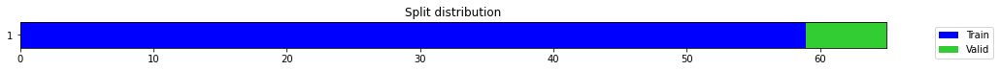

epoch,train_loss,valid_loss,mse,time
0,0.143345,0.549573,0.549573,00:00
1,0.158533,0.428282,0.428282,00:00
2,0.169980,0.342317,0.342317,00:00
3,0.157659,0.237246,0.237246,00:00
4,0.154401,0.156386,0.156386,00:00
5,0.151799,0.145550,0.145550,00:00
6,0.156560,0.226831,0.226831,00:00
7,0.148012,0.287552,0.287552,00:00
8,0.141629,0.425053,0.425053,00:00
9,0.134930,0.575000,0.575000,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26755398511886597,
  "MSE_normalize": 0.07159281278316716,
  "RMSE_normalize": 0.267568332922951,
  "MAPE_normalize": 0.2767674673120706,
  "MAE": 17258.30225610733,
  "MSE": 297880942.4180523,
  "RMSE": 17259.227746862034,
  "MAPE": 0.1462893127373066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.6
2022-10-14 21:13:33.111834+07:00
PROGRESS: [ 525 / 1944 ]


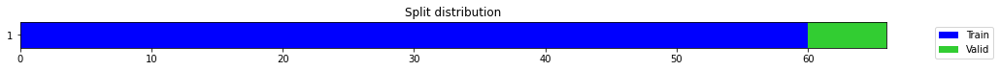

epoch,train_loss,valid_loss,mse,time
0,0.165198,0.243702,0.243702,00:00
1,0.173477,0.019201,0.019201,00:00
2,0.170195,0.281829,0.281829,00:00
3,0.171735,0.349040,0.349040,00:00
4,0.159711,0.071723,0.071723,00:00
5,0.146746,0.072432,0.072432,00:00
6,0.136496,0.162405,0.162405,00:00
7,0.136142,0.083702,0.083702,00:00
8,0.128297,0.052524,0.052524,00:00
9,0.123714,0.047540,0.047540,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.217916210492452,
  "MSE_normalize": 0.047539548988621526,
  "RMSE_normalize": 0.21803565990136,
  "MAPE_normalize": 0.22558244715049128,
  "MAE": 14056.467241605123,
  "MSE": 197800939.8478236,
  "RMSE": 14064.172206277324,
  "MAPE": 0.11919433431353436
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.6
2022-10-14 21:13:35.445955+07:00
PROGRESS: [ 526 / 1944 ]


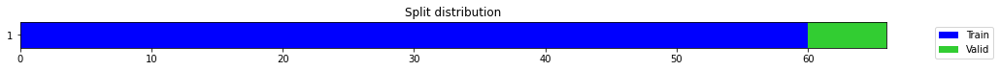

epoch,train_loss,valid_loss,mse,time
0,0.465967,1.075655,1.075655,00:00
1,0.349625,0.377218,0.377218,00:00
2,0.274162,0.000555,0.000555,00:00
3,0.238087,0.192892,0.192892,00:00
4,0.236299,0.028435,0.028435,00:00
5,0.223804,0.047343,0.047343,00:00
6,0.205333,0.188056,0.188056,00:00
7,0.204084,0.001811,0.001811,00:00
8,0.185512,0.153074,0.153074,00:00
9,0.183936,0.287135,0.287135,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1958493192990621,
  "MSE_normalize": 0.038365488386961744,
  "RMSE_normalize": 0.1958711014595102,
  "MAPE_normalize": 0.20255648704642082,
  "MAE": 12633.064492066702,
  "MSE": 159629820.2677131,
  "RMSE": 12634.469528544247,
  "MAPE": 0.10707330237669033
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.6
2022-10-14 21:13:41.064769+07:00
PROGRESS: [ 527 / 1944 ]


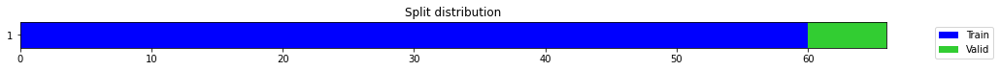

epoch,train_loss,valid_loss,mse,time
0,0.448339,0.697795,0.697795,00:00
1,0.402820,0.379208,0.379208,00:00
2,0.346356,0.082443,0.082443,00:00
3,0.306749,0.012274,0.012274,00:00
4,0.273083,0.137126,0.137126,00:00
5,0.255934,0.027072,0.027072,00:00
6,0.232672,0.067476,0.067476,00:00
7,0.227179,0.143453,0.143453,00:00
8,0.215297,0.072030,0.072030,00:00
9,0.196593,0.059108,0.059108,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3234734336535136,
  "MSE_normalize": 0.10488722562070052,
  "RMSE_normalize": 0.3238629735253793,
  "MAPE_normalize": 0.3342763698353826,
  "MAE": 20865.330364386242,
  "MSE": 436411203.87513524,
  "RMSE": 20890.457244281064,
  "MAPE": 0.17677022577516024
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.6
2022-10-14 21:13:51.403691+07:00
PROGRESS: [ 528 / 1944 ]


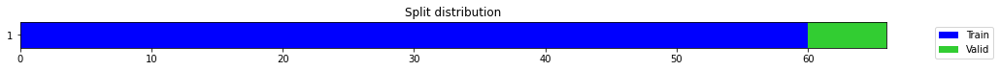

epoch,train_loss,valid_loss,mse,time
0,0.773590,0.657110,0.657110,00:00
1,0.747376,0.619226,0.619226,00:00
2,0.657113,0.516080,0.516080,00:00
3,0.608518,0.420149,0.420149,00:00
4,0.552501,0.261262,0.261262,00:00
5,0.510608,0.110968,0.110968,00:00
6,0.456342,0.016406,0.016406,00:00
7,0.412159,0.015381,0.015381,00:00
8,0.385114,0.085160,0.085160,00:00
9,0.364330,0.094708,0.094708,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.32509172956148785,
  "MSE_normalize": 0.10578182378518204,
  "RMSE_normalize": 0.3252411778744845,
  "MAPE_normalize": 0.33609062904946657,
  "MAE": 20969.716923634212,
  "MSE": 440133417.5158859,
  "RMSE": 20979.356937615747,
  "MAPE": 0.1776942486116523
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:12.342069+07:00
PROGRESS: [ 529 / 1944 ]


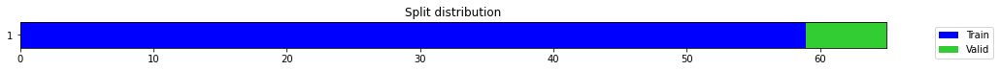

epoch,train_loss,valid_loss,mse,time
0,0.452426,1.086121,1.086121,00:00
1,0.362738,0.004796,0.004796,00:00
2,0.283584,0.072422,0.072422,00:00
3,0.263053,0.016052,0.016052,00:00
4,0.239164,0.044159,0.044159,00:00
5,0.223493,0.445878,0.445878,00:00
6,0.204362,0.819570,0.819570,00:00
7,0.189448,0.639515,0.639515,00:00
8,0.177793,0.529318,0.529318,00:00
9,0.167258,0.521821,0.521821,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.722180483241876,
  "MSE_normalize": 0.5218214113483715,
  "RMSE_normalize": 0.7223720726525711,
  "MAPE_normalize": 0.746735046880077,
  "MAE": 46583.52989103397,
  "MSE": 2171176794.759461,
  "RMSE": 46595.88817438145,
  "MAPE": 0.39477553002503946
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:14.672222+07:00
PROGRESS: [ 530 / 1944 ]


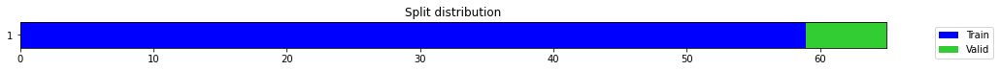

epoch,train_loss,valid_loss,mse,time
0,0.370508,0.625560,0.625560,00:00
1,0.288479,0.180781,0.180781,00:00
2,0.244367,0.009572,0.009572,00:00
3,0.228337,0.260744,0.260744,00:00
4,0.239104,0.272743,0.272743,00:00
5,0.220675,1.159413,1.159413,00:00
6,0.208244,1.405050,1.405050,00:00
7,0.200579,0.414615,0.414615,00:00
8,0.185376,0.172135,0.172135,00:00
9,0.178012,0.439106,0.439106,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.22262040774027506,
  "MSE_normalize": 0.04957514390100807,
  "RMSE_normalize": 0.22265476393063785,
  "MAPE_normalize": 0.23036857868275798,
  "MAE": 14359.906780878702,
  "MSE": 206270573.98162404,
  "RMSE": 14362.122892581863,
  "MAPE": 0.12174413938100516
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:19.737034+07:00
PROGRESS: [ 531 / 1944 ]


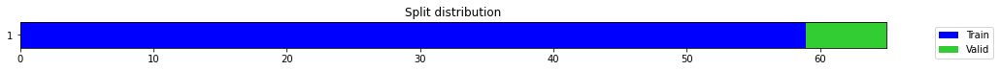

epoch,train_loss,valid_loss,mse,time
0,0.482616,1.170163,1.170163,00:00
1,0.525440,0.610704,0.610704,00:00
2,0.440379,0.135685,0.135685,00:00
3,0.370175,0.001770,0.001770,00:00
4,0.347440,0.008753,0.008753,00:00
5,0.319658,0.004102,0.004102,00:00
6,0.303778,0.072392,0.072392,00:00
7,0.304252,0.331182,0.331182,00:00
8,0.282568,0.018787,0.018787,00:00
9,0.274433,0.128755,0.128755,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.35757603247960407,
  "MSE_normalize": 0.12801193320382373,
  "RMSE_normalize": 0.35778755317062627,
  "MAPE_normalize": 0.36964031086032795,
  "MAE": 23065.08439906438,
  "MSE": 532627701.3169317,
  "RMSE": 23078.728329718077,
  "MAPE": 0.1954406334333618
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:29.830482+07:00
PROGRESS: [ 532 / 1944 ]


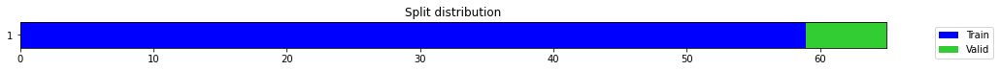

epoch,train_loss,valid_loss,mse,time
0,0.491458,2.090926,2.090926,00:00
1,0.553074,1.488531,1.488531,00:00
2,0.563868,0.984184,0.984184,00:00
3,0.497854,0.576006,0.576006,00:00
4,0.449562,0.235732,0.235732,00:00
5,0.414919,0.070421,0.070421,00:00
6,0.377069,0.043438,0.043438,00:00
7,0.345856,0.066670,0.066670,00:00
8,0.321411,0.169437,0.169437,00:00
9,0.305514,0.358365,0.358365,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3544853130976359,
  "MSE_normalize": 0.1256863479294464,
  "RMSE_normalize": 0.3545227043920409,
  "MAPE_normalize": 0.36662055839911506,
  "MAE": 22865.720636049908,
  "MSE": 522951485.13999254,
  "RMSE": 22868.132524104203,
  "MAPE": 0.19380031329215286
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:49.749853+07:00
PROGRESS: [ 533 / 1944 ]


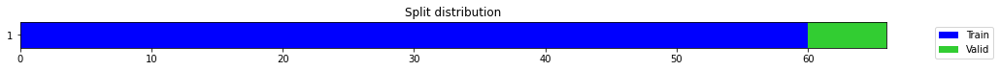

epoch,train_loss,valid_loss,mse,time
0,0.358280,0.022098,0.022098,00:00
1,0.277406,0.719127,0.719127,00:00
2,0.249458,0.166210,0.166210,00:00
3,0.220246,0.775420,0.775420,00:00
4,0.219295,0.945571,0.945571,00:00
5,0.217045,0.089791,0.089791,00:00
6,0.199618,0.310685,0.310685,00:00
7,0.193804,0.290019,0.290019,00:00
8,0.191313,0.120014,0.120014,00:00
9,0.181524,0.055535,0.055535,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2319097320238749,
  "MSE_normalize": 0.055535486914390475,
  "RMSE_normalize": 0.23565968453341882,
  "MAPE_normalize": 0.23895130719669935,
  "MAE": 14959.105354468027,
  "MSE": 231070166.63540855,
  "RMSE": 15200.992291143646,
  "MAPE": 0.12653646828535045
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:52.221436+07:00
PROGRESS: [ 534 / 1944 ]


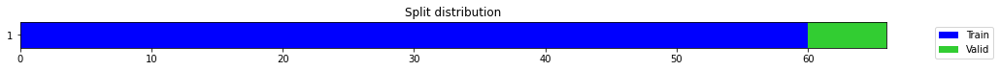

epoch,train_loss,valid_loss,mse,time
0,0.360777,0.178656,0.178656,00:00
1,0.270427,0.018622,0.018622,00:00
2,0.220167,0.002044,0.002044,00:00
3,0.216059,0.000989,0.000989,00:00
4,0.198825,0.351984,0.351984,00:00
5,0.185708,0.485251,0.485251,00:00
6,0.170424,0.086650,0.086650,00:00
7,0.170981,0.048939,0.048939,00:00
8,0.164306,0.125024,0.125024,00:00
9,0.161450,0.741240,0.741240,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.015840838352839153,
  "MSE_normalize": 0.00037138479432681965,
  "RMSE_normalize": 0.019271346458585078,
  "MAPE_normalize": 0.016553106168733317,
  "MAE": 1021.7974371115366,
  "MSE": 1545245.2310941808,
  "RMSE": 1243.078931964572,
  "MAPE": 0.008707318575636933
}
Percent CPU Usage: 100.0
Percent Ram Usage: 23.9
2022-10-14 21:14:57.993894+07:00
PROGRESS: [ 535 / 1944 ]


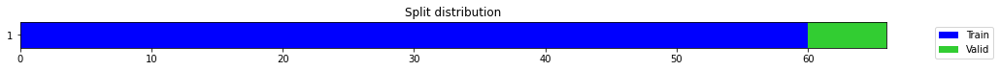

epoch,train_loss,valid_loss,mse,time
0,0.143657,0.000484,0.000484,00:00
1,0.164103,0.015517,0.015517,00:00
2,0.150125,0.106236,0.106236,00:00
3,0.148294,0.151010,0.151010,00:00
4,0.150657,0.022040,0.022040,00:00
5,0.165795,0.151087,0.151087,00:00
6,0.150789,0.301603,0.301603,00:00
7,0.141119,0.405384,0.405384,00:00
8,0.136808,0.288156,0.288156,00:00
9,0.135101,0.027134,0.027134,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5645097345113754,
  "MSE_normalize": 0.31882208655208055,
  "RMSE_normalize": 0.5646433268463203,
  "MAPE_normalize": 0.5837208242777708,
  "MAE": 36413.13591492176,
  "MSE": 1326544102.8761075,
  "RMSE": 36421.75315489505,
  "MAPE": 0.3085906767267603
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.0
2022-10-14 21:15:09.574003+07:00
PROGRESS: [ 536 / 1944 ]


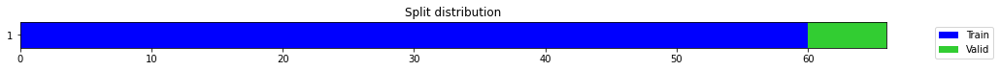

epoch,train_loss,valid_loss,mse,time
0,0.411479,0.670609,0.670609,00:00
1,0.333929,0.463881,0.463881,00:00
2,0.283985,0.247267,0.247267,00:00
3,0.253921,0.065867,0.065867,00:00
4,0.220611,0.007530,0.007530,00:00
5,0.200286,0.003961,0.003961,00:00
6,0.194199,0.067617,0.067617,00:00
7,0.197591,0.097320,0.097320,00:00
8,0.195780,0.057630,0.057630,00:00
9,0.184400,0.012702,0.012702,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24766535560290018,
  "MSE_normalize": 0.06150136580477709,
  "RMSE_normalize": 0.24799468906566746,
  "MAPE_normalize": 0.25651023452053096,
  "MAE": 15975.406097809473,
  "MSE": 255892792.77810097,
  "RMSE": 15996.649423491814,
  "MAPE": 0.13550325187275633
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:15:32.181227+07:00
PROGRESS: [ 537 / 1944 ]


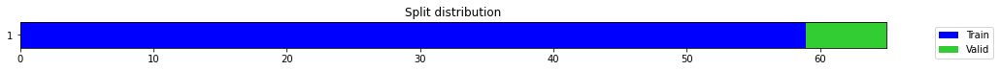

epoch,train_loss,valid_loss,mse,time
0,0.116199,0.021138,0.021138,00:00
1,0.125187,0.007674,0.007674,00:00
2,0.129062,0.140646,0.140646,00:00
3,0.119917,0.502905,0.502905,00:00
4,0.123261,0.093007,0.093007,00:00
5,0.118283,0.055359,0.055359,00:00
6,0.114875,0.153400,0.153400,00:00
7,0.120048,0.169310,0.169310,00:00
8,0.124991,0.154598,0.154598,00:00
9,0.121106,0.182959,0.182959,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.42755623658498126,
  "MSE_normalize": 0.18295894482359878,
  "RMSE_normalize": 0.42773700427201616,
  "MAPE_normalize": 0.4420371198981404,
  "MAE": 27579.08748467763,
  "MSE": 761249359.945249,
  "RMSE": 27590.747723562134,
  "MAPE": 0.2337052457452501
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:15:34.681746+07:00
PROGRESS: [ 538 / 1944 ]


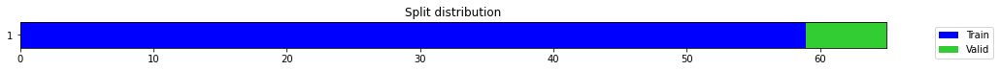

epoch,train_loss,valid_loss,mse,time
0,0.472254,1.675551,1.675551,00:00
1,0.417822,0.325115,0.325115,00:00
2,0.355365,0.041582,0.041582,00:00
3,0.294591,0.013753,0.013753,00:00
4,0.282361,0.412290,0.412290,00:00
5,0.276865,0.002915,0.002915,00:00
6,0.251326,0.013278,0.013278,00:00
7,0.232092,0.396560,0.396560,00:00
8,0.222299,0.116629,0.116629,00:00
9,0.218271,0.326987,0.326987,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.01575476924578349,
  "MSE_normalize": 0.00030239867022470907,
  "RMSE_normalize": 0.01738961386071321,
  "MAPE_normalize": 0.016412902554774966,
  "MAE": 1016.2456354300181,
  "MSE": 1258210.1103545607,
  "RMSE": 1121.699652471445,
  "MAPE": 0.008646191423050694
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:15:40.522976+07:00
PROGRESS: [ 539 / 1944 ]


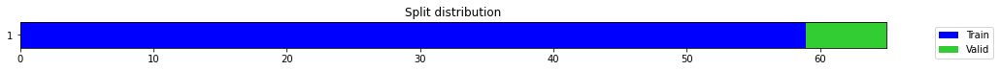

epoch,train_loss,valid_loss,mse,time
0,0.292168,0.760922,0.760922,00:00
1,0.301323,0.550585,0.550585,00:00
2,0.270337,0.149037,0.149037,00:00
3,0.244944,0.002106,0.002106,00:00
4,0.243376,0.001224,0.001224,00:00
5,0.238210,0.323753,0.323753,00:00
6,0.233840,0.466859,0.466859,00:00
7,0.225277,0.213733,0.213733,00:00
8,0.204893,0.380536,0.380536,00:00
9,0.209530,1.612953,1.612953,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3166240453720093,
  "MSE_normalize": 0.10035013709521579,
  "RMSE_normalize": 0.3167808976172897,
  "MAPE_normalize": 0.32733002615031515,
  "MAE": 20423.517422676086,
  "MSE": 417533440.12671477,
  "RMSE": 20433.635019905654,
  "MAPE": 0.17306402809820698
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:15:51.815477+07:00
PROGRESS: [ 540 / 1944 ]


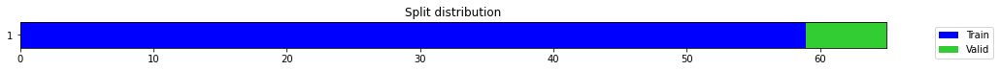

epoch,train_loss,valid_loss,mse,time
0,0.632505,1.593971,1.593971,00:00
1,0.510006,1.034466,1.034466,00:00
2,0.444862,0.617985,0.617985,00:00
3,0.412657,0.285771,0.285771,00:00
4,0.397870,0.059354,0.059354,00:00
5,0.366131,0.001344,0.001344,00:00
6,0.330997,0.010437,0.010437,00:00
7,0.304261,0.032507,0.032507,00:00
8,0.294662,0.283612,0.283612,00:00
9,0.276320,0.251973,0.251973,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4092114170392354,
  "MSE_normalize": 0.16746963771814904,
  "RMSE_normalize": 0.4092305434814819,
  "MAPE_normalize": 0.42327058507256643,
  "MAE": 26395.77324469884,
  "MSE": 696801977.3295063,
  "RMSE": 26397.006976729506,
  "MAPE": 0.22373364043037844
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:16:14.536603+07:00
PROGRESS: [ 541 / 1944 ]


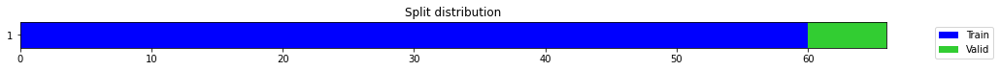

epoch,train_loss,valid_loss,mse,time
0,0.354444,0.170318,0.170318,00:00
1,0.283953,0.302269,0.302269,00:00
2,0.286520,0.079319,0.079319,00:00
3,0.252049,0.302023,0.302023,00:00
4,0.232615,0.917867,0.917867,00:00
5,0.217868,0.002217,0.002217,00:00
6,0.202286,0.773601,0.773601,00:00
7,0.194173,0.547315,0.547315,00:00
8,0.185411,0.224007,0.224007,00:00
9,0.176004,0.124091,0.124091,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3505162000656128,
  "MSE_normalize": 0.12409095032770878,
  "RMSE_normalize": 0.35226545434900197,
  "MAPE_normalize": 0.3618085316831152,
  "MAE": 22609.696969032288,
  "MSE": 516313409.0166747,
  "RMSE": 22722.53086732802,
  "MAPE": 0.19143281230080178
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:16:17.481706+07:00
PROGRESS: [ 542 / 1944 ]


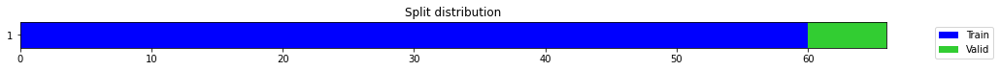

epoch,train_loss,valid_loss,mse,time
0,0.287132,0.326275,0.326275,00:00
1,0.276069,0.005196,0.005196,00:00
2,0.229002,0.032425,0.032425,00:00
3,0.221879,0.000584,0.000584,00:00
4,0.208059,0.001229,0.001229,00:00
5,0.193337,0.265038,0.265038,00:00
6,0.181814,0.382125,0.382125,00:00
7,0.169465,0.021612,0.021612,00:00
8,0.163658,0.922373,0.922373,00:00
9,0.167904,0.130690,0.130690,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22353621323903403,
  "MSE_normalize": 0.05000033455996326,
  "RMSE_normalize": 0.22360754584754794,
  "MAPE_normalize": 0.2313643727932261,
  "MAE": 14418.97989877065,
  "MSE": 208039692.82572544,
  "RMSE": 14423.581137350233,
  "MAPE": 0.12225842618480261
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.3
2022-10-14 21:16:24.430621+07:00
PROGRESS: [ 543 / 1944 ]


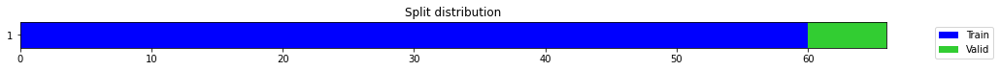

epoch,train_loss,valid_loss,mse,time
0,0.235482,0.341116,0.341116,00:00
1,0.253278,0.123887,0.123887,00:00
2,0.197851,0.000839,0.000839,00:00
3,0.208643,0.063180,0.063180,00:00
4,0.191881,0.007714,0.007714,00:00
5,0.182680,0.044291,0.044291,00:00
6,0.179053,0.041315,0.041315,00:00
7,0.173056,0.150597,0.150597,00:00
8,0.161680,0.178058,0.178058,00:00
9,0.157395,0.117239,0.117239,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4026338557402293,
  "MSE_normalize": 0.16211782518212856,
  "RMSE_normalize": 0.4026385788546951,
  "MAPE_normalize": 0.41654924405778154,
  "MAE": 25971.49423066775,
  "MSE": 674534337.6056294,
  "RMSE": 25971.798890443253,
  "MAPE": 0.22016035150784083
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.3
2022-10-14 21:16:37.794636+07:00
PROGRESS: [ 544 / 1944 ]


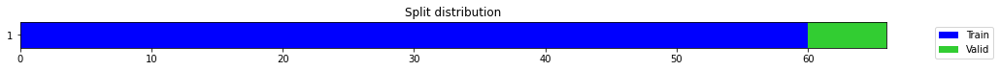

epoch,train_loss,valid_loss,mse,time
0,0.536176,0.071746,0.071746,00:00
1,0.448374,0.034013,0.034013,00:00
2,0.431583,0.013705,0.013705,00:00
3,0.370037,0.001855,0.001855,00:00
4,0.320672,0.015894,0.015894,00:00
5,0.283672,0.107621,0.107621,00:00
6,0.271514,0.212292,0.212292,00:00
7,0.260474,0.203597,0.203597,00:00
8,0.254151,0.021624,0.021624,00:00
9,0.240562,0.049055,0.049055,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4799235910177231,
  "MSE_normalize": 0.23033322755351504,
  "RMSE_normalize": 0.47993044032809073,
  "MAPE_normalize": 0.4964620768465173,
  "MAE": 30956.99131500721,
  "MSE": 958362665.5602602,
  "RMSE": 30957.43312292316,
  "MAPE": 0.26240901616191387
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:17:03.980384+07:00
PROGRESS: [ 545 / 1944 ]


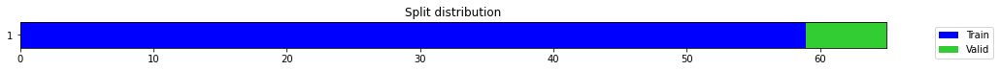

epoch,train_loss,valid_loss,mse,time
0,0.544672,0.541024,0.541024,00:00
1,0.386274,0.002908,0.002908,00:00
2,0.313239,0.476790,0.476790,00:00
3,0.264643,0.187876,0.187876,00:00
4,0.246925,0.037102,0.037102,00:00
5,0.223331,0.945820,0.945820,00:00
6,0.212186,0.311840,0.311840,00:00
7,0.199567,0.046939,0.046939,00:00
8,0.188811,0.030483,0.030483,00:00
9,0.179845,0.044059,0.044059,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.20985927184422812,
  "MSE_normalize": 0.04405935842080192,
  "RMSE_normalize": 0.20990321203069268,
  "MAPE_normalize": 0.21709469945425705,
  "MAE": 13536.76247104009,
  "MSE": 183320681.2040361,
  "RMSE": 13539.596788827801,
  "MAPE": 0.11474623493415192
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.2
2022-10-14 21:17:06.939706+07:00
PROGRESS: [ 546 / 1944 ]


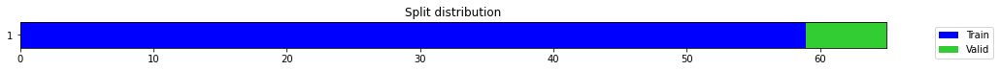

epoch,train_loss,valid_loss,mse,time
0,0.363038,0.085286,0.085286,00:00
1,0.343234,0.028718,0.028718,00:00
2,0.280340,0.368127,0.368127,00:00
3,0.250166,0.217115,0.217115,00:00
4,0.256433,0.002927,0.002927,00:00
5,0.230292,0.444537,0.444537,00:00
6,0.214950,0.995063,0.995063,00:00
7,0.205895,0.003344,0.003344,00:00
8,0.198155,0.143886,0.143886,00:00
9,0.194183,1.150569,1.150569,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26647838950157166,
  "MSE_normalize": 0.0711152374589279,
  "RMSE_normalize": 0.26667440345658955,
  "MAPE_normalize": 0.2754466985505988,
  "MAE": 17188.922036409378,
  "MSE": 295893863.23887736,
  "RMSE": 17201.565720563853,
  "MAPE": 0.1456430812501397
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.3
2022-10-14 21:17:14.030060+07:00
PROGRESS: [ 547 / 1944 ]


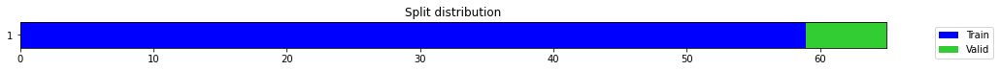

epoch,train_loss,valid_loss,mse,time
0,0.346320,0.134042,0.134042,00:00
1,0.381924,0.082281,0.082281,00:00
2,0.341293,0.086310,0.086310,00:00
3,0.313645,0.220290,0.220290,00:00
4,0.262323,0.137458,0.137458,00:00
5,0.238988,0.042218,0.042218,00:00
6,0.223547,0.313447,0.313447,00:00
7,0.217110,0.164950,0.164950,00:00
8,0.206915,1.581309,1.581309,00:00
9,0.204815,0.206430,0.206430,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2921814024448395,
  "MSE_normalize": 0.08538275034733485,
  "RMSE_normalize": 0.29220326888543674,
  "MAPE_normalize": 0.3022051067852279,
  "MAE": 18846.869183301926,
  "MSE": 355257645.99780303,
  "RMSE": 18848.279656186212,
  "MAPE": 0.1597441770021188
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.3
2022-10-14 21:17:27.498451+07:00
PROGRESS: [ 548 / 1944 ]


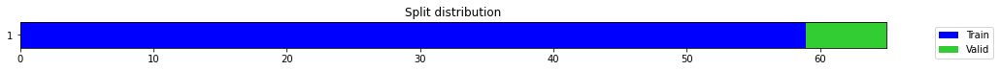

epoch,train_loss,valid_loss,mse,time
0,0.364174,0.603893,0.603893,00:00
1,0.334930,0.264713,0.264713,00:00
2,0.323787,0.039531,0.039531,00:00
3,0.304930,0.006238,0.006238,00:00
4,0.283290,0.059639,0.059639,00:00
5,0.263414,0.020887,0.020887,00:00
6,0.238534,0.010153,0.010153,00:00
7,0.223844,0.083497,0.083497,00:00
8,0.222743,0.118542,0.118542,00:00
9,0.219562,0.207495,0.207495,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3648151755332947,
  "MSE_normalize": 0.1331242972815474,
  "RMSE_normalize": 0.36486202499238996,
  "MAPE_normalize": 0.3775315654457147,
  "MAE": 23532.03808259964,
  "MSE": 553899052.0329436,
  "RMSE": 23535.06006010912,
  "MAPE": 0.19951131334297434
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.4
2022-10-14 21:17:56.444704+07:00
PROGRESS: [ 549 / 1944 ]


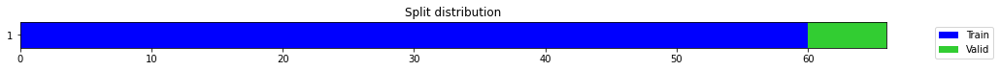

epoch,train_loss,valid_loss,mse,time
0,0.271098,0.009237,0.009237,00:00
1,0.191830,0.685799,0.685799,00:00
2,0.217188,0.133236,0.133236,00:00
3,0.207264,0.086988,0.086988,00:00
4,0.199336,0.186798,0.186798,00:00
5,0.194907,0.389813,0.389813,00:00
6,0.180780,0.136225,0.136225,00:00
7,0.165029,0.016827,0.016827,00:00
8,0.157566,0.094207,0.094207,00:00
9,0.154309,0.122744,0.122744,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3503158688545227,
  "MSE_normalize": 0.1227440982990089,
  "RMSE_normalize": 0.35034853831436047,
  "MAPE_normalize": 0.3623361329720796,
  "MAE": 22596.774804592133,
  "MSE": 510709472.8670797,
  "RMSE": 22598.882115429507,
  "MAPE": 0.19152856265430893
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.4
2022-10-14 21:18:00.039757+07:00
PROGRESS: [ 550 / 1944 ]


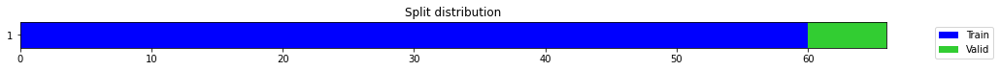

epoch,train_loss,valid_loss,mse,time
0,0.435311,0.109636,0.109636,00:00
1,0.307447,0.000852,0.000852,00:00
2,0.240868,0.099804,0.099804,00:00
3,0.245697,0.068136,0.068136,00:00
4,0.232197,0.027647,0.027647,00:00
5,0.222290,0.515534,0.515534,00:00
6,0.207071,0.001243,0.001243,00:00
7,0.197445,0.747143,0.747143,00:00
8,0.197081,0.468049,0.468049,00:00
9,0.193632,0.001939,0.001939,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.14654290676116943,
  "MSE_normalize": 0.021780414036336754,
  "RMSE_normalize": 0.14758188925588653,
  "MAPE_normalize": 0.15200674899865646,
  "MAE": 9452.603657722473,
  "MSE": 90623206.53679936,
  "RMSE": 9519.622184561704,
  "MAPE": 0.08024116280125802
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.4
2022-10-14 21:18:08.662377+07:00
PROGRESS: [ 551 / 1944 ]


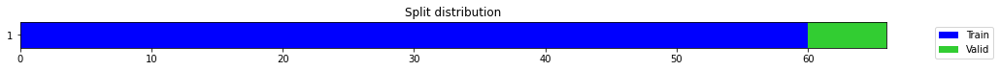

epoch,train_loss,valid_loss,mse,time
0,0.362033,0.228378,0.228378,00:00
1,0.261167,0.003970,0.003970,00:00
2,0.236890,0.153794,0.153794,00:00
3,0.231718,0.132877,0.132877,00:00
4,0.213611,0.000461,0.000461,00:00
5,0.209157,0.193071,0.193071,00:00
6,0.204820,0.186014,0.186014,00:00
7,0.194241,0.013754,0.013754,00:00
8,0.181549,0.131860,0.131860,00:00
9,0.171686,0.161000,0.161000,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6266027887662252,
  "MSE_normalize": 0.3928042776012693,
  "RMSE_normalize": 0.6267409972239484,
  "MAPE_normalize": 0.6479370216299042,
  "MAE": 40418.38628657659,
  "MSE": 1634366689.1827915,
  "RMSE": 40427.30128493357,
  "MAPE": 0.3425368219474742
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.4
2022-10-14 21:18:24.820207+07:00
PROGRESS: [ 552 / 1944 ]


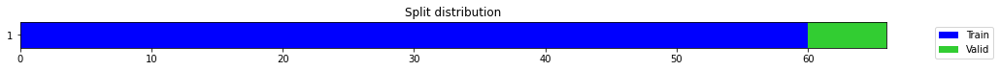

epoch,train_loss,valid_loss,mse,time
0,0.388111,2.019042,2.019042,00:00
1,0.321046,1.134807,1.134807,00:00
2,0.270763,0.449653,0.449653,00:00
3,0.231267,0.047571,0.047571,00:00
4,0.218390,0.034214,0.034214,00:00
5,0.201313,0.150941,0.150941,00:00
6,0.199417,0.019547,0.019547,00:00
7,0.199991,0.077799,0.077799,00:00
8,0.197235,0.375266,0.375266,00:00
9,0.192561,0.271210,0.271210,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.22636336088180542,
  "MSE_normalize": 0.051364962233433197,
  "RMSE_normalize": 0.2266383953204602,
  "MAPE_normalize": 0.23443386346315243,
  "MAE": 14601.342230319977,
  "MSE": 213717589.27399227,
  "RMSE": 14619.083051750964,
  "MAPE": 0.12384460786232399
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.4
2022-10-14 21:18:56.761413+07:00
PROGRESS: [ 553 / 1944 ]


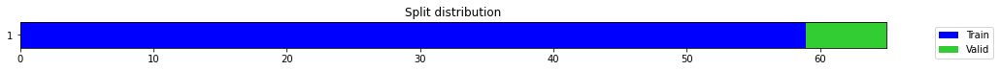

epoch,train_loss,valid_loss,mse,time
0,0.361661,0.008978,0.008978,00:00
1,0.258839,0.003393,0.003393,00:00
2,0.245301,0.002252,0.002252,00:00
3,0.237380,3.210518,3.210518,00:00
4,0.265008,0.068835,0.068835,00:00
5,0.263196,1.356249,1.356249,00:00
6,0.244527,0.251841,0.251841,00:00
7,0.216012,0.157745,0.157745,00:00
8,0.212372,0.196874,0.196874,00:00
9,0.203720,0.234145,0.234145,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.48381087680657703,
  "MSE_normalize": 0.23414546077004017,
  "RMSE_normalize": 0.48388579310622476,
  "MAPE_normalize": 0.5003254730338161,
  "MAE": 31207.736797531445,
  "MSE": 974224475.9726443,
  "RMSE": 31212.569198523925,
  "MAPE": 0.26449039224865084
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.5
2022-10-14 21:19:00.957093+07:00
PROGRESS: [ 554 / 1944 ]


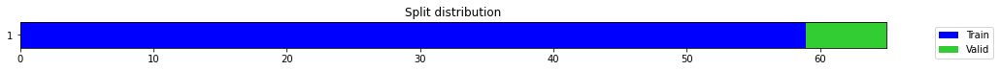

epoch,train_loss,valid_loss,mse,time
0,0.434318,0.685787,0.685787,00:00
1,0.375593,0.245649,0.245649,00:00
2,0.300522,0.014370,0.014370,00:00
3,0.299082,0.023106,0.023106,00:00
4,0.282658,0.189118,0.189118,00:00
5,0.256914,2.875854,2.875854,00:00
6,0.252827,0.080480,0.080480,00:00
7,0.249861,0.040564,0.040564,00:00
8,0.245146,0.906225,0.906225,00:00
9,0.243132,1.705314,1.705314,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5112271010875702,
  "MSE_normalize": 0.2616454725684421,
  "RMSE_normalize": 0.5115129251235419,
  "MAPE_normalize": 0.5284836481710563,
  "MAE": 32976.19292855263,
  "MSE": 1088645590.503034,
  "RMSE": 32994.62972216894,
  "MAPE": 0.2794241329456826
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.5
2022-10-14 21:19:11.017284+07:00
PROGRESS: [ 555 / 1944 ]


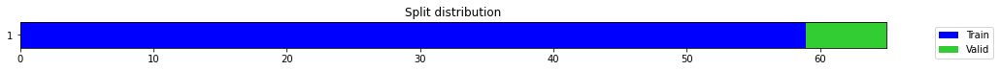

epoch,train_loss,valid_loss,mse,time
0,0.359606,0.847368,0.847368,00:00
1,0.302071,0.325884,0.325884,00:00
2,0.248243,0.138917,0.138917,00:00
3,0.210587,0.228377,0.228377,00:00
4,0.217893,0.171726,0.171726,00:00
5,0.213277,0.001270,0.001270,00:00
6,0.199455,0.295871,0.295871,00:00
7,0.196722,0.777161,0.777161,00:00
8,0.197875,0.161016,0.161016,00:00
9,0.183751,0.015059,0.015059,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.22618764638900757,
  "MSE_normalize": 0.05117096251046268,
  "RMSE_normalize": 0.22620999648658915,
  "MAPE_normalize": 0.234033620800667,
  "MAE": 14590.007942676544,
  "MSE": 212910401.81954315,
  "RMSE": 14591.449613370947,
  "MAPE": 0.12368753634253858
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.6
2022-10-14 21:19:30.834327+07:00
PROGRESS: [ 556 / 1944 ]


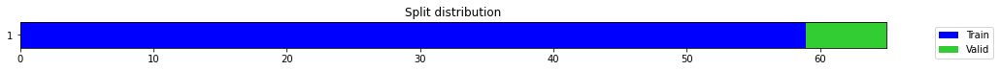

epoch,train_loss,valid_loss,mse,time
0,0.270353,0.389742,0.389742,00:00
1,0.200697,0.150773,0.150773,00:00
2,0.190627,0.016343,0.016343,00:00
3,0.177611,0.002675,0.002675,00:00
4,0.179441,0.081346,0.081346,00:00
5,0.173367,0.542579,0.542579,00:00
6,0.184661,0.828521,0.828521,00:00
7,0.182704,0.415329,0.415329,00:00
8,0.179803,0.081881,0.081881,00:00
9,0.176702,0.446512,0.446512,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4414295156796773,
  "MSE_normalize": 0.1949717820086967,
  "RMSE_normalize": 0.4415560915769328,
  "MAPE_normalize": 0.45643007554137643,
  "MAE": 28473.969479401905,
  "MSE": 811231964.6607453,
  "RMSE": 28482.134131078474,
  "MAPE": 0.24130245373007733
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.6
2022-10-14 21:21:03.282083+07:00
PROGRESS: [ 557 / 1944 ]


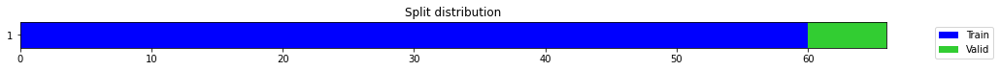

epoch,train_loss,valid_loss,mse,time
0,0.320083,0.060759,0.060759,00:00
1,0.289287,0.006110,0.006110,00:00
2,0.272769,0.401131,0.401131,00:00
3,0.259469,3.158136,3.158136,00:01
4,0.257481,0.104064,0.104064,00:00
5,0.252804,0.052217,0.052217,00:00
6,0.235077,0.141262,0.141262,00:00
7,0.225764,0.006223,0.006223,00:00
8,0.220432,0.024516,0.024516,00:00
9,0.210205,0.042420,0.042420,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20524228612581888,
  "MSE_normalize": 0.04242015730105386,
  "RMSE_normalize": 0.20596154325760394,
  "MAPE_normalize": 0.21272797157602483,
  "MAE": 13238.948424259821,
  "MSE": 176500348.89159918,
  "RMSE": 13285.343386288485,
  "MAPE": 0.11233619197589967
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.6
2022-10-14 21:21:12.761198+07:00
PROGRESS: [ 558 / 1944 ]


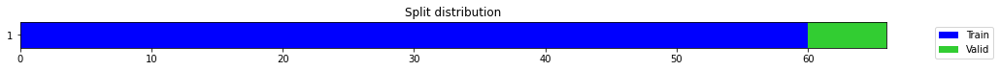

epoch,train_loss,valid_loss,mse,time
0,0.556336,0.444094,0.444094,00:00
1,0.348222,0.130197,0.130197,00:00
2,0.315410,0.042236,0.042236,00:00
3,0.321011,0.365773,0.365773,00:00
4,0.301498,0.215740,0.215740,00:00
5,0.284763,1.985574,1.985574,00:00
6,0.265936,1.300297,1.300297,00:00
7,0.243797,0.702232,0.702232,00:00
8,0.227795,0.077207,0.077207,00:00
9,0.218618,0.504216,0.504216,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.33461711804072064,
  "MSE_normalize": 0.11200270648413735,
  "RMSE_normalize": 0.33466805417329176,
  "MAPE_normalize": 0.3462988309251838,
  "MAE": 21584.142582098644,
  "MSE": 466017054.8392215,
  "RMSE": 21587.42816639401,
  "MAPE": 0.18300152989280302
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.6
2022-10-14 21:21:35.370938+07:00
PROGRESS: [ 559 / 1944 ]


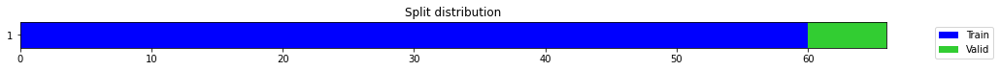

epoch,train_loss,valid_loss,mse,time
0,0.471587,0.886441,0.886441,00:00
1,0.404627,0.108344,0.108344,00:00
2,0.308634,0.117915,0.117915,00:00
3,0.297988,0.297662,0.297662,00:00
4,0.303648,0.008160,0.008160,00:00
5,0.272322,1.047859,1.047859,00:00
6,0.275252,0.314377,0.314377,00:00
7,0.258245,0.017514,0.017514,00:00
8,0.246664,4.539995,4.539995,00:00
9,0.243321,1.406433,1.406433,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.49921902020772296,
  "MSE_normalize": 0.24929320514791176,
  "RMSE_normalize": 0.49929270488152716,
  "MAPE_normalize": 0.5162618480681243,
  "MAE": 32201.623679478962,
  "MSE": 1037250695.9991475,
  "RMSE": 32206.37663567803,
  "MAPE": 0.27291433939555754
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.6
2022-10-14 21:22:19.623502+07:00
PROGRESS: [ 560 / 1944 ]


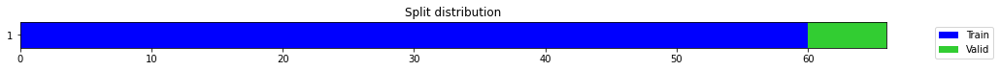

epoch,train_loss,valid_loss,mse,time
0,0.985867,0.894419,0.894419,00:00
1,0.785077,0.307503,0.307503,00:00
2,0.648199,0.008675,0.008675,00:00
3,0.504920,0.136383,0.136383,00:00
4,0.449080,0.316803,0.316803,00:00
5,0.421300,0.189924,0.189924,00:00
6,0.428574,0.009121,0.009121,00:00
7,0.417140,0.020701,0.020701,00:00
8,0.379492,0.103764,0.103764,00:00
9,0.347381,0.202015,0.202015,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5394664953152338,
  "MSE_normalize": 0.2911047524165859,
  "RMSE_normalize": 0.539541242553881,
  "MAPE_normalize": 0.557890028044278,
  "MAE": 34797.74681381384,
  "MSE": 1211218760.9510243,
  "RMSE": 34802.56830969554,
  "MAPE": 0.2949188156521723
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.8
2022-10-14 21:23:48.999993+07:00
PROGRESS: [ 561 / 1944 ]


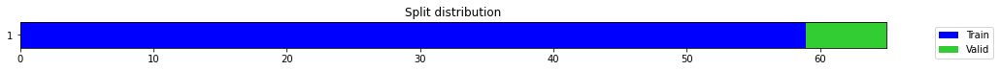

epoch,train_loss,valid_loss,mse,time
0,0.462676,0.002535,0.002535,00:00
1,0.306637,0.333642,0.333642,00:00
2,0.336426,0.000169,0.000169,00:00
3,0.283856,1.994141,1.994141,00:00
4,0.262000,1.068240,1.068240,00:00
5,0.245720,0.778133,0.778133,00:00
6,0.231876,0.498001,0.498001,00:00
7,0.212524,0.491126,0.491126,00:00
8,0.195912,0.282919,0.282919,00:00
9,0.186001,0.153191,0.153191,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3900235891342163,
  "MSE_normalize": 0.15319136068147424,
  "RMSE_normalize": 0.3913966794461525,
  "MAPE_normalize": 0.40274043370445045,
  "MAE": 25158.08159351349,
  "MSE": 637393407.4682766,
  "RMSE": 25246.65141099462,
  "MAPE": 0.21305199182344495
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.8
2022-10-14 21:23:57.137658+07:00
PROGRESS: [ 562 / 1944 ]


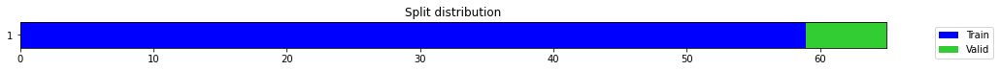

epoch,train_loss,valid_loss,mse,time
0,0.384583,0.039130,0.039130,00:00
1,0.358096,0.002765,0.002765,00:00
2,0.281445,0.030802,0.030802,00:00
3,0.261261,0.049497,0.049497,00:00
4,0.246230,0.277004,0.277004,00:00
5,0.243018,1.401634,1.401634,00:00
6,0.240147,0.942765,0.942765,00:00
7,0.222026,1.541249,1.541249,00:00
8,0.222989,1.657143,1.657143,00:00
9,0.231714,0.041398,0.041398,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.42746129631996155,
  "MSE_normalize": 0.18275019909524381,
  "RMSE_normalize": 0.4274929228598338,
  "MAPE_normalize": 0.4421136690499656,
  "MAE": 27572.9634578228,
  "MSE": 760380817.8127245,
  "RMSE": 27575.00349615072,
  "MAPE": 0.23370221485090548
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.8
2022-10-14 21:24:16.517378+07:00
PROGRESS: [ 563 / 1944 ]


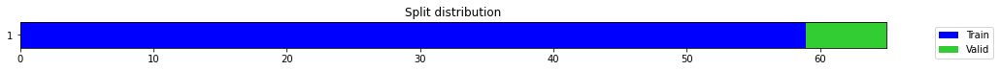

epoch,train_loss,valid_loss,mse,time
0,0.201471,0.299220,0.299220,00:00
1,0.206973,0.107354,0.107354,00:00
2,0.193937,0.001383,0.001383,00:00
3,0.177339,0.011164,0.011164,00:00
4,0.168382,0.078703,0.078703,00:00
5,0.162872,1.141782,1.141782,00:00
6,0.154448,1.751327,1.751327,00:00
7,0.157039,0.280869,0.280869,00:00
8,0.157891,0.210351,0.210351,00:00
9,0.154076,0.502106,0.502106,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.518340731660525,
  "MSE_normalize": 0.26876955062701685,
  "RMSE_normalize": 0.5184298897893685,
  "MAPE_normalize": 0.5360213855945306,
  "MAE": 33435.0505550305,
  "MSE": 1118287212.384483,
  "RMSE": 33440.80161097343,
  "MAPE": 0.28336367588007655
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.9
2022-10-14 21:24:50.512814+07:00
PROGRESS: [ 564 / 1944 ]


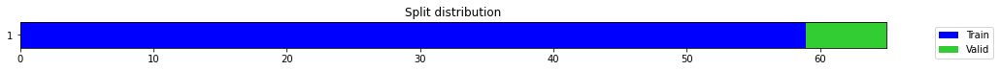

epoch,train_loss,valid_loss,mse,time
0,0.328080,0.280667,0.280667,00:00
1,0.270544,0.070316,0.070316,00:00
2,0.242667,0.000418,0.000418,00:00
3,0.211697,0.013003,0.013003,00:00
4,0.208413,0.000714,0.000714,00:00
5,0.217438,0.276309,0.276309,00:00
6,0.205320,0.796899,0.796899,00:00
7,0.205857,0.431936,0.431936,00:00
8,0.202061,0.001260,0.001260,00:00
9,0.195091,0.007620,0.007620,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6275768677393595,
  "MSE_normalize": 0.3940120152939892,
  "RMSE_normalize": 0.627703763963535,
  "MAPE_normalize": 0.648957878196401,
  "MAE": 40481.218276659645,
  "MSE": 1639391803.1309025,
  "RMSE": 40489.403590703856,
  "MAPE": 0.3430731109674965
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.9
2022-10-14 21:25:56.120511+07:00
PROGRESS: [ 565 / 1944 ]


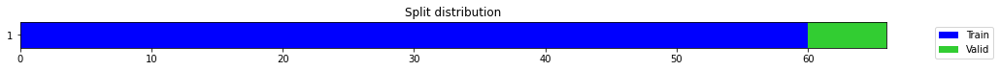

epoch,train_loss,valid_loss,mse,time
0,0.386540,0.027691,0.027691,00:00
1,0.308362,0.100954,0.100954,00:00
2,0.285393,2.746053,2.746053,00:00
3,0.271716,0.027394,0.027394,00:00
4,0.259014,0.025743,0.025743,00:00
5,0.234487,0.003567,0.003567,00:00
6,0.220163,1.420573,1.420573,00:00
7,0.213463,0.343848,0.343848,00:00
8,0.200945,0.087177,0.087177,00:00
9,0.197532,0.096133,0.096133,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3099893530209859,
  "MSE_normalize": 0.09613289867285957,
  "RMSE_normalize": 0.31005305783504145,
  "MAPE_normalize": 0.320835204882596,
  "MAE": 19995.553227265675,
  "MSE": 399986497.81760556,
  "RMSE": 19999.662442591514,
  "MAPE": 0.16953934610496857
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.9
2022-10-14 21:26:03.727331+07:00
PROGRESS: [ 566 / 1944 ]


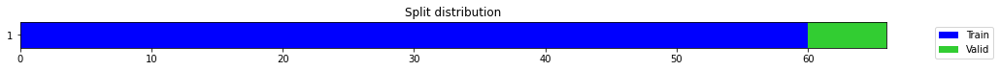

epoch,train_loss,valid_loss,mse,time
0,0.293336,0.115181,0.115181,00:00
1,0.251363,0.049665,0.049665,00:00
2,0.220810,0.728210,0.728210,00:00
3,0.212519,0.330533,0.330533,00:00
4,0.218178,0.303186,0.303186,00:00
5,0.200344,0.439262,0.439262,00:00
6,0.190410,2.390463,2.390463,00:00
7,0.197273,0.027585,0.027585,00:00
8,0.184104,0.917746,0.917746,00:00
9,0.171980,0.006550,0.006550,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.525370458761851,
  "MSE_normalize": 0.2761571622287014,
  "RMSE_normalize": 0.5255065767701689,
  "MAPE_normalize": 0.5432360990409092,
  "MAE": 33888.496071974434,
  "MSE": 1149025335.6761796,
  "RMSE": 33897.27622798298,
  "MAPE": 0.2871913257721643
}
Percent CPU Usage: 100.0
Percent Ram Usage: 24.9
2022-10-14 21:26:21.755781+07:00
PROGRESS: [ 567 / 1944 ]


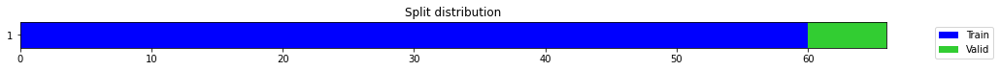

epoch,train_loss,valid_loss,mse,time
0,0.219996,0.254582,0.254582,00:00
1,0.178195,0.068709,0.068709,00:00
2,0.152409,0.002001,0.002001,00:00
3,0.160371,0.070064,0.070064,00:00
4,0.162975,1.050187,1.050187,00:00
5,0.177469,0.075911,0.075911,00:00
6,0.176412,0.213439,0.213439,00:00
7,0.184415,0.068791,0.068791,00:00
8,0.178387,1.053619,1.053619,00:00
9,0.170602,0.511663,0.511663,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.27823012073834735,
  "MSE_normalize": 0.07770985029563171,
  "RMSE_normalize": 0.2787648656047453,
  "MAPE_normalize": 0.2882371949174944,
  "MAE": 17946.955708106358,
  "MSE": 323332504.218512,
  "RMSE": 17981.44889096849,
  "MAPE": 0.1522455716558801
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.0
2022-10-14 21:26:56.452998+07:00
PROGRESS: [ 568 / 1944 ]


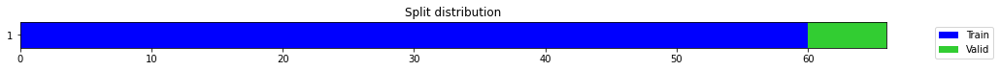

epoch,train_loss,valid_loss,mse,time
0,0.239774,0.349962,0.349962,00:00
1,0.233856,0.115696,0.115696,00:00
2,0.196167,0.000960,0.000960,00:00
3,0.189756,0.003174,0.003174,00:00
4,0.190750,0.007416,0.007416,00:00
5,0.199406,0.147216,0.147216,00:00
6,0.181460,0.353578,0.353578,00:00
7,0.175906,0.470886,0.470886,00:00
8,0.172350,0.416759,0.416759,00:00
9,0.170508,0.404991,0.404991,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5887231926123301,
  "MSE_normalize": 0.3466091525686196,
  "RMSE_normalize": 0.5887352143099813,
  "MAPE_normalize": 0.6089821706289653,
  "MAE": 37975.00081626574,
  "MSE": 1442159582.8420715,
  "RMSE": 37975.77626385103,
  "MAPE": 0.32188959697629754
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.1
2022-10-14 21:28:03.827718+07:00
PROGRESS: [ 569 / 1944 ]


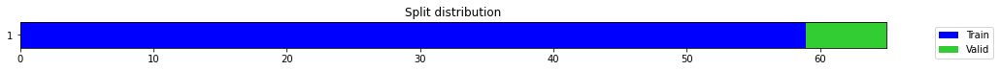

epoch,train_loss,valid_loss,mse,time
0,0.469613,0.213652,0.213652,00:00
1,0.306901,0.008522,0.008522,00:00
2,0.288996,0.319199,0.319199,00:00
3,0.294347,1.639742,1.639742,00:00
4,0.302706,10.058486,10.058486,00:00
5,0.303319,0.324641,0.324641,00:00
6,0.291553,0.585301,0.585301,00:00
7,0.271980,0.696277,0.696277,00:00
8,0.261381,0.296316,0.296316,00:00
9,0.246641,0.219301,0.219301,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.46754077076911926,
  "MSE_normalize": 0.21930136014160637,
  "RMSE_normalize": 0.4682962311844997,
  "MAPE_normalize": 0.4830661441093624,
  "MAE": 30158.24987769127,
  "MSE": 912461646.5397726,
  "RMSE": 30206.980096324965,
  "MAPE": 0.2554746613450492
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.1
2022-10-14 21:28:10.279568+07:00
PROGRESS: [ 570 / 1944 ]


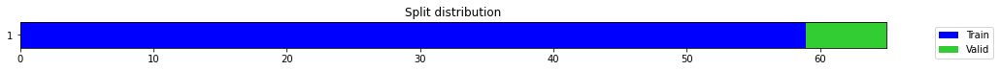

epoch,train_loss,valid_loss,mse,time
0,0.409313,0.133633,0.133633,00:00
1,0.292218,0.296149,0.296149,00:00
2,0.296551,0.083384,0.083384,00:00
3,0.320871,0.142963,0.142963,00:00
4,0.300193,1.070777,1.070777,00:00
5,0.283851,1.298766,1.298766,00:00
6,0.266025,0.032241,0.032241,00:00
7,0.250345,0.101219,0.101219,00:00
8,0.234148,0.369093,0.369093,00:00
9,0.232443,0.310111,0.310111,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4991462628046672,
  "MSE_normalize": 0.2492672136397648,
  "RMSE_normalize": 0.4992666758754932,
  "MAPE_normalize": 0.5161311252973034,
  "MAE": 32196.93053595225,
  "MSE": 1037142551.4153452,
  "RMSE": 32204.697660672817,
  "MAPE": 0.27285905629946866
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.2
2022-10-14 21:28:23.854822+07:00
PROGRESS: [ 571 / 1944 ]


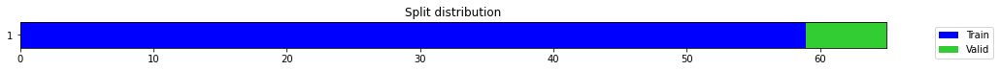

epoch,train_loss,valid_loss,mse,time
0,0.663846,0.772774,0.772774,00:00
1,0.580978,0.323734,0.323734,00:00
2,0.480947,0.222360,0.222360,00:00
3,0.415547,0.323948,0.323948,00:00
4,0.350143,0.200869,0.200869,00:00
5,0.325056,0.134884,0.134884,00:00
6,0.321889,0.753978,0.753978,00:00
7,0.294117,0.751988,0.751988,00:00
8,0.275125,1.912908,1.912908,00:00
9,0.262199,4.088171,4.088171,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.24066109458605447,
  "MSE_normalize": 0.05799216189167744,
  "RMSE_normalize": 0.24081561803935692,
  "MAPE_normalize": 0.249159122023621,
  "MAE": 15523.603245178858,
  "MSE": 241291816.39326176,
  "RMSE": 15533.570626010678,
  "MAPE": 0.1316440590059257
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.2
2022-10-14 21:28:49.664198+07:00
PROGRESS: [ 572 / 1944 ]


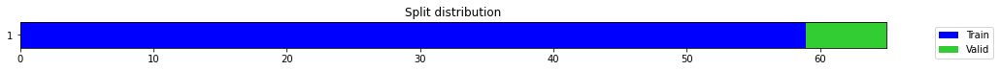

epoch,train_loss,valid_loss,mse,time
0,0.823613,0.997225,0.997225,00:00
1,0.736445,0.387200,0.387200,00:00
2,0.620138,0.113654,0.113654,00:00
3,0.553264,0.039878,0.039878,00:00
4,0.481839,0.034131,0.034131,00:00
5,0.416339,0.074092,0.074092,00:00
6,0.386072,0.131649,0.131649,00:00
7,0.354378,0.016482,0.016482,00:00
8,0.338440,0.130561,0.130561,00:00
9,0.319242,0.418619,0.418619,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3496829668680827,
  "MSE_normalize": 0.12236030878359354,
  "RMSE_normalize": 0.3498003841958918,
  "MAPE_normalize": 0.3619574211066865,
  "MAE": 22555.950094858807,
  "MSE": 509112614.49404234,
  "RMSE": 22563.52398217181,
  "MAPE": 0.19125961751083512
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.4
2022-10-14 21:30:12.990205+07:00
PROGRESS: [ 573 / 1944 ]


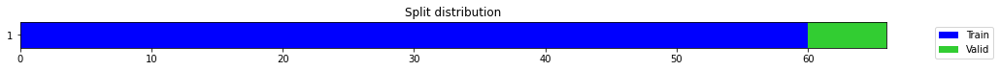

epoch,train_loss,valid_loss,mse,time
0,0.489204,0.221292,0.221292,00:00
1,0.329747,0.180072,0.180072,00:00
2,0.281542,0.074926,0.074926,00:00
3,0.315129,0.150000,0.150000,00:00
4,0.340386,0.506108,0.506108,00:00
5,0.317985,1.596896,1.596896,00:00
6,0.285996,0.154707,0.154707,00:00
7,0.265304,0.017545,0.017545,00:00
8,0.250774,0.016607,0.016607,00:00
9,0.236417,0.026739,0.026739,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.16349932551383972,
  "MSE_normalize": 0.026739278176837782,
  "RMSE_normalize": 0.16352149148303957,
  "MAPE_normalize": 0.1691832241186527,
  "MAE": 10546.360492944717,
  "MSE": 111255879.93055707,
  "RMSE": 10547.790286621985,
  "MAPE": 0.08941071811943994
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.4
2022-10-14 21:30:22.992729+07:00
PROGRESS: [ 574 / 1944 ]


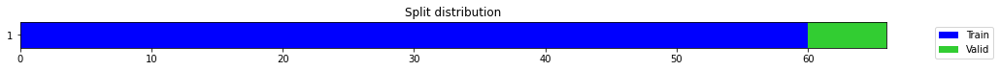

epoch,train_loss,valid_loss,mse,time
0,0.345610,0.103399,0.103399,00:00
1,0.260915,0.571080,0.571080,00:00
2,0.243637,0.046636,0.046636,00:00
3,0.234582,0.354722,0.354722,00:00
4,0.228847,0.033441,0.033441,00:00
5,0.227136,0.451440,0.451440,00:00
6,0.206439,0.766562,0.766562,00:00
7,0.194840,1.163834,1.163834,00:00
8,0.196649,2.854276,2.854276,00:00
9,0.212441,0.986814,0.986814,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3153635859489441,
  "MSE_normalize": 0.0994600940047583,
  "RMSE_normalize": 0.31537294431317076,
  "MAPE_normalize": 0.3262904275904123,
  "MAE": 20342.21274805069,
  "MSE": 413830179.08316374,
  "RMSE": 20342.816399976768,
  "MAPE": 0.1724486450219519
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.4
2022-10-14 21:30:46.233318+07:00
PROGRESS: [ 575 / 1944 ]


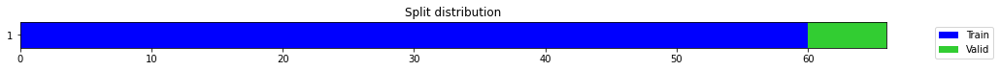

epoch,train_loss,valid_loss,mse,time
0,0.239289,0.168995,0.168995,00:00
1,0.188804,0.083722,0.083722,00:00
2,0.206479,0.040401,0.040401,00:00
3,0.177867,0.002614,0.002614,00:00
4,0.176327,0.044225,0.044225,00:00
5,0.171654,0.026909,0.026909,00:00
6,0.169169,0.002588,0.002588,00:00
7,0.162839,0.004980,0.004980,00:00
8,0.167191,0.913394,0.913394,00:00
9,0.162754,1.515807,1.515807,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.482334444920222,
  "MSE_normalize": 0.23267298288240598,
  "RMSE_normalize": 0.48236187959083787,
  "MAPE_normalize": 0.4988791110109207,
  "MAE": 31112.501035134,
  "MSE": 968097840.0184646,
  "RMSE": 31114.270681127407,
  "MAPE": 0.2637057200661924
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.4
2022-10-14 21:31:27.768269+07:00
PROGRESS: [ 576 / 1944 ]


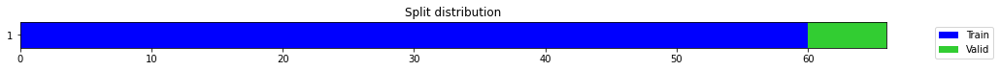

epoch,train_loss,valid_loss,mse,time
0,0.177371,0.802691,0.802691,00:00
1,0.149576,0.403340,0.403340,00:00
2,0.144725,0.238731,0.238731,00:00
3,0.141209,0.249457,0.249457,00:00
4,0.137693,0.344269,0.344269,00:00
5,0.130360,0.527168,0.527168,00:00
6,0.131569,0.325943,0.325943,00:00
7,0.132229,0.135047,0.135047,00:00
8,0.126288,0.107903,0.107903,00:00
9,0.132373,0.055322,0.055322,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4038107792536418,
  "MSE_normalize": 0.16310508388741832,
  "RMSE_normalize": 0.4038627042540798,
  "MAPE_normalize": 0.417896627011835,
  "MAE": 26047.41050497691,
  "MSE": 678642090.0755993,
  "RMSE": 26050.759875205164,
  "MAPE": 0.22084015681050984
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:32:47.877484+07:00
PROGRESS: [ 577 / 1944 ]


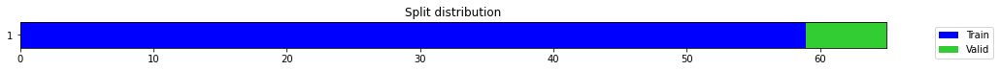

epoch,train_loss,valid_loss,mse,time
0,0.382698,0.010319,0.010319,00:00
1,0.414465,0.047703,0.047703,00:00
2,0.344660,0.245158,0.245158,00:00
3,0.289445,0.037791,0.037791,00:00
4,0.273712,0.088069,0.088069,00:00
5,0.252972,0.256138,0.256138,00:00
6,0.242813,0.271169,0.271169,00:00
7,0.224856,0.276288,0.276288,00:00
8,0.217179,0.274656,0.274656,00:00
9,0.214071,0.254446,0.254446,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5044198979934057,
  "MSE_normalize": 0.25444563791391284,
  "RMSE_normalize": 0.5044260480129004,
  "MAPE_normalize": 0.5218218294901931,
  "MAE": 32537.101100166637,
  "MSE": 1058688763.1516498,
  "RMSE": 32537.497801024125,
  "MAPE": 0.2758082637874364
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:32:49.542113+07:00
PROGRESS: [ 578 / 1944 ]


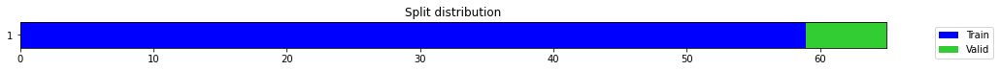

epoch,train_loss,valid_loss,mse,time
0,1.028959,2.428670,2.428670,00:00
1,0.884468,1.571157,1.571157,00:00
2,0.750378,0.618841,0.618841,00:00
3,0.637908,0.048267,0.048267,00:00
4,0.541717,0.000652,0.000652,00:00
5,0.480198,0.006754,0.006754,00:00
6,0.423935,0.048973,0.048973,00:00
7,0.392503,0.087865,0.087865,00:00
8,0.362787,0.168746,0.168746,00:00
9,0.327344,0.121689,0.121689,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3590518335501353,
  "MSE_normalize": 0.1289342532719472,
  "RMSE_normalize": 0.3590741612424197,
  "MAPE_normalize": 0.3713759869226772,
  "MAE": 23160.27947131793,
  "MSE": 536465259.31225485,
  "RMSE": 23161.71969678104,
  "MAPE": 0.1963059794923987
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:32:53.303239+07:00
PROGRESS: [ 579 / 1944 ]


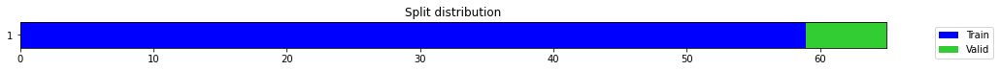

epoch,train_loss,valid_loss,mse,time
0,0.498395,1.690812,1.690812,00:00
1,0.484904,1.258702,1.258702,00:00
2,0.456973,0.751659,0.751659,00:00
3,0.428301,0.290173,0.290173,00:00
4,0.390802,0.053825,0.053825,00:00
5,0.365380,0.000945,0.000945,00:00
6,0.378643,0.000986,0.000986,00:00
7,0.349883,0.038350,0.038350,00:00
8,0.326047,0.135628,0.135628,00:00
9,0.303271,0.436650,0.436650,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3690015971660614,
  "MSE_normalize": 0.13628676267797898,
  "RMSE_normalize": 0.36917037080185483,
  "MAPE_normalize": 0.38148719825396343,
  "MAE": 23802.079023599625,
  "MSE": 567057330.581192,
  "RMSE": 23812.96559820284,
  "MAPE": 0.2016955935787005
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:00.383798+07:00
PROGRESS: [ 580 / 1944 ]


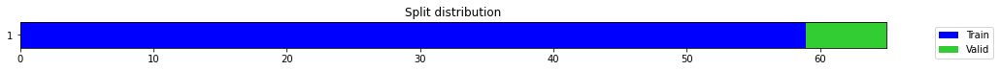

epoch,train_loss,valid_loss,mse,time
0,1.106291,0.746808,0.746808,00:00
1,0.890713,0.797310,0.797310,00:00
2,0.836078,0.716316,0.716316,00:00
3,0.812629,0.645841,0.645841,00:00
4,0.760714,0.456453,0.456453,00:00
5,0.727567,0.297449,0.297449,00:00
6,0.677856,0.149263,0.149263,00:00
7,0.638314,0.083695,0.083695,00:00
8,0.585509,0.045295,0.045295,00:00
9,0.550043,0.032475,0.032475,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3279951314131419,
  "MSE_normalize": 0.10761216502024418,
  "RMSE_normalize": 0.3280429316724324,
  "MAPE_normalize": 0.339203659223336,
  "MAE": 21156.997956673305,
  "MSE": 447749039.12441593,
  "RMSE": 21160.081264598582,
  "MAPE": 0.179312297634642
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:14.338276+07:00
PROGRESS: [ 581 / 1944 ]


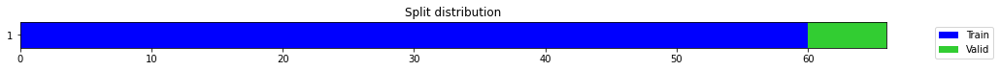

epoch,train_loss,valid_loss,mse,time
0,0.514044,1.994593,1.994593,00:00
1,0.423761,0.433294,0.433294,00:00
2,0.387107,0.010569,0.010569,00:00
3,0.331476,0.109728,0.109728,00:00
4,0.313007,0.043815,0.043815,00:00
5,0.284815,0.004590,0.004590,00:00
6,0.281072,0.008211,0.008211,00:00
7,0.265235,0.002522,0.002522,00:00
8,0.252549,0.001142,0.001142,00:00
9,0.243854,0.000688,0.000688,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.022236257791519165,
  "MSE_normalize": 0.0006878776393429339,
  "RMSE_normalize": 0.02622742151533265,
  "MAPE_normalize": 0.023216576727416078,
  "MAE": 1434.3275725841522,
  "MSE": 2862097.904944383,
  "RMSE": 1691.773597425017,
  "MAPE": 0.012217362241410791
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:16.071772+07:00
PROGRESS: [ 582 / 1944 ]


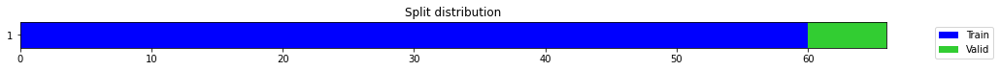

epoch,train_loss,valid_loss,mse,time
0,0.473344,0.801110,0.801110,00:00
1,0.367716,0.486801,0.486801,00:00
2,0.337128,0.226835,0.226835,00:00
3,0.296816,0.020474,0.020474,00:00
4,0.268009,0.075035,0.075035,00:00
5,0.251617,0.285106,0.285106,00:00
6,0.250863,0.434509,0.434509,00:00
7,0.240683,0.179490,0.179490,00:00
8,0.232614,0.199716,0.199716,00:00
9,0.228043,0.396224,0.396224,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.40970879793167114,
  "MSE_normalize": 0.16795524083971833,
  "RMSE_normalize": 0.4098234264164487,
  "MAPE_normalize": 0.423640529013861,
  "MAE": 26427.856301784515,
  "MSE": 698822458.2949952,
  "RMSE": 26435.250297566603,
  "MAPE": 0.2239653182896172
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:19.949832+07:00
PROGRESS: [ 583 / 1944 ]


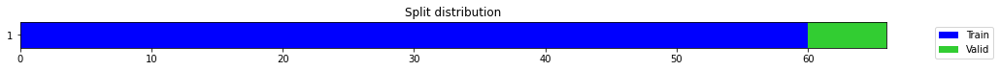

epoch,train_loss,valid_loss,mse,time
0,0.809026,1.493432,1.493432,00:00
1,0.705912,1.138982,1.138982,00:00
2,0.607384,0.691424,0.691424,00:00
3,0.560471,0.257205,0.257205,00:00
4,0.489457,0.020159,0.020159,00:00
5,0.427545,0.034132,0.034132,00:00
6,0.386607,0.146580,0.146580,00:00
7,0.364599,0.111193,0.111193,00:00
8,0.336490,0.023302,0.023302,00:00
9,0.316456,0.003873,0.003873,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.36011309425036114,
  "MSE_normalize": 0.1296844001022368,
  "RMSE_normalize": 0.3601172032855926,
  "MAPE_normalize": 0.3725405056405216,
  "MAE": 23228.735031525295,
  "MSE": 539586444.7507339,
  "RMSE": 23229.000080733866,
  "MAPE": 0.19690479868595778
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:27.716378+07:00
PROGRESS: [ 584 / 1944 ]


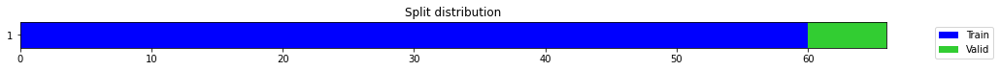

epoch,train_loss,valid_loss,mse,time
0,0.484044,0.227513,0.227513,00:00
1,0.449887,0.224043,0.224043,00:00
2,0.421337,0.222275,0.222275,00:00
3,0.406333,0.239626,0.239626,00:00
4,0.395626,0.251881,0.251881,00:00
5,0.358954,0.230515,0.230515,00:00
6,0.335719,0.223641,0.223641,00:00
7,0.309921,0.171163,0.171163,00:00
8,0.295343,0.051414,0.051414,00:00
9,0.291206,0.015342,0.015342,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.39211230476697284,
  "MSE_normalize": 0.15376544273730927,
  "RMSE_normalize": 0.3921293698989012,
  "MAPE_normalize": 0.40557504516344506,
  "MAE": 25292.812106688816,
  "MSE": 639782028.5765904,
  "RMSE": 25293.912875958722,
  "MAPE": 0.21438235519392568
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:43.005002+07:00
PROGRESS: [ 585 / 1944 ]


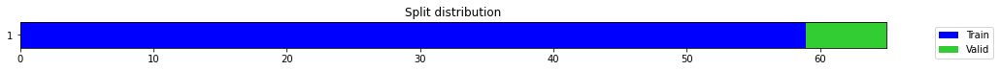

epoch,train_loss,valid_loss,mse,time
0,0.425059,0.500847,0.500847,00:00
1,0.322676,0.000921,0.000921,00:00
2,0.291697,0.005768,0.005768,00:00
3,0.266410,0.123263,0.123263,00:00
4,0.242942,0.098923,0.098923,00:00
5,0.244978,0.096443,0.096443,00:00
6,0.233617,0.112322,0.112322,00:00
7,0.237696,0.143068,0.143068,00:00
8,0.241785,0.145040,0.145040,00:00
9,0.232406,0.143509,0.143509,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.37874911228815716,
  "MSE_normalize": 0.14350877232228498,
  "RMSE_normalize": 0.3788255169893984,
  "MAPE_normalize": 0.3916625377347609,
  "MAE": 24430.83273903529,
  "MSE": 597106422.8764447,
  "RMSE": 24435.761147884154,
  "MAPE": 0.20705081664004432
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:44.701711+07:00
PROGRESS: [ 586 / 1944 ]


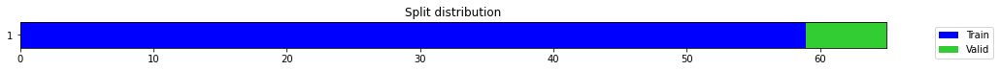

epoch,train_loss,valid_loss,mse,time
0,0.675522,1.526846,1.526846,00:00
1,0.773447,1.008152,1.008152,00:00
2,0.662766,0.431057,0.431057,00:00
3,0.570970,0.060846,0.060846,00:00
4,0.489681,0.047375,0.047375,00:00
5,0.437007,0.131140,0.131140,00:00
6,0.415683,0.021461,0.021461,00:00
7,0.389848,0.034383,0.034383,00:00
8,0.357130,0.171164,0.171164,00:00
9,0.330129,0.421462,0.421462,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4854002147912979,
  "MSE_normalize": 0.23611020307473055,
  "RMSE_normalize": 0.48591172354114953,
  "MAPE_normalize": 0.501643061761192,
  "MAE": 31310.25545489788,
  "MSE": 982399308.9841976,
  "RMSE": 31343.24981529831,
  "MAPE": 0.2652681895306757
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.6
2022-10-14 21:33:48.718922+07:00
PROGRESS: [ 587 / 1944 ]


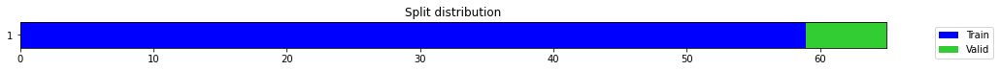

epoch,train_loss,valid_loss,mse,time
0,0.432656,0.203749,0.203749,00:00
1,0.426465,0.164397,0.164397,00:00
2,0.421365,0.095122,0.095122,00:00
3,0.395915,0.023472,0.023472,00:00
4,0.346480,0.001668,0.001668,00:00
5,0.314306,0.033562,0.033562,00:00
6,0.294417,0.062571,0.062571,00:00
7,0.282825,0.021212,0.021212,00:00
8,0.275267,0.072267,0.072267,00:00
9,0.266646,0.027308,0.027308,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.23433639605840048,
  "MSE_normalize": 0.05494416440597405,
  "RMSE_normalize": 0.23440171587677008,
  "MAPE_normalize": 0.24253420534829598,
  "MAE": 15115.634891351065,
  "MSE": 228609812.03789368,
  "RMSE": 15119.84828091518,
  "MAPE": 0.128162865424788
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.7
2022-10-14 21:33:56.780591+07:00
PROGRESS: [ 588 / 1944 ]


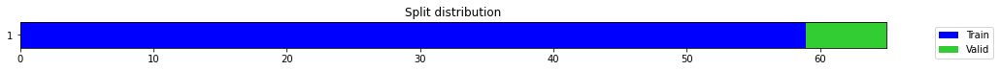

epoch,train_loss,valid_loss,mse,time
0,0.617507,0.993283,0.993283,00:00
1,0.759498,0.809015,0.809015,00:00
2,0.684818,0.650198,0.650198,00:00
3,0.640743,0.482343,0.482343,00:00
4,0.581228,0.321056,0.321056,00:00
5,0.553395,0.200261,0.200261,00:00
6,0.520222,0.114924,0.114924,00:00
7,0.485596,0.051876,0.051876,00:00
8,0.452015,0.023497,0.023497,00:00
9,0.419883,0.014636,0.014636,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.36450889706611633,
  "MSE_normalize": 0.13289353783522687,
  "RMSE_normalize": 0.3645456594656242,
  "MAPE_normalize": 0.37698802720450164,
  "MAE": 23512.281896352768,
  "MSE": 552938915.9708222,
  "RMSE": 23514.653218170628,
  "MAPE": 0.19928051740017658
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.7
2022-10-14 21:34:12.977366+07:00
PROGRESS: [ 589 / 1944 ]


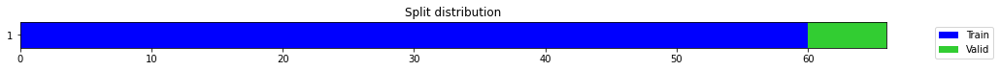

epoch,train_loss,valid_loss,mse,time
0,0.599000,0.264891,0.264891,00:00
1,0.565387,0.002084,0.002084,00:00
2,0.441671,0.242582,0.242582,00:00
3,0.389188,0.102688,0.102688,00:00
4,0.345098,0.039416,0.039416,00:00
5,0.320785,0.321890,0.321890,00:00
6,0.287012,0.390502,0.390502,00:00
7,0.272465,0.448409,0.448409,00:00
8,0.255426,0.439466,0.439466,00:00
9,0.252696,0.411210,0.411210,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6410112082958221,
  "MSE_normalize": 0.4112103667366265,
  "RMSE_normalize": 0.6412568648651072,
  "MAPE_normalize": 0.662735292027821,
  "MAE": 41347.78697991371,
  "MSE": 1710950119.3446524,
  "RMSE": 41363.63281125888,
  "MAPE": 0.3503851022637395
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.7
2022-10-14 21:34:15.514478+07:00
PROGRESS: [ 590 / 1944 ]


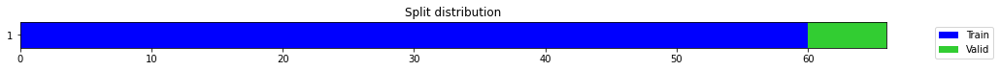

epoch,train_loss,valid_loss,mse,time
0,0.912117,1.407050,1.407050,00:00
1,0.758677,0.916285,0.916285,00:00
2,0.692089,0.266046,0.266046,00:00
3,0.580168,0.006486,0.006486,00:00
4,0.493583,0.213694,0.213694,00:00
5,0.468256,0.068288,0.068288,00:00
6,0.436570,0.050076,0.050076,00:00
7,0.396624,0.009253,0.009253,00:00
8,0.368698,0.292708,0.292708,00:00
9,0.351201,0.277625,0.277625,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.26010019580523175,
  "MSE_normalize": 0.06774892670150419,
  "RMSE_normalize": 0.26028623993884925,
  "MAPE_normalize": 0.2693020621352106,
  "MAE": 16777.50303022067,
  "MSE": 281887431.8400936,
  "RMSE": 16789.50362101553,
  "MAPE": 0.14228227397950718
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.7
2022-10-14 21:34:19.803080+07:00
PROGRESS: [ 591 / 1944 ]


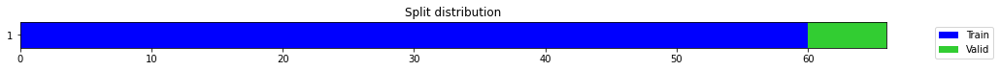

epoch,train_loss,valid_loss,mse,time
0,0.451975,0.617645,0.617645,00:00
1,0.534437,0.491156,0.491156,00:00
2,0.508653,0.406408,0.406408,00:00
3,0.435254,0.288919,0.288919,00:00
4,0.391774,0.123278,0.123278,00:00
5,0.349141,0.011132,0.011132,00:00
6,0.344771,0.037366,0.037366,00:00
7,0.334974,0.101532,0.101532,00:00
8,0.322958,0.000539,0.000539,00:00
9,0.300732,0.265598,0.265598,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.41053515672683716,
  "MSE_normalize": 0.16862883947204801,
  "RMSE_normalize": 0.4106444197502847,
  "MAPE_normalize": 0.42449628509651866,
  "MAE": 26481.159749507904,
  "MSE": 701625144.5928167,
  "RMSE": 26488.207651572364,
  "MAPE": 0.22441737742898285
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:34:28.158911+07:00
PROGRESS: [ 592 / 1944 ]


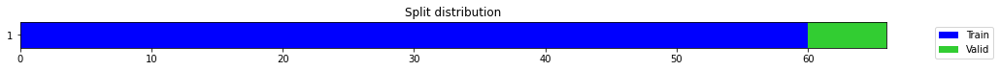

epoch,train_loss,valid_loss,mse,time
0,0.560409,0.088626,0.088626,00:00
1,0.461732,0.067143,0.067143,00:00
2,0.414097,0.034762,0.034762,00:00
3,0.394151,0.006080,0.006080,00:00
4,0.357056,0.003987,0.003987,00:00
5,0.330388,0.056381,0.056381,00:00
6,0.315760,0.141237,0.141237,00:00
7,0.311869,0.218942,0.218942,00:00
8,0.306760,0.173146,0.173146,00:00
9,0.291364,0.101488,0.101488,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22093802690505981,
  "MSE_normalize": 0.04885490307459269,
  "RMSE_normalize": 0.22103145268172286,
  "MAPE_normalize": 0.22841931676691327,
  "MAE": 14251.386487483978,
  "MSE": 203273820.42773914,
  "RMSE": 14257.41282378185,
  "MAPE": 0.1207658495036993
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:34:44.788688+07:00
PROGRESS: [ 593 / 1944 ]


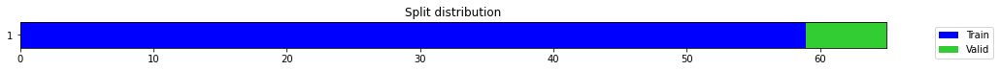

epoch,train_loss,valid_loss,mse,time
0,0.472732,0.436115,0.436115,00:00
1,0.444947,0.126490,0.126490,00:00
2,0.378302,0.009126,0.009126,00:00
3,0.330265,0.061658,0.061658,00:00
4,0.309730,0.071356,0.071356,00:00
5,0.295658,0.053854,0.053854,00:00
6,0.271884,0.064577,0.064577,00:00
7,0.264169,0.092963,0.092963,00:00
8,0.251384,0.123404,0.123404,00:00
9,0.239892,0.129236,0.129236,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3594498336315155,
  "MSE_normalize": 0.12923555023948965,
  "RMSE_normalize": 0.3594934634169162,
  "MAPE_normalize": 0.371960898776116,
  "MAE": 23185.952068567276,
  "MSE": 537718885.4955293,
  "RMSE": 23188.766364244762,
  "MAPE": 0.1965719385230561
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:34:46.857919+07:00
PROGRESS: [ 594 / 1944 ]


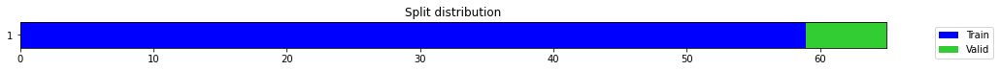

epoch,train_loss,valid_loss,mse,time
0,0.256744,0.114825,0.114825,00:00
1,0.273630,0.004349,0.004349,00:00
2,0.265322,0.004330,0.004330,00:00
3,0.247320,0.005446,0.005446,00:00
4,0.233422,0.109841,0.109841,00:00
5,0.215998,0.391792,0.391792,00:00
6,0.207610,0.190673,0.190673,00:00
7,0.202068,0.109489,0.109489,00:00
8,0.193332,0.237739,0.237739,00:00
9,0.199093,0.148670,0.148670,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.28032827377319336,
  "MSE_normalize": 0.07862488205106762,
  "RMSE_normalize": 0.280401287534611,
  "MAPE_normalize": 0.28987510892252855,
  "MAE": 18082.294971466064,
  "MSE": 327139737.25009054,
  "RMSE": 18087.004651132553,
  "MAPE": 0.15324410061424854
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:34:51.664769+07:00
PROGRESS: [ 595 / 1944 ]


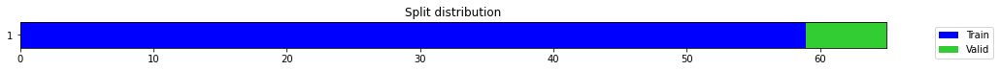

epoch,train_loss,valid_loss,mse,time
0,0.573710,0.862734,0.862734,00:00
1,0.556864,0.658382,0.658382,00:00
2,0.516840,0.368926,0.368926,00:00
3,0.484868,0.114399,0.114399,00:00
4,0.433133,0.009624,0.009624,00:00
5,0.407611,0.000809,0.000809,00:00
6,0.369563,0.025986,0.025986,00:00
7,0.342375,0.099546,0.099546,00:00
8,0.324524,0.159388,0.159388,00:00
9,0.309643,0.024468,0.024468,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3811215062936147,
  "MSE_normalize": 0.14540677100594893,
  "RMSE_normalize": 0.38132239772395865,
  "MAPE_normalize": 0.3939966143325364,
  "MAE": 24583.86164196332,
  "MSE": 605003551.2978464,
  "RMSE": 24596.81994278623,
  "MAPE": 0.20831455432491283
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.0
2022-10-14 21:35:01.258539+07:00
PROGRESS: [ 596 / 1944 ]


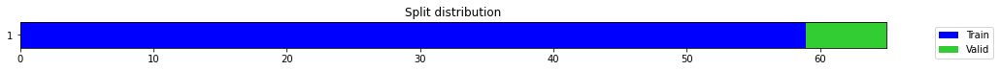

epoch,train_loss,valid_loss,mse,time
0,0.594534,2.207907,2.207907,00:00
1,0.660593,1.565524,1.565524,00:00
2,0.611452,1.134523,1.134523,00:00
3,0.602493,0.736923,0.736923,00:00
4,0.606865,0.400230,0.400230,00:00
5,0.542750,0.156760,0.156760,00:00
6,0.515065,0.045033,0.045033,00:00
7,0.484362,0.000809,0.000809,00:00
8,0.454667,0.003873,0.003873,00:00
9,0.420041,0.000470,0.000470,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1935678025086721,
  "MSE_normalize": 0.037504209238433006,
  "RMSE_normalize": 0.19366003521230962,
  "MAPE_normalize": 0.20037257481009588,
  "MAE": 12485.897533019384,
  "MSE": 156046239.25622532,
  "RMSE": 12491.846911334822,
  "MAPE": 0.10587505856420228
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:35:19.327804+07:00
PROGRESS: [ 597 / 1944 ]


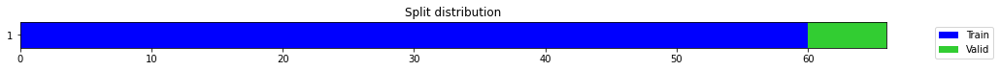

epoch,train_loss,valid_loss,mse,time
0,0.265232,0.001761,0.001761,00:00
1,0.238142,0.026605,0.026605,00:00
2,0.240368,0.091678,0.091678,00:00
3,0.198655,0.227772,0.227772,00:00
4,0.186269,0.179174,0.179174,00:00
5,0.176560,0.029100,0.029100,00:00
6,0.167461,0.023798,0.023798,00:00
7,0.159751,0.027437,0.027437,00:00
8,0.153880,0.032143,0.032143,00:00
9,0.146472,0.036525,0.036525,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19045808911323547,
  "MSE_normalize": 0.036525364188210695,
  "RMSE_normalize": 0.1911161013316531,
  "MAPE_normalize": 0.19739126806862753,
  "MAE": 12285.308580160141,
  "MSE": 151973494.0363305,
  "RMSE": 12327.753000296952,
  "MAPE": 0.1042405861823739
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:35:21.559860+07:00
PROGRESS: [ 598 / 1944 ]


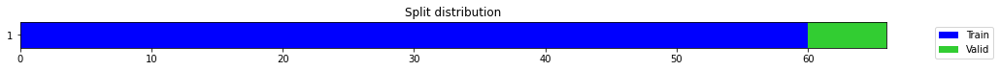

epoch,train_loss,valid_loss,mse,time
0,0.403844,0.359238,0.359238,00:00
1,0.318066,0.163445,0.163445,00:00
2,0.291655,0.001336,0.001336,00:00
3,0.270315,0.100788,0.100788,00:00
4,0.260009,0.008732,0.008732,00:00
5,0.235894,0.265957,0.265957,00:00
6,0.221483,0.070276,0.070276,00:00
7,0.211742,0.075615,0.075615,00:00
8,0.192929,0.277992,0.277992,00:00
9,0.188080,0.573479,0.573479,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3511100808779399,
  "MSE_normalize": 0.12334724686725689,
  "RMSE_normalize": 0.3512082670827338,
  "MAPE_normalize": 0.36305499092915966,
  "MAE": 22648.004656950634,
  "MSE": 513219032.9324449,
  "RMSE": 22654.33805990466,
  "MAPE": 0.19193424843303797
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:35:26.935297+07:00
PROGRESS: [ 599 / 1944 ]


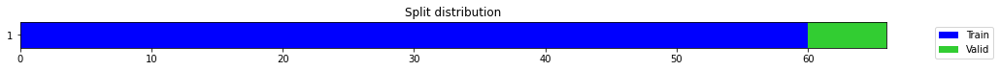

epoch,train_loss,valid_loss,mse,time
0,0.324722,0.735423,0.735423,00:00
1,0.392144,0.498700,0.498700,00:00
2,0.374581,0.299209,0.299209,00:00
3,0.342546,0.180790,0.180790,00:00
4,0.335305,0.040928,0.040928,00:00
5,0.314831,0.003975,0.003975,00:00
6,0.297320,0.122861,0.122861,00:00
7,0.280984,0.074586,0.074586,00:00
8,0.265326,0.006549,0.006549,00:00
9,0.250591,0.572345,0.572345,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18494418263435364,
  "MSE_normalize": 0.0342424346837363,
  "RMSE_normalize": 0.18504711476739188,
  "MAPE_normalize": 0.19118803601295073,
  "MAE": 11929.639556646347,
  "MSE": 142474758.5371897,
  "RMSE": 11936.279090955844,
  "MAPE": 0.10108624727621163
}
Percent CPU Usage: 100.0
Percent Ram Usage: 25.9
2022-10-14 21:35:37.577610+07:00
PROGRESS: [ 600 / 1944 ]


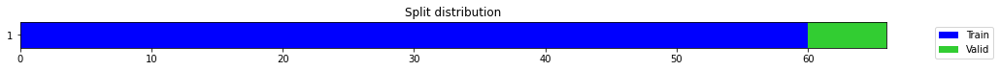

epoch,train_loss,valid_loss,mse,time
0,0.377327,0.150347,0.150347,00:00
1,0.316712,0.146177,0.146177,00:00
2,0.275527,0.108424,0.108424,00:00
3,0.256613,0.042899,0.042899,00:00
4,0.256077,0.007721,0.007721,00:00
5,0.255417,0.005735,0.005735,00:00
6,0.247061,0.029698,0.029698,00:00
7,0.235163,0.042411,0.042411,00:00
8,0.225515,0.035996,0.035996,00:00
9,0.216059,0.001385,0.001385,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2433146039644877,
  "MSE_normalize": 0.059207247874213685,
  "RMSE_normalize": 0.24332539504583917,
  "MAPE_normalize": 0.2517129729061195,
  "MAE": 15694.765214125315,
  "MSE": 246347504.85591653,
  "RMSE": 15695.461282036807,
  "MAPE": 0.133041513696515
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.0
2022-10-14 21:35:58.475054+07:00
PROGRESS: [ 601 / 1944 ]


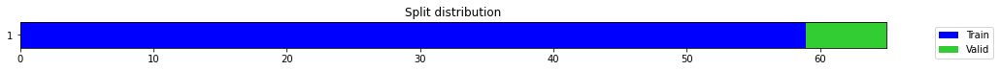

epoch,train_loss,valid_loss,mse,time
0,0.628198,1.860352,1.860352,00:00
1,0.519364,0.003701,0.003701,00:00
2,0.418125,0.006482,0.006482,00:00
3,0.417533,0.370841,0.370841,00:00
4,0.368121,0.033447,0.033447,00:00
5,0.348515,0.160885,0.160885,00:00
6,0.337508,0.685220,0.685220,00:00
7,0.334719,0.675300,0.675300,00:00
8,0.311051,0.564022,0.564022,00:00
9,0.287087,0.511148,0.511148,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.7148027171691259,
  "MSE_normalize": 0.5111477344859178,
  "RMSE_normalize": 0.7149459661302509,
  "MAPE_normalize": 0.7391570188999207,
  "MAE": 46107.6344682773,
  "MSE": 2126766122.8043983,
  "RMSE": 46116.874599265706,
  "MAPE": 0.3907566894695975
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.0
2022-10-14 21:36:00.714368+07:00
PROGRESS: [ 602 / 1944 ]


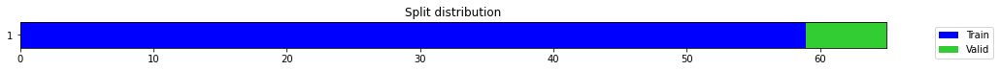

epoch,train_loss,valid_loss,mse,time
0,0.460350,0.668154,0.668154,00:00
1,0.363835,0.047087,0.047087,00:00
2,0.349325,0.010873,0.010873,00:00
3,0.327994,0.193268,0.193268,00:00
4,0.315800,0.891306,0.891306,00:00
5,0.288906,0.001259,0.001259,00:00
6,0.259095,0.004363,0.004363,00:00
7,0.262635,0.055964,0.055964,00:00
8,0.254975,0.212205,0.212205,00:00
9,0.237981,0.024244,0.024244,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6874340623617172,
  "MSE_normalize": 0.47356368955223455,
  "RMSE_normalize": 0.6881596395838937,
  "MAPE_normalize": 0.7104368677346535,
  "MAE": 44342.24675858021,
  "MSE": 1970387705.9005117,
  "RMSE": 44389.04939171948,
  "MAPE": 0.37567820208529334
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.0
2022-10-14 21:36:05.983229+07:00
PROGRESS: [ 603 / 1944 ]


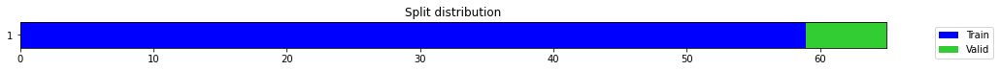

epoch,train_loss,valid_loss,mse,time
0,0.209755,0.025455,0.025455,00:00
1,0.223958,0.050955,0.050955,00:00
2,0.208237,0.039074,0.039074,00:00
3,0.205980,0.036719,0.036719,00:00
4,0.201850,0.060009,0.060009,00:00
5,0.194727,0.135992,0.135992,00:00
6,0.200357,0.045332,0.045332,00:00
7,0.195920,0.159781,0.159781,00:00
8,0.207218,0.245900,0.245900,00:00
9,0.202658,0.816477,0.816477,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.29074687759081524,
  "MSE_normalize": 0.08454478201585462,
  "RMSE_normalize": 0.2907658542811632,
  "MAPE_normalize": 0.3008313799829154,
  "MAE": 18754.336592117947,
  "MSE": 351771055.8416959,
  "RMSE": 18755.56066455215,
  "MAPE": 0.15899058157181936
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.0
2022-10-14 21:36:16.111040+07:00
PROGRESS: [ 604 / 1944 ]


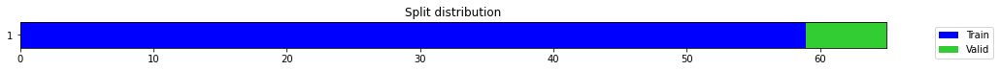

epoch,train_loss,valid_loss,mse,time
0,0.390762,0.827864,0.827864,00:00
1,0.392010,0.600322,0.600322,00:00
2,0.333690,0.340072,0.340072,00:00
3,0.294603,0.181637,0.181637,00:00
4,0.261173,0.061476,0.061476,00:00
5,0.267335,0.021976,0.021976,00:00
6,0.255177,0.021868,0.021868,00:00
7,0.256035,0.068028,0.068028,00:00
8,0.247023,0.234899,0.234899,00:00
9,0.251955,0.378900,0.378900,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.367825319369634,
  "MSE_normalize": 0.13532237079392395,
  "RMSE_normalize": 0.3678618909236508,
  "MAPE_normalize": 0.3804176937257109,
  "MAE": 23726.20440061887,
  "MSE": 563044721.6039097,
  "RMSE": 23728.56341213917,
  "MAPE": 0.2010935277735489
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:36:35.892904+07:00
PROGRESS: [ 605 / 1944 ]


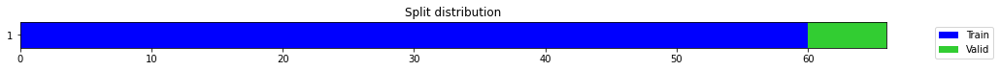

epoch,train_loss,valid_loss,mse,time
0,0.396766,0.688373,0.688373,00:00
1,0.324772,0.031363,0.031363,00:00
2,0.277690,0.062633,0.062633,00:00
3,0.244452,0.112264,0.112264,00:00
4,0.233177,0.023597,0.023597,00:00
5,0.219186,0.123117,0.123117,00:00
6,0.222393,0.201012,0.201012,00:00
7,0.215055,0.005752,0.005752,00:00
8,0.214710,0.004692,0.004692,00:00
9,0.214344,0.003888,0.003888,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.05936300754547119,
  "MSE_normalize": 0.0038882370648411304,
  "RMSE_normalize": 0.0623557300080845,
  "MAPE_normalize": 0.06185280404797892,
  "MAE": 3829.1514387130737,
  "MSE": 16178044.641542563,
  "RMSE": 4022.1940084414828,
  "MAPE": 0.03258215140442239
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:36:38.458218+07:00
PROGRESS: [ 606 / 1944 ]


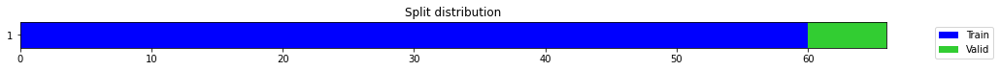

epoch,train_loss,valid_loss,mse,time
0,0.751954,1.406947,1.406947,00:00
1,0.601719,0.453930,0.453930,00:00
2,0.454181,0.034042,0.034042,00:00
3,0.415413,0.282306,0.282306,00:00
4,0.384642,0.011445,0.011445,00:00
5,0.361090,0.787314,0.787314,00:00
6,0.338382,0.197640,0.197640,00:00
7,0.318136,0.004203,0.004203,00:00
8,0.299115,0.293401,0.293401,00:00
9,0.281245,0.054379,0.054379,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5031262338161469,
  "MSE_normalize": 0.25314873403685006,
  "RMSE_normalize": 0.5031388814600299,
  "MAPE_normalize": 0.5204760350138441,
  "MAE": 32453.654586076736,
  "MSE": 1053292649.573948,
  "RMSE": 32454.47040969777,
  "MAPE": 0.2750988997012742
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:36:44.261343+07:00
PROGRESS: [ 607 / 1944 ]


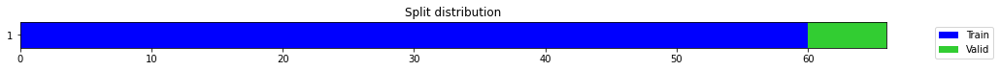

epoch,train_loss,valid_loss,mse,time
0,0.313171,0.740927,0.740927,00:00
1,0.297233,0.478097,0.478097,00:00
2,0.267514,0.189635,0.189635,00:00
3,0.255343,0.001462,0.001462,00:00
4,0.274994,0.015277,0.015277,00:00
5,0.254991,0.018708,0.018708,00:00
6,0.246983,0.160493,0.160493,00:00
7,0.246650,0.606680,0.606680,00:00
8,0.244398,0.324775,0.324775,00:00
9,0.234251,0.154922,0.154922,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6037773092587789,
  "MSE_normalize": 0.36465694481786376,
  "RMSE_normalize": 0.603868317448319,
  "MAPE_normalize": 0.6243857007858594,
  "MAE": 38946.051556428276,
  "MSE": 1517252223.4965546,
  "RMSE": 38951.921948686366,
  "MAPE": 0.3300734523857524
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:36:55.533246+07:00
PROGRESS: [ 608 / 1944 ]


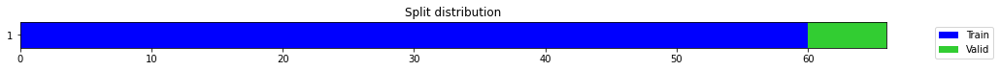

epoch,train_loss,valid_loss,mse,time
0,0.687166,1.611258,1.611258,00:00
1,0.666431,1.332431,1.332431,00:00
2,0.606096,1.056823,1.056823,00:00
3,0.537238,0.723791,0.723791,00:00
4,0.485215,0.366245,0.366245,00:00
5,0.422282,0.090954,0.090954,00:00
6,0.387453,0.004453,0.004453,00:00
7,0.373117,0.083926,0.083926,00:00
8,0.351443,0.112035,0.112035,00:00
9,0.342231,0.049452,0.049452,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4854452262322108,
  "MSE_normalize": 0.23571269580897244,
  "RMSE_normalize": 0.48550251884925627,
  "MAPE_normalize": 0.5020399317177726,
  "MAE": 31313.158872882526,
  "MSE": 980745374.2617182,
  "RMSE": 31316.854475852426,
  "MAPE": 0.26539058439932234
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:37:18.341842+07:00
PROGRESS: [ 609 / 1944 ]


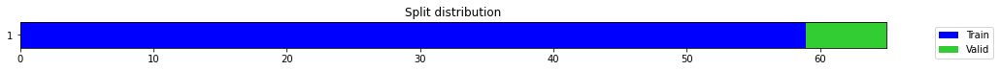

epoch,train_loss,valid_loss,mse,time
0,0.413789,0.216855,0.216855,00:00
1,0.312255,0.090691,0.090691,00:00
2,0.273695,0.024613,0.024613,00:00
3,0.258060,0.036846,0.036846,00:00
4,0.269523,0.028303,0.028303,00:00
5,0.242087,0.990655,0.990655,00:00
6,0.235085,0.900511,0.900511,00:00
7,0.246529,0.379014,0.379014,00:00
8,0.239861,0.219531,0.219531,00:00
9,0.228902,0.184983,0.184983,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4297698438167572,
  "MSE_normalize": 0.18498285509823317,
  "RMSE_normalize": 0.43009633234687455,
  "MAPE_normalize": 0.4442238513994959,
  "MAE": 27721.874005556107,
  "MSE": 769670377.035381,
  "RMSE": 27742.933821702798,
  "MAPE": 0.2348867545964066
}
Percent CPU Usage: 99.8
Percent Ram Usage: 26.1
2022-10-14 21:37:20.944163+07:00
PROGRESS: [ 610 / 1944 ]


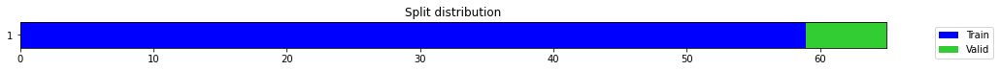

epoch,train_loss,valid_loss,mse,time
0,0.368627,0.416555,0.416555,00:00
1,0.365016,0.022714,0.022714,00:00
2,0.312808,0.089791,0.089791,00:00
3,0.294521,0.057678,0.057678,00:00
4,0.264287,0.235311,0.235311,00:00
5,0.246025,0.001285,0.001285,00:00
6,0.244661,0.132369,0.132369,00:00
7,0.235028,0.628828,0.628828,00:00
8,0.233790,0.539907,0.539907,00:00
9,0.232142,0.015198,0.015198,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22586122155189514,
  "MSE_normalize": 0.05102336758101522,
  "RMSE_normalize": 0.22588352658176564,
  "MAPE_normalize": 0.2336193308118443,
  "MAE": 14568.952234983444,
  "MSE": 212296293.85296428,
  "RMSE": 14570.390998630211,
  "MAPE": 0.12348765896865682
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:37:27.123486+07:00
PROGRESS: [ 611 / 1944 ]


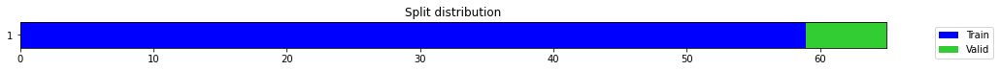

epoch,train_loss,valid_loss,mse,time
0,0.233709,0.011469,0.011469,00:00
1,0.235042,0.005383,0.005383,00:00
2,0.249379,0.003788,0.003788,00:00
3,0.239351,0.005807,0.005807,00:00
4,0.237411,0.029797,0.029797,00:00
5,0.226601,0.100014,0.100014,00:00
6,0.220498,0.047234,0.047234,00:00
7,0.203494,0.132053,0.132053,00:00
8,0.191842,0.699989,0.699989,00:00
9,0.195645,0.002196,0.002196,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.38185666998227435,
  "MSE_normalize": 0.14585558755514386,
  "RMSE_normalize": 0.3819104444174627,
  "MAPE_normalize": 0.39490237611775364,
  "MAE": 24631.282640536625,
  "MSE": 606870971.9431552,
  "RMSE": 24634.751306704016,
  "MAPE": 0.20875707871496219
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:37:39.531954+07:00
PROGRESS: [ 612 / 1944 ]


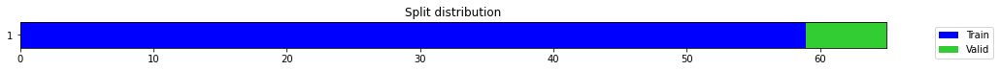

epoch,train_loss,valid_loss,mse,time
0,0.391197,0.206455,0.206455,00:00
1,0.318665,0.140100,0.140100,00:00
2,0.292530,0.057753,0.057753,00:00
3,0.272332,0.002995,0.002995,00:00
4,0.281656,0.007119,0.007119,00:00
5,0.283473,0.010941,0.010941,00:00
6,0.301282,0.011866,0.011866,00:00
7,0.272290,0.239579,0.239579,00:00
8,0.261009,0.693557,0.693557,00:00
9,0.259207,1.124100,1.124100,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4987078805764516,
  "MSE_normalize": 0.24880409509592707,
  "RMSE_normalize": 0.49880266147638697,
  "MAPE_normalize": 0.5157078543355939,
  "MAE": 32168.653128703434,
  "MSE": 1035215623.5167656,
  "RMSE": 32174.76687587286,
  "MAPE": 0.27262783330228285
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:38:01.528692+07:00
PROGRESS: [ 613 / 1944 ]


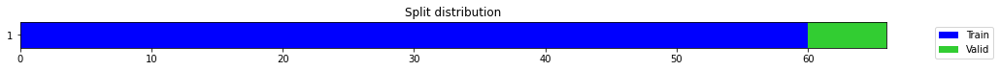

epoch,train_loss,valid_loss,mse,time
0,0.911048,0.294920,0.294920,00:00
1,0.612030,0.021711,0.021711,00:00
2,0.504152,0.079820,0.079820,00:00
3,0.446121,0.256149,0.256149,00:00
4,0.394078,0.885499,0.885499,00:00
5,0.371620,0.542412,0.542412,00:00
6,0.333700,0.094994,0.094994,00:00
7,0.307701,0.003247,0.003247,00:00
8,0.299450,0.011067,0.011067,00:00
9,0.291644,0.015381,0.015381,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12205712000528972,
  "MSE_normalize": 0.015380904953638938,
  "RMSE_normalize": 0.12401977646181651,
  "MAPE_normalize": 0.12576547947637864,
  "MAE": 7873.172468821208,
  "MSE": 63996346.626426935,
  "RMSE": 7999.771660893011,
  "MAPE": 0.06659849234020394
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:38:04.456975+07:00
PROGRESS: [ 614 / 1944 ]


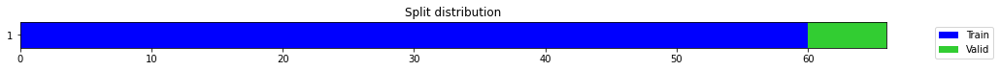

epoch,train_loss,valid_loss,mse,time
0,0.619230,0.448602,0.448602,00:00
1,0.486700,0.104709,0.104709,00:00
2,0.395314,0.004380,0.004380,00:00
3,0.361255,0.025467,0.025467,00:00
4,0.312516,0.047132,0.047132,00:00
5,0.284631,1.587450,1.587450,00:00
6,0.287792,0.421567,0.421567,00:00
7,0.259935,0.130230,0.130230,00:00
8,0.249541,0.550903,0.550903,00:00
9,0.240413,0.040349,0.040349,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3477070927619934,
  "MSE_normalize": 0.12092956010613302,
  "RMSE_normalize": 0.3477492776500521,
  "MAPE_normalize": 0.35959824227205034,
  "MAE": 22428.498311519623,
  "MSE": 503159604.0194276,
  "RMSE": 22431.21940553896,
  "MAPE": 0.1900912863130062
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:38:11.093311+07:00
PROGRESS: [ 615 / 1944 ]


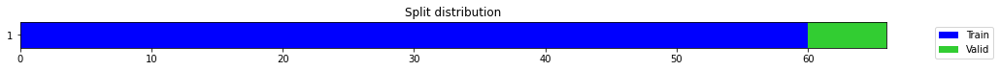

epoch,train_loss,valid_loss,mse,time
0,0.469750,0.490778,0.490778,00:00
1,0.386487,0.148067,0.148067,00:00
2,0.340667,0.004470,0.004470,00:00
3,0.293285,0.073659,0.073659,00:00
4,0.289701,0.044229,0.044229,00:00
5,0.284457,0.007769,0.007769,00:00
6,0.265530,0.035998,0.035998,00:00
7,0.246167,0.133677,0.133677,00:00
8,0.244367,0.281077,0.281077,00:00
9,0.244917,0.144603,0.144603,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4531664699316025,
  "MSE_normalize": 0.2054157150216341,
  "RMSE_normalize": 0.45322810484526893,
  "MAPE_normalize": 0.4686471749037438,
  "MAE": 29231.049976468086,
  "MSE": 854686726.2143558,
  "RMSE": 29235.02567493923,
  "MAPE": 0.24774106986402442
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:38:23.850762+07:00
PROGRESS: [ 616 / 1944 ]


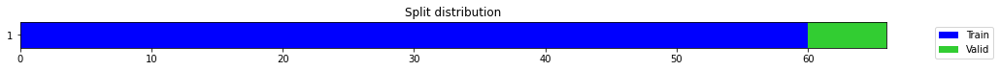

epoch,train_loss,valid_loss,mse,time
0,0.729096,1.591024,1.591024,00:00
1,0.652979,1.154979,1.154979,00:00
2,0.696701,0.725877,0.725877,00:00
3,0.613578,0.348924,0.348924,00:00
4,0.534190,0.088772,0.088772,00:00
5,0.478859,0.001127,0.001127,00:00
6,0.423312,0.085351,0.085351,00:00
7,0.394099,0.307234,0.307234,00:00
8,0.385550,0.358921,0.358921,00:00
9,0.400671,0.072406,0.072406,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4132000207901001,
  "MSE_normalize": 0.1707514112632064,
  "RMSE_normalize": 0.4132207778696594,
  "MAPE_normalize": 0.4275519658041949,
  "MAE": 26653.054141044617,
  "MSE": 710456669.1679889,
  "RMSE": 26654.393055704513,
  "MAPE": 0.22595790492461218
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.1
2022-10-14 21:38:49.760582+07:00
PROGRESS: [ 617 / 1944 ]


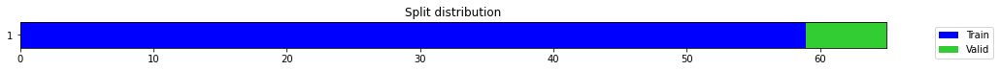

epoch,train_loss,valid_loss,mse,time
0,0.348517,0.003899,0.003899,00:00
1,0.324588,0.175813,0.175813,00:00
2,0.279468,0.003053,0.003053,00:00
3,0.289014,1.049175,1.049175,00:00
4,0.264784,0.007632,0.007632,00:00
5,0.258711,1.695488,1.695488,00:00
6,0.264921,2.757960,2.757960,00:00
7,0.250335,1.443329,1.443329,00:00
8,0.245815,0.878958,0.878958,00:00
9,0.238139,0.756696,0.756696,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.8685468727101883,
  "MSE_normalize": 0.7566962760848804,
  "RMSE_normalize": 0.8698829094107324,
  "MAPE_normalize": 0.8974175692943795,
  "MAE": 56024.747477297984,
  "MSE": 3148436149.967724,
  "RMSE": 56110.92718862988,
  "MAPE": 0.4746013228008383
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.2
2022-10-14 21:38:52.894906+07:00
PROGRESS: [ 618 / 1944 ]


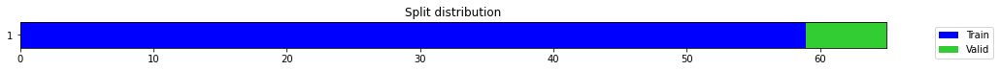

epoch,train_loss,valid_loss,mse,time
0,0.625571,0.910249,0.910249,00:00
1,0.571047,0.075585,0.075585,00:00
2,0.476931,0.083156,0.083156,00:00
3,0.410723,0.032265,0.032265,00:00
4,0.403098,0.022705,0.022705,00:00
5,0.382529,0.092728,0.092728,00:00
6,0.358239,0.177885,0.177885,00:00
7,0.339939,1.367423,1.367423,00:00
8,0.309651,1.660816,1.660816,00:00
9,0.312651,1.107847,1.107847,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5006321966648102,
  "MSE_normalize": 0.25122075181795783,
  "RMSE_normalize": 0.5012192652103048,
  "MAPE_normalize": 0.5173576467982149,
  "MAE": 32292.779213666916,
  "MSE": 1045270766.6781291,
  "RMSE": 32330.647483125496,
  "MAPE": 0.27358466277514276
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.2
2022-10-14 21:38:59.785840+07:00
PROGRESS: [ 619 / 1944 ]


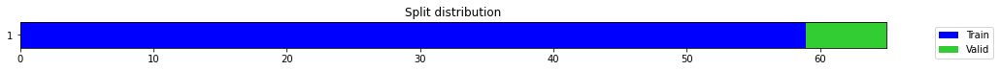

epoch,train_loss,valid_loss,mse,time
0,0.336279,0.055294,0.055294,00:00
1,0.324948,0.034392,0.034392,00:00
2,0.335851,0.002706,0.002706,00:00
3,0.310451,0.002324,0.002324,00:00
4,0.288423,0.011628,0.011628,00:00
5,0.267406,0.172744,0.172744,00:00
6,0.259184,0.415755,0.415755,00:00
7,0.246202,0.093183,0.093183,00:00
8,0.229522,0.000302,0.000302,00:00
9,0.227895,0.358219,0.358219,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4272632598876953,
  "MSE_normalize": 0.18268427576426186,
  "RMSE_normalize": 0.42741581131757617,
  "MAPE_normalize": 0.441755623148343,
  "MAE": 27560.1893157959,
  "MSE": 760106526.2575132,
  "RMSE": 27570.029493228933,
  "MAPE": 0.23355114155733003
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.3
2022-10-14 21:39:13.206461+07:00
PROGRESS: [ 620 / 1944 ]


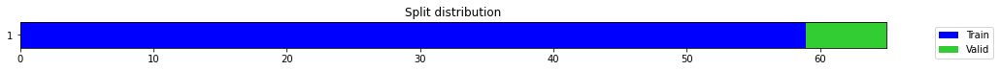

epoch,train_loss,valid_loss,mse,time
0,0.536938,0.420387,0.420387,00:00
1,0.440506,0.281339,0.281339,00:00
2,0.418241,0.147267,0.147267,00:00
3,0.412371,0.035369,0.035369,00:00
4,0.375711,0.001427,0.001427,00:00
5,0.340300,0.006309,0.006309,00:00
6,0.340011,0.002146,0.002146,00:00
7,0.319019,0.028741,0.028741,00:00
8,0.295894,0.121190,0.121190,00:00
9,0.295912,0.012634,0.012634,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.37838882207870483,
  "MSE_normalize": 0.1432779293905071,
  "RMSE_normalize": 0.3785207119703057,
  "MAPE_normalize": 0.3916754555698918,
  "MAE": 24407.592579364777,
  "MSE": 596145939.4508694,
  "RMSE": 24416.100004932596,
  "MAPE": 0.20696165659699692
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:39:41.046658+07:00
PROGRESS: [ 621 / 1944 ]


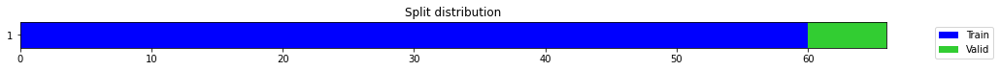

epoch,train_loss,valid_loss,mse,time
0,0.663393,0.243154,0.243154,00:00
1,0.459440,0.254536,0.254536,00:00
2,0.410809,0.446300,0.446300,00:00
3,0.352779,0.001716,0.001716,00:00
4,0.332686,0.142421,0.142421,00:00
5,0.303552,0.058108,0.058108,00:00
6,0.280527,0.656576,0.656576,00:00
7,0.277654,0.222671,0.222671,00:00
8,0.260414,0.051191,0.051191,00:00
9,0.250656,0.033489,0.033489,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18103299538294473,
  "MSE_normalize": 0.03348883596143182,
  "RMSE_normalize": 0.1829995518066419,
  "MAPE_normalize": 0.18666144049181488,
  "MAE": 11677.352334181467,
  "MSE": 139339210.58372417,
  "RMSE": 11804.203089735629,
  "MAPE": 0.09881355301082821
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:39:44.575939+07:00
PROGRESS: [ 622 / 1944 ]


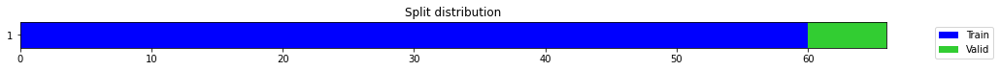

epoch,train_loss,valid_loss,mse,time
0,0.202114,0.278960,0.278960,00:00
1,0.234219,0.119717,0.119717,00:00
2,0.209847,0.004437,0.004437,00:00
3,0.206432,0.198979,0.198979,00:00
4,0.226867,0.008543,0.008543,00:00
5,0.249445,0.036304,0.036304,00:00
6,0.239018,0.117208,0.117208,00:00
7,0.227960,0.460386,0.460386,00:00
8,0.221402,0.419291,0.419291,00:00
9,0.217520,0.126528,0.126528,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09085738658905029,
  "MSE_normalize": 0.008642270029394439,
  "RMSE_normalize": 0.09296381032097618,
  "MAPE_normalize": 0.09444492188900329,
  "MAE": 5860.6648645401,
  "MSE": 35958463.4393997,
  "RMSE": 5996.5376209442475,
  "MAPE": 0.04980586104196286
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:39:59.272848+07:00
PROGRESS: [ 623 / 1944 ]


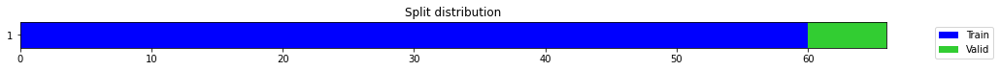

epoch,train_loss,valid_loss,mse,time
0,0.543069,0.211256,0.211256,00:00
1,0.433950,0.070750,0.070750,00:00
2,0.391418,0.000742,0.000742,00:00
3,0.358951,0.045080,0.045080,00:00
4,0.313476,0.036455,0.036455,00:00
5,0.313873,0.004116,0.004116,00:00
6,0.299007,0.011610,0.011610,00:00
7,0.276456,0.003887,0.003887,00:00
8,0.271082,0.024435,0.024435,00:00
9,0.264541,0.162305,0.162305,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3364345630009969,
  "MSE_normalize": 0.11323033281696127,
  "RMSE_normalize": 0.33649715127614566,
  "MAPE_normalize": 0.3479041001106262,
  "MAE": 21701.375051816303,
  "MSE": 471124920.765182,
  "RMSE": 21705.4122459165,
  "MAPE": 0.18391845824772665
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:40:28.683084+07:00
PROGRESS: [ 624 / 1944 ]


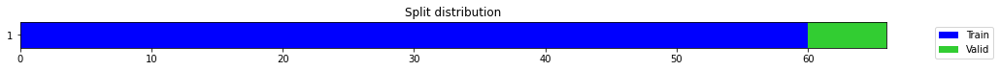

epoch,train_loss,valid_loss,mse,time
0,0.501133,1.048000,1.048000,00:00
1,0.427379,0.748315,0.748315,00:00
2,0.427009,0.489401,0.489401,00:00
3,0.401561,0.195026,0.195026,00:00
4,0.350977,0.047516,0.047516,00:00
5,0.312652,0.004544,0.004544,00:00
6,0.302484,0.101807,0.101807,00:00
7,0.310527,0.025664,0.025664,00:00
8,0.310041,0.038356,0.038356,00:00
9,0.292939,0.269620,0.269620,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.49363580346107483,
  "MSE_normalize": 0.24369645624112182,
  "RMSE_normalize": 0.49365621260257814,
  "MAPE_normalize": 0.5107743616827173,
  "MAE": 31841.48386645317,
  "MSE": 1013963933.3476909,
  "RMSE": 31842.800337716704,
  "MAPE": 0.26994204780996517
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:41:26.181129+07:00
PROGRESS: [ 625 / 1944 ]


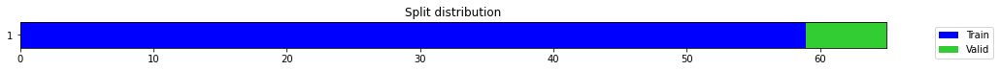

epoch,train_loss,valid_loss,mse,time
0,0.493214,0.006558,0.006558,00:00
1,0.402402,0.226450,0.226450,00:00
2,0.375701,0.056020,0.056020,00:00
3,0.361599,0.051909,0.051909,00:00
4,0.341200,0.552092,0.552092,00:00
5,0.311194,0.290827,0.290827,00:00
6,0.286922,0.196210,0.196210,00:00
7,0.273321,0.218887,0.218887,00:00
8,0.267659,0.105808,0.105808,00:00
9,0.258357,0.114912,0.114912,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.33893368641535443,
  "MSE_normalize": 0.11491242701795083,
  "RMSE_normalize": 0.3389873552478777,
  "MAPE_normalize": 0.35051100606473823,
  "MAE": 21862.578508536022,
  "MSE": 478123721.15237,
  "RMSE": 21866.0403629091,
  "MAPE": 0.185290917443706
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.4
2022-10-14 21:41:34.946901+07:00
PROGRESS: [ 626 / 1944 ]


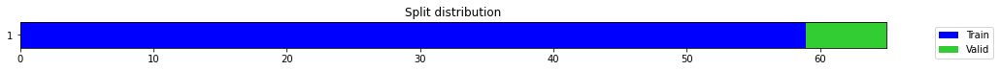

epoch,train_loss,valid_loss,mse,time
0,0.476717,0.514897,0.514897,00:00
1,0.341006,0.000572,0.000572,00:00
2,0.338390,0.002829,0.002829,00:00
3,0.284206,0.015503,0.015503,00:00
4,0.293297,0.437656,0.437656,00:00
5,0.286564,0.400300,0.400300,00:00
6,0.279187,1.066985,1.066985,00:00
7,0.271007,4.066093,4.066093,00:00
8,0.264413,0.144480,0.144480,00:00
9,0.256664,0.388629,0.388629,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6034205009539922,
  "MSE_normalize": 0.36430889964550256,
  "RMSE_normalize": 0.6035800689597881,
  "MAPE_normalize": 0.6239376100098059,
  "MAE": 38923.035993536316,
  "MSE": 1515804088.9713614,
  "RMSE": 38933.32876818217,
  "MAPE": 0.3298562833619986
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.6
2022-10-14 21:41:55.079599+07:00
PROGRESS: [ 627 / 1944 ]


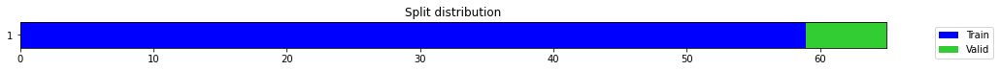

epoch,train_loss,valid_loss,mse,time
0,0.345091,0.003849,0.003849,00:00
1,0.308788,0.081295,0.081295,00:00
2,0.279140,0.045842,0.045842,00:00
3,0.263956,0.026183,0.026183,00:00
4,0.267808,0.744451,0.744451,00:00
5,0.251711,0.561711,0.561711,00:00
6,0.239570,0.010371,0.010371,00:00
7,0.230561,0.117328,0.117328,00:00
8,0.225472,0.961429,0.961429,00:00
9,0.232965,0.703608,0.703608,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.49554618696371716,
  "MSE_normalize": 0.2455917357350894,
  "RMSE_normalize": 0.49557212969969305,
  "MAPE_normalize": 0.5125549422774213,
  "MAE": 31964.71124390761,
  "MSE": 1021849747.8570127,
  "RMSE": 31966.384654149002,
  "MAPE": 0.27093198490025416
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.6
2022-10-14 21:42:15.158223+07:00
PROGRESS: [ 628 / 1944 ]


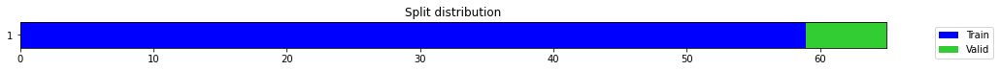

epoch,train_loss,valid_loss,mse,time
0,0.593070,0.903743,0.903743,00:00
1,0.520645,0.346724,0.346724,00:00
2,0.439178,0.040596,0.040596,00:00
3,0.380991,0.034250,0.034250,00:00
4,0.382643,0.102786,0.102786,00:00
5,0.355674,0.000584,0.000584,00:00
6,0.331226,0.281481,0.281481,00:00
7,0.331599,0.594175,0.594175,00:00
8,0.320526,0.240715,0.240715,00:00
9,0.316164,0.008666,0.008666,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.539496640364329,
  "MSE_normalize": 0.2912125505435368,
  "RMSE_normalize": 0.5396411312562607,
  "MAPE_normalize": 0.5578385938303972,
  "MAE": 34799.69129006068,
  "MSE": 1211667283.7342303,
  "RMSE": 34809.01153055384,
  "MAPE": 0.29491223744849293
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.8
2022-10-14 21:42:54.893162+07:00
PROGRESS: [ 629 / 1944 ]


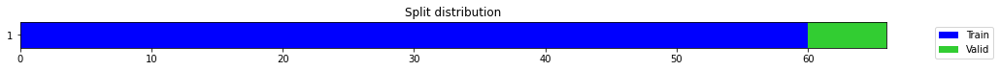

epoch,train_loss,valid_loss,mse,time
0,0.505578,0.000925,0.000925,00:00
1,0.457619,0.060086,0.060086,00:00
2,0.389385,0.031410,0.031410,00:00
3,0.361479,0.024639,0.024639,00:00
4,0.327933,0.026566,0.026566,00:00
5,0.306709,0.028380,0.028380,00:00
6,0.285864,0.032166,0.032166,00:00
7,0.275903,0.038260,0.038260,00:00
8,0.261711,0.070430,0.070430,00:00
9,0.258454,0.071161,0.071161,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.26667412122090656,
  "MSE_normalize": 0.07116125530800825,
  "RMSE_normalize": 0.26676067046700913,
  "MAPE_normalize": 0.2760217093447863,
  "MAE": 17201.547515233357,
  "MSE": 296085332.7414603,
  "RMSE": 17207.130287803957,
  "MAPE": 0.1458541799289311
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.9
2022-10-14 21:43:00.212027+07:00
PROGRESS: [ 630 / 1944 ]


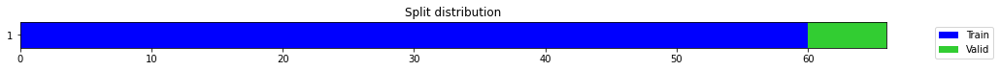

epoch,train_loss,valid_loss,mse,time
0,0.374892,0.233365,0.233365,00:00
1,0.261740,0.164094,0.164094,00:00
2,0.247943,0.571732,0.571732,00:00
3,0.314279,0.172364,0.172364,00:00
4,0.287166,0.813179,0.813179,00:00
5,0.292109,0.130871,0.130871,00:00
6,0.261167,0.162870,0.162870,00:00
7,0.241904,0.189498,0.189498,00:00
8,0.267008,0.092220,0.092220,00:00
9,0.274221,0.322305,0.322305,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.600071003039678,
  "MSE_normalize": 0.3606489857054876,
  "RMSE_normalize": 0.6005405779008506,
  "MAPE_normalize": 0.6202401034235552,
  "MAE": 38706.97998007139,
  "MSE": 1500576043.4282627,
  "RMSE": 38737.26943691647,
  "MAPE": 0.32795992089529835
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.8
2022-10-14 21:43:12.972243+07:00
PROGRESS: [ 631 / 1944 ]


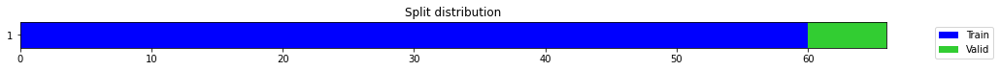

epoch,train_loss,valid_loss,mse,time
0,0.489375,0.401915,0.401915,00:00
1,0.353877,0.044659,0.044659,00:00
2,0.300758,0.116918,0.116918,00:00
3,0.290920,0.001194,0.001194,00:00
4,0.289155,0.073944,0.073944,00:00
5,0.271547,0.220208,0.220208,00:00
6,0.267672,0.519367,0.519367,00:00
7,0.250431,0.056256,0.056256,00:00
8,0.243176,0.525680,0.525680,00:00
9,0.242599,0.036524,0.036524,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5461836208899816,
  "MSE_normalize": 0.298510679672699,
  "RMSE_normalize": 0.546361308725919,
  "MAPE_normalize": 0.5647217696255014,
  "MAE": 35231.028281887375,
  "MSE": 1242033091.395228,
  "RMSE": 35242.48985805668,
  "MAPE": 0.29855890718096884
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.9
2022-10-14 21:43:37.337752+07:00
PROGRESS: [ 632 / 1944 ]


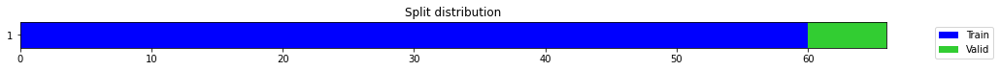

epoch,train_loss,valid_loss,mse,time
0,0.440257,0.552533,0.552533,00:00
1,0.430605,0.182036,0.182036,00:00
2,0.345837,0.011676,0.011676,00:00
3,0.334126,0.021885,0.021885,00:00
4,0.300642,0.030099,0.030099,00:00
5,0.292518,0.021829,0.021829,00:00
6,0.289021,0.040010,0.040010,00:00
7,0.285714,0.011983,0.011983,00:00
8,0.266149,0.258342,0.258342,00:00
9,0.261781,0.786395,0.786395,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6409018288056055,
  "MSE_normalize": 0.4107891899882383,
  "RMSE_normalize": 0.640928381325276,
  "MAPE_normalize": 0.6629059686972043,
  "MAE": 41340.73156527678,
  "MSE": 1709197701.4432294,
  "RMSE": 41342.4443090056,
  "MAPE": 0.35040461861001976
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.0
2022-10-14 21:44:25.565157+07:00
PROGRESS: [ 633 / 1944 ]


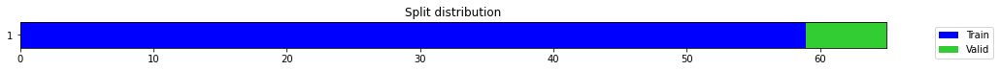

epoch,train_loss,valid_loss,mse,time
0,0.595129,0.495460,0.495460,00:00
1,0.442963,0.013462,0.013462,00:00
2,0.422099,1.649189,1.649189,00:00
3,0.372033,0.002597,0.002597,00:00
4,0.356617,0.001538,0.001538,00:00
5,0.371238,0.156285,0.156285,00:00
6,0.338571,0.169547,0.169547,00:00
7,0.325357,0.279625,0.279625,00:00
8,0.303249,0.219513,0.219513,00:00
9,0.292336,0.224215,0.224215,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.47344901661078137,
  "MSE_normalize": 0.22421484409985704,
  "RMSE_normalize": 0.4735132987571279,
  "MAPE_normalize": 0.48962832826934427,
  "MAE": 30539.35536746184,
  "MSE": 932905503.6134232,
  "RMSE": 30543.501823029776,
  "MAPE": 0.2588308726476729
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.9
2022-10-14 21:44:34.371801+07:00
PROGRESS: [ 634 / 1944 ]


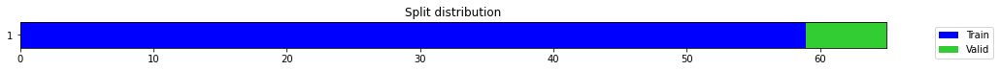

epoch,train_loss,valid_loss,mse,time
0,0.602467,0.277226,0.277226,00:00
1,0.452206,0.002783,0.002783,00:00
2,0.373665,0.054904,0.054904,00:00
3,0.335259,0.046945,0.046945,00:00
4,0.318346,0.045221,0.045221,00:00
5,0.318908,2.787707,2.787707,00:00
6,0.297848,0.255352,0.255352,00:00
7,0.286910,0.144694,0.144694,00:00
8,0.274984,1.890347,1.890347,00:00
9,0.266467,0.300648,0.300648,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5169492661952972,
  "MSE_normalize": 0.2674817152729589,
  "RMSE_normalize": 0.5171863448245312,
  "MAPE_normalize": 0.5344373481727488,
  "MAE": 33345.29546666145,
  "MSE": 1112928830.8091156,
  "RMSE": 33360.587986561564,
  "MAPE": 0.28256246353015463
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.9
2022-10-14 21:44:53.836050+07:00
PROGRESS: [ 635 / 1944 ]


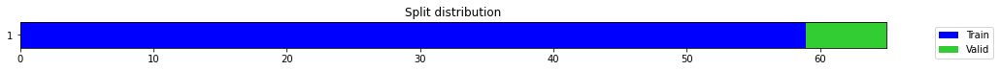

epoch,train_loss,valid_loss,mse,time
0,0.381162,0.111623,0.111623,00:00
1,0.356806,0.039712,0.039712,00:00
2,0.347454,0.040227,0.040227,00:00
3,0.315975,0.065989,0.065989,00:00
4,0.319872,0.009913,0.009913,00:00
5,0.312175,0.000450,0.000450,00:00
6,0.289605,1.360924,1.360924,00:00
7,0.277770,0.421229,0.421229,00:00
8,0.262137,0.234934,0.234934,00:00
9,0.249252,0.067591,0.067591,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6205205768346786,
  "MSE_normalize": 0.38556614123235083,
  "RMSE_normalize": 0.6209397243149699,
  "MAPE_normalize": 0.641417792570964,
  "MAE": 40026.05928814411,
  "MSE": 1604250497.3598216,
  "RMSE": 40053.09597721282,
  "MAPE": 0.3391477014024102
}
Percent CPU Usage: 100.0
Percent Ram Usage: 26.9
2022-10-14 21:45:30.294741+07:00
PROGRESS: [ 636 / 1944 ]


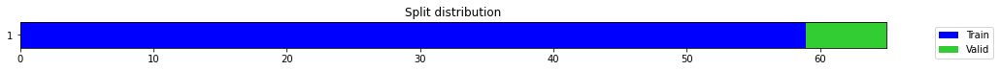

epoch,train_loss,valid_loss,mse,time
0,0.443671,0.238967,0.238967,00:00
1,0.419868,0.027665,0.027665,00:00
2,0.364918,0.050413,0.050413,00:00
3,0.337000,0.223035,0.223035,00:00
4,0.310424,0.232749,0.232749,00:00
5,0.305550,0.005783,0.005783,00:00
6,0.292850,0.108695,0.108695,00:00
7,0.290563,0.151111,0.151111,00:00
8,0.278673,0.020327,0.020327,00:00
9,0.281065,0.016590,0.016590,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.44547844926516217,
  "MSE_normalize": 0.19846378684755125,
  "RMSE_normalize": 0.4454927461222587,
  "MAPE_normalize": 0.4609147431613401,
  "MAE": 28735.14189140002,
  "MSE": 825761379.721959,
  "RMSE": 28736.064095870177,
  "MAPE": 0.2435990408998976
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.0
2022-10-14 21:46:40.434415+07:00
PROGRESS: [ 637 / 1944 ]


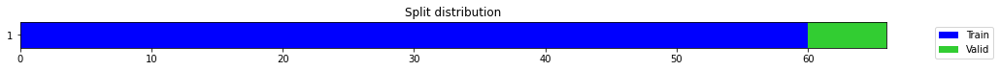

epoch,train_loss,valid_loss,mse,time
0,0.396912,0.028169,0.028169,00:00
1,0.315576,0.002417,0.002417,00:00
2,0.274621,0.022738,0.022738,00:00
3,0.258070,0.485466,0.485466,00:00
4,0.254448,1.089175,1.089175,00:00
5,0.242027,0.030755,0.030755,00:00
6,0.229050,0.867022,0.867022,00:00
7,0.228355,0.180107,0.180107,00:00
8,0.213936,0.012330,0.012330,00:00
9,0.218635,0.000376,0.000376,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.017595956722895306,
  "MSE_normalize": 0.0003762440129246869,
  "RMSE_normalize": 0.01939701041203739,
  "MAPE_normalize": 0.01817786654815651,
  "MAE": 1135.0095924536388,
  "MSE": 1565463.302700502,
  "RMSE": 1251.1847596180598,
  "MAPE": 0.009613710517184078
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.0
2022-10-14 21:46:48.409431+07:00
PROGRESS: [ 638 / 1944 ]


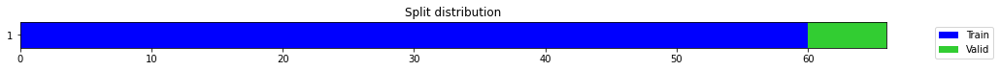

epoch,train_loss,valid_loss,mse,time
0,0.661245,0.211374,0.211374,00:00
1,0.494271,0.166473,0.166473,00:00
2,0.417754,0.459308,0.459308,00:00
3,0.416751,0.027362,0.027362,00:00
4,0.365078,0.004624,0.004624,00:00
5,0.352379,0.012368,0.012368,00:00
6,0.338386,0.206633,0.206633,00:00
7,0.328580,0.046406,0.046406,00:00
8,0.324008,0.010710,0.010710,00:00
9,0.324985,0.155650,0.155650,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5878903766473135,
  "MSE_normalize": 0.34594560260832036,
  "RMSE_normalize": 0.588171405806437,
  "MAPE_normalize": 0.6077694612357101,
  "MAE": 37921.28085525831,
  "MSE": 1439398706.7173405,
  "RMSE": 37939.40836013841,
  "MAPE": 0.32133608513304607
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.2
2022-10-14 21:47:07.437202+07:00
PROGRESS: [ 639 / 1944 ]


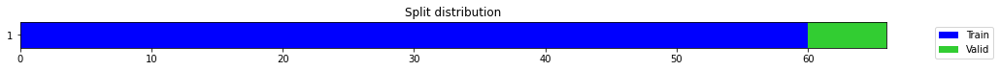

epoch,train_loss,valid_loss,mse,time
0,0.193024,0.136540,0.136540,00:00
1,0.213055,0.013243,0.013243,00:00
2,0.210384,0.022186,0.022186,00:00
3,0.230639,0.342839,0.342839,00:00
4,0.209343,0.102866,0.102866,00:00
5,0.209142,0.007742,0.007742,00:00
6,0.209291,0.138711,0.138711,00:00
7,0.205052,0.202492,0.202492,00:00
8,0.197149,0.066564,0.066564,00:00
9,0.211041,2.223501,2.223501,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03292424480120341,
  "MSE_normalize": 0.001658588201117676,
  "RMSE_normalize": 0.04072576826921349,
  "MAPE_normalize": 0.033591460244736686,
  "MAE": 2123.7454866568246,
  "MSE": 6900997.4217489995,
  "RMSE": 2626.9749564373465,
  "MAPE": 0.01787087388036754
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.4
2022-10-14 21:47:43.970331+07:00
PROGRESS: [ 640 / 1944 ]


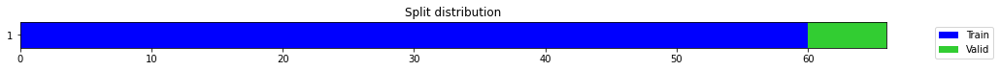

epoch,train_loss,valid_loss,mse,time
0,0.454627,0.404755,0.404755,00:00
1,0.345510,0.016250,0.016250,00:00
2,0.347973,0.041036,0.041036,00:00
3,0.300940,0.123924,0.123924,00:00
4,0.302990,0.019068,0.019068,00:00
5,0.288058,0.101569,0.101569,00:00
6,0.278224,0.275755,0.275755,00:00
7,0.258964,0.225631,0.225631,00:00
8,0.254590,0.399823,0.399823,00:00
9,0.254669,0.567660,0.567660,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5078274756669998,
  "MSE_normalize": 0.2578977277346894,
  "RMSE_normalize": 0.5078363198262698,
  "MAPE_normalize": 0.5253112781327444,
  "MAE": 32756.903490424156,
  "MSE": 1073052101.1621162,
  "RMSE": 32757.473974073706,
  "MAPE": 0.2776615250180388
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.4
2022-10-14 21:48:54.294463+07:00
PROGRESS: [ 641 / 1944 ]


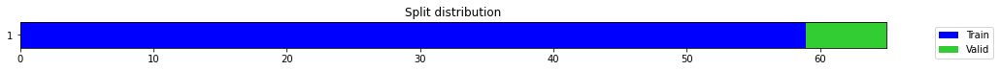

epoch,train_loss,valid_loss,mse,time
0,0.244646,0.442286,0.442286,00:00
1,0.305833,0.352650,0.352650,00:00
2,0.319388,0.475255,0.475255,00:00
3,0.305309,2.995319,2.995319,00:00
4,0.287768,0.081028,0.081028,00:00
5,0.282941,0.197538,0.197538,00:00
6,0.281020,0.020815,0.020815,00:00
7,0.272305,0.168278,0.168278,00:00
8,0.267385,0.008543,0.008543,00:00
9,0.260285,0.001082,0.001082,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03175098697344462,
  "MSE_normalize": 0.0010815865218389102,
  "RMSE_normalize": 0.032887482753152605,
  "MAPE_normalize": 0.03302855591028208,
  "MAE": 2048.0656637350717,
  "MSE": 4500228.44343098,
  "RMSE": 2121.374187509356,
  "MAPE": 0.01741176945200128
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.4
2022-10-14 21:49:01.084908+07:00
PROGRESS: [ 642 / 1944 ]


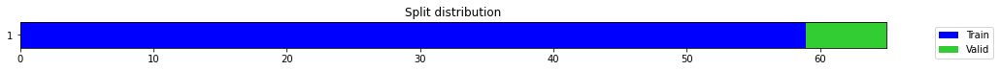

epoch,train_loss,valid_loss,mse,time
0,0.613953,0.301130,0.301130,00:00
1,0.532373,0.285854,0.285854,00:00
2,0.433725,0.063687,0.063687,00:00
3,0.387695,0.002716,0.002716,00:00
4,0.374820,0.208800,0.208800,00:00
5,0.339476,0.077903,0.077903,00:00
6,0.312027,0.705868,0.705868,00:00
7,0.299473,0.905179,0.905179,00:00
8,0.280135,0.087983,0.087983,00:00
9,0.280061,3.078568,3.078568,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.14330443739891052,
  "MSE_normalize": 0.02062771598491686,
  "RMSE_normalize": 0.1436235216979338,
  "MAPE_normalize": 0.14846144300054767,
  "MAE": 9243.709429979324,
  "MSE": 85827099.65774204,
  "RMSE": 9264.291643603521,
  "MAPE": 0.07841597733636896
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.4
2022-10-14 21:49:17.161116+07:00
PROGRESS: [ 643 / 1944 ]


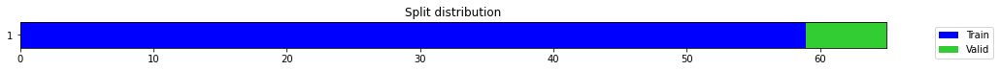

epoch,train_loss,valid_loss,mse,time
0,0.267617,0.289088,0.289088,00:00
1,0.278641,0.019826,0.019826,00:00
2,0.287800,0.001757,0.001757,00:00
3,0.250602,0.020647,0.020647,00:00
4,0.276309,0.307567,0.307567,00:00
5,0.290273,0.256828,0.256828,00:00
6,0.271306,0.074809,0.074809,00:00
7,0.260781,1.333477,1.333477,00:00
8,0.250508,0.091283,0.091283,00:00
9,0.250444,1.350814,1.350814,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3350619872411092,
  "MSE_normalize": 0.11229502228693633,
  "RMSE_normalize": 0.3351044945788348,
  "MAPE_normalize": 0.346736882561505,
  "MAE": 21612.838425000507,
  "MSE": 467233312.49744725,
  "RMSE": 21615.58031831316,
  "MAPE": 0.18323854358307967
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.4
2022-10-14 21:49:47.245641+07:00
PROGRESS: [ 644 / 1944 ]


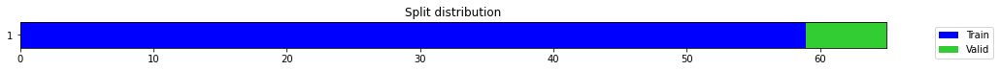

epoch,train_loss,valid_loss,mse,time
0,0.832994,0.955101,0.955101,00:00
1,0.832936,0.250649,0.250649,00:00
2,0.743481,0.008851,0.008851,00:00
3,0.665610,0.024841,0.024841,00:00
4,0.602402,0.061354,0.061354,00:00
5,0.545556,0.000816,0.000816,00:00
6,0.499655,0.106297,0.106297,00:00
7,0.449871,0.274553,0.274553,00:00
8,0.437994,0.042889,0.042889,00:00
9,0.446347,0.074189,0.074189,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5137958824634552,
  "MSE_normalize": 0.2639933899475467,
  "RMSE_normalize": 0.5138028707077712,
  "MAPE_normalize": 0.5315203653565806,
  "MAE": 33141.889602422714,
  "MSE": 1098414725.3423884,
  "RMSE": 33142.34037213408,
  "MAPE": 0.28093468387320564
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.5
2022-10-14 21:50:44.807071+07:00
PROGRESS: [ 645 / 1944 ]


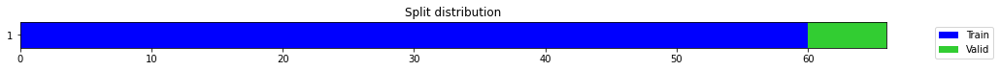

epoch,train_loss,valid_loss,mse,time
0,0.743254,0.000694,0.000694,00:00
1,0.555524,0.004509,0.004509,00:00
2,0.421173,0.967405,0.967405,00:00
3,0.381485,0.002199,0.002199,00:00
4,0.343281,0.611512,0.611512,00:00
5,0.321357,0.013978,0.013978,00:00
6,0.314673,0.069075,0.069075,00:00
7,0.295428,0.456837,0.456837,00:00
8,0.268052,0.517831,0.517831,00:00
9,0.248486,0.475792,0.475792,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6874754627545675,
  "MSE_normalize": 0.47579175043558425,
  "RMSE_normalize": 0.6897765945837712,
  "MAPE_normalize": 0.7099110830028127,
  "MAE": 44344.91724952062,
  "MSE": 1979658145.9055321,
  "RMSE": 44493.349457031574,
  "MAPE": 0.37554217946976715
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.5
2022-10-14 21:50:52.032746+07:00
PROGRESS: [ 646 / 1944 ]


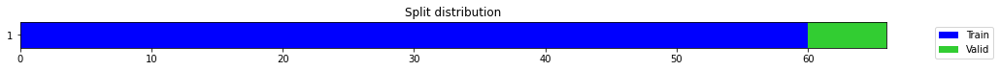

epoch,train_loss,valid_loss,mse,time
0,0.459874,0.256003,0.256003,00:00
1,0.335082,0.004651,0.004651,00:00
2,0.305884,0.038271,0.038271,00:00
3,0.306212,0.117972,0.117972,00:00
4,0.292585,9.698436,9.698436,00:00
5,0.336700,3.939848,3.939848,00:00
6,0.386308,0.617047,0.617047,00:00
7,0.388026,1.162906,1.162906,00:00
8,0.388938,1.121013,1.121013,00:00
9,0.370496,4.057922,4.057922,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.25048771500587463,
  "MSE_normalize": 0.0629784024147965,
  "RMSE_normalize": 0.2509549808527348,
  "MAPE_normalize": 0.25948875523997833,
  "MAE": 16157.459568738937,
  "MSE": 262038396.50945762,
  "RMSE": 16187.600084924807,
  "MAPE": 0.1370628431649676
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.5
2022-10-14 21:51:08.627353+07:00
PROGRESS: [ 647 / 1944 ]


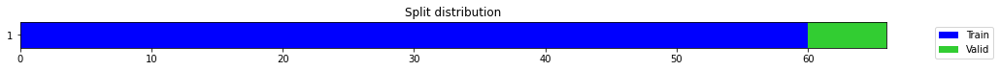

epoch,train_loss,valid_loss,mse,time
0,0.495263,0.239440,0.239440,00:00
1,0.381845,0.001589,0.001589,00:01
2,0.323489,0.004467,0.004467,00:00
3,0.335257,0.256123,0.256123,00:00
4,0.311957,0.172302,0.172302,00:01
5,0.284532,0.276818,0.276818,00:00
6,0.267671,0.283465,0.283465,00:01
7,0.251433,0.172038,0.172038,00:00
8,0.238106,0.599205,0.599205,00:00
9,0.244218,0.095435,0.095435,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3934120138486226,
  "MSE_normalize": 0.15481988428602259,
  "RMSE_normalize": 0.3934715800232878,
  "MAPE_normalize": 0.40684425150298975,
  "MAE": 25376.648541291554,
  "MSE": 644169313.1383352,
  "RMSE": 25380.490797822156,
  "MAPE": 0.21507197138972067
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.5
2022-10-14 21:51:59.790002+07:00
PROGRESS: [ 648 / 1944 ]


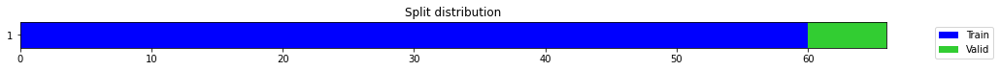

epoch,train_loss,valid_loss,mse,time
0,0.446391,0.357306,0.357306,00:00
1,0.417019,0.051753,0.051753,00:00
2,0.360080,0.003317,0.003317,00:00
3,0.304422,0.117340,0.117340,00:00
4,0.275970,0.070972,0.070972,00:00
5,0.264924,0.014706,0.014706,00:01
6,0.297625,0.036347,0.036347,00:00
7,0.283378,0.014772,0.014772,00:00
8,0.276470,0.222521,0.222521,00:00
9,0.276575,0.058632,0.058632,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 2,
  "dropout": 0.4,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.41639986634254456,
  "MSE_normalize": 0.1734058950179674,
  "RMSE_normalize": 0.41642033453947397,
  "MAPE_normalize": 0.43086367972544637,
  "MAE": 26859.456978559494,
  "MSE": 721501354.9648224,
  "RMSE": 26860.777259134225,
  "MAPE": 0.22770790254073994
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:53:36.153615+07:00
PROGRESS: [ 649 / 1944 ]


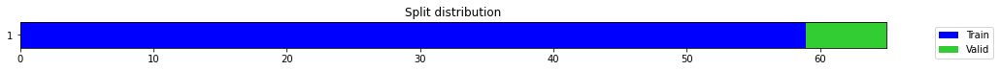

epoch,train_loss,valid_loss,mse,time
0,0.368239,0.199427,0.199427,00:00
1,0.383175,0.093825,0.093825,00:00
2,0.290724,0.087614,0.087614,00:00
3,0.236554,0.191563,0.191563,00:00
4,0.197343,0.509829,0.509829,00:00
5,0.172624,0.571413,0.571413,00:00
6,0.156253,0.467378,0.467378,00:00
7,0.140324,0.313369,0.313369,00:00
8,0.131953,0.279690,0.279690,00:00
9,0.120357,0.243874,0.243874,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4935329854488373,
  "MSE_normalize": 0.24387372110996886,
  "RMSE_normalize": 0.4938357227965276,
  "MAPE_normalize": 0.5101750696947446,
  "MAE": 31834.8516933918,
  "MSE": 1014701490.9898204,
  "RMSE": 31854.379463267218,
  "MAPE": 0.26974819247794835
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:53:38.389093+07:00
PROGRESS: [ 650 / 1944 ]


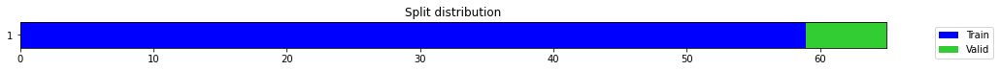

epoch,train_loss,valid_loss,mse,time
0,0.194220,0.394985,0.394985,00:00
1,0.191544,0.111554,0.111554,00:00
2,0.167285,0.021953,0.021953,00:00
3,0.156940,0.256950,0.256950,00:00
4,0.136160,0.143050,0.143050,00:00
5,0.122048,0.714045,0.714045,00:00
6,0.114706,0.035578,0.035578,00:00
7,0.103527,0.113706,0.113706,00:00
8,0.097563,0.005015,0.005015,00:00
9,0.098124,0.003953,0.003953,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0735942820707957,
  "MSE_normalize": 0.005428922426339374,
  "RMSE_normalize": 0.07368122166698496,
  "MAPE_normalize": 0.07618921813546475,
  "MAE": 4747.125570694606,
  "MSE": 22588475.93501313,
  "RMSE": 4752.733522407198,
  "MAPE": 0.040255792314023604
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:53:43.160291+07:00
PROGRESS: [ 651 / 1944 ]


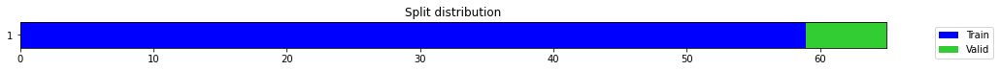

epoch,train_loss,valid_loss,mse,time
0,0.253028,0.336354,0.336354,00:00
1,0.218996,0.120306,0.120306,00:00
2,0.181987,0.006952,0.006952,00:00
3,0.170172,0.047107,0.047107,00:00
4,0.161457,0.035334,0.035334,00:00
5,0.149746,0.077348,0.077348,00:00
6,0.131753,0.666772,0.666772,00:00
7,0.125598,0.621355,0.621355,00:00
8,0.118045,0.011291,0.011291,00:00
9,0.111014,0.026062,0.026062,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.19544566671053568,
  "MSE_normalize": 0.03821003045172174,
  "RMSE_normalize": 0.19547386130048627,
  "MAPE_normalize": 0.20214747531632424,
  "MAE": 12607.027285496393,
  "MSE": 158982996.17384893,
  "RMSE": 12608.845949326565,
  "MAPE": 0.1068549436740107
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:53:52.859758+07:00
PROGRESS: [ 652 / 1944 ]


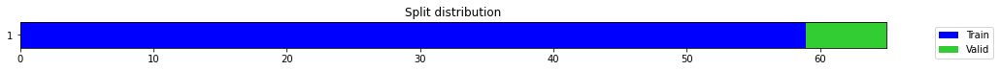

epoch,train_loss,valid_loss,mse,time
0,0.496759,0.926782,0.926782,00:00
1,0.437244,0.611919,0.611919,00:00
2,0.395574,0.331850,0.331850,00:00
3,0.353823,0.111199,0.111199,00:00
4,0.329643,0.008682,0.008682,00:00
5,0.306196,0.026490,0.026490,00:00
6,0.287007,0.086326,0.086326,00:00
7,0.264884,0.081604,0.081604,00:00
8,0.237612,0.016998,0.016998,00:00
9,0.219809,0.021288,0.021288,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09484312931696574,
  "MSE_normalize": 0.009011231173663722,
  "RMSE_normalize": 0.09492750483218086,
  "MAPE_normalize": 0.09817945965094499,
  "MAE": 6117.761213461558,
  "MSE": 37493624.42969981,
  "RMSE": 6123.203771694994,
  "MAPE": 0.051876638236973575
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:11.245446+07:00
PROGRESS: [ 653 / 1944 ]


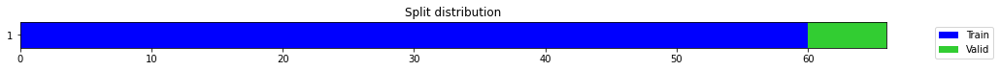

epoch,train_loss,valid_loss,mse,time
0,0.191549,0.460472,0.460472,00:00
1,0.143280,0.273882,0.273882,00:00
2,0.120460,0.006111,0.006111,00:00
3,0.106349,0.584238,0.584238,00:00
4,0.097273,0.173554,0.173554,00:00
5,0.088361,0.107440,0.107440,00:00
6,0.080936,0.021788,0.021788,00:00
7,0.076500,0.138054,0.138054,00:00
8,0.070376,0.135289,0.135289,00:00
9,0.065967,0.125171,0.125171,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3535865048567454,
  "MSE_normalize": 0.12517083725847242,
  "RMSE_normalize": 0.35379490846883654,
  "MAPE_normalize": 0.3655362713979719,
  "MAE": 22807.743909279507,
  "MSE": 520806565.85931873,
  "RMSE": 22821.186775873834,
  "MAPE": 0.19326587278891152
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:13.464426+07:00
PROGRESS: [ 654 / 1944 ]


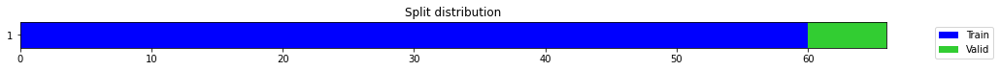

epoch,train_loss,valid_loss,mse,time
0,0.420351,0.527289,0.527289,00:00
1,0.341402,0.122260,0.122260,00:00
2,0.252570,0.118150,0.118150,00:00
3,0.213165,0.674832,0.674832,00:00
4,0.191075,0.000829,0.000829,00:00
5,0.171820,0.136069,0.136069,00:00
6,0.158492,0.200520,0.200520,00:00
7,0.157446,0.221927,0.221927,00:00
8,0.142351,0.403427,0.403427,00:00
9,0.129330,0.904169,0.904169,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.05200320482254028,
  "MSE_normalize": 0.0028936975863220007,
  "RMSE_normalize": 0.05379309980213076,
  "MAPE_normalize": 0.05348457412361021,
  "MAE": 3354.4147238731384,
  "MSE": 12039998.57774981,
  "RMSE": 3469.870109636643,
  "MAPE": 0.02834716274371123
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:18.716970+07:00
PROGRESS: [ 655 / 1944 ]


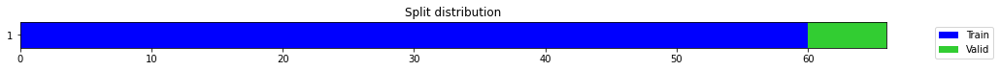

epoch,train_loss,valid_loss,mse,time
0,0.575771,1.814069,1.814069,00:00
1,0.474065,1.216768,1.216768,00:00
2,0.396630,0.633197,0.633197,00:00
3,0.314920,0.097302,0.097302,00:00
4,0.260752,0.116746,0.116746,00:00
5,0.241115,0.827903,0.827903,00:00
6,0.228133,0.733967,0.733967,00:00
7,0.212970,0.028631,0.028631,00:00
8,0.190829,0.132768,0.132768,00:00
9,0.174536,0.019315,0.019315,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.008080055316289267,
  "MSE_normalize": 7.618988630812377e-05,
  "RMSE_normalize": 0.008728681819617655,
  "MAPE_normalize": 0.008309969356138197,
  "MAE": 521.1958881219228,
  "MSE": 317008.28971374506,
  "RMSE": 563.0348920926172,
  "MAPE": 0.004404388026563418
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:28.455850+07:00
PROGRESS: [ 656 / 1944 ]


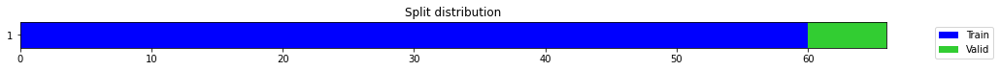

epoch,train_loss,valid_loss,mse,time
0,0.282951,0.528312,0.528312,00:00
1,0.233903,0.322557,0.322557,00:00
2,0.180420,0.108418,0.108418,00:00
3,0.153400,0.004092,0.004092,00:00
4,0.143638,0.033680,0.033680,00:00
5,0.133463,0.062300,0.062300,00:00
6,0.125806,0.033121,0.033121,00:00
7,0.124202,0.002858,0.002858,00:00
8,0.120667,0.019120,0.019120,00:00
9,0.112877,0.064523,0.064523,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03795131047566732,
  "MSE_normalize": 0.0014546580916992013,
  "RMSE_normalize": 0.03813998022678042,
  "MAPE_normalize": 0.03930715601817974,
  "MAE": 2448.011330922445,
  "MSE": 6052491.9528414495,
  "RMSE": 2460.1812845482445,
  "MAPE": 0.020764153614275017
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:47.823853+07:00
PROGRESS: [ 657 / 1944 ]


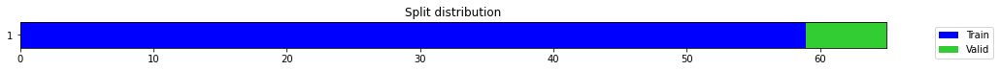

epoch,train_loss,valid_loss,mse,time
0,0.248387,0.061858,0.061858,00:00
1,0.185181,0.009299,0.009299,00:00
2,0.158083,0.378473,0.378473,00:00
3,0.140801,0.182510,0.182510,00:00
4,0.127053,0.003805,0.003805,00:00
5,0.109379,0.230697,0.230697,00:00
6,0.099454,0.117824,0.117824,00:00
7,0.088732,0.052732,0.052732,00:00
8,0.083118,0.080072,0.080072,00:00
9,0.076021,0.069252,0.069252,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2630335291226705,
  "MSE_normalize": 0.06925208649060484,
  "RMSE_normalize": 0.2631579117005697,
  "MAPE_normalize": 0.27193257658789954,
  "MAE": 16966.714762528736,
  "MSE": 288141728.0072014,
  "RMSE": 16974.73793633355,
  "MAPE": 0.1437733724292448
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:50.163418+07:00
PROGRESS: [ 658 / 1944 ]


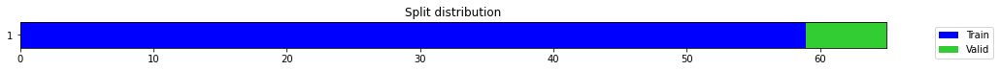

epoch,train_loss,valid_loss,mse,time
0,0.416026,1.067651,1.067651,00:00
1,0.369840,0.355389,0.355389,00:00
2,0.293000,0.045353,0.045353,00:00
3,0.251397,0.138737,0.138737,00:00
4,0.219413,0.158301,0.158301,00:00
5,0.193946,0.092811,0.092811,00:00
6,0.173525,0.065404,0.065404,00:00
7,0.152880,0.270585,0.270585,00:00
8,0.136886,0.144405,0.144405,00:00
9,0.126013,0.061308,0.061308,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06935649116834004,
  "MSE_normalize": 0.004872462569341114,
  "RMSE_normalize": 0.06980302693537806,
  "MAPE_normalize": 0.07158488374614884,
  "MAE": 4473.771106322606,
  "MSE": 20273176.672746554,
  "RMSE": 4502.574449439627,
  "MAPE": 0.0378770578897328
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:54:55.904923+07:00
PROGRESS: [ 659 / 1944 ]


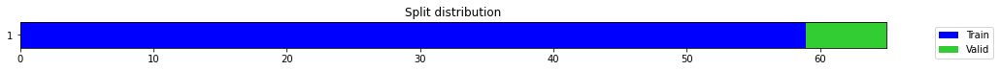

epoch,train_loss,valid_loss,mse,time
0,0.324829,0.450049,0.450049,00:00
1,0.238081,0.109603,0.109603,00:00
2,0.196332,0.020705,0.020705,00:00
3,0.179180,0.188562,0.188562,00:00
4,0.159701,0.206382,0.206382,00:00
5,0.148032,0.000615,0.000615,00:00
6,0.134261,0.153588,0.153588,00:00
7,0.123972,0.103786,0.103786,00:00
8,0.112971,0.085605,0.085605,00:00
9,0.103775,0.030213,0.030213,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08859184384346008,
  "MSE_normalize": 0.007943022158296861,
  "RMSE_normalize": 0.08912363411742623,
  "MAPE_normalize": 0.09186246160732416,
  "MAE": 5714.528295278549,
  "MSE": 33049056.66057655,
  "RMSE": 5748.830895110461,
  "MAPE": 0.048500415458899576
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:55:07.097414+07:00
PROGRESS: [ 660 / 1944 ]


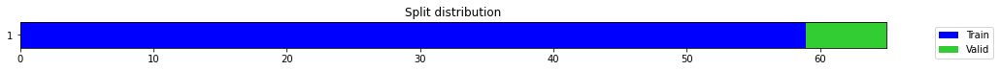

epoch,train_loss,valid_loss,mse,time
0,0.245639,0.292013,0.292013,00:00
1,0.213854,0.166935,0.166935,00:00
2,0.201140,0.044806,0.044806,00:00
3,0.173913,0.001359,0.001359,00:00
4,0.159595,0.092334,0.092334,00:00
5,0.157211,0.173609,0.173609,00:00
6,0.144797,0.060362,0.060362,00:00
7,0.135004,0.014374,0.014374,00:00
8,0.125067,0.200399,0.200399,00:00
9,0.122814,0.202945,0.202945,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06096908450126648,
  "MSE_normalize": 0.0038115614728659133,
  "RMSE_normalize": 0.061737844737777436,
  "MAPE_normalize": 0.06328479950931902,
  "MAE": 3932.749826669693,
  "MSE": 15859015.444195399,
  "RMSE": 3982.337936965596,
  "MAPE": 0.033396173742948614
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:55:27.026053+07:00
PROGRESS: [ 661 / 1944 ]


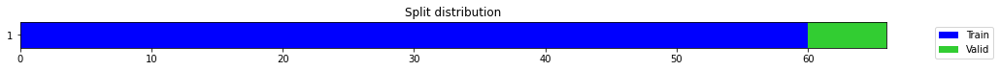

epoch,train_loss,valid_loss,mse,time
0,0.343497,0.276879,0.276879,00:00
1,0.219317,0.084410,0.084410,00:00
2,0.179902,0.034497,0.034497,00:00
3,0.150627,0.210957,0.210957,00:00
4,0.138783,0.114320,0.114320,00:00
5,0.126901,0.078692,0.078692,00:00
6,0.111890,0.209374,0.209374,00:00
7,0.100156,0.191607,0.191607,00:00
8,0.091343,0.115480,0.115480,00:00
9,0.081697,0.091418,0.091418,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3023267090320587,
  "MSE_normalize": 0.09141756177569309,
  "RMSE_normalize": 0.3023533723570701,
  "MAPE_normalize": 0.31270246715428757,
  "MAE": 19501.282039403915,
  "MSE": 380367084.3018844,
  "RMSE": 19503.00193052045,
  "MAPE": 0.16529197475727211
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:55:29.392241+07:00
PROGRESS: [ 662 / 1944 ]


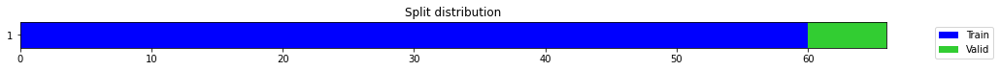

epoch,train_loss,valid_loss,mse,time
0,0.176363,0.336192,0.336192,00:00
1,0.131078,0.022695,0.022695,00:00
2,0.114629,0.381135,0.381135,00:00
3,0.108278,0.142802,0.142802,00:00
4,0.101317,0.190006,0.190006,00:00
5,0.090343,0.064162,0.064162,00:00
6,0.082522,0.090906,0.090906,00:00
7,0.073288,0.014432,0.014432,00:00
8,0.067316,0.056235,0.056235,00:00
9,0.063592,0.007506,0.007506,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.025356560945510864,
  "MSE_normalize": 0.0006567391521811553,
  "RMSE_normalize": 0.025626922409473115,
  "MAPE_normalize": 0.02630677548812491,
  "MAE": 1635.5996072292328,
  "MSE": 2732537.945772004,
  "RMSE": 1653.0390031006539,
  "MAPE": 0.01388554476821483
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:55:35.133034+07:00
PROGRESS: [ 663 / 1944 ]


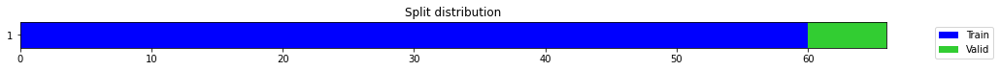

epoch,train_loss,valid_loss,mse,time
0,0.240657,0.213085,0.213085,00:00
1,0.202186,0.025411,0.025411,00:00
2,0.161282,0.053497,0.053497,00:00
3,0.131391,0.394169,0.394169,00:00
4,0.132482,0.606165,0.606165,00:00
5,0.121243,0.488018,0.488018,00:00
6,0.115952,0.004515,0.004515,00:00
7,0.108480,0.399822,0.399822,00:00
8,0.103463,0.014133,0.014133,00:00
9,0.100244,0.191915,0.191915,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03770936528841654,
  "MSE_normalize": 0.0014470732317750645,
  "RMSE_normalize": 0.03804041576764198,
  "MAPE_normalize": 0.03911657275722439,
  "MAE": 2432.4048985640206,
  "MSE": 6020933.12543298,
  "RMSE": 2453.758978675978,
  "MAPE": 0.020648553415527588
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:55:46.357370+07:00
PROGRESS: [ 664 / 1944 ]


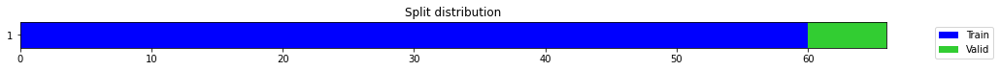

epoch,train_loss,valid_loss,mse,time
0,0.446788,0.612386,0.612386,00:00
1,0.393288,0.445909,0.445909,00:00
2,0.334906,0.243158,0.243158,00:00
3,0.272885,0.043477,0.043477,00:00
4,0.222420,0.020751,0.020751,00:00
5,0.192660,0.166691,0.166691,00:00
6,0.181155,0.326947,0.326947,00:00
7,0.171488,0.216219,0.216219,00:00
8,0.160363,0.059822,0.059822,00:00
9,0.145996,0.000127,0.000127,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0050272345542907715,
  "MSE_normalize": 3.1141476383093426e-05,
  "RMSE_normalize": 0.005580454854498281,
  "MAPE_normalize": 0.0052063763763436155,
  "MAE": 324.2767376899719,
  "MSE": 129572.39662284173,
  "RMSE": 359.9616599345571,
  "MAPE": 0.002750337480340554
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.7
2022-10-14 21:56:08.175297+07:00
PROGRESS: [ 665 / 1944 ]


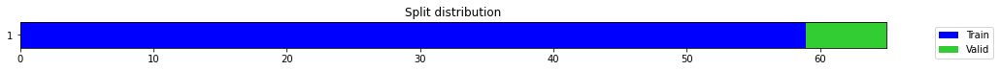

epoch,train_loss,valid_loss,mse,time
0,0.156367,0.011355,0.011355,00:00
1,0.125876,0.074232,0.074232,00:00
2,0.113629,0.193089,0.193089,00:00
3,0.124683,0.009002,0.009002,00:00
4,0.117517,1.370578,1.370578,00:00
5,0.109497,0.461402,0.461402,00:00
6,0.097025,1.063681,1.063681,00:00
7,0.089678,1.208518,1.208518,00:00
8,0.081938,0.945504,0.945504,00:00
9,0.075268,0.651450,0.651450,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.8057778365910053,
  "MSE_normalize": 0.6514500950755411,
  "RMSE_normalize": 0.8071245846060824,
  "MAPE_normalize": 0.8325169692458753,
  "MAE": 51975.89357146621,
  "MSE": 2710531416.71028,
  "RMSE": 52062.764205430736,
  "MAPE": 0.4402897976515514
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:56:10.789023+07:00
PROGRESS: [ 666 / 1944 ]


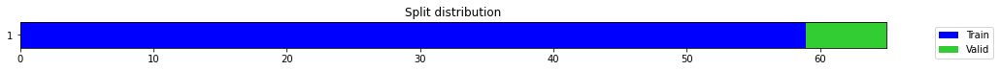

epoch,train_loss,valid_loss,mse,time
0,0.363106,1.440060,1.440060,00:00
1,0.277277,0.199759,0.199759,00:00
2,0.229619,0.001665,0.001665,00:00
3,0.191160,0.464927,0.464927,00:00
4,0.172070,0.128469,0.128469,00:00
5,0.146168,0.074194,0.074194,00:00
6,0.125925,0.017993,0.017993,00:00
7,0.111853,0.007561,0.007561,00:00
8,0.102614,0.138993,0.138993,00:00
9,0.091738,0.007974,0.007974,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1789764662583669,
  "MSE_normalize": 0.03206136491678121,
  "RMSE_normalize": 0.17905687620636412,
  "MAPE_normalize": 0.18525917781638088,
  "MAE": 11544.6979795297,
  "MSE": 133399837.5723179,
  "RMSE": 11549.884742815311,
  "MAPE": 0.09789152607764513
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:56:17.045709+07:00
PROGRESS: [ 667 / 1944 ]


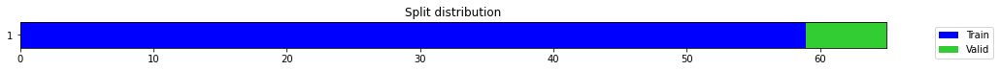

epoch,train_loss,valid_loss,mse,time
0,0.659401,2.897615,2.897615,00:00
1,0.554355,1.573203,1.573203,00:00
2,0.507281,0.294509,0.294509,00:00
3,0.441462,0.084723,0.084723,00:00
4,0.393741,0.450113,0.450113,00:00
5,0.348757,0.102775,0.102775,00:00
6,0.300143,0.014697,0.014697,00:00
7,0.266043,0.167588,0.167588,00:00
8,0.240993,0.013122,0.013122,00:00
9,0.216588,0.159199,0.159199,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08856935302416484,
  "MSE_normalize": 0.00789205582894148,
  "RMSE_normalize": 0.08883724347896821,
  "MAPE_normalize": 0.09176585107752074,
  "MAE": 5713.077547470729,
  "MSE": 32836997.68943442,
  "RMSE": 5730.357553367366,
  "MAPE": 0.04846758134319993
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:56:29.343305+07:00
PROGRESS: [ 668 / 1944 ]


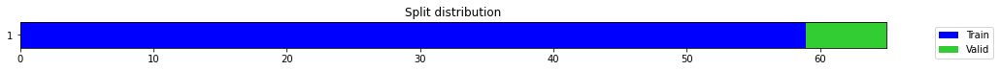

epoch,train_loss,valid_loss,mse,time
0,0.602762,1.535168,1.535168,00:00
1,0.542018,0.765597,0.765597,00:00
2,0.455501,0.280038,0.280038,00:00
3,0.412687,0.041150,0.041150,00:00
4,0.369596,0.008782,0.008782,00:00
5,0.332123,0.131741,0.131741,00:00
6,0.298370,0.251037,0.251037,00:00
7,0.270012,0.228673,0.228673,00:00
8,0.240342,0.076490,0.076490,00:00
9,0.213207,0.006130,0.006130,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08208702007929485,
  "MSE_normalize": 0.006746799962793186,
  "RMSE_normalize": 0.08213890651081975,
  "MAPE_normalize": 0.08491482585201175,
  "MAE": 5294.941143194835,
  "MSE": 28071856.00193995,
  "RMSE": 5298.2880255739165,
  "MAPE": 0.044882639455135966
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:56:53.565823+07:00
PROGRESS: [ 669 / 1944 ]


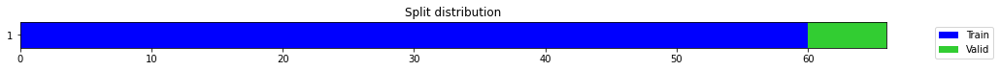

epoch,train_loss,valid_loss,mse,time
0,0.438103,0.518372,0.518372,00:00
1,0.270060,0.112943,0.112943,00:00
2,0.227356,0.041349,0.041349,00:00
3,0.179388,0.211820,0.211820,00:00
4,0.152885,0.000109,0.000109,00:00
5,0.131997,0.584174,0.584174,00:00
6,0.116373,0.281312,0.281312,00:00
7,0.102614,0.050994,0.050994,00:00
8,0.091032,0.006614,0.006614,00:00
9,0.082411,0.002774,0.002774,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05000575383504232,
  "MSE_normalize": 0.0027735353915214014,
  "RMSE_normalize": 0.05266436548104801,
  "MAPE_normalize": 0.05136200875567331,
  "MAE": 3225.57114537557,
  "MSE": 11540031.801215502,
  "RMSE": 3397.062230989521,
  "MAPE": 0.02723927322156992
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:56:56.616186+07:00
PROGRESS: [ 670 / 1944 ]


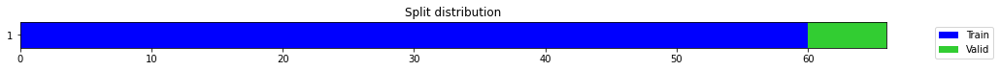

epoch,train_loss,valid_loss,mse,time
0,0.417912,0.913979,0.913979,00:00
1,0.295813,0.075657,0.075657,00:00
2,0.221382,0.049673,0.049673,00:00
3,0.209511,0.000799,0.000799,00:00
4,0.180268,0.084290,0.084290,00:00
5,0.160665,0.020543,0.020543,00:00
6,0.144014,0.000392,0.000392,00:00
7,0.128878,0.752903,0.752903,00:00
8,0.116763,0.438419,0.438419,00:00
9,0.106759,0.027070,0.027070,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09689295291900635,
  "MSE_normalize": 0.009406188558171399,
  "RMSE_normalize": 0.09698550694908697,
  "MAPE_normalize": 0.10017302090493206,
  "MAE": 6249.983035087585,
  "MSE": 39136949.69292759,
  "RMSE": 6255.953140243906,
  "MAPE": 0.052962015194572165
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:57:03.760268+07:00
PROGRESS: [ 671 / 1944 ]


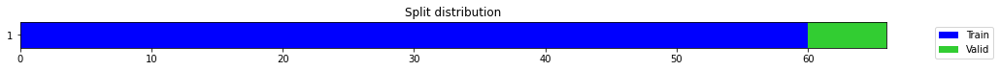

epoch,train_loss,valid_loss,mse,time
0,0.376516,0.547169,0.547169,00:00
1,0.277605,0.115179,0.115179,00:00
2,0.200240,0.013301,0.013301,00:00
3,0.174809,0.099186,0.099186,00:00
4,0.168388,0.035254,0.035254,00:00
5,0.159856,0.024408,0.024408,00:00
6,0.145207,0.121267,0.121267,00:00
7,0.132524,0.022788,0.022788,00:00
8,0.119047,0.243012,0.243012,00:00
9,0.108785,0.105531,0.105531,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.007956395546595255,
  "MSE_normalize": 8.313742513207008e-05,
  "RMSE_normalize": 0.009117972643744336,
  "MAPE_normalize": 0.008218231163569139,
  "MAE": 513.2193383375803,
  "MSE": 345915.3731472615,
  "RMSE": 588.1457074120847,
  "MAPE": 0.004346992311458748
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:57:18.071021+07:00
PROGRESS: [ 672 / 1944 ]


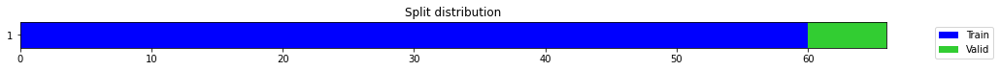

epoch,train_loss,valid_loss,mse,time
0,0.349128,1.317359,1.317359,00:00
1,0.270836,0.765510,0.765510,00:00
2,0.214825,0.278057,0.278057,00:00
3,0.180608,0.014971,0.014971,00:00
4,0.158597,0.029831,0.029831,00:00
5,0.143858,0.104998,0.104998,00:00
6,0.149670,0.134891,0.134891,00:00
7,0.138237,0.072667,0.072667,00:00
8,0.127605,0.007708,0.007708,00:00
9,0.118026,0.015609,0.015609,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03806565205256144,
  "MSE_normalize": 0.0015299247257717734,
  "RMSE_normalize": 0.0391142522077538,
  "MAPE_normalize": 0.03918250396143676,
  "MAE": 2455.386819998423,
  "MSE": 6365658.806029313,
  "RMSE": 2523.025724408951,
  "MAPE": 0.02075877835843971
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.8
2022-10-14 21:57:46.351947+07:00
PROGRESS: [ 673 / 1944 ]


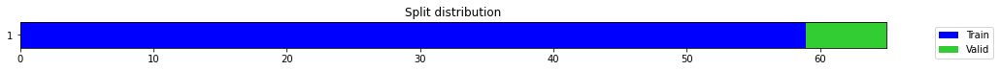

epoch,train_loss,valid_loss,mse,time
0,0.406909,0.181135,0.181135,00:00
1,0.344865,0.283565,0.283565,00:00
2,0.276873,0.045340,0.045340,00:00
3,0.236457,0.249811,0.249811,00:00
4,0.195220,0.929405,0.929405,00:00
5,0.167204,0.069382,0.069382,00:00
6,0.146478,0.026308,0.026308,00:00
7,0.138372,0.095919,0.095919,00:00
8,0.128466,0.508206,0.508206,00:00
9,0.120964,0.515070,0.515070,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.7171882291634878,
  "MSE_normalize": 0.5150697045746778,
  "RMSE_normalize": 0.7176835685555841,
  "MAPE_normalize": 0.7413350291058146,
  "MAE": 46261.50953396162,
  "MSE": 2143084522.6654794,
  "RMSE": 46293.4609061094,
  "MAPE": 0.39198004975461603
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.9
2022-10-14 21:57:49.365327+07:00
PROGRESS: [ 674 / 1944 ]


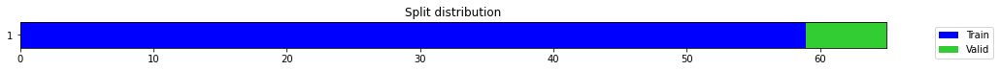

epoch,train_loss,valid_loss,mse,time
0,0.524709,0.851577,0.851577,00:00
1,0.384717,0.007097,0.007097,00:00
2,0.319225,0.186166,0.186166,00:00
3,0.255634,0.173800,0.173800,00:00
4,0.228700,0.174290,0.174290,00:00
5,0.204876,1.166942,1.166942,00:00
6,0.178760,0.547013,0.547013,00:00
7,0.163596,0.033418,0.033418,00:00
8,0.154353,0.200521,0.200521,00:00
9,0.140349,0.167080,0.167080,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.26053330302238464,
  "MSE_normalize": 0.06805716314199906,
  "RMSE_normalize": 0.2608776785046951,
  "MAPE_normalize": 0.2692180457380236,
  "MAE": 16805.4401781559,
  "MSE": 283169931.5465974,
  "RMSE": 16827.65377426685,
  "MAPE": 0.14237047863290722
}
Percent CPU Usage: 100.0
Percent Ram Usage: 27.9
2022-10-14 21:57:56.037976+07:00
PROGRESS: [ 675 / 1944 ]


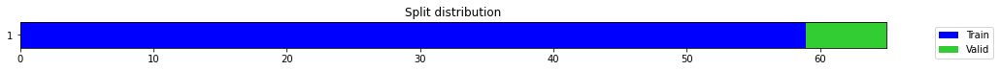

epoch,train_loss,valid_loss,mse,time
0,0.319643,0.499587,0.499587,00:00
1,0.256637,0.413881,0.413881,00:00
2,0.229677,0.388839,0.388839,00:00
3,0.193872,0.019067,0.019067,00:00
4,0.173257,0.006354,0.006354,00:00
5,0.155517,0.092090,0.092090,00:00
6,0.149746,1.813581,1.813581,00:00
7,0.137586,1.582696,1.582696,00:00
8,0.129214,0.699931,0.699931,00:00
9,0.119579,0.122461,0.122461,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.17924927671750387,
  "MSE_normalize": 0.03216419390599216,
  "RMSE_normalize": 0.17934378691773004,
  "MAPE_normalize": 0.18531291746121611,
  "MAE": 11562.29534538587,
  "MSE": 133827684.93608648,
  "RMSE": 11568.39163134126,
  "MAPE": 0.09797687081832225
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:58:09.082017+07:00
PROGRESS: [ 676 / 1944 ]


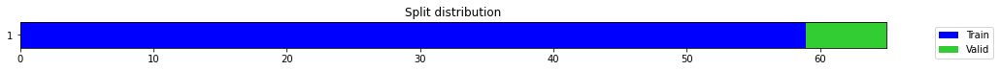

epoch,train_loss,valid_loss,mse,time
0,0.135544,0.035592,0.035592,00:00
1,0.126657,0.002787,0.002787,00:00
2,0.131864,0.054465,0.054465,00:00
3,0.117225,0.018895,0.018895,00:00
4,0.106985,0.002295,0.002295,00:00
5,0.105678,0.008224,0.008224,00:00
6,0.101687,0.052786,0.052786,00:00
7,0.098911,1.132142,1.132142,00:00
8,0.096201,0.884699,0.884699,00:00
9,0.090987,0.105594,0.105594,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06280662616093953,
  "MSE_normalize": 0.003952171035728942,
  "RMSE_normalize": 0.06286629491014196,
  "MAPE_normalize": 0.06496167374781556,
  "MAE": 4051.278613885244,
  "MSE": 16444058.934880508,
  "RMSE": 4055.127486883798,
  "MAPE": 0.03433831687365275
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 21:58:35.651801+07:00
PROGRESS: [ 677 / 1944 ]


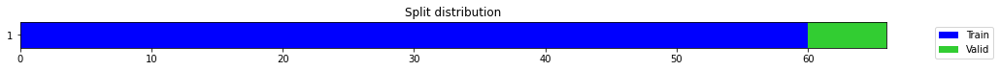

epoch,train_loss,valid_loss,mse,time
0,0.195500,0.236303,0.236303,00:00
1,0.158518,0.012104,0.012104,00:00
2,0.135540,0.043698,0.043698,00:00
3,0.151010,0.006231,0.006231,00:00
4,0.140650,0.369356,0.369356,00:00
5,0.135568,0.224700,0.224700,00:00
6,0.129709,0.662711,0.662711,00:00
7,0.117687,0.002989,0.002989,00:00
8,0.109174,0.026329,0.026329,00:00
9,0.099990,0.040066,0.040066,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.19946069518725076,
  "MSE_normalize": 0.0400663006232751,
  "RMSE_normalize": 0.2001656829311036,
  "MAPE_normalize": 0.2067271544479877,
  "MAE": 12866.012682358423,
  "MSE": 166706502.02016267,
  "RMSE": 12911.487211787908,
  "MAPE": 0.10916930879454156
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 21:58:39.337050+07:00
PROGRESS: [ 678 / 1944 ]


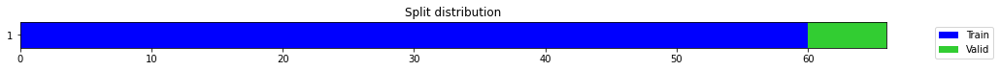

epoch,train_loss,valid_loss,mse,time
0,0.490400,0.879267,0.879267,00:00
1,0.342970,0.000678,0.000678,00:00
2,0.245633,1.307331,1.307331,00:00
3,0.217888,0.112723,0.112723,00:00
4,0.186853,0.921109,0.921109,00:00
5,0.162966,0.003899,0.003899,00:00
6,0.153827,0.679829,0.679829,00:00
7,0.138725,0.130240,0.130240,00:00
8,0.123289,0.078043,0.078043,00:00
9,0.113418,0.785551,0.785551,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.25590114792188007,
  "MSE_normalize": 0.06551620777940965,
  "RMSE_normalize": 0.2559613404000879,
  "MAPE_normalize": 0.2646211187309239,
  "MAE": 16506.647645552952,
  "MSE": 272597610.82576257,
  "RMSE": 16510.53030116727,
  "MAPE": 0.13989224146464688
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:58:47.166727+07:00
PROGRESS: [ 679 / 1944 ]


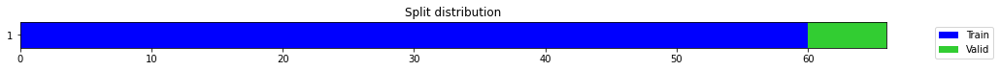

epoch,train_loss,valid_loss,mse,time
0,0.208831,0.362999,0.362999,00:00
1,0.159276,0.177990,0.177990,00:00
2,0.137936,0.006843,0.006843,00:00
3,0.136992,0.003340,0.003340,00:00
4,0.134515,0.423907,0.423907,00:00
5,0.127414,0.029844,0.029844,00:00
6,0.122866,0.102367,0.102367,00:00
7,0.116722,0.075556,0.075556,00:00
8,0.112035,0.136092,0.136092,00:00
9,0.104015,0.112585,0.112585,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.15837028622627258,
  "MSE_normalize": 0.02508764155924048,
  "RMSE_normalize": 0.15839078748222854,
  "MAPE_normalize": 0.16378714786254148,
  "MAE": 10215.516942739487,
  "MSE": 104383806.42127705,
  "RMSE": 10216.83935575367,
  "MAPE": 0.08658116883375105
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:59:02.437293+07:00
PROGRESS: [ 680 / 1944 ]


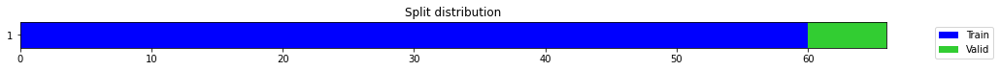

epoch,train_loss,valid_loss,mse,time
0,0.550069,0.609253,0.609253,00:00
1,0.437262,0.277186,0.277186,00:00
2,0.341022,0.030168,0.030168,00:00
3,0.261378,0.066659,0.066659,00:00
4,0.217997,0.388908,0.388908,00:00
5,0.212529,0.727384,0.727384,00:00
6,0.212431,0.467664,0.467664,00:00
7,0.192235,0.070664,0.070664,00:00
8,0.171132,0.039860,0.039860,00:00
9,0.157505,0.168701,0.168701,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06872783104578654,
  "MSE_normalize": 0.004758672358620449,
  "RMSE_normalize": 0.06898313097142264,
  "MAPE_normalize": 0.07123051816660875,
  "MAE": 4433.220013777415,
  "MSE": 19799722.23102653,
  "RMSE": 4449.687880180646,
  "MAPE": 0.0376159683645945
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:59:32.956985+07:00
PROGRESS: [ 681 / 1944 ]


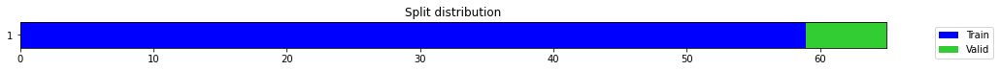

epoch,train_loss,valid_loss,mse,time
0,0.252461,0.001396,0.001396,00:00
1,0.217069,0.035903,0.035903,00:00
2,0.162870,0.220973,0.220973,00:00
3,0.138135,0.211440,0.211440,00:00
4,0.129674,0.008497,0.008497,00:00
5,0.117229,0.148912,0.148912,00:00
6,0.112599,0.493809,0.493809,00:00
7,0.111913,0.158472,0.158472,00:00
8,0.102287,0.482448,0.482448,00:00
9,0.095091,0.452318,0.452318,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6720588405927023,
  "MSE_normalize": 0.4523177602288356,
  "RMSE_normalize": 0.6725457309572603,
  "MAPE_normalize": 0.6946742226656445,
  "MAE": 43350.48345359167,
  "MSE": 1881988365.1933756,
  "RMSE": 43381.88982966712,
  "MAPE": 0.3673112850372637
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:59:36.359469+07:00
PROGRESS: [ 682 / 1944 ]


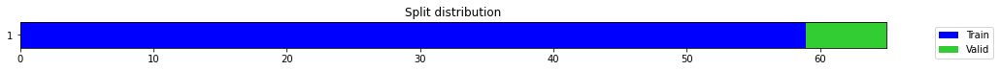

epoch,train_loss,valid_loss,mse,time
0,0.542855,0.573215,0.573215,00:00
1,0.363112,0.176949,0.176949,00:00
2,0.350327,0.683454,0.683454,00:00
3,0.283699,0.152719,0.152719,00:00
4,0.246991,0.005459,0.005459,00:00
5,0.215154,0.248865,0.248865,00:00
6,0.189009,0.471331,0.471331,00:00
7,0.170825,0.479246,0.479246,00:00
8,0.154272,0.892404,0.892404,00:00
9,0.140035,0.098849,0.098849,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.015288501977920532,
  "MSE_normalize": 0.0002586840382819607,
  "RMSE_normalize": 0.016083657490818457,
  "MAPE_normalize": 0.0157620690833914,
  "MAE": 986.169531583786,
  "MSE": 1076323.7553652253,
  "RMSE": 1037.460242787754,
  "MAPE": 0.008344510366459147
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:59:44.287917+07:00
PROGRESS: [ 683 / 1944 ]


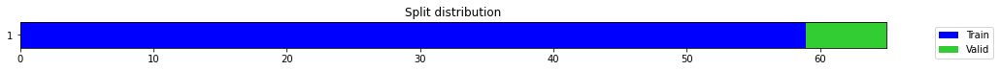

epoch,train_loss,valid_loss,mse,time
0,0.329387,0.194144,0.194144,00:00
1,0.278228,0.048256,0.048256,00:00
2,0.242486,0.364010,0.364010,00:00
3,0.209445,0.040005,0.040005,00:00
4,0.182101,0.312497,0.312497,00:00
5,0.164734,0.030362,0.030362,00:00
6,0.171039,0.381729,0.381729,00:00
7,0.152776,1.716902,1.716902,00:00
8,0.139785,0.002300,0.002300,00:00
9,0.128799,1.226098,1.226098,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15721016128857931,
  "MSE_normalize": 0.02473100774070443,
  "RMSE_normalize": 0.15726095427888143,
  "MAPE_normalize": 0.1625641965074069,
  "MAE": 10140.68424375852,
  "MSE": 102899936.54895593,
  "RMSE": 10143.960594804967,
  "MAPE": 0.08594040110712921
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.0
2022-10-14 21:59:59.305277+07:00
PROGRESS: [ 684 / 1944 ]


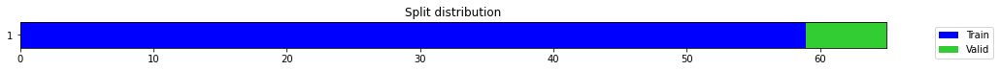

epoch,train_loss,valid_loss,mse,time
0,0.197636,0.117496,0.117496,00:00
1,0.153485,0.010044,0.010044,00:00
2,0.146315,0.107122,0.107122,00:00
3,0.143682,0.017937,0.017937,00:00
4,0.127062,0.100473,0.100473,00:00
5,0.120861,0.476631,0.476631,00:00
6,0.108713,0.433255,0.433255,00:00
7,0.099839,0.307300,0.307300,00:00
8,0.095570,0.155674,0.155674,00:00
9,0.089638,0.332463,0.332463,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.013963898022969564,
  "MSE_normalize": 0.00024722070431811477,
  "RMSE_normalize": 0.015723253617432837,
  "MAPE_normalize": 0.01459115578044598,
  "MAE": 900.7272780736288,
  "MSE": 1028627.5049783965,
  "RMSE": 1014.2127513388878,
  "MAPE": 0.007675821623161783
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 22:00:29.120977+07:00
PROGRESS: [ 685 / 1944 ]


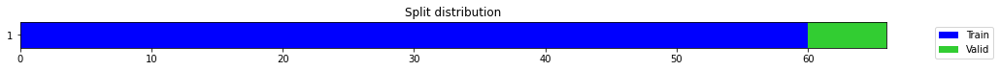

epoch,train_loss,valid_loss,mse,time
0,0.129329,0.032617,0.032617,00:00
1,0.167473,0.018124,0.018124,00:00
2,0.145594,2.577691,2.577691,00:00
3,0.147883,0.117092,0.117092,00:00
4,0.142924,0.172833,0.172833,00:00
5,0.135724,0.040353,0.040353,00:00
6,0.124378,0.134125,0.134125,00:00
7,0.112426,0.002570,0.002570,00:00
8,0.102836,0.001320,0.001320,00:00
9,0.092267,0.000219,0.000219,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.012338717778523764,
  "MSE_normalize": 0.00021936651483874434,
  "RMSE_normalize": 0.014811026798934108,
  "MAPE_normalize": 0.0129040634430721,
  "MAE": 795.8966515858968,
  "MSE": 912732.7399894072,
  "RMSE": 955.3704726384458,
  "MAPE": 0.006785280031156832
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 22:00:32.867680+07:00
PROGRESS: [ 686 / 1944 ]


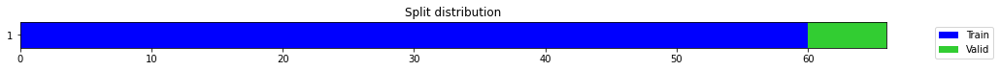

epoch,train_loss,valid_loss,mse,time
0,0.247239,0.070626,0.070626,00:00
1,0.160206,0.010311,0.010311,00:00
2,0.148656,0.051167,0.051167,00:00
3,0.143129,0.923236,0.923236,00:00
4,0.136819,0.566635,0.566635,00:00
5,0.125243,0.453990,0.453990,00:00
6,0.116577,0.032724,0.032724,00:00
7,0.110336,0.120357,0.120357,00:00
8,0.105824,0.009606,0.009606,00:00
9,0.097248,0.211397,0.211397,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0860086977481842,
  "MSE_normalize": 0.007403748311157088,
  "RMSE_normalize": 0.08604503652830353,
  "MAPE_normalize": 0.0889906255201144,
  "MAE": 5547.905039548874,
  "MSE": 30805264.364079803,
  "RMSE": 5550.24903622169,
  "MAPE": 0.04703221852667444
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 22:00:41.736009+07:00
PROGRESS: [ 687 / 1944 ]


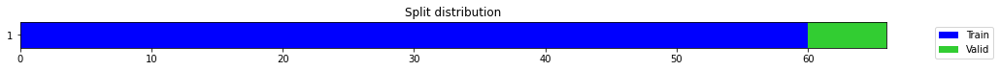

epoch,train_loss,valid_loss,mse,time
0,0.184860,0.410654,0.410654,00:00
1,0.124281,0.387764,0.387764,00:00
2,0.112404,0.008346,0.008346,00:00
3,0.113754,0.013519,0.013519,00:00
4,0.100510,0.360603,0.360603,00:00
5,0.094638,0.147393,0.147393,00:00
6,0.083245,0.018598,0.018598,00:00
7,0.082284,0.009595,0.009595,00:00
8,0.081998,0.215950,0.215950,00:00
9,0.078106,1.074030,1.074030,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03600593407948812,
  "MSE_normalize": 0.001512230117355055,
  "RMSE_normalize": 0.038887403067768035,
  "MAPE_normalize": 0.03691838762605632,
  "MAE": 2322.5267718633017,
  "MSE": 6292035.680662605,
  "RMSE": 2508.3930474833096,
  "MAPE": 0.019595373882514294
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.1
2022-10-14 22:00:59.457050+07:00
PROGRESS: [ 688 / 1944 ]


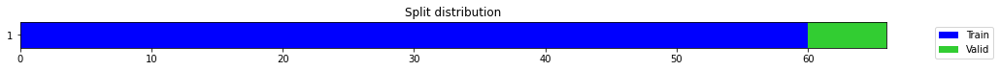

epoch,train_loss,valid_loss,mse,time
0,0.508005,0.267743,0.267743,00:00
1,0.370203,0.011217,0.011217,00:00
2,0.284814,0.060681,0.060681,00:00
3,0.229218,0.204757,0.204757,00:00
4,0.206644,0.255017,0.255017,00:00
5,0.198728,0.182412,0.182412,00:00
6,0.180114,0.032281,0.032281,00:00
7,0.161192,0.002479,0.002479,00:00
8,0.152052,0.000283,0.000283,00:00
9,0.140433,0.000289,0.000289,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.016820828119913738,
  "MSE_normalize": 0.0004412840868693498,
  "RMSE_normalize": 0.021006762884113055,
  "MAPE_normalize": 0.01713857322032039,
  "MAE": 1085.0106970469158,
  "MSE": 1836079.8320475824,
  "RMSE": 1355.0202330768284,
  "MAPE": 0.009123786986986153
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.2
2022-10-14 22:01:34.483785+07:00
PROGRESS: [ 689 / 1944 ]


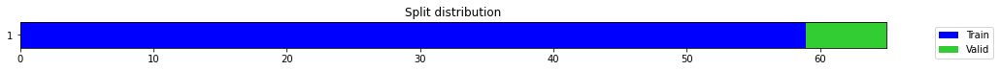

epoch,train_loss,valid_loss,mse,time
0,0.390169,0.069283,0.069283,00:00
1,0.301542,0.769833,0.769833,00:00
2,0.224524,0.152731,0.152731,00:00
3,0.197568,3.529361,3.529361,00:00
4,0.174946,3.362822,3.362822,00:00
5,0.158673,3.190233,3.190233,00:00
6,0.144997,0.217606,0.217606,00:00
7,0.137921,0.091138,0.091138,00:00
8,0.126127,0.089607,0.089607,00:00
9,0.114947,0.067309,0.067309,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2584880193074544,
  "MSE_normalize": 0.06730912741380853,
  "RMSE_normalize": 0.2594400266223555,
  "MAPE_normalize": 0.26690562390574396,
  "MAE": 16673.51119740804,
  "MSE": 280057529.9099885,
  "RMSE": 16734.91947724842,
  "MAPE": 0.14119722870932572
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.3
2022-10-14 22:01:38.486180+07:00
PROGRESS: [ 690 / 1944 ]


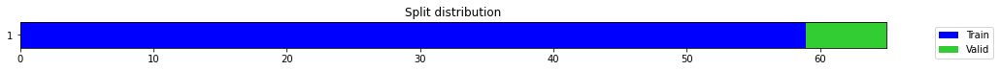

epoch,train_loss,valid_loss,mse,time
0,0.428195,0.092463,0.092463,00:00
1,0.339761,0.101545,0.101545,00:00
2,0.279374,0.162930,0.162930,00:00
3,0.227280,0.043959,0.043959,00:00
4,0.201932,0.359841,0.359841,00:00
5,0.176239,0.012327,0.012327,00:00
6,0.154250,0.019919,0.019919,00:00
7,0.135778,0.027349,0.027349,00:00
8,0.130006,0.163585,0.163585,00:00
9,0.117435,0.109603,0.109603,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5492540448904037,
  "MSE_normalize": 0.3020311805381903,
  "RMSE_normalize": 0.549573635228429,
  "MAPE_normalize": 0.5677855851570899,
  "MAE": 35429.0829116106,
  "MSE": 1256681071.7556627,
  "RMSE": 35449.69776677458,
  "MAPE": 0.3002063075882416
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.3
2022-10-14 22:01:47.751265+07:00
PROGRESS: [ 691 / 1944 ]


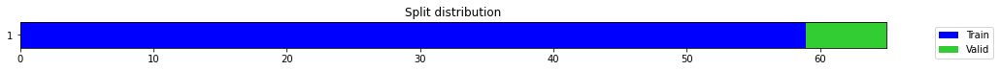

epoch,train_loss,valid_loss,mse,time
0,0.262154,0.921554,0.921554,00:00
1,0.246264,0.479363,0.479363,00:00
2,0.228292,0.137112,0.137112,00:00
3,0.181525,0.000213,0.000213,00:00
4,0.158364,0.010366,0.010366,00:00
5,0.141879,0.021159,0.021159,00:00
6,0.142273,1.677851,1.677851,00:00
7,0.129673,1.547578,1.547578,00:00
8,0.126008,0.579606,0.579606,00:00
9,0.119890,0.058621,0.058621,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.02757685383160909,
  "MSE_normalize": 0.0007759609887099117,
  "RMSE_normalize": 0.02785607633371778,
  "MAPE_normalize": 0.028591338855512505,
  "MAE": 1778.8173795541127,
  "MSE": 3228592.1115659606,
  "RMSE": 1796.8283478301316,
  "MAPE": 0.015096206076818807
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.5
2022-10-14 22:02:24.709911+07:00
PROGRESS: [ 692 / 1944 ]


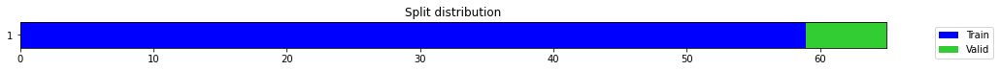

epoch,train_loss,valid_loss,mse,time
0,0.277076,0.393338,0.393338,00:00
1,0.235289,0.690940,0.690940,00:00
2,0.203609,0.336955,0.336955,00:00
3,0.183951,0.008193,0.008193,00:00
4,0.164014,0.005983,0.005983,00:00
5,0.159520,0.531919,0.531919,00:00
6,0.143011,1.875646,1.875646,00:00
7,0.142416,0.214613,0.214613,00:00
8,0.133224,0.394477,0.394477,00:00
9,0.131195,0.034860,0.034860,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03433837493260702,
  "MSE_normalize": 0.0012388886827743306,
  "RMSE_normalize": 0.03519785054196251,
  "MAPE_normalize": 0.035684835896729335,
  "MAE": 2214.962536652883,
  "MSE": 5154725.928894439,
  "RMSE": 2270.4021513587495,
  "MAPE": 0.01882081365318469
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.6
2022-10-14 22:03:35.150211+07:00
PROGRESS: [ 693 / 1944 ]


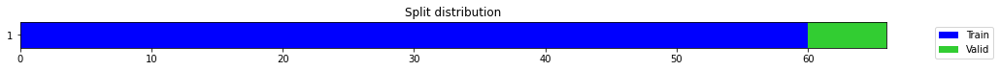

epoch,train_loss,valid_loss,mse,time
0,0.109669,0.083211,0.083211,00:00
1,0.118895,0.295517,0.295517,00:00
2,0.129697,0.120457,0.120457,00:00
3,0.141023,0.003070,0.003070,00:00
4,0.139279,4.099119,4.099119,00:00
5,0.128794,0.387526,0.387526,00:00
6,0.122297,0.025400,0.025400,00:00
7,0.111185,0.232922,0.232922,00:00
8,0.101643,0.205790,0.205790,00:00
9,0.094774,0.187020,0.187020,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4318790038426717,
  "MSE_normalize": 0.1870202949236912,
  "RMSE_normalize": 0.4324584314401688,
  "MAPE_normalize": 0.44627267954532474,
  "MAE": 27857.923263867695,
  "MSE": 778147687.4207916,
  "RMSE": 27895.29866161665,
  "MAPE": 0.2360029960686629
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.6
2022-10-14 22:03:43.054641+07:00
PROGRESS: [ 694 / 1944 ]


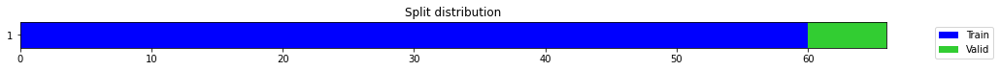

epoch,train_loss,valid_loss,mse,time
0,0.204306,0.361941,0.361941,00:00
1,0.127558,0.006991,0.006991,00:00
2,0.138791,0.262271,0.262271,00:00
3,0.124148,0.344401,0.344401,00:00
4,0.117074,0.916310,0.916310,00:00
5,0.108306,0.072746,0.072746,00:00
6,0.102092,1.646680,1.646680,00:00
7,0.097426,0.266709,0.266709,00:00
8,0.090395,0.732347,0.732347,00:00
9,0.083294,0.191729,0.191729,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.055447528759638466,
  "MSE_normalize": 0.0031232391596436315,
  "RMSE_normalize": 0.05588594778335276,
  "MAPE_normalize": 0.05751592756104549,
  "MAE": 3576.5873951117196,
  "MSE": 12995067.35528562,
  "RMSE": 3604.8671758173864,
  "MAPE": 0.030361194301985524
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.6
2022-10-14 22:04:02.185371+07:00
PROGRESS: [ 695 / 1944 ]


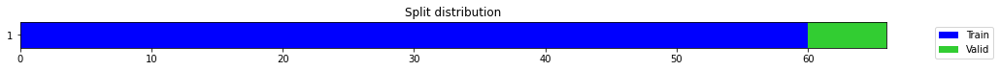

epoch,train_loss,valid_loss,mse,time
0,0.218753,0.138532,0.138532,00:00
1,0.143608,0.026682,0.026682,00:00
2,0.124290,0.054467,0.054467,00:00
3,0.125729,0.036822,0.036822,00:00
4,0.115721,0.038977,0.038977,00:00
5,0.107982,0.381146,0.381146,00:00
6,0.098041,0.125813,0.125813,00:00
7,0.093048,0.000089,0.000089,00:00
8,0.094930,0.038365,0.038365,00:00
9,0.097937,0.299553,0.299553,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05758405725161234,
  "MSE_normalize": 0.0035301451662975345,
  "RMSE_normalize": 0.059415024752141055,
  "MAPE_normalize": 0.05923731120757956,
  "MAE": 3714.4020289580026,
  "MSE": 14688108.03947745,
  "RMSE": 3832.506756612107,
  "MAPE": 0.031392917610774944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.6
2022-10-14 22:04:39.401834+07:00
PROGRESS: [ 696 / 1944 ]


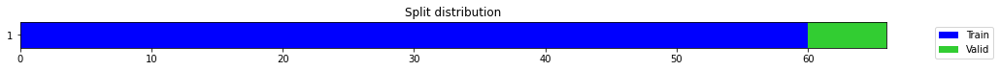

epoch,train_loss,valid_loss,mse,time
0,0.366254,0.294026,0.294026,00:00
1,0.256003,0.000391,0.000391,00:00
2,0.196946,0.179118,0.179118,00:00
3,0.173328,0.273072,0.273072,00:00
4,0.158689,0.164990,0.164990,00:00
5,0.140131,0.034717,0.034717,00:00
6,0.124513,0.042447,0.042447,00:00
7,0.113543,0.292429,0.292429,00:00
8,0.109222,0.017777,0.017777,00:00
9,0.100141,0.248769,0.248769,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.045773585637410484,
  "MSE_normalize": 0.0021039157241548403,
  "RMSE_normalize": 0.045868461105151984,
  "MAPE_normalize": 0.047399464242625346,
  "MAE": 2952.579367955526,
  "MSE": 8753901.04559149,
  "RMSE": 2958.6992151267236,
  "MAPE": 0.025041281096753687
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:05:51.908468+07:00
PROGRESS: [ 697 / 1944 ]


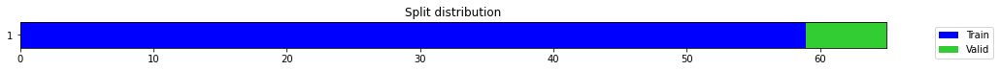

epoch,train_loss,valid_loss,mse,time
0,0.227436,0.002207,0.002207,00:00
1,0.188906,0.520173,0.520173,00:00
2,0.182686,1.865213,1.865213,00:00
3,0.171176,3.413770,3.413770,00:00
4,0.167395,7.864516,7.864516,00:00
5,0.149707,1.119443,1.119443,00:00
6,0.137229,7.032712,7.032712,00:00
7,0.139695,3.931429,3.931429,00:00
8,0.127018,0.968848,0.968848,00:00
9,0.122890,0.428585,0.428585,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6538438002268473,
  "MSE_normalize": 0.4285850349763187,
  "RMSE_normalize": 0.6546640626888868,
  "MAPE_normalize": 0.675674148868405,
  "MAE": 42175.54048983256,
  "MSE": 1783242048.4956386,
  "RMSE": 42228.450699683955,
  "MAPE": 0.35730778948406944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:06:02.044208+07:00
PROGRESS: [ 698 / 1944 ]


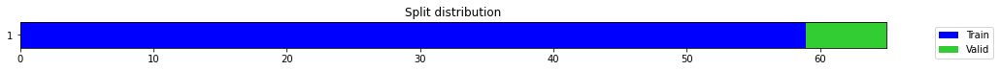

epoch,train_loss,valid_loss,mse,time
0,0.536330,0.267343,0.267343,00:00
1,0.415182,0.027494,0.027494,00:00
2,0.324907,0.016848,0.016848,00:00
3,0.272380,1.238606,1.238606,00:00
4,0.247648,0.625243,0.625243,00:00
5,0.239437,0.015357,0.015357,00:00
6,0.215213,0.379790,0.379790,00:00
7,0.197576,0.156711,0.156711,00:00
8,0.187773,0.291603,0.291603,00:00
9,0.176709,0.515962,0.515962,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.019084970156351726,
  "MSE_normalize": 0.0005288644350673147,
  "RMSE_normalize": 0.022997052747413413,
  "MAPE_normalize": 0.01998167763614744,
  "MAE": 1231.0569149653118,
  "MSE": 2200481.168499122,
  "RMSE": 1483.4018904191548,
  "MAPE": 0.010501516035579887
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:06:24.210017+07:00
PROGRESS: [ 699 / 1944 ]


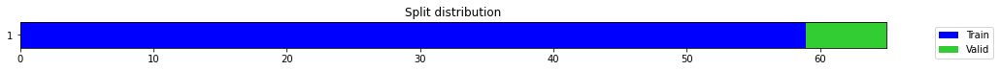

epoch,train_loss,valid_loss,mse,time
0,0.582569,0.953928,0.953928,00:00
1,0.426878,0.165776,0.165776,00:00
2,0.352118,0.043192,0.043192,00:00
3,0.281288,0.002335,0.002335,00:00
4,0.259691,0.520690,0.520690,00:00
5,0.231972,2.987696,2.987696,00:00
6,0.209847,2.278512,2.278512,00:00
7,0.192772,5.381497,5.381497,00:00
8,0.183511,0.150583,0.150583,00:00
9,0.176296,0.169106,0.169106,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04853900273640951,
  "MSE_normalize": 0.0023669872055206063,
  "RMSE_normalize": 0.048651692730269994,
  "MAPE_normalize": 0.050254448773306974,
  "MAE": 3130.959832509359,
  "MSE": 9848479.925036946,
  "RMSE": 3138.228787873336,
  "MAPE": 0.026551729972051342
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:07:05.215792+07:00
PROGRESS: [ 700 / 1944 ]


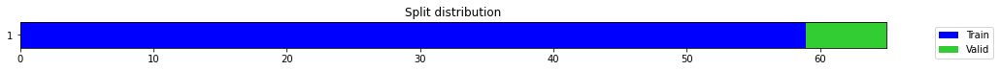

epoch,train_loss,valid_loss,mse,time
0,0.577426,0.787591,0.787591,00:00
1,0.498434,0.157152,0.157152,00:00
2,0.406220,0.001924,0.001924,00:00
3,0.330285,0.030049,0.030049,00:00
4,0.283171,0.129091,0.129091,00:00
5,0.261810,0.047498,0.047498,00:00
6,0.233277,1.035367,1.035367,00:00
7,0.218636,1.391078,1.391078,00:00
8,0.198702,0.707825,0.707825,00:00
9,0.184280,0.058184,0.058184,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11586187283198039,
  "MSE_normalize": 0.013523320449613388,
  "RMSE_normalize": 0.11628981232082795,
  "MAPE_normalize": 0.11963261383080319,
  "MAE": 7473.554245154063,
  "MSE": 56267372.15022922,
  "RMSE": 7501.158053942686,
  "MAPE": 0.06328807837615046
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:07:59.711085+07:00
PROGRESS: [ 701 / 1944 ]


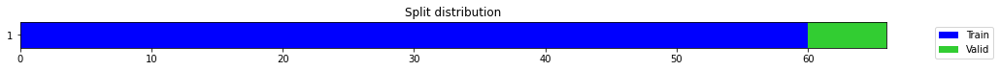

epoch,train_loss,valid_loss,mse,time
0,0.241277,0.007516,0.007516,00:00
1,0.195940,0.312748,0.312748,00:00
2,0.319725,0.966784,0.966784,00:00
3,0.286252,1.515320,1.515320,00:00
4,0.271900,1.403283,1.403283,00:00
5,0.228086,0.063462,0.063462,00:00
6,0.196885,0.054361,0.054361,00:00
7,0.172691,0.040280,0.040280,00:00
8,0.156797,0.002610,0.002610,00:00
9,0.140921,0.001144,0.001144,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.030428727467854817,
  "MSE_normalize": 0.0011436742279021435,
  "RMSE_normalize": 0.033818252880687724,
  "MAPE_normalize": 0.031817469461442656,
  "MAE": 1962.774636586507,
  "MSE": 4758560.860830278,
  "RMSE": 2181.412583815881,
  "MAPE": 0.01673257266722019
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:08:08.579850+07:00
PROGRESS: [ 702 / 1944 ]


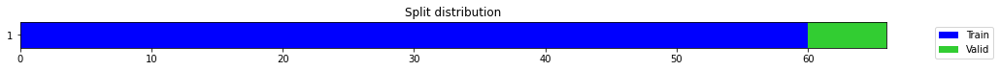

epoch,train_loss,valid_loss,mse,time
0,0.461609,0.000345,0.000345,00:00
1,0.304146,0.589334,0.589334,00:00
2,0.277693,0.331108,0.331108,00:00
3,0.237108,0.168381,0.168381,00:00
4,0.214326,0.089286,0.089286,00:00
5,0.191983,5.133550,5.133550,00:00
6,0.188180,0.347297,0.347297,00:00
7,0.170525,0.272675,0.272675,00:00
8,0.155284,4.696621,4.696621,00:00
9,0.158956,1.903050,1.903050,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07373552521069844,
  "MSE_normalize": 0.005585098819969048,
  "RMSE_normalize": 0.07473351871796917,
  "MAPE_normalize": 0.07600922048618837,
  "MAE": 4756.236318190892,
  "MSE": 23238289.366128918,
  "RMSE": 4820.610891383883,
  "MAPE": 0.0402419026454418
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.8
2022-10-14 22:08:29.478139+07:00
PROGRESS: [ 703 / 1944 ]


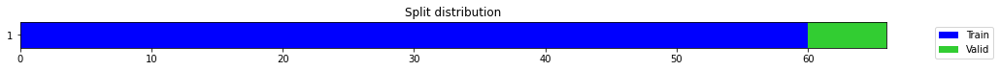

epoch,train_loss,valid_loss,mse,time
0,0.234531,0.051454,0.051454,00:00
1,0.156590,0.002519,0.002519,00:00
2,0.162701,0.002412,0.002412,00:00
3,0.136435,0.952840,0.952840,00:00
4,0.126711,0.272721,0.272721,00:00
5,0.117074,0.002762,0.002762,00:00
6,0.122491,1.300905,1.300905,00:00
7,0.118507,0.184923,0.184923,00:00
8,0.119154,1.330578,1.330578,00:00
9,0.125903,1.743536,1.743536,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.013114402691523233,
  "MSE_normalize": 0.00022969479563350603,
  "RMSE_normalize": 0.015155685257800323,
  "MAPE_normalize": 0.013475137467574052,
  "MAE": 845.9314312140147,
  "MSE": 955706.2997239571,
  "RMSE": 977.602321869152,
  "MAPE": 0.007144751094186899
}
Percent CPU Usage: 100.0
Percent Ram Usage: 28.9
2022-10-14 22:09:09.281845+07:00
PROGRESS: [ 704 / 1944 ]


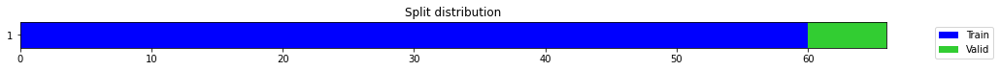

epoch,train_loss,valid_loss,mse,time
0,0.290778,0.005541,0.005541,00:00
1,0.183753,0.160001,0.160001,00:00
2,0.148314,0.530210,0.530210,00:00
3,0.139725,0.448228,0.448228,00:00
4,0.129140,0.049518,0.049518,00:00
5,0.115137,0.315840,0.315840,00:00
6,0.120190,0.131960,0.131960,00:00
7,0.110093,0.317875,0.317875,00:00
8,0.107187,0.848899,0.848899,00:00
9,0.102152,0.095431,0.095431,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11258609096209209,
  "MSE_normalize": 0.012715829422176602,
  "RMSE_normalize": 0.11276448652912228,
  "MAPE_normalize": 0.11632978853255914,
  "MAE": 7262.253211418788,
  "MSE": 52907590.92504532,
  "RMSE": 7273.760439074504,
  "MAPE": 0.06152092864227963
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.1
2022-10-14 22:10:26.020679+07:00
PROGRESS: [ 705 / 1944 ]


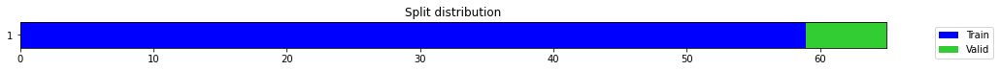

epoch,train_loss,valid_loss,mse,time
0,0.485180,1.112650,1.112650,00:00
1,0.382312,1.084306,1.084306,00:00
2,0.361686,0.720709,0.720709,00:00
3,0.293182,2.203106,2.203106,00:00
4,0.259325,2.841125,2.841125,00:00
5,0.227683,0.263511,0.263511,00:00
6,0.203129,0.690488,0.690488,00:00
7,0.184072,0.091690,0.091690,00:00
8,0.167933,0.050052,0.050052,00:00
9,0.152693,0.078321,0.078321,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.27972544233004254,
  "MSE_normalize": 0.07832114231861986,
  "RMSE_normalize": 0.27985914728416483,
  "MAPE_normalize": 0.2891866459134517,
  "MAE": 18043.409932057064,
  "MSE": 325875947.29361296,
  "RMSE": 18052.03443641777,
  "MAPE": 0.15289634463268026
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.1
2022-10-14 22:10:32.723496+07:00
PROGRESS: [ 706 / 1944 ]


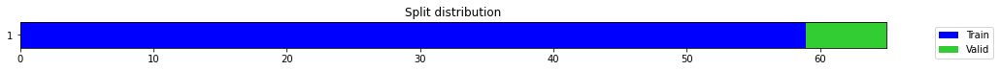

epoch,train_loss,valid_loss,mse,time
0,0.361028,0.034507,0.034507,00:00
1,0.245414,0.046298,0.046298,00:00
2,0.186525,0.272919,0.272919,00:00
3,0.181557,0.994244,0.994244,00:00
4,0.159296,0.526364,0.526364,00:00
5,0.148675,3.758730,3.758730,00:00
6,0.136587,1.254495,1.254495,00:00
7,0.125741,0.243487,0.243487,00:00
8,0.118748,6.338829,6.338829,00:00
9,0.109156,1.009945,1.009945,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1487852136294047,
  "MSE_normalize": 0.022180022872448763,
  "RMSE_normalize": 0.14892959031854203,
  "MAPE_normalize": 0.15405594624382526,
  "MAE": 9597.24141995112,
  "MSE": 92285885.40178752,
  "RMSE": 9606.554293907235,
  "MAPE": 0.08139174631865541
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.1
2022-10-14 22:10:54.719343+07:00
PROGRESS: [ 707 / 1944 ]


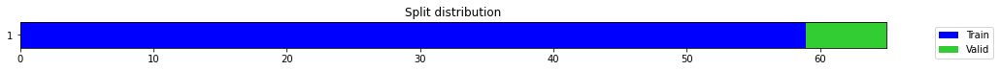

epoch,train_loss,valid_loss,mse,time
0,0.189325,0.004274,0.004274,00:00
1,0.136406,0.108518,0.108518,00:00
2,0.102033,0.867780,0.867780,00:00
3,0.097886,0.019532,0.019532,00:00
4,0.099513,0.736699,0.736699,00:00
5,0.090385,2.381777,2.381777,00:00
6,0.088109,0.050664,0.050664,00:00
7,0.084073,0.263610,0.263610,00:00
8,0.079501,2.279483,2.279483,00:00
9,0.079214,2.738988,2.738988,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03866243362426758,
  "MSE_normalize": 0.0015077501110691098,
  "RMSE_normalize": 0.038829758060913926,
  "MAPE_normalize": 0.040051020829849994,
  "MAE": 2493.881618499756,
  "MSE": 6273395.422756576,
  "RMSE": 2504.6747139611916,
  "MAPE": 0.02115526470948362
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.3
2022-10-14 22:11:35.924092+07:00
PROGRESS: [ 708 / 1944 ]


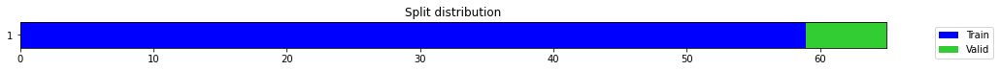

epoch,train_loss,valid_loss,mse,time
0,0.371443,0.082415,0.082415,00:00
1,0.270323,0.008860,0.008860,00:00
2,0.244617,0.147496,0.147496,00:00
3,0.204717,0.401153,0.401153,00:00
4,0.182618,0.285403,0.285403,00:00
5,0.157369,0.143020,0.143020,00:00
6,0.148234,0.433168,0.433168,00:00
7,0.143008,1.299259,1.299259,00:00
8,0.132839,0.108864,0.108864,00:00
9,0.123198,0.010805,0.010805,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08744305372238159,
  "MSE_normalize": 0.007709771860612354,
  "RMSE_normalize": 0.08780530656294273,
  "MAPE_normalize": 0.09028158435987066,
  "MAE": 5640.426737308502,
  "MSE": 32078556.748748977,
  "RMSE": 5663.7934945360585,
  "MAPE": 0.047762593768145234
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.4
2022-10-14 22:12:55.195253+07:00
PROGRESS: [ 709 / 1944 ]


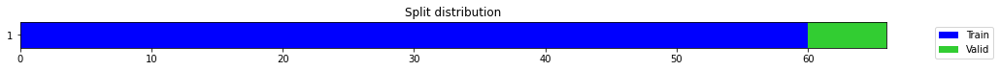

epoch,train_loss,valid_loss,mse,time
0,0.174333,0.285573,0.285573,00:00
1,0.280240,0.578086,0.578086,00:00
2,0.306483,4.160573,4.160573,00:00
3,0.322677,2.522506,2.522506,00:00
4,0.287763,1.009118,1.009118,00:00
5,0.256761,0.056661,0.056661,00:00
6,0.227025,0.000785,0.000785,00:00
7,0.199611,0.002861,0.002861,00:00
8,0.179684,0.007651,0.007651,00:00
9,0.163706,0.006825,0.006825,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08001568913459778,
  "MSE_normalize": 0.006825306376115374,
  "RMSE_normalize": 0.08261541246108606,
  "MAPE_normalize": 0.08230589835541947,
  "MAE": 5161.332011938095,
  "MSE": 28398502.818528965,
  "RMSE": 5329.0245653898955,
  "MAPE": 0.043619928506429005
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.4
2022-10-14 22:13:04.385216+07:00
PROGRESS: [ 710 / 1944 ]


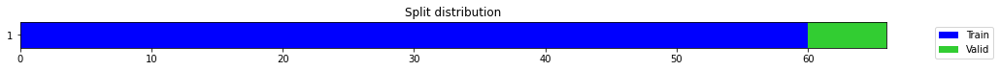

epoch,train_loss,valid_loss,mse,time
0,0.535678,0.142717,0.142717,00:00
1,0.296794,0.869590,0.869590,00:00
2,0.387279,0.156139,0.156139,00:00
3,0.364273,0.705722,0.705722,00:00
4,0.312062,2.401654,2.401654,00:00
5,0.271508,1.629169,1.629169,00:00
6,0.239428,4.642952,4.642952,00:00
7,0.236466,0.079331,0.079331,00:00
8,0.213869,0.573019,0.573019,00:00
9,0.193069,0.012689,0.012689,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4804464479287465,
  "MSE_normalize": 0.23138590976413523,
  "RMSE_normalize": 0.4810258930287799,
  "MAPE_normalize": 0.49648731422612896,
  "MAE": 30990.717677195866,
  "MSE": 962742629.9278564,
  "RMSE": 31028.09420392842,
  "MAPE": 0.26255083583420813
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.4
2022-10-14 22:13:25.982297+07:00
PROGRESS: [ 711 / 1944 ]


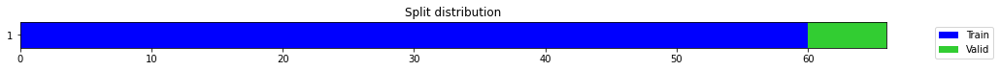

epoch,train_loss,valid_loss,mse,time
0,0.319204,0.002574,0.002574,00:00
1,0.199447,0.272444,0.272444,00:00
2,0.206904,0.054149,0.054149,00:00
3,0.195720,0.281878,0.281878,00:00
4,0.183024,0.222508,0.222508,00:00
5,0.184346,0.025558,0.025558,00:00
6,0.172202,1.299003,1.299003,00:00
7,0.162803,0.444116,0.444116,00:00
8,0.155552,0.194703,0.194703,00:00
9,0.144906,0.251445,0.251445,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.026140660047531128,
  "MSE_normalize": 0.0007170170482376411,
  "RMSE_normalize": 0.026777174015150312,
  "MAPE_normalize": 0.027167070613371733,
  "MAE": 1686.1771357059479,
  "MSE": 2983340.1671998105,
  "RMSE": 1727.234832673256,
  "MAPE": 0.01432808030152573
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.4
2022-10-14 22:14:07.539898+07:00
PROGRESS: [ 712 / 1944 ]


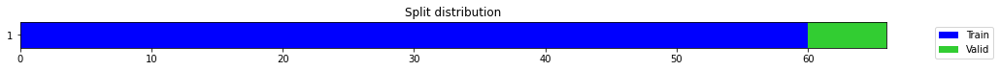

epoch,train_loss,valid_loss,mse,time
0,0.140680,0.041850,0.041850,00:00
1,0.097236,0.010196,0.010196,00:00
2,0.098682,0.006613,0.006613,00:00
3,0.088533,0.014466,0.014466,00:00
4,0.086678,0.238587,0.238587,00:00
5,0.085165,0.120706,0.120706,00:00
6,0.084501,0.000571,0.000571,00:00
7,0.082218,0.008291,0.008291,00:00
8,0.083535,0.255822,0.255822,00:00
9,0.088071,0.234348,0.234348,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.10984089970588684,
  "MSE_normalize": 0.012272520150670966,
  "RMSE_normalize": 0.11078140706215536,
  "MAPE_normalize": 0.11329721898061763,
  "MAE": 7085.177394628525,
  "MSE": 51063084.77358695,
  "RMSE": 7145.843881137269,
  "MAPE": 0.05996611034810371
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.6
2022-10-14 22:15:25.218808+07:00
PROGRESS: [ 713 / 1944 ]


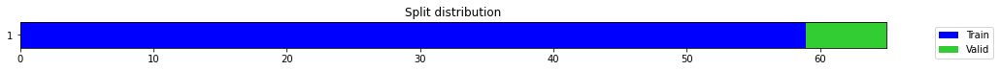

epoch,train_loss,valid_loss,mse,time
0,0.181150,0.082210,0.082210,00:00
1,0.141412,0.026333,0.026333,00:00
2,0.154951,3.029332,3.029332,00:00
3,0.253600,0.540944,0.540944,00:00
4,0.235930,0.509034,0.509034,00:00
5,0.201122,0.214433,0.214433,00:00
6,0.172907,0.061420,0.061420,00:00
7,0.154241,0.005875,0.005875,00:00
8,0.140561,0.032817,0.032817,00:00
9,0.125905,0.086428,0.086428,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2938823997974396,
  "MSE_normalize": 0.08642809121815691,
  "RMSE_normalize": 0.2939865493830575,
  "MAPE_normalize": 0.30386588943821075,
  "MAE": 18956.590316534042,
  "MSE": 359607064.7682553,
  "RMSE": 18963.308381404742,
  "MAPE": 0.1606466036403227
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.7
2022-10-14 22:15:33.141459+07:00
PROGRESS: [ 714 / 1944 ]


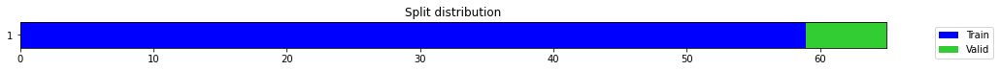

epoch,train_loss,valid_loss,mse,time
0,0.669656,0.910853,0.910853,00:00
1,0.496631,0.336550,0.336550,00:00
2,0.405010,0.084406,0.084406,00:00
3,0.331763,0.037218,0.037218,00:00
4,0.300554,1.863349,1.863349,00:00
5,0.270723,3.085172,3.085172,00:00
6,0.245074,0.248710,0.248710,00:00
7,0.217444,1.456138,1.456138,00:00
8,0.207567,0.593693,0.593693,00:00
9,0.192318,4.463197,4.463197,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1796436905860901,
  "MSE_normalize": 0.03282581501084891,
  "RMSE_normalize": 0.18117895852126129,
  "MAPE_normalize": 0.18531241969515344,
  "MAE": 11587.736617565155,
  "MSE": 136580535.54464284,
  "RMSE": 11686.767540455437,
  "MAPE": 0.09807845617645156
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.9
2022-10-14 22:15:51.947278+07:00
PROGRESS: [ 715 / 1944 ]


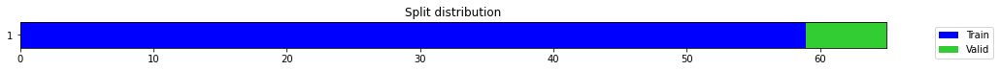

epoch,train_loss,valid_loss,mse,time
0,0.506364,0.003411,0.003411,00:00
1,0.376949,0.038101,0.038101,00:00
2,0.317532,0.472698,0.472698,00:00
3,0.270212,1.030894,1.030894,00:00
4,0.236637,3.485740,3.485740,00:00
5,0.211811,0.721367,0.721367,00:00
6,0.194697,3.570903,3.570903,00:00
7,0.185247,0.000219,0.000219,00:00
8,0.163401,0.009244,0.009244,00:00
9,0.160887,0.412181,0.412181,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2193635900815328,
  "MSE_normalize": 0.04812941901508575,
  "RMSE_normalize": 0.21938418132373572,
  "MAPE_normalize": 0.22695861537813114,
  "MAE": 14149.829014619192,
  "MSE": 200255251.00779298,
  "RMSE": 14151.157232106249,
  "MAPE": 0.11995190517624547
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:16:29.875004+07:00
PROGRESS: [ 716 / 1944 ]


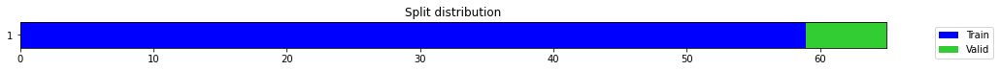

epoch,train_loss,valid_loss,mse,time
0,0.326104,0.568084,0.568084,00:00
1,0.243589,0.393555,0.393555,00:00
2,0.215649,0.331195,0.331195,00:00
3,0.180520,0.255181,0.255181,00:00
4,0.163970,0.162152,0.162152,00:00
5,0.148732,0.005026,0.005026,00:00
6,0.147941,0.695704,0.695704,00:00
7,0.137798,0.647898,0.647898,00:00
8,0.127000,0.731423,0.731423,00:00
9,0.129685,0.009502,0.009502,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07789116104443868,
  "MSE_normalize": 0.006074153221511243,
  "RMSE_normalize": 0.07793685406475709,
  "MAPE_normalize": 0.08058981779839883,
  "MAE": 5024.291452010472,
  "MSE": 25273130.3000409,
  "RMSE": 5027.238834593091,
  "MAPE": 0.04259277940452832
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:17:43.318272+07:00
PROGRESS: [ 717 / 1944 ]


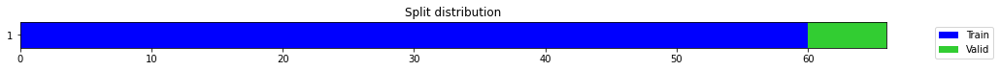

epoch,train_loss,valid_loss,mse,time
0,0.336691,0.146171,0.146171,00:00
1,0.381261,1.771581,1.771581,00:00
2,0.351417,4.548280,4.548280,00:00
3,0.384664,0.094313,0.094313,00:00
4,0.364269,0.936109,0.936109,00:00
5,0.327927,1.784364,1.784364,00:00
6,0.298101,2.211916,2.211916,00:00
7,0.260002,0.064167,0.064167,00:00
8,0.231449,0.000432,0.000432,00:01
9,0.208189,0.003254,0.003254,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.056356330712636314,
  "MSE_normalize": 0.0032543674335414607,
  "RMSE_normalize": 0.05704706332092355,
  "MAPE_normalize": 0.0584949787733266,
  "MAE": 3635.208756287893,
  "MSE": 13540661.42105645,
  "RMSE": 3679.7637724528527,
  "MAPE": 0.030869059444314978
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.5
2022-10-14 22:17:53.071563+07:00
PROGRESS: [ 718 / 1944 ]


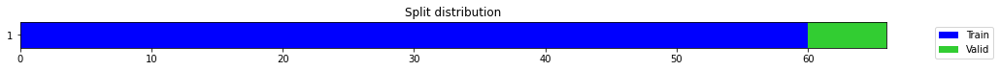

epoch,train_loss,valid_loss,mse,time
0,0.375948,0.395151,0.395151,00:00
1,0.295196,0.223739,0.223739,00:00
2,0.246619,0.382882,0.382882,00:00
3,0.230712,0.092127,0.092127,00:00
4,0.201437,0.115951,0.115951,00:00
5,0.207328,0.001344,0.001344,00:00
6,0.184704,0.281801,0.281801,00:00
7,0.187205,0.421493,0.421493,00:00
8,0.184947,1.839892,1.839892,00:00
9,0.181021,14.958301,14.958301,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12637551625569662,
  "MSE_normalize": 0.01679101373471899,
  "RMSE_normalize": 0.12958014406041918,
  "MAPE_normalize": 0.1300775351095185,
  "MAE": 8151.726300557454,
  "MSE": 69863479.32160802,
  "RMSE": 8358.437612473279,
  "MAPE": 0.068916299964756
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.9
2022-10-14 22:18:16.825756+07:00
PROGRESS: [ 719 / 1944 ]


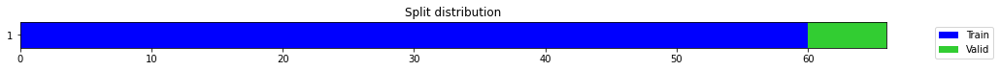

epoch,train_loss,valid_loss,mse,time
0,0.228069,0.288583,0.288583,00:00
1,0.170780,0.090255,0.090255,00:00
2,0.185583,0.128892,0.128892,00:00
3,0.169881,1.177109,1.177109,00:00
4,0.166709,0.085355,0.085355,00:00
5,0.165930,0.188308,0.188308,00:00
6,0.153220,0.920502,0.920502,00:01
7,0.142136,0.965136,0.965136,00:00
8,0.133647,0.654356,0.654356,00:00
9,0.125274,4.518503,4.518503,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1363053818543752,
  "MSE_normalize": 0.018646477188858885,
  "RMSE_normalize": 0.13655210430036913,
  "MAPE_normalize": 0.14082387216068734,
  "MAE": 8792.242351134619,
  "MSE": 77583628.60552326,
  "RMSE": 8808.156935791008,
  "MAPE": 0.07447812464894653
}
Percent CPU Usage: 100.0
Percent Ram Usage: 29.9
2022-10-14 22:19:02.603041+07:00
PROGRESS: [ 720 / 1944 ]


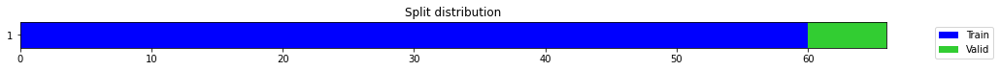

epoch,train_loss,valid_loss,mse,time
0,0.536903,0.037863,0.037863,00:01
1,0.301873,0.119561,0.119561,00:01
2,0.241293,0.362631,0.362631,00:01
3,0.254119,0.309610,0.309610,00:01
4,0.243793,0.005349,0.005349,00:01
5,0.205957,0.880336,0.880336,00:01
6,0.200759,0.973090,0.973090,00:01
7,0.191961,0.002278,0.002278,00:01
8,0.181773,0.077762,0.077762,00:01
9,0.171065,0.436646,0.436646,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.054641505082448326,
  "MSE_normalize": 0.0029899307942358178,
  "RMSE_normalize": 0.05468025963943311,
  "MAPE_normalize": 0.056493894335932195,
  "MAE": 3524.595643838247,
  "MSE": 12440402.43884828,
  "RMSE": 3527.0954677819936,
  "MAPE": 0.0298678945712957
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:20:55.578869+07:00
PROGRESS: [ 721 / 1944 ]


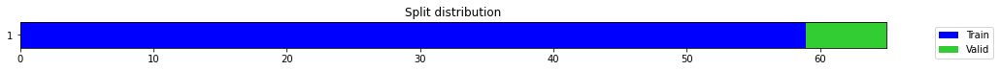

epoch,train_loss,valid_loss,mse,time
0,0.311596,0.472694,0.472694,00:00
1,0.280319,0.123918,0.123918,00:00
2,0.215251,0.011156,0.011156,00:00
3,0.174311,0.274987,0.274987,00:00
4,0.162027,0.012117,0.012117,00:00
5,0.143278,0.180849,0.180849,00:00
6,0.130915,0.003557,0.003557,00:00
7,0.122726,0.226661,0.226661,00:00
8,0.117541,0.226097,0.226097,00:00
9,0.117982,0.137882,0.137882,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3704358736673991,
  "MSE_normalize": 0.13788168684193755,
  "RMSE_normalize": 0.37132423411613946,
  "MAPE_normalize": 0.38264919754947474,
  "MAE": 23894.595595041912,
  "MSE": 573693436.8406881,
  "RMSE": 23951.89839742746,
  "MAPE": 0.20238986578580476
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:20:57.796983+07:00
PROGRESS: [ 722 / 1944 ]


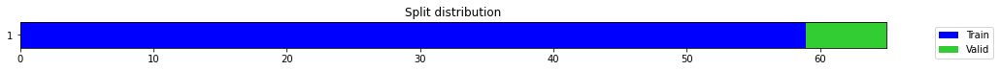

epoch,train_loss,valid_loss,mse,time
0,0.577807,1.210824,1.210824,00:00
1,0.540577,0.565585,0.565585,00:00
2,0.479424,0.056019,0.056019,00:00
3,0.413654,0.058454,0.058454,00:00
4,0.360768,0.134597,0.134597,00:00
5,0.315670,0.126982,0.126982,00:00
6,0.281820,1.028277,1.028277,00:00
7,0.255300,0.286231,0.286231,00:00
8,0.228491,0.025588,0.025588,00:00
9,0.211450,0.015951,0.015951,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14977750182151794,
  "MSE_normalize": 0.02245629932592112,
  "RMSE_normalize": 0.14985426028618978,
  "MAPE_normalize": 0.15485468518731874,
  "MAE": 9661.247977495193,
  "MSE": 93435407.08041628,
  "RMSE": 9666.199205500385,
  "MAPE": 0.08187078757613318
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:02.677340+07:00
PROGRESS: [ 723 / 1944 ]


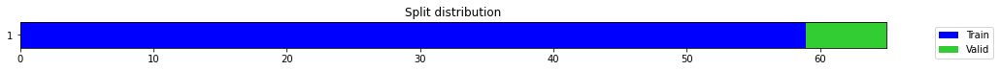

epoch,train_loss,valid_loss,mse,time
0,0.275730,0.191295,0.191295,00:00
1,0.221784,0.021738,0.021738,00:00
2,0.198699,0.065365,0.065365,00:00
3,0.183455,0.519602,0.519602,00:00
4,0.172836,0.573581,0.573581,00:00
5,0.165184,0.019749,0.019749,00:00
6,0.149951,0.636165,0.636165,00:00
7,0.146376,1.402865,1.402865,00:00
8,0.139161,0.000066,0.000066,00:00
9,0.140659,1.023641,1.023641,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.014501680930455526,
  "MSE_normalize": 0.0003483645519448686,
  "RMSE_normalize": 0.018664526566320096,
  "MAPE_normalize": 0.014757128996509598,
  "MAE": 935.4164267381033,
  "MSE": 1449463.388911276,
  "RMSE": 1203.9366216339113,
  "MAPE": 0.007860729202422768
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:12.253469+07:00
PROGRESS: [ 724 / 1944 ]


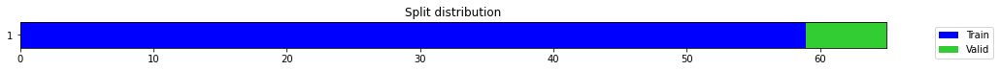

epoch,train_loss,valid_loss,mse,time
0,0.896261,4.164544,4.164544,00:00
1,0.977995,3.277533,3.277533,00:00
2,0.953582,2.584557,2.584557,00:00
3,0.860504,1.935996,1.935996,00:00
4,0.793122,1.168700,1.168700,00:00
5,0.742920,0.568242,0.568242,00:00
6,0.693175,0.150367,0.150367,00:00
7,0.618009,0.000788,0.000788,00:00
8,0.561833,0.056634,0.056634,00:00
9,0.507615,0.171524,0.171524,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13725921511650085,
  "MSE_normalize": 0.01884671663896083,
  "RMSE_normalize": 0.13728334436107256,
  "MAPE_normalize": 0.1419969648364373,
  "MAE": 8853.768411874771,
  "MSE": 78416778.10456997,
  "RMSE": 8855.324844666624,
  "MAPE": 0.07505170465232294
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:31.025325+07:00
PROGRESS: [ 725 / 1944 ]


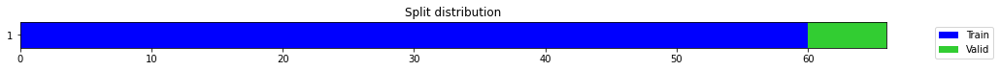

epoch,train_loss,valid_loss,mse,time
0,0.332259,0.449802,0.449802,00:00
1,0.223329,0.057189,0.057189,00:00
2,0.180135,0.030583,0.030583,00:00
3,0.153360,0.037355,0.037355,00:00
4,0.135356,0.038692,0.038692,00:00
5,0.130638,0.750147,0.750147,00:00
6,0.127034,1.356881,1.356881,00:00
7,0.130804,0.395388,0.395388,00:00
8,0.121477,0.060218,0.060218,00:00
9,0.112629,0.042267,0.042267,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2032909393310547,
  "MSE_normalize": 0.04226659788773309,
  "RMSE_normalize": 0.20558841866149244,
  "MAPE_normalize": 0.20959680027533192,
  "MAE": 13113.078750610352,
  "MSE": 175861424.1032172,
  "RMSE": 13261.275357340908,
  "MAPE": 0.11095839557760163
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:33.209108+07:00
PROGRESS: [ 726 / 1944 ]


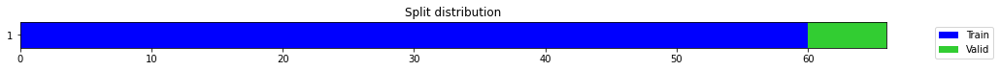

epoch,train_loss,valid_loss,mse,time
0,0.642200,1.000822,1.000822,00:00
1,0.536431,0.515100,0.515100,00:00
2,0.413453,0.008630,0.008630,00:00
3,0.341824,0.298832,0.298832,00:00
4,0.307731,0.021745,0.021745,00:00
5,0.265704,0.159302,0.159302,00:00
6,0.238509,0.386674,0.386674,00:00
7,0.214353,0.080207,0.080207,00:00
8,0.191475,0.041872,0.041872,00:00
9,0.178169,0.142578,0.142578,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.029785245656967163,
  "MSE_normalize": 0.001027476725116235,
  "RMSE_normalize": 0.032054277797452166,
  "MAPE_normalize": 0.03055296562870771,
  "MAE": 1921.26748585701,
  "MSE": 4275090.240094604,
  "RMSE": 2067.6291350468546,
  "MAPE": 0.016213355188521097
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:38.307757+07:00
PROGRESS: [ 727 / 1944 ]


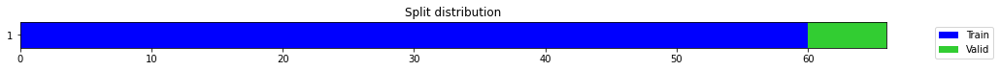

epoch,train_loss,valid_loss,mse,time
0,0.549132,1.495790,1.495790,00:00
1,0.519333,0.897057,0.897057,00:00
2,0.463345,0.288432,0.288432,00:00
3,0.386861,0.001821,0.001821,00:00
4,0.323262,0.080777,0.080777,00:00
5,0.293456,0.204093,0.204093,00:00
6,0.277765,0.157213,0.157213,00:00
7,0.253785,0.006884,0.006884,00:00
8,0.229671,0.554626,0.554626,00:00
9,0.216652,0.264572,0.264572,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.061613996823628746,
  "MSE_normalize": 0.0038032978497923864,
  "RMSE_normalize": 0.06167088332262143,
  "MAPE_normalize": 0.06373287711714416,
  "MAE": 3974.3492511113486,
  "MSE": 15824632.442142032,
  "RMSE": 3978.0186578423727,
  "MAPE": 0.033687664334686944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:21:48.448098+07:00
PROGRESS: [ 728 / 1944 ]


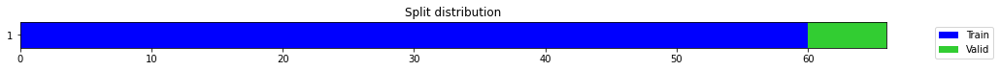

epoch,train_loss,valid_loss,mse,time
0,0.184280,1.085027,1.085027,00:00
1,0.170017,0.615784,0.615784,00:00
2,0.143021,0.259571,0.259571,00:00
3,0.137568,0.062886,0.062886,00:00
4,0.134021,0.002589,0.002589,00:00
5,0.131399,0.010845,0.010845,00:00
6,0.130171,0.101833,0.101833,00:00
7,0.120520,0.308504,0.308504,00:00
8,0.120529,0.435550,0.435550,00:00
9,0.115188,0.308488,0.308488,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0792843500773112,
  "MSE_normalize": 0.006300878969218123,
  "RMSE_normalize": 0.0793780761244446,
  "MAPE_normalize": 0.08208665604907685,
  "MAE": 5114.157717386882,
  "MSE": 26216483.086051878,
  "RMSE": 5120.203422331175,
  "MAPE": 0.04337008986748836
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.2
2022-10-14 22:22:08.360074+07:00
PROGRESS: [ 729 / 1944 ]


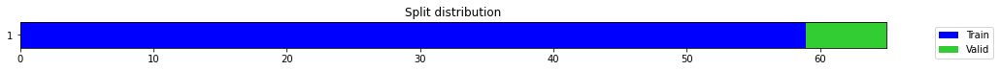

epoch,train_loss,valid_loss,mse,time
0,0.398701,0.015608,0.015608,00:00
1,0.320413,1.567493,1.567493,00:00
2,0.255381,0.516412,0.516412,00:00
3,0.221933,0.040936,0.040936,00:00
4,0.190825,0.155561,0.155561,00:00
5,0.168451,0.008850,0.008850,00:00
6,0.153059,0.002774,0.002774,00:00
7,0.137663,0.077912,0.077912,00:00
8,0.131438,0.101352,0.101352,00:00
9,0.128991,0.099871,0.099871,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.31543924411137897,
  "MSE_normalize": 0.09987133069851357,
  "RMSE_normalize": 0.3160242565033791,
  "MAPE_normalize": 0.3258848150571832,
  "MAE": 20347.09300216039,
  "MSE": 415541238.7430728,
  "RMSE": 20384.82864149397,
  "MAPE": 0.17235485768086975
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.2
2022-10-14 22:22:10.640469+07:00
PROGRESS: [ 730 / 1944 ]


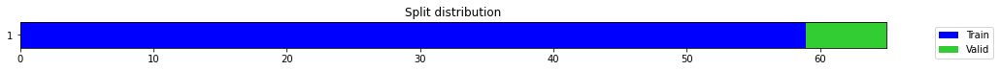

epoch,train_loss,valid_loss,mse,time
0,0.555434,1.174801,1.174801,00:00
1,0.522479,0.277937,0.277937,00:00
2,0.442596,0.158078,0.158078,00:00
3,0.355099,0.949343,0.949343,00:00
4,0.306959,0.306457,0.306457,00:00
5,0.278417,0.016312,0.016312,00:00
6,0.239731,0.141356,0.141356,00:00
7,0.216180,0.286341,0.286341,00:00
8,0.197461,0.029073,0.029073,00:00
9,0.184099,0.032715,0.032715,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.34167035420735675,
  "MSE_normalize": 0.11713486593458693,
  "RMSE_normalize": 0.3422497128334616,
  "MAPE_normalize": 0.3530075847598364,
  "MAE": 22039.10452779134,
  "MSE": 487370769.4693454,
  "RMSE": 22076.47547660961,
  "MAPE": 0.1866938517136688
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.2
2022-10-14 22:22:15.835175+07:00
PROGRESS: [ 731 / 1944 ]


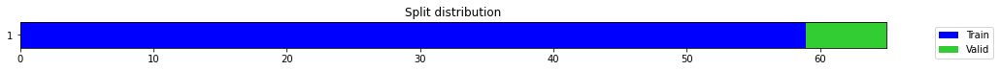

epoch,train_loss,valid_loss,mse,time
0,0.335929,0.617633,0.617633,00:00
1,0.304362,0.313712,0.313712,00:00
2,0.271394,0.045382,0.045382,00:00
3,0.242547,0.029641,0.029641,00:00
4,0.213117,0.198957,0.198957,00:00
5,0.187290,0.192660,0.192660,00:00
6,0.173237,0.031906,0.031906,00:00
7,0.161952,0.008384,0.008384,00:00
8,0.151962,0.039307,0.039307,00:00
9,0.140821,0.119365,0.119365,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09643801053365071,
  "MSE_normalize": 0.00935831665792127,
  "RMSE_normalize": 0.0967383928847346,
  "MAPE_normalize": 0.0999257563862333,
  "MAE": 6220.6374314626055,
  "MSE": 38937765.917245515,
  "RMSE": 6240.01329463692,
  "MAPE": 0.0527755856834615
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:22:25.982650+07:00
PROGRESS: [ 732 / 1944 ]


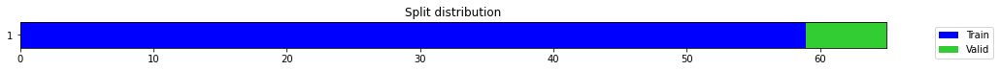

epoch,train_loss,valid_loss,mse,time
0,0.429910,0.439304,0.439304,00:00
1,0.429240,0.306102,0.306102,00:00
2,0.401392,0.151189,0.151189,00:00
3,0.391253,0.052998,0.052998,00:00
4,0.366833,0.002970,0.002970,00:00
5,0.347696,0.039137,0.039137,00:00
6,0.324494,0.183941,0.183941,00:00
7,0.293763,0.282614,0.282614,00:00
8,0.269979,0.240741,0.240741,00:00
9,0.250562,0.073689,0.073689,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.056011329094568886,
  "MSE_normalize": 0.0031974471159508986,
  "RMSE_normalize": 0.0565459734724843,
  "MAPE_normalize": 0.058111358780813166,
  "MAE": 3612.9547719160714,
  "MSE": 13303829.29800571,
  "RMSE": 3647.441472869127,
  "MAPE": 0.03067292402078042
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:22:46.102765+07:00
PROGRESS: [ 733 / 1944 ]


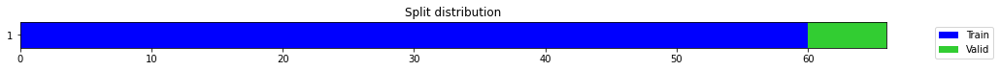

epoch,train_loss,valid_loss,mse,time
0,0.504004,1.571321,1.571321,00:00
1,0.371113,0.046821,0.046821,00:00
2,0.299674,0.034359,0.034359,00:00
3,0.256107,0.184322,0.184322,00:00
4,0.227443,0.002558,0.002558,00:00
5,0.198394,0.028739,0.028739,00:00
6,0.180098,0.000062,0.000062,00:00
7,0.163550,0.001495,0.001495,00:00
8,0.149969,0.010236,0.010236,00:00
9,0.138522,0.010001,0.010001,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09985661506652832,
  "MSE_normalize": 0.010000830014527414,
  "RMSE_normalize": 0.10000414998652513,
  "MAPE_normalize": 0.1032002362846078,
  "MAE": 6441.151098251343,
  "MSE": 41611113.65623845,
  "RMSE": 6450.667690730817,
  "MAPE": 0.054571752548994136
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:22:48.535264+07:00
PROGRESS: [ 734 / 1944 ]


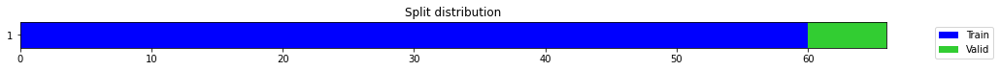

epoch,train_loss,valid_loss,mse,time
0,0.514501,1.160439,1.160439,00:00
1,0.410474,0.294641,0.294641,00:00
2,0.317290,0.065396,0.065396,00:00
3,0.264396,0.525721,0.525721,00:00
4,0.234300,0.670346,0.670346,00:00
5,0.203503,0.015121,0.015121,00:00
6,0.187940,0.105056,0.105056,00:00
7,0.171920,0.327891,0.327891,00:00
8,0.161711,0.005220,0.005220,00:00
9,0.147743,0.004020,0.004020,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.27016722162564594,
  "MSE_normalize": 0.07320738480695788,
  "RMSE_normalize": 0.2705686323411453,
  "MAPE_normalize": 0.2791629770273131,
  "MAE": 17426.866463740665,
  "MSE": 304598798.825025,
  "RMSE": 17452.759060533237,
  "MAPE": 0.14763214573903824
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:22:54.358451+07:00
PROGRESS: [ 735 / 1944 ]


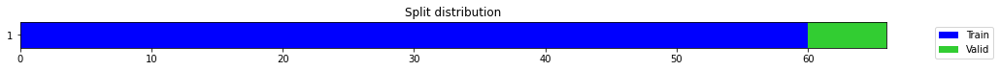

epoch,train_loss,valid_loss,mse,time
0,0.564075,1.295199,1.295199,00:00
1,0.539712,0.883066,0.883066,00:00
2,0.451518,0.345968,0.345968,00:00
3,0.359394,0.012833,0.012833,00:00
4,0.301796,0.083934,0.083934,00:00
5,0.287485,0.096059,0.096059,00:00
6,0.255955,0.032090,0.032090,00:00
7,0.233663,0.287376,0.287376,00:00
8,0.215526,0.531456,0.531456,00:00
9,0.199173,0.072204,0.072204,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1152231792608897,
  "MSE_normalize": 0.013285429185746859,
  "RMSE_normalize": 0.11526243614355398,
  "MAPE_normalize": 0.1191510764796131,
  "MAE": 7432.355955044429,
  "MSE": 55277562.26403008,
  "RMSE": 7434.888181003806,
  "MAPE": 0.06298883093957214
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:23:05.441593+07:00
PROGRESS: [ 736 / 1944 ]


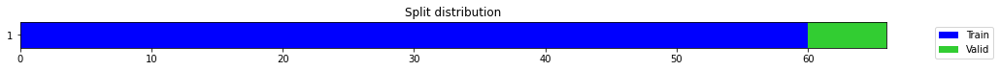

epoch,train_loss,valid_loss,mse,time
0,0.106470,0.061303,0.061303,00:00
1,0.101910,0.011595,0.011595,00:00
2,0.102790,0.002330,0.002330,00:00
3,0.101125,0.002637,0.002637,00:00
4,0.100049,0.002185,0.002185,00:00
5,0.099036,0.009003,0.009003,00:00
6,0.092027,0.001412,0.001412,00:00
7,0.087653,0.019123,0.019123,00:00
8,0.083671,0.057181,0.057181,00:00
9,0.089361,0.001779,0.001779,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06612623731295268,
  "MSE_normalize": 0.004392115850441414,
  "RMSE_normalize": 0.06627304014787169,
  "MAPE_normalize": 0.0683270104772824,
  "MAE": 4265.4068116347,
  "MSE": 18274566.36885157,
  "RMSE": 4274.876181698315,
  "MAPE": 0.03613411374065817
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:23:28.210415+07:00
PROGRESS: [ 737 / 1944 ]


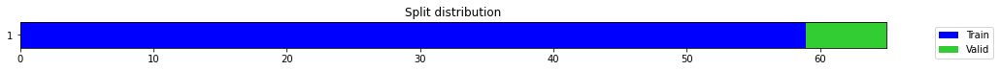

epoch,train_loss,valid_loss,mse,time
0,0.286994,0.083527,0.083527,00:00
1,0.229890,0.289244,0.289244,00:00
2,0.204837,0.091354,0.091354,00:00
3,0.193177,0.186230,0.186230,00:00
4,0.180849,0.021554,0.021554,00:00
5,0.169385,0.205864,0.205864,00:00
6,0.157395,0.042852,0.042852,00:00
7,0.153587,0.060367,0.060367,00:00
8,0.142257,0.077402,0.077402,00:00
9,0.133728,0.084122,0.084122,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.28927727540334064,
  "MSE_normalize": 0.08412200929177634,
  "RMSE_normalize": 0.29003794457238924,
  "MAPE_normalize": 0.29878274974728763,
  "MAE": 18659.541372617085,
  "MSE": 350011997.45885926,
  "RMSE": 18708.6075766974,
  "MAPE": 0.1580395741926671
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:23:31.394130+07:00
PROGRESS: [ 738 / 1944 ]


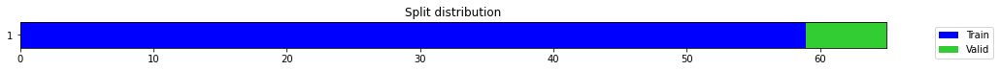

epoch,train_loss,valid_loss,mse,time
0,0.147250,0.199722,0.199722,00:00
1,0.134769,0.066203,0.066203,00:00
2,0.115461,0.144378,0.144378,00:00
3,0.112324,0.133717,0.133717,00:00
4,0.106344,0.000303,0.000303,00:00
5,0.099424,0.935619,0.935619,00:00
6,0.091763,0.310356,0.310356,00:00
7,0.091877,0.195610,0.195610,00:00
8,0.098051,0.438723,0.438723,00:00
9,0.095677,0.004294,0.004294,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07897472381591797,
  "MSE_normalize": 0.006253198124683242,
  "RMSE_normalize": 0.07907716563384933,
  "MAPE_normalize": 0.08167236302418852,
  "MAE": 5094.185585021973,
  "MSE": 26018094.248496965,
  "RMSE": 5100.793492045817,
  "MAPE": 0.04317463439222952
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.0
2022-10-14 22:23:37.725183+07:00
PROGRESS: [ 739 / 1944 ]


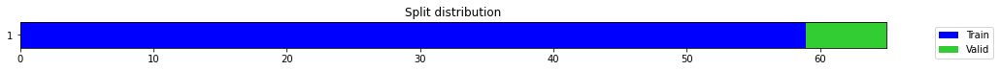

epoch,train_loss,valid_loss,mse,time
0,0.492984,0.770589,0.770589,00:00
1,0.467856,0.316960,0.316960,00:00
2,0.400770,0.036414,0.036414,00:00
3,0.367750,0.002964,0.002964,00:00
4,0.318094,0.015862,0.015862,00:00
5,0.279320,0.192002,0.192002,00:00
6,0.251601,0.483557,0.483557,00:00
7,0.229379,0.186857,0.186857,00:00
8,0.214233,0.030328,0.030328,00:00
9,0.198302,0.262418,0.262418,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.016606509685516357,
  "MSE_normalize": 0.0003891815752190553,
  "RMSE_normalize": 0.019727685500814718,
  "MAPE_normalize": 0.016950922074911202,
  "MAE": 1071.1863007545471,
  "MSE": 1619293.4722247932,
  "RMSE": 1272.5146255445527,
  "MAPE": 0.009016355965530019
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:23:50.021872+07:00
PROGRESS: [ 740 / 1944 ]


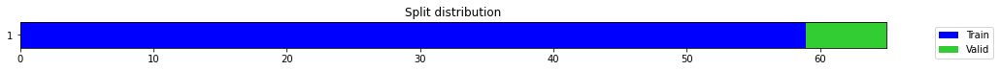

epoch,train_loss,valid_loss,mse,time
0,0.263335,1.828861,1.828861,00:00
1,0.228062,0.935082,0.935082,00:00
2,0.197050,0.253231,0.253231,00:00
3,0.173003,0.002401,0.002401,00:00
4,0.171966,0.057990,0.057990,00:00
5,0.168156,0.068108,0.068108,00:00
6,0.158133,0.016586,0.016586,00:00
7,0.142543,0.006419,0.006419,00:00
8,0.139445,0.024751,0.024751,00:00
9,0.132136,0.225666,0.225666,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.01927836736043294,
  "MSE_normalize": 0.00038322837101863644,
  "RMSE_normalize": 0.019576219528260212,
  "MAPE_normalize": 0.019886029884770232,
  "MAE": 1243.5318082173665,
  "MSE": 1594523.5825013816,
  "RMSE": 1262.7444644508967,
  "MAPE": 0.010525037245028476
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:24:14.673741+07:00
PROGRESS: [ 741 / 1944 ]


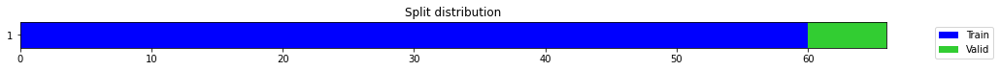

epoch,train_loss,valid_loss,mse,time
0,0.860495,0.046023,0.046023,00:00
1,0.577933,0.004649,0.004649,00:00
2,0.503162,0.739479,0.739479,00:00
3,0.410403,1.463898,1.463898,00:00
4,0.363743,0.085402,0.085402,00:00
5,0.315589,0.487922,0.487922,00:00
6,0.277456,0.421187,0.421187,00:00
7,0.251338,0.184406,0.184406,00:00
8,0.230893,0.104141,0.104141,00:00
9,0.208699,0.068282,0.068282,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2596721847852071,
  "MSE_normalize": 0.06828186108811589,
  "RMSE_normalize": 0.26130798129432614,
  "MAPE_normalize": 0.26796652506840635,
  "MAE": 16749.894607385,
  "MSE": 284104847.1246653,
  "RMSE": 16855.41002540921,
  "MAPE": 0.14179902828620394
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:24:17.956798+07:00
PROGRESS: [ 742 / 1944 ]


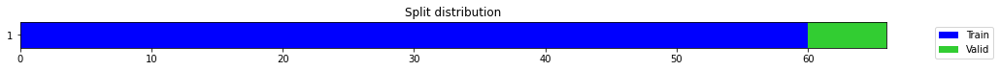

epoch,train_loss,valid_loss,mse,time
0,0.449050,0.302618,0.302618,00:00
1,0.305010,0.000908,0.000908,00:00
2,0.253796,0.255641,0.255641,00:00
3,0.231815,0.071601,0.071601,00:00
4,0.199809,0.005316,0.005316,00:00
5,0.175779,0.294939,0.294939,00:00
6,0.161114,0.063412,0.063412,00:00
7,0.150969,0.150313,0.150313,00:00
8,0.141405,0.475113,0.475113,00:00
9,0.136226,0.175566,0.175566,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.297574520111084,
  "MSE_normalize": 0.08876258770378342,
  "RMSE_normalize": 0.2979305081789769,
  "MAPE_normalize": 0.30751174374869855,
  "MAE": 19194.74684524536,
  "MSE": 369320358.4101216,
  "RMSE": 19217.70949957673,
  "MAPE": 0.16261695883089558
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:24:25.225305+07:00
PROGRESS: [ 743 / 1944 ]


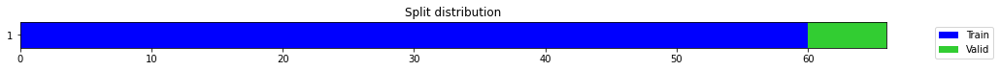

epoch,train_loss,valid_loss,mse,time
0,0.226916,1.071006,1.071006,00:00
1,0.207167,0.630333,0.630333,00:00
2,0.188382,0.232287,0.232287,00:00
3,0.164749,0.003798,0.003798,00:00
4,0.163295,0.006855,0.006855,00:00
5,0.162627,0.076481,0.076481,00:00
6,0.149734,0.829105,0.829105,00:00
7,0.138482,0.619107,0.619107,00:00
8,0.133805,0.123917,0.123917,00:00
9,0.130198,0.071652,0.071652,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07794731855392456,
  "MSE_normalize": 0.006277021426540112,
  "RMSE_normalize": 0.07922765569256807,
  "MAPE_normalize": 0.08031826593012446,
  "MAE": 5027.91383600235,
  "MSE": 26117217.433251936,
  "RMSE": 5110.50070279341,
  "MAPE": 0.0425314106339697
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:24:39.259715+07:00
PROGRESS: [ 744 / 1944 ]


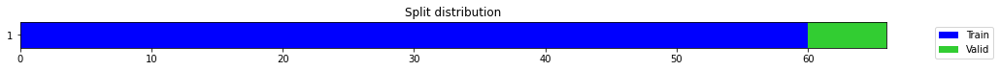

epoch,train_loss,valid_loss,mse,time
0,0.851077,1.311805,1.311805,00:00
1,0.769031,1.105673,1.105673,00:00
2,0.672567,0.818890,0.818890,00:00
3,0.563336,0.463616,0.463616,00:00
4,0.478618,0.157479,0.157479,00:00
5,0.406281,0.001934,0.001934,00:00
6,0.367753,0.106840,0.106840,00:00
7,0.336931,0.328124,0.328124,00:00
8,0.313758,0.405455,0.405455,00:00
9,0.287384,0.098768,0.098768,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.02146736780802409,
  "MSE_normalize": 0.0006753478206640295,
  "RMSE_normalize": 0.02598745506324214,
  "MAPE_normalize": 0.021874872126260773,
  "MAE": 1384.7310930887859,
  "MSE": 2809964.2611985565,
  "RMSE": 1676.294801399371,
  "MAPE": 0.011644917098443786
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:25:07.999260+07:00
PROGRESS: [ 745 / 1944 ]


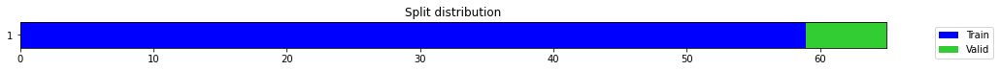

epoch,train_loss,valid_loss,mse,time
0,0.227167,0.346299,0.346299,00:00
1,0.161195,0.178701,0.178701,00:00
2,0.169405,2.196239,2.196239,00:00
3,0.172458,0.023324,0.023324,00:00
4,0.173981,3.229607,3.229607,00:00
5,0.167706,0.212651,0.212651,00:00
6,0.148955,0.092649,0.092649,00:00
7,0.135231,0.102225,0.102225,00:00
8,0.122706,0.016465,0.016465,00:00
9,0.116471,0.001514,0.001514,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03379326065381368,
  "MSE_normalize": 0.0015143796964505185,
  "RMSE_normalize": 0.03891503175445857,
  "MAPE_normalize": 0.034526192866376225,
  "MAE": 2179.8004852135978,
  "MSE": 6300979.576311712,
  "RMSE": 2510.175208289595,
  "MAPE": 0.018356722326304257
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:25:11.001675+07:00
PROGRESS: [ 746 / 1944 ]


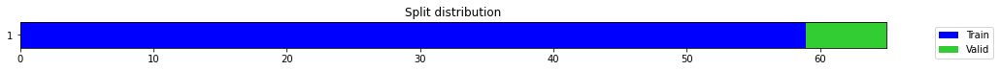

epoch,train_loss,valid_loss,mse,time
0,0.184232,0.010327,0.010327,00:00
1,0.199034,0.036010,0.036010,00:00
2,0.195523,0.066680,0.066680,00:00
3,0.175375,0.250498,0.250498,00:00
4,0.161212,0.105913,0.105913,00:00
5,0.155096,0.017767,0.017767,00:00
6,0.153212,1.334764,1.334764,00:00
7,0.150650,0.700621,0.700621,00:00
8,0.144285,0.088957,0.088957,00:00
9,0.138428,0.484863,0.484863,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3351694146792094,
  "MSE_normalize": 0.11246660124594736,
  "RMSE_normalize": 0.3353604050062371,
  "MAPE_normalize": 0.3464846329241134,
  "MAE": 21619.767924467724,
  "MSE": 467947212.3991609,
  "RMSE": 21632.087564522313,
  "MAPE": 0.18319580744311062
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:25:17.873444+07:00
PROGRESS: [ 747 / 1944 ]


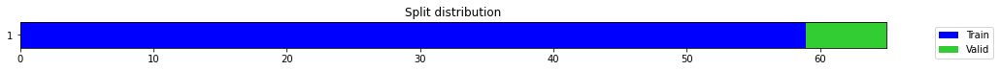

epoch,train_loss,valid_loss,mse,time
0,0.186022,0.015154,0.015154,00:00
1,0.165627,0.035118,0.035118,00:00
2,0.186374,0.122437,0.122437,00:00
3,0.168324,0.001234,0.001234,00:00
4,0.150312,0.480968,0.480968,00:00
5,0.145811,0.501822,0.501822,00:00
6,0.163422,0.637981,0.637981,00:00
7,0.157082,6.193571,6.193571,00:00
8,0.153966,0.307437,0.307437,00:00
9,0.148373,0.000240,0.000240,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.19857139388720194,
  "MSE_normalize": 0.03944337844046627,
  "RMSE_normalize": 0.19860357106675164,
  "MAPE_normalize": 0.2053692481709636,
  "MAE": 12808.649191300074,
  "MSE": 164114668.5713191,
  "RMSE": 12810.724748089746,
  "MAPE": 0.10856079611531262
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:25:31.277467+07:00
PROGRESS: [ 748 / 1944 ]


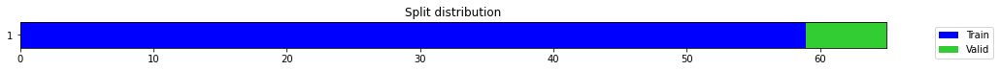

epoch,train_loss,valid_loss,mse,time
0,0.391317,0.628478,0.628478,00:00
1,0.317177,0.107484,0.107484,00:00
2,0.273863,0.002833,0.002833,00:00
3,0.266790,0.012593,0.012593,00:00
4,0.240760,0.015024,0.015024,00:00
5,0.209920,0.000701,0.000701,00:00
6,0.196458,0.091043,0.091043,00:00
7,0.181348,0.200377,0.200377,00:00
8,0.181332,0.071896,0.071896,00:00
9,0.176646,0.377278,0.377278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.026227891445159912,
  "MSE_normalize": 0.0006961252528026781,
  "RMSE_normalize": 0.02638418565737207,
  "MAPE_normalize": 0.027091274777642897,
  "MAE": 1691.803909778595,
  "MSE": 2896414.294740792,
  "RMSE": 1701.885511643128,
  "MAPE": 0.014329413685395682
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:25:57.662885+07:00
PROGRESS: [ 749 / 1944 ]


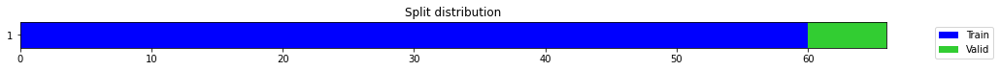

epoch,train_loss,valid_loss,mse,time
0,0.485272,0.409001,0.409001,00:00
1,0.277257,1.478975,1.478975,00:00
2,0.294307,0.071171,0.071171,00:00
3,0.260447,0.178480,0.178480,00:00
4,0.217412,0.312818,0.312818,00:00
5,0.197750,0.864568,0.864568,00:00
6,0.187937,0.037773,0.037773,00:00
7,0.178272,0.311720,0.311720,00:00
8,0.170769,0.346707,0.346707,00:00
9,0.165780,0.338410,0.338410,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5814428081115087,
  "MSE_normalize": 0.33840965968788234,
  "RMSE_normalize": 0.5817298855034717,
  "MAPE_normalize": 0.6010979197988119,
  "MAE": 37505.38689442476,
  "MSE": 1408043411.5154662,
  "RMSE": 37523.90453451595,
  "MAPE": 0.3178101867724839
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:26:01.035857+07:00
PROGRESS: [ 750 / 1944 ]


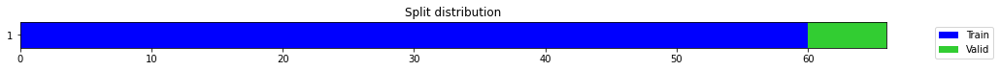

epoch,train_loss,valid_loss,mse,time
0,0.405766,0.439996,0.439996,00:00
1,0.279355,0.025427,0.025427,00:00
2,0.240442,0.112248,0.112248,00:00
3,0.259584,0.001187,0.001187,00:00
4,0.237245,0.042782,0.042782,00:00
5,0.212248,0.652641,0.652641,00:00
6,0.207353,0.036769,0.036769,00:00
7,0.191883,0.558221,0.558221,00:00
8,0.193446,0.336464,0.336464,00:00
9,0.183398,0.319240,0.319240,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0816646118958791,
  "MSE_normalize": 0.007234297708818005,
  "RMSE_normalize": 0.08505467482048241,
  "MAPE_normalize": 0.08393651068632646,
  "MAE": 5267.694125731786,
  "MSE": 30100220.05647662,
  "RMSE": 5486.366744620397,
  "MAPE": 0.04450045475334898
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:26:08.868673+07:00
PROGRESS: [ 751 / 1944 ]


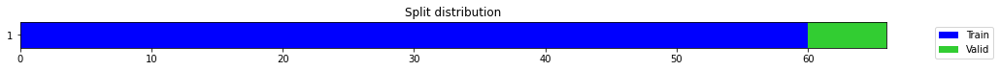

epoch,train_loss,valid_loss,mse,time
0,0.398391,0.570021,0.570021,00:00
1,0.287477,0.090053,0.090053,00:00
2,0.226124,0.094026,0.094026,00:00
3,0.207762,0.205078,0.205078,00:00
4,0.216985,0.035485,0.035485,00:00
5,0.195686,0.125461,0.125461,00:00
6,0.180289,1.106568,1.106568,00:00
7,0.173729,0.390370,0.390370,00:00
8,0.173959,1.133413,1.133413,00:00
9,0.175464,1.928477,1.928477,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11064484715461731,
  "MSE_normalize": 0.012251818819004612,
  "RMSE_normalize": 0.11068793438764955,
  "MAPE_normalize": 0.11440806742376401,
  "MAE": 7137.035220861435,
  "MSE": 50976951.37630364,
  "RMSE": 7139.814519740947,
  "MAPE": 0.06048365887260693
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.1
2022-10-14 22:26:24.372519+07:00
PROGRESS: [ 752 / 1944 ]


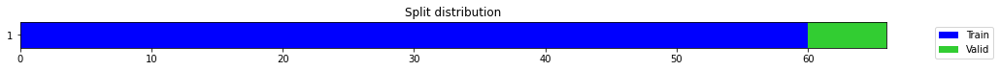

epoch,train_loss,valid_loss,mse,time
0,0.382194,0.604386,0.604386,00:00
1,0.326680,0.167744,0.167744,00:00
2,0.255524,0.001007,0.001007,00:00
3,0.223993,0.074152,0.074152,00:00
4,0.202604,0.199616,0.199616,00:00
5,0.200228,0.145953,0.145953,00:00
6,0.189813,0.017000,0.017000,00:00
7,0.174676,0.002077,0.002077,00:00
8,0.174485,0.375662,0.375662,00:00
9,0.168217,0.381190,0.381190,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.05307215452194214,
  "MSE_normalize": 0.002881012889743554,
  "RMSE_normalize": 0.053675067673395194,
  "MAPE_normalize": 0.05508782236168305,
  "MAE": 3423.3662552833557,
  "MSE": 11987220.523302937,
  "RMSE": 3462.256565204684,
  "MAPE": 0.029070558695946453
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:26:54.994379+07:00
PROGRESS: [ 753 / 1944 ]


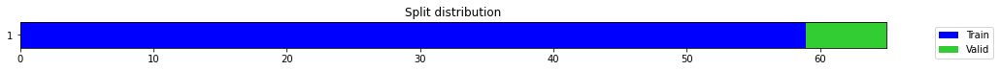

epoch,train_loss,valid_loss,mse,time
0,0.243212,0.042756,0.042756,00:00
1,0.187159,0.927833,0.927833,00:00
2,0.150383,0.006388,0.006388,00:00
3,0.144510,0.001529,0.001529,00:00
4,0.137299,0.104560,0.104560,00:00
5,0.139692,0.065200,0.065200,00:00
6,0.129017,0.269821,0.269821,00:00
7,0.122643,0.061853,0.061853,00:00
8,0.119699,0.099228,0.099228,00:00
9,0.114840,0.097827,0.097827,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3125353157520294,
  "MSE_normalize": 0.09782656503980706,
  "RMSE_normalize": 0.3127723853536419,
  "MAPE_normalize": 0.3230480099763077,
  "MAE": 20159.778007268906,
  "MSE": 407033447.2796429,
  "RMSE": 20175.069944851315,
  "MAPE": 0.17081371745642848
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:26:58.537262+07:00
PROGRESS: [ 754 / 1944 ]


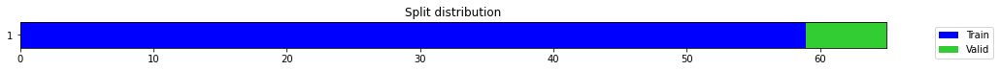

epoch,train_loss,valid_loss,mse,time
0,0.371473,0.220209,0.220209,00:00
1,0.308148,0.067151,0.067151,00:00
2,0.264523,0.110079,0.110079,00:00
3,0.243129,0.495280,0.495280,00:00
4,0.216776,0.106317,0.106317,00:00
5,0.201395,1.817177,1.817177,00:00
6,0.187186,0.003948,0.003948,00:00
7,0.170257,0.268589,0.268589,00:00
8,0.158936,0.008695,0.008695,00:00
9,0.152723,0.060219,0.060219,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.20191031694412231,
  "MSE_normalize": 0.04192474070658273,
  "RMSE_normalize": 0.20475531911670264,
  "MAPE_normalize": 0.20810195635231618,
  "MAE": 13024.023084163666,
  "MSE": 174439036.36156127,
  "RMSE": 13207.537104303787,
  "MAPE": 0.11018498738131825
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.3
2022-10-14 22:27:07.179686+07:00
PROGRESS: [ 755 / 1944 ]


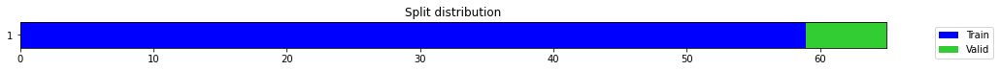

epoch,train_loss,valid_loss,mse,time
0,0.391014,0.064650,0.064650,00:00
1,0.309499,0.017610,0.017610,00:00
2,0.288457,0.223846,0.223846,00:00
3,0.261790,0.114799,0.114799,00:00
4,0.225729,0.174977,0.174977,00:00
5,0.211279,0.107942,0.107942,00:00
6,0.191522,0.097414,0.097414,00:00
7,0.177478,0.143761,0.143761,00:00
8,0.171567,0.130164,0.130164,00:00
9,0.159916,0.876800,0.876800,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.058481425046920776,
  "MSE_normalize": 0.0034297589504526846,
  "RMSE_normalize": 0.05856414389754779,
  "MAPE_normalize": 0.060529798378690235,
  "MAE": 3772.2858412265778,
  "MSE": 14270424.484115357,
  "RMSE": 3777.6215379674227,
  "MAPE": 0.03198525820858522
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.3
2022-10-14 22:27:22.400821+07:00
PROGRESS: [ 756 / 1944 ]


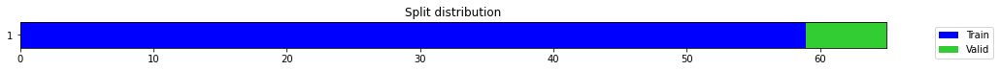

epoch,train_loss,valid_loss,mse,time
0,0.195743,0.250511,0.250511,00:00
1,0.182085,0.215275,0.215275,00:00
2,0.168445,0.272586,0.272586,00:00
3,0.157821,0.244400,0.244400,00:00
4,0.158078,0.136684,0.136684,00:00
5,0.142351,0.041785,0.041785,00:00
6,0.143547,0.152359,0.152359,00:00
7,0.136502,0.762203,0.762203,00:00
8,0.130938,0.678740,0.678740,00:00
9,0.124626,0.009197,0.009197,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.022438218196233112,
  "MSE_normalize": 0.0007170129128883929,
  "RMSE_normalize": 0.02677709679723313,
  "MAPE_normalize": 0.02354068165429439,
  "MAE": 1447.3548265298207,
  "MSE": 2983322.9609791934,
  "RMSE": 1727.229851808726,
  "MAPE": 0.012360563219938786
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.3
2022-10-14 22:27:52.258181+07:00
PROGRESS: [ 757 / 1944 ]


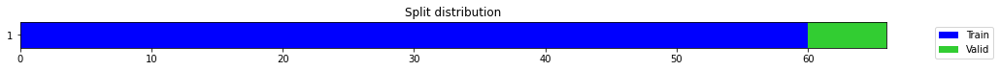

epoch,train_loss,valid_loss,mse,time
0,0.521710,1.116533,1.116533,00:00
1,0.358083,0.512889,0.512889,00:00
2,0.277260,0.287139,0.287139,00:00
3,0.239120,0.688354,0.688354,00:00
4,0.205060,0.068374,0.068374,00:00
5,0.185920,0.679002,0.679002,00:00
6,0.169036,0.293858,0.293858,00:00
7,0.149753,0.048388,0.048388,00:00
8,0.137913,0.005417,0.005417,00:00
9,0.136406,0.002422,0.002422,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.045358111461003624,
  "MSE_normalize": 0.0024224416856402087,
  "RMSE_normalize": 0.04921830640767934,
  "MAPE_normalize": 0.0473693378774814,
  "MAE": 2925.7796216805777,
  "MSE": 10079213.041353537,
  "RMSE": 3174.777636520948,
  "MAPE": 0.024925769356784495
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.3
2022-10-14 22:27:56.052177+07:00
PROGRESS: [ 758 / 1944 ]


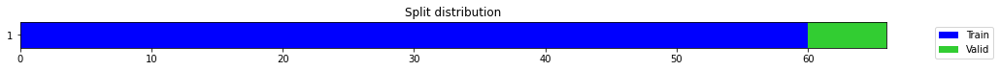

epoch,train_loss,valid_loss,mse,time
0,0.562183,1.613167,1.613167,00:00
1,0.386072,0.006641,0.006641,00:00
2,0.387783,0.281130,0.281130,00:00
3,0.341207,0.019411,0.019411,00:00
4,0.287721,0.452738,0.452738,00:00
5,0.256934,0.142042,0.142042,00:00
6,0.226594,0.044539,0.044539,00:00
7,0.202148,0.272101,0.272101,00:00
8,0.182123,0.041737,0.041737,00:00
9,0.165648,0.022321,0.022321,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05237771073977152,
  "MSE_normalize": 0.00274995995569031,
  "RMSE_normalize": 0.052440060599605626,
  "MAPE_normalize": 0.05422539306195643,
  "MAE": 3378.5718535582223,
  "MSE": 11441939.928997109,
  "RMSE": 3382.593668916961,
  "MAPE": 0.02865069569528574
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:28:05.079617+07:00
PROGRESS: [ 759 / 1944 ]


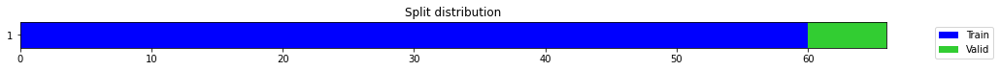

epoch,train_loss,valid_loss,mse,time
0,0.393881,0.449440,0.449440,00:00
1,0.317710,0.015973,0.015973,00:00
2,0.249982,0.287530,0.287530,00:00
3,0.250512,0.453656,0.453656,00:00
4,0.240400,0.012061,0.012061,00:00
5,0.226890,0.670346,0.670346,00:00
6,0.218122,0.606216,0.606216,00:00
7,0.211668,0.130356,0.130356,00:00
8,0.203613,0.588915,0.588915,00:00
9,0.197864,0.229164,0.229164,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15149359901746115,
  "MSE_normalize": 0.022990256900875156,
  "RMSE_normalize": 0.1516253834319147,
  "MAPE_normalize": 0.15685655501136891,
  "MAE": 9771.943111022314,
  "MSE": 95657079.61227083,
  "RMSE": 9780.443732892227,
  "MAPE": 0.0828722822753709
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:28:22.895560+07:00
PROGRESS: [ 760 / 1944 ]


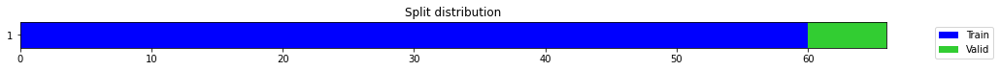

epoch,train_loss,valid_loss,mse,time
0,0.053587,0.146317,0.146317,00:00
1,0.066132,0.189526,0.189526,00:00
2,0.065705,0.190030,0.190030,00:00
3,0.078803,0.072071,0.072071,00:00
4,0.077918,0.086820,0.086820,00:00
5,0.077869,0.013559,0.013559,00:00
6,0.078334,0.005361,0.005361,00:00
7,0.076579,0.089362,0.089362,00:00
8,0.075791,0.030065,0.030065,00:00
9,0.072168,0.084030,0.084030,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11406990885734558,
  "MSE_normalize": 0.01350796888494384,
  "RMSE_normalize": 0.11622378794783726,
  "MAPE_normalize": 0.11748764310741744,
  "MAE": 7357.965400934219,
  "MSE": 56203497.881659746,
  "RMSE": 7496.899217787294,
  "MAPE": 0.06222693859835554
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:28:57.989565+07:00
PROGRESS: [ 761 / 1944 ]


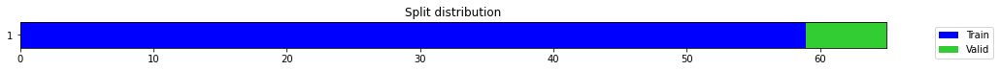

epoch,train_loss,valid_loss,mse,time
0,0.365954,0.050152,0.050152,00:00
1,0.276927,0.356315,0.356315,00:00
2,0.247082,5.712979,5.712979,00:00
3,0.237572,0.034176,0.034176,00:00
4,0.220143,0.052764,0.052764,00:00
5,0.206638,0.627797,0.627797,00:00
6,0.186686,2.854337,2.854337,00:00
7,0.170513,1.311377,1.311377,00:00
8,0.156531,0.528891,0.528891,00:00
9,0.146955,0.206372,0.206372,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4532115658124288,
  "MSE_normalize": 0.20637173688408103,
  "RMSE_normalize": 0.454281561241573,
  "MAPE_normalize": 0.4681511751339708,
  "MAE": 29233.958841164906,
  "MSE": 858664509.4901781,
  "RMSE": 29302.977826326423,
  "MAPE": 0.2476141344172903
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:29:02.042675+07:00
PROGRESS: [ 762 / 1944 ]


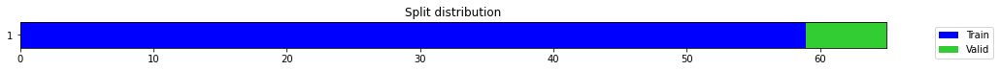

epoch,train_loss,valid_loss,mse,time
0,0.324851,0.164238,0.164238,00:00
1,0.253827,0.214453,0.214453,00:00
2,0.207285,0.069615,0.069615,00:00
3,0.176996,0.091208,0.091208,00:00
4,0.158710,0.402726,0.402726,00:00
5,0.158207,0.109643,0.109643,00:00
6,0.148849,4.915664,4.915664,00:00
7,0.146235,0.212568,0.212568,00:00
8,0.138725,0.192555,0.192555,00:00
9,0.130537,0.817032,0.817032,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.059262325366338096,
  "MSE_normalize": 0.004202109871763208,
  "RMSE_normalize": 0.0648236829543278,
  "MAPE_normalize": 0.06070770108380428,
  "MAE": 3822.6570354302726,
  "MSE": 17483995.949930474,
  "RMSE": 4181.386845285961,
  "MAPE": 0.03223628365363903
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:29:11.523240+07:00
PROGRESS: [ 763 / 1944 ]


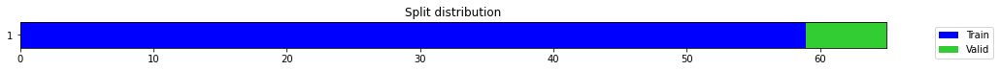

epoch,train_loss,valid_loss,mse,time
0,0.461561,1.478085,1.478085,00:00
1,0.391812,0.145025,0.145025,00:00
2,0.331667,0.046914,0.046914,00:00
3,0.293099,0.000675,0.000675,00:00
4,0.258703,0.117935,0.117935,00:00
5,0.238208,0.035993,0.035993,00:00
6,0.217502,0.041202,0.041202,00:00
7,0.206701,1.462787,1.462787,00:00
8,0.190003,0.194630,0.194630,00:00
9,0.184791,0.708156,0.708156,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0773857831954956,
  "MSE_normalize": 0.006224312036214504,
  "RMSE_normalize": 0.0788943092764903,
  "MAPE_normalize": 0.08040402500695978,
  "MAE": 4991.6925592422485,
  "MSE": 25897905.99326107,
  "RMSE": 5088.998525570731,
  "MAPE": 0.04241060120184695
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.4
2022-10-14 22:29:36.483209+07:00
PROGRESS: [ 764 / 1944 ]


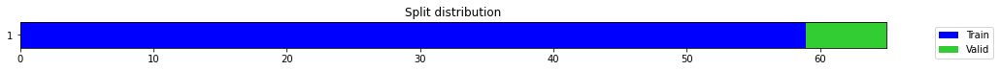

epoch,train_loss,valid_loss,mse,time
0,0.574493,0.247492,0.247492,00:00
1,0.519404,0.115903,0.115903,00:00
2,0.453117,0.067446,0.067446,00:00
3,0.402024,0.077479,0.077479,00:00
4,0.345115,0.045623,0.045623,00:00
5,0.299765,0.014588,0.014588,00:00
6,0.260464,0.135576,0.135576,00:00
7,0.240898,0.279231,0.279231,00:00
8,0.250114,0.060797,0.060797,00:00
9,0.238036,1.838277,1.838277,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05799231926600138,
  "MSE_normalize": 0.0034258360123509135,
  "RMSE_normalize": 0.058530641653333285,
  "MAPE_normalize": 0.06016200003509641,
  "MAE": 3740.736561934153,
  "MSE": 14254102.056578636,
  "RMSE": 3775.4605092066104,
  "MAPE": 0.03175641510711926
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.5
2022-10-14 22:30:25.459112+07:00
PROGRESS: [ 765 / 1944 ]


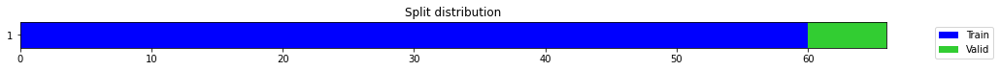

epoch,train_loss,valid_loss,mse,time
0,0.591133,0.500236,0.500236,00:00
1,0.354064,1.670408,1.670408,00:00
2,0.336077,0.624376,0.624376,00:00
3,0.287032,0.114388,0.114388,00:00
4,0.239146,1.632829,1.632829,00:00
5,0.207035,0.000741,0.000741,00:00
6,0.189577,0.120156,0.120156,00:00
7,0.173558,0.031895,0.031895,00:00
8,0.159147,0.001274,0.001274,00:00
9,0.147468,0.003872,0.003872,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06157657504081726,
  "MSE_normalize": 0.003871780986863508,
  "RMSE_normalize": 0.06222363688232558,
  "MAPE_normalize": 0.06389721495063251,
  "MAE": 3971.9353964328766,
  "MSE": 16109574.751536625,
  "RMSE": 4013.673473457529,
  "MAPE": 0.033723762452356316
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.6
2022-10-14 22:30:31.494207+07:00
PROGRESS: [ 766 / 1944 ]


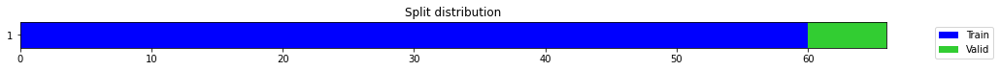

epoch,train_loss,valid_loss,mse,time
0,0.287189,1.509169,1.509169,00:00
1,0.204211,0.075025,0.075025,00:00
2,0.183647,0.072068,0.072068,00:00
3,0.159785,0.056502,0.056502,00:00
4,0.152178,0.149217,0.149217,00:00
5,0.144779,0.364831,0.364831,00:00
6,0.134629,1.423922,1.423922,00:00
7,0.132241,0.246969,0.246969,00:00
8,0.130059,0.052565,0.052565,00:00
9,0.124053,1.483116,1.483116,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04241365194320679,
  "MSE_normalize": 0.00188161443860461,
  "RMSE_normalize": 0.0433775799071895,
  "MAPE_normalize": 0.04367898815225283,
  "MAE": 2735.8502049446106,
  "MSE": 7828957.411360979,
  "RMSE": 2798.0274143333513,
  "MAPE": 0.02313574376881203
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.5
2022-10-14 22:30:45.765927+07:00
PROGRESS: [ 767 / 1944 ]


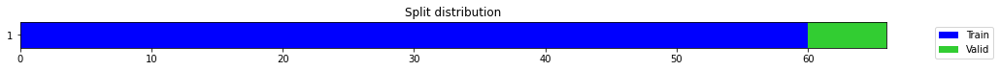

epoch,train_loss,valid_loss,mse,time
0,0.283131,0.187307,0.187307,00:00
1,0.196175,0.005260,0.005260,00:00
2,0.167709,0.001779,0.001779,00:00
3,0.157464,0.000541,0.000541,00:00
4,0.144142,0.079818,0.079818,00:00
5,0.136214,0.081175,0.081175,00:00
6,0.155317,0.179721,0.179721,00:00
7,0.150860,0.094393,0.094393,00:00
8,0.146789,0.213349,0.213349,00:00
9,0.138120,0.023048,0.023048,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.027028848727544148,
  "MSE_normalize": 0.0008765467593665477,
  "RMSE_normalize": 0.029606532376598035,
  "MAPE_normalize": 0.028234784008284924,
  "MAE": 1743.4688583215077,
  "MSE": 3647105.9678072613,
  "RMSE": 1909.7397644200796,
  "MAPE": 0.014855300242999867
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.7
2022-10-14 22:31:12.407419+07:00
PROGRESS: [ 768 / 1944 ]


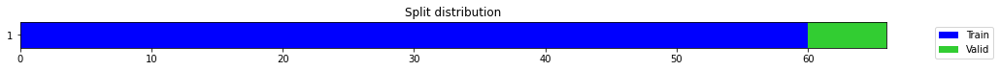

epoch,train_loss,valid_loss,mse,time
0,0.110767,0.273047,0.273047,00:00
1,0.089502,0.126056,0.126056,00:00
2,0.087547,0.056658,0.056658,00:00
3,0.094523,0.080867,0.080867,00:00
4,0.096084,0.208054,0.208054,00:00
5,0.093016,0.503712,0.503712,00:00
6,0.091989,0.444813,0.444813,00:00
7,0.090303,0.051713,0.051713,00:00
8,0.089726,0.128032,0.128032,00:00
9,0.101678,0.083541,0.083541,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.030446887016296387,
  "MSE_normalize": 0.0009657741844589415,
  "RMSE_normalize": 0.031076907575544602,
  "MAPE_normalize": 0.031634795786301594,
  "MAE": 1963.9460000991821,
  "MSE": 4018360.405826879,
  "RMSE": 2004.584846252929,
  "MAPE": 0.016686241588389262
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.7
2022-10-14 22:32:04.475370+07:00
PROGRESS: [ 769 / 1944 ]


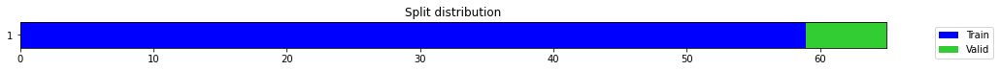

epoch,train_loss,valid_loss,mse,time
0,0.351917,0.073116,0.073116,00:00
1,0.279586,0.101755,0.101755,00:00
2,0.265034,8.034793,8.034793,00:00
3,0.282986,0.437896,0.437896,00:00
4,0.251913,0.012205,0.012205,00:00
5,0.238830,0.825777,0.825777,00:00
6,0.214382,3.095219,3.095219,00:00
7,0.197700,1.288712,1.288712,00:00
8,0.186797,0.201187,0.201187,00:00
9,0.170571,0.092391,0.092391,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3039275308450063,
  "MSE_normalize": 0.09239079258475336,
  "RMSE_normalize": 0.30395853760793323,
  "MAPE_normalize": 0.3143443875607675,
  "MAE": 19604.541449626286,
  "MSE": 384416469.9779466,
  "RMSE": 19606.541509862123,
  "MAPE": 0.16616328668454036
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.7
2022-10-14 22:32:11.313520+07:00
PROGRESS: [ 770 / 1944 ]


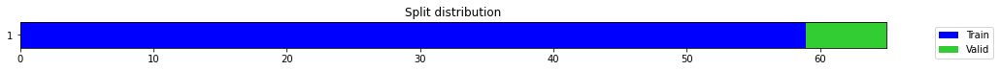

epoch,train_loss,valid_loss,mse,time
0,0.261704,0.033252,0.033252,00:00
1,0.192107,0.008079,0.008079,00:00
2,0.155647,0.014813,0.014813,00:00
3,0.153282,1.719471,1.719471,00:00
4,0.149243,0.025704,0.025704,00:00
5,0.145827,0.529873,0.529873,00:00
6,0.146787,1.596355,1.596355,00:00
7,0.143635,1.380174,1.380174,00:00
8,0.145530,0.250254,0.250254,00:00
9,0.143360,0.342577,0.342577,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.009870479504267374,
  "MSE_normalize": 0.0001545124350581517,
  "RMSE_normalize": 0.012430303095988918,
  "MAPE_normalize": 0.010371658926976855,
  "MAE": 636.6854099432627,
  "MSE": 642890.0888393646,
  "RMSE": 801.8042709036692,
  "MAPE": 0.005441903705312265
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.7
2022-10-14 22:32:26.375429+07:00
PROGRESS: [ 771 / 1944 ]


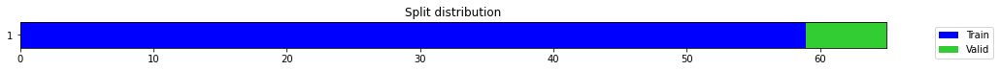

epoch,train_loss,valid_loss,mse,time
0,0.597002,0.837056,0.837056,00:00
1,0.445756,0.129706,0.129706,00:00
2,0.349318,0.001110,0.001110,00:00
3,0.276311,0.032667,0.032667,00:00
4,0.248438,0.048983,0.048983,00:00
5,0.240092,1.229866,1.229866,00:00
6,0.217496,0.533066,0.533066,00:00
7,0.201619,0.002563,0.002563,00:00
8,0.198870,0.209851,0.209851,00:00
9,0.186669,0.501322,0.501322,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1471387247244517,
  "MSE_normalize": 0.021677451397359587,
  "RMSE_normalize": 0.14723264378988643,
  "MAPE_normalize": 0.15232172467976077,
  "MAE": 9491.036299626032,
  "MSE": 90194803.08762549,
  "RMSE": 9497.094455022836,
  "MAPE": 0.08048281699519179
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.7
2022-10-14 22:32:54.972926+07:00
PROGRESS: [ 772 / 1944 ]


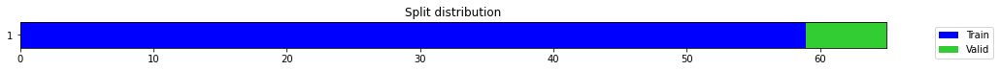

epoch,train_loss,valid_loss,mse,time
0,0.464783,0.144919,0.144919,00:00
1,0.404826,0.130140,0.130140,00:00
2,0.325042,0.502051,0.502051,00:00
3,0.284747,0.453102,0.453102,00:00
4,0.251419,0.050836,0.050836,00:00
5,0.232166,0.010520,0.010520,00:00
6,0.217955,0.174352,0.174352,00:00
7,0.219495,1.942340,1.942340,00:00
8,0.207130,1.477262,1.477262,00:00
9,0.193152,0.676746,0.676746,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13194968303044638,
  "MSE_normalize": 0.01743829496633964,
  "RMSE_normalize": 0.132054136498406,
  "MAPE_normalize": 0.13639382724582674,
  "MAE": 8511.282354195913,
  "MSE": 72556665.07292984,
  "RMSE": 8518.02002069318,
  "MAPE": 0.07211770378627007
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.9
2022-10-14 22:33:49.573412+07:00
PROGRESS: [ 773 / 1944 ]


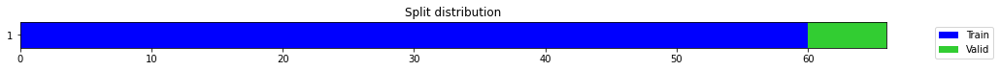

epoch,train_loss,valid_loss,mse,time
0,0.252244,0.006666,0.006666,00:00
1,0.229766,0.036124,0.036124,00:00
2,0.348231,0.041593,0.041593,00:00
3,0.294310,2.281723,2.281723,00:00
4,0.270498,5.771957,5.771957,00:00
5,0.262574,1.097496,1.097496,00:00
6,0.250801,0.195876,0.195876,00:00
7,0.235747,0.206821,0.206821,00:00
8,0.217481,0.381420,0.381420,00:00
9,0.200298,0.236326,0.236326,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4841248194376628,
  "MSE_normalize": 0.23632558389598657,
  "RMSE_normalize": 0.48613329848508274,
  "MAPE_normalize": 0.4998174655040886,
  "MAE": 31227.987353007,
  "MSE": 983295458.1857778,
  "RMSE": 31357.542285481777,
  "MAPE": 0.2644295246266402
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.9
2022-10-14 22:33:57.912997+07:00
PROGRESS: [ 774 / 1944 ]


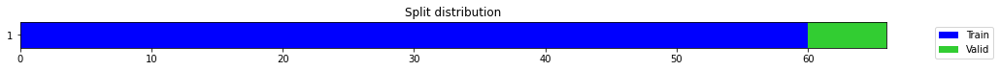

epoch,train_loss,valid_loss,mse,time
0,0.180178,0.003297,0.003297,00:00
1,0.147552,0.179715,0.179715,00:00
2,0.161711,0.001302,0.001302,00:00
3,0.179941,0.310755,0.310755,00:00
4,0.184179,4.654644,4.654644,00:00
5,0.201265,10.490008,10.490008,00:00
6,0.190968,0.444824,0.444824,00:00
7,0.186676,8.836956,8.836956,00:00
8,0.178701,0.312430,0.312430,00:00
9,0.167649,2.687544,2.687544,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0684314767519633,
  "MSE_normalize": 0.004929518336601528,
  "RMSE_normalize": 0.07021052867342283,
  "MAPE_normalize": 0.07115459485091864,
  "MAE": 4414.103976408641,
  "MSE": 20510572.370180484,
  "RMSE": 4528.859941550465,
  "MAPE": 0.0375183129038469
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.9
2022-10-14 22:34:18.693055+07:00
PROGRESS: [ 775 / 1944 ]


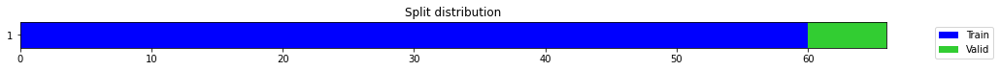

epoch,train_loss,valid_loss,mse,time
0,0.243064,0.053195,0.053195,00:00
1,0.204336,0.350754,0.350754,00:00
2,0.206915,0.526881,0.526881,00:00
3,0.190876,0.120071,0.120071,00:00
4,0.189160,0.410034,0.410034,00:00
5,0.177753,1.655766,1.655766,00:00
6,0.210252,0.846593,0.846593,00:00
7,0.214170,0.000847,0.000847,00:01
8,0.214366,0.578638,0.578638,00:00
9,0.211841,2.997112,2.997112,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.01676444212595622,
  "MSE_normalize": 0.0004304169936209708,
  "RMSE_normalize": 0.02074649352591832,
  "MAPE_normalize": 0.017609283926265838,
  "MAE": 1081.37357489268,
  "MSE": 1790864.3997670242,
  "RMSE": 1338.2318183958355,
  "MAPE": 0.009240815372038488
}
Percent CPU Usage: 100.0
Percent Ram Usage: 30.9
2022-10-14 22:34:55.920002+07:00
PROGRESS: [ 776 / 1944 ]


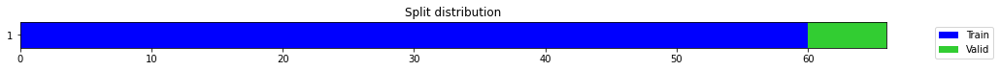

epoch,train_loss,valid_loss,mse,time
0,0.578517,0.101401,0.101401,00:00
1,0.409685,0.097207,0.097207,00:00
2,0.309852,0.395036,0.395036,00:00
3,0.306746,0.276482,0.276482,00:00
4,0.289709,0.000589,0.000589,00:00
5,0.268970,0.156672,0.156672,00:00
6,0.248735,0.323161,0.323161,00:00
7,0.241144,0.118613,0.118613,00:00
8,0.225321,0.555941,0.555941,00:00
9,0.220401,0.322816,0.322816,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11541548371315002,
  "MSE_normalize": 0.01337647081810959,
  "RMSE_normalize": 0.11565669378859829,
  "MAPE_normalize": 0.11922995408377374,
  "MAE": 7444.760361433029,
  "MSE": 55656365.19400611,
  "RMSE": 7460.319376139744,
  "MAPE": 0.06306048535516741
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.1
2022-10-14 22:36:06.245805+07:00
PROGRESS: [ 777 / 1944 ]


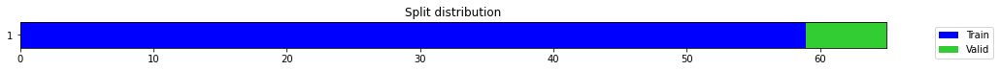

epoch,train_loss,valid_loss,mse,time
0,0.677524,0.026433,0.026433,00:00
1,0.480450,0.716329,0.716329,00:00
2,0.364784,0.242229,0.242229,00:00
3,0.297594,0.002451,0.002451,00:00
4,0.247774,0.246583,0.246583,00:00
5,0.211244,0.258969,0.258969,00:00
6,0.191566,0.015055,0.015055,00:00
7,0.177050,0.013203,0.013203,00:00
8,0.162556,0.000998,0.000998,00:00
9,0.152939,0.004957,0.004957,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07021733125050862,
  "MSE_normalize": 0.004956645120440584,
  "RMSE_normalize": 0.07040344537336637,
  "MAPE_normalize": 0.07273457375968363,
  "MAE": 4529.298734982808,
  "MSE": 20623440.570501406,
  "RMSE": 4541.303840363625,
  "MAPE": 0.038420155614748354
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.1
2022-10-14 22:36:15.595299+07:00
PROGRESS: [ 778 / 1944 ]


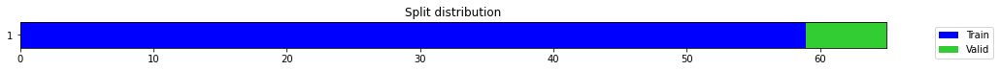

epoch,train_loss,valid_loss,mse,time
0,0.373173,0.141231,0.141231,00:01
1,0.311647,0.152791,0.152791,00:01
2,0.264348,0.076251,0.076251,00:01
3,0.235446,1.801079,1.801079,00:01
4,0.211082,0.395837,0.395837,00:01
5,0.187386,0.751516,0.751516,00:01
6,0.186736,0.000829,0.000829,00:01
7,0.176170,0.006271,0.006271,00:01
8,0.172496,1.696494,1.696494,00:01
9,0.156899,1.883303,1.883303,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.010298848152160645,
  "MSE_normalize": 0.00011236295275314963,
  "RMSE_normalize": 0.010600139279893903,
  "MAPE_normalize": 0.010667237152880564,
  "MAE": 664.3169012069702,
  "MSE": 467515.9552727186,
  "RMSE": 683.7513841102763,
  "MAPE": 0.005634880431815377
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.1
2022-10-14 22:36:50.251548+07:00
PROGRESS: [ 779 / 1944 ]


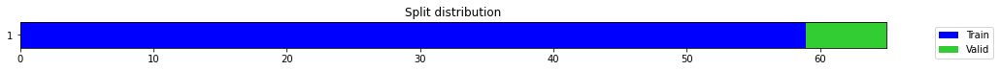

epoch,train_loss,valid_loss,mse,time
0,0.570119,0.127366,0.127366,00:01
1,0.488399,0.012374,0.012374,00:01
2,0.433158,0.027909,0.027909,00:01
3,0.389731,0.027927,0.027927,00:01
4,0.344873,0.023841,0.023841,00:01
5,0.320848,0.712215,0.712215,00:01
6,0.297165,6.923218,6.923218,00:01
7,0.277130,5.075716,5.075716,00:01
8,0.267057,0.090464,0.090464,00:01
9,0.253309,0.383116,0.383116,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15644550323486328,
  "MSE_normalize": 0.02448698394631658,
  "RMSE_normalize": 0.156483174642888,
  "MAPE_normalize": 0.16178768434163412,
  "MAE": 10091.360740661621,
  "MSE": 101884610.6381716,
  "RMSE": 10093.790697164846,
  "MAPE": 0.08552639337182026
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.1
2022-10-14 22:37:55.423655+07:00
PROGRESS: [ 780 / 1944 ]


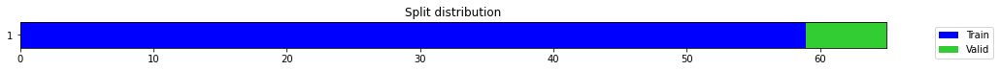

epoch,train_loss,valid_loss,mse,time
0,0.498778,0.000547,0.000547,00:01
1,0.373747,0.118720,0.118720,00:01
2,0.324741,0.107520,0.107520,00:01
3,0.280157,0.018949,0.018949,00:01
4,0.244557,0.001145,0.001145,00:01
5,0.230857,0.001318,0.001318,00:01
6,0.212537,0.360418,0.360418,00:01
7,0.199821,1.003657,1.003657,00:01
8,0.188511,0.243630,0.243630,00:01
9,0.177809,0.158284,0.158284,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08797140916188557,
  "MSE_normalize": 0.007771891925228165,
  "RMSE_normalize": 0.08815833440593218,
  "MAPE_normalize": 0.09088398622758649,
  "MAE": 5674.507776578267,
  "MSE": 32337023.802514166,
  "RMSE": 5686.56520252025,
  "MAPE": 0.048067105209190386
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.4
2022-10-14 22:39:58.568444+07:00
PROGRESS: [ 781 / 1944 ]


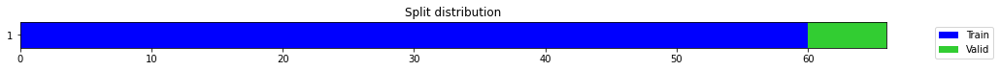

epoch,train_loss,valid_loss,mse,time
0,0.900990,0.126889,0.126889,00:01
1,0.609512,1.327630,1.327630,00:01
2,0.465544,1.779184,1.779184,00:01
3,0.417308,0.745228,0.745228,00:01
4,0.373065,2.058564,2.058564,00:01
5,0.336881,0.125349,0.125349,00:01
6,0.298799,0.578535,0.578535,00:01
7,0.265469,0.137244,0.137244,00:01
8,0.245214,0.189608,0.189608,00:01
9,0.221541,0.134572,0.134572,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.36666397253672284,
  "MSE_normalize": 0.13457187059420406,
  "RMSE_normalize": 0.36684038844462596,
  "MAPE_normalize": 0.37906939946301305,
  "MAE": 23651.29288450877,
  "MSE": 559922065.877914,
  "RMSE": 23662.67241623215,
  "MAPE": 0.2004174404520244
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.4
2022-10-14 22:40:11.795103+07:00
PROGRESS: [ 782 / 1944 ]


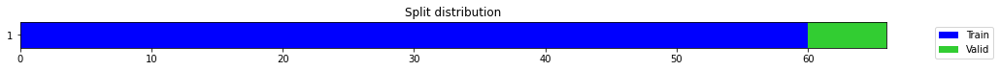

epoch,train_loss,valid_loss,mse,time
0,0.367836,0.073521,0.073521,00:01
1,0.372560,0.480854,0.480854,00:01
2,0.335808,0.927483,0.927483,00:01
3,0.301206,0.198482,0.198482,00:01
4,0.275052,0.060337,0.060337,00:01
5,0.256356,5.663526,5.663526,00:01
6,0.242253,4.292038,4.292038,00:01
7,0.231866,0.099945,0.099945,00:01
8,0.213399,0.750328,0.750328,00:01
9,0.194185,0.466461,0.466461,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08480664094289143,
  "MSE_normalize": 0.0073774616861624525,
  "RMSE_normalize": 0.08589215148174163,
  "MAPE_normalize": 0.08804745985236567,
  "MAE": 5470.367567380269,
  "MSE": 30695891.86812679,
  "RMSE": 5540.387339178263,
  "MAPE": 0.04645884158022154
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.4
2022-10-14 22:40:43.460854+07:00
PROGRESS: [ 783 / 1944 ]


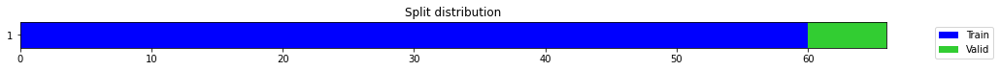

epoch,train_loss,valid_loss,mse,time
0,0.276997,0.007009,0.007009,00:01
1,0.180345,0.180892,0.180892,00:01
2,0.212880,0.055241,0.055241,00:01
3,0.193939,0.801390,0.801390,00:01
4,0.196588,0.900956,0.900956,00:01
5,0.188922,0.299200,0.299200,00:01
6,0.184348,0.434865,0.434865,00:01
7,0.180415,0.420272,0.420272,00:01
8,0.173661,0.188129,0.188129,00:01
9,0.177530,4.748859,4.748859,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1514094869295756,
  "MSE_normalize": 0.023151264727928833,
  "RMSE_normalize": 0.15215539664411787,
  "MAPE_normalize": 0.1569826254758898,
  "MAE": 9766.517544905344,
  "MSE": 96326995.50738578,
  "RMSE": 9814.631705132178,
  "MAPE": 0.08288581957522155
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.5
2022-10-14 22:41:41.615499+07:00
PROGRESS: [ 784 / 1944 ]


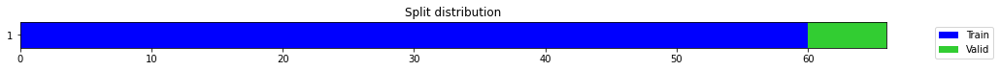

epoch,train_loss,valid_loss,mse,time
0,0.115792,0.244564,0.244564,00:00
1,0.101843,0.044612,0.044612,00:01
2,0.100049,0.101202,0.101202,00:01
3,0.090572,0.019051,0.019051,00:01
4,0.111258,0.205625,0.205625,00:01
5,0.107796,0.214997,0.214997,00:01
6,0.105166,1.020322,1.020322,00:01
7,0.101302,1.527354,1.527354,00:01
8,0.108513,0.019893,0.019893,00:01
9,0.122290,0.242703,0.242703,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.23249617218971252,
  "MSE_normalize": 0.054243889339982,
  "RMSE_normalize": 0.23290317589071644,
  "MAPE_normalize": 0.2402037902409591,
  "MAE": 14996.933090925217,
  "MSE": 225696131.34146178,
  "RMSE": 15023.186457654774,
  "MAPE": 0.1270374923625317
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.6
2022-10-14 22:43:31.554231+07:00
PROGRESS: [ 785 / 1944 ]


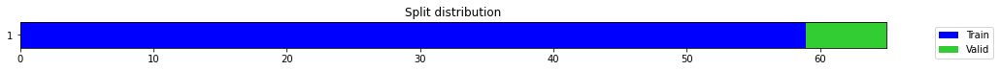

epoch,train_loss,valid_loss,mse,time
0,0.311108,0.216310,0.216310,00:00
1,0.239379,2.252708,2.252708,00:00
2,0.301150,14.575787,14.575787,00:00
3,0.262032,1.163225,1.163225,00:00
4,0.229982,5.550194,5.550194,00:01
5,0.204709,4.146954,4.146954,00:00
6,0.184527,2.872745,2.872745,00:00
7,0.175128,0.082379,0.082379,00:00
8,0.164513,0.047944,0.047944,00:00
9,0.148344,0.078914,0.078914,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2802888850371043,
  "MSE_normalize": 0.07891353370704775,
  "RMSE_normalize": 0.2809155277072589,
  "MAPE_normalize": 0.2895325487690739,
  "MAE": 18079.754240433376,
  "MSE": 328340749.25075483,
  "RMSE": 18120.17519922903,
  "MAPE": 0.1531381841234365
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.6
2022-10-14 22:43:41.855706+07:00
PROGRESS: [ 786 / 1944 ]


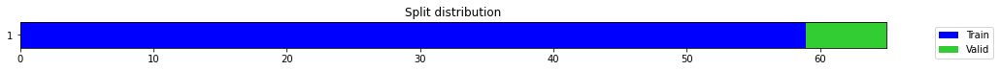

epoch,train_loss,valid_loss,mse,time
0,0.147327,0.054972,0.054972,00:00
1,0.142214,0.304477,0.304477,00:00
2,0.195997,3.062684,3.062684,00:00
3,0.206592,0.003839,0.003839,00:00
4,0.210958,6.045902,6.045902,00:00
5,0.206020,5.131938,5.131938,00:00
6,0.185923,1.482779,1.482779,00:00
7,0.169868,0.898761,0.898761,00:00
8,0.157935,1.049166,1.049166,00:00
9,0.149288,0.358682,0.358682,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.021514296531677246,
  "MSE_normalize": 0.0005414893671928193,
  "RMSE_normalize": 0.023269924090826323,
  "MAPE_normalize": 0.022070915755978745,
  "MAE": 1387.758183479309,
  "MSE": 2253010.557041228,
  "RMSE": 1501.003183554661,
  "MAPE": 0.011711842021013878
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.6
2022-10-14 22:44:05.678389+07:00
PROGRESS: [ 787 / 1944 ]


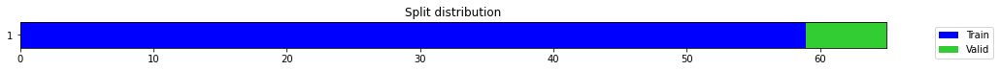

epoch,train_loss,valid_loss,mse,time
0,0.481935,0.013585,0.013585,00:00
1,0.461273,1.696274,1.696274,00:00
2,0.387675,3.469105,3.469105,00:00
3,0.331445,1.556114,1.556114,00:00
4,0.298641,0.320904,0.320904,00:00
5,0.272491,5.506971,5.506971,00:00
6,0.252670,1.042574,1.042574,00:00
7,0.227404,0.097923,0.097923,00:00
8,0.208806,0.005751,0.005751,00:00
9,0.193958,1.933723,1.933723,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05452688535054525,
  "MSE_normalize": 0.0031325339996790547,
  "RMSE_normalize": 0.05596904501310573,
  "MAPE_normalize": 0.05613061922394241,
  "MAE": 3517.202212651571,
  "MSE": 13033741.009829165,
  "RMSE": 3610.2272795253716,
  "MAPE": 0.029736931701120035
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.6
2022-10-14 22:44:51.356872+07:00
PROGRESS: [ 788 / 1944 ]


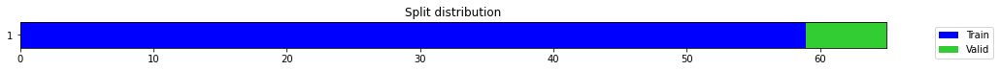

epoch,train_loss,valid_loss,mse,time
0,0.586353,0.034832,0.034832,00:00
1,0.471467,0.176691,0.176691,00:00
2,0.419187,0.240861,0.240861,00:00
3,0.347880,0.029826,0.029826,00:00
4,0.301323,0.002864,0.002864,00:00
5,0.274495,0.057356,0.057356,00:00
6,0.260030,0.194024,0.194024,00:00
7,0.247640,1.676429,1.676429,00:00
8,0.233479,1.844966,1.844966,00:00
9,0.218273,0.145278,0.145278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2307612200578054,
  "MSE_normalize": 0.05333721921335469,
  "RMSE_normalize": 0.23094852069964572,
  "MAPE_normalize": 0.23851618929549412,
  "MAE": 14885.021738608679,
  "MSE": 221923689.09086847,
  "RMSE": 14897.103379209948,
  "MAPE": 0.12611881369192024
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.6
2022-10-14 22:46:15.780578+07:00
PROGRESS: [ 789 / 1944 ]


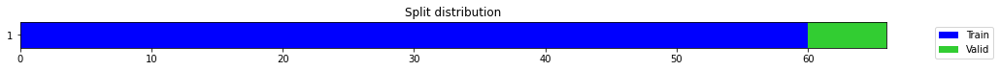

epoch,train_loss,valid_loss,mse,time
0,0.265492,0.051715,0.051715,00:00
1,0.300370,0.285740,0.285740,00:00
2,0.306780,2.022939,2.022939,00:00
3,0.325822,0.183376,0.183376,00:00
4,0.310156,5.872669,5.872669,00:00
5,0.277456,0.347261,0.347261,00:00
6,0.260861,0.016711,0.016711,00:00
7,0.244644,0.148656,0.148656,00:00
8,0.219786,0.125856,0.125856,00:00
9,0.198520,0.043326,0.043326,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.20805007219314575,
  "MSE_normalize": 0.04332593568194317,
  "RMSE_normalize": 0.20814883060431344,
  "MAPE_normalize": 0.2151178741611216,
  "MAE": 13420.061856746674,
  "MSE": 180269080.79683092,
  "RMSE": 13426.432169300633,
  "MAPE": 0.1137275868637093
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.7
2022-10-14 22:46:25.650646+07:00
PROGRESS: [ 790 / 1944 ]


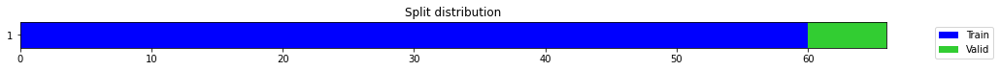

epoch,train_loss,valid_loss,mse,time
0,0.420524,0.014087,0.014087,00:00
1,0.299657,0.565735,0.565735,00:00
2,0.271635,0.412654,0.412654,00:00
3,0.248459,1.001810,1.001810,00:00
4,0.242180,2.734803,2.734803,00:00
5,0.243371,0.083244,0.083244,00:00
6,0.242912,0.440487,0.440487,00:00
7,0.227409,2.233275,2.233275,00:00
8,0.207507,3.039011,3.039011,00:00
9,0.194607,1.240658,1.240658,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2711420754591624,
  "MSE_normalize": 0.0735897921219782,
  "RMSE_normalize": 0.2712743853038436,
  "MAPE_normalize": 0.2806927910374669,
  "MAE": 17489.748435417812,
  "MSE": 306189906.18563145,
  "RMSE": 17498.282949639128,
  "MAPE": 0.14831079651179083
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.7
2022-10-14 22:46:49.501803+07:00
PROGRESS: [ 791 / 1944 ]


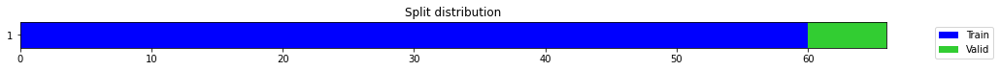

epoch,train_loss,valid_loss,mse,time
0,0.168007,0.003926,0.003926,00:01
1,0.136096,0.059963,0.059963,00:01
2,0.127470,0.087483,0.087483,00:01
3,0.128622,0.074322,0.074322,00:01
4,0.131473,0.343279,0.343279,00:01
5,0.128545,1.221470,1.221470,00:01
6,0.147815,1.875755,1.875755,00:01
7,0.141806,0.029924,0.029924,00:01
8,0.150250,2.021083,2.021083,00:01
9,0.157738,7.487542,7.487542,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.41149338086446124,
  "MSE_normalize": 0.16947827118821124,
  "RMSE_normalize": 0.4116773872684911,
  "MAPE_normalize": 0.42541810422407506,
  "MAE": 26542.969039281208,
  "MSE": 705159431.2103412,
  "RMSE": 26554.838188366753,
  "MAPE": 0.22492181124911803
}
Percent CPU Usage: 100.0
Percent Ram Usage: 31.7
2022-10-14 22:48:14.363837+07:00
PROGRESS: [ 792 / 1944 ]


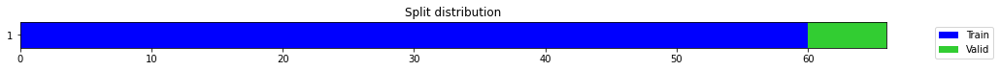

epoch,train_loss,valid_loss,mse,time
0,0.247882,0.002178,0.002178,00:01
1,0.162361,0.068369,0.068369,00:01
2,0.143032,0.003045,0.003045,00:01
3,0.130779,0.019251,0.019251,00:01
4,0.140044,0.066550,0.066550,00:01
5,0.132534,0.492083,0.492083,00:01
6,0.127659,0.011213,0.011213,00:01
7,0.125537,0.011619,0.011619,00:01
8,0.120993,0.483172,0.483172,00:01
9,0.126252,0.106979,0.106979,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.009992986917495728,
  "MSE_normalize": 0.0001450600093952185,
  "RMSE_normalize": 0.012044086075548384,
  "MAPE_normalize": 0.010191073147635102,
  "MAE": 644.5876281261444,
  "MSE": 603560.7573722658,
  "RMSE": 776.891728217173,
  "MAPE": 0.005423044887738484
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:50:54.412555+07:00
PROGRESS: [ 793 / 1944 ]


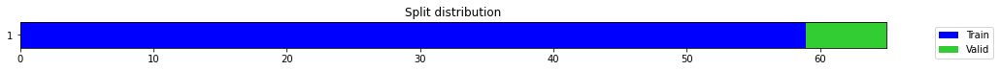

epoch,train_loss,valid_loss,mse,time
0,0.493970,1.409565,1.409565,00:00
1,0.511411,0.005953,0.005953,00:00
2,0.432255,0.001190,0.001190,00:00
3,0.356729,0.539555,0.539555,00:00
4,0.320246,0.117503,0.117503,00:00
5,0.294111,0.016051,0.016051,00:00
6,0.273744,0.363584,0.363584,00:00
7,0.248975,0.503367,0.503367,00:00
8,0.234303,0.466236,0.466236,00:00
9,0.223146,0.409976,0.409976,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6394783407449722,
  "MSE_normalize": 0.4099761605147389,
  "RMSE_normalize": 0.6402938079622034,
  "MAPE_normalize": 0.6608127461307575,
  "MAE": 41248.91089141369,
  "MSE": 1705814876.0398867,
  "RMSE": 41301.51178879396,
  "MAPE": 0.34945276042005696
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:50:56.675221+07:00
PROGRESS: [ 794 / 1944 ]


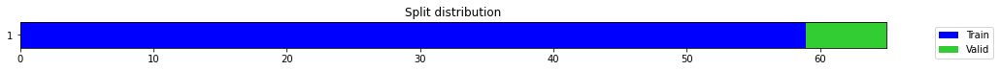

epoch,train_loss,valid_loss,mse,time
0,0.184839,0.029105,0.029105,00:00
1,0.242152,0.151591,0.151591,00:00
2,0.259015,0.761684,0.761684,00:00
3,0.254312,0.391280,0.391280,00:00
4,0.251242,0.027056,0.027056,00:00
5,0.236367,0.003413,0.003413,00:00
6,0.221499,0.000566,0.000566,00:00
7,0.202697,0.092120,0.092120,00:00
8,0.201864,0.229607,0.229607,00:00
9,0.199988,0.242546,0.242546,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.05690102775891622,
  "MSE_normalize": 0.00330474900837352,
  "RMSE_normalize": 0.057486946417195615,
  "MAPE_normalize": 0.05904326644566412,
  "MAE": 3670.343894561132,
  "MSE": 13750287.36545024,
  "RMSE": 3708.137991694786,
  "MAPE": 0.031162630336356963
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:01.521698+07:00
PROGRESS: [ 795 / 1944 ]


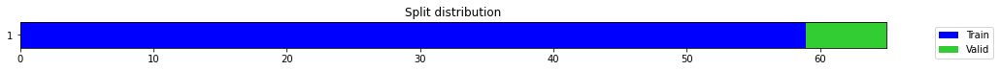

epoch,train_loss,valid_loss,mse,time
0,0.429228,0.330426,0.330426,00:00
1,0.374551,0.172979,0.172979,00:00
2,0.326181,0.051593,0.051593,00:00
3,0.315807,0.005009,0.005009,00:00
4,0.282727,0.054936,0.054936,00:00
5,0.266930,0.181629,0.181629,00:00
6,0.265136,0.583523,0.583523,00:00
7,0.251254,1.216086,1.216086,00:00
8,0.236306,0.120868,0.120868,00:00
9,0.225001,0.158645,0.158645,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14542688926060995,
  "MSE_normalize": 0.021494498629909486,
  "RMSE_normalize": 0.14661002226965755,
  "MAPE_normalize": 0.1500265581672335,
  "MAE": 9380.616064866384,
  "MSE": 89433579.43028595,
  "RMSE": 9456.932876481991,
  "MAPE": 0.07940037418243802
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:10.794338+07:00
PROGRESS: [ 796 / 1944 ]


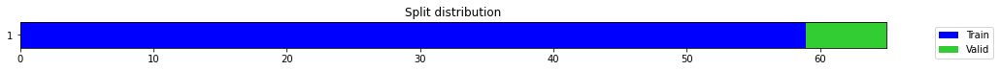

epoch,train_loss,valid_loss,mse,time
0,0.407568,0.472346,0.472346,00:00
1,0.361317,0.352836,0.352836,00:00
2,0.332379,0.222714,0.222714,00:00
3,0.323606,0.117442,0.117442,00:00
4,0.307890,0.040401,0.040401,00:00
5,0.304855,0.000789,0.000789,00:00
6,0.286318,0.002405,0.002405,00:00
7,0.276715,0.003099,0.003099,00:00
8,0.260661,0.002747,0.002747,00:00
9,0.257237,0.049002,0.049002,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06177176038424174,
  "MSE_normalize": 0.00387688600491091,
  "RMSE_normalize": 0.062264644903114244,
  "MAPE_normalize": 0.06406977215446409,
  "MAE": 3984.525631825129,
  "MSE": 16130815.537139326,
  "RMSE": 4016.318654830481,
  "MAPE": 0.03382238099170556
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:29.543486+07:00
PROGRESS: [ 797 / 1944 ]


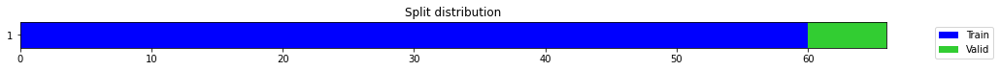

epoch,train_loss,valid_loss,mse,time
0,0.422403,0.359211,0.359211,00:00
1,0.291433,0.038523,0.038523,00:00
2,0.265443,0.448060,0.448060,00:00
3,0.256608,0.351485,0.351485,00:00
4,0.233680,0.423239,0.423239,00:00
5,0.222303,0.099434,0.099434,00:00
6,0.200885,0.000555,0.000555,00:00
7,0.187071,0.001079,0.001079,00:00
8,0.179742,0.000772,0.000772,00:00
9,0.169774,0.002659,0.002659,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.048923750718434654,
  "MSE_normalize": 0.002659491704498862,
  "RMSE_normalize": 0.05157025988395698,
  "MAPE_normalize": 0.05023669545858581,
  "MAE": 3155.777616341909,
  "MSE": 11065522.70391278,
  "RMSE": 3326.4880435547607,
  "MAPE": 0.026646045947008024
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:31.840026+07:00
PROGRESS: [ 798 / 1944 ]


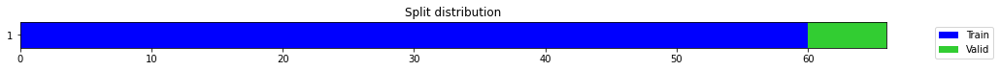

epoch,train_loss,valid_loss,mse,time
0,0.548733,0.735290,0.735290,00:00
1,0.425939,0.378205,0.378205,00:00
2,0.384862,0.006108,0.006108,00:00
3,0.324677,0.375151,0.375151,00:00
4,0.301187,0.117852,0.117852,00:00
5,0.269043,0.013861,0.013861,00:00
6,0.258783,0.598194,0.598194,00:00
7,0.241132,0.007549,0.007549,00:00
8,0.230159,0.698044,0.698044,00:00
9,0.218088,0.093116,0.093116,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04029488563537598,
  "MSE_normalize": 0.0017139122677273615,
  "RMSE_normalize": 0.041399423519263664,
  "MAPE_normalize": 0.041885009846765985,
  "MAE": 2599.181303024292,
  "MSE": 7131187.917965499,
  "RMSE": 2670.4284146865834,
  "MAPE": 0.02208852184612992
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:37.122656+07:00
PROGRESS: [ 799 / 1944 ]


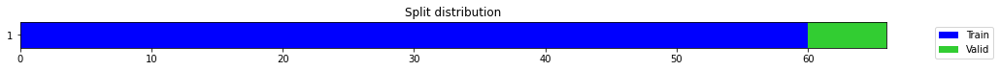

epoch,train_loss,valid_loss,mse,time
0,0.208030,0.560960,0.560960,00:00
1,0.321230,0.286382,0.286382,00:00
2,0.279252,0.032890,0.032890,00:00
3,0.253091,0.032043,0.032043,00:00
4,0.230069,0.291807,0.291807,00:00
5,0.214859,0.448644,0.448644,00:00
6,0.209283,0.004093,0.004093,00:00
7,0.189151,0.397002,0.397002,00:00
8,0.183327,0.707489,0.707489,00:00
9,0.181525,0.024641,0.024641,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03713598847389221,
  "MSE_normalize": 0.0013971833774461355,
  "RMSE_normalize": 0.037378916215510254,
  "MAPE_normalize": 0.03850897809219657,
  "MAE": 2395.4198005199432,
  "MSE": 5813353.11499798,
  "RMSE": 2411.089611565273,
  "MAPE": 0.020331037245738637
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:51:48.253888+07:00
PROGRESS: [ 800 / 1944 ]


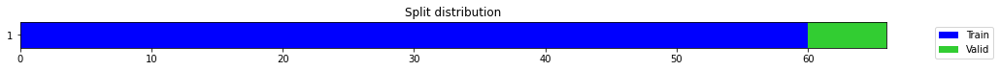

epoch,train_loss,valid_loss,mse,time
0,0.521548,1.517326,1.517326,00:00
1,0.443700,1.146929,1.146929,00:00
2,0.388776,0.780249,0.780249,00:00
3,0.318965,0.458973,0.458973,00:00
4,0.286263,0.173258,0.173258,00:00
5,0.258508,0.010633,0.010633,00:00
6,0.246072,0.027601,0.027601,00:00
7,0.242392,0.087680,0.087680,00:00
8,0.247557,0.007191,0.007191,00:00
9,0.236864,0.036213,0.036213,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14894038438796997,
  "MSE_normalize": 0.022185612678946143,
  "RMSE_normalize": 0.14894835574435236,
  "MAPE_normalize": 0.15408733028750723,
  "MAE": 9607.250554561615,
  "MSE": 92309143.27869783,
  "RMSE": 9607.764738933705,
  "MAPE": 0.08144053539224107
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:07.713407+07:00
PROGRESS: [ 801 / 1944 ]


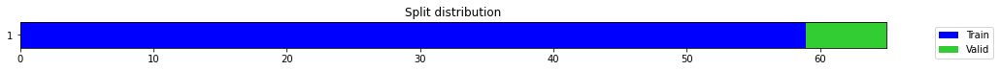

epoch,train_loss,valid_loss,mse,time
0,0.449590,1.374299,1.374299,00:00
1,0.373250,0.017490,0.017490,00:00
2,0.340968,0.881404,0.881404,00:00
3,0.292133,0.236506,0.236506,00:00
4,0.251860,0.032651,0.032651,00:00
5,0.239984,0.249681,0.249681,00:00
6,0.232169,0.336362,0.336362,00:00
7,0.221864,0.163026,0.163026,00:00
8,0.209473,0.058468,0.058468,00:00
9,0.200530,0.043196,0.043196,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.20769337813059488,
  "MSE_normalize": 0.043196358454016114,
  "RMSE_normalize": 0.20783733652550523,
  "MAPE_normalize": 0.2150214103836872,
  "MAE": 13397.053662935892,
  "MSE": 179729940.27042452,
  "RMSE": 13406.33955524119,
  "MAPE": 0.11360866883501107
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:09.970346+07:00
PROGRESS: [ 802 / 1944 ]


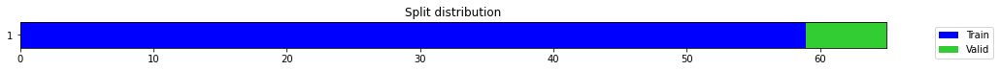

epoch,train_loss,valid_loss,mse,time
0,0.504492,1.093817,1.093817,00:00
1,0.476408,0.637006,0.637006,00:00
2,0.421360,0.052760,0.052760,00:00
3,0.372081,0.145781,0.145781,00:00
4,0.325052,0.007127,0.007127,00:00
5,0.288214,0.293736,0.293736,00:00
6,0.259986,0.107149,0.107149,00:00
7,0.240039,1.002365,1.002365,00:00
8,0.221183,0.938746,0.938746,00:00
9,0.215426,0.118431,0.118431,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.08085467418034871,
  "MSE_normalize": 0.006584418533692589,
  "RMSE_normalize": 0.08114443008421829,
  "MAPE_normalize": 0.08375587184544385,
  "MAE": 5215.449903329213,
  "MSE": 27396224.870108675,
  "RMSE": 5234.1403181524165,
  "MAPE": 0.044241113455875204
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:15.018578+07:00
PROGRESS: [ 803 / 1944 ]


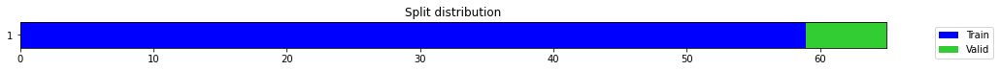

epoch,train_loss,valid_loss,mse,time
0,0.993227,2.748309,2.748309,00:00
1,0.840685,1.690619,1.690619,00:00
2,0.709687,0.660849,0.660849,00:00
3,0.600492,0.064035,0.064035,00:00
4,0.521370,0.094860,0.094860,00:00
5,0.471763,0.261447,0.261447,00:00
6,0.417497,0.239405,0.239405,00:00
7,0.380920,0.073370,0.073370,00:00
8,0.345673,0.042107,0.042107,00:00
9,0.321677,0.000172,0.000172,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05171725153923035,
  "MSE_normalize": 0.0027876461351083273,
  "RMSE_normalize": 0.05279816412630582,
  "MAPE_normalize": 0.05373654375785968,
  "MAE": 3335.9695932865143,
  "MSE": 11598743.303592473,
  "RMSE": 3405.692778803231,
  "MAPE": 0.02834380812070167
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:25.420558+07:00
PROGRESS: [ 804 / 1944 ]


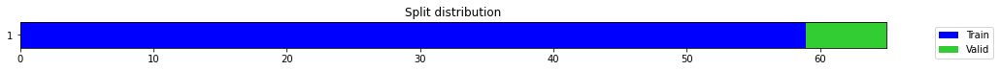

epoch,train_loss,valid_loss,mse,time
0,0.480316,1.214419,1.214419,00:00
1,0.416330,0.900896,0.900896,00:00
2,0.359889,0.567596,0.567596,00:00
3,0.313026,0.230831,0.230831,00:00
4,0.293243,0.021498,0.021498,00:00
5,0.271911,0.037772,0.037772,00:00
6,0.262418,0.179193,0.179193,00:00
7,0.259472,0.137021,0.137021,00:00
8,0.242607,0.064935,0.064935,00:00
9,0.229871,0.017657,0.017657,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1004958947499593,
  "MSE_normalize": 0.010108801389156005,
  "RMSE_normalize": 0.10054253522343667,
  "MAPE_normalize": 0.1039369244230031,
  "MAE": 6482.387194951375,
  "MSE": 42060357.2824939,
  "RMSE": 6485.39569205256,
  "MAPE": 0.05494216195440863
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:45.520925+07:00
PROGRESS: [ 805 / 1944 ]


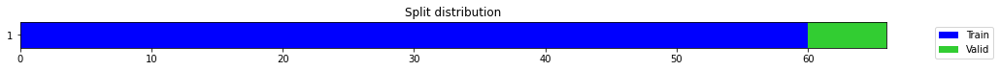

epoch,train_loss,valid_loss,mse,time
0,0.562781,0.908828,0.908828,00:00
1,0.419001,0.034999,0.034999,00:00
2,0.346985,0.901128,0.901128,00:00
3,0.280834,0.008782,0.008782,00:00
4,0.248529,0.001527,0.001527,00:00
5,0.228049,0.075404,0.075404,00:00
6,0.211357,0.102195,0.102195,00:00
7,0.201989,0.147492,0.147492,00:00
8,0.193063,0.079742,0.079742,00:00
9,0.192390,0.066219,0.066219,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.255951186021169,
  "MSE_normalize": 0.06621909351933535,
  "RMSE_normalize": 0.2573307084654596,
  "MAPE_normalize": 0.26417476912576326,
  "MAE": 16509.875303109486,
  "MSE": 275522153.92557627,
  "RMSE": 16598.860018856,
  "MAPE": 0.13978021874474855
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:47.868351+07:00
PROGRESS: [ 806 / 1944 ]


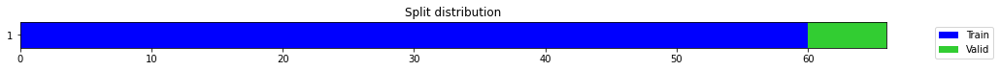

epoch,train_loss,valid_loss,mse,time
0,0.398642,0.357150,0.357150,00:00
1,0.307393,0.001733,0.001733,00:00
2,0.288337,0.123114,0.123114,00:00
3,0.272046,0.228861,0.228861,00:00
4,0.265946,0.143145,0.143145,00:00
5,0.246510,0.258806,0.258806,00:00
6,0.233041,0.027520,0.027520,00:00
7,0.218659,0.680024,0.680024,00:00
8,0.205774,0.289867,0.289867,00:00
9,0.197695,0.030460,0.030460,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.34167587757110596,
  "MSE_normalize": 0.11733982688050659,
  "RMSE_normalize": 0.34254901383671593,
  "MAPE_normalize": 0.3529084494132593,
  "MAE": 22039.46080684662,
  "MSE": 488223564.0077352,
  "RMSE": 22095.781588523525,
  "MAPE": 0.18666756478178917
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:52:53.733118+07:00
PROGRESS: [ 807 / 1944 ]


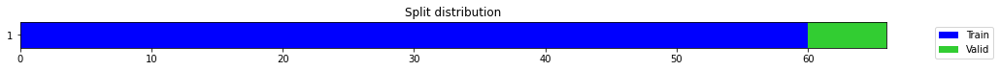

epoch,train_loss,valid_loss,mse,time
0,0.393754,1.225455,1.225455,00:00
1,0.406671,0.869423,0.869423,00:00
2,0.372536,0.290946,0.290946,00:00
3,0.299672,0.009658,0.009658,00:00
4,0.258245,0.456291,0.456291,00:00
5,0.250999,0.965161,0.965161,00:00
6,0.240938,0.097646,0.097646,00:00
7,0.230248,0.133240,0.133240,00:00
8,0.218486,0.182451,0.182451,00:00
9,0.207783,0.019725,0.019725,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09395292401313782,
  "MSE_normalize": 0.008882814865082503,
  "RMSE_normalize": 0.09424868627775404,
  "MAPE_normalize": 0.0970300913115157,
  "MAE": 6060.339410543442,
  "MSE": 36959314.2170549,
  "RMSE": 6079.417259660247,
  "MAPE": 0.0513261481273063
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.0
2022-10-14 22:53:04.842622+07:00
PROGRESS: [ 808 / 1944 ]


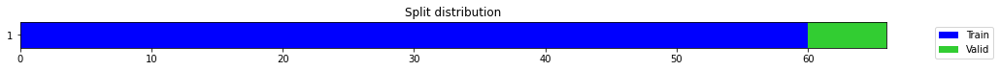

epoch,train_loss,valid_loss,mse,time
0,1.002612,2.900685,2.900685,00:00
1,0.885048,2.014492,2.014492,00:00
2,0.816570,1.204708,1.204708,00:00
3,0.730518,0.496568,0.496568,00:00
4,0.661547,0.064772,0.064772,00:00
5,0.597344,0.038411,0.038411,00:00
6,0.537945,0.337711,0.337711,00:00
7,0.478317,0.520232,0.520232,00:00
8,0.446494,0.387585,0.387585,00:00
9,0.422601,0.248237,0.248237,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1026032567024231,
  "MSE_normalize": 0.010549000180118876,
  "RMSE_normalize": 0.10270832575852298,
  "MAPE_normalize": 0.10622439425892839,
  "MAE": 6618.320470333099,
  "MSE": 43891921.4522165,
  "RMSE": 6625.097844727767,
  "MAPE": 0.056124590684519825
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.2
2022-10-14 22:53:27.022050+07:00
PROGRESS: [ 809 / 1944 ]


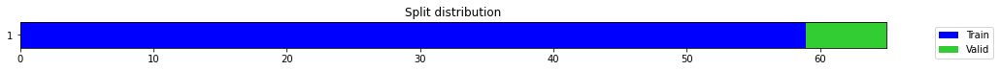

epoch,train_loss,valid_loss,mse,time
0,0.573573,1.085156,1.085156,00:00
1,0.382562,0.030084,0.030084,00:00
2,0.333149,0.192573,0.192573,00:00
3,0.291071,0.121387,0.121387,00:00
4,0.264184,0.224729,0.224729,00:00
5,0.241552,0.439713,0.439713,00:00
6,0.223396,0.545639,0.545639,00:00
7,0.206568,0.510028,0.510028,00:00
8,0.197155,0.324268,0.324268,00:00
9,0.188739,0.207456,0.207456,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.45277297496795654,
  "MSE_normalize": 0.20745576760739345,
  "RMSE_normalize": 0.4554731250111179,
  "MAPE_normalize": 0.4672686414356552,
  "MAE": 29205.66797733307,
  "MSE": 863174907.6840363,
  "RMSE": 29379.83845571715,
  "MAPE": 0.24725443948601922
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.2
2022-10-14 22:53:29.721380+07:00
PROGRESS: [ 810 / 1944 ]


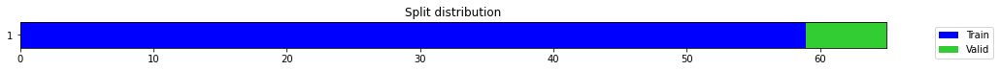

epoch,train_loss,valid_loss,mse,time
0,0.192522,0.034512,0.034512,00:00
1,0.198861,0.015132,0.015132,00:00
2,0.200425,0.046084,0.046084,00:00
3,0.191605,0.578992,0.578992,00:00
4,0.187112,0.886051,0.886051,00:00
5,0.186199,0.024512,0.024512,00:00
6,0.178054,1.350172,1.350172,00:00
7,0.184868,0.167713,0.167713,00:00
8,0.185709,0.031722,0.031722,00:00
9,0.183915,1.240842,1.240842,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.15820378065109253,
  "MSE_normalize": 0.025246397423262106,
  "RMSE_normalize": 0.1588911496064589,
  "MAPE_normalize": 0.16332472555366684,
  "MAE": 10204.776667118073,
  "MSE": 105044352.42513894,
  "RMSE": 10249.114714215026,
  "MAPE": 0.08640900572583017
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.2
2022-10-14 22:53:36.123762+07:00
PROGRESS: [ 811 / 1944 ]


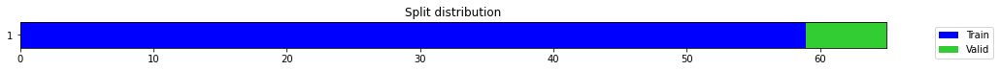

epoch,train_loss,valid_loss,mse,time
0,0.373258,0.022933,0.022933,00:00
1,0.310079,0.078060,0.078060,00:00
2,0.254655,0.121832,0.121832,00:00
3,0.238395,0.162873,0.162873,00:00
4,0.247434,0.015280,0.015280,00:00
5,0.219827,0.262661,0.262661,00:00
6,0.210608,0.409296,0.409296,00:00
7,0.203528,0.000562,0.000562,00:00
8,0.197837,0.009120,0.009120,00:00
9,0.183609,0.008824,0.008824,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07137219111124675,
  "MSE_normalize": 0.0052883930497872695,
  "RMSE_normalize": 0.0727213383388072,
  "MAPE_normalize": 0.07352518406322109,
  "MAE": 4603.79181543986,
  "MSE": 22003766.080805466,
  "RMSE": 4690.817208206419,
  "MAPE": 0.038938716733315275
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.3
2022-10-14 22:53:48.623017+07:00
PROGRESS: [ 812 / 1944 ]


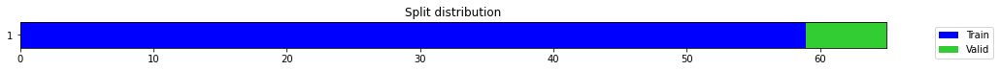

epoch,train_loss,valid_loss,mse,time
0,0.666376,2.889140,2.889140,00:00
1,0.632856,1.934269,1.934269,00:00
2,0.503812,1.046731,1.046731,00:00
3,0.414305,0.296643,0.296643,00:00
4,0.384300,0.001428,0.001428,00:00
5,0.362527,0.181095,0.181095,00:00
6,0.344079,0.298381,0.298381,00:00
7,0.329096,0.193300,0.193300,00:00
8,0.302176,0.024089,0.024089,00:00
9,0.284309,0.100671,0.100671,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.025239219268163044,
  "MSE_normalize": 0.0006519575296023797,
  "RMSE_normalize": 0.0255334590214953,
  "MAPE_normalize": 0.02604120363436882,
  "MAE": 1628.030599673589,
  "MSE": 2712642.733044896,
  "RMSE": 1647.010240722533,
  "MAPE": 0.01378114065620698
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.4
2022-10-14 22:54:15.552227+07:00
PROGRESS: [ 813 / 1944 ]


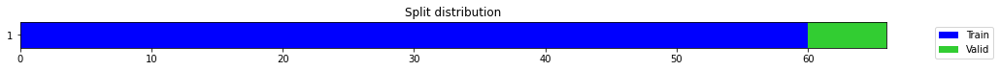

epoch,train_loss,valid_loss,mse,time
0,0.524630,0.326657,0.326657,00:00
1,0.338762,0.003539,0.003539,00:00
2,0.294845,0.097880,0.097880,00:00
3,0.297521,0.047064,0.047064,00:00
4,0.302748,0.000238,0.000238,00:00
5,0.285755,0.029139,0.029139,00:00
6,0.260667,0.222881,0.222881,00:00
7,0.238294,0.140446,0.140446,00:00
8,0.225024,0.028790,0.028790,00:00
9,0.212032,0.025586,0.025586,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.15924241145451865,
  "MSE_normalize": 0.025586404602706853,
  "RMSE_normalize": 0.1599575087412493,
  "MAPE_normalize": 0.1644005925451153,
  "MAE": 10271.77250846227,
  "MSE": 106459042.74256866,
  "RMSE": 10317.899143845547,
  "MAPE": 0.0869772922069939
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.4
2022-10-14 22:54:18.614511+07:00
PROGRESS: [ 814 / 1944 ]


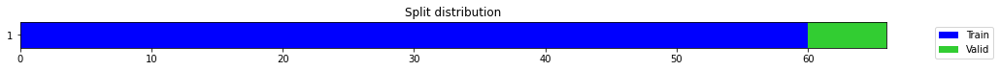

epoch,train_loss,valid_loss,mse,time
0,0.239291,0.430050,0.430050,00:00
1,0.207017,0.015782,0.015782,00:00
2,0.182325,0.061263,0.061263,00:00
3,0.172461,0.022953,0.022953,00:00
4,0.172609,0.192498,0.192498,00:00
5,0.190060,0.184110,0.184110,00:00
6,0.183154,0.032881,0.032881,00:00
7,0.177850,0.001708,0.001708,00:00
8,0.168778,0.109741,0.109741,00:00
9,0.162398,0.000585,0.000585,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.14534074068069458,
  "MSE_normalize": 0.021135528130117837,
  "RMSE_normalize": 0.14538063189475356,
  "MAPE_normalize": 0.15039585828780366,
  "MAE": 9375.059136867523,
  "MSE": 87939987.17400633,
  "RMSE": 9377.632279739184,
  "MAPE": 0.07948141718671846
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:54:25.764721+07:00
PROGRESS: [ 815 / 1944 ]


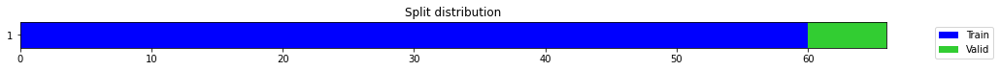

epoch,train_loss,valid_loss,mse,time
0,0.369483,0.078900,0.078900,00:00
1,0.298911,0.000615,0.000615,00:00
2,0.243301,0.119926,0.119926,00:00
3,0.215331,0.336403,0.336403,00:00
4,0.210830,0.258238,0.258238,00:00
5,0.200068,0.018785,0.018785,00:00
6,0.200964,0.135290,0.135290,00:00
7,0.193643,0.062871,0.062871,00:00
8,0.184267,0.023032,0.023032,00:00
9,0.179687,0.439447,0.439447,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.13869598507881165,
  "MSE_normalize": 0.019296206047489644,
  "RMSE_normalize": 0.13891078448950478,
  "MAPE_normalize": 0.1436539711447685,
  "MAE": 8946.445821523666,
  "MSE": 80286998.36012858,
  "RMSE": 8960.301242711017,
  "MAPE": 0.07588503658943652
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:54:39.778768+07:00
PROGRESS: [ 816 / 1944 ]


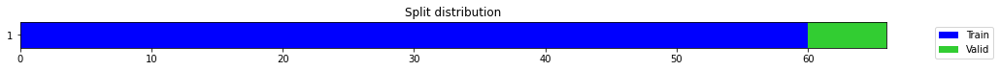

epoch,train_loss,valid_loss,mse,time
0,0.572524,0.988800,0.988800,00:00
1,0.495983,0.628862,0.628862,00:00
2,0.451263,0.297860,0.297860,00:00
3,0.392883,0.057946,0.057946,00:00
4,0.361942,0.011748,0.011748,00:00
5,0.337033,0.258697,0.258697,00:00
6,0.323302,0.446130,0.446130,00:00
7,0.313931,0.311642,0.311642,00:00
8,0.299273,0.245998,0.245998,00:00
9,0.282102,0.058092,0.058092,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03976932168006897,
  "MSE_normalize": 0.0015874411309765672,
  "RMSE_normalize": 0.03984270486521425,
  "MAPE_normalize": 0.04118341136704054,
  "MAE": 2565.280325651169,
  "MSE": 6604971.110167906,
  "RMSE": 2570.01383462578,
  "MAPE": 0.021756909643957767
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:55:07.897865+07:00
PROGRESS: [ 817 / 1944 ]


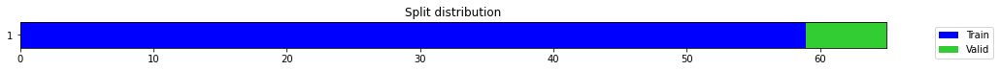

epoch,train_loss,valid_loss,mse,time
0,0.408489,0.245527,0.245527,00:00
1,0.335751,0.009170,0.009170,00:00
2,0.272994,0.553518,0.553518,00:00
3,0.276661,1.143307,1.143307,00:00
4,0.258001,0.434579,0.434579,00:00
5,0.239613,2.426459,2.426459,00:00
6,0.235046,1.808600,1.808600,00:00
7,0.234973,0.155335,0.155335,00:00
8,0.224684,0.000176,0.000176,00:00
9,0.208929,0.000221,0.000221,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.01436437169710795,
  "MSE_normalize": 0.0002208095120928751,
  "RMSE_normalize": 0.014859660564524181,
  "MAPE_normalize": 0.014853312391313938,
  "MAE": 926.5594319502512,
  "MSE": 918736.7139255758,
  "RMSE": 958.5075450540678,
  "MAPE": 0.007852314155196877
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:55:11.153103+07:00
PROGRESS: [ 818 / 1944 ]


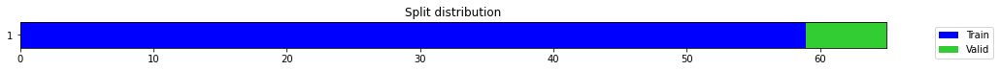

epoch,train_loss,valid_loss,mse,time
0,0.230636,0.540881,0.540881,00:00
1,0.253100,0.033756,0.033756,00:00
2,0.270410,0.002830,0.002830,00:00
3,0.249782,2.062123,2.062123,00:00
4,0.248229,0.065557,0.065557,00:00
5,0.235776,0.001009,0.001009,00:00
6,0.228920,1.972412,1.972412,00:00
7,0.235656,0.097482,0.097482,00:00
8,0.215277,0.047692,0.047692,00:00
9,0.206975,1.673687,1.673687,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16236313184102377,
  "MSE_normalize": 0.026412805780494136,
  "RMSE_normalize": 0.16252017038046118,
  "MAPE_normalize": 0.1681124822484461,
  "MAE": 10473.071456273397,
  "MSE": 109897504.67868835,
  "RMSE": 10483.201070221268,
  "MAPE": 0.08881875649235337
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:55:18.782836+07:00
PROGRESS: [ 819 / 1944 ]


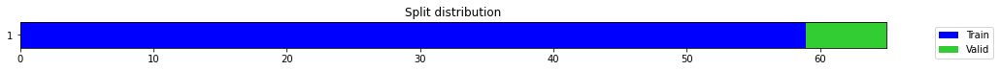

epoch,train_loss,valid_loss,mse,time
0,0.370137,0.767386,0.767386,00:00
1,0.382584,0.169163,0.169163,00:00
2,0.316991,0.033539,0.033539,00:00
3,0.301508,0.138751,0.138751,00:00
4,0.267900,0.208884,0.208884,00:00
5,0.240700,0.215881,0.215881,00:00
6,0.231249,0.036173,0.036173,00:00
7,0.209965,0.002300,0.002300,00:00
8,0.201803,0.326315,0.326315,00:00
9,0.195942,0.404427,0.404427,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18545154730478922,
  "MSE_normalize": 0.03440190277725582,
  "RMSE_normalize": 0.18547749938269015,
  "MAPE_normalize": 0.19181505218939707,
  "MAE": 11962.366607348124,
  "MSE": 143138267.961342,
  "RMSE": 11964.040620181044,
  "MAPE": 0.1013921956991466
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:55:31.938019+07:00
PROGRESS: [ 820 / 1944 ]


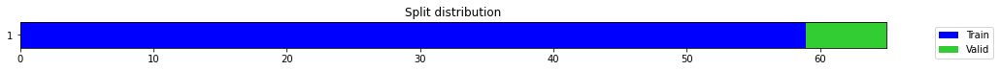

epoch,train_loss,valid_loss,mse,time
0,0.384292,0.198457,0.198457,00:00
1,0.340844,0.047088,0.047088,00:00
2,0.304133,0.005377,0.005377,00:00
3,0.297043,0.072084,0.072084,00:00
4,0.283273,0.085134,0.085134,00:00
5,0.278133,0.000556,0.000556,00:00
6,0.254262,0.207469,0.207469,00:00
7,0.244151,0.483890,0.483890,00:00
8,0.234688,0.283630,0.283630,00:00
9,0.228766,0.291227,0.291227,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.04505889614423116,
  "MSE_normalize": 0.0021094948602608334,
  "RMSE_normalize": 0.04592923753189066,
  "MAPE_normalize": 0.04680484456170375,
  "MAE": 2906.479036887487,
  "MSE": 8777114.525499946,
  "RMSE": 2962.6195377570752,
  "MAPE": 0.024690912858174974
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:55:58.029016+07:00
PROGRESS: [ 821 / 1944 ]


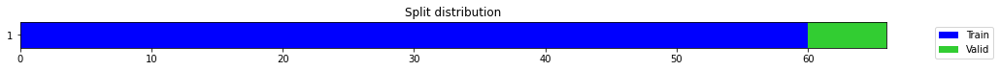

epoch,train_loss,valid_loss,mse,time
0,0.181024,0.055100,0.055100,00:00
1,0.209897,0.056602,0.056602,00:00
2,0.217414,0.472840,0.472840,00:00
3,0.221270,0.025095,0.025095,00:00
4,0.221875,0.428684,0.428684,00:00
5,0.208985,0.128493,0.128493,00:00
6,0.198945,0.040197,0.040197,00:00
7,0.187789,0.044659,0.044659,00:00
8,0.175466,0.139452,0.139452,00:00
9,0.159845,0.143329,0.143329,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.37672505776087445,
  "MSE_normalize": 0.14332881774443607,
  "RMSE_normalize": 0.378587926041542,
  "MAPE_normalize": 0.3888632358732176,
  "MAE": 24300.273125807445,
  "MSE": 596357673.9845073,
  "RMSE": 24420.435581383623,
  "MAPE": 0.2057470669134435
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:56:01.299195+07:00
PROGRESS: [ 822 / 1944 ]


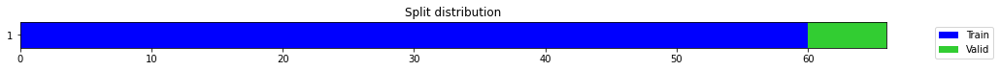

epoch,train_loss,valid_loss,mse,time
0,0.902741,0.590551,0.590551,00:00
1,0.681119,0.058759,0.058759,00:00
2,0.519418,0.432323,0.432323,00:00
3,0.478215,0.000517,0.000517,00:00
4,0.426183,0.624488,0.624488,00:00
5,0.394069,1.088713,1.088713,00:00
6,0.360387,0.289783,0.289783,00:00
7,0.324013,0.584747,0.584747,00:00
8,0.295007,2.181764,2.181764,00:00
9,0.279756,0.955022,0.955022,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03760306040445963,
  "MSE_normalize": 0.001738068763940485,
  "RMSE_normalize": 0.04169015188195511,
  "MAPE_normalize": 0.038488964083260836,
  "MAE": 2425.547808329264,
  "MSE": 7231697.4464746965,
  "RMSE": 2689.1815569936325,
  "MAPE": 0.020445812714863135
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:56:09.158856+07:00
PROGRESS: [ 823 / 1944 ]


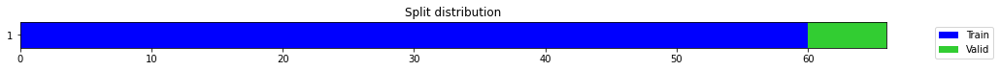

epoch,train_loss,valid_loss,mse,time
0,0.456441,0.804689,0.804689,00:00
1,0.330705,0.225392,0.225392,00:00
2,0.265625,0.001561,0.001561,00:00
3,0.253921,0.066009,0.066009,00:00
4,0.248589,0.002913,0.002913,00:00
5,0.239544,0.220736,0.220736,00:00
6,0.236363,0.728049,0.728049,00:00
7,0.220930,0.070493,0.070493,00:00
8,0.220947,0.877652,0.877652,00:00
9,0.220223,0.072735,0.072735,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1852195660273234,
  "MSE_normalize": 0.034314081496538286,
  "RMSE_normalize": 0.18524060434078238,
  "MAPE_normalize": 0.19164661645419742,
  "MAE": 11947.402887026468,
  "MSE": 142772864.16105095,
  "RMSE": 11948.759942397828,
  "MAPE": 0.10128531577061556
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:56:24.371044+07:00
PROGRESS: [ 824 / 1944 ]


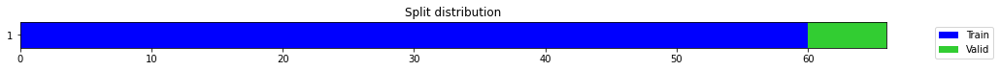

epoch,train_loss,valid_loss,mse,time
0,0.416189,0.251004,0.251004,00:00
1,0.317853,0.043270,0.043270,00:00
2,0.272318,0.012192,0.012192,00:00
3,0.244269,0.151829,0.151829,00:00
4,0.221748,0.563853,0.563853,00:00
5,0.252051,0.944877,0.944877,00:00
6,0.244180,0.459858,0.459858,00:00
7,0.236464,0.133432,0.133432,00:00
8,0.228399,0.067039,0.067039,00:00
9,0.232004,0.087228,0.087228,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.020567595958709717,
  "MSE_normalize": 0.0005332802886582518,
  "RMSE_normalize": 0.023092862288123833,
  "MAPE_normalize": 0.021515081315527526,
  "MAE": 1326.6922097206116,
  "MSE": 2218854.502051924,
  "RMSE": 1489.5819890331395,
  "MAPE": 0.011312446478876923
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:56:55.209686+07:00
PROGRESS: [ 825 / 1944 ]


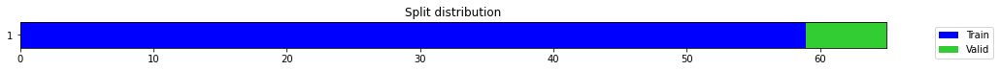

epoch,train_loss,valid_loss,mse,time
0,0.387816,0.184085,0.184085,00:00
1,0.328128,0.393715,0.393715,00:00
2,0.300260,1.762032,1.762032,00:00
3,0.276650,0.320499,0.320499,00:00
4,0.243748,0.004345,0.004345,00:00
5,0.230330,0.752511,0.752511,00:00
6,0.209595,0.014144,0.014144,00:00
7,0.205362,0.000389,0.000389,00:00
8,0.191484,0.023910,0.023910,00:00
9,0.178715,0.004369,0.004369,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0654005507628123,
  "MSE_normalize": 0.004368850890501245,
  "RMSE_normalize": 0.06609728353344974,
  "MAPE_normalize": 0.06744857800548054,
  "MAE": 4218.597126404445,
  "MSE": 18177766.314168915,
  "RMSE": 4263.539177041641,
  "MAPE": 0.03570179376687541
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:56:58.606010+07:00
PROGRESS: [ 826 / 1944 ]


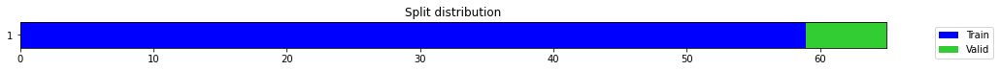

epoch,train_loss,valid_loss,mse,time
0,0.239804,0.608724,0.608724,00:00
1,0.212691,0.101918,0.101918,00:00
2,0.211475,0.228873,0.228873,00:00
3,0.176280,0.417113,0.417113,00:00
4,0.191180,0.006790,0.006790,00:00
5,0.185727,0.405510,0.405510,00:00
6,0.175469,1.460526,1.460526,00:00
7,0.175027,0.480563,0.480563,00:00
8,0.173182,0.186474,0.186474,00:00
9,0.163360,0.739529,0.739529,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14881086349487305,
  "MSE_normalize": 0.022188089674759937,
  "RMSE_normalize": 0.14895667046077507,
  "MAPE_normalize": 0.15408071856434427,
  "MAE": 9598.895938873291,
  "MSE": 92319449.47870165,
  "RMSE": 9608.301071401835,
  "MAPE": 0.08140529690080105
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:57:06.520165+07:00
PROGRESS: [ 827 / 1944 ]


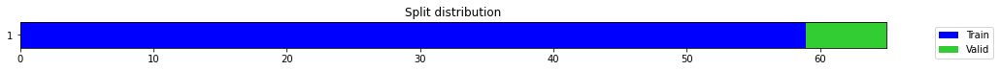

epoch,train_loss,valid_loss,mse,time
0,0.609897,2.892064,2.892064,00:00
1,0.453584,0.676134,0.676134,00:00
2,0.364603,0.010334,0.010334,00:00
3,0.306632,0.146460,0.146460,00:00
4,0.279907,0.031635,0.031635,00:00
5,0.259329,0.004066,0.004066,00:00
6,0.240988,0.004847,0.004847,00:00
7,0.224470,0.076852,0.076852,00:00
8,0.213773,1.505217,1.505217,00:00
9,0.209503,0.799654,0.799654,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.038881003856658936,
  "MSE_normalize": 0.0016612228848570016,
  "RMSE_normalize": 0.040758102076237576,
  "MAPE_normalize": 0.03995424069727567,
  "MAE": 2507.980272769928,
  "MSE": 6911959.724314493,
  "RMSE": 2629.0606163256284,
  "MAPE": 0.021184562277702833
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:57:21.652667+07:00
PROGRESS: [ 828 / 1944 ]


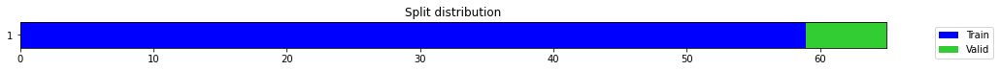

epoch,train_loss,valid_loss,mse,time
0,0.518947,1.076684,1.076684,00:00
1,0.406082,0.460964,0.460964,00:00
2,0.394677,0.119817,0.119817,00:00
3,0.359328,0.001585,0.001585,00:00
4,0.327611,0.094494,0.094494,00:00
5,0.295571,0.271311,0.271311,00:00
6,0.285305,0.212173,0.212173,00:00
7,0.267966,0.206993,0.206993,00:00
8,0.256706,0.378620,0.378620,00:00
9,0.257646,0.099496,0.099496,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05136366685231527,
  "MSE_normalize": 0.0026557661286995917,
  "RMSE_normalize": 0.05153412586529039,
  "MAPE_normalize": 0.05320687651621291,
  "MAE": 3313.161966641744,
  "MSE": 11050021.454737144,
  "RMSE": 3324.157254814691,
  "MAPE": 0.028104677530653224
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:57:51.246842+07:00
PROGRESS: [ 829 / 1944 ]


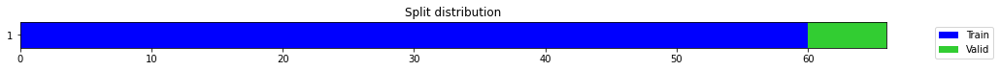

epoch,train_loss,valid_loss,mse,time
0,0.529969,0.279192,0.279192,00:00
1,0.350746,0.560227,0.560227,00:00
2,0.345693,0.017542,0.017542,00:00
3,0.358205,0.550352,0.550352,00:00
4,0.334575,2.538619,2.538619,00:00
5,0.322388,0.007048,0.007048,00:00
6,0.281044,0.644394,0.644394,00:00
7,0.261178,0.232886,0.232886,00:00
8,0.243288,0.082360,0.082360,00:00
9,0.229129,0.071400,0.071400,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2665947477022807,
  "MSE_normalize": 0.07140046917791427,
  "RMSE_normalize": 0.26720866224341283,
  "MAPE_normalize": 0.27620870547374826,
  "MAE": 17196.427605787914,
  "MSE": 297080645.6819212,
  "RMSE": 17236.027549349103,
  "MAPE": 0.14588612540905035
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:57:54.962464+07:00
PROGRESS: [ 830 / 1944 ]


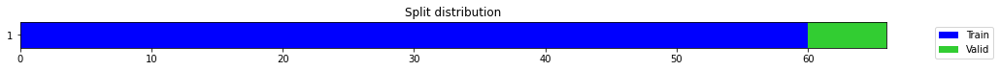

epoch,train_loss,valid_loss,mse,time
0,0.592632,0.402041,0.402041,00:00
1,0.407694,0.130449,0.130449,00:00
2,0.348057,0.302389,0.302389,00:00
3,0.312039,0.048482,0.048482,00:00
4,0.277634,0.076202,0.076202,00:00
5,0.265164,1.020909,1.020909,00:00
6,0.267373,0.009799,0.009799,00:00
7,0.256815,0.101836,0.101836,00:00
8,0.247795,0.245670,0.245670,00:00
9,0.231429,1.073201,1.073201,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13137882947921753,
  "MSE_normalize": 0.017510558191549563,
  "RMSE_normalize": 0.1323274657489879,
  "MAPE_normalize": 0.1355587339448051,
  "MAE": 8474.460016727448,
  "MSE": 72857335.44458984,
  "RMSE": 8535.650850672715,
  "MAPE": 0.0717372797407813
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:58:04.073777+07:00
PROGRESS: [ 831 / 1944 ]


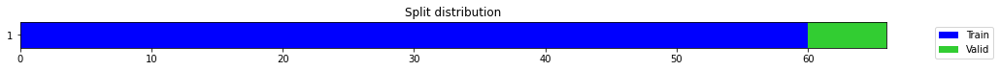

epoch,train_loss,valid_loss,mse,time
0,0.364744,0.450440,0.450440,00:00
1,0.259289,0.277815,0.277815,00:00
2,0.203128,0.121174,0.121174,00:00
3,0.222376,0.061552,0.061552,00:00
4,0.202344,0.274681,0.274681,00:00
5,0.205077,0.212626,0.212626,00:00
6,0.207542,0.118064,0.118064,00:00
7,0.214580,0.188190,0.188190,00:00
8,0.206500,0.686371,0.686371,00:00
9,0.194580,0.002492,0.002492,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.06147187948226929,
  "MSE_normalize": 0.004072465108389878,
  "RMSE_normalize": 0.0638158687819094,
  "MAPE_normalize": 0.06320019650682902,
  "MAE": 3965.182114124298,
  "MSE": 16944574.424334362,
  "RMSE": 4116.378799908283,
  "MAPE": 0.03350220160953195
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:58:21.736797+07:00
PROGRESS: [ 832 / 1944 ]


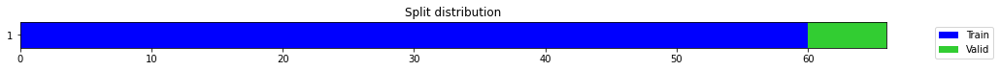

epoch,train_loss,valid_loss,mse,time
0,0.425706,0.626206,0.626206,00:00
1,0.396315,0.265305,0.265305,00:00
2,0.314862,0.026854,0.026854,00:00
3,0.276739,0.005348,0.005348,00:00
4,0.265774,0.017485,0.017485,00:00
5,0.253182,0.028513,0.028513,00:00
6,0.244478,0.000871,0.000871,00:00
7,0.230865,0.064555,0.064555,00:00
8,0.222884,0.282998,0.282998,00:00
9,0.217623,0.222897,0.222897,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.020583709081013996,
  "MSE_normalize": 0.0005420209822280716,
  "RMSE_normalize": 0.023281344081218156,
  "MAPE_normalize": 0.021537775164794253,
  "MAE": 1327.7315705617268,
  "MSE": 2255222.4828135003,
  "RMSE": 1501.739818614896,
  "MAPE": 0.011322952998089697
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.5
2022-10-14 22:58:57.994567+07:00
PROGRESS: [ 833 / 1944 ]


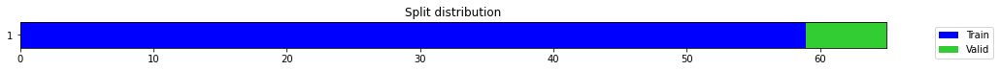

epoch,train_loss,valid_loss,mse,time
0,0.406273,0.093191,0.093191,00:00
1,0.336130,0.092304,0.092304,00:00
2,0.396140,0.126277,0.126277,00:00
3,0.370340,0.051646,0.051646,00:00
4,0.315191,0.168994,0.168994,00:00
5,0.275649,0.862695,0.862695,00:00
6,0.257652,0.631489,0.631489,00:00
7,0.240812,0.141917,0.141917,00:00
8,0.219469,0.007437,0.007437,00:00
9,0.199644,0.000322,0.000322,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.016253550847371418,
  "MSE_normalize": 0.0003215463667096685,
  "RMSE_normalize": 0.017931713992523652,
  "MAPE_normalize": 0.01696080985349431,
  "MAE": 1048.419043858846,
  "MSE": 1337879.1951738626,
  "RMSE": 1156.6672793737457,
  "MAPE": 0.008928053601982228
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.6
2022-10-14 22:59:02.223468+07:00
PROGRESS: [ 834 / 1944 ]


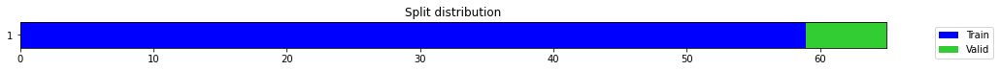

epoch,train_loss,valid_loss,mse,time
0,0.459050,0.041178,0.041178,00:00
1,0.357932,0.511360,0.511360,00:00
2,0.374252,0.212447,0.212447,00:00
3,0.333235,0.289201,0.289201,00:00
4,0.323068,1.537476,1.537476,00:00
5,0.299571,1.927909,1.927909,00:00
6,0.270494,5.481981,5.481981,00:00
7,0.275465,0.052633,0.052633,00:00
8,0.256387,4.285839,4.285839,00:00
9,0.238188,0.000666,0.000666,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.167220801115036,
  "MSE_normalize": 0.027969791425925077,
  "RMSE_normalize": 0.1672417155673939,
  "MAPE_normalize": 0.1729941946075535,
  "MAE": 10786.410555124283,
  "MSE": 116375757.63959724,
  "RMSE": 10787.759620959174,
  "MAPE": 0.09143473450847982
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.6
2022-10-14 22:59:14.898692+07:00
PROGRESS: [ 835 / 1944 ]


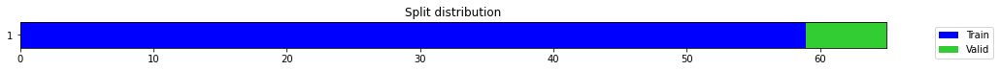

epoch,train_loss,valid_loss,mse,time
0,0.261066,0.248464,0.248464,00:00
1,0.251307,0.011890,0.011890,00:00
2,0.253365,0.029218,0.029218,00:00
3,0.225400,0.006493,0.006493,00:00
4,0.219902,0.052973,0.052973,00:00
5,0.216835,0.018331,0.018331,00:00
6,0.203722,1.616761,1.616761,00:00
7,0.204855,0.005939,0.005939,00:00
8,0.214302,0.569063,0.569063,00:00
9,0.201600,0.016517,0.016517,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.15500288208325705,
  "MSE_normalize": 0.024037865549783415,
  "RMSE_normalize": 0.15504149621886204,
  "MAPE_normalize": 0.16032539188834322,
  "MAE": 9998.305905898413,
  "MSE": 100015934.07671599,
  "RMSE": 10000.796672101478,
  "MAPE": 0.08474601016426649
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.7
2022-10-14 22:59:39.343652+07:00
PROGRESS: [ 836 / 1944 ]


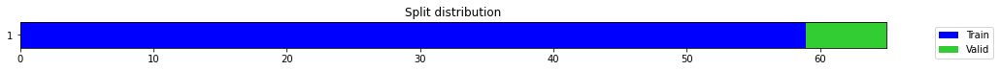

epoch,train_loss,valid_loss,mse,time
0,0.258283,0.107296,0.107296,00:00
1,0.276892,0.050688,0.050688,00:00
2,0.232677,0.047206,0.047206,00:00
3,0.210781,0.071128,0.071128,00:00
4,0.201541,0.036932,0.036932,00:00
5,0.196251,0.076339,0.076339,00:00
6,0.185477,0.184078,0.184078,00:00
7,0.181599,0.174524,0.174524,00:00
8,0.182307,0.279109,0.279109,00:00
9,0.170995,0.082241,0.082241,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08558737238248189,
  "MSE_normalize": 0.007334673563269334,
  "RMSE_normalize": 0.08564270875719271,
  "MAPE_normalize": 0.08850437216380956,
  "MAE": 5520.727868159612,
  "MSE": 30517860.50050467,
  "RMSE": 5524.297285673959,
  "MAPE": 0.04678776347380197
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.9
2022-10-14 23:00:27.010328+07:00
PROGRESS: [ 837 / 1944 ]


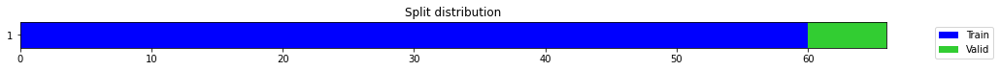

epoch,train_loss,valid_loss,mse,time
0,0.768167,0.313670,0.313670,00:00
1,0.469025,0.547592,0.547592,00:00
2,0.430555,0.827911,0.827911,00:00
3,0.413288,1.330111,1.330111,00:00
4,0.365567,0.207402,0.207402,00:00
5,0.339914,0.879380,0.879380,00:00
6,0.299614,0.414136,0.414136,00:00
7,0.273762,0.097700,0.097700,00:00
8,0.251852,0.055347,0.055347,00:00
9,0.229256,0.019538,0.019538,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.13923587401707968,
  "MSE_normalize": 0.01953805071837067,
  "RMSE_normalize": 0.13977857746582867,
  "MAPE_normalize": 0.14376013909940846,
  "MAE": 8981.270817597708,
  "MSE": 81293257.44788107,
  "RMSE": 9016.277360855813,
  "MAPE": 0.07605380107452735
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.9
2022-10-14 23:00:32.844114+07:00
PROGRESS: [ 838 / 1944 ]


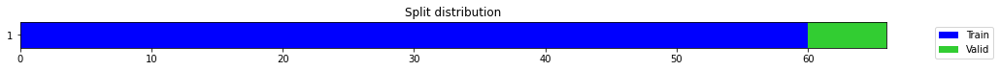

epoch,train_loss,valid_loss,mse,time
0,0.201394,0.000798,0.000798,00:00
1,0.243626,0.211156,0.211156,00:00
2,0.213916,0.075042,0.075042,00:00
3,0.212365,0.189824,0.189824,00:00
4,0.208330,0.080819,0.080819,00:00
5,0.204451,0.655793,0.655793,00:00
6,0.205169,1.475984,1.475984,00:00
7,0.200987,0.685170,0.685170,00:00
8,0.207177,0.077256,0.077256,00:00
9,0.209867,1.477203,1.477203,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12317989269892375,
  "MSE_normalize": 0.015192324595558896,
  "RMSE_normalize": 0.12325714825339298,
  "MAPE_normalize": 0.12752256948886403,
  "MAE": 7945.595798651378,
  "MSE": 63211707.8812424,
  "RMSE": 7950.579090936861,
  "MAPE": 0.06737870128183997
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.9
2022-10-14 23:00:46.248843+07:00
PROGRESS: [ 839 / 1944 ]


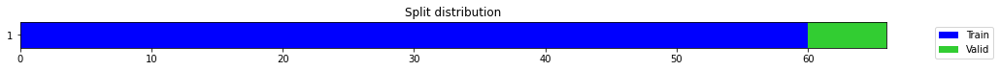

epoch,train_loss,valid_loss,mse,time
0,0.827636,1.130473,1.130473,00:00
1,0.676486,0.399954,0.399954,00:00
2,0.519841,0.017525,0.017525,00:00
3,0.425329,0.248186,0.248186,00:00
4,0.380863,0.793215,0.793215,00:00
5,0.348192,0.854913,0.854913,00:00
6,0.326005,0.015928,0.015928,00:00
7,0.298549,0.238596,0.238596,00:00
8,0.277037,0.121421,0.121421,00:00
9,0.257029,0.061256,0.061256,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04853443304697672,
  "MSE_normalize": 0.0033684198213836205,
  "RMSE_normalize": 0.058038089401561285,
  "MAPE_normalize": 0.04947262136473924,
  "MAE": 3130.6650692621865,
  "MSE": 14015206.720433759,
  "RMSE": 3743.6889187583092,
  "MAPE": 0.026332224161346205
}
Percent CPU Usage: 100.0
Percent Ram Usage: 32.9
2022-10-14 23:01:12.885044+07:00
PROGRESS: [ 840 / 1944 ]


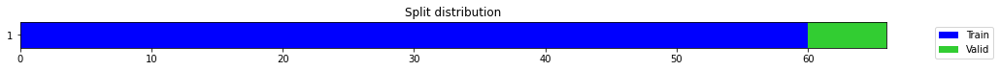

epoch,train_loss,valid_loss,mse,time
0,0.171074,0.283575,0.283575,00:00
1,0.146698,0.181965,0.181965,00:00
2,0.160188,0.168576,0.168576,00:00
3,0.153147,0.196968,0.196968,00:00
4,0.153728,0.184249,0.184249,00:00
5,0.156124,0.228250,0.228250,00:00
6,0.155582,0.033537,0.033537,00:00
7,0.142954,0.006299,0.006299,00:00
8,0.140883,0.002574,0.002574,00:00
9,0.137412,0.178670,0.178670,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.011092583338419596,
  "MSE_normalize": 0.00014592494027828215,
  "RMSE_normalize": 0.012079939580903629,
  "MAPE_normalize": 0.01146338229259856,
  "MAE": 715.5159956614176,
  "MSE": 607159.5323967059,
  "RMSE": 779.2044227266077,
  "MAPE": 0.0060616311807866795
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.1
2022-10-14 23:02:05.348354+07:00
PROGRESS: [ 841 / 1944 ]


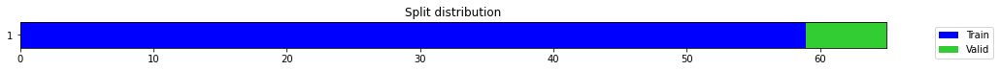

epoch,train_loss,valid_loss,mse,time
0,0.719848,0.020567,0.020567,00:00
1,0.561163,0.857483,0.857483,00:00
2,0.436740,0.002282,0.002282,00:00
3,0.374599,0.621757,0.621757,00:00
4,0.324580,4.797239,4.797239,00:00
5,0.292854,1.199090,1.199090,00:00
6,0.274848,1.947925,1.947925,00:00
7,0.255683,1.161010,1.161010,00:00
8,0.234541,0.608782,0.608782,00:00
9,0.216981,0.241702,0.241702,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.49101722240448,
  "MSE_normalize": 0.24170166872366514,
  "RMSE_normalize": 0.49163163926222764,
  "MAPE_normalize": 0.5074130724332743,
  "MAE": 31672.574913978577,
  "MSE": 1005664089.2359158,
  "RMSE": 31712.207258970728,
  "MAPE": 0.26832802708613696
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:02:11.719272+07:00
PROGRESS: [ 842 / 1944 ]


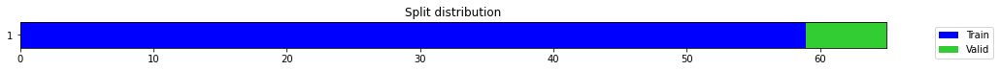

epoch,train_loss,valid_loss,mse,time
0,0.846092,0.585135,0.585135,00:00
1,0.666107,1.304444,1.304444,00:00
2,0.536851,0.271746,0.271746,00:00
3,0.437042,0.021966,0.021966,00:00
4,0.360957,0.085028,0.085028,00:00
5,0.318903,0.117026,0.117026,00:00
6,0.316151,0.250187,0.250187,00:00
7,0.322571,15.904572,15.904572,00:00
8,0.297722,0.000917,0.000917,00:00
9,0.274435,0.225319,0.225319,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.35257498423258465,
  "MSE_normalize": 0.12437469709198605,
  "RMSE_normalize": 0.3526679700397898,
  "MAPE_normalize": 0.36456675021276513,
  "MAE": 22742.49678293864,
  "MSE": 517494012.9106296,
  "RMSE": 22748.4947394466,
  "MAPE": 0.1927340806447383
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:02:26.380996+07:00
PROGRESS: [ 843 / 1944 ]


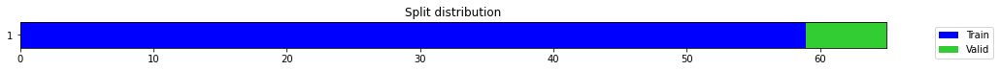

epoch,train_loss,valid_loss,mse,time
0,0.329352,0.013590,0.013590,00:00
1,0.312984,0.031461,0.031461,00:00
2,0.253154,0.099503,0.099503,00:00
3,0.236595,0.022832,0.022832,00:00
4,0.243065,1.422766,1.422766,00:00
5,0.217353,0.692703,0.692703,00:00
6,0.217860,1.427284,1.427284,00:00
7,0.205412,1.777772,1.777772,00:00
8,0.196045,0.000459,0.000459,00:00
9,0.194098,3.644933,3.644933,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09091861049334209,
  "MSE_normalize": 0.008376112327174093,
  "RMSE_normalize": 0.09152110317939843,
  "MAPE_normalize": 0.09428796291226937,
  "MAE": 5864.614051262538,
  "MSE": 34851043.51710465,
  "RMSE": 5903.4772394839165,
  "MAPE": 0.04977778422514872
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:02:53.950019+07:00
PROGRESS: [ 844 / 1944 ]


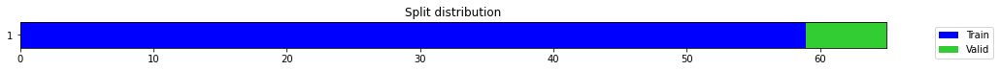

epoch,train_loss,valid_loss,mse,time
0,0.254327,0.515730,0.515730,00:00
1,0.264810,0.106055,0.106055,00:00
2,0.289567,0.275751,0.275751,00:00
3,0.261593,0.587955,0.587955,00:00
4,0.247478,0.382277,0.382277,00:00
5,0.219297,0.000295,0.000295,00:00
6,0.212313,0.024046,0.024046,00:00
7,0.225634,1.825564,1.825564,00:00
8,0.213180,0.331844,0.331844,00:00
9,0.200918,0.003035,0.003035,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.008023152748743692,
  "MSE_normalize": 0.00010513914502219279,
  "RMSE_normalize": 0.010253738099941543,
  "MAPE_normalize": 0.008180079069389288,
  "MAE": 517.5254449049631,
  "MSE": 437459.38155963534,
  "RMSE": 661.4071223986292,
  "MAPE": 0.004353355376297774
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:03:48.255286+07:00
PROGRESS: [ 845 / 1944 ]


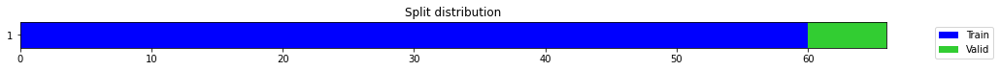

epoch,train_loss,valid_loss,mse,time
0,0.267441,0.013762,0.013762,00:00
1,0.290897,0.330441,0.330441,00:00
2,0.266268,3.004701,3.004701,00:00
3,0.302280,3.780757,3.780757,00:00
4,0.302885,1.363268,1.363268,00:00
5,0.274814,1.122586,1.122586,00:00
6,0.265395,0.572617,0.572617,00:00
7,0.258190,0.177414,0.177414,00:00
8,0.243387,0.039576,0.039576,00:00
9,0.230311,0.016843,0.016843,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.12753844261169434,
  "MSE_normalize": 0.01684307575735507,
  "RMSE_normalize": 0.12978087593075904,
  "MAPE_normalize": 0.13250136750526556,
  "MAE": 8226.739702224731,
  "MSE": 70080097.21611644,
  "RMSE": 8371.385621037682,
  "MAPE": 0.0698930616406895
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:03:56.605567+07:00
PROGRESS: [ 846 / 1944 ]


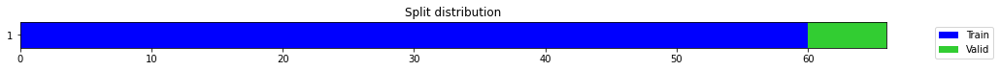

epoch,train_loss,valid_loss,mse,time
0,0.192775,0.012231,0.012231,00:00
1,0.173509,0.122163,0.122163,00:00
2,0.184674,0.006392,0.006392,00:00
3,0.207095,0.286449,0.286449,00:00
4,0.211816,1.852008,1.852008,00:00
5,0.234047,1.083824,1.083824,00:00
6,0.237181,1.097026,1.097026,00:00
7,0.238701,0.042399,0.042399,00:00
8,0.234461,0.942568,0.942568,00:00
9,0.226651,1.368133,1.368133,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1319820980230967,
  "MSE_normalize": 0.017464458581835984,
  "RMSE_normalize": 0.13215316334403798,
  "MAPE_normalize": 0.13668416928501428,
  "MAE": 8513.37325088183,
  "MSE": 72665525.75514272,
  "RMSE": 8524.407648343826,
  "MAPE": 0.07220710649094002
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:04:16.693571+07:00
PROGRESS: [ 847 / 1944 ]


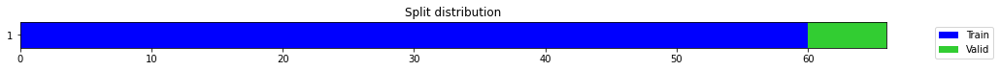

epoch,train_loss,valid_loss,mse,time
0,0.187715,0.188550,0.188550,00:00
1,0.167348,0.001426,0.001426,00:00
2,0.177770,0.003151,0.003151,00:00
3,0.152383,0.341507,0.341507,00:00
4,0.162024,0.417729,0.417729,00:00
5,0.167762,0.001057,0.001057,00:00
6,0.166781,2.238905,2.238905,00:00
7,0.189578,0.373875,0.373875,00:00
8,0.211698,0.091086,0.091086,00:00
9,0.229631,3.869703,3.869703,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16142735878626505,
  "MSE_normalize": 0.026075611977579644,
  "RMSE_normalize": 0.1614794475392446,
  "MAPE_normalize": 0.16708524320858162,
  "MAE": 10412.71035114924,
  "MSE": 108494520.16271596,
  "RMSE": 10416.070284071433,
  "MAPE": 0.08829053543922842
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.0
2022-10-14 23:04:55.213463+07:00
PROGRESS: [ 848 / 1944 ]


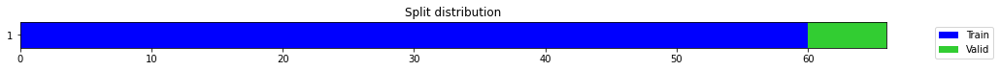

epoch,train_loss,valid_loss,mse,time
0,0.527609,0.002586,0.002586,00:00
1,0.372978,0.372504,0.372504,00:00
2,0.362170,0.445312,0.445312,00:00
3,0.337328,0.076409,0.076409,00:00
4,0.318242,0.000903,0.000903,00:00
5,0.298600,0.119460,0.119460,00:00
6,0.292720,0.514692,0.514692,00:00
7,0.275524,0.032204,0.032204,00:00
8,0.258265,1.922078,1.922078,00:00
9,0.269210,0.001998,0.001998,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.12041906515757243,
  "MSE_normalize": 0.01456856125546461,
  "RMSE_normalize": 0.12070029517554881,
  "MAPE_normalize": 0.12438662594265276,
  "MAE": 7767.511378924052,
  "MSE": 60616374.57375145,
  "RMSE": 7785.6518400036,
  "MAPE": 0.06579098530641396
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.1
2022-10-14 23:06:09.942432+07:00
PROGRESS: [ 849 / 1944 ]


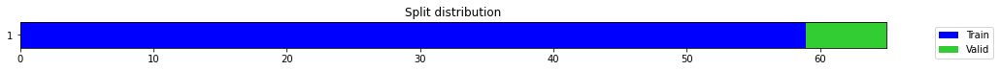

epoch,train_loss,valid_loss,mse,time
0,0.641060,0.019133,0.019133,00:00
1,0.484415,1.005547,1.005547,00:00
2,0.460275,0.734577,0.734577,00:00
3,0.421565,2.030724,2.030724,00:00
4,0.374704,5.072077,5.072077,00:00
5,0.343245,7.690502,7.690502,00:00
6,0.321667,3.196243,3.196243,00:00
7,0.293392,0.737935,0.737935,00:00
8,0.279704,0.144677,0.144677,00:00
9,0.266221,0.049258,0.049258,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2207883596420288,
  "MSE_normalize": 0.04925813072028854,
  "RMSE_normalize": 0.22194172820875424,
  "MAPE_normalize": 0.227897869650631,
  "MAE": 14241.732350349426,
  "MSE": 204951556.31266215,
  "RMSE": 14316.129236377483,
  "MAPE": 0.12058164533926868
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.1
2022-10-14 23:06:16.612522+07:00
PROGRESS: [ 850 / 1944 ]


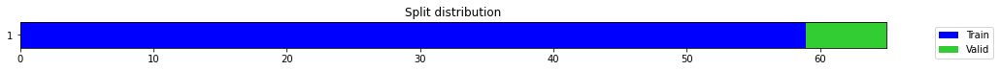

epoch,train_loss,valid_loss,mse,time
0,0.395779,0.041588,0.041588,00:01
1,0.278371,0.032549,0.032549,00:01
2,0.246110,0.053433,0.053433,00:01
3,0.247467,1.802547,1.802547,00:01
4,0.254203,3.865376,3.865376,00:01
5,0.264932,1.419355,1.419355,00:01
6,0.235896,0.662001,0.662001,00:01
7,0.215094,5.869124,5.869124,00:01
8,0.199736,0.047396,0.047396,00:01
9,0.197234,0.002493,0.002493,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03165061275164286,
  "MSE_normalize": 0.0011281066421779211,
  "RMSE_normalize": 0.03358729882229176,
  "MAPE_normalize": 0.03249699704595325,
  "MAE": 2041.5911249319713,
  "MSE": 4693787.779197766,
  "RMSE": 2166.5151232331073,
  "MAPE": 0.01723745529098741
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.2
2022-10-14 23:06:50.417639+07:00
PROGRESS: [ 851 / 1944 ]


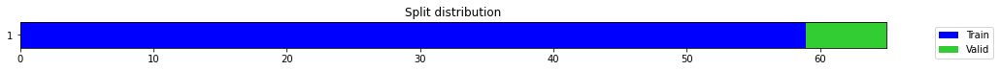

epoch,train_loss,valid_loss,mse,time
0,0.426078,0.194193,0.194193,00:01
1,0.331564,0.040886,0.040886,00:01
2,0.310406,0.077348,0.077348,00:01
3,0.282483,0.304086,0.304086,00:01
4,0.269707,0.048638,0.048638,00:01
5,0.266022,0.028454,0.028454,00:01
6,0.243512,0.006716,0.006716,00:01
7,0.227556,0.018280,0.018280,00:01
8,0.215162,0.054593,0.054593,00:01
9,0.223885,0.715120,0.715120,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1497769554456075,
  "MSE_normalize": 0.02244004694106394,
  "RMSE_normalize": 0.14980002316776836,
  "MAPE_normalize": 0.15495041400276355,
  "MAE": 9661.212734063467,
  "MSE": 93367784.7098236,
  "RMSE": 9662.70069441373,
  "MAPE": 0.08189730587321518
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.2
2022-10-14 23:07:53.927077+07:00
PROGRESS: [ 852 / 1944 ]


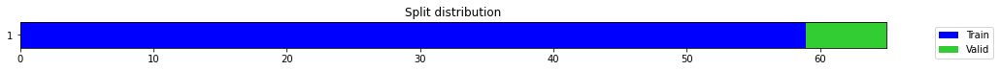

epoch,train_loss,valid_loss,mse,time
0,0.470226,0.684208,0.684208,00:00
1,0.377699,0.196145,0.196145,00:01
2,0.345511,0.083636,0.083636,00:01
3,0.323695,0.002278,0.002278,00:01
4,0.297367,0.050772,0.050772,00:01
5,0.275154,0.097795,0.097795,00:01
6,0.266891,0.003162,0.003162,00:01
7,0.249546,0.391516,0.391516,00:01
8,0.243540,0.926910,0.926910,00:01
9,0.231614,0.344984,0.344984,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11335346102714539,
  "MSE_normalize": 0.012859148491267902,
  "RMSE_normalize": 0.11339818557308536,
  "MAPE_normalize": 0.11721361177491503,
  "MAE": 7311.751650094986,
  "MSE": 53503908.03716516,
  "RMSE": 7314.636562206297,
  "MAPE": 0.06196567536956304
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.2
2022-10-14 23:09:55.540749+07:00
PROGRESS: [ 853 / 1944 ]


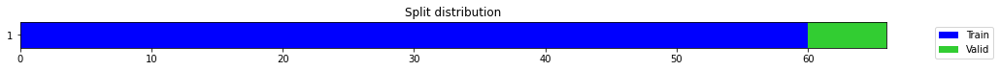

epoch,train_loss,valid_loss,mse,time
0,0.502261,0.034779,0.034779,00:01
1,0.407291,0.187308,0.187308,00:01
2,0.415016,0.941051,0.941051,00:01
3,0.346763,2.477756,2.477756,00:01
4,0.295741,2.255853,2.255853,00:01
5,0.283041,2.600665,2.600665,00:01
6,0.257930,0.074370,0.074370,00:01
7,0.242063,0.028350,0.028350,00:01
8,0.224867,0.016246,0.016246,00:01
9,0.212280,0.022400,0.022400,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14947287241617838,
  "MSE_normalize": 0.02240012331897745,
  "RMSE_normalize": 0.14966670745017893,
  "MAPE_normalize": 0.15477948235340233,
  "MAE": 9641.59816233317,
  "MSE": 93201671.85981052,
  "RMSE": 9654.101297366344,
  "MAPE": 0.08177124150453055
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.2
2022-10-14 23:10:08.747085+07:00
PROGRESS: [ 854 / 1944 ]


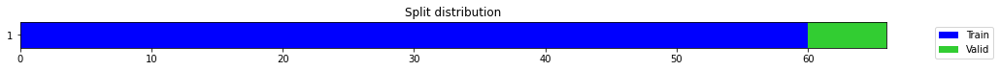

epoch,train_loss,valid_loss,mse,time
0,0.429085,0.103722,0.103722,00:01
1,0.296965,0.759202,0.759202,00:01
2,0.391815,0.001543,0.001543,00:01
3,0.342761,0.091765,0.091765,00:01
4,0.344955,0.082109,0.082109,00:01
5,0.341560,2.087425,2.087425,00:01
6,0.316652,5.546974,5.546974,00:01
7,0.297224,8.026708,8.026708,00:01
8,0.279186,0.003661,0.003661,00:01
9,0.271900,0.953271,0.953271,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.020722568035125732,
  "MSE_normalize": 0.0005322395261965577,
  "RMSE_normalize": 0.023070316993846395,
  "MAPE_normalize": 0.021395012486078325,
  "MAE": 1336.6885285377502,
  "MSE": 2214524.132970579,
  "RMSE": 1488.1277273710677,
  "MAPE": 0.011318293753475673
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.2
2022-10-14 23:10:39.676128+07:00
PROGRESS: [ 855 / 1944 ]


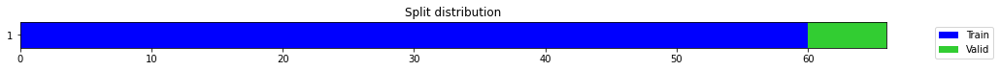

epoch,train_loss,valid_loss,mse,time
0,0.538732,0.081553,0.081553,00:01
1,0.370476,0.020345,0.020345,00:01
2,0.322496,0.225714,0.225714,00:01
3,0.369943,0.080866,0.080866,00:01
4,0.373360,3.073392,3.073392,00:01
5,0.373126,0.007013,0.007013,00:01
6,0.355010,0.577580,0.577580,00:01
7,0.330064,0.130839,0.130839,00:01
8,0.306468,0.206733,0.206733,00:01
9,0.290038,0.357595,0.357595,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.016711324453353882,
  "MSE_normalize": 0.0002833439500431467,
  "RMSE_normalize": 0.01683282359092338,
  "MAPE_normalize": 0.017300804255105388,
  "MAE": 1077.9472725391388,
  "MSE": 1178927.8781787266,
  "RMSE": 1085.7844529089218,
  "MAPE": 0.009141056749041176
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.3
2022-10-14 23:11:37.095062+07:00
PROGRESS: [ 856 / 1944 ]


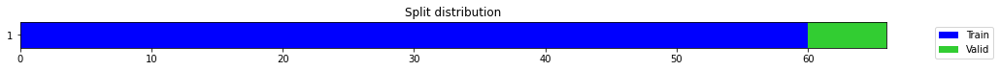

epoch,train_loss,valid_loss,mse,time
0,0.400212,0.809305,0.809305,00:00
1,0.255149,0.006815,0.006815,00:01
2,0.245730,0.228376,0.228376,00:01
3,0.218144,0.176258,0.176258,00:01
4,0.213747,0.103219,0.103219,00:01
5,0.215885,0.269165,0.269165,00:01
6,0.224816,0.055246,0.055246,00:01
7,0.214879,0.271426,0.271426,00:01
8,0.201682,0.131769,0.131769,00:01
9,0.198863,0.102940,0.102940,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07689203818639119,
  "MSE_normalize": 0.005943871498950888,
  "RMSE_normalize": 0.0770965076962043,
  "MAPE_normalize": 0.07942848788368906,
  "MAE": 4959.844031174977,
  "MSE": 24731058.536305834,
  "RMSE": 4973.033132435961,
  "MAPE": 0.04201083047818711
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:13:27.464473+07:00
PROGRESS: [ 857 / 1944 ]


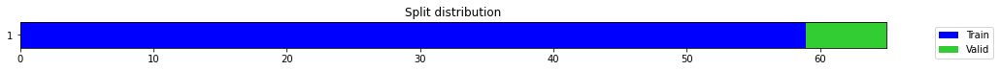

epoch,train_loss,valid_loss,mse,time
0,0.303712,1.377293,1.377293,00:00
1,0.264441,0.065965,0.065965,00:00
2,0.244274,28.393976,28.393976,00:01
3,0.341777,8.305322,8.305322,00:00
4,0.303813,5.907050,5.907050,00:00
5,0.281761,1.443683,1.443683,00:00
6,0.249403,1.174141,1.174141,00:00
7,0.236719,0.024291,0.024291,00:00
8,0.221824,0.003174,0.003174,00:00
9,0.209495,0.000272,0.000272,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.015875379244486492,
  "MSE_normalize": 0.00027197587710858784,
  "RMSE_normalize": 0.01649169115368669,
  "MAPE_normalize": 0.016415750532835963,
  "MAE": 1024.0254627863567,
  "MSE": 1131627.9866452047,
  "RMSE": 1063.7800461774063,
  "MAPE": 0.008678359536460017
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:13:37.869414+07:00
PROGRESS: [ 858 / 1944 ]


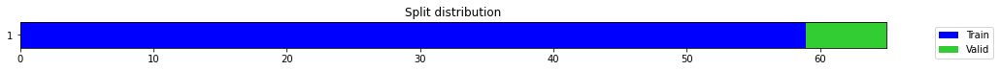

epoch,train_loss,valid_loss,mse,time
0,0.324593,0.114611,0.114611,00:00
1,0.242543,0.000574,0.000574,00:00
2,0.230038,0.102897,0.102897,00:00
3,0.231686,1.008962,1.008962,00:00
4,0.220029,0.036332,0.036332,00:00
5,0.212488,0.173805,0.173805,00:00
6,0.195746,0.071391,0.071391,00:00
7,0.188891,3.771857,3.771857,00:00
8,0.187995,2.110089,2.110089,00:00
9,0.202420,23.577766,23.577766,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26290005445480347,
  "MSE_normalize": 0.06976340999701473,
  "RMSE_normalize": 0.2641276395930853,
  "MAPE_normalize": 0.27139869154661417,
  "MAE": 16958.105112552643,
  "MSE": 290269225.47585356,
  "RMSE": 17037.28926431237,
  "MAPE": 0.1435897805200946
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:14:01.451271+07:00
PROGRESS: [ 859 / 1944 ]


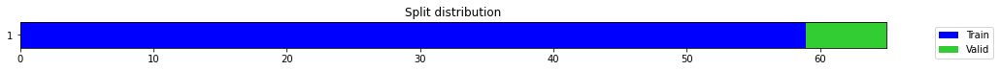

epoch,train_loss,valid_loss,mse,time
0,0.883155,1.107099,1.107099,00:00
1,0.632834,0.203242,0.203242,00:00
2,0.557509,0.585941,0.585941,00:00
3,0.494724,0.054896,0.054896,00:00
4,0.427724,0.486466,0.486466,00:00
5,0.424183,0.152289,0.152289,00:00
6,0.385060,1.407694,1.407694,00:00
7,0.347651,0.163314,0.163314,00:00
8,0.318774,1.888129,1.888129,00:00
9,0.295164,0.003443,0.003443,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12382607658704121,
  "MSE_normalize": 0.015365477029137153,
  "RMSE_normalize": 0.1239575614036399,
  "MAPE_normalize": 0.1279770861184679,
  "MAE": 7987.2772441705065,
  "MSE": 63932154.642462514,
  "RMSE": 7995.758540780388,
  "MAPE": 0.06767224858328909
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:14:45.301568+07:00
PROGRESS: [ 860 / 1944 ]


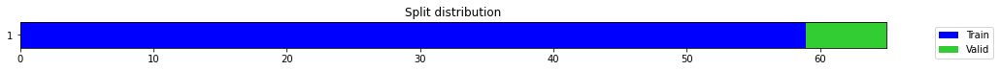

epoch,train_loss,valid_loss,mse,time
0,0.391812,0.054282,0.054282,00:00
1,0.302323,0.033059,0.033059,00:00
2,0.267256,0.024687,0.024687,00:00
3,0.259289,0.536897,0.536897,00:00
4,0.252269,1.584372,1.584372,00:00
5,0.241894,0.309502,0.309502,00:00
6,0.245420,0.070735,0.070735,00:00
7,0.293222,0.076949,0.076949,00:00
8,0.284032,3.024335,3.024335,00:00
9,0.287211,0.173508,0.173508,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18089842796325684,
  "MSE_normalize": 0.03282328408963172,
  "RMSE_normalize": 0.18117197379736116,
  "MAPE_normalize": 0.1869156742450726,
  "MAE": 11668.672197341919,
  "MSE": 136570004.97365314,
  "RMSE": 11686.316997824984,
  "MAPE": 0.09884976649551495
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:16:08.102834+07:00
PROGRESS: [ 861 / 1944 ]


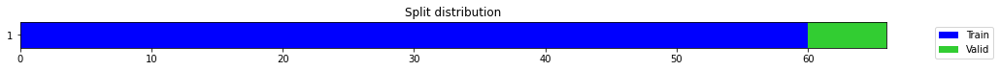

epoch,train_loss,valid_loss,mse,time
0,0.208354,0.002299,0.002299,00:00
1,0.374678,0.811264,0.811264,00:00
2,0.313308,2.785967,2.785967,00:00
3,0.331175,0.022668,0.022668,00:00
4,0.353065,2.253557,2.253557,00:00
5,0.322969,0.676037,0.676037,00:00
6,0.287088,0.084307,0.084307,00:00
7,0.261383,0.086710,0.086710,00:00
8,0.239400,0.000061,0.000061,00:00
9,0.222692,0.004362,0.004362,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06589680910110474,
  "MSE_normalize": 0.004361915292480016,
  "RMSE_normalize": 0.06604479761858625,
  "MAPE_normalize": 0.06825840524231853,
  "MAE": 4250.60777425766,
  "MSE": 18148908.91362155,
  "RMSE": 4260.153625589287,
  "MAPE": 0.036055877116765535
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:16:17.733533+07:00
PROGRESS: [ 862 / 1944 ]


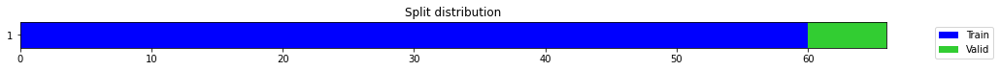

epoch,train_loss,valid_loss,mse,time
0,0.516751,0.420583,0.420583,00:01
1,0.382690,0.406299,0.406299,00:01
2,0.355896,0.068830,0.068830,00:01
3,0.346195,0.001050,0.001050,00:01
4,0.313162,0.000571,0.000571,00:01
5,0.353181,5.150870,5.150870,00:01
6,0.338165,4.833336,4.833336,00:01
7,0.322828,1.475918,1.475918,00:01
8,0.311150,0.000920,0.000920,00:01
9,0.295830,10.953457,10.953457,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26311837633450824,
  "MSE_normalize": 0.06951613527003116,
  "RMSE_normalize": 0.2636591270372243,
  "MAPE_normalize": 0.27181065179290625,
  "MAE": 16972.18774708112,
  "MSE": 289240373.1952046,
  "RMSE": 17007.068330409114,
  "MAPE": 0.14376113046843236
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.4
2022-10-14 23:16:45.510472+07:00
PROGRESS: [ 863 / 1944 ]


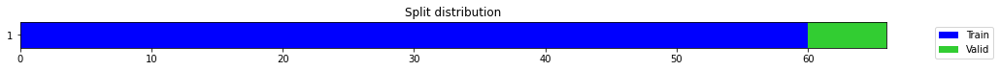

epoch,train_loss,valid_loss,mse,time
0,0.327123,0.169245,0.169245,00:01
1,0.227641,0.017833,0.017833,00:01
2,0.259743,0.001092,0.001092,00:01
3,0.245771,0.090813,0.090813,00:01
4,0.259923,1.208876,1.208876,00:01
5,0.252687,0.120206,0.120206,00:01
6,0.265229,0.353280,0.353280,00:01
7,0.263200,0.020268,0.020268,00:01
8,0.246122,1.607031,1.607031,00:01
9,0.249903,2.230339,2.230339,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05635886391003927,
  "MSE_normalize": 0.003841635850229489,
  "RMSE_normalize": 0.06198093134367609,
  "MAPE_normalize": 0.057708713670448386,
  "MAE": 3635.372157653173,
  "MSE": 15984147.891482124,
  "RMSE": 3998.0179953924826,
  "MAPE": 0.03065004469473993
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.7
2022-10-14 23:18:10.489358+07:00
PROGRESS: [ 864 / 1944 ]


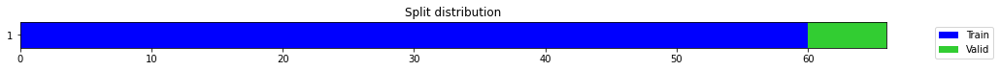

epoch,train_loss,valid_loss,mse,time
0,0.421548,0.003643,0.003643,00:01
1,0.316977,0.072521,0.072521,00:01
2,0.282927,0.015185,0.015185,00:01
3,0.238980,0.060129,0.060129,00:01
4,0.237870,0.177371,0.177371,00:01
5,0.222159,0.574882,0.574882,00:01
6,0.220134,0.000336,0.000336,00:01
7,0.207874,0.150540,0.150540,00:01
8,0.203035,0.150379,0.150379,00:01
9,0.195119,0.549247,0.549247,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.1,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0886174738407135,
  "MSE_normalize": 0.007894810434782684,
  "RMSE_normalize": 0.08885274579202763,
  "MAPE_normalize": 0.09153066589940041,
  "MAE": 5716.181532621384,
  "MSE": 32848458.959805977,
  "RMSE": 5731.35751456895,
  "MAPE": 0.048414297707975174
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:20:49.961161+07:00
PROGRESS: [ 865 / 1944 ]


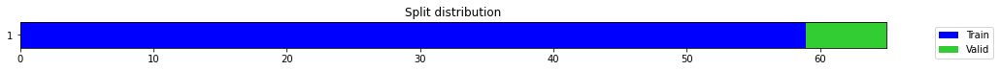

epoch,train_loss,valid_loss,mse,time
0,0.449700,1.067589,1.067589,00:00
1,0.346583,0.010504,0.010504,00:00
2,0.269810,0.001509,0.001509,00:00
3,0.227112,0.108590,0.108590,00:00
4,0.200754,0.044785,0.044785,00:00
5,0.182294,0.077604,0.077604,00:00
6,0.164497,0.537866,0.537866,00:00
7,0.148911,0.642637,0.642637,00:00
8,0.135357,0.570815,0.570815,00:00
9,0.125681,0.511806,0.511806,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.7150531088312467,
  "MSE_normalize": 0.5118055742308892,
  "RMSE_normalize": 0.7154058807634232,
  "MAPE_normalize": 0.7392249388332939,
  "MAE": 46123.78573205074,
  "MSE": 2129503240.0592492,
  "RMSE": 46146.54093276385,
  "MAPE": 0.390840195342071
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:20:52.057745+07:00
PROGRESS: [ 866 / 1944 ]


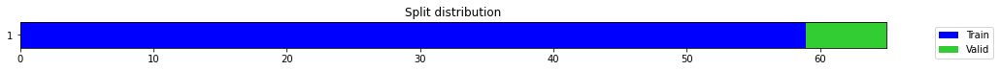

epoch,train_loss,valid_loss,mse,time
0,0.424884,0.148314,0.148314,00:00
1,0.342099,0.003178,0.003178,00:00
2,0.291107,0.188584,0.188584,00:00
3,0.240585,0.296083,0.296083,00:00
4,0.206109,0.013411,0.013411,00:00
5,0.186863,0.014578,0.014578,00:00
6,0.173324,0.070526,0.070526,00:00
7,0.157241,0.849915,0.849915,00:00
8,0.143733,1.101593,1.101593,00:00
9,0.133729,0.296658,0.296658,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20466728011767069,
  "MSE_normalize": 0.04190119082785001,
  "RMSE_normalize": 0.20469780367129006,
  "MAPE_normalize": 0.21177387655830215,
  "MAE": 13201.85823671023,
  "MSE": 174341050.82644925,
  "RMSE": 13203.827128012894,
  "MAPE": 0.11192148027390124
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:20:56.693754+07:00
PROGRESS: [ 867 / 1944 ]


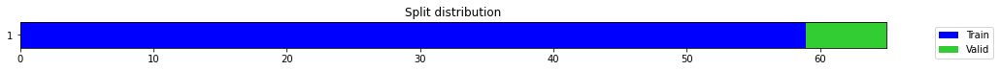

epoch,train_loss,valid_loss,mse,time
0,0.311736,0.056899,0.056899,00:00
1,0.283419,0.049291,0.049291,00:00
2,0.267612,0.014268,0.014268,00:00
3,0.240286,0.000754,0.000754,00:00
4,0.210119,0.001372,0.001372,00:00
5,0.190072,0.003216,0.003216,00:00
6,0.170605,0.004342,0.004342,00:00
7,0.159325,0.021243,0.021243,00:00
8,0.150108,0.387429,0.387429,00:00
9,0.142186,1.047173,1.047173,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.28043344616889954,
  "MSE_normalize": 0.07867881325064907,
  "RMSE_normalize": 0.2804974389377719,
  "MAPE_normalize": 0.28999073146802185,
  "MAE": 18089.079011678696,
  "MSE": 327364132.3525111,
  "RMSE": 18093.20680124204,
  "MAPE": 0.15330346088224825
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:21:06.050748+07:00
PROGRESS: [ 868 / 1944 ]


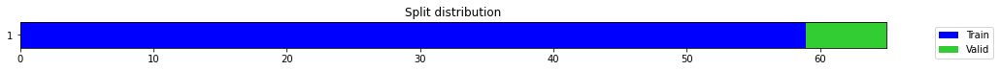

epoch,train_loss,valid_loss,mse,time
0,0.564273,0.847105,0.847105,00:00
1,0.502425,0.736742,0.736742,00:00
2,0.495750,0.576696,0.576696,00:00
3,0.469207,0.433316,0.433316,00:00
4,0.459133,0.288835,0.288835,00:00
5,0.426376,0.154585,0.154585,00:00
6,0.395020,0.044481,0.044481,00:00
7,0.360549,0.001911,0.001911,00:00
8,0.328944,0.009870,0.009870,00:00
9,0.304206,0.012416,0.012416,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10643608371416728,
  "MSE_normalize": 0.011413739600422801,
  "RMSE_normalize": 0.10683510471948254,
  "MAPE_normalize": 0.11031187851574147,
  "MAE": 6865.553143898646,
  "MSE": 47489899.84491261,
  "RMSE": 6891.291594825502,
  "MAPE": 0.05825440457566009
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:21:24.557509+07:00
PROGRESS: [ 869 / 1944 ]


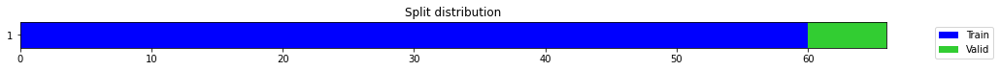

epoch,train_loss,valid_loss,mse,time
0,0.464242,0.629842,0.629842,00:00
1,0.313546,0.047556,0.047556,00:00
2,0.274540,0.196990,0.196990,00:00
3,0.229967,0.082353,0.082353,00:00
4,0.191663,0.402809,0.402809,00:00
5,0.177340,0.237488,0.237488,00:00
6,0.155562,0.045508,0.045508,00:00
7,0.141886,0.003261,0.003261,00:00
8,0.127783,0.000528,0.000528,00:00
9,0.117731,0.000278,0.000278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.015878329674402874,
  "MSE_normalize": 0.00027825327652249615,
  "RMSE_normalize": 0.016680925529553095,
  "MAPE_normalize": 0.016456353346274367,
  "MAE": 1024.215777317683,
  "MSE": 1157746.7767954527,
  "RMSE": 1075.9864203582927,
  "MAPE": 0.008690258423496189
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:21:26.864503+07:00
PROGRESS: [ 870 / 1944 ]


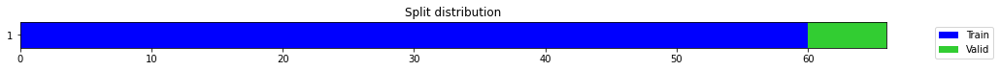

epoch,train_loss,valid_loss,mse,time
0,0.127866,0.014875,0.014875,00:00
1,0.114005,0.027881,0.027881,00:00
2,0.121680,0.024935,0.024935,00:00
3,0.104993,0.064037,0.064037,00:00
4,0.100665,0.003890,0.003890,00:00
5,0.097120,0.062468,0.062468,00:00
6,0.092303,0.023008,0.023008,00:00
7,0.089914,0.011071,0.011071,00:00
8,0.084935,0.422478,0.422478,00:00
9,0.085281,0.004367,0.004367,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3108190695444743,
  "MSE_normalize": 0.09661487172042982,
  "RMSE_normalize": 0.31082932892574633,
  "MAPE_normalize": 0.3215102000751729,
  "MAE": 20049.07326189677,
  "MSE": 401991874.89456385,
  "RMSE": 20049.735033026343,
  "MAPE": 0.169941793074275
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:21:32.037548+07:00
PROGRESS: [ 871 / 1944 ]


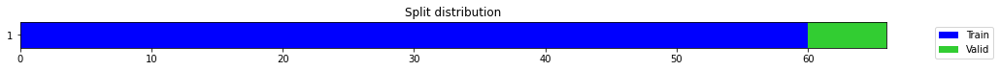

epoch,train_loss,valid_loss,mse,time
0,0.254788,0.689215,0.689215,00:00
1,0.190858,0.271008,0.271008,00:00
2,0.158942,0.012101,0.012101,00:00
3,0.149120,0.064102,0.064102,00:00
4,0.145865,0.095285,0.095285,00:00
5,0.135294,0.004596,0.004596,00:00
6,0.122031,0.281649,0.281649,00:00
7,0.116806,0.203619,0.203619,00:00
8,0.112388,0.000659,0.000659,00:00
9,0.104473,0.137606,0.137606,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13241806626319885,
  "MSE_normalize": 0.01762926578417338,
  "RMSE_normalize": 0.13277524537417876,
  "MAPE_normalize": 0.1372024507948396,
  "MAE": 8541.494946241379,
  "MSE": 73351249.96182019,
  "RMSE": 8564.534427616027,
  "MAPE": 0.07246429436110925
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:21:41.905811+07:00
PROGRESS: [ 872 / 1944 ]


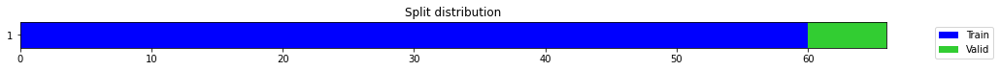

epoch,train_loss,valid_loss,mse,time
0,0.289535,0.276799,0.276799,00:00
1,0.264158,0.220159,0.220159,00:00
2,0.241044,0.134441,0.134441,00:00
3,0.216158,0.035658,0.035658,00:00
4,0.189330,0.001425,0.001425,00:00
5,0.166580,0.027665,0.027665,00:00
6,0.151638,0.060486,0.060486,00:00
7,0.144183,0.071536,0.071536,00:00
8,0.135920,0.058084,0.058084,00:00
9,0.129012,0.002261,0.002261,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1138739784558614,
  "MSE_normalize": 0.012981163035559481,
  "RMSE_normalize": 0.1139349070107993,
  "MAPE_normalize": 0.11787367485784324,
  "MAE": 7345.327106316884,
  "MSE": 54011582.00651128,
  "RMSE": 7349.257241824596,
  "MAPE": 0.06228432314979185
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.8
2022-10-14 23:22:02.914348+07:00
PROGRESS: [ 873 / 1944 ]


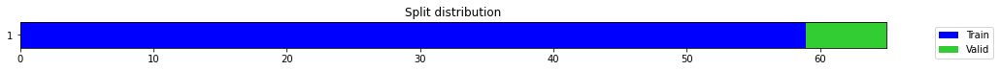

epoch,train_loss,valid_loss,mse,time
0,0.610942,0.661384,0.661384,00:00
1,0.486276,0.076076,0.076076,00:00
2,0.367141,0.607288,0.607288,00:00
3,0.304450,0.001043,0.001043,00:00
4,0.272380,0.000478,0.000478,00:00
5,0.235771,0.000594,0.000594,00:00
6,0.207444,0.046104,0.046104,00:00
7,0.190740,0.120104,0.120104,00:00
8,0.172581,0.167653,0.167653,00:00
9,0.156709,0.170484,0.170484,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4128072261810303,
  "MSE_normalize": 0.1704837202372905,
  "RMSE_normalize": 0.41289674282717526,
  "MAPE_normalize": 0.4268692833347197,
  "MAE": 26627.717317581177,
  "MSE": 709342869.4445697,
  "RMSE": 26633.49149932411,
  "MAPE": 0.22566587933182622
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.9
2022-10-14 23:22:05.111213+07:00
PROGRESS: [ 874 / 1944 ]


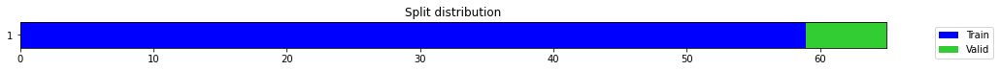

epoch,train_loss,valid_loss,mse,time
0,0.300922,1.320723,1.320723,00:00
1,0.268139,0.063037,0.063037,00:00
2,0.206433,0.842301,0.842301,00:00
3,0.201014,0.717608,0.717608,00:00
4,0.175639,0.146940,0.146940,00:00
5,0.167494,0.566886,0.566886,00:00
6,0.148730,0.039800,0.039800,00:00
7,0.139573,0.173858,0.173858,00:00
8,0.128681,0.079546,0.079546,00:00
9,0.118820,0.078306,0.078306,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.024920205275217693,
  "MSE_normalize": 0.0008524250475699565,
  "RMSE_normalize": 0.02919631907569782,
  "MAPE_normalize": 0.026125503305139113,
  "MAE": 1607.452921072642,
  "MSE": 3546741.169116258,
  "RMSE": 1883.2793656588121,
  "MAPE": 0.013722495945170313
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.9
2022-10-14 23:22:10.420365+07:00
PROGRESS: [ 875 / 1944 ]


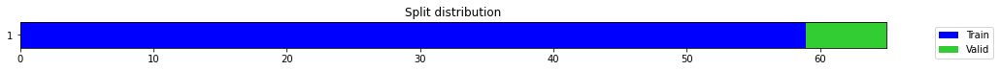

epoch,train_loss,valid_loss,mse,time
0,1.122371,2.690485,2.690485,00:00
1,1.165391,1.976421,1.976421,00:00
2,1.000599,1.058353,1.058353,00:00
3,0.897635,0.256419,0.256419,00:00
4,0.801636,0.007834,0.007834,00:00
5,0.709456,0.293741,0.293741,00:00
6,0.630200,0.379408,0.379408,00:00
7,0.550199,0.164382,0.164382,00:00
8,0.496145,0.002027,0.002027,00:00
9,0.458057,0.009570,0.009570,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.19460107882817587,
  "MSE_normalize": 0.03789354808895832,
  "RMSE_normalize": 0.19466265201357533,
  "MAPE_normalize": 0.20121834229127478,
  "MAE": 12552.547988732656,
  "MSE": 157666187.11419952,
  "RMSE": 12556.519705483663,
  "MAPE": 0.10637768604113956
}
Percent CPU Usage: 100.0
Percent Ram Usage: 33.9
2022-10-14 23:22:20.372278+07:00
PROGRESS: [ 876 / 1944 ]


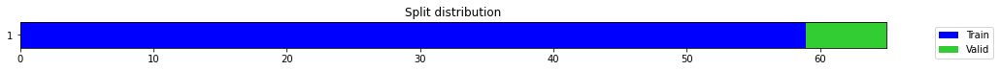

epoch,train_loss,valid_loss,mse,time
0,0.697420,0.508109,0.508109,00:00
1,0.618417,0.232912,0.232912,00:00
2,0.556044,0.069654,0.069654,00:00
3,0.500818,0.009591,0.009591,00:00
4,0.465364,0.002888,0.002888,00:00
5,0.432985,0.024906,0.024906,00:00
6,0.402046,0.046924,0.046924,00:00
7,0.369692,0.000991,0.000991,00:00
8,0.332294,0.069567,0.069567,00:00
9,0.300582,0.185465,0.185465,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14595577120780945,
  "MSE_normalize": 0.02132083252965285,
  "RMSE_normalize": 0.14601654882119647,
  "MAPE_normalize": 0.15106335205857813,
  "MAE": 9414.73106598854,
  "MSE": 88710995.4222069,
  "RMSE": 9418.651465162457,
  "MAPE": 0.07982630856007099
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:22:40.387049+07:00
PROGRESS: [ 877 / 1944 ]


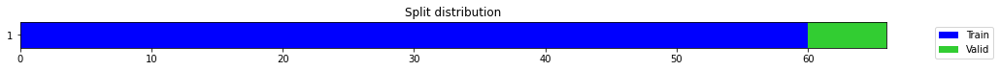

epoch,train_loss,valid_loss,mse,time
0,0.245208,0.320565,0.320565,00:00
1,0.189495,0.002764,0.002764,00:00
2,0.179193,0.175972,0.175972,00:00
3,0.150661,0.272561,0.272561,00:00
4,0.140316,0.759589,0.759589,00:00
5,0.127951,0.001763,0.001763,00:00
6,0.117247,0.381692,0.381692,00:00
7,0.112682,0.058665,0.058665,00:00
8,0.104489,0.000521,0.000521,00:00
9,0.097194,0.001870,0.001870,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03823550542195638,
  "MSE_normalize": 0.0018697522888544427,
  "RMSE_normalize": 0.04324063238268426,
  "MAPE_normalize": 0.0400228815453456,
  "MAE": 2466.3430417378745,
  "MSE": 7779601.78180378,
  "RMSE": 2789.1937512126656,
  "MAPE": 0.02103739084038636
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:22:42.753345+07:00
PROGRESS: [ 878 / 1944 ]


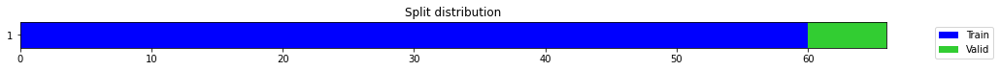

epoch,train_loss,valid_loss,mse,time
0,0.588211,0.183003,0.183003,00:00
1,0.469489,0.513751,0.513751,00:00
2,0.351971,0.316803,0.316803,00:00
3,0.299771,0.275312,0.275312,00:00
4,0.272850,0.565681,0.565681,00:00
5,0.230563,0.042284,0.042284,00:00
6,0.210717,0.002065,0.002065,00:00
7,0.188411,0.296223,0.296223,00:00
8,0.173329,0.001812,0.001812,00:00
9,0.161172,0.536369,0.536369,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09734086195627849,
  "MSE_normalize": 0.009568671500622608,
  "RMSE_normalize": 0.09781958648768972,
  "MAPE_normalize": 0.10090847898116584,
  "MAE": 6278.874959627788,
  "MSE": 39813003.19805828,
  "RMSE": 6309.754606801938,
  "MAPE": 0.05328283325607025
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:22:48.288556+07:00
PROGRESS: [ 879 / 1944 ]


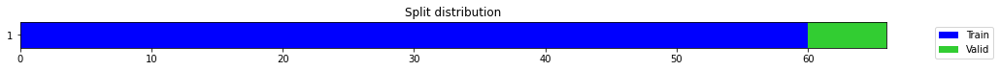

epoch,train_loss,valid_loss,mse,time
0,0.526413,0.496664,0.496664,00:00
1,0.436726,0.254584,0.254584,00:00
2,0.391363,0.033034,0.033034,00:00
3,0.310876,0.084823,0.084823,00:00
4,0.261563,0.542806,0.542806,00:00
5,0.242641,0.830866,0.830866,00:00
6,0.224565,0.235870,0.235870,00:00
7,0.204514,0.043600,0.043600,00:00
8,0.186621,0.302381,0.302381,00:00
9,0.169732,0.065664,0.065664,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14287176728248596,
  "MSE_normalize": 0.02041864499750486,
  "RMSE_normalize": 0.14289382421051253,
  "MAPE_normalize": 0.14783048833526688,
  "MAE": 9215.800476789474,
  "MSE": 84957204.19838664,
  "RMSE": 9217.223236874901,
  "MAPE": 0.07812816120015066
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:22:59.260732+07:00
PROGRESS: [ 880 / 1944 ]


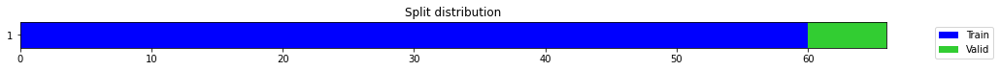

epoch,train_loss,valid_loss,mse,time
0,0.544065,0.668508,0.668508,00:00
1,0.503785,0.522835,0.522835,00:00
2,0.445380,0.336438,0.336438,00:00
3,0.393981,0.167147,0.167147,00:00
4,0.351126,0.043498,0.043498,00:00
5,0.303182,0.000538,0.000538,00:00
6,0.269594,0.043879,0.043879,00:00
7,0.250179,0.166620,0.166620,00:00
8,0.236262,0.251366,0.251366,00:00
9,0.222684,0.210597,0.210597,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.030737449725468952,
  "MSE_normalize": 0.000977139456811808,
  "RMSE_normalize": 0.0312592299459185,
  "MAPE_normalize": 0.03192967615447227,
  "MAE": 1982.6884570916493,
  "MSE": 4065648.6447952692,
  "RMSE": 2016.3453684315268,
  "MAPE": 0.016843574545770415
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:23:21.366102+07:00
PROGRESS: [ 881 / 1944 ]


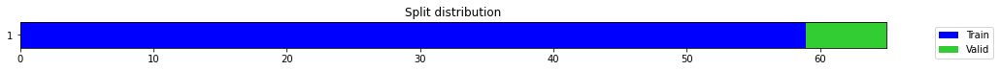

epoch,train_loss,valid_loss,mse,time
0,0.198727,0.074904,0.074904,00:00
1,0.154518,0.135087,0.135087,00:00
2,0.125969,0.006623,0.006623,00:00
3,0.107785,0.055716,0.055716,00:00
4,0.104217,0.007615,0.007615,00:00
5,0.098184,0.649970,0.649970,00:00
6,0.093900,0.296669,0.296669,00:00
7,0.094997,0.105647,0.105647,00:00
8,0.093156,0.008022,0.008022,00:00
9,0.092531,0.002924,0.002924,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.050003498792648315,
  "MSE_normalize": 0.0029235485177832032,
  "RMSE_normalize": 0.0540698485089722,
  "MAPE_normalize": 0.05126720959176576,
  "MAE": 3225.425686120987,
  "MSE": 12164201.318919525,
  "RMSE": 3487.721508222743,
  "MAPE": 0.027212277398133467
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:23:24.061088+07:00
PROGRESS: [ 882 / 1944 ]


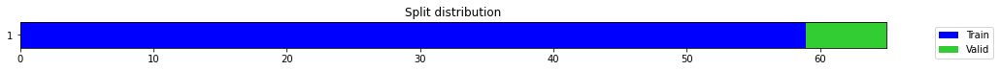

epoch,train_loss,valid_loss,mse,time
0,0.177600,0.050730,0.050730,00:00
1,0.178461,0.339138,0.339138,00:00
2,0.170693,0.129228,0.129228,00:00
3,0.151563,0.399447,0.399447,00:00
4,0.145983,0.077149,0.077149,00:00
5,0.132189,0.003346,0.003346,00:00
6,0.117261,0.002075,0.002075,00:00
7,0.108452,0.010945,0.010945,00:00
8,0.100005,1.107462,1.107462,00:00
9,0.094715,0.105255,0.105255,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.018279234568277996,
  "MSE_normalize": 0.0003457111756854185,
  "RMSE_normalize": 0.018593309971207884,
  "MAPE_normalize": 0.018855323761213464,
  "MAE": 1179.0837465922039,
  "MSE": 1438423.3111432947,
  "RMSE": 1199.3428663827933,
  "MAPE": 0.00997954013803267
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.0
2022-10-14 23:23:30.333809+07:00
PROGRESS: [ 883 / 1944 ]


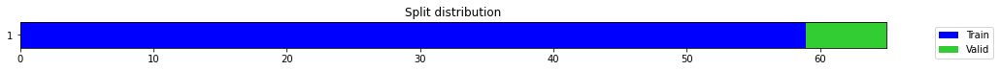

epoch,train_loss,valid_loss,mse,time
0,0.461818,0.451153,0.451153,00:00
1,0.365208,0.202148,0.202148,00:00
2,0.302869,0.023174,0.023174,00:00
3,0.293398,0.013150,0.013150,00:00
4,0.262080,0.099053,0.099053,00:00
5,0.224829,0.110263,0.110263,00:00
6,0.207833,0.033285,0.033285,00:00
7,0.186653,0.170691,0.170691,00:00
8,0.171893,0.065808,0.065808,00:00
9,0.157709,0.041017,0.041017,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.033372332652409874,
  "MSE_normalize": 0.0012448743135914004,
  "RMSE_normalize": 0.03528277644391666,
  "MAPE_normalize": 0.03478065854230752,
  "MAE": 2152.6489454110465,
  "MSE": 5179630.738182426,
  "RMSE": 2275.8802117384002,
  "MAPE": 0.01831923537689105
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.1
2022-10-14 23:23:42.575051+07:00
PROGRESS: [ 884 / 1944 ]


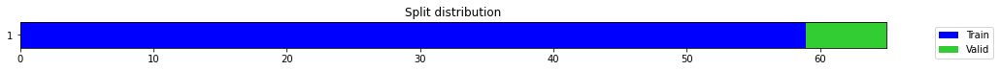

epoch,train_loss,valid_loss,mse,time
0,0.208417,0.000157,0.000157,00:00
1,0.206496,0.026776,0.026776,00:00
2,0.174429,0.131683,0.131683,00:00
3,0.157763,0.229736,0.229736,00:00
4,0.146074,0.188834,0.188834,00:00
5,0.150261,0.013892,0.013892,00:00
6,0.145733,0.142622,0.142622,00:00
7,0.136610,0.635233,0.635233,00:00
8,0.127080,1.012082,1.012082,00:00
9,0.129343,0.468525,0.468525,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10270221034685771,
  "MSE_normalize": 0.010608606530365586,
  "RMSE_normalize": 0.10299808993552058,
  "MAPE_normalize": 0.10641388755134716,
  "MAE": 6624.70337621371,
  "MSE": 44139929.528660804,
  "RMSE": 6643.78879320082,
  "MAPE": 0.056202905251497605
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.1
2022-10-14 23:24:06.783851+07:00
PROGRESS: [ 885 / 1944 ]


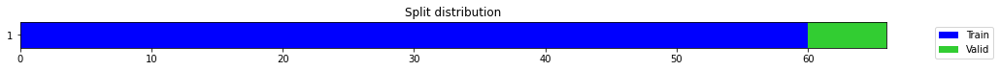

epoch,train_loss,valid_loss,mse,time
0,0.341933,0.584418,0.584418,00:00
1,0.252494,0.029705,0.029705,00:00
2,0.233902,0.006458,0.006458,00:00
3,0.187306,0.103742,0.103742,00:00
4,0.170770,0.000454,0.000454,00:00
5,0.152657,0.193304,0.193304,00:00
6,0.139905,0.426575,0.426575,00:00
7,0.129160,0.450957,0.450957,00:00
8,0.121030,0.357786,0.357786,00:00
9,0.113533,0.268357,0.268357,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.5162946780522665,
  "MSE_normalize": 0.26835744211670115,
  "RMSE_normalize": 0.5180322790296963,
  "MAPE_normalize": 0.5331442192048496,
  "MAE": 33303.0719130834,
  "MSE": 1116572525.2998571,
  "RMSE": 33415.15412653153,
  "MAPE": 0.2820324941546268
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.1
2022-10-14 23:24:09.964778+07:00
PROGRESS: [ 886 / 1944 ]


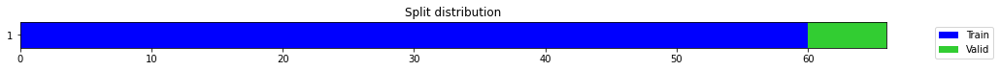

epoch,train_loss,valid_loss,mse,time
0,0.179569,0.378838,0.378838,00:00
1,0.187455,0.000541,0.000541,00:00
2,0.168040,0.014915,0.014915,00:00
3,0.159473,0.485535,0.485535,00:00
4,0.148376,0.534808,0.534808,00:00
5,0.135053,0.040511,0.040511,00:00
6,0.123581,0.485294,0.485294,00:00
7,0.118063,0.039874,0.039874,00:00
8,0.113226,0.008793,0.008793,00:00
9,0.106677,1.019417,1.019417,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09856552879015605,
  "MSE_normalize": 0.00983364802468086,
  "RMSE_normalize": 0.09916475192668442,
  "MAPE_normalize": 0.10221578817712029,
  "MAE": 6357.870869080226,
  "MSE": 40915508.51439765,
  "RMSE": 6396.523158278851,
  "MAPE": 0.05396366624904204
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.1
2022-10-14 23:24:17.106875+07:00
PROGRESS: [ 887 / 1944 ]


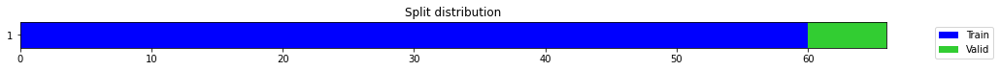

epoch,train_loss,valid_loss,mse,time
0,0.558372,1.369453,1.369453,00:00
1,0.468204,0.686993,0.686993,00:00
2,0.391709,0.110914,0.110914,00:00
3,0.309487,0.145171,0.145171,00:00
4,0.273228,1.161967,1.161967,00:00
5,0.253684,1.363005,1.363005,00:00
6,0.241263,0.390846,0.390846,00:00
7,0.213658,0.028142,0.028142,00:00
8,0.198645,0.162116,0.162116,00:00
9,0.185854,0.006636,0.006636,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.03419881065686544,
  "MSE_normalize": 0.0012038238832368837,
  "RMSE_normalize": 0.03469616525261666,
  "MAPE_normalize": 0.03550580138382813,
  "MAE": 2205.9600826104484,
  "MSE": 5008829.5026211785,
  "RMSE": 2238.041443454785,
  "MAPE": 0.018734836558391216
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.1
2022-10-14 23:24:30.941794+07:00
PROGRESS: [ 888 / 1944 ]


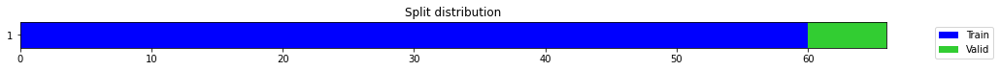

epoch,train_loss,valid_loss,mse,time
0,0.450237,1.612721,1.612721,00:00
1,0.450823,0.979004,0.979004,00:00
2,0.394737,0.447537,0.447537,00:00
3,0.325625,0.110603,0.110603,00:00
4,0.280847,0.005365,0.005365,00:00
5,0.244036,0.220272,0.220272,00:00
6,0.225033,0.596115,0.596115,00:00
7,0.209488,0.810727,0.810727,00:00
8,0.196482,0.475627,0.475627,00:00
9,0.187358,0.065986,0.065986,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.045325626929601036,
  "MSE_normalize": 0.002075535810203514,
  "RMSE_normalize": 0.04555804879715015,
  "MAPE_normalize": 0.046978206578097925,
  "MAE": 2923.684239466985,
  "MSE": 8635818.864085808,
  "RMSE": 2938.6763796113732,
  "MAPE": 0.0248080800663069
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.3
2022-10-14 23:24:58.729287+07:00
PROGRESS: [ 889 / 1944 ]


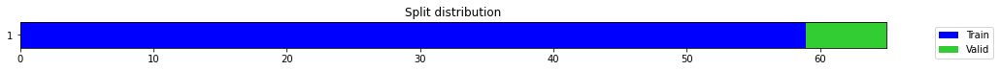

epoch,train_loss,valid_loss,mse,time
0,0.569991,0.970153,0.970153,00:00
1,0.377453,0.317910,0.317910,00:00
2,0.295259,0.615044,0.615044,00:00
3,0.254887,0.006084,0.006084,00:00
4,0.220300,0.672401,0.672401,00:00
5,0.188518,2.532771,2.532771,00:00
6,0.172654,1.736000,1.736000,00:00
7,0.161433,0.516398,0.516398,00:00
8,0.146729,0.180648,0.180648,00:00
9,0.134268,0.142977,0.142977,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.37785009543100995,
  "MSE_normalize": 0.14297679084972378,
  "RMSE_normalize": 0.37812271929854174,
  "MAPE_normalize": 0.3905671555866162,
  "MAE": 24372.842555681866,
  "MSE": 594892972.4442705,
  "RMSE": 24390.427885633137,
  "MAPE": 0.20651306295872085
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.3
2022-10-14 23:25:01.810205+07:00
PROGRESS: [ 890 / 1944 ]


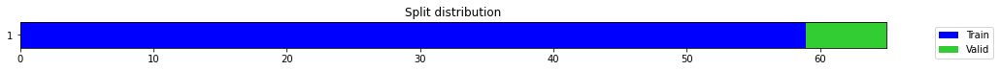

epoch,train_loss,valid_loss,mse,time
0,0.279073,0.164698,0.164698,00:00
1,0.240057,0.007859,0.007859,00:00
2,0.195833,0.008349,0.008349,00:00
3,0.173961,0.013734,0.013734,00:00
4,0.171416,0.458573,0.458573,00:00
5,0.153977,1.111615,1.111615,00:00
6,0.147545,0.024218,0.024218,00:00
7,0.137636,0.195935,0.195935,00:00
8,0.127040,0.680831,0.680831,00:00
9,0.118457,0.004127,0.004127,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.49743272364139557,
  "MSE_normalize": 0.24748403668481478,
  "RMSE_normalize": 0.4974776745591854,
  "MAPE_normalize": 0.5144643999877246,
  "MAE": 32086.40040576458,
  "MSE": 1029723169.3406745,
  "RMSE": 32089.299919765694,
  "MAPE": 0.2719517179586079
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.3
2022-10-14 23:25:09.168752+07:00
PROGRESS: [ 891 / 1944 ]


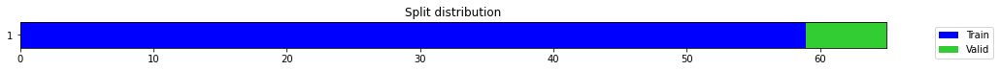

epoch,train_loss,valid_loss,mse,time
0,0.346641,0.343053,0.343053,00:00
1,0.283454,0.052171,0.052171,00:00
2,0.238574,0.019946,0.019946,00:00
3,0.210633,0.029009,0.029009,00:00
4,0.187745,0.016644,0.016644,00:00
5,0.174723,0.021777,0.021777,00:00
6,0.165258,0.291244,0.291244,00:00
7,0.150796,1.429427,1.429427,00:00
8,0.139572,0.135438,0.135438,00:00
9,0.132182,0.163011,0.163011,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06725120544433594,
  "MSE_normalize": 0.00453169087052648,
  "RMSE_normalize": 0.0673178347135919,
  "MAPE_normalize": 0.06960703239940332,
  "MAE": 4337.971755981445,
  "MSE": 18855305.36910403,
  "RMSE": 4342.269610365533,
  "MAPE": 0.0367817953348549
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.2
2022-10-14 23:25:22.672264+07:00
PROGRESS: [ 892 / 1944 ]


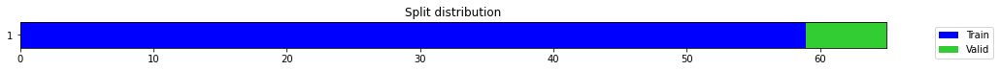

epoch,train_loss,valid_loss,mse,time
0,0.361097,0.370639,0.370639,00:00
1,0.273793,0.045682,0.045682,00:00
2,0.233322,0.016908,0.016908,00:00
3,0.207127,0.022230,0.022230,00:00
4,0.195836,0.008945,0.008945,00:00
5,0.171580,0.169999,0.169999,00:00
6,0.154549,0.737573,0.737573,00:00
7,0.144533,1.104505,1.104505,00:00
8,0.138751,0.511191,0.511191,00:00
9,0.132303,0.113404,0.113404,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11423959334691365,
  "MSE_normalize": 0.013059545482255666,
  "RMSE_normalize": 0.11427836839164124,
  "MAPE_normalize": 0.11821454170536266,
  "MAE": 7368.910729249318,
  "MSE": 54337713.02697571,
  "RMSE": 7371.411874734426,
  "MAPE": 0.0624737232385714
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.6
2022-10-14 23:25:48.919019+07:00
PROGRESS: [ 893 / 1944 ]


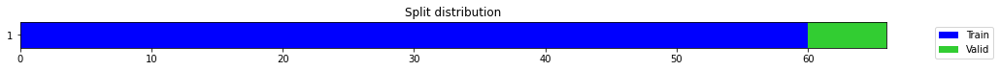

epoch,train_loss,valid_loss,mse,time
0,0.640929,0.221412,0.221412,00:00
1,0.386537,0.003771,0.003771,00:00
2,0.352836,0.630354,0.630354,00:00
3,0.306686,0.066793,0.066793,00:00
4,0.264370,0.811025,0.811025,00:00
5,0.254591,0.018021,0.018021,00:00
6,0.221263,0.560355,0.560355,00:00
7,0.195146,0.703517,0.703517,00:00
8,0.179398,0.417870,0.417870,00:00
9,0.164496,0.316654,0.316654,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.562717542052269,
  "MSE_normalize": 0.3166538997438013,
  "RMSE_normalize": 0.5627200900481529,
  "MAPE_normalize": 0.5821474739644095,
  "MAE": 36297.53233253956,
  "MSE": 1317522784.8878796,
  "RMSE": 36297.69668846606,
  "MAPE": 0.30768908816901913
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.6
2022-10-14 23:25:52.361465+07:00
PROGRESS: [ 894 / 1944 ]


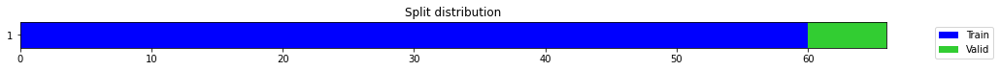

epoch,train_loss,valid_loss,mse,time
0,0.239386,0.192888,0.192888,00:00
1,0.178398,0.001165,0.001165,00:00
2,0.153335,0.051329,0.051329,00:00
3,0.131790,0.140624,0.140624,00:00
4,0.116828,0.145681,0.145681,00:00
5,0.111990,0.219629,0.219629,00:00
6,0.105135,0.069733,0.069733,00:00
7,0.101355,0.040436,0.040436,00:00
8,0.094155,0.515792,0.515792,00:00
9,0.088536,0.019278,0.019278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18958150347073874,
  "MSE_normalize": 0.036033163179133375,
  "RMSE_normalize": 0.189824032143281,
  "MAPE_normalize": 0.1963259924694181,
  "MAE": 12228.765299876532,
  "MSE": 149925560.80472067,
  "RMSE": 12244.409369370198,
  "MAPE": 0.103716976066266
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.6
2022-10-14 23:26:00.145858+07:00
PROGRESS: [ 895 / 1944 ]


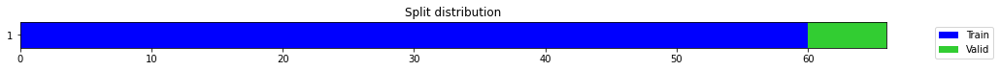

epoch,train_loss,valid_loss,mse,time
0,0.358398,0.051990,0.051990,00:00
1,0.293681,0.110041,0.110041,00:00
2,0.227413,0.063641,0.063641,00:00
3,0.196492,0.027648,0.027648,00:00
4,0.206243,0.040724,0.040724,00:00
5,0.204604,0.977961,0.977961,00:00
6,0.196768,0.827757,0.827757,00:00
7,0.182259,0.126575,0.126575,00:00
8,0.166021,0.147673,0.147673,00:00
9,0.153275,0.106243,0.106243,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.048008511463801064,
  "MSE_normalize": 0.0023739982939421367,
  "RMSE_normalize": 0.04872369335284566,
  "MAPE_normalize": 0.04984559152256782,
  "MAE": 3096.741023461024,
  "MSE": 9877651.423476422,
  "RMSE": 3142.8731160319567,
  "MAPE": 0.026300784290183173
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.6
2022-10-14 23:26:15.497324+07:00
PROGRESS: [ 896 / 1944 ]


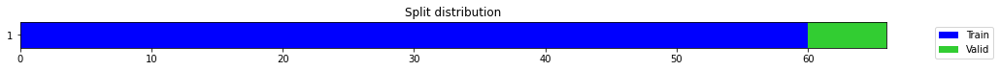

epoch,train_loss,valid_loss,mse,time
0,0.439122,0.989087,0.989087,00:00
1,0.340838,0.381647,0.381647,00:00
2,0.280342,0.063836,0.063836,00:00
3,0.232054,0.009592,0.009592,00:00
4,0.199827,0.079286,0.079286,00:00
5,0.184925,0.122089,0.122089,00:00
6,0.183377,0.149060,0.149060,00:00
7,0.173671,0.156229,0.156229,00:00
8,0.159092,0.047558,0.047558,00:00
9,0.147581,0.063642,0.063642,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.12441025177637736,
  "MSE_normalize": 0.015524714761294689,
  "RMSE_normalize": 0.12459821331501784,
  "MAPE_normalize": 0.12885633685988704,
  "MAE": 8024.9588805834455,
  "MSE": 64594705.58688849,
  "RMSE": 8037.083151671911,
  "MAPE": 0.06806844744195965
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.7
2022-10-14 23:26:45.945025+07:00
PROGRESS: [ 897 / 1944 ]


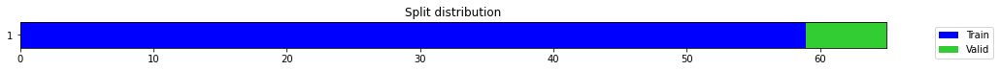

epoch,train_loss,valid_loss,mse,time
0,0.261321,0.033395,0.033395,00:00
1,0.213005,0.024673,0.024673,00:00
2,0.197432,0.312271,0.312271,00:00
3,0.171447,0.754317,0.754317,00:00
4,0.176647,0.050914,0.050914,00:00
5,0.165009,1.213813,1.213813,00:00
6,0.152770,0.084798,0.084798,00:00
7,0.143855,1.227773,1.227773,00:00
8,0.141313,1.173402,1.173402,00:00
9,0.139553,0.784406,0.784406,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.8840836683909098,
  "MSE_normalize": 0.7844057333262775,
  "RMSE_normalize": 0.8856668297538739,
  "MAPE_normalize": 0.9133926027281705,
  "MAE": 57026.932945887245,
  "MSE": 3263728717.979534,
  "RMSE": 57129.05318644388,
  "MAPE": 0.4830692971563739
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.7
2022-10-14 23:26:50.190013+07:00
PROGRESS: [ 898 / 1944 ]


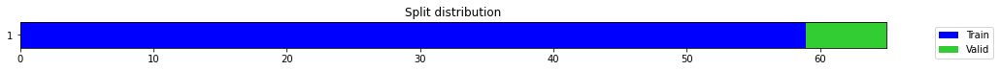

epoch,train_loss,valid_loss,mse,time
0,0.455773,0.338252,0.338252,00:00
1,0.347278,0.044516,0.044516,00:00
2,0.272018,0.204095,0.204095,00:00
3,0.225101,0.212823,0.212823,00:00
4,0.216971,0.045444,0.045444,00:00
5,0.202423,0.899330,0.899330,00:00
6,0.190172,2.933284,2.933284,00:00
7,0.185880,0.190793,0.190793,00:00
8,0.178953,0.456054,0.456054,00:00
9,0.164077,0.013294,0.013294,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3764931559562683,
  "MSE_normalize": 0.14197017837230183,
  "RMSE_normalize": 0.37678930235915914,
  "MAPE_normalize": 0.38914922647535394,
  "MAE": 24285.31453180313,
  "MSE": 590704693.4569316,
  "RMSE": 24304.4171593752,
  "MAPE": 0.20576717316182921
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.7
2022-10-14 23:26:58.056974+07:00
PROGRESS: [ 899 / 1944 ]


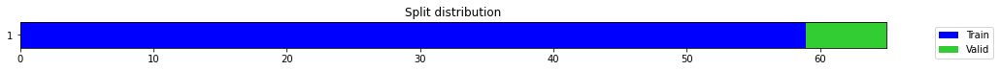

epoch,train_loss,valid_loss,mse,time
0,0.582514,1.549318,1.549318,00:00
1,0.493393,0.311576,0.311576,00:00
2,0.411312,0.077399,0.077399,00:00
3,0.369281,0.512232,0.512232,00:00
4,0.328296,0.078672,0.078672,00:00
5,0.281420,0.190080,0.190080,00:00
6,0.257976,0.103974,0.103974,00:00
7,0.232956,0.030850,0.030850,00:00
8,0.218453,1.319412,1.319412,00:00
9,0.201488,1.635934,1.635934,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.05114575227101644,
  "MSE_normalize": 0.0026396527160474173,
  "RMSE_normalize": 0.05137755070113227,
  "MAPE_normalize": 0.05300076748113413,
  "MAE": 3299.1056044896445,
  "MSE": 10982977.314972192,
  "RMSE": 3314.0575304258364,
  "MAPE": 0.02799092379380282
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.7
2022-10-14 23:27:13.067386+07:00
PROGRESS: [ 900 / 1944 ]


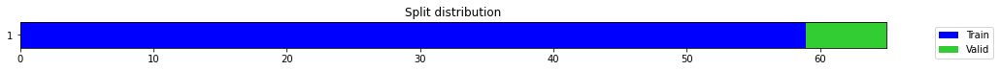

epoch,train_loss,valid_loss,mse,time
0,0.450344,1.098585,1.098585,00:00
1,0.411347,0.482401,0.482401,00:00
2,0.372241,0.152886,0.152886,00:00
3,0.352613,0.021467,0.021467,00:00
4,0.307340,0.000920,0.000920,00:00
5,0.272563,0.001000,0.001000,00:00
6,0.241607,0.005071,0.005071,00:00
7,0.224340,0.001805,0.001805,00:00
8,0.210225,0.036693,0.036693,00:00
9,0.205438,0.066649,0.066649,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2733839551607768,
  "MSE_normalize": 0.07485564530014699,
  "RMSE_normalize": 0.2735975973946902,
  "MAPE_normalize": 0.2825747567986219,
  "MAE": 17634.358643690746,
  "MSE": 311456825.0706017,
  "RMSE": 17648.139422347096,
  "MAPE": 0.14941452332107688
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.8
2022-10-14 23:27:43.180003+07:00
PROGRESS: [ 901 / 1944 ]


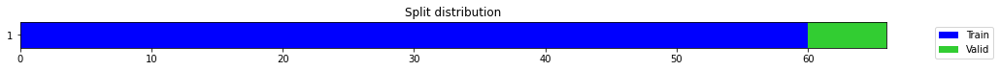

epoch,train_loss,valid_loss,mse,time
0,0.210466,0.005460,0.005460,00:00
1,0.161959,0.001092,0.001092,00:00
2,0.154788,0.626627,0.626627,00:00
3,0.152428,0.004592,0.004592,00:00
4,0.145261,1.694678,1.694678,00:00
5,0.140890,0.002551,0.002551,00:00
6,0.132900,0.172804,0.172804,00:00
7,0.125362,0.259943,0.259943,00:00
8,0.119287,0.169485,0.169485,00:00
9,0.114373,0.100371,0.100371,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.31404950221379596,
  "MSE_normalize": 0.10037082236048533,
  "RMSE_normalize": 0.3168135451026129,
  "MAPE_normalize": 0.3239430488472226,
  "MAE": 20257.449090798695,
  "MSE": 417619506.6754803,
  "RMSE": 20435.74091329894,
  "MAPE": 0.17145433085486905
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.8
2022-10-14 23:27:46.974040+07:00
PROGRESS: [ 902 / 1944 ]


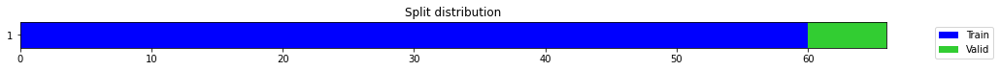

epoch,train_loss,valid_loss,mse,time
0,0.397474,0.406936,0.406936,00:00
1,0.299988,0.053842,0.053842,00:00
2,0.237299,0.321064,0.321064,00:00
3,0.258167,0.025119,0.025119,00:00
4,0.229454,0.810011,0.810011,00:00
5,0.204148,0.348148,0.348148,00:00
6,0.179962,0.136213,0.136213,00:00
7,0.159382,0.198393,0.198393,00:00
8,0.144042,0.375668,0.375668,00:00
9,0.129656,0.041482,0.041482,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1689207156499227,
  "MSE_normalize": 0.028545707611761156,
  "RMSE_normalize": 0.1689547501899877,
  "MAPE_normalize": 0.17475093036296852,
  "MAE": 10896.061842282614,
  "MSE": 118772010.13368833,
  "RMSE": 10898.257206254968,
  "MAPE": 0.09236371927634872
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.8
2022-10-14 23:27:55.991440+07:00
PROGRESS: [ 903 / 1944 ]


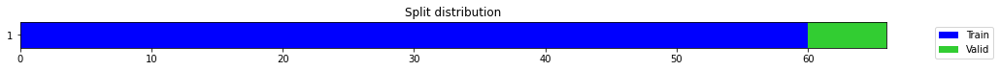

epoch,train_loss,valid_loss,mse,time
0,0.775636,1.320426,1.320426,00:00
1,0.667761,0.756408,0.756408,00:00
2,0.521621,0.139122,0.139122,00:00
3,0.410328,0.093154,0.093154,00:00
4,0.384940,0.716349,0.716349,00:00
5,0.367208,0.044003,0.044003,00:00
6,0.317061,0.308034,0.308034,00:00
7,0.293230,0.000824,0.000824,00:00
8,0.264926,0.232549,0.232549,00:00
9,0.239053,0.161597,0.161597,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12947669625282288,
  "MSE_normalize": 0.016832286779465615,
  "RMSE_normalize": 0.1297393031408201,
  "MAPE_normalize": 0.1341360653954819,
  "MAE": 8351.764815092087,
  "MSE": 70035206.8035666,
  "RMSE": 8368.70400979546,
  "MAPE": 0.07084947401363627
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.0
2022-10-14 23:28:13.664513+07:00
PROGRESS: [ 904 / 1944 ]


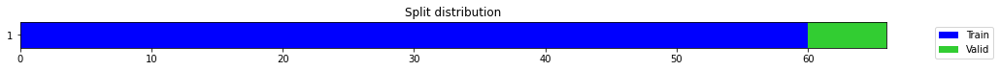

epoch,train_loss,valid_loss,mse,time
0,0.294046,0.256826,0.256826,00:00
1,0.209334,0.025381,0.025381,00:00
2,0.173394,0.063053,0.063053,00:00
3,0.148367,0.204653,0.204653,00:00
4,0.140514,0.333388,0.333388,00:00
5,0.146005,0.269731,0.269731,00:00
6,0.135798,0.005165,0.005165,00:00
7,0.126570,0.189576,0.189576,00:00
8,0.121900,0.356021,0.356021,00:00
9,0.118408,0.142938,0.142938,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1085841457049052,
  "MSE_normalize": 0.01179366763975409,
  "RMSE_normalize": 0.10859865395001031,
  "MAPE_normalize": 0.11233999152757444,
  "MAE": 7004.111734549205,
  "MSE": 49070691.519487746,
  "RMSE": 7005.047574391465,
  "MAPE": 0.05937474226478678
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:28:49.750416+07:00
PROGRESS: [ 905 / 1944 ]


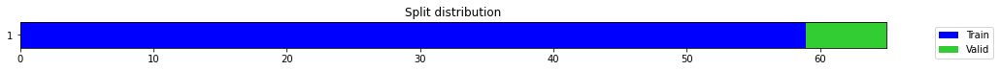

epoch,train_loss,valid_loss,mse,time
0,0.427732,0.502802,0.502802,00:00
1,0.319298,0.148748,0.148748,00:00
2,0.272287,1.758291,1.758291,00:00
3,0.227565,3.099565,3.099565,00:00
4,0.198801,0.054370,0.054370,00:00
5,0.174890,0.002467,0.002467,00:00
6,0.156465,0.026662,0.026662,00:00
7,0.141573,0.001204,0.001204,00:00
8,0.131203,0.067040,0.067040,00:00
9,0.119869,0.070152,0.070152,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26474974552790326,
  "MSE_normalize": 0.07015177090962865,
  "RMSE_normalize": 0.26486179586650216,
  "MAPE_normalize": 0.2737219177247087,
  "MAE": 17077.41758553187,
  "MSE": 291885104.36300033,
  "RMSE": 17084.645280572855,
  "MAPE": 0.1447156270491116
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:28:54.846178+07:00
PROGRESS: [ 906 / 1944 ]


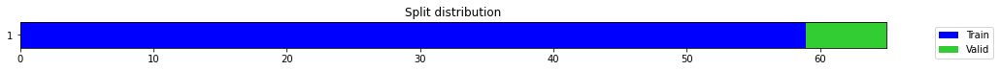

epoch,train_loss,valid_loss,mse,time
0,0.159354,0.017023,0.017023,00:00
1,0.127260,0.198549,0.198549,00:00
2,0.121793,0.340058,0.340058,00:00
3,0.108899,0.184760,0.184760,00:00
4,0.097354,1.430635,1.430635,00:00
5,0.086893,0.533259,0.533259,00:00
6,0.081163,1.921314,1.921314,00:00
7,0.085811,0.102265,0.102265,00:00
8,0.079902,0.954816,0.954816,00:00
9,0.081932,0.003882,0.003882,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.058736562728881836,
  "MSE_normalize": 0.00374596179375312,
  "RMSE_normalize": 0.06120426287239411,
  "MAPE_normalize": 0.06115546200373856,
  "MAE": 3788.743242263794,
  "MSE": 15586070.52868238,
  "RMSE": 3947.9197723209095,
  "MAPE": 0.03222581146462746
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.7
2022-10-14 23:29:07.111434+07:00
PROGRESS: [ 907 / 1944 ]


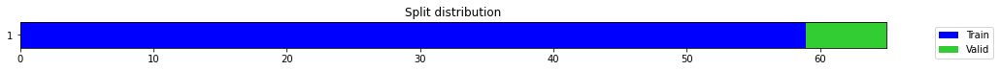

epoch,train_loss,valid_loss,mse,time
0,0.148229,0.000857,0.000857,00:00
1,0.122444,0.036664,0.036664,00:00
2,0.102790,0.086470,0.086470,00:00
3,0.092748,0.421187,0.421187,00:00
4,0.086075,1.424444,1.424444,00:00
5,0.083912,1.663575,1.663575,00:00
6,0.084792,0.798382,0.798382,00:00
7,0.081922,0.990011,0.990011,00:00
8,0.084847,1.687800,1.687800,00:00
9,0.085758,0.037018,0.037018,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1530259350935618,
  "MSE_normalize": 0.023518662245806492,
  "RMSE_normalize": 0.15335795462187962,
  "MAPE_normalize": 0.15853134820411063,
  "MAE": 9870.78491727511,
  "MSE": 97855650.6141339,
  "RMSE": 9892.201504929724,
  "MAPE": 0.08373517462485074
}
Percent CPU Usage: 100.0
Percent Ram Usage: 34.8
2022-10-14 23:29:31.048411+07:00
PROGRESS: [ 908 / 1944 ]


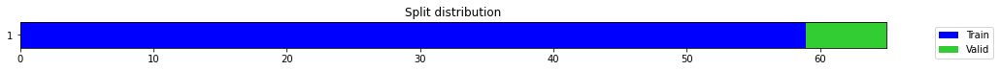

epoch,train_loss,valid_loss,mse,time
0,0.975244,1.834726,1.834726,00:00
1,0.855078,0.649488,0.649488,00:00
2,0.754864,0.090240,0.090240,00:00
3,0.700835,0.012281,0.012281,00:00
4,0.619393,0.154293,0.154293,00:00
5,0.557560,0.226068,0.226068,00:00
6,0.491850,0.109290,0.109290,00:00
7,0.430220,0.006833,0.006833,00:00
8,0.395106,0.007390,0.007390,00:00
9,0.357412,0.086153,0.086153,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18619630734125772,
  "MSE_normalize": 0.03468485858630407,
  "RMSE_normalize": 0.18623871398370442,
  "MAPE_normalize": 0.1926880301877235,
  "MAE": 12010.406608740488,
  "MSE": 144315580.87565973,
  "RMSE": 12013.14200680487,
  "MAPE": 0.10182806156807866
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.0
2022-10-14 23:30:18.406348+07:00
PROGRESS: [ 909 / 1944 ]


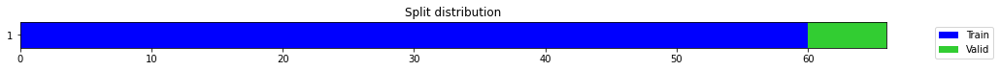

epoch,train_loss,valid_loss,mse,time
0,0.271922,0.025126,0.025126,00:00
1,0.246298,0.443645,0.443645,00:00
2,0.219642,0.123633,0.123633,00:00
3,0.181687,0.647986,0.647986,00:00
4,0.157408,0.020749,0.020749,00:00
5,0.141982,0.002165,0.002165,00:00
6,0.128009,0.234474,0.234474,00:00
7,0.118304,0.075404,0.075404,00:00
8,0.112459,0.007567,0.007567,00:00
9,0.102348,0.000278,0.000278,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.013878822326660156,
  "MSE_normalize": 0.00027842213707529595,
  "RMSE_normalize": 0.016685986248205286,
  "MAPE_normalize": 0.01420396983483245,
  "MAE": 895.2395553588867,
  "MSE": 1158449.3660449851,
  "RMSE": 1076.312856954234,
  "MAPE": 0.007545410689099815
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.0
2022-10-14 23:30:24.184299+07:00
PROGRESS: [ 910 / 1944 ]


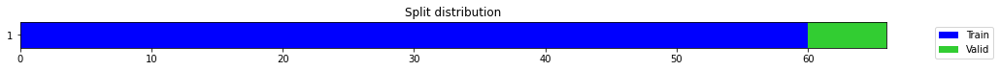

epoch,train_loss,valid_loss,mse,time
0,0.204614,0.037709,0.037709,00:00
1,0.159180,0.079728,0.079728,00:00
2,0.177713,0.001029,0.001029,00:00
3,0.168771,0.215747,0.215747,00:00
4,0.155872,0.003953,0.003953,00:00
5,0.144799,0.024852,0.024852,00:00
6,0.139924,0.700737,0.700737,00:00
7,0.136220,0.968404,0.968404,00:00
8,0.123938,0.644517,0.644517,00:00
9,0.119019,0.050164,0.050164,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2671000560124715,
  "MSE_normalize": 0.0713669010934126,
  "RMSE_normalize": 0.26714584236594924,
  "MAPE_normalize": 0.27621869500073765,
  "MAE": 17229.02201302846,
  "MSE": 296940976.73670435,
  "RMSE": 17231.97541597319,
  "MAPE": 0.1460190435275329
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.0
2022-10-14 23:30:37.681510+07:00
PROGRESS: [ 911 / 1944 ]


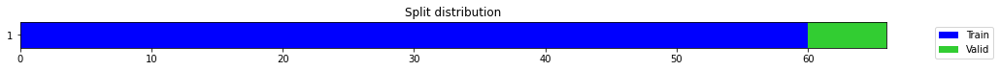

epoch,train_loss,valid_loss,mse,time
0,0.268743,0.438779,0.438779,00:00
1,0.200117,0.009618,0.009618,00:00
2,0.158323,0.080868,0.080868,00:00
3,0.159813,0.074653,0.074653,00:00
4,0.147772,0.054804,0.054804,00:00
5,0.134336,0.145286,0.145286,00:00
6,0.127294,0.253857,0.253857,00:00
7,0.123502,0.108100,0.108100,00:00
8,0.114832,0.720739,0.720739,00:00
9,0.106536,0.070382,0.070382,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.048581461111704506,
  "MSE_normalize": 0.002394751221836818,
  "RMSE_normalize": 0.04893619541644832,
  "MAPE_normalize": 0.05037958784737984,
  "MAE": 3133.6985675493875,
  "MSE": 9963999.500593109,
  "RMSE": 3156.5803491425827,
  "MAPE": 0.026597643110796963
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.0
2022-10-14 23:31:03.682185+07:00
PROGRESS: [ 912 / 1944 ]


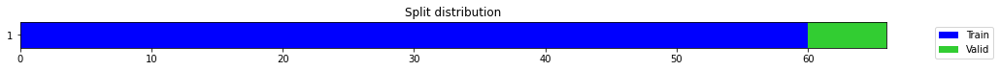

epoch,train_loss,valid_loss,mse,time
0,0.453636,0.215468,0.215468,00:00
1,0.293698,0.007540,0.007540,00:00
2,0.221788,0.332488,0.332488,00:00
3,0.202696,0.556139,0.556139,00:00
4,0.194242,0.269963,0.269963,00:00
5,0.176960,0.076790,0.076790,00:00
6,0.162607,0.045974,0.045974,00:00
7,0.144106,0.001091,0.001091,00:00
8,0.136236,0.002101,0.002101,00:00
9,0.127804,0.103403,0.103403,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1280893882115682,
  "MSE_normalize": 0.016413696604254586,
  "RMSE_normalize": 0.12811594984331415,
  "MAPE_normalize": 0.13254221156710025,
  "MAE": 8262.277897198996,
  "MSE": 68293551.02791709,
  "RMSE": 8263.991228693136,
  "MAPE": 0.07004654896993544
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:31:55.691008+07:00
PROGRESS: [ 913 / 1944 ]


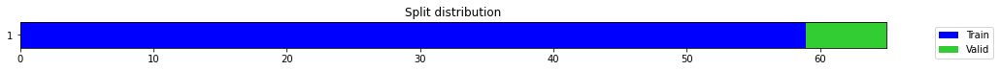

epoch,train_loss,valid_loss,mse,time
0,0.175062,0.314973,0.314973,00:00
1,0.138172,0.157365,0.157365,00:00
2,0.205176,0.066433,0.066433,00:00
3,0.199474,0.160457,0.160457,00:00
4,0.173393,0.038419,0.038419,00:00
5,0.156706,0.930618,0.930618,00:00
6,0.144525,0.348299,0.348299,00:00
7,0.129395,0.002161,0.002161,00:00
8,0.120991,0.004094,0.004094,00:00
9,0.112980,0.001579,0.001579,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03701170285542806,
  "MSE_normalize": 0.001579067044535994,
  "RMSE_normalize": 0.039737476574840454,
  "MAPE_normalize": 0.038611101526396345,
  "MAE": 2387.4028809865317,
  "MSE": 6570128.495890922,
  "RMSE": 2563.2261889835086,
  "MAPE": 0.02032757070782691
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:32:02.273109+07:00
PROGRESS: [ 914 / 1944 ]


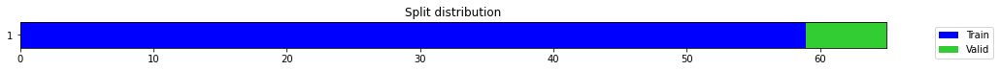

epoch,train_loss,valid_loss,mse,time
0,0.353577,0.286038,0.286038,00:00
1,0.315374,0.026615,0.026615,00:00
2,0.259538,0.182730,0.182730,00:00
3,0.253894,1.004044,1.004044,00:00
4,0.226343,1.533137,1.533137,00:00
5,0.207625,0.134325,0.134325,00:00
6,0.193484,2.706888,2.706888,00:00
7,0.173996,0.925146,0.925146,00:00
8,0.157744,0.006661,0.006661,00:00
9,0.143967,1.852601,1.852601,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2482579747835795,
  "MSE_normalize": 0.061645051471018064,
  "RMSE_normalize": 0.24828421510643414,
  "MAPE_normalize": 0.256771409592494,
  "MAE": 16013.632405440012,
  "MSE": 256490635.21518275,
  "RMSE": 16015.325011225428,
  "MAPE": 0.13572896382322772
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:32:16.848420+07:00
PROGRESS: [ 915 / 1944 ]


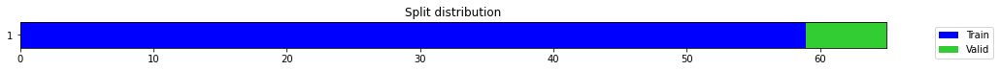

epoch,train_loss,valid_loss,mse,time
0,0.231736,0.102537,0.102537,00:00
1,0.198603,0.028333,0.028333,00:00
2,0.161660,0.014843,0.014843,00:00
3,0.157875,0.007278,0.007278,00:00
4,0.153554,0.806911,0.806911,00:00
5,0.149943,0.589324,0.589324,00:00
6,0.145533,0.404229,0.404229,00:00
7,0.140814,1.545238,1.545238,00:00
8,0.131768,3.763753,3.763753,00:00
9,0.124899,0.304600,0.304600,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10995769500732422,
  "MSE_normalize": 0.012102084609503313,
  "RMSE_normalize": 0.11000947508966359,
  "MAPE_normalize": 0.1138010890378086,
  "MAE": 7092.711158752441,
  "MSE": 50353942.365978025,
  "RMSE": 7096.05118118366,
  "MAPE": 0.06013698285343031
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:32:44.393788+07:00
PROGRESS: [ 916 / 1944 ]


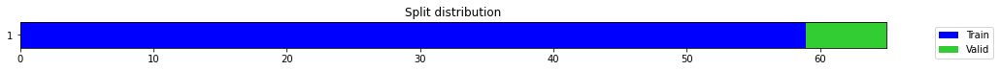

epoch,train_loss,valid_loss,mse,time
0,0.601971,0.949482,0.949482,00:00
1,0.445060,0.036329,0.036329,00:00
2,0.374227,0.055291,0.055291,00:00
3,0.332341,0.005989,0.005989,00:00
4,0.289377,0.152120,0.152120,00:00
5,0.254761,0.235415,0.235415,00:00
6,0.238122,0.136470,0.136470,00:00
7,0.223622,0.243595,0.243595,00:00
8,0.206750,0.937568,0.937568,00:00
9,0.190531,1.441609,1.441609,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.284042368332545,
  "MSE_normalize": 0.08073310152402335,
  "RMSE_normalize": 0.2841357096952499,
  "MAPE_normalize": 0.2936869622234509,
  "MAE": 18321.86892692248,
  "MSE": 335911545.18743414,
  "RMSE": 18327.8898181824,
  "MAPE": 0.1552663832421444
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:33:39.081148+07:00
PROGRESS: [ 917 / 1944 ]


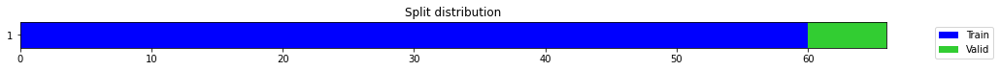

epoch,train_loss,valid_loss,mse,time
0,0.143327,0.094680,0.094680,00:00
1,0.129862,0.461212,0.461212,00:00
2,0.240589,2.955636,2.955636,00:00
3,0.225390,0.827625,0.827625,00:00
4,0.213779,1.358146,1.358146,00:00
5,0.192304,0.189066,0.189066,00:00
6,0.174811,0.252843,0.252843,00:00
7,0.164951,0.101307,0.101307,00:00
8,0.151396,0.007567,0.007567,00:00
9,0.142027,0.001199,0.001199,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.029694785674413044,
  "MSE_normalize": 0.0011991675961559405,
  "RMSE_normalize": 0.03462899935250715,
  "MAPE_normalize": 0.031124762467258482,
  "MAE": 1915.432455142339,
  "MSE": 4989455.781574049,
  "RMSE": 2233.708974234121,
  "MAPE": 0.016349915848242306
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:33:47.352189+07:00
PROGRESS: [ 918 / 1944 ]


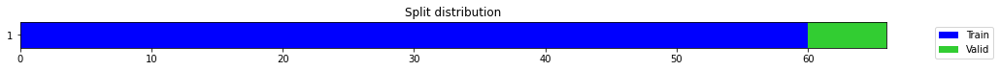

epoch,train_loss,valid_loss,mse,time
0,0.256572,0.059504,0.059504,00:00
1,0.204513,0.642403,0.642403,00:00
2,0.190416,0.350691,0.350691,00:00
3,0.159832,0.400514,0.400514,00:00
4,0.172214,2.951466,2.951466,00:00
5,0.201911,6.265039,6.265039,00:00
6,0.185872,2.222792,2.222792,00:00
7,0.172154,4.541852,4.541852,00:00
8,0.166701,0.885497,0.885497,00:00
9,0.164524,0.282022,0.282022,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10520782073338826,
  "MSE_normalize": 0.011243347831000486,
  "RMSE_normalize": 0.10603465391559726,
  "MAPE_normalize": 0.10914096777377096,
  "MAE": 6786.325268586476,
  "MSE": 46780939.56129414,
  "RMSE": 6839.659316171686,
  "MAPE": 0.057610699490380834
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:34:07.148481+07:00
PROGRESS: [ 919 / 1944 ]


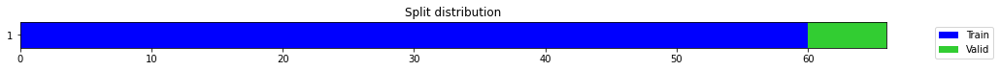

epoch,train_loss,valid_loss,mse,time
0,0.378721,0.100748,0.100748,00:00
1,0.238065,0.091610,0.091610,00:00
2,0.211841,0.308645,0.308645,00:00
3,0.217106,0.043615,0.043615,00:00
4,0.190621,0.192416,0.192416,00:00
5,0.173422,0.275365,0.275365,00:00
6,0.157895,0.439528,0.439528,00:00
7,0.144579,1.472052,1.472052,00:00
8,0.149788,0.039873,0.039873,00:00
9,0.152712,0.058235,0.058235,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03835140665372213,
  "MSE_normalize": 0.0017417988088184917,
  "RMSE_normalize": 0.041734863229900394,
  "MAPE_normalize": 0.04005406559873389,
  "MAE": 2473.8191347916922,
  "MSE": 7247217.290441261,
  "RMSE": 2692.065617781495,
  "MAPE": 0.02107592231468819
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:34:44.840919+07:00
PROGRESS: [ 920 / 1944 ]


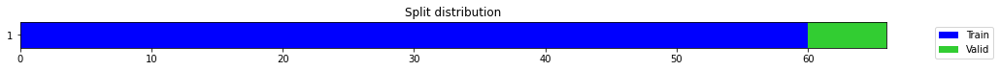

epoch,train_loss,valid_loss,mse,time
0,0.299660,0.026495,0.026495,00:00
1,0.229444,0.007241,0.007241,00:00
2,0.177596,0.000480,0.000480,00:00
3,0.165824,0.040046,0.040046,00:00
4,0.155254,0.013120,0.013120,00:00
5,0.135281,0.185644,0.185644,00:00
6,0.128262,1.344256,1.344256,00:00
7,0.128605,0.537658,0.537658,00:00
8,0.123408,0.001555,0.001555,00:00
9,0.120526,0.002895,0.002895,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.1034154196580251,
  "MSE_normalize": 0.010729461753094563,
  "RMSE_normalize": 0.10358311519303985,
  "MAPE_normalize": 0.10685194137504395,
  "MAE": 6670.708229621251,
  "MSE": 44642779.832247645,
  "RMSE": 6681.525262411843,
  "MAPE": 0.05650915301486938
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:35:58.827463+07:00
PROGRESS: [ 921 / 1944 ]


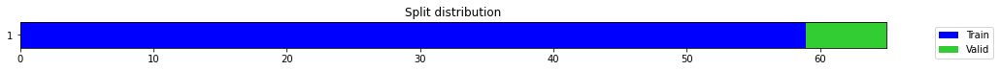

epoch,train_loss,valid_loss,mse,time
0,0.169851,0.009061,0.009061,00:00
1,0.153398,0.014100,0.014100,00:00
2,0.149733,0.242840,0.242840,00:00
3,0.153240,0.180665,0.180665,00:00
4,0.141761,0.548419,0.548419,00:00
5,0.127654,0.219193,0.219193,00:00
6,0.122925,4.075097,4.075097,00:00
7,0.131608,3.189576,3.189576,00:00
8,0.123770,0.623515,0.623515,00:00
9,0.120519,0.209765,0.209765,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.45577889680862427,
  "MSE_normalize": 0.2097645458145093,
  "RMSE_normalize": 0.4580005958669806,
  "MAPE_normalize": 0.4704812383716961,
  "MAE": 29399.5619597435,
  "MSE": 872781193.5866852,
  "RMSE": 29542.870435803714,
  "MAPE": 0.24892680639117978
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.1
2022-10-14 23:36:05.379630+07:00
PROGRESS: [ 922 / 1944 ]


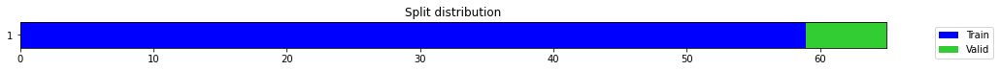

epoch,train_loss,valid_loss,mse,time
0,0.567713,0.042325,0.042325,00:01
1,0.411391,0.163813,0.163813,00:01
2,0.320536,0.036061,0.036061,00:01
3,0.280434,2.691110,2.691110,00:01
4,0.253064,0.050945,0.050945,00:01
5,0.225746,0.000538,0.000538,00:01
6,0.208945,2.371019,2.371019,00:01
7,0.194464,9.580680,9.580680,00:01
8,0.185646,0.045844,0.045844,00:01
9,0.170167,3.144270,3.144270,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.28010278940200806,
  "MSE_normalize": 0.07849307076269103,
  "RMSE_normalize": 0.28016614849530097,
  "MAPE_normalize": 0.2898977405508,
  "MAE": 18067.750327587128,
  "MSE": 326591301.32088804,
  "RMSE": 18071.837242540892,
  "MAPE": 0.15319224420994454
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.2
2022-10-14 23:36:38.928252+07:00
PROGRESS: [ 923 / 1944 ]


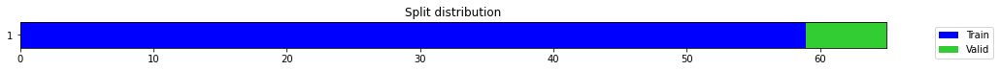

epoch,train_loss,valid_loss,mse,time
0,0.202476,0.024641,0.024641,00:01
1,0.159254,0.169853,0.169853,00:01
2,0.129887,0.175206,0.175206,00:01
3,0.118086,0.436330,0.436330,00:01
4,0.113886,0.557696,0.557696,00:01
5,0.111285,1.297298,1.297298,00:01
6,0.104251,1.644423,1.644423,00:01
7,0.121227,0.185792,0.185792,00:01
8,0.122189,1.015681,1.015681,00:01
9,0.113256,0.185334,0.185334,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.016173452138900757,
  "MSE_normalize": 0.0003204071889673088,
  "RMSE_normalize": 0.017899921479361546,
  "MAPE_normalize": 0.01682631802992648,
  "MAE": 1043.2523567676544,
  "MSE": 1333139.3431372687,
  "RMSE": 1154.616535104737,
  "MAPE": 0.008869498128460709
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.2
2022-10-14 23:37:42.319830+07:00
PROGRESS: [ 924 / 1944 ]


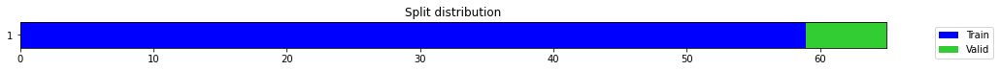

epoch,train_loss,valid_loss,mse,time
0,0.949243,1.061613,1.061613,00:00
1,0.738128,0.015469,0.015469,00:01
2,0.600737,0.211040,0.211040,00:01
3,0.516688,0.281357,0.281357,00:01
4,0.435056,0.020839,0.020839,00:01
5,0.372061,0.054368,0.054368,00:01
6,0.343630,0.021711,0.021711,00:01
7,0.319173,0.290294,0.290294,00:01
8,0.301894,0.000627,0.000627,00:01
9,0.280949,1.802166,1.802166,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.19027142723401388,
  "MSE_normalize": 0.03621084490773955,
  "RMSE_normalize": 0.19029147355501652,
  "MAPE_normalize": 0.19681315415673942,
  "MAE": 12273.268142302832,
  "MSE": 150664852.90276936,
  "RMSE": 12274.561210192785,
  "MAPE": 0.10403094220116353
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:39:43.104904+07:00
PROGRESS: [ 925 / 1944 ]


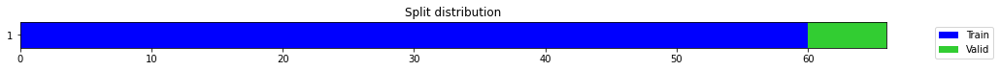

epoch,train_loss,valid_loss,mse,time
0,0.295223,0.206990,0.206990,00:01
1,0.281559,0.008150,0.008150,00:01
2,0.265883,0.059520,0.059520,00:01
3,0.251661,6.026290,6.026290,00:01
4,0.242338,0.019748,0.019748,00:01
5,0.213850,0.245496,0.245496,00:01
6,0.190273,0.018223,0.018223,00:01
7,0.173819,0.115386,0.115386,00:01
8,0.155264,0.039273,0.039273,00:01
9,0.140214,0.015487,0.015487,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12275369962056477,
  "MSE_normalize": 0.015487344202380626,
  "RMSE_normalize": 0.12444815869421542,
  "MAPE_normalize": 0.12651871204625156,
  "MAE": 7918.10464032491,
  "MSE": 64439215.43535995,
  "RMSE": 8027.404028411673,
  "MAPE": 0.06698836611191532
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:39:56.435489+07:00
PROGRESS: [ 926 / 1944 ]


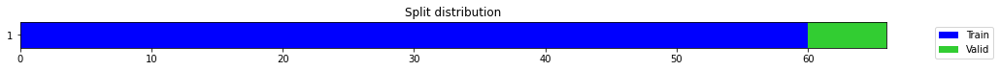

epoch,train_loss,valid_loss,mse,time
0,0.221432,0.298670,0.298670,00:01
1,0.156325,0.061690,0.061690,00:01
2,0.205925,1.333875,1.333875,00:01
3,0.200134,0.001502,0.001502,00:01
4,0.207322,0.063158,0.063158,00:01
5,0.193986,0.960680,0.960680,00:01
6,0.191285,5.001295,5.001295,00:01
7,0.187536,5.478175,5.478175,00:01
8,0.175783,0.296345,0.296345,00:01
9,0.172269,2.259525,2.259525,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4084305663903554,
  "MSE_normalize": 0.16682228447841219,
  "RMSE_normalize": 0.40843883811216114,
  "MAPE_normalize": 0.42248678171843435,
  "MAE": 26345.405254443485,
  "MSE": 694108491.9692618,
  "RMSE": 26345.938813586843,
  "MAPE": 0.2233133854671082
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:40:27.946952+07:00
PROGRESS: [ 927 / 1944 ]


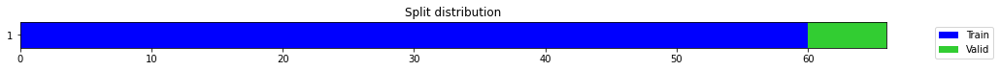

epoch,train_loss,valid_loss,mse,time
0,0.156031,0.186202,0.186202,00:01
1,0.129859,0.041741,0.041741,00:01
2,0.107847,0.004346,0.004346,00:01
3,0.125265,0.062635,0.062635,00:01
4,0.122066,0.000383,0.000383,00:01
5,0.124684,0.000539,0.000539,00:01
6,0.118207,0.003572,0.003572,00:01
7,0.122068,0.046337,0.046337,00:01
8,0.126205,0.689148,0.689148,00:01
9,0.119939,0.274975,0.274975,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.3141305247942607,
  "MSE_normalize": 0.09869482701002023,
  "RMSE_normalize": 0.31415732843596095,
  "MAPE_normalize": 0.32505896817019847,
  "MAE": 20262.67537132899,
  "MSE": 410646082.178291,
  "RMSE": 20264.404313433224,
  "MAPE": 0.17178673480232018
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:41:26.692440+07:00
PROGRESS: [ 928 / 1944 ]


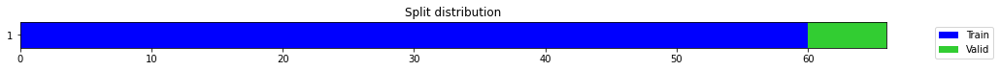

epoch,train_loss,valid_loss,mse,time
0,0.183870,0.244447,0.244447,00:01
1,0.136930,0.045000,0.045000,00:01
2,0.122803,0.004697,0.004697,00:01
3,0.121442,0.016978,0.016978,00:01
4,0.114519,0.530277,0.530277,00:01
5,0.110719,0.713352,0.713352,00:01
6,0.108300,0.036271,0.036271,00:01
7,0.110924,0.011839,0.011839,00:01
8,0.111290,0.271487,0.271487,00:01
9,0.108558,0.031022,0.031022,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.19295711318651834,
  "MSE_normalize": 0.0373566565299317,
  "RMSE_normalize": 0.19327870169765654,
  "MAPE_normalize": 0.19936096544174167,
  "MAE": 12446.50562898318,
  "MSE": 155432306.96112427,
  "RMSE": 12467.249374305637,
  "MAPE": 0.10543502472229967
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:43:17.592814+07:00
PROGRESS: [ 929 / 1944 ]


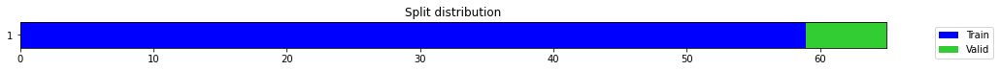

epoch,train_loss,valid_loss,mse,time
0,0.135016,0.398404,0.398404,00:00
1,0.154457,1.818014,1.818014,00:00
2,0.190726,2.784825,2.784825,00:00
3,0.199358,6.694005,6.694005,00:00
4,0.180586,0.000908,0.000908,00:00
5,0.165079,0.814609,0.814609,00:01
6,0.148216,2.401308,2.401308,00:01
7,0.150517,0.225706,0.225706,00:00
8,0.141923,0.000133,0.000133,00:01
9,0.136685,0.016880,0.016880,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12987927595774332,
  "MSE_normalize": 0.01687982552808383,
  "RMSE_normalize": 0.12992238270630596,
  "MAPE_normalize": 0.13436775851060298,
  "MAE": 8377.732816378275,
  "MSE": 70233004.41326047,
  "RMSE": 8380.51337408756,
  "MAPE": 0.07101795352850783
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:43:28.107185+07:00
PROGRESS: [ 930 / 1944 ]


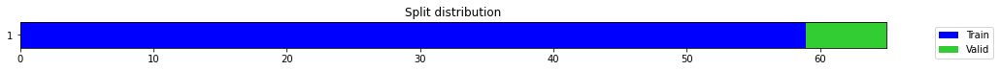

epoch,train_loss,valid_loss,mse,time
0,0.262786,0.119834,0.119834,00:01
1,0.192584,0.006448,0.006448,00:00
2,0.150845,0.007560,0.007560,00:00
3,0.175398,5.135824,5.135824,00:00
4,0.155906,0.116076,0.116076,00:00
5,0.143773,13.768889,13.768889,00:00
6,0.153992,6.346478,6.346478,00:00
7,0.142578,0.603268,0.603268,00:00
8,0.141062,14.397593,14.397593,00:00
9,0.135326,0.046005,0.046005,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08003940184911092,
  "MSE_normalize": 0.006413626695528289,
  "RMSE_normalize": 0.0800851215615503,
  "MAPE_normalize": 0.08277523048373465,
  "MAE": 5162.861576875051,
  "MSE": 26685599.99406448,
  "RMSE": 5165.810681206241,
  "MAPE": 0.0437570848134654
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:43:52.056122+07:00
PROGRESS: [ 931 / 1944 ]


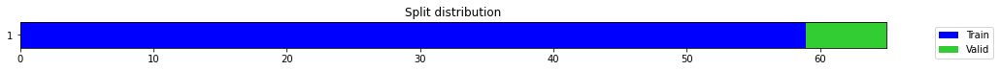

epoch,train_loss,valid_loss,mse,time
0,0.182739,0.090854,0.090854,00:00
1,0.134975,0.211585,0.211585,00:00
2,0.115665,0.419591,0.419591,00:00
3,0.110784,0.308465,0.308465,00:00
4,0.119193,1.935401,1.935401,00:00
5,0.110751,0.016396,0.016396,00:00
6,0.105763,0.060134,0.060134,00:00
7,0.108123,0.065632,0.065632,00:00
8,0.107323,0.264136,0.264136,00:00
9,0.106162,4.101635,4.101635,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2008644938468933,
  "MSE_normalize": 0.040362100189464435,
  "RMSE_normalize": 0.20090321099839203,
  "MAPE_normalize": 0.2077241696337887,
  "MAE": 12956.563311100006,
  "MSE": 167937254.8027108,
  "RMSE": 12959.060722240281,
  "MAPE": 0.10980979422841386
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.3
2022-10-14 23:44:36.843308+07:00
PROGRESS: [ 932 / 1944 ]


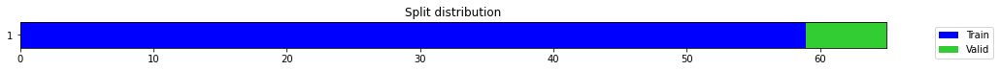

epoch,train_loss,valid_loss,mse,time
0,0.221884,0.011216,0.011216,00:00
1,0.208218,0.014893,0.014893,00:00
2,0.180579,0.002093,0.002093,00:00
3,0.153901,0.243900,0.243900,00:00
4,0.148438,0.233386,0.233386,00:00
5,0.137235,0.402132,0.402132,00:00
6,0.125540,1.756610,1.756610,00:00
7,0.121362,0.825167,0.825167,00:01
8,0.113277,0.025525,0.025525,00:00
9,0.107063,0.000072,0.000072,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1366928517818451,
  "MSE_normalize": 0.01870583279561977,
  "RMSE_normalize": 0.1367692684619603,
  "MAPE_normalize": 0.14131710341039586,
  "MAE": 8817.235711336136,
  "MSE": 77830593.39699301,
  "RMSE": 8822.164892870287,
  "MAPE": 0.07471578843025399
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:45:59.436830+07:00
PROGRESS: [ 933 / 1944 ]


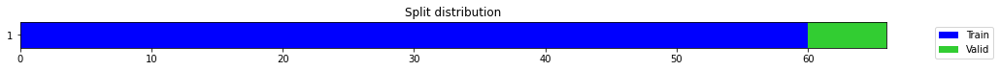

epoch,train_loss,valid_loss,mse,time
0,0.251091,0.258642,0.258642,00:00
1,0.300625,1.468655,1.468655,00:00
2,0.382447,14.384528,14.384528,00:00
3,0.476235,2.878911,2.878911,00:00
4,0.410218,0.014073,0.014073,00:00
5,0.344073,5.239972,5.239972,00:00
6,0.307179,1.789196,1.789196,00:00
7,0.268347,0.056593,0.056593,00:00
8,0.238235,0.000604,0.000604,00:00
9,0.214376,0.001804,0.001804,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04164512952168783,
  "MSE_normalize": 0.0018036779331538355,
  "RMSE_normalize": 0.042469729610086236,
  "MAPE_normalize": 0.04326583589214244,
  "MAE": 2686.2774346669516,
  "MSE": 7504681.8480755985,
  "RMSE": 2739.4674387690025,
  "MAPE": 0.02282225821316707
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:46:09.176383+07:00
PROGRESS: [ 934 / 1944 ]


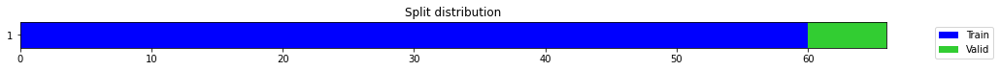

epoch,train_loss,valid_loss,mse,time
0,0.164616,0.001975,0.001975,00:00
1,0.157146,0.016303,0.016303,00:00
2,0.128876,0.410508,0.410508,00:00
3,0.130940,0.464700,0.464700,00:00
4,0.149412,0.072939,0.072939,00:00
5,0.198210,0.437205,0.437205,00:00
6,0.191236,4.148347,4.148347,00:00
7,0.180055,0.961662,0.961662,00:00
8,0.173969,1.012930,1.012930,00:00
9,0.159453,9.135835,9.135835,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.4920181334018707,
  "MSE_normalize": 0.24242087396676867,
  "RMSE_normalize": 0.4923625432207132,
  "MAPE_normalize": 0.5085801251707733,
  "MAE": 31737.13767695427,
  "MSE": 1008656533.9699503,
  "RMSE": 31759.353487908887,
  "MAPE": 0.26891211860752856
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:46:32.569578+07:00
PROGRESS: [ 935 / 1944 ]


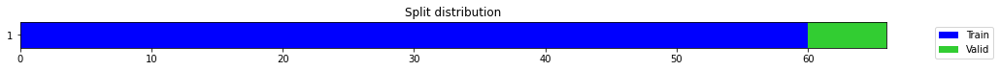

epoch,train_loss,valid_loss,mse,time
0,0.207162,0.060174,0.060174,00:01
1,0.206308,0.027581,0.027581,00:01
2,0.186271,0.047193,0.047193,00:01
3,0.160678,0.848962,0.848962,00:01
4,0.166765,0.002212,0.002212,00:01
5,0.161457,0.696503,0.696503,00:01
6,0.154836,0.162569,0.162569,00:01
7,0.163680,0.448317,0.448317,00:01
8,0.158908,1.087516,1.087516,00:01
9,0.160954,0.581798,0.581798,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12256371974945068,
  "MSE_normalize": 0.015105597939995144,
  "RMSE_normalize": 0.12290483285857862,
  "MAPE_normalize": 0.12700039060749516,
  "MAE": 7905.850178718567,
  "MSE": 62850858.560091406,
  "RMSE": 7927.853338709755,
  "MAPE": 0.06707396716453302
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:47:28.472365+07:00
PROGRESS: [ 936 / 1944 ]


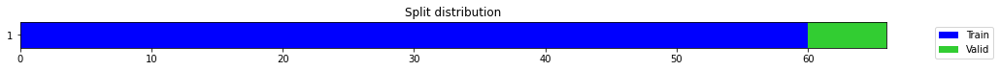

epoch,train_loss,valid_loss,mse,time
0,0.445723,0.474499,0.474499,00:01
1,0.312389,0.062387,0.062387,00:01
2,0.255305,0.012453,0.012453,00:01
3,0.231257,0.006953,0.006953,00:01
4,0.221843,0.106824,0.106824,00:01
5,0.193220,0.878211,0.878211,00:01
6,0.178625,0.555285,0.555285,00:01
7,0.170511,0.001626,0.001626,00:01
8,0.153442,0.006056,0.006056,00:01
9,0.149342,0.099118,0.099118,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.0,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07043713331222534,
  "MSE_normalize": 0.004969852447016383,
  "RMSE_normalize": 0.07049718041891026,
  "MAPE_normalize": 0.07281628817929833,
  "MAE": 4543.476847171783,
  "MSE": 20678393.16608021,
  "RMSE": 4547.350125741387,
  "MAPE": 0.038499571553989316
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:16.763629+07:00
PROGRESS: [ 937 / 1944 ]


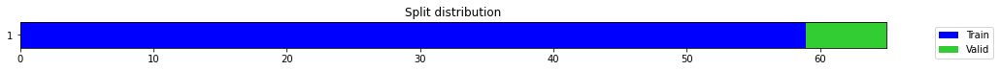

epoch,train_loss,valid_loss,mse,time
0,0.446092,0.946139,0.946139,00:00
1,0.454048,0.020263,0.020263,00:00
2,0.370595,0.020388,0.020388,00:00
3,0.306585,0.003043,0.003043,00:00
4,0.278227,0.025880,0.025880,00:00
5,0.253142,0.130757,0.130757,00:00
6,0.228106,0.014936,0.014936,00:00
7,0.208959,0.016020,0.016020,00:00
8,0.193289,0.050674,0.050674,00:00
9,0.180586,0.044235,0.044235,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20963059862454733,
  "MSE_normalize": 0.04423513596166077,
  "RMSE_normalize": 0.21032150617961248,
  "MAPE_normalize": 0.21725153300169694,
  "MAE": 13522.012133677801,
  "MSE": 184052050.42241764,
  "RMSE": 13566.578434609724,
  "MAPE": 0.11473110132384211
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:19.031135+07:00
PROGRESS: [ 938 / 1944 ]


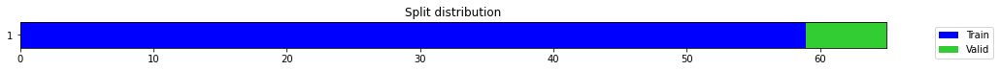

epoch,train_loss,valid_loss,mse,time
0,0.227235,1.066951,1.066951,00:00
1,0.237014,0.476590,0.476590,00:00
2,0.226334,0.177099,0.177099,00:00
3,0.192866,0.541648,0.541648,00:00
4,0.186743,0.132797,0.132797,00:00
5,0.174160,0.001195,0.001195,00:00
6,0.164051,0.521195,0.521195,00:00
7,0.152004,0.012382,0.012382,00:00
8,0.141272,0.059031,0.059031,00:00
9,0.131434,0.000390,0.000390,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3034542997678121,
  "MSE_normalize": 0.0922269525279719,
  "RMSE_normalize": 0.3036889074825946,
  "MAPE_normalize": 0.3136590487052072,
  "MAE": 19574.01615222295,
  "MSE": 383734769.83763075,
  "RMSE": 19589.149288257282,
  "MAPE": 0.16584988868841308
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:24.002632+07:00
PROGRESS: [ 939 / 1944 ]


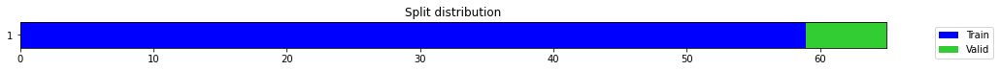

epoch,train_loss,valid_loss,mse,time
0,0.561288,0.421031,0.421031,00:00
1,0.455060,0.402032,0.402032,00:00
2,0.419371,0.287965,0.287965,00:00
3,0.386591,0.111715,0.111715,00:00
4,0.341217,0.009606,0.009606,00:00
5,0.294935,0.004621,0.004621,00:00
6,0.269757,0.009353,0.009353,00:00
7,0.246725,0.084324,0.084324,00:00
8,0.230862,0.039227,0.039227,00:00
9,0.211393,0.021604,0.021604,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.19710718592007956,
  "MSE_normalize": 0.03886026685149524,
  "RMSE_normalize": 0.19713007596887705,
  "MAPE_normalize": 0.2039161545058917,
  "MAE": 12714.201920588812,
  "MSE": 161688477.68839273,
  "RMSE": 12715.678420296446,
  "MAPE": 0.10777741507873573
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:33.203409+07:00
PROGRESS: [ 940 / 1944 ]


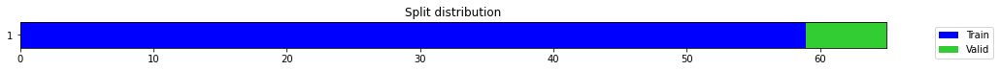

epoch,train_loss,valid_loss,mse,time
0,0.252488,0.613830,0.613830,00:00
1,0.215755,0.465129,0.465129,00:00
2,0.206320,0.331943,0.331943,00:00
3,0.192603,0.206284,0.206284,00:00
4,0.186810,0.106128,0.106128,00:00
5,0.176838,0.082028,0.082028,00:00
6,0.167247,0.115842,0.115842,00:00
7,0.160665,0.156677,0.156677,00:00
8,0.150848,0.097444,0.097444,00:00
9,0.150875,0.033308,0.033308,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18478854497273764,
  "MSE_normalize": 0.03418798551050747,
  "RMSE_normalize": 0.18489993377637393,
  "MAPE_normalize": 0.1912994020456729,
  "MAE": 11919.600304921469,
  "MSE": 142248208.26761988,
  "RMSE": 11926.785328311224,
  "MAPE": 0.10107720942813131
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:51.317585+07:00
PROGRESS: [ 941 / 1944 ]


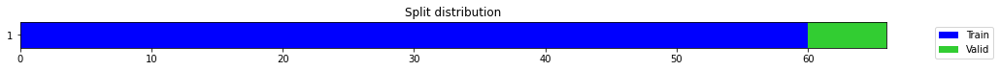

epoch,train_loss,valid_loss,mse,time
0,0.223027,0.373934,0.373934,00:00
1,0.219558,0.070071,0.070071,00:00
2,0.191782,0.275535,0.275535,00:00
3,0.169966,0.229656,0.229656,00:00
4,0.156172,0.461422,0.461422,00:00
5,0.141895,0.157334,0.157334,00:00
6,0.129672,0.079279,0.079279,00:00
7,0.122370,0.227247,0.227247,00:00
8,0.119083,0.258859,0.258859,00:00
9,0.113476,0.249648,0.249648,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4993628263473511,
  "MSE_normalize": 0.24964765390240906,
  "RMSE_normalize": 0.4996475296670735,
  "MAPE_normalize": 0.5162358252940109,
  "MAE": 32210.899750709534,
  "MSE": 1038725474.3312736,
  "RMSE": 32229.26425364491,
  "MAPE": 0.2729441323577125
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:53.491779+07:00
PROGRESS: [ 942 / 1944 ]


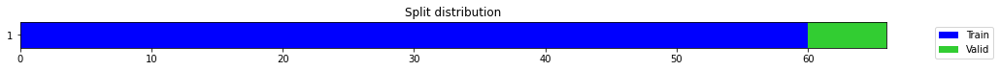

epoch,train_loss,valid_loss,mse,time
0,0.428539,0.479356,0.479356,00:00
1,0.356920,0.162361,0.162361,00:00
2,0.289053,0.043050,0.043050,00:00
3,0.240188,0.361584,0.361584,00:00
4,0.242530,0.005277,0.005277,00:00
5,0.218823,0.188083,0.188083,00:00
6,0.197144,0.394509,0.394509,00:00
7,0.178272,0.030322,0.030322,00:00
8,0.165833,0.031250,0.031250,00:00
9,0.154068,0.126087,0.126087,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13745607932408652,
  "MSE_normalize": 0.01897635799061585,
  "RMSE_normalize": 0.13775470224502628,
  "MAPE_normalize": 0.14240658884176988,
  "MAE": 8866.466940720877,
  "MSE": 78956185.43480447,
  "RMSE": 8885.729313613176,
  "MAPE": 0.07521691121025452
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:49:58.760595+07:00
PROGRESS: [ 943 / 1944 ]


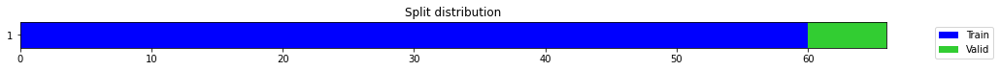

epoch,train_loss,valid_loss,mse,time
0,0.287407,1.353049,1.353049,00:00
1,0.229468,0.852994,0.852994,00:00
2,0.257487,0.387329,0.387329,00:00
3,0.217778,0.093099,0.093099,00:00
4,0.191692,0.000972,0.000972,00:00
5,0.191230,0.003927,0.003927,00:00
6,0.192687,0.099707,0.099707,00:00
7,0.178556,0.262586,0.262586,00:00
8,0.172781,0.115616,0.115616,00:00
9,0.168920,0.010411,0.010411,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.0822450319925944,
  "MSE_normalize": 0.006785915306636525,
  "RMSE_normalize": 0.08237666724647535,
  "MAPE_normalize": 0.08498681696530437,
  "MAE": 5305.13354365031,
  "MSE": 28234605.795307472,
  "RMSE": 5313.624544066646,
  "MAPE": 0.04494337988284586
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:50:09.086799+07:00
PROGRESS: [ 944 / 1944 ]


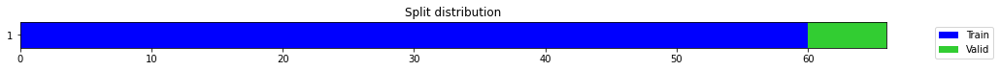

epoch,train_loss,valid_loss,mse,time
0,0.443694,0.025216,0.025216,00:00
1,0.382017,0.029601,0.029601,00:00
2,0.344554,0.015423,0.015423,00:00
3,0.327365,0.002462,0.002462,00:00
4,0.289882,0.002978,0.002978,00:00
5,0.258609,0.034203,0.034203,00:00
6,0.237555,0.062920,0.062920,00:00
7,0.225340,0.024784,0.024784,00:00
8,0.215071,0.014311,0.014311,00:00
9,0.201896,0.237187,0.237187,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.21328029036521912,
  "MSE_normalize": 0.04551283631670048,
  "RMSE_normalize": 0.213337376745615,
  "MAPE_normalize": 0.22075412435928157,
  "MAE": 13757.431849718094,
  "MSE": 189368262.63829795,
  "RMSE": 13761.11414959915,
  "MAPE": 0.1166504636649503
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:50:29.432839+07:00
PROGRESS: [ 945 / 1944 ]


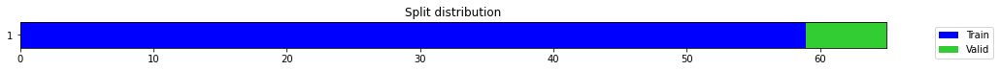

epoch,train_loss,valid_loss,mse,time
0,0.894216,1.262967,1.262967,00:00
1,0.724863,0.002925,0.002925,00:00
2,0.561131,1.005388,1.005388,00:00
3,0.451438,0.464267,0.464267,00:00
4,0.388460,0.184525,0.184525,00:00
5,0.335270,0.000701,0.000701,00:00
6,0.301706,0.110614,0.110614,00:00
7,0.271649,0.279751,0.279751,00:00
8,0.241834,0.337280,0.337280,00:00
9,0.225120,0.346142,0.346142,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5881464779376984,
  "MSE_normalize": 0.3461416833766909,
  "RMSE_normalize": 0.5883380689507444,
  "MAPE_normalize": 0.6081100668253733,
  "MAE": 37937.800412893295,
  "MSE": 1440214552.9147675,
  "RMSE": 37950.158799598816,
  "MAPE": 0.3214972495135168
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:50:31.708827+07:00
PROGRESS: [ 946 / 1944 ]


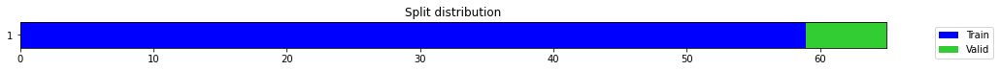

epoch,train_loss,valid_loss,mse,time
0,0.239276,0.115272,0.115272,00:00
1,0.258266,0.023319,0.023319,00:00
2,0.238075,0.001539,0.001539,00:00
3,0.209547,0.006194,0.006194,00:00
4,0.190406,0.065483,0.065483,00:00
5,0.183526,0.828750,0.828750,00:00
6,0.174057,0.147352,0.147352,00:00
7,0.167704,1.632425,1.632425,00:00
8,0.153029,0.082356,0.082356,00:00
9,0.140298,0.181875,0.181875,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.04504189888636271,
  "MSE_normalize": 0.0022740991525592356,
  "RMSE_normalize": 0.047687515688691895,
  "MAPE_normalize": 0.04624980338525949,
  "MAE": 2905.38264576594,
  "MSE": 9461994.470982866,
  "RMSE": 3076.035511983382,
  "MAPE": 0.024531527308712057
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:50:37.083497+07:00
PROGRESS: [ 947 / 1944 ]


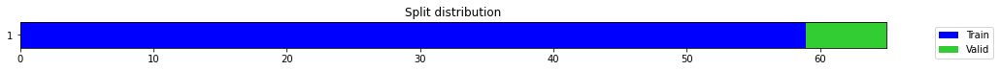

epoch,train_loss,valid_loss,mse,time
0,0.444797,0.494815,0.494815,00:00
1,0.442531,0.328240,0.328240,00:00
2,0.417885,0.135583,0.135583,00:00
3,0.356744,0.008852,0.008852,00:00
4,0.319343,0.019957,0.019957,00:00
5,0.285706,0.049983,0.049983,00:00
6,0.254372,0.095823,0.095823,00:00
7,0.241386,0.006346,0.006346,00:00
8,0.227913,0.000840,0.000840,00:00
9,0.217506,0.328268,0.328268,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0777119795481364,
  "MSE_normalize": 0.006320586737854701,
  "RMSE_normalize": 0.07950211781993421,
  "MAPE_normalize": 0.08077398177030497,
  "MAE": 5012.73352877299,
  "MSE": 26298482.500046145,
  "RMSE": 5128.2046078570365,
  "MAPE": 0.04259799330598837
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:50:47.268287+07:00
PROGRESS: [ 948 / 1944 ]


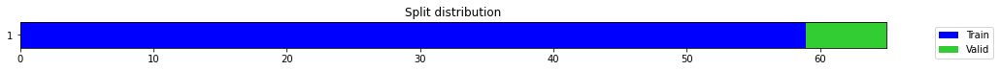

epoch,train_loss,valid_loss,mse,time
0,0.614668,0.450381,0.450381,00:00
1,0.631245,0.382045,0.382045,00:00
2,0.589783,0.297058,0.297058,00:00
3,0.549662,0.178463,0.178463,00:00
4,0.512760,0.078383,0.078383,00:00
5,0.460611,0.010750,0.010750,00:00
6,0.436254,0.005290,0.005290,00:00
7,0.387382,0.032317,0.032317,00:00
8,0.357049,0.033169,0.033169,00:00
9,0.327460,0.007939,0.007939,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.14418389399846396,
  "MSE_normalize": 0.020812012786861327,
  "RMSE_normalize": 0.14426369185232066,
  "MAPE_normalize": 0.14924990321769538,
  "MAE": 9300.43789847692,
  "MSE": 86593915.52813005,
  "RMSE": 9305.58517924209,
  "MAPE": 0.07886295688969559
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:51:08.218449+07:00
PROGRESS: [ 949 / 1944 ]


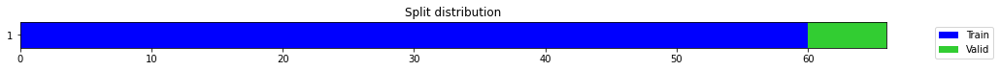

epoch,train_loss,valid_loss,mse,time
0,0.430140,0.509957,0.509957,00:00
1,0.338053,0.273303,0.273303,00:00
2,0.284287,0.086555,0.086555,00:00
3,0.233345,0.092291,0.092291,00:00
4,0.221474,1.224247,1.224247,00:00
5,0.205251,0.080446,0.080446,00:00
6,0.182096,0.365722,0.365722,00:00
7,0.168480,0.594291,0.594291,00:00
8,0.159991,0.388613,0.388613,00:00
9,0.156292,0.250747,0.250747,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4986404577891032,
  "MSE_normalize": 0.2507471115948678,
  "RMSE_normalize": 0.5007465542516172,
  "MAPE_normalize": 0.514794825567328,
  "MAE": 32164.304089228313,
  "MSE": 1043300060.5340853,
  "RMSE": 32300.15573544631,
  "MAPE": 0.27235535261467764
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.6
2022-10-14 23:51:10.705865+07:00
PROGRESS: [ 950 / 1944 ]


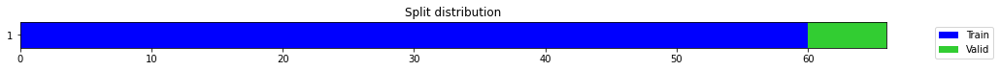

epoch,train_loss,valid_loss,mse,time
0,0.209265,0.301981,0.301981,00:00
1,0.186273,0.029246,0.029246,00:00
2,0.146743,0.085457,0.085457,00:00
3,0.153288,0.000960,0.000960,00:00
4,0.143489,0.913419,0.913419,00:00
5,0.148386,0.452368,0.452368,00:00
6,0.145412,0.742560,0.742560,00:00
7,0.143000,0.153356,0.153356,00:00
8,0.136157,0.729597,0.729597,00:00
9,0.136072,0.173794,0.173794,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.30155641833941144,
  "MSE_normalize": 0.09117677820525867,
  "RMSE_normalize": 0.30195492743993874,
  "MAPE_normalize": 0.3116093626585233,
  "MAE": 19451.595208565395,
  "MSE": 379365240.20480984,
  "RMSE": 19477.30063958581,
  "MAPE": 0.16478810285536363
}
Percent CPU Usage: 100.0
Percent Ram Usage: 35.7
2022-10-14 23:51:16.356578+07:00
PROGRESS: [ 951 / 1944 ]


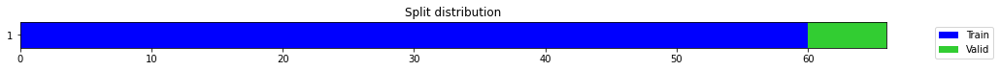

epoch,train_loss,valid_loss,mse,time
0,0.425782,1.068925,1.068925,00:00
1,0.348919,0.678917,0.678917,00:00
2,0.290081,0.185025,0.185025,00:00
3,0.256741,0.004450,0.004450,00:00
4,0.227901,0.204153,0.204153,00:00
5,0.229702,0.082320,0.082320,00:00
6,0.222541,0.008676,0.008676,00:00
7,0.203324,0.030565,0.030565,00:00
8,0.191420,0.138149,0.138149,00:00
9,0.179053,0.123257,0.123257,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18875633676846823,
  "MSE_normalize": 0.03566049000005537,
  "RMSE_normalize": 0.18883985278551604,
  "MAPE_normalize": 0.19539630208314787,
  "MAE": 12175.538746913275,
  "MSE": 148374954.90613824,
  "RMSE": 12180.925864076928,
  "MAPE": 0.10324456847454451
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.0
2022-10-14 23:51:27.523068+07:00
PROGRESS: [ 952 / 1944 ]


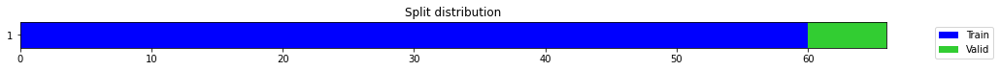

epoch,train_loss,valid_loss,mse,time
0,0.651177,1.293824,1.293824,00:00
1,0.616808,0.861583,0.861583,00:00
2,0.560524,0.460422,0.460422,00:00
3,0.500129,0.179514,0.179514,00:00
4,0.426462,0.013679,0.013679,00:00
5,0.380473,0.034863,0.034863,00:00
6,0.337466,0.212928,0.212928,00:00
7,0.310278,0.402632,0.402632,00:00
8,0.304676,0.327462,0.327462,00:00
9,0.283916,0.151432,0.151432,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.04763046900431315,
  "MSE_normalize": 0.0023325142294356263,
  "RMSE_normalize": 0.04829610987890874,
  "MAPE_normalize": 0.049449692975911064,
  "MAE": 3072.3557726542153,
  "MSE": 9705045.937672181,
  "RMSE": 3115.2922716291296,
  "MAPE": 0.026092710464274377
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:51:49.897921+07:00
PROGRESS: [ 953 / 1944 ]


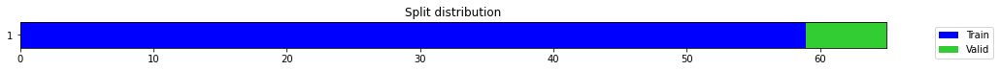

epoch,train_loss,valid_loss,mse,time
0,0.395779,0.591969,0.591969,00:00
1,0.350729,0.173785,0.173785,00:00
2,0.294970,1.046397,1.046397,00:00
3,0.251304,0.559022,0.559022,00:00
4,0.236177,0.270340,0.270340,00:00
5,0.212443,0.178006,0.178006,00:00
6,0.192578,0.497791,0.497791,00:00
7,0.183267,0.378797,0.378797,00:00
8,0.178561,0.267183,0.267183,00:00
9,0.165319,0.230872,0.230872,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.48021553953488666,
  "MSE_normalize": 0.23087222271947935,
  "RMSE_normalize": 0.48049164687794454,
  "MAPE_normalize": 0.49642111717086435,
  "MAE": 30975.82316215833,
  "MSE": 960605298.3295927,
  "RMSE": 30993.633190214932,
  "MAPE": 0.2624728214592227
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:51:52.530271+07:00
PROGRESS: [ 954 / 1944 ]


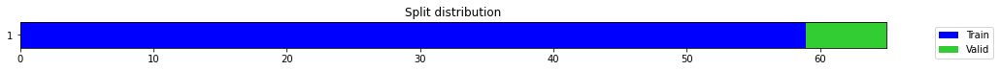

epoch,train_loss,valid_loss,mse,time
0,1.274025,2.397693,2.397693,00:00
1,1.002545,0.449300,0.449300,00:00
2,0.781798,0.304060,0.304060,00:00
3,0.657608,1.250921,1.250921,00:00
4,0.561006,0.525022,0.525022,00:00
5,0.476126,0.010972,0.010972,00:00
6,0.414939,0.015006,0.015006,00:00
7,0.363262,0.051462,0.051462,00:00
8,0.327128,0.630024,0.630024,00:00
9,0.298719,0.516551,0.516551,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.01311128338177999,
  "MSE_normalize": 0.00020104482866933893,
  "RMSE_normalize": 0.014179027775885726,
  "MAPE_normalize": 0.013509046932112611,
  "MAE": 845.7302232583364,
  "MSE": 836500.4908199279,
  "RMSE": 914.6040076557329,
  "MAPE": 0.00715352104514477
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:51:58.733806+07:00
PROGRESS: [ 955 / 1944 ]


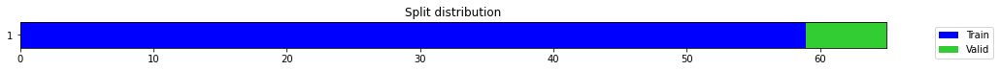

epoch,train_loss,valid_loss,mse,time
0,0.376562,0.120183,0.120183,00:00
1,0.307711,0.001251,0.001251,00:00
2,0.280310,0.167367,0.167367,00:00
3,0.252980,0.204374,0.204374,00:00
4,0.241389,0.000242,0.000242,00:00
5,0.225744,0.378631,0.378631,00:00
6,0.226027,0.018148,0.018148,00:00
7,0.204328,0.759776,0.759776,00:00
8,0.192069,0.402945,0.402945,00:00
9,0.184834,0.115587,0.115587,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2365619440873464,
  "MSE_normalize": 0.05603694905330355,
  "RMSE_normalize": 0.23672124757466018,
  "MAPE_normalize": 0.2445350390989964,
  "MAE": 15259.191641410192,
  "MSE": 233156633.2613088,
  "RMSE": 15269.46735355588,
  "MAPE": 0.12929553908147043
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:52:11.293640+07:00
PROGRESS: [ 956 / 1944 ]


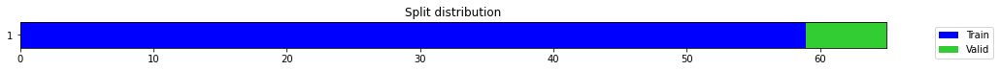

epoch,train_loss,valid_loss,mse,time
0,0.140019,0.019150,0.019150,00:00
1,0.165779,0.006169,0.006169,00:00
2,0.152702,0.000394,0.000394,00:00
3,0.141882,0.003411,0.003411,00:00
4,0.133469,0.022982,0.022982,00:00
5,0.125248,0.086408,0.086408,00:00
6,0.120592,0.091397,0.091397,00:00
7,0.118971,0.070335,0.070335,00:00
8,0.116654,0.156762,0.156762,00:00
9,0.115090,0.650416,0.650416,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06736701726913452,
  "MSE_normalize": 0.004564216614590795,
  "RMSE_normalize": 0.06755898618681896,
  "MAPE_normalize": 0.06978809800850319,
  "MAE": 4345.442081928253,
  "MSE": 18990637.379651953,
  "RMSE": 4357.82484499457,
  "MAPE": 0.036862220893860584
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:52:36.140613+07:00
PROGRESS: [ 957 / 1944 ]


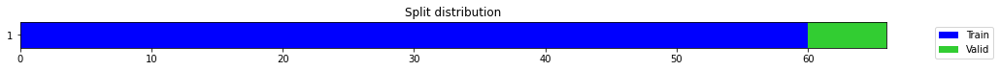

epoch,train_loss,valid_loss,mse,time
0,0.377930,0.640069,0.640069,00:00
1,0.284073,0.401570,0.401570,00:00
2,0.243587,0.025381,0.025381,00:00
3,0.202390,0.209703,0.209703,00:00
4,0.182701,0.246454,0.246454,00:00
5,0.172380,0.219692,0.219692,00:00
6,0.163292,0.167792,0.167792,00:00
7,0.152064,0.015031,0.015031,00:00
8,0.151290,0.001215,0.001215,00:00
9,0.142014,0.003228,0.003228,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.05641163388888041,
  "MSE_normalize": 0.00322828449534344,
  "RMSE_normalize": 0.0568179944678043,
  "MAPE_normalize": 0.05849634613522037,
  "MAE": 3638.776032368342,
  "MSE": 13432136.418204695,
  "RMSE": 3664.9879151512487,
  "MAPE": 0.030883525152448937
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:52:39.307913+07:00
PROGRESS: [ 958 / 1944 ]


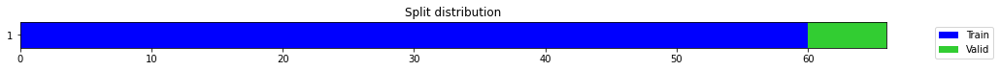

epoch,train_loss,valid_loss,mse,time
0,0.413319,0.896827,0.896827,00:00
1,0.354361,0.209165,0.209165,00:00
2,0.278187,0.071750,0.071750,00:00
3,0.251309,0.513553,0.513553,00:00
4,0.230351,0.112121,0.112121,00:00
5,0.215957,0.498133,0.498133,00:00
6,0.197597,0.011937,0.011937,00:00
7,0.180729,0.022924,0.022924,00:00
8,0.166571,0.036082,0.036082,00:00
9,0.159342,0.024270,0.024270,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0671343207359314,
  "MSE_normalize": 0.004569788603709195,
  "RMSE_normalize": 0.06760021156556534,
  "MAPE_normalize": 0.06927957271905438,
  "MAE": 4330.432224750519,
  "MSE": 19013821.122617308,
  "RMSE": 4360.484046825227,
  "MAPE": 0.03666012290428738
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:52:46.566745+07:00
PROGRESS: [ 959 / 1944 ]


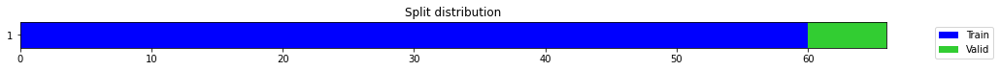

epoch,train_loss,valid_loss,mse,time
0,0.771918,1.531236,1.531236,00:00
1,0.670225,1.019312,1.019312,00:00
2,0.588262,0.394643,0.394643,00:00
3,0.487830,0.015398,0.015398,00:00
4,0.400519,0.216303,0.216303,00:00
5,0.353579,0.586663,0.586663,00:00
6,0.339524,0.445556,0.445556,00:00
7,0.307694,0.063866,0.063866,00:00
8,0.282877,0.285183,0.285183,00:00
9,0.261410,0.087030,0.087030,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.028099973996480305,
  "MSE_normalize": 0.0011293384570632743,
  "RMSE_normalize": 0.03360563132963394,
  "MAPE_normalize": 0.028648868598717996,
  "MAE": 1812.5607226689656,
  "MSE": 4698913.072710748,
  "RMSE": 2167.697643286708,
  "MAPE": 0.015247078725857219
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.1
2022-10-14 23:53:00.725075+07:00
PROGRESS: [ 960 / 1944 ]


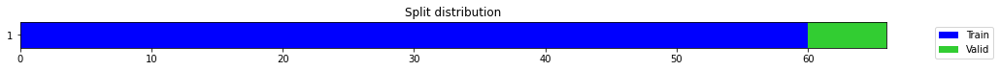

epoch,train_loss,valid_loss,mse,time
0,0.609696,1.316984,1.316984,00:00
1,0.536482,0.626643,0.626643,00:00
2,0.497097,0.178004,0.178004,00:00
3,0.426794,0.001561,0.001561,00:00
4,0.364384,0.138495,0.138495,00:00
5,0.325672,0.689321,0.689321,00:00
6,0.316654,0.931145,0.931145,00:00
7,0.299945,0.591743,0.591743,00:00
8,0.280453,0.192225,0.192225,00:00
9,0.261512,0.010972,0.010972,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.011353671550750732,
  "MSE_normalize": 0.00015727876141487704,
  "RMSE_normalize": 0.01254108294426271,
  "MAPE_normalize": 0.011776903054715097,
  "MAE": 732.3572297096252,
  "MSE": 654400.1255335924,
  "RMSE": 808.9500142367218,
  "MAPE": 0.0062164819870976955
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.3
2022-10-14 23:53:29.639740+07:00
PROGRESS: [ 961 / 1944 ]


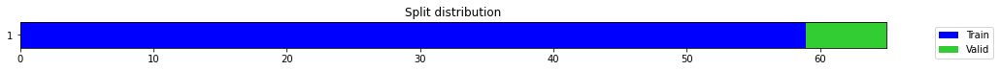

epoch,train_loss,valid_loss,mse,time
0,0.225392,0.188656,0.188656,00:00
1,0.203178,0.004233,0.004233,00:00
2,0.193960,0.315049,0.315049,00:00
3,0.178877,0.002913,0.002913,00:00
4,0.158033,0.375080,0.375080,00:00
5,0.163052,0.375241,0.375241,00:00
6,0.166858,0.116886,0.116886,00:00
7,0.156218,0.180302,0.180302,00:00
8,0.145600,0.093575,0.093575,00:00
9,0.136184,0.076027,0.076027,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27570109566052753,
  "MSE_normalize": 0.07602687089478206,
  "RMSE_normalize": 0.27572970622474113,
  "MAPE_normalize": 0.2852600836833871,
  "MAE": 17783.823474486668,
  "MSE": 316330020.7218287,
  "RMSE": 17785.668970320705,
  "MAPE": 0.15076192026633578
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.3
2022-10-14 23:53:32.481125+07:00
PROGRESS: [ 962 / 1944 ]


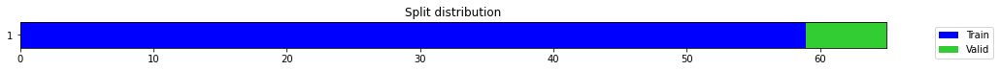

epoch,train_loss,valid_loss,mse,time
0,0.404755,0.652323,0.652323,00:00
1,0.407485,0.007129,0.007129,00:00
2,0.346026,0.006127,0.006127,00:00
3,0.293170,0.208860,0.208860,00:00
4,0.259787,0.259342,0.259342,00:00
5,0.231823,0.229514,0.229514,00:00
6,0.214539,0.129967,0.129967,00:00
7,0.195466,0.005135,0.005135,00:00
8,0.191325,0.004850,0.004850,00:00
9,0.180037,0.001136,0.001136,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.19031110405921936,
  "MSE_normalize": 0.036227086297489684,
  "RMSE_normalize": 0.1903341438037056,
  "MAPE_normalize": 0.19690661050076264,
  "MAE": 12275.827456235886,
  "MSE": 150732429.52529436,
  "RMSE": 12277.313611914227,
  "MAPE": 0.1040672635973746
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.4
2022-10-14 23:53:39.204991+07:00
PROGRESS: [ 963 / 1944 ]


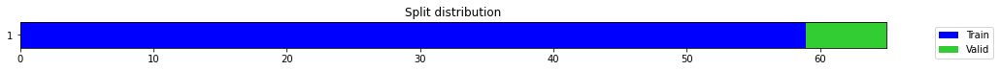

epoch,train_loss,valid_loss,mse,time
0,0.495975,1.522108,1.522108,00:00
1,0.427728,0.456855,0.456855,00:00
2,0.365743,0.002129,0.002129,00:00
3,0.335067,0.093631,0.093631,00:00
4,0.299139,0.006470,0.006470,00:00
5,0.262497,0.099619,0.099619,00:00
6,0.256361,0.002035,0.002035,00:00
7,0.242381,0.000474,0.000474,00:00
8,0.225785,1.523128,1.523128,00:00
9,0.218239,1.029754,1.029754,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09166402618090312,
  "MSE_normalize": 0.008492234313189684,
  "RMSE_normalize": 0.09215331959940284,
  "MAPE_normalize": 0.09503315014972642,
  "MAE": 5912.696344772975,
  "MSE": 35334199.93022873,
  "RMSE": 5944.257727439881,
  "MAPE": 0.05017808975557057
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.5
2022-10-14 23:53:52.152182+07:00
PROGRESS: [ 964 / 1944 ]


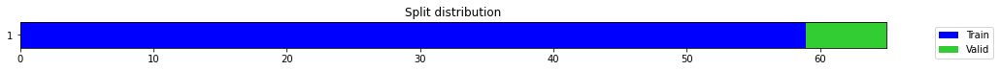

epoch,train_loss,valid_loss,mse,time
0,0.817043,1.179801,1.179801,00:00
1,0.842070,0.963143,0.963143,00:00
2,0.756858,0.749020,0.749020,00:00
3,0.719692,0.585729,0.585729,00:00
4,0.669193,0.418201,0.418201,00:00
5,0.628887,0.170282,0.170282,00:00
6,0.558805,0.007949,0.007949,00:00
7,0.507324,0.039039,0.039039,00:00
8,0.457765,0.029041,0.029041,00:00
9,0.416396,0.003028,0.003028,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.15350441137949625,
  "MSE_normalize": 0.023587303380627606,
  "RMSE_normalize": 0.1535815854216501,
  "MAPE_normalize": 0.15889575311435214,
  "MAE": 9901.648551623026,
  "MSE": 98141250.31519727,
  "RMSE": 9906.626586038119,
  "MAPE": 0.08396032711125624
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.5
2022-10-14 23:54:19.686776+07:00
PROGRESS: [ 965 / 1944 ]


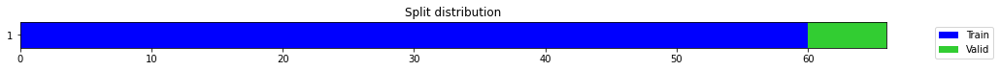

epoch,train_loss,valid_loss,mse,time
0,0.534480,0.327275,0.327275,00:00
1,0.374743,0.230018,0.230018,00:00
2,0.307373,0.794792,0.794792,00:00
3,0.275060,0.191839,0.191839,00:00
4,0.248085,0.428926,0.428926,00:00
5,0.219433,0.000452,0.000452,00:00
6,0.203316,0.414895,0.414895,00:00
7,0.189664,0.470681,0.470681,00:00
8,0.177819,0.209483,0.209483,00:00
9,0.162704,0.124690,0.124690,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.35308900475502014,
  "MSE_normalize": 0.12468993927183132,
  "RMSE_normalize": 0.3531146262502182,
  "MAPE_normalize": 0.3652070069527153,
  "MAE": 22775.65316271782,
  "MSE": 518805661.85933954,
  "RMSE": 22777.305851644076,
  "MAPE": 0.19304549396126092
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.5
2022-10-14 23:54:22.983506+07:00
PROGRESS: [ 966 / 1944 ]


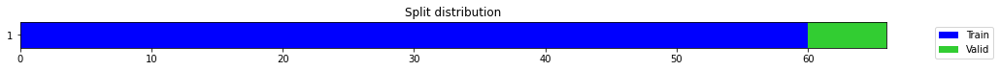

epoch,train_loss,valid_loss,mse,time
0,0.598245,0.774498,0.774498,00:00
1,0.420259,0.063221,0.063221,00:00
2,0.323441,0.240177,0.240177,00:00
3,0.322585,0.034174,0.034174,00:00
4,0.290516,1.095507,1.095507,00:00
5,0.274056,0.032566,0.032566,00:00
6,0.260218,0.075501,0.075501,00:00
7,0.238758,0.444855,0.444855,00:00
8,0.218324,0.027049,0.027049,00:00
9,0.200574,0.017784,0.017784,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.056304216384887695,
  "MSE_normalize": 0.0039272599101375745,
  "RMSE_normalize": 0.0626678538816958,
  "MAPE_normalize": 0.058879063922610164,
  "MAE": 3631.847173690796,
  "MSE": 16340409.570099635,
  "RMSE": 4042.3272467849056,
  "MAPE": 0.03096289698254202
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.5
2022-10-14 23:54:30.851016+07:00
PROGRESS: [ 967 / 1944 ]


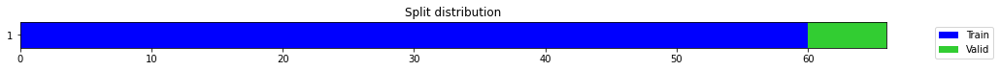

epoch,train_loss,valid_loss,mse,time
0,0.301408,0.846644,0.846644,00:00
1,0.219711,0.079544,0.079544,00:00
2,0.217883,0.054401,0.054401,00:00
3,0.210309,0.001922,0.001922,00:00
4,0.196803,0.002675,0.002675,00:00
5,0.196115,0.211306,0.211306,00:00
6,0.185682,0.618366,0.618366,00:00
7,0.169449,0.030614,0.030614,00:00
8,0.156505,0.066019,0.066019,00:00
9,0.148640,0.020830,0.020830,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20449175437291464,
  "MSE_normalize": 0.04186376786320641,
  "RMSE_normalize": 0.20460637297798526,
  "MAPE_normalize": 0.21139709588165081,
  "MAE": 13190.536124070486,
  "MSE": 174185342.62694216,
  "RMSE": 13197.929482571959,
  "MAPE": 0.11177095622227488
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.5
2022-10-14 23:54:46.300887+07:00
PROGRESS: [ 968 / 1944 ]


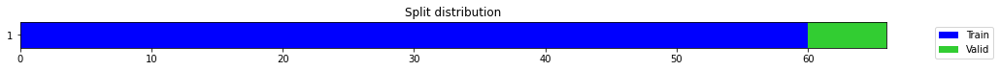

epoch,train_loss,valid_loss,mse,time
0,0.264482,0.004537,0.004537,00:00
1,0.227072,0.067296,0.067296,00:00
2,0.198463,0.109632,0.109632,00:00
3,0.183017,0.033819,0.033819,00:00
4,0.177187,0.098972,0.098972,00:00
5,0.169027,0.388331,0.388331,00:00
6,0.170020,0.080051,0.080051,00:00
7,0.164113,0.101178,0.101178,00:00
8,0.156827,0.425347,0.425347,00:00
9,0.152778,0.061588,0.061588,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24724236130714417,
  "MSE_normalize": 0.06113267472255105,
  "RMSE_normalize": 0.24725022694135398,
  "MAPE_normalize": 0.25579051889709536,
  "MAE": 15948.121273756027,
  "MSE": 254358755.45277262,
  "RMSE": 15948.628638625098,
  "MAPE": 0.13519317462673316
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.6
2022-10-14 23:55:16.752348+07:00
PROGRESS: [ 969 / 1944 ]


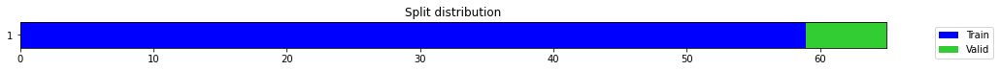

epoch,train_loss,valid_loss,mse,time
0,0.289293,0.007928,0.007928,00:00
1,0.217473,0.025309,0.025309,00:00
2,0.191539,0.003847,0.003847,00:00
3,0.192430,0.842813,0.842813,00:00
4,0.180918,1.125999,1.125999,00:00
5,0.164232,0.050648,0.050648,00:00
6,0.156334,0.106570,0.106570,00:00
7,0.147163,0.042292,0.042292,00:00
8,0.139552,0.142006,0.142006,00:00
9,0.132700,0.139253,0.139253,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.37306954463322956,
  "MSE_normalize": 0.1392530718886107,
  "RMSE_normalize": 0.37316627914190037,
  "MAPE_normalize": 0.38577195167304207,
  "MAE": 24064.47790702184,
  "MSE": 579399449.1377364,
  "RMSE": 24070.717669769143,
  "MAPE": 0.20394115747784755
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.6
2022-10-14 23:55:20.325453+07:00
PROGRESS: [ 970 / 1944 ]


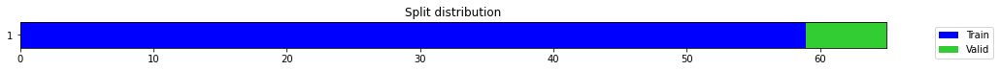

epoch,train_loss,valid_loss,mse,time
0,0.271747,0.029747,0.029747,00:00
1,0.227227,0.003931,0.003931,00:00
2,0.184677,0.002357,0.002357,00:00
3,0.165211,0.362920,0.362920,00:00
4,0.146668,0.127192,0.127192,00:00
5,0.144948,0.023342,0.023342,00:00
6,0.140653,2.130739,2.130739,00:00
7,0.137869,0.677003,0.677003,00:00
8,0.135565,0.058373,0.058373,00:00
9,0.127336,0.021186,0.021186,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.476741095383962,
  "MSE_normalize": 0.22748414455847765,
  "RMSE_normalize": 0.47695297939993797,
  "MAPE_normalize": 0.49287556109028463,
  "MAE": 30751.707616647083,
  "MSE": 946508297.8577452,
  "RMSE": 30765.374983213598,
  "MAPE": 0.26058665153006155
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.7
2022-10-14 23:55:28.390446+07:00
PROGRESS: [ 971 / 1944 ]


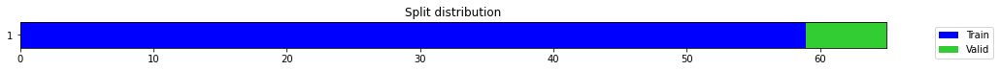

epoch,train_loss,valid_loss,mse,time
0,0.119962,0.103454,0.103454,00:00
1,0.144672,0.006474,0.006474,00:00
2,0.133574,0.038612,0.038612,00:00
3,0.136526,0.014131,0.014131,00:00
4,0.131787,0.353213,0.353213,00:00
5,0.133475,1.746764,1.746764,00:00
6,0.131596,4.321032,4.321032,00:00
7,0.137568,0.182298,0.182298,00:00
8,0.144016,0.446472,0.446472,00:00
9,0.135123,0.666317,0.666317,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.110330730676651,
  "MSE_normalize": 0.012345525775114533,
  "RMSE_normalize": 0.11111042154143118,
  "MAPE_normalize": 0.11443576180849585,
  "MAE": 7116.773451566696,
  "MSE": 51366844.09474861,
  "RMSE": 7167.066631108477,
  "MAPE": 0.06041046050102217
}
Percent CPU Usage: 100.0
Percent Ram Usage: 36.7
2022-10-14 23:55:43.590169+07:00
PROGRESS: [ 972 / 1944 ]


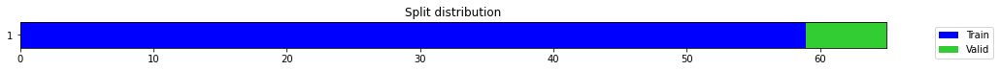

epoch,train_loss,valid_loss,mse,time
0,0.618818,0.697422,0.697422,00:00
1,0.526253,0.506759,0.506759,00:00
2,0.521995,0.307176,0.307176,00:00
3,0.473850,0.125927,0.125927,00:00
4,0.409488,0.019981,0.019981,00:00
5,0.362207,0.014728,0.014728,00:00
6,0.328503,0.043091,0.043091,00:00
7,0.295839,0.005482,0.005482,00:00
8,0.273660,0.001103,0.001103,00:00
9,0.260300,0.000453,0.000453,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1363066335519155,
  "MSE_normalize": 0.01858592664962148,
  "RMSE_normalize": 0.13633021180069177,
  "MAPE_normalize": 0.14101744917898393,
  "MAE": 8792.323090632757,
  "MSE": 77331691.9796138,
  "RMSE": 8793.843981991822,
  "MAPE": 0.07453250377399158
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:56:13.676186+07:00
PROGRESS: [ 973 / 1944 ]


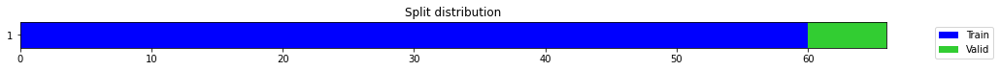

epoch,train_loss,valid_loss,mse,time
0,0.403192,0.086992,0.086992,00:00
1,0.264406,0.438128,0.438128,00:00
2,0.242127,0.009984,0.009984,00:00
3,0.212229,0.428389,0.428389,00:00
4,0.192892,0.284973,0.284973,00:00
5,0.188557,0.224066,0.224066,00:00
6,0.173439,0.352559,0.352559,00:00
7,0.163476,0.012604,0.012604,00:00
8,0.154871,0.013741,0.013741,00:00
9,0.144951,0.017363,0.017363,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13094488779703775,
  "MSE_normalize": 0.01736347144842772,
  "RMSE_normalize": 0.1317705257196302,
  "MAPE_normalize": 0.13513646922552028,
  "MAE": 8446.469042460123,
  "MSE": 72245341.92240436,
  "RMSE": 8499.725991019026,
  "MAPE": 0.0715074990086987
}
Percent CPU Usage: 99.9
Percent Ram Usage: 37.0
2022-10-14 23:56:17.501070+07:00
PROGRESS: [ 974 / 1944 ]


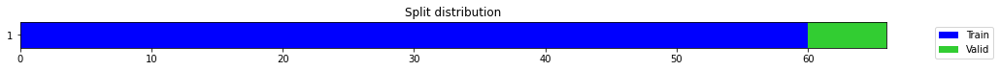

epoch,train_loss,valid_loss,mse,time
0,0.951155,1.226974,1.226974,00:00
1,0.691003,0.143266,0.143266,00:00
2,0.551228,0.453631,0.453631,00:00
3,0.517513,0.354466,0.354466,00:00
4,0.424511,0.891115,0.891115,00:00
5,0.392057,0.304648,0.304648,00:00
6,0.360949,0.475680,0.475680,00:00
7,0.334229,0.582037,0.582037,00:00
8,0.316524,0.117132,0.117132,00:00
9,0.294311,3.426409,3.426409,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.07034814357757568,
  "MSE_normalize": 0.005334841463720134,
  "RMSE_normalize": 0.07303999906708744,
  "MAPE_normalize": 0.07232767371716418,
  "MAE": 4537.736653327942,
  "MSE": 22197027.06299443,
  "RMSE": 4711.3720998234085,
  "MAPE": 0.038340320139191454
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:56:26.478942+07:00
PROGRESS: [ 975 / 1944 ]


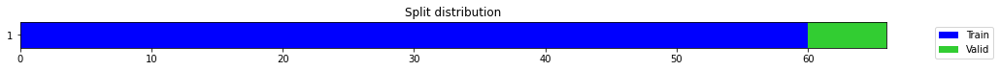

epoch,train_loss,valid_loss,mse,time
0,0.296407,0.243424,0.243424,00:00
1,0.241049,0.102138,0.102138,00:00
2,0.194058,0.003990,0.003990,00:00
3,0.173439,0.014677,0.014677,00:00
4,0.173202,0.155134,0.155134,00:00
5,0.160890,0.256734,0.256734,00:00
6,0.154138,0.061780,0.061780,00:00
7,0.149245,0.299347,0.299347,00:00
8,0.146870,0.082122,0.082122,00:00
9,0.141581,0.072357,0.072357,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11278297503789265,
  "MSE_normalize": 0.01279226967627404,
  "RMSE_normalize": 0.11310291630313535,
  "MAPE_normalize": 0.11686823858122218,
  "MAE": 7274.953021844228,
  "MSE": 53225640.93654835,
  "RMSE": 7295.590513217443,
  "MAPE": 0.06172212877425783
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:56:44.331918+07:00
PROGRESS: [ 976 / 1944 ]


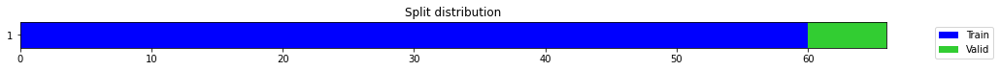

epoch,train_loss,valid_loss,mse,time
0,0.782291,0.530870,0.530870,00:00
1,0.609045,0.206250,0.206250,00:00
2,0.515036,0.015363,0.015363,00:00
3,0.438992,0.077920,0.077920,00:00
4,0.376952,0.233922,0.233922,00:00
5,0.333245,0.247458,0.247458,00:00
6,0.316174,0.196915,0.196915,00:00
7,0.305743,0.133961,0.133961,00:00
8,0.286029,0.001834,0.001834,00:00
9,0.260910,0.596145,0.596145,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16082969307899475,
  "MSE_normalize": 0.025891512882362022,
  "RMSE_normalize": 0.16090839904231855,
  "MAPE_normalize": 0.16649292485196995,
  "MAE": 10374.158522367477,
  "MSE": 107728526.90375811,
  "RMSE": 10379.235371825716,
  "MAPE": 0.08797103447108288
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:57:21.308948+07:00
PROGRESS: [ 977 / 1944 ]


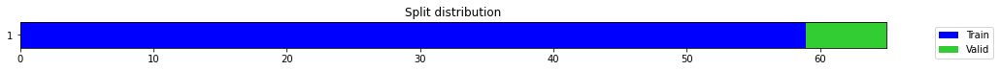

epoch,train_loss,valid_loss,mse,time
0,0.308399,0.003006,0.003006,00:00
1,0.275726,0.061894,0.061894,00:00
2,0.235384,0.345267,0.345267,00:00
3,0.221242,0.155911,0.155911,00:00
4,0.198249,2.438229,2.438229,00:00
5,0.183381,0.195574,0.195574,00:00
6,0.177175,0.829892,0.829892,00:00
7,0.164267,0.226376,0.226376,00:00
8,0.153999,0.110263,0.110263,00:00
9,0.150896,0.052917,0.052917,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.22824964920679727,
  "MSE_normalize": 0.052917452891474426,
  "RMSE_normalize": 0.23003793793953733,
  "MAPE_normalize": 0.23547581079849908,
  "MAE": 14723.015372435251,
  "MSE": 220177139.64412776,
  "RMSE": 14838.367148851916,
  "MAPE": 0.12462192007552723
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:57:25.651680+07:00
PROGRESS: [ 978 / 1944 ]


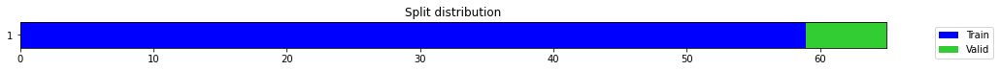

epoch,train_loss,valid_loss,mse,time
0,0.130652,0.085447,0.085447,00:00
1,0.122796,0.001286,0.001286,00:00
2,0.138982,0.892752,0.892752,00:00
3,0.119828,1.070164,1.070164,00:00
4,0.120834,0.392947,0.392947,00:00
5,0.120799,4.491675,4.491675,00:00
6,0.142201,0.623782,0.623782,00:00
7,0.133030,0.294594,0.294594,00:00
8,0.133257,0.118371,0.118371,00:00
9,0.128478,0.857962,0.857962,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2826050321261088,
  "MSE_normalize": 0.07992536500599338,
  "RMSE_normalize": 0.28271074441201094,
  "MAPE_normalize": 0.2921887663147822,
  "MAE": 18229.154992262524,
  "MSE": 332550742.5333329,
  "RMSE": 18235.973857552355,
  "MAPE": 0.15447738648884746
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:57:35.596594+07:00
PROGRESS: [ 979 / 1944 ]


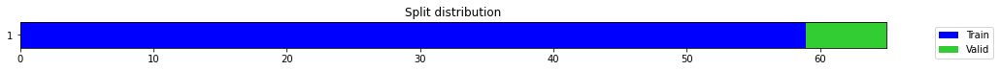

epoch,train_loss,valid_loss,mse,time
0,0.444746,1.201331,1.201331,00:00
1,0.334101,0.436179,0.436179,00:00
2,0.288631,0.022048,0.022048,00:00
3,0.252480,0.015582,0.015582,00:00
4,0.228554,0.002745,0.002745,00:00
5,0.238538,0.290978,0.290978,00:00
6,0.231786,0.268306,0.268306,00:00
7,0.212915,0.320425,0.320425,00:00
8,0.203221,1.287284,1.287284,00:00
9,0.185150,0.002859,0.002859,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07644978165626526,
  "MSE_normalize": 0.005887594832597524,
  "RMSE_normalize": 0.07673066422622395,
  "MAPE_normalize": 0.07921967701537562,
  "MAE": 4931.316715955734,
  "MSE": 24496904.495448988,
  "RMSE": 4949.43476524835,
  "MAPE": 0.04183843582498056
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.0
2022-10-14 23:57:54.950917+07:00
PROGRESS: [ 980 / 1944 ]


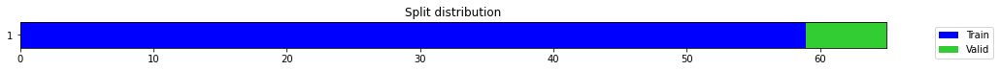

epoch,train_loss,valid_loss,mse,time
0,0.550954,0.356667,0.356667,00:00
1,0.480845,0.071758,0.071758,00:00
2,0.433993,0.001026,0.001026,00:00
3,0.392056,0.054658,0.054658,00:00
4,0.356779,0.119267,0.119267,00:00
5,0.328815,0.041614,0.041614,00:00
6,0.294716,0.003969,0.003969,00:00
7,0.270210,0.036588,0.036588,00:00
8,0.247105,0.001106,0.001106,00:00
9,0.236204,0.014749,0.014749,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11802731951077779,
  "MSE_normalize": 0.014094927634123048,
  "RMSE_normalize": 0.11872206043580548,
  "MAPE_normalize": 0.12239041180629427,
  "MAE": 7613.23421772321,
  "MSE": 58645695.898038454,
  "RMSE": 7658.047786351196,
  "MAPE": 0.0646167234053226
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.1
2022-10-14 23:58:34.169104+07:00
PROGRESS: [ 981 / 1944 ]


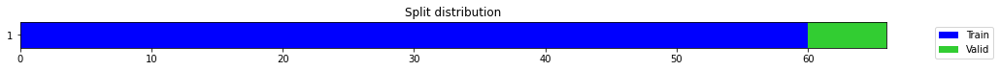

epoch,train_loss,valid_loss,mse,time
0,0.370109,0.773585,0.773585,00:00
1,0.257036,0.002366,0.002366,00:00
2,0.261447,2.039698,2.039698,00:00
3,0.248323,0.163708,0.163708,00:00
4,0.225555,0.766970,0.766970,00:00
5,0.199817,0.080641,0.080641,00:00
6,0.183545,0.000492,0.000492,00:00
7,0.179780,0.771409,0.771409,00:00
8,0.175242,0.790634,0.790634,00:00
9,0.168163,0.655080,0.655080,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.8090887914101282,
  "MSE_normalize": 0.6550802809628785,
  "RMSE_normalize": 0.8093702990367749,
  "MAPE_normalize": 0.8365349876393329,
  "MAE": 52189.46340111891,
  "MSE": 2725635770.7820764,
  "RMSE": 52207.62176906813,
  "MAPE": 0.44226580393349807
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.1
2022-10-14 23:58:40.266196+07:00
PROGRESS: [ 982 / 1944 ]


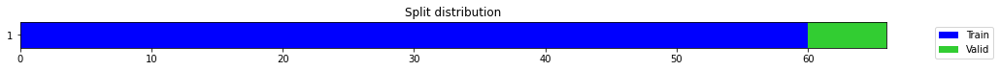

epoch,train_loss,valid_loss,mse,time
0,0.265494,0.138928,0.138928,00:00
1,0.189869,0.009873,0.009873,00:00
2,0.168991,0.060338,0.060338,00:00
3,0.154245,0.006962,0.006962,00:00
4,0.160780,0.138796,0.138796,00:00
5,0.160661,0.001930,0.001930,00:00
6,0.167977,0.009864,0.009864,00:00
7,0.165202,2.930008,2.930008,00:00
8,0.162596,0.193277,0.193277,00:00
9,0.156498,0.158059,0.158059,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.27589189012845355,
  "MSE_normalize": 0.07618533235541432,
  "RMSE_normalize": 0.2760169059231958,
  "MAPE_normalize": 0.28523057103527444,
  "MAE": 17796.130480845768,
  "MSE": 316989341.78207314,
  "RMSE": 17804.194499669822,
  "MAPE": 0.15080298564919042
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.1
2022-10-14 23:58:54.005830+07:00
PROGRESS: [ 983 / 1944 ]


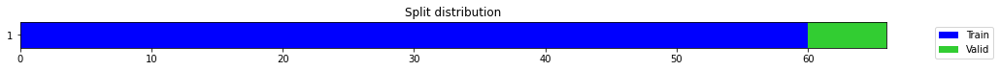

epoch,train_loss,valid_loss,mse,time
0,0.280134,0.159168,0.159168,00:00
1,0.236878,0.004533,0.004533,00:00
2,0.203370,0.237431,0.237431,00:00
3,0.199234,0.531386,0.531386,00:00
4,0.207295,0.040878,0.040878,00:00
5,0.202383,0.669278,0.669278,00:00
6,0.190487,0.013471,0.013471,00:00
7,0.175652,0.000348,0.000348,00:00
8,0.166167,0.245513,0.245513,00:00
9,0.158320,0.793198,0.793198,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.08254398902257283,
  "MSE_normalize": 0.007065646445652145,
  "RMSE_normalize": 0.08405739970789095,
  "MAPE_normalize": 0.08575814187929093,
  "MAE": 5324.417467912038,
  "MSE": 29398501.612140637,
  "RMSE": 5422.038510757798,
  "MAPE": 0.045235993067631736
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.2
2022-10-14 23:59:20.685956+07:00
PROGRESS: [ 984 / 1944 ]


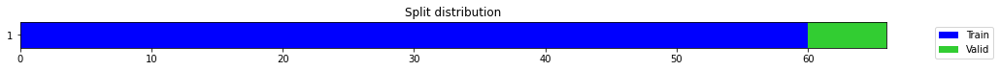

epoch,train_loss,valid_loss,mse,time
0,0.339803,0.147154,0.147154,00:00
1,0.251980,0.027415,0.027415,00:00
2,0.221911,0.008730,0.008730,00:00
3,0.195151,0.101561,0.101561,00:00
4,0.182347,0.129139,0.129139,00:00
5,0.188320,0.009336,0.009336,00:00
6,0.183254,0.023854,0.023854,00:00
7,0.168627,0.131239,0.131239,00:00
8,0.164300,0.241746,0.241746,00:00
9,0.161774,0.113412,0.113412,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06930595636367798,
  "MSE_normalize": 0.004974935343258362,
  "RMSE_normalize": 0.07053322155735098,
  "MAPE_normalize": 0.0720003862490906,
  "MAE": 4470.511409282684,
  "MSE": 20699541.908026684,
  "RMSE": 4549.674923335368,
  "MAPE": 0.037980077714496206
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.2
2022-10-15 00:00:12.309960+07:00
PROGRESS: [ 985 / 1944 ]


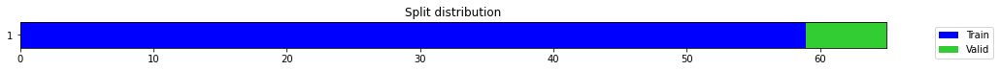

epoch,train_loss,valid_loss,mse,time
0,0.293136,0.101454,0.101454,00:00
1,0.234976,0.431310,0.431310,00:00
2,0.194849,0.998530,0.998530,00:00
3,0.210800,0.017823,0.017823,00:00
4,0.192120,6.942575,6.942575,00:00
5,0.175622,0.004111,0.004111,00:00
6,0.173998,0.021938,0.021938,00:00
7,0.161342,0.005414,0.005414,00:00
8,0.157926,0.069295,0.069295,00:00
9,0.154239,0.097233,0.097233,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3117758830388387,
  "MSE_normalize": 0.09723296407529129,
  "RMSE_normalize": 0.3118220070413429,
  "MAPE_normalize": 0.322428356494118,
  "MAE": 20110.79155953725,
  "MSE": 404563612.5594208,
  "RMSE": 20113.76674219478,
  "MAPE": 0.17044488064773913
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.4
2022-10-15 00:00:19.138088+07:00
PROGRESS: [ 986 / 1944 ]


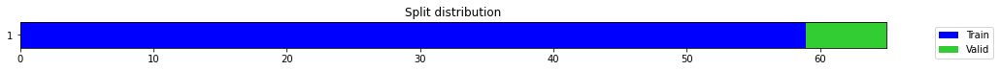

epoch,train_loss,valid_loss,mse,time
0,0.183281,0.896683,0.896683,00:00
1,0.164973,0.010293,0.010293,00:00
2,0.179081,0.346939,0.346939,00:00
3,0.169344,0.001042,0.001042,00:00
4,0.161907,1.026977,1.026977,00:00
5,0.156692,1.245539,1.245539,00:00
6,0.143270,0.002789,0.002789,00:00
7,0.137187,3.104373,3.104373,00:00
8,0.140677,2.245354,2.245354,00:00
9,0.131550,0.000008,0.000008,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5038754940032959,
  "MSE_normalize": 0.2544016103211601,
  "RMSE_normalize": 0.5043824048489004,
  "MAPE_normalize": 0.5207485673908193,
  "MAE": 32501.9848651886,
  "MSE": 1058505574.6399578,
  "RMSE": 32534.682642373475,
  "MAPE": 0.27536816082658166
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.4
2022-10-15 00:00:34.232192+07:00
PROGRESS: [ 987 / 1944 ]


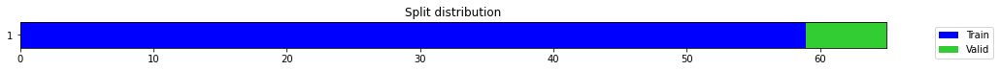

epoch,train_loss,valid_loss,mse,time
0,0.395405,0.271103,0.271103,00:00
1,0.321223,0.034377,0.034377,00:00
2,0.299127,0.020315,0.020315,00:00
3,0.259522,0.751886,0.751886,00:00
4,0.239319,0.056356,0.056356,00:00
5,0.229952,0.617908,0.617908,00:00
6,0.210606,0.763298,0.763298,00:00
7,0.192239,0.600928,0.600928,00:00
8,0.191522,0.943702,0.943702,00:00
9,0.181765,1.743971,1.743971,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.24495880802472433,
  "MSE_normalize": 0.06008000469651561,
  "RMSE_normalize": 0.24511222877799388,
  "MAPE_normalize": 0.25360650546921765,
  "MAE": 15800.822952826818,
  "MSE": 249978841.7823825,
  "RMSE": 15810.719205095715,
  "MAPE": 0.1339943372654903
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.4
2022-10-15 00:01:01.742426+07:00
PROGRESS: [ 988 / 1944 ]


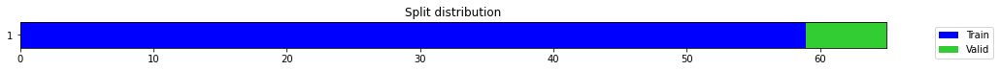

epoch,train_loss,valid_loss,mse,time
0,0.365260,0.319028,0.319028,00:00
1,0.349596,0.066339,0.066339,00:00
2,0.308926,0.007840,0.007840,00:00
3,0.271292,0.000525,0.000525,00:00
4,0.244003,0.005092,0.005092,00:00
5,0.223328,0.023312,0.023312,00:00
6,0.220741,0.021019,0.021019,00:00
7,0.211424,0.682495,0.682495,00:00
8,0.193251,1.771306,1.771306,00:00
9,0.186936,0.544168,0.544168,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2831671933333079,
  "MSE_normalize": 0.08019105838625566,
  "RMSE_normalize": 0.2831802577621817,
  "MAPE_normalize": 0.2929205177555103,
  "MAE": 18265.416638771694,
  "MSE": 333656230.5206044,
  "RMSE": 18266.259346691768,
  "MAPE": 0.15482666970430523
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.4
2022-10-15 00:01:56.859318+07:00
PROGRESS: [ 989 / 1944 ]


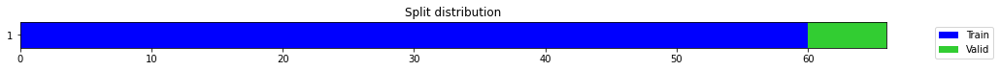

epoch,train_loss,valid_loss,mse,time
0,0.445960,0.374249,0.374249,00:00
1,0.399820,0.007031,0.007031,00:00
2,0.426893,3.568662,3.568662,00:00
3,0.343792,0.003273,0.003273,00:00
4,0.304366,0.889410,0.889410,00:00
5,0.264513,0.019621,0.019621,00:00
6,0.242911,0.596262,0.596262,00:00
7,0.227965,0.044068,0.044068,00:00
8,0.213341,0.006521,0.006521,00:00
9,0.198871,0.002917,0.002917,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.05282263954480489,
  "MSE_normalize": 0.002917325790313304,
  "RMSE_normalize": 0.05401227444121664,
  "MAPE_normalize": 0.05490699938060139,
  "MAE": 3407.271541198095,
  "MSE": 12138310.005935937,
  "RMSE": 3484.007750556238,
  "MAPE": 0.028955739240887863
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.4
2022-10-15 00:02:04.245882+07:00
PROGRESS: [ 990 / 1944 ]


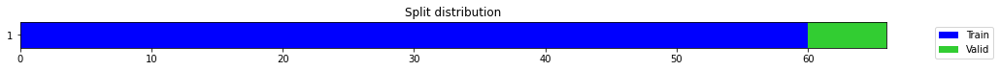

epoch,train_loss,valid_loss,mse,time
0,0.354831,0.024478,0.024478,00:00
1,0.250411,0.091580,0.091580,00:00
2,0.236968,0.007401,0.007401,00:00
3,0.212493,3.353633,3.353633,00:00
4,0.187934,1.608111,1.608111,00:00
5,0.173878,1.056157,1.056157,00:00
6,0.162689,7.861450,7.861450,00:00
7,0.167210,0.594983,0.594983,00:00
8,0.174449,0.556151,0.556151,00:00
9,0.165743,0.284721,0.284721,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14676178495089212,
  "MSE_normalize": 0.02160396155048912,
  "RMSE_normalize": 0.1469828614175446,
  "MAPE_normalize": 0.15200582818211683,
  "MAE": 9466.722176472345,
  "MSE": 89889029.0302458,
  "RMSE": 9480.982492877296,
  "MAPE": 0.08029740022811677
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.5
2022-10-15 00:02:20.950353+07:00
PROGRESS: [ 991 / 1944 ]


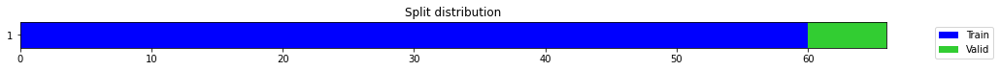

epoch,train_loss,valid_loss,mse,time
0,0.173108,0.183641,0.183641,00:00
1,0.149614,0.000751,0.000751,00:00
2,0.192688,0.225527,0.225527,00:00
3,0.177138,0.207973,0.207973,00:00
4,0.159740,0.413005,0.413005,00:00
5,0.157762,0.026755,0.026755,00:00
6,0.157809,0.009769,0.009769,00:00
7,0.157166,0.451737,0.451737,00:00
8,0.156885,1.800272,1.800272,00:00
9,0.161143,0.161622,0.161622,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09924599528312683,
  "MSE_normalize": 0.009928211602221756,
  "RMSE_normalize": 0.09964041149163202,
  "MAPE_normalize": 0.10287230856739144,
  "MAE": 6401.763679742813,
  "MSE": 41308965.43418119,
  "RMSE": 6427.205102856232,
  "MAPE": 0.05432255121350454
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.5
2022-10-15 00:02:59.060837+07:00
PROGRESS: [ 992 / 1944 ]


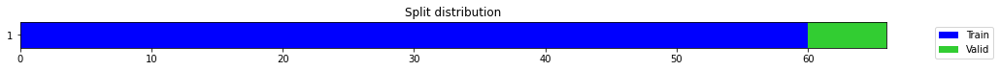

epoch,train_loss,valid_loss,mse,time
0,0.418736,0.077450,0.077450,00:00
1,0.323231,0.010215,0.010215,00:00
2,0.254926,0.094082,0.094082,00:00
3,0.218005,0.137256,0.137256,00:00
4,0.221592,0.122676,0.122676,00:00
5,0.209687,0.058396,0.058396,00:00
6,0.188951,0.349705,0.349705,00:00
7,0.188217,0.575144,0.575144,00:00
8,0.185462,0.020574,0.020574,00:00
9,0.180510,0.447867,0.447867,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.30134284496307373,
  "MSE_normalize": 0.090821545695146,
  "RMSE_normalize": 0.301366132296159,
  "MAPE_normalize": 0.3116728965575153,
  "MAE": 19437.818871498108,
  "MSE": 377887200.8489546,
  "RMSE": 19439.32099763144,
  "MAPE": 0.16475073827610817
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.6
2022-10-15 00:04:13.354977+07:00
PROGRESS: [ 993 / 1944 ]


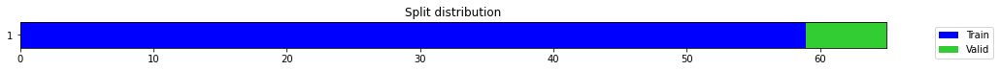

epoch,train_loss,valid_loss,mse,time
0,0.397981,0.031101,0.031101,00:00
1,0.276887,0.251849,0.251849,00:00
2,0.251294,0.943073,0.943073,00:00
3,0.213834,0.590636,0.590636,00:00
4,0.194135,0.833936,0.833936,00:00
5,0.188595,12.515022,12.515022,00:00
6,0.199182,0.008277,0.008277,00:00
7,0.190075,2.025868,2.025868,00:00
8,0.177270,2.911833,2.911833,00:00
9,0.170355,2.341439,2.341439,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 1.5284633586804073,
  "MSE_normalize": 2.3414389174566597,
  "RMSE_normalize": 1.5301761066807504,
  "MAPE_normalize": 1.5795631304448206,
  "MAE": 98592.00048832099,
  "MSE": 9742179476.293497,
  "RMSE": 98702.47958533512,
  "MAPE": 0.8352825154982989
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.6
2022-10-15 00:04:19.988408+07:00
PROGRESS: [ 994 / 1944 ]


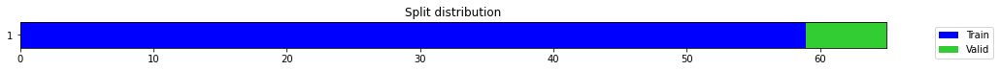

epoch,train_loss,valid_loss,mse,time
0,0.488170,0.103049,0.103049,00:01
1,0.418032,0.035442,0.035442,00:01
2,0.324954,0.103299,0.103299,00:01
3,0.327827,0.240784,0.240784,00:01
4,0.306015,0.388948,0.388948,00:01
5,0.287505,2.008791,2.008791,00:01
6,0.298559,5.423485,5.423485,00:01
7,0.276872,0.001203,0.001203,00:01
8,0.247787,0.009652,0.009652,00:01
9,0.224004,2.126571,2.126571,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.09854905803998311,
  "MSE_normalize": 0.010385280642346709,
  "RMSE_normalize": 0.10190819713029325,
  "MAPE_normalize": 0.10135896388251402,
  "MAE": 6356.8084398110705,
  "MSE": 43210722.76329884,
  "RMSE": 6573.486347692436,
  "MAPE": 0.053720194120922514
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.7
2022-10-15 00:04:52.767582+07:00
PROGRESS: [ 995 / 1944 ]


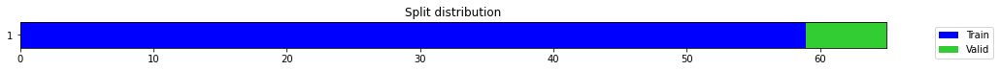

epoch,train_loss,valid_loss,mse,time
0,0.465075,0.399301,0.399301,00:01
1,0.378636,0.001397,0.001397,00:01
2,0.322540,0.077586,0.077586,00:01
3,0.263069,0.514099,0.514099,00:01
4,0.252254,0.022171,0.022171,00:01
5,0.229153,0.163929,0.163929,00:01
6,0.210959,0.437385,0.437385,00:01
7,0.194288,0.274701,0.274701,00:01
8,0.177539,0.205928,0.205928,00:01
9,0.173898,0.972518,0.972518,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.03419947624206543,
  "MSE_normalize": 0.0013854519547843818,
  "RMSE_normalize": 0.037221659753218714,
  "MAPE_normalize": 0.03571164948501087,
  "MAE": 2206.0030155181885,
  "MSE": 5764541.410267624,
  "RMSE": 2400.94594072162,
  "MAPE": 0.018792495117027366
}
Percent CPU Usage: 100.0
Percent Ram Usage: 37.7
2022-10-15 00:05:57.831022+07:00
PROGRESS: [ 996 / 1944 ]


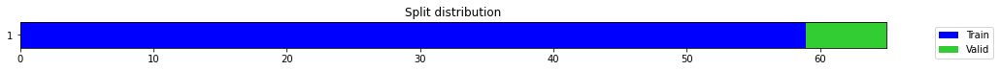

epoch,train_loss,valid_loss,mse,time
0,0.421353,0.109680,0.109680,00:01
1,0.352138,0.010942,0.010942,00:01
2,0.339465,0.055582,0.055582,00:01
3,0.287830,0.002532,0.002532,00:01
4,0.267094,0.110058,0.110058,00:01
5,0.260386,0.048690,0.048690,00:01
6,0.237606,0.501932,0.501932,00:01
7,0.233934,0.059920,0.059920,00:01
8,0.218809,0.743397,0.743397,00:01
9,0.205431,0.443240,0.443240,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2210556467374166,
  "MSE_normalize": 0.04892748635077382,
  "RMSE_normalize": 0.221195583931447,
  "MAPE_normalize": 0.22851042562927315,
  "MAE": 14258.97343715032,
  "MSE": 203575822.45660353,
  "RMSE": 14267.999945914056,
  "MAPE": 0.12082161532486313
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.0
2022-10-15 00:08:02.495664+07:00
PROGRESS: [ 997 / 1944 ]


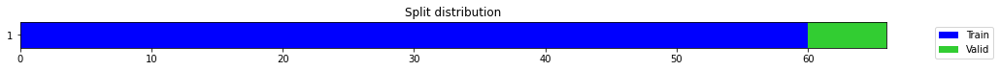

epoch,train_loss,valid_loss,mse,time
0,0.257079,0.098276,0.098276,00:01
1,0.268130,0.195274,0.195274,00:01
2,0.254470,0.008404,0.008404,00:01
3,0.233501,3.225902,3.225902,00:01
4,0.260676,6.222875,6.222875,00:01
5,0.246461,0.012245,0.012245,00:01
6,0.221005,0.834465,0.834465,00:01
7,0.201337,0.023118,0.023118,00:01
8,0.188682,0.260082,0.260082,00:01
9,0.176770,0.251997,0.251997,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5014077524344126,
  "MSE_normalize": 0.2519967553826034,
  "RMSE_normalize": 0.5019927841937605,
  "MAPE_normalize": 0.5181595318384433,
  "MAE": 32342.805663029354,
  "MSE": 1048499535.9382013,
  "RMSE": 32380.542551634328,
  "MAPE": 0.27400873412621146
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.0
2022-10-15 00:08:16.124804+07:00
PROGRESS: [ 998 / 1944 ]


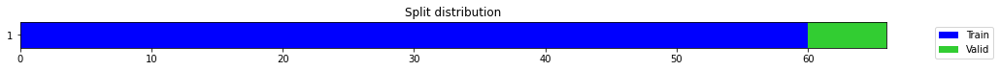

epoch,train_loss,valid_loss,mse,time
0,0.225302,0.193613,0.193613,00:01
1,0.173795,0.004616,0.004616,00:01
2,0.188291,0.152589,0.152589,00:01
3,0.182499,0.004889,0.004889,00:01
4,0.235976,0.450888,0.450888,00:01
5,0.236578,2.638112,2.638112,00:01
6,0.240029,2.908477,2.908477,00:01
7,0.220903,0.145986,0.145986,00:01
8,0.229026,0.109124,0.109124,00:01
9,0.224182,2.532865,2.532865,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.17009694377581278,
  "MSE_normalize": 0.02894733841226878,
  "RMSE_normalize": 0.17013917365577153,
  "MAPE_normalize": 0.17604226697101835,
  "MAE": 10971.933261315027,
  "MSE": 120443101.91941935,
  "RMSE": 10974.657257491886,
  "MAPE": 0.09302769931613757
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.0
2022-10-15 00:08:47.789918+07:00
PROGRESS: [ 999 / 1944 ]


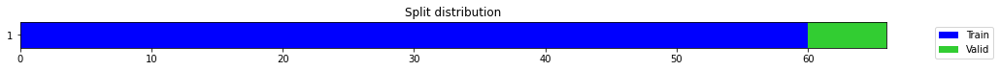

epoch,train_loss,valid_loss,mse,time
0,0.728984,0.237544,0.237544,00:01
1,0.518482,0.033003,0.033003,00:01
2,0.379581,0.365925,0.365925,00:01
3,0.385265,0.466186,0.466186,00:01
4,0.341497,0.020703,0.020703,00:01
5,0.312157,0.416090,0.416090,00:01
6,0.283219,0.199076,0.199076,00:01
7,0.275780,0.486140,0.486140,00:01
8,0.252657,0.168634,0.168634,00:01
9,0.239367,0.186836,0.186836,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18194380402565002,
  "MSE_normalize": 0.03312628533359371,
  "RMSE_normalize": 0.18200627828070576,
  "MAPE_normalize": 0.1883259058770299,
  "MAE": 11736.10313487053,
  "MSE": 137830722.2523359,
  "RMSE": 11740.132974218644,
  "MAPE": 0.0995131750433701
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.1
2022-10-15 00:09:49.414887+07:00
PROGRESS: [ 1000 / 1944 ]


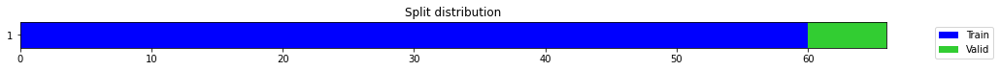

epoch,train_loss,valid_loss,mse,time
0,0.424034,0.180826,0.180826,00:01
1,0.283286,0.017414,0.017414,00:01
2,0.243989,0.038448,0.038448,00:01
3,0.231576,0.001098,0.001098,00:01
4,0.219662,0.002930,0.002930,00:01
5,0.199299,0.006567,0.006567,00:01
6,0.196625,0.141240,0.141240,00:01
7,0.177741,0.241639,0.241639,00:01
8,0.168886,0.201859,0.201859,00:01
9,0.155743,0.057950,0.057950,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1861390471458435,
  "MSE_normalize": 0.03469057453937315,
  "RMSE_normalize": 0.1862540591218703,
  "MAPE_normalize": 0.19241889375015583,
  "MAE": 12006.71309709549,
  "MSE": 144339363.61893865,
  "RMSE": 12014.131829597121,
  "MAPE": 0.1017380624561058
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.2
2022-10-15 00:11:45.273571+07:00
PROGRESS: [ 1001 / 1944 ]


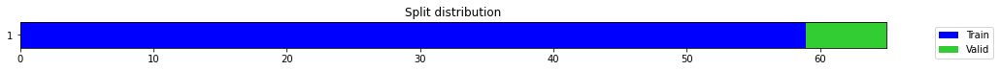

epoch,train_loss,valid_loss,mse,time
0,0.207996,0.811720,0.811720,00:00
1,0.223078,0.857729,0.857729,00:01
2,0.234743,0.001434,0.001434,00:01
3,0.245795,4.282010,4.282010,00:01
4,0.251990,17.055067,17.055067,00:01
5,0.248018,3.340930,3.340930,00:01
6,0.233893,0.002721,0.002721,00:01
7,0.220387,0.036848,0.036848,00:01
8,0.201443,0.068484,0.068484,00:01
9,0.185048,0.034701,0.034701,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.18548508485158285,
  "MSE_normalize": 0.03470080238454306,
  "RMSE_normalize": 0.1862815138024787,
  "MAPE_normalize": 0.19150271242381786,
  "MAE": 11964.5299132665,
  "MSE": 144381919.2895385,
  "RMSE": 12015.902766315085,
  "MAPE": 0.10131360278083427
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.2
2022-10-15 00:11:56.233755+07:00
PROGRESS: [ 1002 / 1944 ]


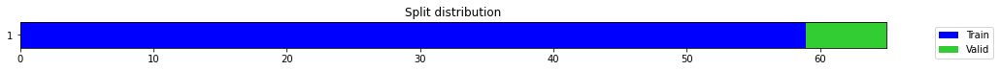

epoch,train_loss,valid_loss,mse,time
0,0.258889,0.057522,0.057522,00:00
1,0.192405,0.003101,0.003101,00:00
2,0.176316,1.815587,1.815587,00:00
3,0.227086,0.038938,0.038938,00:00
4,0.219844,4.974226,4.974226,00:00
5,0.205401,1.212799,1.212799,00:00
6,0.209064,8.151893,8.151893,00:00
7,0.211596,0.711651,0.711651,00:01
8,0.207239,0.343733,0.343733,00:00
9,0.198429,0.007141,0.007141,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.14978847901026407,
  "MSE_normalize": 0.022565852815804515,
  "RMSE_normalize": 0.15021934900606018,
  "MAPE_normalize": 0.1552143517257506,
  "MAE": 9661.956050078074,
  "MSE": 93891233.51805733,
  "RMSE": 9689.748888286906,
  "MAPE": 0.08197399952101934
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.2
2022-10-15 00:12:21.021317+07:00
PROGRESS: [ 1003 / 1944 ]


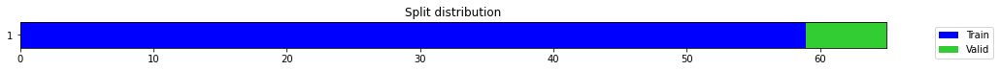

epoch,train_loss,valid_loss,mse,time
0,0.228421,0.082556,0.082556,00:00
1,0.178044,0.103549,0.103549,00:00
2,0.183988,0.061334,0.061334,00:00
3,0.192786,0.421324,0.421324,00:00
4,0.182054,0.571658,0.571658,00:00
5,0.177449,1.224900,1.224900,00:00
6,0.177263,0.071763,0.071763,00:00
7,0.170189,0.001690,0.001690,00:00
8,0.165894,0.877657,0.877657,00:01
9,0.153903,0.779645,0.779645,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3428065578142802,
  "MSE_normalize": 0.11772269693509685,
  "RMSE_normalize": 0.34310741311591747,
  "MAPE_normalize": 0.3543106957584845,
  "MAE": 22112.39420525233,
  "MSE": 489816596.71941835,
  "RMSE": 22131.80057562914,
  "MAPE": 0.18735078689191953
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.2
2022-10-15 00:13:06.614946+07:00
PROGRESS: [ 1004 / 1944 ]


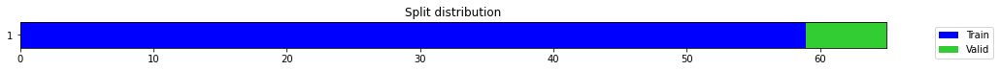

epoch,train_loss,valid_loss,mse,time
0,0.268077,0.001712,0.001712,00:00
1,0.245451,0.009388,0.009388,00:00
2,0.204304,0.036035,0.036035,00:00
3,0.177458,0.501627,0.501627,00:00
4,0.166327,0.591978,0.591978,00:00
5,0.163507,0.206809,0.206809,00:00
6,0.160583,0.991747,0.991747,00:00
7,0.152987,1.605501,1.605501,00:00
8,0.147383,0.051177,0.051177,00:00
9,0.152078,0.612330,0.612330,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1144379476706187,
  "MSE_normalize": 0.013119948777961929,
  "RMSE_normalize": 0.1145423449120976,
  "MAPE_normalize": 0.11828530188336112,
  "MAE": 7381.7053765455885,
  "MSE": 54589037.00700473,
  "RMSE": 7388.439416209943,
  "MAPE": 0.06254463808345544
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.3
2022-10-15 00:14:30.343562+07:00
PROGRESS: [ 1005 / 1944 ]


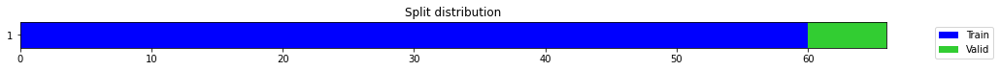

epoch,train_loss,valid_loss,mse,time
0,0.300207,0.249534,0.249534,00:00
1,0.315051,3.012781,3.012781,00:00
2,0.288661,0.053644,0.053644,00:00
3,0.295737,0.687842,0.687842,00:00
4,0.249923,1.411951,1.411951,00:00
5,0.229503,0.001969,0.001969,00:00
6,0.214611,0.128818,0.128818,00:00
7,0.195513,0.163853,0.163853,00:00
8,0.183181,0.030209,0.030209,00:00
9,0.167975,0.027402,0.027402,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.16488155722618103,
  "MSE_normalize": 0.027402260602119217,
  "RMSE_normalize": 0.16553628183005445,
  "MAPE_normalize": 0.1709137679681615,
  "MAE": 10635.519967317581,
  "MSE": 114014394.67487335,
  "RMSE": 10677.752323165834,
  "MAPE": 0.09025057627306665
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.3
2022-10-15 00:14:40.308781+07:00
PROGRESS: [ 1006 / 1944 ]


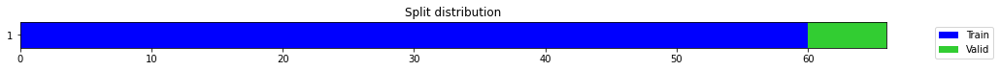

epoch,train_loss,valid_loss,mse,time
0,0.359218,0.065919,0.065919,00:00
1,0.302429,0.113784,0.113784,00:00
2,0.350212,0.009864,0.009864,00:00
3,0.302476,0.469808,0.469808,00:00
4,0.286690,6.923675,6.923675,00:00
5,0.270017,0.069878,0.069878,00:00
6,0.239434,1.928089,1.928089,00:00
7,0.242729,10.096614,10.096614,00:00
8,0.230579,0.732724,0.732724,00:00
9,0.218343,0.977045,0.977045,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.12623868385950723,
  "MSE_normalize": 0.016980699394647303,
  "RMSE_normalize": 0.1303100126415745,
  "MAPE_normalize": 0.12985026989717408,
  "MAE": 8142.9000636736555,
  "MSE": 70652716.96916027,
  "RMSE": 8405.517055432121,
  "MAPE": 0.06881752628402467
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.4
2022-10-15 00:15:04.656326+07:00
PROGRESS: [ 1007 / 1944 ]


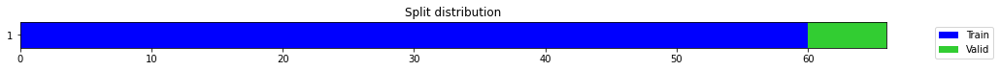

epoch,train_loss,valid_loss,mse,time
0,0.487639,0.651722,0.651722,00:00
1,0.329107,0.000641,0.000641,00:00
2,0.304963,0.280052,0.280052,00:00
3,0.285173,0.010269,0.010269,00:00
4,0.256579,1.073382,1.073382,00:00
5,0.246093,2.009547,2.009547,00:00
6,0.232222,1.380768,1.380768,00:00
7,0.227717,0.036144,0.036144,00:00
8,0.225577,0.317021,0.317021,00:00
9,0.213485,2.760463,2.760463,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06636127829551697,
  "MSE_normalize": 0.004718364891434253,
  "RMSE_normalize": 0.0686903551558314,
  "MAPE_normalize": 0.06905939801246887,
  "MAE": 4280.5678951740265,
  "MSE": 19632012.29136717,
  "RMSE": 4430.802668971748,
  "MAPE": 0.036399349374121946
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.5
2022-10-15 00:15:51.795147+07:00
PROGRESS: [ 1008 / 1944 ]


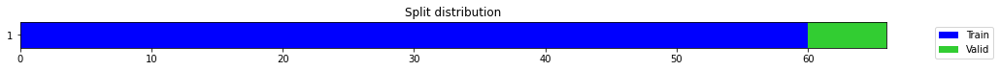

epoch,train_loss,valid_loss,mse,time
0,0.259049,0.035421,0.035421,00:01
1,0.186501,0.007122,0.007122,00:01
2,0.222400,0.002882,0.002882,00:01
3,0.200402,0.107749,0.107749,00:01
4,0.184596,0.045827,0.045827,00:01
5,0.177835,0.052473,0.052473,00:01
6,0.169825,0.517182,0.517182,00:01
7,0.159452,1.359895,1.359895,00:01
8,0.150217,0.052135,0.052135,00:01
9,0.146369,0.019748,0.019748,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.2,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.026075412829717,
  "MSE_normalize": 0.0006917230246366776,
  "RMSE_normalize": 0.026300627837309846,
  "MAPE_normalize": 0.026905615659914575,
  "MAE": 1681.9684291680653,
  "MSE": 2878097.653393019,
  "RMSE": 1696.4956980178345,
  "MAPE": 0.01423818009715231
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:18:35.983518+07:00
PROGRESS: [ 1009 / 1944 ]


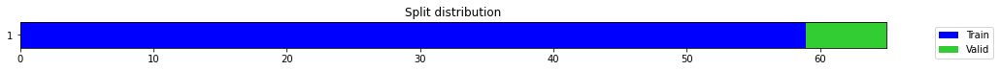

epoch,train_loss,valid_loss,mse,time
0,0.312237,0.104065,0.104065,00:00
1,0.307547,0.194487,0.194487,00:00
2,0.299845,0.195807,0.195807,00:00
3,0.261820,0.069504,0.069504,00:00
4,0.234630,0.221442,0.221442,00:00
5,0.213584,0.095220,0.095220,00:00
6,0.194804,0.030978,0.030978,00:00
7,0.200774,0.075053,0.075053,00:00
8,0.186580,0.141045,0.141045,00:00
9,0.181522,0.163473,0.163473,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4041786889235179,
  "MSE_normalize": 0.1634734213638295,
  "RMSE_normalize": 0.40431846527685267,
  "MAPE_normalize": 0.4178925864866137,
  "MAE": 26071.142150322597,
  "MSE": 680174656.1298702,
  "RMSE": 26080.158284218105,
  "MAPE": 0.22093397310290533
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:18:38.800641+07:00
PROGRESS: [ 1010 / 1944 ]


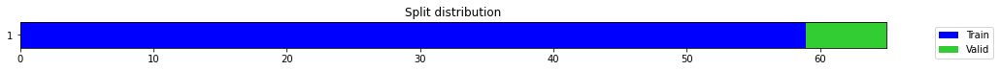

epoch,train_loss,valid_loss,mse,time
0,0.500349,1.730820,1.730820,00:00
1,0.472208,0.614143,0.614143,00:00
2,0.379905,0.022464,0.022464,00:00
3,0.345805,0.410508,0.410508,00:00
4,0.306095,0.281953,0.281953,00:00
5,0.278504,0.207961,0.207961,00:00
6,0.264253,0.000998,0.000998,00:00
7,0.254116,0.001338,0.001338,00:00
8,0.241268,0.033368,0.033368,00:00
9,0.233077,0.222381,0.222381,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.21531787514686584,
  "MSE_normalize": 0.046371519085612434,
  "RMSE_normalize": 0.21534047247466612,
  "MAPE_normalize": 0.22270697204533305,
  "MAE": 13888.864218473434,
  "MSE": 192941040.72171164,
  "RMSE": 13890.321836505864,
  "MAPE": 0.11772128171786987
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:18:43.664010+07:00
PROGRESS: [ 1011 / 1944 ]


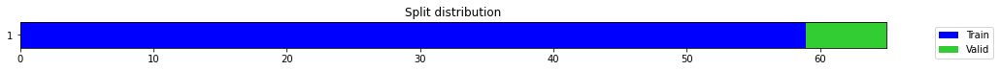

epoch,train_loss,valid_loss,mse,time
0,1.073816,1.686388,1.686388,00:00
1,1.118414,1.293119,1.293119,00:00
2,0.896619,0.780265,0.780265,00:00
3,0.746429,0.271244,0.271244,00:00
4,0.635740,0.020194,0.020194,00:00
5,0.557118,0.044893,0.044893,00:00
6,0.512044,0.080087,0.080087,00:00
7,0.470895,0.000508,0.000508,00:00
8,0.433567,0.207447,0.207447,00:00
9,0.396944,0.599143,0.599143,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2083282768726349,
  "MSE_normalize": 0.04340776376754422,
  "RMSE_normalize": 0.20834529936512658,
  "MAPE_normalize": 0.2155058717064859,
  "MAE": 13438.00717139244,
  "MSE": 180609548.3145541,
  "RMSE": 13439.105190248125,
  "MAPE": 0.11390773006905887
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:18:53.681575+07:00
PROGRESS: [ 1012 / 1944 ]


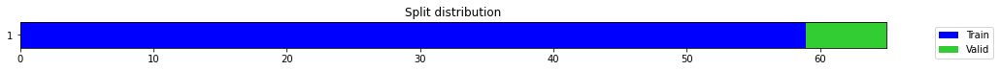

epoch,train_loss,valid_loss,mse,time
0,0.427456,1.974050,1.974050,00:00
1,0.393594,1.301629,1.301629,00:00
2,0.356249,0.655645,0.655645,00:00
3,0.369794,0.203588,0.203588,00:00
4,0.362782,0.005196,0.005196,00:00
5,0.334466,0.041711,0.041711,00:00
6,0.318297,0.094128,0.094128,00:00
7,0.305613,0.065918,0.065918,00:00
8,0.302126,0.029122,0.029122,00:00
9,0.281053,0.003693,0.003693,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.20521554350852966,
  "MSE_normalize": 0.04212696413365732,
  "RMSE_normalize": 0.20524854234234483,
  "MAPE_normalize": 0.21224328237299583,
  "MAE": 13237.223418474197,
  "MSE": 175280440.72457227,
  "RMSE": 13239.35197525061,
  "MAPE": 0.11219387292866605
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:12.034764+07:00
PROGRESS: [ 1013 / 1944 ]


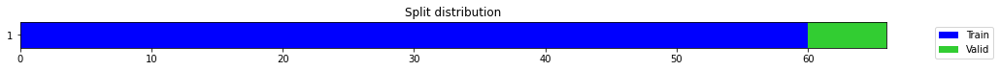

epoch,train_loss,valid_loss,mse,time
0,0.455898,0.051517,0.051517,00:00
1,0.381508,0.049969,0.049969,00:00
2,0.322057,0.913927,0.913927,00:00
3,0.301784,0.399127,0.399127,00:00
4,0.264846,0.075763,0.075763,00:00
5,0.264870,0.032528,0.032528,00:00
6,0.246723,0.002488,0.002488,00:00
7,0.230054,0.070054,0.070054,00:00
8,0.226801,0.111694,0.111694,00:00
9,0.215798,0.112192,0.112192,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.33181558052698773,
  "MSE_normalize": 0.11219168693369734,
  "RMSE_normalize": 0.3349502753151538,
  "MAPE_normalize": 0.3422178554383782,
  "MAE": 21403.432206312817,
  "MSE": 466803358.2714391,
  "RMSE": 21605.63255892868,
  "MAPE": 0.18113919265755798
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:14.264461+07:00
PROGRESS: [ 1014 / 1944 ]


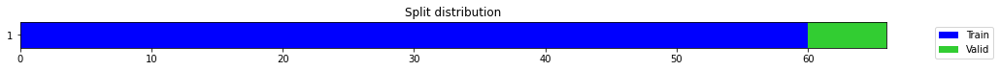

epoch,train_loss,valid_loss,mse,time
0,0.421414,1.004741,1.004741,00:00
1,0.375075,0.377952,0.377952,00:00
2,0.337818,0.000780,0.000780,00:00
3,0.300405,0.064999,0.064999,00:00
4,0.274530,0.045338,0.045338,00:00
5,0.259625,0.143593,0.143593,00:00
6,0.248369,0.488140,0.488140,00:00
7,0.231677,0.263587,0.263587,00:00
8,0.214401,0.002791,0.002791,00:00
9,0.207260,0.044750,0.044750,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.15505425135294595,
  "MSE_normalize": 0.02410305919224835,
  "RMSE_normalize": 0.15525159964473265,
  "MAPE_normalize": 0.16057891213149011,
  "MAE": 10001.619429270426,
  "MSE": 100287189.56874335,
  "RMSE": 10014.349183483835,
  "MAPE": 0.08483001720617334
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:19.413633+07:00
PROGRESS: [ 1015 / 1944 ]


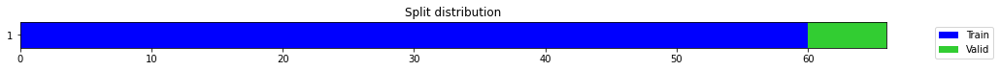

epoch,train_loss,valid_loss,mse,time
0,0.209909,0.189420,0.189420,00:00
1,0.210387,0.140710,0.140710,00:00
2,0.181903,0.140506,0.140506,00:00
3,0.171600,0.143918,0.143918,00:00
4,0.168959,0.153619,0.153619,00:00
5,0.152395,0.164672,0.164672,00:00
6,0.147306,0.063429,0.063429,00:00
7,0.150742,0.010837,0.010837,00:00
8,0.157469,0.028124,0.028124,00:00
9,0.162007,0.506054,0.506054,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.13673396905263266,
  "MSE_normalize": 0.018709166210954937,
  "RMSE_normalize": 0.13678145419228052,
  "MAPE_normalize": 0.1414565276997312,
  "MAE": 8819.887939771017,
  "MSE": 77844462.9582368,
  "RMSE": 8822.950921218864,
  "MAPE": 0.0747652273314944
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:29.365437+07:00
PROGRESS: [ 1016 / 1944 ]


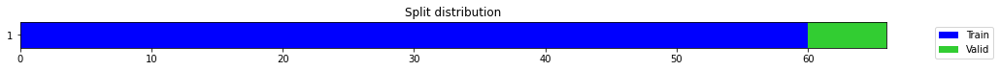

epoch,train_loss,valid_loss,mse,time
0,0.806595,1.601491,1.601491,00:00
1,0.654018,1.292688,1.292688,00:00
2,0.632057,0.952690,0.952690,00:00
3,0.559262,0.597110,0.597110,00:00
4,0.486791,0.272260,0.272260,00:00
5,0.435854,0.034825,0.034825,00:00
6,0.396687,0.036444,0.036444,00:00
7,0.361408,0.309932,0.309932,00:00
8,0.343320,0.640767,0.640767,00:00
9,0.338406,0.846076,0.846076,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09919352332750957,
  "MSE_normalize": 0.009906862801508135,
  "RMSE_normalize": 0.09953322461122284,
  "MAPE_normalize": 0.10279393333645655,
  "MAE": 6398.379028717677,
  "MSE": 41220138.0696896,
  "RMSE": 6420.2911203223175,
  "MAPE": 0.054287111158433925
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:49.434262+07:00
PROGRESS: [ 1017 / 1944 ]


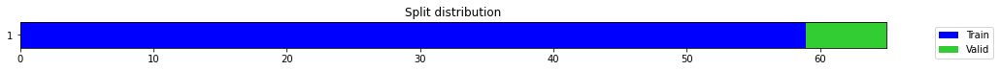

epoch,train_loss,valid_loss,mse,time
0,0.254289,0.145984,0.145984,00:00
1,0.251942,0.015358,0.015358,00:00
2,0.212656,0.002939,0.002939,00:00
3,0.207021,0.164227,0.164227,00:00
4,0.199058,0.274326,0.274326,00:00
5,0.184669,0.144341,0.144341,00:00
6,0.190673,0.370057,0.370057,00:00
7,0.182909,0.305579,0.305579,00:00
8,0.175240,0.216086,0.216086,00:00
9,0.168848,0.186368,0.186368,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.43168242772420246,
  "MSE_normalize": 0.1863675723169358,
  "RMSE_normalize": 0.4317031066797363,
  "MAPE_normalize": 0.44651571835185977,
  "MAE": 27845.243317921955,
  "MSE": 775431861.3807288,
  "RMSE": 27846.57719326971,
  "MAPE": 0.23602004928996753
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:51.716038+07:00
PROGRESS: [ 1018 / 1944 ]


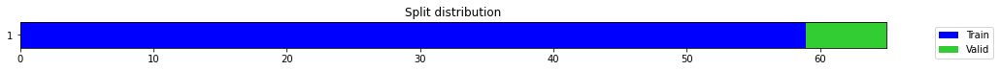

epoch,train_loss,valid_loss,mse,time
0,0.429711,0.658088,0.658088,00:00
1,0.392201,0.139751,0.139751,00:00
2,0.375663,0.030414,0.030414,00:00
3,0.345109,0.112263,0.112263,00:00
4,0.310525,0.034941,0.034941,00:00
5,0.288495,1.317719,1.317719,00:00
6,0.271211,0.350413,0.350413,00:00
7,0.256445,0.108864,0.108864,00:00
8,0.249742,0.007860,0.007860,00:00
9,0.254140,0.193795,0.193795,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16722788413365683,
  "MSE_normalize": 0.027990085032526462,
  "RMSE_normalize": 0.16730237605164627,
  "MAPE_normalize": 0.17291691517216712,
  "MAE": 10786.8674381574,
  "MSE": 116460194.58828636,
  "RMSE": 10791.67246483539,
  "MAPE": 0.09141492250813861
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:19:57.122621+07:00
PROGRESS: [ 1019 / 1944 ]


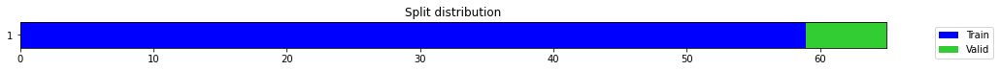

epoch,train_loss,valid_loss,mse,time
0,0.898285,1.048839,1.048839,00:00
1,0.913712,0.766039,0.766039,00:00
2,0.805355,0.383653,0.383653,00:00
3,0.717680,0.059933,0.059933,00:00
4,0.671731,0.015975,0.015975,00:00
5,0.606932,0.137733,0.137733,00:00
6,0.541880,0.228837,0.228837,00:00
7,0.484545,0.190758,0.190758,00:00
8,0.451491,0.000910,0.000910,00:00
9,0.412966,0.107542,0.107542,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.1032607654730479,
  "MSE_normalize": 0.010683148403040002,
  "RMSE_normalize": 0.10335931696291342,
  "MAPE_normalize": 0.10690483785885234,
  "MAE": 6660.7324160734815,
  "MSE": 44450080.81925352,
  "RMSE": 6667.0893813757675,
  "MAPE": 0.05648403289413747
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:20:07.418762+07:00
PROGRESS: [ 1020 / 1944 ]


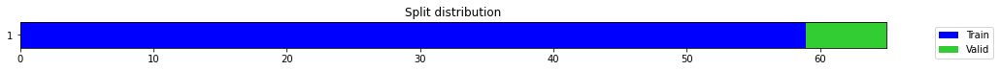

epoch,train_loss,valid_loss,mse,time
0,0.360817,0.839625,0.839625,00:00
1,0.411815,0.730344,0.730344,00:00
2,0.411984,0.505754,0.505754,00:00
3,0.391332,0.262612,0.262612,00:00
4,0.412962,0.057935,0.057935,00:00
5,0.385533,0.000639,0.000639,00:00
6,0.351169,0.015153,0.015153,00:00
7,0.338467,0.013638,0.013638,00:00
8,0.327053,0.001144,0.001144,00:00
9,0.304629,0.093947,0.093947,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.15803335110346475,
  "MSE_normalize": 0.025023011361927416,
  "RMSE_normalize": 0.15818663458689364,
  "MAPE_normalize": 0.1636365142500021,
  "MAE": 10193.78327957789,
  "MSE": 104114895.29268949,
  "RMSE": 10203.67067739299,
  "MAPE": 0.08645219717632946
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:20:27.856993+07:00
PROGRESS: [ 1021 / 1944 ]


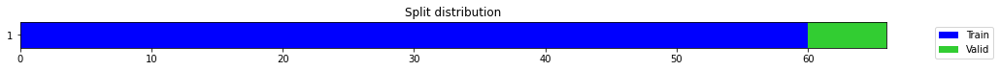

epoch,train_loss,valid_loss,mse,time
0,0.579401,0.400806,0.400806,00:00
1,0.435271,0.059028,0.059028,00:00
2,0.354546,0.051863,0.051863,00:00
3,0.312194,0.072217,0.072217,00:00
4,0.289449,0.005578,0.005578,00:00
5,0.263413,0.001809,0.001809,00:00
6,0.266143,0.011331,0.011331,00:00
7,0.243797,0.138955,0.138955,00:00
8,0.233246,0.236794,0.236794,00:00
9,0.228909,0.188468,0.188468,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4333767294883728,
  "MSE_normalize": 0.18846800900972602,
  "RMSE_normalize": 0.43412902345930066,
  "MAPE_normalize": 0.4477572465381668,
  "MAE": 27954.532558918,
  "MSE": 784171286.9908499,
  "RMSE": 28003.05852921873,
  "MAPE": 0.23680394238976346
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:20:30.349970+07:00
PROGRESS: [ 1022 / 1944 ]


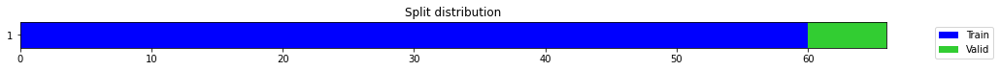

epoch,train_loss,valid_loss,mse,time
0,0.275577,0.109785,0.109785,00:00
1,0.241231,0.044241,0.044241,00:00
2,0.198271,0.003765,0.003765,00:00
3,0.207240,0.093002,0.093002,00:00
4,0.198046,0.081334,0.081334,00:00
5,0.187141,1.165119,1.165119,00:00
6,0.177988,0.002091,0.002091,00:00
7,0.171360,0.033906,0.033906,00:00
8,0.171852,1.024030,1.024030,00:00
9,0.171587,0.344817,0.344817,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.25207128127415973,
  "MSE_normalize": 0.06360236557093064,
  "RMSE_normalize": 0.25219509426420383,
  "MAPE_normalize": 0.26059794574660694,
  "MAE": 16259.605927308401,
  "MSE": 264634561.20473662,
  "RMSE": 16267.5923604182,
  "MAPE": 0.13778103177207393
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:20:36.163942+07:00
PROGRESS: [ 1023 / 1944 ]


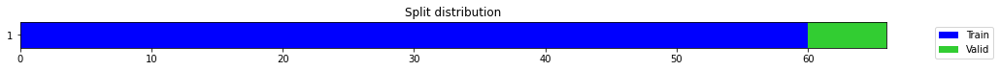

epoch,train_loss,valid_loss,mse,time
0,0.815537,1.681096,1.681096,00:00
1,0.720299,1.215227,1.215227,00:00
2,0.651968,0.658169,0.658169,00:00
3,0.546992,0.135524,0.135524,00:00
4,0.472239,0.010911,0.010911,00:00
5,0.426782,0.198761,0.198761,00:00
6,0.389429,0.406982,0.406982,00:00
7,0.358730,0.205844,0.205844,00:00
8,0.329997,0.000997,0.000997,00:00
9,0.303354,0.391783,0.391783,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.0878916084766388,
  "MSE_normalize": 0.007737994728229225,
  "RMSE_normalize": 0.08796587252013831,
  "MAPE_normalize": 0.09099515956594299,
  "MAE": 5669.360313177109,
  "MSE": 32195985.49720331,
  "RMSE": 5674.150641039001,
  "MAPE": 0.048077552041525445
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:20:47.311924+07:00
PROGRESS: [ 1024 / 1944 ]


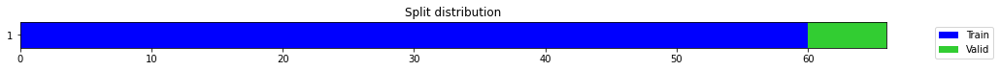

epoch,train_loss,valid_loss,mse,time
0,0.484543,0.509327,0.509327,00:00
1,0.441800,0.440977,0.440977,00:00
2,0.411238,0.336618,0.336618,00:00
3,0.372939,0.194954,0.194954,00:00
4,0.329770,0.052111,0.052111,00:00
5,0.308550,0.000330,0.000330,00:00
6,0.283570,0.060233,0.060233,00:00
7,0.265062,0.194322,0.194322,00:00
8,0.269442,0.352549,0.352549,00:00
9,0.265574,0.179239,0.179239,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.056184858083724976,
  "MSE_normalize": 0.0031601342846479716,
  "RMSE_normalize": 0.05621507168587417,
  "MAPE_normalize": 0.05814609241405883,
  "MAE": 3624.148085832596,
  "MSE": 13148579.33755975,
  "RMSE": 3626.096984025627,
  "MAPE": 0.030727359159884667
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.6
2022-10-15 00:21:09.472933+07:00
PROGRESS: [ 1025 / 1944 ]


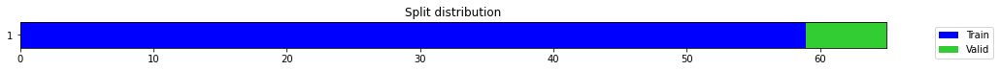

epoch,train_loss,valid_loss,mse,time
0,1.049541,0.717656,0.717656,00:00
1,0.709998,0.494050,0.494050,00:00
2,0.591784,0.115055,0.115055,00:00
3,0.482875,1.228875,1.228875,00:00
4,0.427711,0.325973,0.325973,00:00
5,0.377057,0.135720,0.135720,00:00
6,0.329232,0.116400,0.116400,00:00
7,0.292291,0.105870,0.105870,00:00
8,0.267650,0.091630,0.091630,00:00
9,0.246848,0.070680,0.070680,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2656581501166026,
  "MSE_normalize": 0.07068030320967071,
  "RMSE_normalize": 0.2658576747240348,
  "MAPE_normalize": 0.27459406310227374,
  "MAE": 17136.013315121334,
  "MSE": 294084203.5953736,
  "RMSE": 17148.883450399142,
  "MAPE": 0.14519348813015068
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.6
2022-10-15 00:21:12.182000+07:00
PROGRESS: [ 1026 / 1944 ]


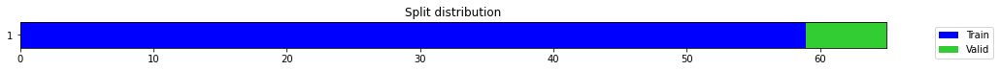

epoch,train_loss,valid_loss,mse,time
0,0.646014,1.080034,1.080034,00:00
1,0.487687,0.144398,0.144398,00:00
2,0.438658,0.157527,0.157527,00:00
3,0.387193,0.308747,0.308747,00:00
4,0.339464,0.382886,0.382886,00:00
5,0.324164,0.000465,0.000465,00:00
6,0.282897,0.273476,0.273476,00:00
7,0.265755,0.260860,0.260860,00:00
8,0.254590,0.073510,0.073510,00:00
9,0.237685,0.188281,0.188281,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3788163860638936,
  "MSE_normalize": 0.14388316279365773,
  "RMSE_normalize": 0.37931934144419494,
  "MAPE_normalize": 0.39144332966596423,
  "MAE": 24435.172166665394,
  "MSE": 598664174.0264467,
  "RMSE": 24467.61480051635,
  "MAPE": 0.20700704677245896
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.6
2022-10-15 00:21:18.464999+07:00
PROGRESS: [ 1027 / 1944 ]


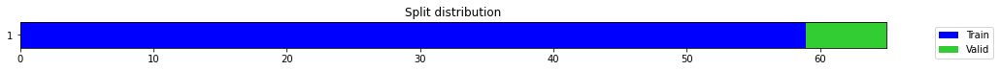

epoch,train_loss,valid_loss,mse,time
0,0.344019,0.560672,0.560672,00:00
1,0.330801,0.312060,0.312060,00:00
2,0.318858,0.051114,0.051114,00:00
3,0.297064,0.000848,0.000848,00:00
4,0.276557,0.056058,0.056058,00:00
5,0.252604,0.071431,0.071431,00:00
6,0.235602,0.052176,0.052176,00:00
7,0.223075,0.072311,0.072311,00:00
8,0.206832,0.293708,0.293708,00:00
9,0.208178,0.020104,0.020104,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.16114904483159384,
  "MSE_normalize": 0.026017366716651225,
  "RMSE_normalize": 0.16129899787863292,
  "MAPE_normalize": 0.1668599152140771,
  "MAE": 10394.75798781713,
  "MSE": 108252175.26045191,
  "RMSE": 10404.430559163337,
  "MAPE": 0.08815591848463522
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.6
2022-10-15 00:21:30.890078+07:00
PROGRESS: [ 1028 / 1944 ]


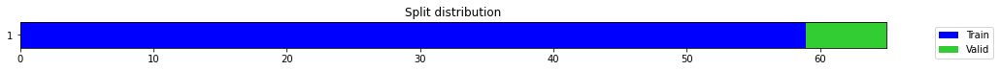

epoch,train_loss,valid_loss,mse,time
0,0.648245,0.726902,0.726902,00:00
1,0.677909,0.400023,0.400023,00:00
2,0.600583,0.218700,0.218700,00:00
3,0.583771,0.093103,0.093103,00:00
4,0.568703,0.021390,0.021390,00:00
5,0.531292,0.007528,0.007528,00:00
6,0.498087,0.002727,0.002727,00:00
7,0.470792,0.001376,0.001376,00:00
8,0.433917,0.015999,0.015999,00:00
9,0.397577,0.064631,0.064631,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1341939369837443,
  "MSE_normalize": 0.018048995119457345,
  "RMSE_normalize": 0.1343465485952555,
  "MAPE_normalize": 0.1389594069021214,
  "MAE": 8656.045711199442,
  "MSE": 75097645.51598798,
  "RMSE": 8665.88977058836,
  "MAPE": 0.07341292409137286
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:21:56.550582+07:00
PROGRESS: [ 1029 / 1944 ]


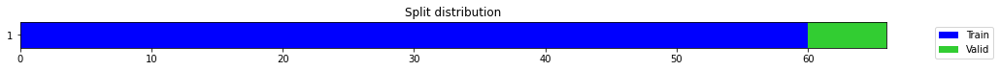

epoch,train_loss,valid_loss,mse,time
0,0.505402,0.280201,0.280201,00:00
1,0.396498,0.420129,0.420129,00:00
2,0.372255,0.131787,0.131787,00:00
3,0.330422,0.089773,0.089773,00:00
4,0.332867,1.103721,1.103721,00:00
5,0.317417,0.327327,0.327327,00:00
6,0.288414,0.002276,0.002276,00:00
7,0.266604,0.054190,0.054190,00:00
8,0.255454,0.030901,0.030901,00:00
9,0.243486,0.011002,0.011002,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.10483394066492717,
  "MSE_normalize": 0.011001573244547794,
  "RMSE_normalize": 0.10488838469796259,
  "MAPE_normalize": 0.1084967002296436,
  "MAE": 6762.208508650462,
  "MSE": 45774972.07844932,
  "RMSE": 6765.720366557379,
  "MAPE": 0.057334360666656016
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:21:59.722860+07:00
PROGRESS: [ 1030 / 1944 ]


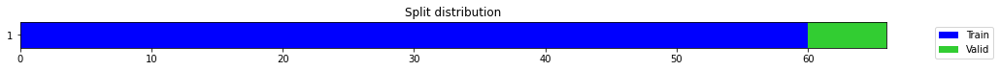

epoch,train_loss,valid_loss,mse,time
0,0.624004,1.203754,1.203754,00:00
1,0.574779,0.160408,0.160408,00:00
2,0.479669,0.258098,0.258098,00:00
3,0.414629,0.118092,0.118092,00:00
4,0.371234,0.002224,0.002224,00:00
5,0.333658,0.005858,0.005858,00:00
6,0.307283,0.355010,0.355010,00:00
7,0.288204,0.085920,0.085920,00:00
8,0.270571,0.213995,0.213995,00:00
9,0.247478,0.117789,0.117789,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.2133906384309133,
  "MSE_normalize": 0.045539650628606765,
  "RMSE_normalize": 0.21340021234433382,
  "MAPE_normalize": 0.22079267961910995,
  "MAE": 13764.549741347631,
  "MSE": 189479830.71602002,
  "RMSE": 13765.167297058908,
  "MAPE": 0.11668964203966452
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:22:07.103286+07:00
PROGRESS: [ 1031 / 1944 ]


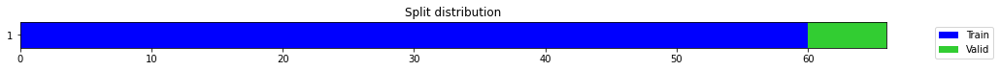

epoch,train_loss,valid_loss,mse,time
0,0.866134,1.823504,1.823504,00:00
1,0.793429,1.113567,1.113567,00:00
2,0.731623,0.398000,0.398000,00:00
3,0.637356,0.009399,0.009399,00:00
4,0.540517,0.144375,0.144375,00:00
5,0.495053,0.347660,0.347660,00:00
6,0.454032,0.176458,0.176458,00:00
7,0.412233,0.100290,0.100290,00:00
8,0.373333,0.028321,0.028321,00:00
9,0.338787,0.008763,0.008763,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09676085909207661,
  "MSE_normalize": 0.00983147111811237,
  "RMSE_normalize": 0.09915377510772028,
  "MAPE_normalize": 0.09960504471619064,
  "MAE": 6241.46245487531,
  "MSE": 40906450.91552747,
  "RMSE": 6395.815109548389,
  "MAPE": 0.05276926469998405
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:22:20.866722+07:00
PROGRESS: [ 1032 / 1944 ]


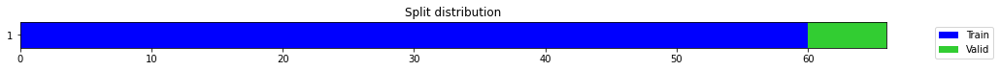

epoch,train_loss,valid_loss,mse,time
0,0.208596,0.414846,0.414846,00:00
1,0.242887,0.341669,0.341669,00:00
2,0.201773,0.213790,0.213790,00:00
3,0.218459,0.071232,0.071232,00:00
4,0.207548,0.000588,0.000588,00:00
5,0.196432,0.001050,0.001050,00:00
6,0.190792,0.003943,0.003943,00:00
7,0.190469,0.034900,0.034900,00:00
8,0.183569,0.040016,0.040016,00:00
9,0.173959,0.001811,0.001811,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.07148273785909016,
  "MSE_normalize": 0.005116458380637567,
  "RMSE_normalize": 0.0715294231812166,
  "MAPE_normalize": 0.07398198853274592,
  "MAE": 4610.922522862752,
  "MSE": 21288386.15243518,
  "RMSE": 4613.933912881195,
  "MAPE": 0.039094762884150404
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:22:48.704430+07:00
PROGRESS: [ 1033 / 1944 ]


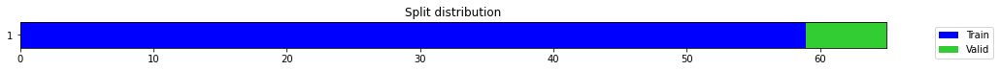

epoch,train_loss,valid_loss,mse,time
0,0.436780,0.495164,0.495164,00:00
1,0.385856,0.001708,0.001708,00:00
2,0.322920,0.001537,0.001537,00:00
3,0.319747,0.004448,0.004448,00:00
4,0.311405,3.036682,3.036682,00:00
5,0.288170,0.754360,0.754360,00:00
6,0.268485,0.001627,0.001627,00:00
7,0.253901,0.008512,0.008512,00:00
8,0.239807,0.048413,0.048413,00:00
9,0.225239,0.073941,0.073941,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27190232276916504,
  "MSE_normalize": 0.07394061284362981,
  "RMSE_normalize": 0.27192023250142644,
  "MAPE_normalize": 0.28132863121427115,
  "MAE": 17538.78742790222,
  "MSE": 307649589.1219881,
  "RMSE": 17539.942677272014,
  "MAPE": 0.1486844192146076
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:22:51.675238+07:00
PROGRESS: [ 1034 / 1944 ]


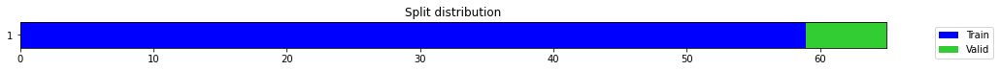

epoch,train_loss,valid_loss,mse,time
0,0.588545,0.027945,0.027945,00:00
1,0.510060,0.492361,0.492361,00:00
2,0.445127,0.906987,0.906987,00:00
3,0.404198,0.285947,0.285947,00:00
4,0.376004,0.009993,0.009993,00:00
5,0.344852,0.111495,0.111495,00:00
6,0.316045,0.068671,0.068671,00:00
7,0.300702,0.547327,0.547327,00:00
8,0.284422,0.035813,0.035813,00:00
9,0.275192,0.026675,0.026675,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.46516844630241394,
  "MSE_normalize": 0.21692368991188302,
  "RMSE_normalize": 0.4657506735495753,
  "MAPE_normalize": 0.48068983761483447,
  "MAE": 30005.22546029091,
  "MSE": 902568717.0506849,
  "RMSE": 30042.781446641802,
  "MAPE": 0.2541991620493935
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:22:58.641497+07:00
PROGRESS: [ 1035 / 1944 ]


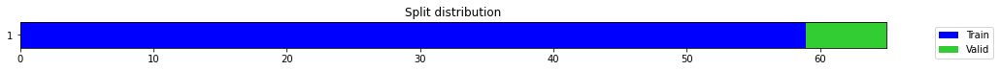

epoch,train_loss,valid_loss,mse,time
0,0.262810,0.047460,0.047460,00:00
1,0.262082,0.024751,0.024751,00:00
2,0.242823,0.001124,0.001124,00:00
3,0.209151,0.009054,0.009054,00:00
4,0.199408,0.008839,0.008839,00:00
5,0.201280,0.097550,0.097550,00:00
6,0.192536,0.468440,0.468440,00:00
7,0.190422,0.617555,0.617555,00:00
8,0.186095,0.029014,0.029014,00:00
9,0.192442,0.000729,0.000729,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.09648286302884419,
  "MSE_normalize": 0.009354248924750527,
  "RMSE_normalize": 0.09671736620044265,
  "MAPE_normalize": 0.09995244821286998,
  "MAE": 6223.530596812566,
  "MSE": 38920841.03130653,
  "RMSE": 6238.656989393352,
  "MAPE": 0.05279458186565263
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:23:11.701223+07:00
PROGRESS: [ 1036 / 1944 ]


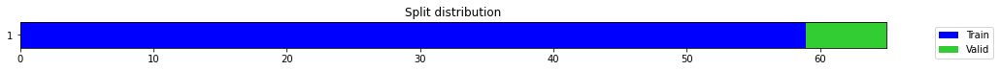

epoch,train_loss,valid_loss,mse,time
0,0.471076,0.708127,0.708127,00:00
1,0.391325,0.308995,0.308995,00:00
2,0.353114,0.061948,0.061948,00:00
3,0.307867,0.000590,0.000590,00:00
4,0.281194,0.003138,0.003138,00:00
5,0.269075,0.005401,0.005401,00:00
6,0.260290,0.179924,0.179924,00:00
7,0.253025,0.718533,0.718533,00:00
8,0.249514,1.177584,1.177584,00:00
9,0.250931,0.457976,0.457976,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27148210008939105,
  "MSE_normalize": 0.07371930044030428,
  "RMSE_normalize": 0.2715129839258231,
  "MAPE_normalize": 0.2809249642180929,
  "MAE": 17511.68138416608,
  "MSE": 306728759.9953119,
  "RMSE": 17513.673515151295,
  "MAPE": 0.14846333866682113
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:23:38.456795+07:00
PROGRESS: [ 1037 / 1944 ]


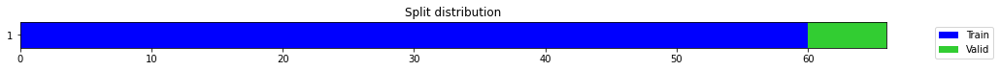

epoch,train_loss,valid_loss,mse,time
0,0.485014,0.007567,0.007567,00:00
1,0.334889,0.313505,0.313505,00:00
2,0.363881,0.273582,0.273582,00:00
3,0.346316,0.285511,0.285511,00:00
4,0.305894,0.253393,0.253393,00:00
5,0.277011,0.154700,0.154700,00:00
6,0.268951,0.004434,0.004434,00:00
7,0.242637,0.000472,0.000472,00:00
8,0.237181,0.000661,0.000661,00:00
9,0.219284,0.004360,0.004360,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.06372653444608052,
  "MSE_normalize": 0.004359919997058981,
  "RMSE_normalize": 0.06602969026929462,
  "MAPE_normalize": 0.06631687760800002,
  "MAE": 4110.616377909978,
  "MSE": 18140606.956241824,
  "RMSE": 4259.179141130579,
  "MAPE": 0.03495415173421903
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:23:41.834436+07:00
PROGRESS: [ 1038 / 1944 ]


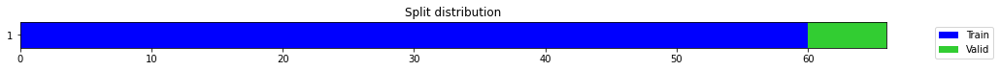

epoch,train_loss,valid_loss,mse,time
0,0.514064,0.251949,0.251949,00:00
1,0.530816,0.006972,0.006972,00:00
2,0.421324,0.643332,0.643332,00:00
3,0.367908,0.986952,0.986952,00:00
4,0.365419,0.683937,0.683937,00:00
5,0.360256,0.094577,0.094577,00:00
6,0.337570,0.145958,0.145958,00:00
7,0.319485,4.031574,4.031574,00:00
8,0.314603,0.703584,0.703584,00:00
9,0.302900,0.273231,0.273231,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.03320204218228658,
  "MSE_normalize": 0.001164175298410323,
  "RMSE_normalize": 0.03412001316544768,
  "MAPE_normalize": 0.03452529084407371,
  "MAE": 2141.6645289262137,
  "MSE": 4843861.01829233,
  "RMSE": 2200.877329224037,
  "MAPE": 0.018203946353395988
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:23:50.004384+07:00
PROGRESS: [ 1039 / 1944 ]


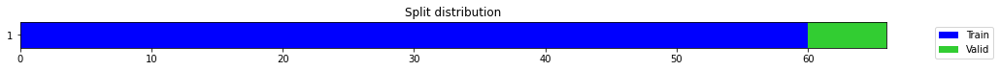

epoch,train_loss,valid_loss,mse,time
0,0.431091,0.352222,0.352222,00:00
1,0.427014,0.125366,0.125366,00:00
2,0.327609,0.002973,0.002973,00:00
3,0.287590,0.044921,0.044921,00:00
4,0.273672,0.115396,0.115396,00:00
5,0.260872,0.017600,0.017600,00:00
6,0.245951,0.059127,0.059127,00:00
7,0.231272,0.458580,0.458580,00:00
8,0.228108,0.002524,0.002524,00:00
9,0.217899,0.044652,0.044652,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16380879282951355,
  "MSE_normalize": 0.02684346721217601,
  "RMSE_normalize": 0.1638397607791711,
  "MAPE_normalize": 0.16952023843887373,
  "MAE": 10566.322372674942,
  "MSE": 111689386.12803221,
  "RMSE": 10568.319929299652,
  "MAPE": 0.08958469380694183
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:24:05.529786+07:00
PROGRESS: [ 1040 / 1944 ]


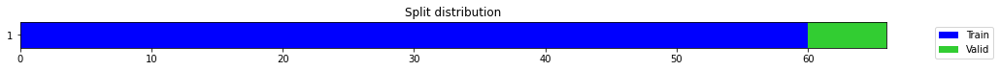

epoch,train_loss,valid_loss,mse,time
0,0.641914,0.738206,0.738206,00:00
1,0.528353,0.424270,0.424270,00:00
2,0.455757,0.192520,0.192520,00:00
3,0.398079,0.017876,0.017876,00:00
4,0.341266,0.056601,0.056601,00:00
5,0.320519,0.376110,0.376110,00:00
6,0.317025,0.565211,0.565211,00:00
7,0.312575,0.002691,0.002691,00:00
8,0.299985,0.806512,0.806512,00:00
9,0.290808,1.148952,1.148952,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.11216482520103455,
  "MSE_normalize": 0.012587460282401134,
  "RMSE_normalize": 0.11219385135737668,
  "MAPE_normalize": 0.11606270939062367,
  "MAE": 7235.079884767532,
  "MSE": 52373476.9707644,
  "RMSE": 7236.952187956225,
  "MAPE": 0.06133775766031028
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.8
2022-10-15 00:24:36.099327+07:00
PROGRESS: [ 1041 / 1944 ]


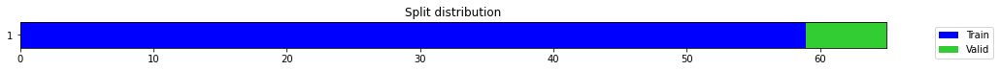

epoch,train_loss,valid_loss,mse,time
0,0.827932,0.872361,0.872361,00:00
1,0.593945,0.063400,0.063400,00:00
2,0.474853,0.000966,0.000966,00:00
3,0.406461,0.038611,0.038611,00:00
4,0.378239,0.109076,0.109076,00:00
5,0.332771,0.056502,0.056502,00:00
6,0.294901,0.321428,0.321428,00:00
7,0.276002,0.468811,0.468811,00:00
8,0.253168,0.292443,0.292443,00:00
9,0.238244,0.246876,0.246876,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.4965662856896718,
  "MSE_normalize": 0.24687646812954345,
  "RMSE_normalize": 0.4968666502488806,
  "MAPE_normalize": 0.5133133356789207,
  "MAE": 32030.51169212659,
  "MSE": 1027195218.7435116,
  "RMSE": 32049.886407653798,
  "MAPE": 0.2714067902841229
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.8
2022-10-15 00:24:39.608891+07:00
PROGRESS: [ 1042 / 1944 ]


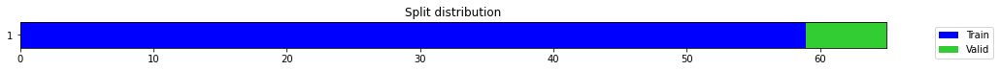

epoch,train_loss,valid_loss,mse,time
0,1.019415,2.118900,2.118900,00:00
1,0.919017,0.450370,0.450370,00:00
2,0.730440,0.094493,0.094493,00:00
3,0.633525,0.018402,0.018402,00:00
4,0.518375,0.047772,0.047772,00:00
5,0.470503,0.240287,0.240287,00:00
6,0.439894,0.564924,0.564924,00:00
7,0.402325,1.658815,1.658815,00:00
8,0.376453,0.239251,0.239251,00:00
9,0.352362,1.078455,1.078455,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12065815925598145,
  "MSE_normalize": 0.014585948959110103,
  "RMSE_normalize": 0.12077230211894656,
  "MAPE_normalize": 0.12492441809544073,
  "MAE": 7782.933904647827,
  "MSE": 60688720.740175895,
  "RMSE": 7790.296575880529,
  "MAPE": 0.06600281880852064
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:24:48.474341+07:00
PROGRESS: [ 1043 / 1944 ]


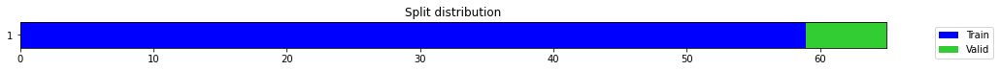

epoch,train_loss,valid_loss,mse,time
0,0.587333,0.431892,0.431892,00:00
1,0.617919,0.081150,0.081150,00:00
2,0.502866,0.118180,0.118180,00:00
3,0.438828,0.679939,0.679939,00:00
4,0.388660,0.954601,0.954601,00:00
5,0.346180,0.351585,0.351585,00:00
6,0.336578,0.007341,0.007341,00:00
7,0.304444,0.000565,0.000565,00:00
8,0.288295,0.000338,0.000338,00:00
9,0.270217,0.192150,0.192150,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13757405678431192,
  "MSE_normalize": 0.018940192331250216,
  "RMSE_normalize": 0.13762337131188954,
  "MAPE_normalize": 0.1423791398115815,
  "MAE": 8874.076958815256,
  "MSE": 78805708.58836971,
  "RMSE": 8877.257943102122,
  "MAPE": 0.07523963434402627
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:25:03.775749+07:00
PROGRESS: [ 1044 / 1944 ]


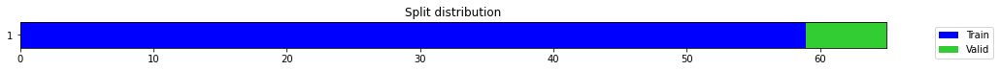

epoch,train_loss,valid_loss,mse,time
0,0.553674,1.109083,1.109083,00:00
1,0.521060,0.475063,0.475063,00:00
2,0.465879,0.119413,0.119413,00:00
3,0.449471,0.002964,0.002964,00:00
4,0.404817,0.010135,0.010135,00:00
5,0.366476,0.000659,0.000659,00:00
6,0.329241,0.084096,0.084096,00:00
7,0.323934,0.137388,0.137388,00:00
8,0.301034,0.016225,0.016225,00:00
9,0.282784,0.016190,0.016190,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18892587224642435,
  "MSE_normalize": 0.03572975274172722,
  "RMSE_normalize": 0.18902315398312244,
  "MAPE_normalize": 0.19557228477315483,
  "MAE": 12186.474463383356,
  "MSE": 148663140.96786144,
  "RMSE": 12192.749524527331,
  "MAPE": 0.1033374172173092
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:25:33.770016+07:00
PROGRESS: [ 1045 / 1944 ]


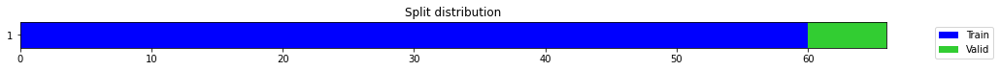

epoch,train_loss,valid_loss,mse,time
0,0.678487,0.125462,0.125462,00:00
1,0.492989,0.431731,0.431731,00:00
2,0.484044,0.000405,0.000405,00:00
3,0.418057,1.624080,1.624080,00:00
4,0.377125,0.735413,0.735413,00:00
5,0.342008,0.514472,0.514472,00:00
6,0.318966,0.131933,0.131933,00:00
7,0.294400,0.002197,0.002197,00:00
8,0.280085,0.017227,0.017227,00:00
9,0.259825,0.035961,0.035961,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.18960695465405783,
  "MSE_normalize": 0.03596130654701154,
  "RMSE_normalize": 0.18963466599493758,
  "MAPE_normalize": 0.19613051578303842,
  "MAE": 12230.407003005346,
  "MSE": 149626582.1717639,
  "RMSE": 12232.194495337453,
  "MAPE": 0.1036689050630205
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:25:37.659721+07:00
PROGRESS: [ 1046 / 1944 ]


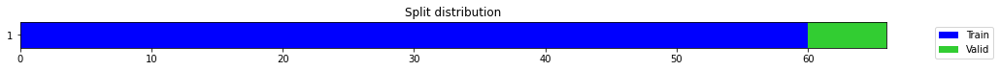

epoch,train_loss,valid_loss,mse,time
0,0.400828,1.367648,1.367648,00:00
1,0.319807,0.220721,0.220721,00:00
2,0.272759,0.025361,0.025361,00:00
3,0.298343,0.142269,0.142269,00:00
4,0.283062,1.373121,1.373121,00:00
5,0.275698,1.456111,1.456111,00:00
6,0.275335,2.792941,2.792941,00:00
7,0.261651,0.000784,0.000784,00:00
8,0.254221,2.979174,2.979174,00:00
9,0.247596,1.483942,1.483942,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.27429283658663434,
  "MSE_normalize": 0.07524327591896747,
  "RMSE_normalize": 0.27430507818661953,
  "MAPE_normalize": 0.2837567778632325,
  "MAE": 17692.98513118426,
  "MSE": 313069665.376151,
  "RMSE": 17693.77476334971,
  "MAPE": 0.1499790335349934
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:25:46.657146+07:00
PROGRESS: [ 1047 / 1944 ]


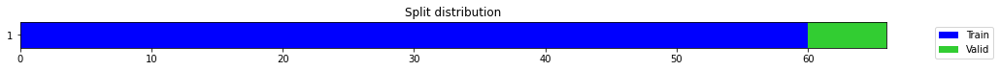

epoch,train_loss,valid_loss,mse,time
0,0.301693,0.523890,0.523890,00:00
1,0.282725,0.129819,0.129819,00:00
2,0.225995,0.000948,0.000948,00:00
3,0.211958,0.001260,0.001260,00:00
4,0.219812,0.027064,0.027064,00:00
5,0.215799,0.892782,0.892782,00:00
6,0.203333,0.328718,0.328718,00:00
7,0.210283,0.003049,0.003049,00:00
8,0.212507,1.839242,1.839242,00:00
9,0.218315,1.686211,1.686211,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.12715514500935873,
  "MSE_normalize": 0.016422543101848913,
  "RMSE_normalize": 0.12815047054868317,
  "MAPE_normalize": 0.13190790341266698,
  "MAE": 8202.015473683676,
  "MSE": 68330359.23446818,
  "RMSE": 8266.217952272258,
  "MAPE": 0.06962857823005471
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:26:04.650215+07:00
PROGRESS: [ 1048 / 1944 ]


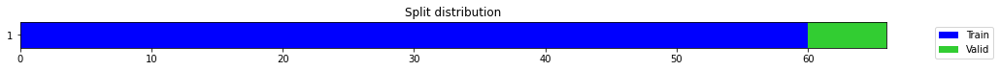

epoch,train_loss,valid_loss,mse,time
0,0.458361,0.628768,0.628768,00:00
1,0.386932,0.456772,0.456772,00:00
2,0.369071,0.218844,0.218844,00:00
3,0.313607,0.035608,0.035608,00:00
4,0.284719,0.054969,0.054969,00:00
5,0.267490,0.237567,0.237567,00:00
6,0.256943,0.151708,0.151708,00:00
7,0.239430,0.017824,0.017824,00:00
8,0.218912,0.102895,0.102895,00:00
9,0.221737,0.163759,0.163759,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.016308794418970745,
  "MSE_normalize": 0.0003869524951512678,
  "RMSE_normalize": 0.019671108132265143,
  "MAPE_normalize": 0.01662572130491105,
  "MAE": 1051.982475201289,
  "MSE": 1610018.7916318,
  "RMSE": 1268.8651589636306,
  "MAPE": 0.008848681783761586
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:26:40.120160+07:00
PROGRESS: [ 1049 / 1944 ]


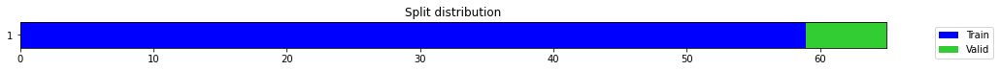

epoch,train_loss,valid_loss,mse,time
0,0.324468,0.399189,0.399189,00:00
1,0.257627,0.004968,0.004968,00:00
2,0.253444,0.123691,0.123691,00:00
3,0.242152,0.029220,0.029220,00:00
4,0.216033,2.633826,2.633826,00:00
5,0.203662,0.607706,0.607706,00:00
6,0.206308,0.822072,0.822072,00:00
7,0.194548,1.399240,1.399240,00:00
8,0.195316,1.134733,1.134733,00:00
9,0.186008,0.707097,0.707097,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.8394349416097006,
  "MSE_normalize": 0.7070970718984064,
  "RMSE_normalize": 0.840890642056627,
  "MAPE_normalize": 0.8672850689005043,
  "MAE": 54146.911473592125,
  "MSE": 2942065466.767998,
  "RMSE": 54240.80997522067,
  "MAPE": 0.4586788751814635
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:26:44.199968+07:00
PROGRESS: [ 1050 / 1944 ]


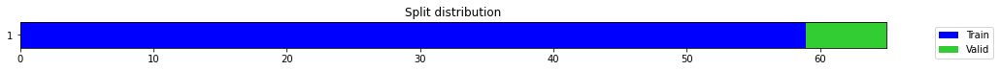

epoch,train_loss,valid_loss,mse,time
0,0.370980,0.046695,0.046695,00:00
1,0.313117,0.075867,0.075867,00:00
2,0.275808,0.511666,0.511666,00:00
3,0.256085,0.012850,0.012850,00:00
4,0.246636,0.164463,0.164463,00:00
5,0.241055,0.123653,0.123653,00:00
6,0.224426,0.036401,0.036401,00:00
7,0.215447,0.911341,0.911341,00:00
8,0.210213,1.773863,1.773863,00:00
9,0.203829,0.930750,0.930750,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19494413336118063,
  "MSE_normalize": 0.038234279465775366,
  "RMSE_normalize": 0.19553587769454323,
  "MAPE_normalize": 0.20201896858356808,
  "MAE": 12574.676378329596,
  "MSE": 159083890.64744475,
  "RMSE": 12612.846254808816,
  "MAPE": 0.10668976889482147
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:26:54.242513+07:00
PROGRESS: [ 1051 / 1944 ]


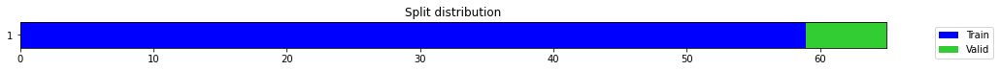

epoch,train_loss,valid_loss,mse,time
0,0.595783,1.078738,1.078738,00:00
1,0.451885,0.322414,0.322414,00:00
2,0.401912,0.004624,0.004624,00:00
3,0.372664,0.170783,0.170783,00:00
4,0.323863,0.070686,0.070686,00:00
5,0.284792,0.018563,0.018563,00:00
6,0.272264,0.062278,0.062278,00:00
7,0.256673,0.010571,0.010571,00:00
8,0.255199,0.510285,0.510285,00:00
9,0.243237,0.004468,0.004468,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19011027614275613,
  "MSE_normalize": 0.03644248087020626,
  "RMSE_normalize": 0.1908991379504011,
  "MAPE_normalize": 0.19706689849216727,
  "MAE": 12262.873252312342,
  "MSE": 151628635.9434843,
  "RMSE": 12313.75799435267,
  "MAPE": 0.10406017779520726
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:27:13.665554+07:00
PROGRESS: [ 1052 / 1944 ]


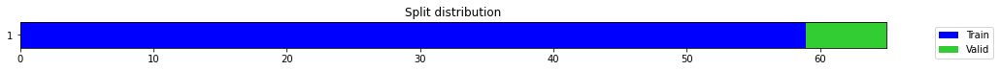

epoch,train_loss,valid_loss,mse,time
0,0.550546,0.546278,0.546278,00:00
1,0.492417,0.119840,0.119840,00:00
2,0.446106,0.000831,0.000831,00:00
3,0.409537,0.061571,0.061571,00:00
4,0.376631,0.073685,0.073685,00:00
5,0.345142,0.004020,0.004020,00:00
6,0.319598,0.062193,0.062193,00:00
7,0.298476,0.039482,0.039482,00:00
8,0.283602,0.079964,0.079964,00:00
9,0.280148,0.198164,0.198164,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.21582635243733725,
  "MSE_normalize": 0.04658873200341773,
  "RMSE_normalize": 0.21584423087823712,
  "MAPE_normalize": 0.22324614424654612,
  "MAE": 13921.663037618002,
  "MSE": 193844812.8483521,
  "RMSE": 13922.816268569808,
  "MAPE": 0.11800295375187704
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:27:50.642072+07:00
PROGRESS: [ 1053 / 1944 ]


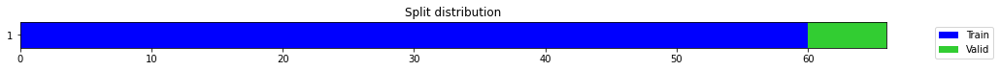

epoch,train_loss,valid_loss,mse,time
0,0.540544,0.830286,0.830286,00:00
1,0.371121,1.792390,1.792390,00:00
2,0.328349,0.054342,0.054342,00:00
3,0.299591,0.810680,0.810680,00:00
4,0.278242,0.608517,0.608517,00:00
5,0.264387,0.234465,0.234465,00:00
6,0.258633,0.217359,0.217359,00:00
7,0.256236,1.774223,1.774223,00:00
8,0.240333,1.504610,1.504610,00:00
9,0.242819,0.999769,0.999769,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.9981901446978251,
  "MSE_normalize": 0.9997690696449469,
  "RMSE_normalize": 0.9998845281556,
  "MAPE_normalize": 1.0313142329163905,
  "MAE": 64387.25709358851,
  "MSE": 4159805168.826633,
  "RMSE": 64496.55160414883,
  "MAPE": 0.5454269208133674
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:27:56.149859+07:00
PROGRESS: [ 1054 / 1944 ]


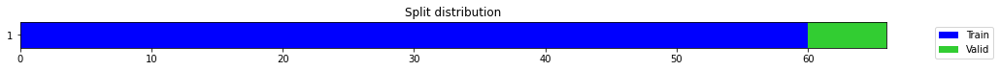

epoch,train_loss,valid_loss,mse,time
0,1.020978,0.841326,0.841326,00:00
1,0.723361,0.388663,0.388663,00:00
2,0.554092,0.172352,0.172352,00:00
3,0.513145,1.049890,1.049890,00:00
4,0.446697,0.883950,0.883950,00:00
5,0.406403,0.026551,0.026551,00:00
6,0.352136,0.043522,0.043522,00:00
7,0.322912,0.078627,0.078627,00:00
8,0.292722,0.255320,0.255320,00:00
9,0.273391,0.022301,0.022301,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.1938321888446808,
  "MSE_normalize": 0.03761835251315363,
  "RMSE_normalize": 0.19395451145346848,
  "MAPE_normalize": 0.20037117088332132,
  "MAE": 12502.95150923729,
  "MSE": 156521162.71463785,
  "RMSE": 12510.841806794531,
  "MAPE": 0.10594286518229357
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.7
2022-10-15 00:28:09.531978+07:00
PROGRESS: [ 1055 / 1944 ]


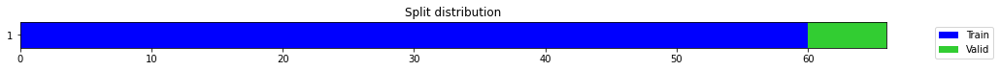

epoch,train_loss,valid_loss,mse,time
0,0.220061,0.305184,0.305184,00:00
1,0.209568,0.021836,0.021836,00:00
2,0.188909,0.052807,0.052807,00:00
3,0.195259,0.258219,0.258219,00:00
4,0.196782,0.000768,0.000768,00:00
5,0.185292,0.178031,0.178031,00:00
6,0.192665,0.082141,0.082141,00:00
7,0.182896,0.364433,0.364433,00:00
8,0.205456,0.131088,0.131088,00:00
9,0.197169,0.178818,0.178818,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.11691790819168091,
  "MSE_normalize": 0.013828786458707517,
  "RMSE_normalize": 0.11759586072097741,
  "MAPE_normalize": 0.12124407772440808,
  "MAE": 7541.672749996185,
  "MSE": 57538344.73991122,
  "RMSE": 7585.403399945926,
  "MAPE": 0.06401045203026921
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.8
2022-10-15 00:28:35.879662+07:00
PROGRESS: [ 1056 / 1944 ]


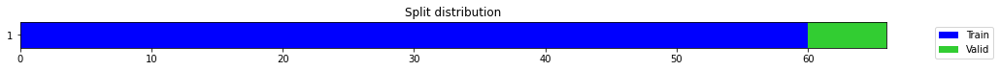

epoch,train_loss,valid_loss,mse,time
0,0.574802,0.969340,0.969340,00:00
1,0.445358,0.330481,0.330481,00:00
2,0.340764,0.022269,0.022269,00:00
3,0.301956,0.082870,0.082870,00:00
4,0.291808,0.251338,0.251338,00:00
5,0.279895,0.235745,0.235745,00:00
6,0.283352,0.077107,0.077107,00:00
7,0.262872,0.027917,0.027917,00:00
8,0.257672,0.000698,0.000698,00:00
9,0.251182,0.003767,0.003767,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 256,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.17854837576548258,
  "MSE_normalize": 0.03188753427688814,
  "RMSE_normalize": 0.1785708102599306,
  "MAPE_normalize": 0.18476339205226566,
  "MAE": 11517.084430376688,
  "MSE": 132676568.95331128,
  "RMSE": 11518.531545006563,
  "MAPE": 0.09764267004626859
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.9
2022-10-15 00:29:28.140057+07:00
PROGRESS: [ 1057 / 1944 ]


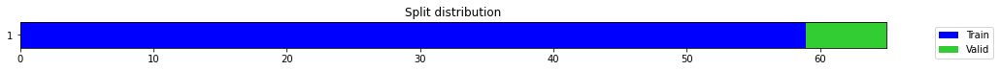

epoch,train_loss,valid_loss,mse,time
0,0.382623,0.068927,0.068927,00:00
1,0.303175,0.082260,0.082260,00:00
2,0.322298,3.484704,3.484704,00:00
3,0.300001,2.703036,2.703036,00:00
4,0.279210,3.187666,3.187666,00:00
5,0.256443,0.744989,0.744989,00:00
6,0.245850,0.132734,0.132734,00:00
7,0.230929,0.042199,0.042199,00:00
8,0.225972,0.006791,0.006791,00:00
9,0.216941,0.005864,0.005864,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.07552797595659892,
  "MSE_normalize": 0.005864226957450924,
  "RMSE_normalize": 0.07657824075709055,
  "MAPE_normalize": 0.07841488134314013,
  "MAE": 4871.856561104457,
  "MSE": 24399676.234672885,
  "RMSE": 4939.602841795369,
  "MAPE": 0.04137598692715779
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.9
2022-10-15 00:29:35.452215+07:00
PROGRESS: [ 1058 / 1944 ]


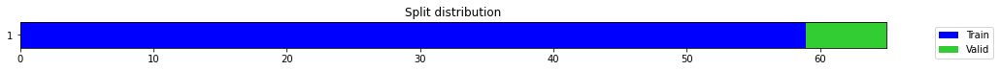

epoch,train_loss,valid_loss,mse,time
0,0.162466,0.149468,0.149468,00:00
1,0.145898,0.661821,0.661821,00:00
2,0.200250,0.188321,0.188321,00:00
3,0.226042,0.026695,0.026695,00:00
4,0.201575,3.228411,3.228411,00:00
5,0.238279,10.844016,10.844016,00:00
6,0.247339,0.062346,0.062346,00:00
7,0.227590,1.703205,1.703205,00:00
8,0.224820,3.420247,3.420247,00:00
9,0.230865,2.650217,2.650217,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18216770887374878,
  "MSE_normalize": 0.03319098952970734,
  "RMSE_normalize": 0.1821839442149262,
  "MAPE_normalize": 0.18846851372702686,
  "MAE": 11750.545893192291,
  "MSE": 138099941.2726181,
  "RMSE": 11751.593137639598,
  "MAPE": 0.09961077702848516
}
Percent CPU Usage: 100.0
Percent Ram Usage: 38.9
2022-10-15 00:29:49.980331+07:00
PROGRESS: [ 1059 / 1944 ]


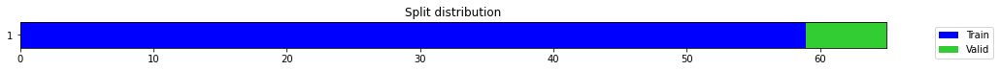

epoch,train_loss,valid_loss,mse,time
0,0.314439,0.023157,0.023157,00:00
1,0.262129,0.002397,0.002397,00:00
2,0.256830,0.017671,0.017671,00:00
3,0.246239,0.064360,0.064360,00:00
4,0.240981,0.057473,0.057473,00:00
5,0.224015,0.108982,0.108982,00:00
6,0.235471,1.681046,1.681046,00:00
7,0.243588,0.452069,0.452069,00:00
8,0.235795,0.052019,0.052019,00:00
9,0.231078,2.022521,2.022521,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.10214602947235107,
  "MSE_normalize": 0.010441722047380845,
  "RMSE_normalize": 0.10218474469009962,
  "MAPE_normalize": 0.10569748339027747,
  "MAE": 6588.827485084534,
  "MSE": 43445562.24326016,
  "RMSE": 6591.324771490186,
  "MAPE": 0.05585942851269218
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.0
2022-10-15 00:30:17.463579+07:00
PROGRESS: [ 1060 / 1944 ]


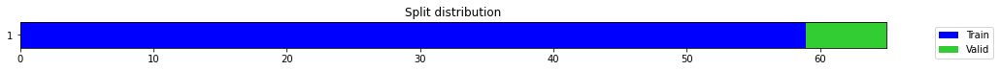

epoch,train_loss,valid_loss,mse,time
0,0.533001,0.364593,0.364593,00:00
1,0.446565,0.506909,0.506909,00:00
2,0.385460,0.103662,0.103662,00:00
3,0.324351,0.001703,0.001703,00:00
4,0.300656,0.198755,0.198755,00:00
5,0.313802,0.717314,0.717314,00:00
6,0.295022,0.854624,0.854624,00:00
7,0.288578,0.640832,0.640832,00:00
8,0.287438,2.561241,2.561241,00:00
9,0.264445,3.643060,3.643060,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.218245138724645,
  "MSE_normalize": 0.047655460603770315,
  "RMSE_normalize": 0.21830130692181005,
  "MAPE_normalize": 0.22587517738129861,
  "MAE": 14077.6844282945,
  "MSE": 198283220.95699438,
  "RMSE": 14081.307501684436,
  "MAPE": 0.1193609268559464
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:31:11.933071+07:00
PROGRESS: [ 1061 / 1944 ]


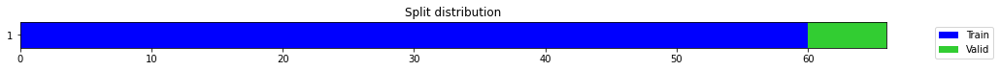

epoch,train_loss,valid_loss,mse,time
0,0.242192,0.195187,0.195187,00:00
1,0.313511,1.457545,1.457545,00:00
2,0.410008,0.168903,0.168903,00:00
3,0.386076,0.212389,0.212389,00:00
4,0.343414,0.179569,0.179569,00:00
5,0.326157,0.277105,0.277105,00:00
6,0.303998,0.027016,0.027016,00:00
7,0.278774,0.000538,0.000538,00:00
8,0.265129,0.047357,0.047357,00:00
9,0.262021,0.093319,0.093319,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.30522608757019043,
  "MSE_normalize": 0.09331884267271089,
  "RMSE_normalize": 0.30548132949938345,
  "MAPE_normalize": 0.31548542358746806,
  "MAE": 19688.303552627563,
  "MSE": 388277869.245066,
  "RMSE": 19704.767678028227,
  "MAPE": 0.16681708975213094
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:31:18.894459+07:00
PROGRESS: [ 1062 / 1944 ]


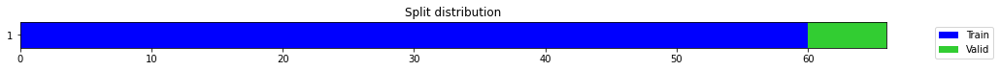

epoch,train_loss,valid_loss,mse,time
0,0.416307,0.450447,0.450447,00:00
1,0.324666,0.054040,0.054040,00:00
2,0.322764,0.035111,0.035111,00:00
3,0.291634,1.398467,1.398467,00:00
4,0.283197,1.409242,1.409242,00:00
5,0.272184,0.952030,0.952030,00:00
6,0.275785,4.120879,4.120879,00:00
7,0.285163,9.956407,9.956407,00:00
8,0.322105,0.892988,0.892988,00:00
9,0.329124,0.447398,0.447398,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.40350444118181866,
  "MSE_normalize": 0.16291246720465521,
  "RMSE_normalize": 0.4036241657837836,
  "MAPE_normalize": 0.4172131961125955,
  "MAE": 26027.65047399203,
  "MSE": 677840657.127844,
  "RMSE": 26035.37318971718,
  "MAPE": 0.22057022408001192
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:31:38.783489+07:00
PROGRESS: [ 1063 / 1944 ]


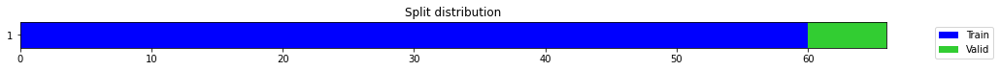

epoch,train_loss,valid_loss,mse,time
0,0.253704,0.373535,0.373535,00:00
1,0.266093,0.012264,0.012264,00:00
2,0.258769,0.182938,0.182938,00:00
3,0.260079,0.012069,0.012069,00:00
4,0.237841,0.205394,0.205394,00:00
5,0.236354,0.343034,0.343034,00:00
6,0.239156,1.146061,1.146061,00:00
7,0.241380,1.225316,1.225316,00:00
8,0.240664,0.004230,0.004230,00:00
9,0.236733,3.857846,3.857846,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.16308388113975525,
  "MSE_normalize": 0.026605523776554563,
  "RMSE_normalize": 0.16311199764748932,
  "MAPE_normalize": 0.1687669192704784,
  "MAE": 10519.562669038773,
  "MSE": 110699359.16736819,
  "RMSE": 10521.376296253651,
  "MAPE": 0.08918736738909104
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:32:17.129756+07:00
PROGRESS: [ 1064 / 1944 ]


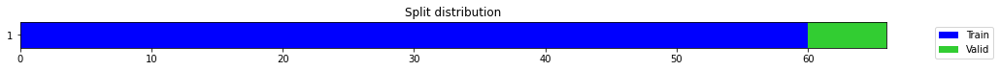

epoch,train_loss,valid_loss,mse,time
0,0.359901,0.090145,0.090145,00:00
1,0.268848,0.002158,0.002158,00:00
2,0.234424,0.020131,0.020131,00:00
3,0.233541,0.001728,0.001728,00:00
4,0.225716,0.007338,0.007338,00:00
5,0.229900,0.006631,0.006631,00:00
6,0.233666,0.341696,0.341696,00:00
7,0.220471,0.158463,0.158463,00:00
8,0.211198,0.294510,0.294510,00:00
9,0.209048,0.288290,0.288290,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.18219996492067972,
  "MSE_normalize": 0.03320031815841832,
  "RMSE_normalize": 0.18220954464137798,
  "MAPE_normalize": 0.18849674011833528,
  "MAE": 11752.626537243525,
  "MSE": 138138755.51393467,
  "RMSE": 11753.244467547447,
  "MAPE": 0.09962694844156343
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:33:31.251109+07:00
PROGRESS: [ 1065 / 1944 ]


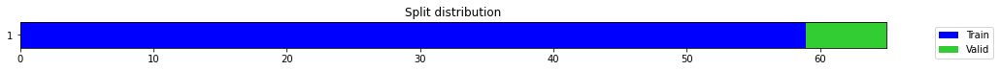

epoch,train_loss,valid_loss,mse,time
0,0.228747,0.277736,0.277736,00:00
1,0.292927,0.006009,0.006009,00:00
2,0.319491,5.582920,5.582920,00:00
3,0.335713,1.184104,1.184104,00:00
4,0.312549,1.639416,1.639416,00:00
5,0.292154,0.021237,0.021237,00:00
6,0.284610,0.235304,0.235304,00:00
7,0.259258,0.006413,0.006413,00:00
8,0.247893,0.018399,0.018399,00:00
9,0.240942,0.067296,0.067296,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2591663698355357,
  "MSE_normalize": 0.06729622320137156,
  "RMSE_normalize": 0.25941515607491317,
  "MAPE_normalize": 0.26785409170960256,
  "MAE": 16717.267519871395,
  "MSE": 280003838.50141746,
  "RMSE": 16733.315227456198,
  "MAPE": 0.14163706998425782
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.2
2022-10-15 00:33:37.862012+07:00
PROGRESS: [ 1066 / 1944 ]


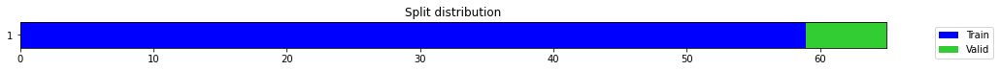

epoch,train_loss,valid_loss,mse,time
0,0.206023,0.210181,0.210181,00:01
1,0.211780,1.469575,1.469575,00:01
2,0.219910,0.499620,0.499620,00:01
3,0.232639,0.863983,0.863983,00:01
4,0.233102,3.004225,3.004225,00:01
5,0.226056,1.059402,1.059402,00:01
6,0.228748,0.246495,0.246495,00:01
7,0.229887,25.117142,25.117142,00:01
8,0.219014,0.000022,0.000022,00:01
9,0.237480,0.259199,0.259199,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.21413010358810425,
  "MSE_normalize": 0.04594474045547751,
  "RMSE_normalize": 0.21434724270556293,
  "MAPE_normalize": 0.22173478172027047,
  "MAE": 13812.248201847076,
  "MSE": 191165314.70109117,
  "RMSE": 13826.254543479632,
  "MAPE": 0.11714344354600666
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.3
2022-10-15 00:34:13.591916+07:00
PROGRESS: [ 1067 / 1944 ]


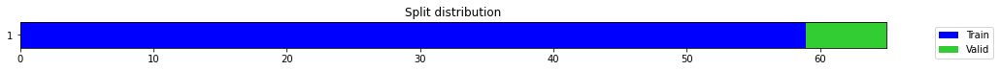

epoch,train_loss,valid_loss,mse,time
0,0.437245,0.357919,0.357919,00:01
1,0.467484,0.000697,0.000697,00:01
2,0.433208,0.357306,0.357306,00:01
3,0.371418,0.855165,0.855165,00:01
4,0.357065,0.920573,0.920573,00:01
5,0.351186,0.124804,0.124804,00:01
6,0.318658,0.598953,0.598953,00:01
7,0.316115,3.541539,3.541539,00:01
8,0.311341,0.226553,0.226553,00:01
9,0.292963,0.127706,0.127706,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11549187699953715,
  "MSE_normalize": 0.013373751120152969,
  "RMSE_normalize": 0.11564493555773625,
  "MAPE_normalize": 0.1196003768006289,
  "MAE": 7449.688033978145,
  "MSE": 55645049.16717441,
  "RMSE": 7459.560923216219,
  "MAPE": 0.06318368369273547
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.3
2022-10-15 00:35:20.525462+07:00
PROGRESS: [ 1068 / 1944 ]


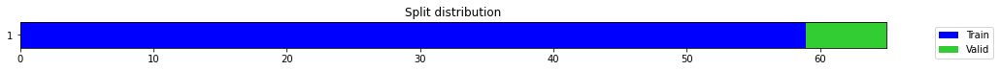

epoch,train_loss,valid_loss,mse,time
0,0.339672,0.213562,0.213562,00:01
1,0.315783,0.197254,0.197254,00:01
2,0.278158,0.441216,0.441216,00:01
3,0.252919,0.773527,0.773527,00:01
4,0.247430,0.931554,0.931554,00:01
5,0.228676,0.911338,0.911338,00:01
6,0.207414,0.447763,0.447763,00:01
7,0.198772,0.092890,0.092890,00:01
8,0.192046,0.049537,0.049537,00:01
9,0.185101,0.175119,0.175119,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.16444003582000732,
  "MSE_normalize": 0.027058972842696722,
  "RMSE_normalize": 0.16449611801710312,
  "MAPE_normalize": 0.17003226579090294,
  "MAE": 10607.040070533752,
  "MSE": 112586054.63175942,
  "RMSE": 10610.65759657522,
  "MAPE": 0.08989048057998804
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.3
2022-10-15 00:37:33.225281+07:00
PROGRESS: [ 1069 / 1944 ]


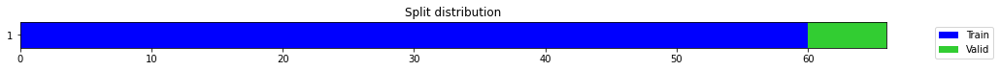

epoch,train_loss,valid_loss,mse,time
0,0.409365,0.051183,0.051183,00:01
1,0.323768,1.162273,1.162273,00:01
2,0.377235,0.271069,0.271069,00:01
3,0.405048,11.777709,11.777709,00:01
4,0.374024,0.047013,0.047013,00:01
5,0.357251,1.977095,1.977095,00:01
6,0.328369,1.304924,1.304924,00:01
7,0.324102,0.108587,0.108587,00:01
8,0.311940,0.420475,0.420475,00:01
9,0.293753,0.418455,0.418455,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.6465970724821091,
  "MSE_normalize": 0.4184552852606826,
  "RMSE_normalize": 0.6468811987225186,
  "MAPE_normalize": 0.6684821582959003,
  "MAE": 41708.09756338596,
  "MSE": 1741094530.1282337,
  "RMSE": 41726.42484239734,
  "MAPE": 0.3534306129723905
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.3
2022-10-15 00:37:47.714436+07:00
PROGRESS: [ 1070 / 1944 ]


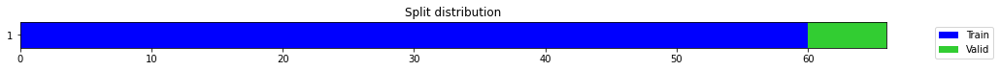

epoch,train_loss,valid_loss,mse,time
0,0.276043,0.010177,0.010177,00:01
1,0.231665,0.083744,0.083744,00:01
2,0.222883,0.003498,0.003498,00:01
3,0.209505,0.201091,0.201091,00:01
4,0.195960,0.012701,0.012701,00:01
5,0.205945,4.051992,4.051992,00:01
6,0.214227,13.150230,13.150230,00:01
7,0.217470,0.724740,0.724740,00:01
8,0.229998,3.233048,3.233048,00:01
9,0.217173,0.956366,0.956366,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.13256694873174033,
  "MSE_normalize": 0.018007107352020785,
  "RMSE_normalize": 0.1341905635729308,
  "MAPE_normalize": 0.13666448654338328,
  "MAE": 8551.098460992178,
  "MSE": 74923360.31675184,
  "RMSE": 8655.82811270833,
  "MAPE": 0.07235250790763723
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.5
2022-10-15 00:38:20.274114+07:00
PROGRESS: [ 1071 / 1944 ]


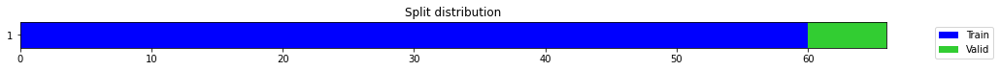

epoch,train_loss,valid_loss,mse,time
0,0.929106,0.243056,0.243056,00:01
1,0.625501,0.194210,0.194210,00:01
2,0.465867,1.503761,1.503761,00:01
3,0.457267,1.018612,1.018612,00:01
4,0.422083,0.202238,0.202238,00:01
5,0.392897,0.267027,0.267027,00:01
6,0.368761,0.175630,0.175630,00:01
7,0.336215,1.717228,1.717228,00:01
8,0.325433,0.198626,0.198626,00:01
9,0.302454,0.659768,0.659768,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.24789191285769144,
  "MSE_normalize": 0.061588297275687744,
  "RMSE_normalize": 0.24816989599000067,
  "MAPE_normalize": 0.2567192416623801,
  "MAE": 15990.019946972528,
  "MSE": 256254494.28798696,
  "RMSE": 16007.950970939002,
  "MAPE": 0.13562000399527144
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.5
2022-10-15 00:39:21.383020+07:00
PROGRESS: [ 1072 / 1944 ]


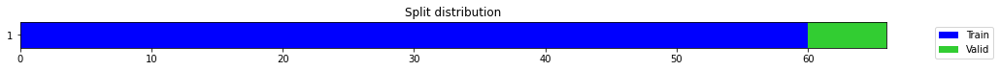

epoch,train_loss,valid_loss,mse,time
0,0.295404,0.097496,0.097496,00:01
1,0.273617,0.010776,0.010776,00:01
2,0.254179,0.009537,0.009537,00:01
3,0.233720,0.325705,0.325705,00:01
4,0.245048,0.361354,0.361354,00:01
5,0.241370,0.003911,0.003911,00:01
6,0.227134,0.017447,0.017447,00:01
7,0.231741,0.898003,0.898003,00:01
8,0.221267,0.550817,0.550817,00:01
9,0.216073,0.682338,0.682338,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.28309523065884906,
  "MSE_normalize": 0.08014726255271103,
  "RMSE_normalize": 0.28310291865805803,
  "MAPE_normalize": 0.29284650182355815,
  "MAE": 18260.7747584184,
  "MSE": 333474006.3047494,
  "RMSE": 18261.270665119377,
  "MAPE": 0.1547874228239077
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.5
2022-10-15 00:41:16.122362+07:00
PROGRESS: [ 1073 / 1944 ]


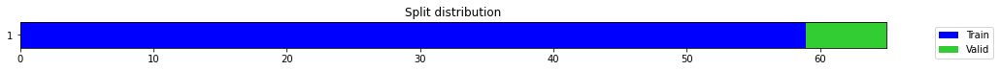

epoch,train_loss,valid_loss,mse,time
0,0.333760,1.404661,1.404661,00:01
1,0.279426,0.177519,0.177519,00:01
2,0.233285,0.000592,0.000592,00:01
3,0.244161,2.106040,2.106040,00:01
4,0.243003,0.053210,0.053210,00:01
5,0.219115,10.537850,10.537850,00:01
6,0.228076,0.500635,0.500635,00:01
7,0.213637,0.459131,0.459131,00:01
8,0.211486,0.394691,0.394691,00:01
9,0.198126,0.361266,0.361266,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.6006265083948771,
  "MSE_normalize": 0.3612658849002009,
  "RMSE_normalize": 0.6010539783581845,
  "MAPE_normalize": 0.6208422872854195,
  "MAE": 38742.81229750315,
  "MSE": 1503142816.6329234,
  "RMSE": 38770.38582001633,
  "MAPE": 0.32827133455894025
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.5
2022-10-15 00:41:28.433785+07:00
PROGRESS: [ 1074 / 1944 ]


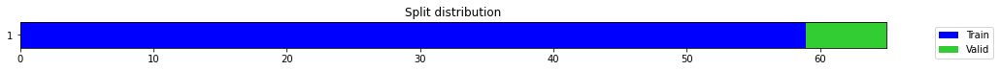

epoch,train_loss,valid_loss,mse,time
0,0.213269,0.456424,0.456424,00:00
1,0.286771,0.203938,0.203938,00:00
2,0.256301,0.019703,0.019703,00:00
3,0.226596,1.021579,1.021579,00:00
4,0.211893,1.317542,1.317542,00:00
5,0.216789,6.205799,6.205799,00:00
6,0.227534,0.012014,0.012014,00:00
7,0.226087,3.420575,3.420575,00:00
8,0.231496,7.705409,7.705409,00:00
9,0.225288,0.584605,0.584605,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.06485846638679504,
  "MSE_normalize": 0.004547494167965145,
  "RMSE_normalize": 0.06743511079523148,
  "MAPE_normalize": 0.06751790054480515,
  "MAE": 4183.6305158138275,
  "MSE": 18921059.192027573,
  "RMSE": 4349.834386735612,
  "MAPE": 0.03558137036740804
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.5
2022-10-15 00:41:53.626480+07:00
PROGRESS: [ 1075 / 1944 ]


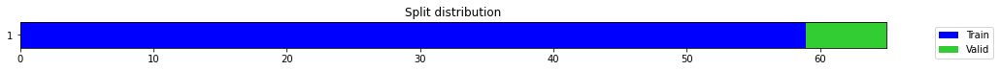

epoch,train_loss,valid_loss,mse,time
0,0.418121,0.068897,0.068897,00:00
1,0.412210,0.004282,0.004282,00:00
2,0.342913,0.061022,0.061022,00:00
3,0.287992,0.268363,0.268363,00:00
4,0.274902,0.420400,0.420400,00:00
5,0.269668,0.537410,0.537410,00:00
6,0.273310,1.371160,1.371160,00:00
7,0.273221,3.670930,3.670930,00:00
8,0.265351,3.461434,3.461434,00:00
9,0.268186,2.504367,2.504367,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.19543800751368204,
  "MSE_normalize": 0.03820682458364999,
  "RMSE_normalize": 0.19546566088100997,
  "MAPE_normalize": 0.20223476965444775,
  "MAE": 12606.533236662546,
  "MSE": 158969657.30692425,
  "RMSE": 12608.316989468667,
  "MAPE": 0.10687739564347415
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.7
2022-10-15 00:42:39.399302+07:00
PROGRESS: [ 1076 / 1944 ]


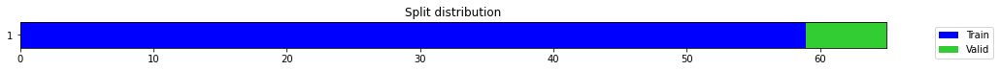

epoch,train_loss,valid_loss,mse,time
0,0.465536,0.007257,0.007257,00:00
1,0.420573,0.013184,0.013184,00:00
2,0.369415,0.002890,0.002890,00:00
3,0.325040,0.033075,0.033075,00:00
4,0.285488,0.055285,0.055285,00:00
5,0.271466,0.038066,0.038066,00:00
6,0.262803,0.046351,0.046351,00:00
7,0.248987,0.186579,0.186579,00:00
8,0.245314,0.222034,0.222034,00:00
9,0.233701,1.012011,1.012011,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.17308417956034342,
  "MSE_normalize": 0.029966350892992228,
  "RMSE_normalize": 0.17310791689865668,
  "MAPE_normalize": 0.17902137439435473,
  "MAE": 11164.621918360392,
  "MSE": 124682974.41909331,
  "RMSE": 11166.15307163095,
  "MAPE": 0.0946300014025382
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.8
2022-10-15 00:44:01.650343+07:00
PROGRESS: [ 1077 / 1944 ]


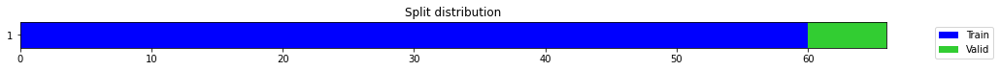

epoch,train_loss,valid_loss,mse,time
0,0.670923,0.008214,0.008214,00:00
1,0.477008,3.058522,3.058522,00:00
2,0.519790,0.456881,0.456881,00:00
3,0.469885,0.018892,0.018892,00:00
4,0.414131,0.406133,0.406133,00:00
5,0.386351,0.627943,0.627943,00:00
6,0.355554,0.523635,0.523635,00:00
7,0.325261,0.021220,0.021220,00:00
8,0.300721,0.046688,0.046688,00:00
9,0.284227,0.068417,0.068417,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.26135440667470294,
  "MSE_normalize": 0.06841652119648838,
  "RMSE_normalize": 0.261565519892222,
  "MAPE_normalize": 0.27014085169294244,
  "MAE": 16858.40464814504,
  "MSE": 284665136.32729244,
  "RMSE": 16872.022295127885,
  "MAPE": 0.14284005036170347
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.9
2022-10-15 00:44:11.676462+07:00
PROGRESS: [ 1078 / 1944 ]


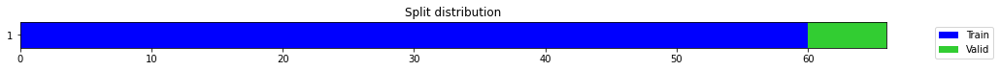

epoch,train_loss,valid_loss,mse,time
0,0.234338,0.005230,0.005230,00:00
1,0.216454,0.000739,0.000739,00:00
2,0.225675,1.025373,1.025373,00:00
3,0.254287,0.730677,0.730677,00:00
4,0.268937,0.000804,0.000804,00:00
5,0.270852,1.277493,1.277493,00:00
6,0.277688,0.023570,0.023570,00:00
7,0.283450,3.114417,3.114417,00:01
8,0.256508,1.142589,1.142589,00:00
9,0.243907,0.005052,0.005052,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.44988493124643963,
  "MSE_normalize": 0.20248255388753714,
  "RMSE_normalize": 0.449980615013066,
  "MAPE_normalize": 0.4652074105607921,
  "MAE": 29019.377605120342,
  "MSE": 842482529.0481533,
  "RMSE": 29025.549590802813,
  "MAPE": 0.24593413539591735
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.9
2022-10-15 00:44:35.675699+07:00
PROGRESS: [ 1079 / 1944 ]


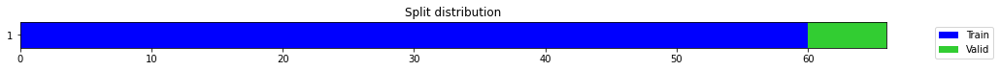

epoch,train_loss,valid_loss,mse,time
0,0.217743,0.354705,0.354705,00:00
1,0.185525,0.004141,0.004141,00:00
2,0.170225,0.002028,0.002028,00:00
3,0.167518,0.030458,0.030458,00:00
4,0.179309,0.545126,0.545126,00:00
5,0.204218,2.499493,2.499493,00:00
6,0.219576,1.960934,1.960934,00:01
7,0.234700,2.726313,2.726313,00:00
8,0.223306,0.019765,0.019765,00:00
9,0.222759,5.193612,5.193612,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.0972528060277303,
  "MSE_normalize": 0.010008128428026453,
  "RMSE_normalize": 0.1000406338845694,
  "MAPE_normalize": 0.10115126181688715,
  "MAE": 6273.195000012715,
  "MSE": 41641480.64709597,
  "RMSE": 6453.021048090264,
  "MAPE": 0.053328029161224144
}
Percent CPU Usage: 100.0
Percent Ram Usage: 39.9
2022-10-15 00:45:21.117813+07:00
PROGRESS: [ 1080 / 1944 ]


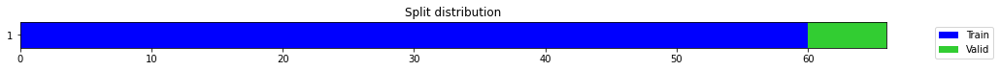

epoch,train_loss,valid_loss,mse,time
0,0.557378,0.165415,0.165415,00:01
1,0.366736,0.032678,0.032678,00:01
2,0.326719,0.263889,0.263889,00:01
3,0.291159,0.350545,0.350545,00:01
4,0.286055,0.141394,0.141394,00:01
5,0.286743,0.122315,0.122315,00:01
6,0.262025,0.001465,0.001465,00:01
7,0.257605,0.047974,0.047974,00:01
8,0.253642,0.211166,0.211166,00:01
9,0.252723,0.041160,0.041160,00:01


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.2,
  "fc_dropout": 0.4,
  "d_model": 512,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.04344008366266886,
  "MSE_normalize": 0.0018923524040215984,
  "RMSE_normalize": 0.04350117704179507,
  "MAPE_normalize": 0.044913184228318824,
  "MAE": 2802.0591565767922,
  "MSE": 7873635.572948969,
  "RMSE": 2805.9999239039494,
  "MAPE": 0.023745120984230584
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:00.376686+07:00
PROGRESS: [ 1081 / 1944 ]


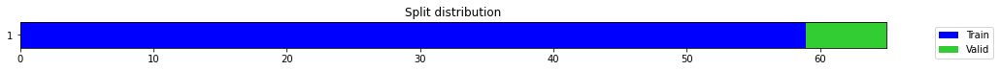

epoch,train_loss,valid_loss,mse,time
0,0.282259,0.939399,0.939399,00:00
1,0.263220,0.004174,0.004174,00:00
2,0.221089,0.001350,0.001350,00:00
3,0.199030,0.047940,0.047940,00:00
4,0.192672,0.000752,0.000752,00:00
5,0.171124,0.000539,0.000539,00:00
6,0.161340,0.061124,0.061124,00:00
7,0.151207,0.124768,0.124768,00:00
8,0.144100,0.163749,0.163749,00:00
9,0.136518,0.175062,0.175062,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.41839419802029926,
  "MSE_normalize": 0.17506168310763628,
  "RMSE_normalize": 0.4184037321865524,
  "MAPE_normalize": 0.4328365282975471,
  "MAE": 26988.099349101383,
  "MSE": 728390701.7780143,
  "RMSE": 26988.71434096138,
  "MAPE": 0.2287732571844491
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:02.515164+07:00
PROGRESS: [ 1082 / 1944 ]


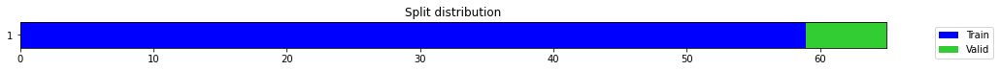

epoch,train_loss,valid_loss,mse,time
0,0.397357,0.573228,0.573228,00:00
1,0.288021,0.032906,0.032906,00:00
2,0.242829,0.098613,0.098613,00:00
3,0.205005,0.103992,0.103992,00:00
4,0.186112,0.008418,0.008418,00:00
5,0.163779,0.033331,0.033331,00:00
6,0.152017,0.167490,0.167490,00:00
7,0.139978,0.272458,0.272458,00:00
8,0.135499,0.642298,0.642298,00:00
9,0.130162,0.186083,0.186083,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.2378257711728414,
  "MSE_normalize": 0.056709086430871025,
  "RMSE_normalize": 0.2381366969428925,
  "MAPE_normalize": 0.2463060826370389,
  "MAE": 15340.713543732962,
  "MSE": 235953239.61997488,
  "RMSE": 15360.769499604337,
  "MAPE": 0.1301160741147671
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:07.292534+07:00
PROGRESS: [ 1083 / 1944 ]


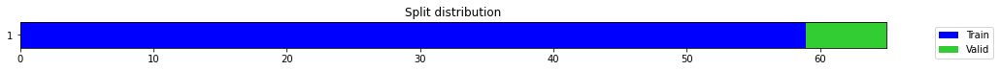

epoch,train_loss,valid_loss,mse,time
0,0.203946,1.228689,1.228689,00:00
1,0.219508,0.802270,0.802270,00:00
2,0.213917,0.363956,0.363956,00:00
3,0.185927,0.071328,0.071328,00:00
4,0.169013,0.002693,0.002693,00:00
5,0.163583,0.006014,0.006014,00:00
6,0.170878,0.100319,0.100319,00:00
7,0.157276,0.379073,0.379073,00:00
8,0.154445,0.531264,0.531264,00:00
9,0.145190,0.205023,0.205023,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.4037514626979828,
  "MSE_normalize": 0.16319197689749684,
  "RMSE_normalize": 0.40397026734339847,
  "MAPE_normalize": 0.4173858573721057,
  "MAE": 26043.58434987068,
  "MSE": 679003631.5589619,
  "RMSE": 26057.698124718572,
  "MAPE": 0.2206822130726641
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:16.599077+07:00
PROGRESS: [ 1084 / 1944 ]


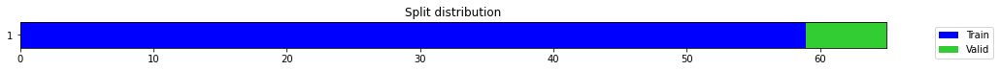

epoch,train_loss,valid_loss,mse,time
0,0.259178,0.268570,0.268570,00:00
1,0.208136,0.222687,0.222687,00:00
2,0.196690,0.182185,0.182185,00:00
3,0.188760,0.115851,0.115851,00:00
4,0.174515,0.058630,0.058630,00:00
5,0.168607,0.027609,0.027609,00:00
6,0.163385,0.021728,0.021728,00:00
7,0.158748,0.046727,0.046727,00:00
8,0.147860,0.120822,0.120822,00:00
9,0.140274,0.225331,0.225331,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.36461108922958374,
  "MSE_normalize": 0.13298697486634836,
  "RMSE_normalize": 0.3646737924040448,
  "MAPE_normalize": 0.3770525317155897,
  "MAE": 23518.87369966507,
  "MSE": 553327685.5945483,
  "RMSE": 23522.918305230505,
  "MAPE": 0.19932487872196716
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:34.788386+07:00
PROGRESS: [ 1085 / 1944 ]


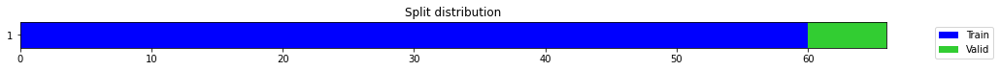

epoch,train_loss,valid_loss,mse,time
0,0.271209,0.431558,0.431558,00:00
1,0.189834,0.111840,0.111840,00:00
2,0.176955,0.049445,0.049445,00:00
3,0.166376,0.215499,0.215499,00:00
4,0.148916,0.184773,0.184773,00:00
5,0.143528,0.358027,0.358027,00:00
6,0.133791,0.328865,0.328865,00:00
7,0.128378,0.305746,0.305746,00:00
8,0.119013,0.269555,0.269555,00:00
9,0.115988,0.254275,0.254275,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.5041995197534561,
  "MSE_normalize": 0.25427510986877894,
  "RMSE_normalize": 0.5042569879226058,
  "MAPE_normalize": 0.5214385008033368,
  "MAE": 32522.885822176933,
  "MSE": 1057979235.8566815,
  "RMSE": 32526.592748959756,
  "MAPE": 0.27564435167458395
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:37.072275+07:00
PROGRESS: [ 1086 / 1944 ]


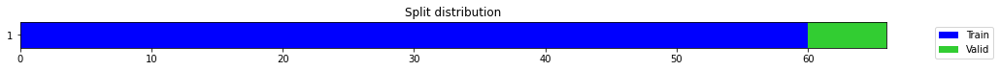

epoch,train_loss,valid_loss,mse,time
0,0.253736,0.288565,0.288565,00:00
1,0.202743,0.128856,0.128856,00:00
2,0.172266,0.005528,0.005528,00:00
3,0.160203,0.018738,0.018738,00:00
4,0.161617,0.006349,0.006349,00:00
5,0.150544,0.045161,0.045161,00:00
6,0.143101,0.028272,0.028272,00:00
7,0.136737,0.057086,0.057086,00:00
8,0.128653,0.152681,0.152681,00:00
9,0.123159,0.020802,0.020802,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.14251787463823953,
  "MSE_normalize": 0.020336193150714738,
  "RMSE_normalize": 0.14260502498409633,
  "MAPE_normalize": 0.14754308303322172,
  "MAE": 9192.972985665003,
  "MSE": 84614141.35630585,
  "RMSE": 9198.59453157415,
  "MAPE": 0.0779566022573101
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:42.442281+07:00
PROGRESS: [ 1087 / 1944 ]


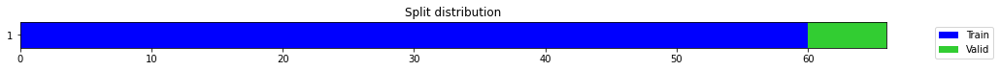

epoch,train_loss,valid_loss,mse,time
0,0.494325,0.695466,0.695466,00:00
1,0.425619,0.504357,0.504357,00:00
2,0.369238,0.254447,0.254447,00:00
3,0.329440,0.056772,0.056772,00:00
4,0.283799,0.003391,0.003391,00:00
5,0.257066,0.190816,0.190816,00:00
6,0.256848,0.250767,0.250767,00:00
7,0.241457,0.001680,0.001680,00:00
8,0.221889,0.228683,0.228683,00:00
9,0.205026,0.404393,0.404393,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3375096221764882,
  "MSE_normalize": 0.11397049905170971,
  "RMSE_normalize": 0.3375951703619436,
  "MAPE_normalize": 0.34899259101607677,
  "MAE": 21770.720668872196,
  "MSE": 474204579.280914,
  "RMSE": 21776.23886902681,
  "MAPE": 0.18449971854687466
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:48:52.524962+07:00
PROGRESS: [ 1088 / 1944 ]


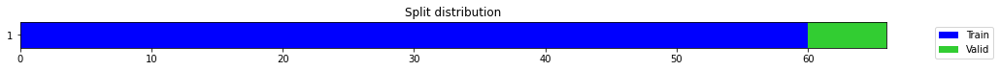

epoch,train_loss,valid_loss,mse,time
0,0.248721,0.466316,0.466316,00:00
1,0.200124,0.356521,0.356521,00:00
2,0.197439,0.196980,0.196980,00:00
3,0.183732,0.055142,0.055142,00:00
4,0.163992,0.001746,0.001746,00:00
5,0.149943,0.058643,0.058643,00:00
6,0.142095,0.118358,0.118358,00:00
7,0.144771,0.034725,0.034725,00:00
8,0.138834,0.004761,0.004761,00:00
9,0.141036,0.068211,0.068211,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3319386641184489,
  "MSE_normalize": 0.11025291342968302,
  "RMSE_normalize": 0.332043541466602,
  "MAPE_normalize": 0.34320875471300133,
  "MAE": 21411.37159029643,
  "MSE": 458736575.36321515,
  "RMSE": 21418.136598761695,
  "MAPE": 0.18144779186204052
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:12.579906+07:00
PROGRESS: [ 1089 / 1944 ]


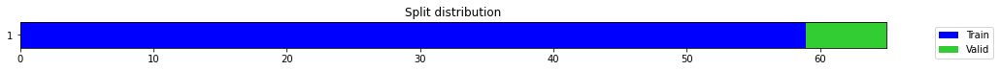

epoch,train_loss,valid_loss,mse,time
0,0.384103,0.197256,0.197256,00:00
1,0.259022,0.393239,0.393239,00:00
2,0.204853,0.051147,0.051147,00:00
3,0.186310,0.742515,0.742515,00:00
4,0.184168,0.501635,0.501635,00:00
5,0.166380,0.196631,0.196631,00:00
6,0.156525,0.302179,0.302179,00:00
7,0.150689,0.418782,0.418782,00:00
8,0.143176,0.393131,0.393131,00:00
9,0.132367,0.335159,0.335159,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.5781272699435552,
  "MSE_normalize": 0.3351586320193296,
  "RMSE_normalize": 0.578928866113385,
  "MAPE_normalize": 0.5973816506805837,
  "MAE": 37291.52142043909,
  "MSE": 1394516646.075076,
  "RMSE": 37343.227579777784,
  "MAPE": 0.31591737213001364
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:14.857347+07:00
PROGRESS: [ 1090 / 1944 ]


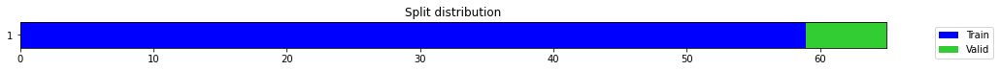

epoch,train_loss,valid_loss,mse,time
0,0.146150,0.344806,0.344806,00:00
1,0.132914,0.484097,0.484097,00:00
2,0.147426,0.633698,0.633698,00:00
3,0.146520,0.000671,0.000671,00:00
4,0.129437,0.357207,0.357207,00:00
5,0.126915,0.017898,0.017898,00:00
6,0.125798,0.116070,0.116070,00:00
7,0.117268,0.960950,0.960950,00:00
8,0.114755,0.167187,0.167187,00:00
9,0.108279,0.042400,0.042400,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.28724993268648785,
  "MSE_normalize": 0.08262991496741456,
  "RMSE_normalize": 0.28745419629466984,
  "MAPE_normalize": 0.296920406422509,
  "MAE": 18528.769658009212,
  "MSE": 343803742.1013883,
  "RMSE": 18541.94547779138,
  "MAPE": 0.1569965583518841
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:20.132626+07:00
PROGRESS: [ 1091 / 1944 ]


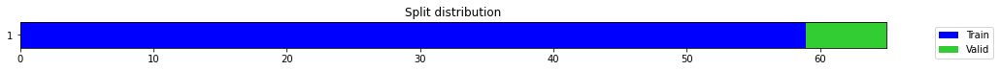

epoch,train_loss,valid_loss,mse,time
0,0.479738,0.494568,0.494568,00:00
1,0.407921,0.352692,0.352692,00:00
2,0.398535,0.162776,0.162776,00:00
3,0.359439,0.015578,0.015578,00:00
4,0.314884,0.000561,0.000561,00:00
5,0.270374,0.003172,0.003172,00:00
6,0.239489,0.001989,0.001989,00:00
7,0.226000,0.003067,0.003067,00:00
8,0.210052,0.000650,0.000650,00:00
9,0.198014,0.055839,0.055839,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.11274003982543945,
  "MSE_normalize": 0.012717881781460013,
  "RMSE_normalize": 0.11277358636427243,
  "MAPE_normalize": 0.11659978158470297,
  "MAE": 7272.1835289001465,
  "MSE": 52916130.311804354,
  "RMSE": 7274.347414841029,
  "MAPE": 0.061636092653864945
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:30.210674+07:00
PROGRESS: [ 1092 / 1944 ]


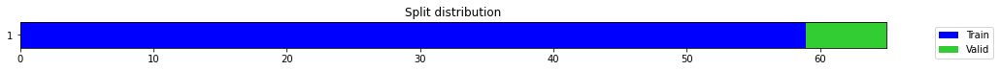

epoch,train_loss,valid_loss,mse,time
0,0.591697,0.651842,0.651842,00:00
1,0.658396,0.435284,0.435284,00:00
2,0.623938,0.252385,0.252385,00:00
3,0.581978,0.121719,0.121719,00:00
4,0.556396,0.037506,0.037506,00:00
5,0.531214,0.002287,0.002287,00:00
6,0.484777,0.006750,0.006750,00:00
7,0.441671,0.010623,0.010623,00:00
8,0.406430,0.000631,0.000631,00:00
9,0.366541,0.011479,0.011479,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.28728044033050537,
  "MSE_normalize": 0.08255309103381119,
  "RMSE_normalize": 0.2873205370902177,
  "MAPE_normalize": 0.2971050684013612,
  "MAE": 18530.73752307892,
  "MSE": 343484095.68923587,
  "RMSE": 18533.323924467404,
  "MAPE": 0.15705600489055113
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:50.031792+07:00
PROGRESS: [ 1093 / 1944 ]


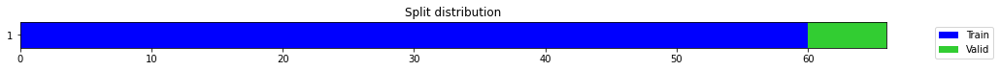

epoch,train_loss,valid_loss,mse,time
0,0.236487,0.110844,0.110844,00:00
1,0.185900,0.253206,0.253206,00:00
2,0.163682,0.003317,0.003317,00:00
3,0.148674,0.322089,0.322089,00:00
4,0.141315,0.417000,0.417000,00:00
5,0.137288,0.373047,0.373047,00:00
6,0.131303,0.304454,0.304454,00:00
7,0.126215,0.167377,0.167377,00:00
8,0.125555,0.109157,0.109157,00:00
9,0.119182,0.101754,0.101754,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.31891820828119916,
  "MSE_normalize": 0.10175365635612366,
  "RMSE_normalize": 0.31898848937872926,
  "MAPE_normalize": 0.3298375567759483,
  "MAE": 20571.50010697047,
  "MSE": 423373155.3703017,
  "RMSE": 20576.03351888555,
  "MAPE": 0.17435610602013765
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:52.514342+07:00
PROGRESS: [ 1094 / 1944 ]


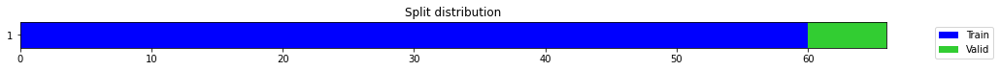

epoch,train_loss,valid_loss,mse,time
0,0.520396,0.609434,0.609434,00:00
1,0.434025,0.246264,0.246264,00:00
2,0.340738,0.001632,0.001632,00:00
3,0.273412,0.380992,0.380992,00:00
4,0.262480,0.591731,0.591731,00:00
5,0.261179,0.223276,0.223276,00:00
6,0.238053,0.949706,0.949706,00:00
7,0.217633,0.391952,0.391952,00:00
8,0.195270,0.152696,0.152696,00:00
9,0.182917,0.268326,0.268326,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.36831506093343097,
  "MSE_normalize": 0.1357491211185445,
  "RMSE_normalize": 0.3684414758391684,
  "MAPE_normalize": 0.38081858858579637,
  "MAE": 23757.79469045003,
  "MSE": 564820329.8519078,
  "RMSE": 23765.948957529716,
  "MAPE": 0.20133182163082938
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:49:58.400825+07:00
PROGRESS: [ 1095 / 1944 ]


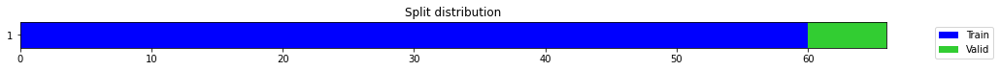

epoch,train_loss,valid_loss,mse,time
0,0.191406,1.780791,1.780791,00:00
1,0.204263,1.055872,1.055872,00:00
2,0.184054,0.338736,0.338736,00:00
3,0.161709,0.001268,0.001268,00:00
4,0.160308,0.016728,0.016728,00:00
5,0.148588,0.000678,0.000678,00:00
6,0.142663,0.072546,0.072546,00:00
7,0.133639,0.310820,0.310820,00:00
8,0.134835,0.473456,0.473456,00:00
9,0.133288,0.099604,0.099604,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.22585690021514893,
  "MSE_normalize": 0.051017939950070236,
  "RMSE_normalize": 0.2258715120374197,
  "MAPE_normalize": 0.23368669773592451,
  "MAE": 14568.673491477966,
  "MSE": 212273710.750581,
  "RMSE": 14569.616012461722,
  "MAPE": 0.1235053524149317
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:50:10.289973+07:00
PROGRESS: [ 1096 / 1944 ]


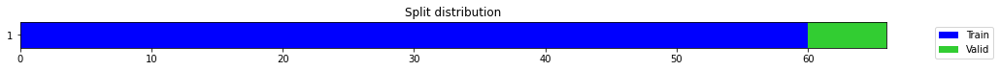

epoch,train_loss,valid_loss,mse,time
0,0.200673,0.022842,0.022842,00:00
1,0.179959,0.019945,0.019945,00:00
2,0.162908,0.008304,0.008304,00:00
3,0.145433,0.002100,0.002100,00:00
4,0.135678,0.001562,0.001562,00:00
5,0.129200,0.001448,0.001448,00:00
6,0.122820,0.001176,0.001176,00:00
7,0.116953,0.007322,0.007322,00:00
8,0.114248,0.055606,0.055606,00:00
9,0.108697,0.154844,0.154844,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 512,
  "n_steps": 5,
  "MAE_normalize": 0.2218816081682841,
  "MSE_normalize": 0.04932273606923351,
  "RMSE_normalize": 0.2220872262630913,
  "MAPE_normalize": 0.22975799416853446,
  "MAE": 14312.251253286997,
  "MSE": 205220364.05300418,
  "RMSE": 14325.51444287444,
  "MAPE": 0.1213830897675885
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:50:33.780931+07:00
PROGRESS: [ 1097 / 1944 ]


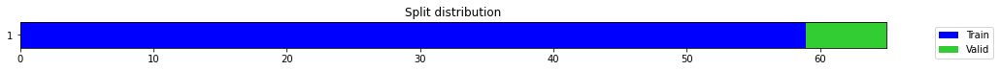

epoch,train_loss,valid_loss,mse,time
0,0.385826,0.189795,0.189795,00:00
1,0.303712,0.226203,0.226203,00:00
2,0.241082,0.003402,0.003402,00:00
3,0.197515,0.131582,0.131582,00:00
4,0.188493,0.476356,0.476356,00:00
5,0.167017,1.101812,1.101812,00:00
6,0.153658,1.410931,1.410931,00:00
7,0.144017,0.990228,0.990228,00:00
8,0.133567,0.690688,0.690688,00:00
9,0.123960,0.555644,0.555644,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.7439251393079758,
  "MSE_normalize": 0.5556439241626481,
  "RMSE_normalize": 0.7454152696065784,
  "MAPE_normalize": 0.7685166653920626,
  "MAE": 47986.14718592167,
  "MSE": 2311904356.6528277,
  "RMSE": 48082.26655070274,
  "MAPE": 0.4064659344133062
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:50:36.501608+07:00
PROGRESS: [ 1098 / 1944 ]


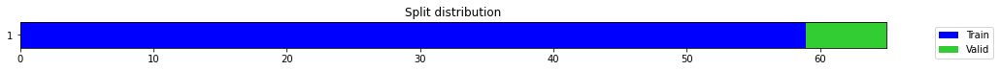

epoch,train_loss,valid_loss,mse,time
0,0.317870,0.758770,0.758770,00:00
1,0.266919,0.253883,0.253883,00:00
2,0.242168,0.007677,0.007677,00:00
3,0.219886,0.012459,0.012459,00:00
4,0.188673,0.529410,0.529410,00:00
5,0.179888,0.298061,0.298061,00:00
6,0.167555,0.147039,0.147039,00:00
7,0.154593,0.301087,0.301087,00:00
8,0.149927,0.165333,0.165333,00:00
9,0.142232,0.018021,0.018021,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.009653588136037191,
  "MSE_normalize": 0.0001419377244810486,
  "RMSE_normalize": 0.011913761978529225,
  "MAPE_normalize": 0.010112774592297601,
  "MAE": 622.695049126943,
  "MSE": 590569.6604091184,
  "RMSE": 768.4853026630492,
  "MAPE": 0.005313522507063246
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.1
2022-10-15 00:50:42.864950+07:00
PROGRESS: [ 1099 / 1944 ]


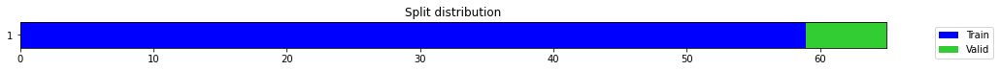

epoch,train_loss,valid_loss,mse,time
0,0.414008,0.241046,0.241046,00:00
1,0.412415,0.108180,0.108180,00:00
2,0.366435,0.033713,0.033713,00:00
3,0.337248,0.001247,0.001247,00:00
4,0.292845,0.012498,0.012498,00:00
5,0.263571,0.136435,0.136435,00:00
6,0.235850,0.294418,0.294418,00:00
7,0.216709,0.183672,0.183672,00:00
8,0.203472,0.015222,0.015222,00:00
9,0.188624,0.297340,0.297340,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.38852690656979877,
  "MSE_normalize": 0.1509961639534764,
  "RMSE_normalize": 0.3885822486340265,
  "MAPE_normalize": 0.40180230804545825,
  "MAE": 25061.5395813783,
  "MSE": 628259707.5239888,
  "RMSE": 25065.109365889246,
  "MAPE": 0.21240418729535152
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.3
2022-10-15 00:50:55.668339+07:00
PROGRESS: [ 1100 / 1944 ]


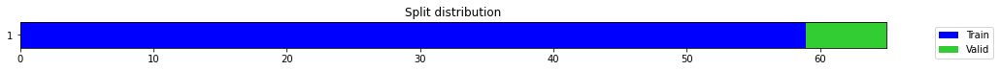

epoch,train_loss,valid_loss,mse,time
0,0.351751,0.564910,0.564910,00:00
1,0.346179,0.354416,0.354416,00:00
2,0.374467,0.227330,0.227330,00:00
3,0.349512,0.131568,0.131568,00:00
4,0.342912,0.085745,0.085745,00:00
5,0.322052,0.087493,0.087493,00:00
6,0.295795,0.121510,0.121510,00:00
7,0.266428,0.185485,0.185485,00:00
8,0.247758,0.323254,0.323254,00:00
9,0.230357,0.632456,0.632456,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.35190924008687335,
  "MSE_normalize": 0.12386659418213124,
  "RMSE_normalize": 0.35194686272522907,
  "MAPE_normalize": 0.3639544626804454,
  "MAE": 22699.55362256368,
  "MSE": 515379915.5906749,
  "RMSE": 22701.980433228175,
  "MAPE": 0.19239147023103306
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.4
2022-10-15 00:51:20.073278+07:00
PROGRESS: [ 1101 / 1944 ]


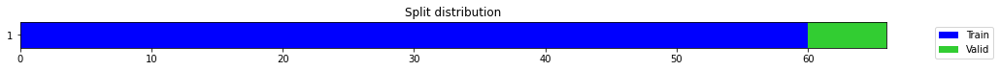

epoch,train_loss,valid_loss,mse,time
0,0.648746,0.559650,0.559650,00:00
1,0.401837,0.075121,0.075121,00:00
2,0.293020,0.991960,0.991960,00:00
3,0.283930,0.072838,0.072838,00:00
4,0.243816,0.414373,0.414373,00:00
5,0.222097,0.342855,0.342855,00:00
6,0.204748,0.316192,0.316192,00:00
7,0.191084,0.196469,0.196469,00:00
8,0.178231,0.154016,0.154016,00:00
9,0.165113,0.145032,0.145032,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.3807528118292491,
  "MSE_normalize": 0.14503200288088833,
  "RMSE_normalize": 0.38083067481610294,
  "MAPE_normalize": 0.3940418243832153,
  "MAE": 24560.079374233883,
  "MSE": 603444228.8192142,
  "RMSE": 24565.1018483379,
  "MAPE": 0.2082322438500085
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.5
2022-10-15 00:51:23.136706+07:00
PROGRESS: [ 1102 / 1944 ]


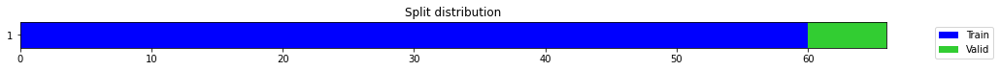

epoch,train_loss,valid_loss,mse,time
0,0.318382,0.257221,0.257221,00:00
1,0.241518,0.003451,0.003451,00:00
2,0.196002,0.323479,0.323479,00:00
3,0.175082,0.326117,0.326117,00:00
4,0.150397,0.000762,0.000762,00:00
5,0.136145,0.032947,0.032947,00:00
6,0.122948,0.047432,0.047432,00:00
7,0.122222,0.039017,0.039017,00:00
8,0.119672,0.107512,0.107512,00:00
9,0.112831,0.037816,0.037816,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.09031198422114055,
  "MSE_normalize": 0.008440541468299756,
  "RMSE_normalize": 0.09187241951913401,
  "MAPE_normalize": 0.09304705830844946,
  "MAE": 5825.48423020045,
  "MSE": 35119118.09794036,
  "RMSE": 5926.13854866222,
  "MAPE": 0.049274756906572376
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.5
2022-10-15 00:51:30.378200+07:00
PROGRESS: [ 1103 / 1944 ]


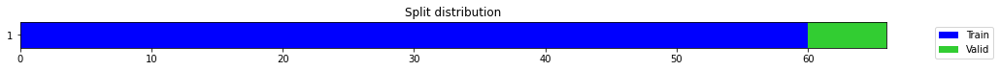

epoch,train_loss,valid_loss,mse,time
0,0.402713,0.621430,0.621430,00:00
1,0.404416,0.416851,0.416851,00:00
2,0.359001,0.128724,0.128724,00:00
3,0.286924,0.004069,0.004069,00:00
4,0.234738,0.122288,0.122288,00:00
5,0.213959,0.416847,0.416847,00:00
6,0.222602,0.405787,0.405787,00:00
7,0.206455,0.002615,0.002615,00:00
8,0.195163,0.230044,0.230044,00:00
9,0.185860,0.030873,0.030873,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.23018020391464233,
  "MSE_normalize": 0.05333392387912402,
  "RMSE_normalize": 0.2309413862414531,
  "MAPE_normalize": 0.23769178015447415,
  "MAE": 14847.54387331009,
  "MSE": 221909977.97619012,
  "RMSE": 14896.643178118691,
  "MAPE": 0.12573874735472101
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.5
2022-10-15 00:51:44.545909+07:00
PROGRESS: [ 1104 / 1944 ]


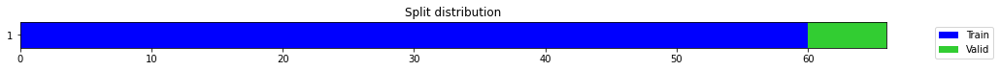

epoch,train_loss,valid_loss,mse,time
0,0.404216,0.564489,0.564489,00:00
1,0.372083,0.378854,0.378854,00:00
2,0.352649,0.181503,0.181503,00:00
3,0.290557,0.027779,0.027779,00:00
4,0.262540,0.006411,0.006411,00:00
5,0.247073,0.051198,0.051198,00:00
6,0.223953,0.088100,0.088100,00:00
7,0.202393,0.065582,0.065582,00:00
8,0.187507,0.047042,0.047042,00:00
9,0.181752,0.010416,0.010416,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 128,
  "d_ff": 1024,
  "n_steps": 5,
  "MAE_normalize": 0.31211690107981366,
  "MSE_normalize": 0.09742441014867016,
  "RMSE_normalize": 0.31212883581731143,
  "MAPE_normalize": 0.3228541853396531,
  "MAE": 20132.7885872523,
  "MSE": 405360174.8754323,
  "RMSE": 20133.55842555986,
  "MAPE": 0.17065180602946742
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.6
2022-10-15 00:52:12.923566+07:00
PROGRESS: [ 1105 / 1944 ]


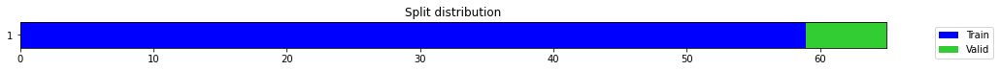

epoch,train_loss,valid_loss,mse,time
0,0.183904,0.056959,0.056959,00:00
1,0.147459,0.004938,0.004938,00:00
2,0.126543,0.046954,0.046954,00:00
3,0.116602,0.324946,0.324946,00:00
4,0.117273,0.729405,0.729405,00:00
5,0.123087,0.133141,0.133141,00:00
6,0.122664,0.958841,0.958841,00:00
7,0.122252,0.781784,0.781784,00:00
8,0.113364,0.416862,0.416862,00:00
9,0.108462,0.370208,0.370208,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.6080923726161321,
  "MSE_normalize": 0.37020789066648474,
  "RMSE_normalize": 0.6084471141081078,
  "MAPE_normalize": 0.6286084159015348,
  "MAE": 39224.39040323099,
  "MSE": 1540348410.3401535,
  "RMSE": 39247.27264842939,
  "MAPE": 0.3323654606972912
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.7
2022-10-15 00:52:15.920594+07:00
PROGRESS: [ 1106 / 1944 ]


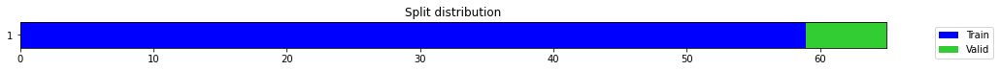

epoch,train_loss,valid_loss,mse,time
0,0.318708,0.091786,0.091786,00:00
1,0.235831,0.163768,0.163768,00:00
2,0.211196,0.209635,0.209635,00:00
3,0.180354,0.109529,0.109529,00:00
4,0.170939,0.152215,0.152215,00:00
5,0.153579,1.520914,1.520914,00:00
6,0.150885,0.074659,0.074659,00:00
7,0.150565,0.000144,0.000144,00:00
8,0.145496,0.001175,0.001175,00:00
9,0.138509,0.045544,0.045544,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.516456812620163,
  "MSE_normalize": 0.26738034018103524,
  "RMSE_normalize": 0.5170883291866442,
  "MAPE_normalize": 0.5336956856357339,
  "MAE": 33313.53024125099,
  "MSE": 1112507032.7717707,
  "RMSE": 33354.26558585529,
  "MAPE": 0.2822283604613573
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.7
2022-10-15 00:52:22.583139+07:00
PROGRESS: [ 1107 / 1944 ]


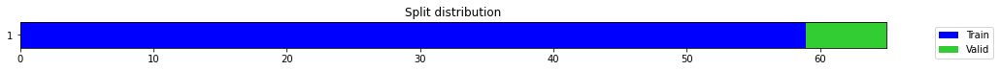

epoch,train_loss,valid_loss,mse,time
0,0.734502,0.795040,0.795040,00:00
1,0.652270,0.449898,0.449898,00:00
2,0.569522,0.165876,0.165876,00:00
3,0.511596,0.040983,0.040983,00:00
4,0.436302,0.084148,0.084148,00:00
5,0.378863,0.068876,0.068876,00:00
6,0.337486,0.002404,0.002404,00:00
7,0.327140,0.002716,0.002716,00:00
8,0.306958,0.475025,0.475025,00:00
9,0.286286,0.706387,0.706387,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.3872603376706441,
  "MSE_normalize": 0.14998522820873697,
  "RMSE_normalize": 0.38727926385069594,
  "MAPE_normalize": 0.4005637715990325,
  "MAE": 24979.840821107227,
  "MSE": 624053440.4329174,
  "RMSE": 24981.061635425292,
  "MAPE": 0.21173160872915742
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.7
2022-10-15 00:52:35.659253+07:00
PROGRESS: [ 1108 / 1944 ]


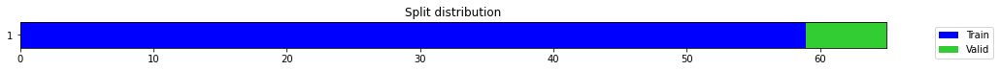

epoch,train_loss,valid_loss,mse,time
0,0.198274,0.016286,0.016286,00:00
1,0.175090,0.001004,0.001004,00:00
2,0.166221,0.018302,0.018302,00:00
3,0.158265,0.011116,0.011116,00:00
4,0.148318,0.008549,0.008549,00:00
5,0.141395,0.058368,0.058368,00:00
6,0.134251,0.138957,0.138957,00:00
7,0.133974,0.115298,0.115298,00:00
8,0.131713,0.070191,0.070191,00:00
9,0.125997,0.150734,0.150734,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "uni",
  "epoch": 100,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.44534429411093396,
  "MSE_normalize": 0.1983762616013928,
  "RMSE_normalize": 0.4453945010902052,
  "MAPE_normalize": 0.46057583277759323,
  "MAE": 28726.488347331684,
  "MSE": 825397207.6522008,
  "RMSE": 28729.726898322595,
  "MAPE": 0.2434697802847706
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.8
2022-10-15 00:53:01.723755+07:00
PROGRESS: [ 1109 / 1944 ]


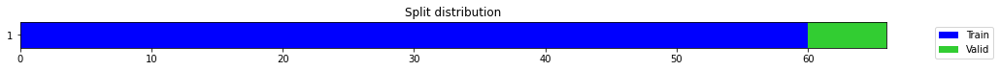

epoch,train_loss,valid_loss,mse,time
0,0.362432,0.045040,0.045040,00:00
1,0.276456,0.239438,0.239438,00:00
2,0.267457,0.096644,0.096644,00:00
3,0.236216,0.503469,0.503469,00:00
4,0.213571,0.020922,0.020922,00:00
5,0.192413,0.155027,0.155027,00:00
6,0.175764,0.168318,0.168318,00:00
7,0.166749,0.319717,0.319717,00:00
8,0.151911,0.261426,0.261426,00:00
9,0.146063,0.236424,0.236424,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 10,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.48622485001881915,
  "MSE_normalize": 0.23642392214478067,
  "RMSE_normalize": 0.4862344312621029,
  "MAPE_normalize": 0.5030020404126069,
  "MAE": 31363.44772561391,
  "MSE": 983704620.6294332,
  "RMSE": 31364.065754130683,
  "MAPE": 0.26586032159618245
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.9
2022-10-15 00:53:05.532239+07:00
PROGRESS: [ 1110 / 1944 ]


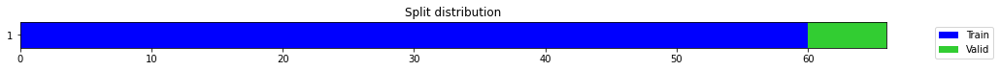

epoch,train_loss,valid_loss,mse,time
0,0.251381,0.380045,0.380045,00:00
1,0.203169,0.025857,0.025857,00:00
2,0.175968,0.183280,0.183280,00:00
3,0.175346,0.005935,0.005935,00:00
4,0.162295,0.041806,0.041806,00:00
5,0.163250,0.025877,0.025877,00:00
6,0.153419,0.161647,0.161647,00:00
7,0.155770,0.248088,0.248088,00:00
8,0.149653,0.086124,0.086124,00:00
9,0.144056,0.230332,0.230332,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 25,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.27960605422655743,
  "MSE_normalize": 0.07832797080764387,
  "RMSE_normalize": 0.2798713468857501,
  "MAPE_normalize": 0.28953866305935644,
  "MAE": 18035.70892182986,
  "MSE": 325904359.03868467,
  "RMSE": 18052.821359518424,
  "MAPE": 0.15296392692275082
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.9
2022-10-15 00:53:14.069628+07:00
PROGRESS: [ 1111 / 1944 ]


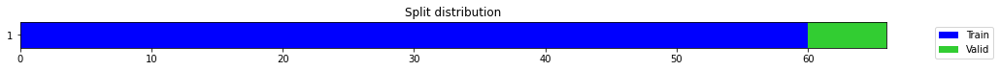

epoch,train_loss,valid_loss,mse,time
0,0.301000,0.875965,0.875965,00:00
1,0.261151,0.236750,0.236750,00:00
2,0.214015,0.003238,0.003238,00:00
3,0.190790,0.052302,0.052302,00:00
4,0.196084,0.058376,0.058376,00:00
5,0.179900,0.256100,0.256100,00:00
6,0.164050,0.037827,0.037827,00:00
7,0.153529,0.394393,0.394393,00:00
8,0.146095,0.100512,0.100512,00:00
9,0.139091,0.317071,0.317071,00:00


epoch,train_loss,valid_loss,mse,time
0,0.301000,0.875965,0.875965,00:00
1,0.261151,0.236750,0.236750,00:00
2,0.214015,0.003238,0.003238,00:00
3,0.190790,0.052302,0.052302,00:00
4,0.196084,0.058376,0.058376,00:00
5,0.179900,0.256100,0.256100,00:00
6,0.164050,0.037827,0.037827,00:00
7,0.153529,0.394393,0.394393,00:00
8,0.146095,0.100512,0.100512,00:00
9,0.139091,0.317071,0.317071,00:00


torch.Size([6, 1])
{
  "model": "TST",
  "AHB_number": "AHB_4",
  "Multi_Uni": "mul",
  "epoch": 50,
  "n_layers": 3,
  "dropout": 0.4,
  "fc_dropout": 0.0,
  "d_model": 256,
  "d_ff": 256,
  "n_steps": 5,
  "MAE_normalize": 0.44305112957954407,
  "MSE_normalize": 0.19671916736715467,
  "RMSE_normalize": 0.4435303454862527,
  "MAPE_normalize": 0.45787034103752683,
  "MAE": 28578.57006239891,
  "MSE": 818502426.2770734,
  "RMSE": 28609.481405245246,
  "MAPE": 0.24212282691986453
}
Percent CPU Usage: 100.0
Percent Ram Usage: 40.9
2022-10-15 00:53:29.320992+07:00
PROGRESS: [ 1112 / 1944 ]


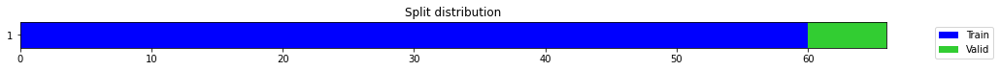

epoch,train_loss,valid_loss,mse,time
0,0.466702,0.217619,0.217619,00:00
1,0.365779,0.075060,0.075060,00:00
2,0.298039,0.002197,0.002197,00:00
3,0.258146,0.013711,0.013711,00:00
4,0.224955,0.023223,0.023223,00:00
5,0.207884,0.015577,0.015577,00:00
6,0.207329,0.011345,0.011345,00:00
7,0.202015,0.035787,0.035787,00:00
8,0.183806,0.070861,0.070861,00:00
9,0.171704,0.309631,0.309631,00:00


In [ ]:
# define scope of configs
AHB_list = [7]
n_steps = [1]
mul_uni = ['uni','mul']
n_layers = [2, 3, 4]
dropouts = [0.1, 0.2, 0.4]
fc_dropouts = [0.0, 0.2, 0.4]
d_models = [128, 256, 512]
d_ffs = [256, 512, 1024]
epoches = [10, 25, 50, 100]

count = 1
performance_json = []
for g in AHB_list:
    for i in n_steps:
        for j in n_layers:
            for c in dropouts:
                  for d in fc_dropouts:
                        for e in d_models:
                              for h in d_ffs:
                                  for f in mul_uni:
                                      for k in epoches:
                                          print('PROGRESS: [ ' + str(count) + ' / ' + str(len(AHB_list)*len(n_steps)*len(mul_uni)*len(n_layers)*len(dropouts) \
                                          *len(fc_dropouts)*len(d_models)*len(d_ffs)*len(epoches)) + ' ]')
                                          if f == 'uni':
                                              if g == 13:
                                                  raw_seq = list(df_list[g]['Country_Level'])
                                                  ahb = 'Country_Level'
                                              else:    
                                                  raw_seq = list(df_list[g]['AHB_'+str(g+1)])
                                                  ahb = 'AHB_'+str(g+1)
                                              n_features = 1
                                              scaler = get_scaler('minmax')
                                              raw_seq_arr = scaler.fit_transform(np.array(raw_seq).reshape(len(raw_seq),-1)).reshape((len(raw_seq)))
                                              X, y = uni_split_sequence(raw_seq_arr, i)
                                          if f == 'mul':
                                              if g == 13:
                                                  raw_seq = list(df_list[13].drop(df_list[13].columns[:77], axis=1).values)
                                                  ahb = 'Country_Level'
                                                  scaler_y = get_scaler('minmax')
                                                  scaler_y.fit(np.array(df_list[13]['Country_Level']).reshape(len(df_list[13]['Country_Level']),-1))
                                              else:    
                                                  raw_seq = list(df_list[g].drop(['Country_Level'], axis=1).values)
                                                  ahb = 'AHB_'+str(g+1)
                                                  scaler_y = get_scaler('minmax')
                                                  scaler_y.fit(np.array(df_list[g]['AHB_'+str(g+1)]).reshape(len(df_list[13]['AHB_'+str(g+1)]),-1))
                                              n_features = len(raw_seq[0])-1
                                              scaler = get_scaler('minmax')
                                              raw_seq_arr = scaler.fit_transform(np.array(raw_seq))
                                              X, y = multi_split_sequences(raw_seq_arr, i)
                                              
                                          from tsai.all import *
                                          splits = TimeSplitter(int(len(y)*0.1))(y) 
                                          batch_tfms = TSStandardize()
                                          fcst = TSForecaster(X, y, splits=splits, path='models', batch_tfms=batch_tfms, bs=16, arch=TST, metrics=mse, 
                                                              arch_config={'n_layers':j, 'dropout':c, 'fc_dropout':d, 'd_model':e, 'd_ff':h})
                                          fcst.fit_one_cycle(k, 1e-3)
                                          fcst.export("fcst.pkl")

                                          from tsai.inference import load_learner
                                          fcst = load_learner("models/fcst.pkl", cpu=False)
                                          raw_preds, target, preds = fcst.get_X_preds(X[splits[1]], y[splits[1]])
                                          print(raw_preds.shape)
                                          mae = mean_absolute_error(target, preds)
                                          mse = mean_squared_error(target, preds)
                                          rmse = mean_squared_error(target, preds, squared = False)
                                          mape = mean_absolute_percentage_error(target, preds)


                                          if f == 'uni':
                                              preds_inverse = scaler.inverse_transform(preds)
                                              target_inverse = scaler.inverse_transform(target.reshape((len(target),-1)))
                                          if f == 'mul':
                                              preds_inverse = scaler_y.inverse_transform(preds)
                                              target_inverse = scaler_y.inverse_transform(target.reshape((len(target),-1)))

                                          mae_inverse = mean_absolute_error(target_inverse, preds_inverse)
                                          mse_inverse = mean_squared_error(target_inverse, preds_inverse)
                                          rmse_inverse = mean_squared_error(target_inverse, preds_inverse, squared = False)
                                          mape_inverse = mean_absolute_percentage_error(target_inverse, preds_inverse)
                                          
                                          performance_json.append({'model': 'TST', 'AHB_number': ahb, 'Multi_Uni': f, 'epoch': k, 
                                                      'n_layers':j, 'dropout':c, 'fc_dropout':d, 'd_model':e, 'd_ff':h, 'n_steps': i, 'MAE_normalize': float(mae), 
                                                      'MSE_normalize': float(mse), 'RMSE_normalize': float(rmse), 'MAPE_normalize': float(mape), 
                                                      'MAE': float(mae_inverse), 'MSE': float(mse_inverse), 'RMSE': float(rmse_inverse), 'MAPE': float(mape_inverse)})

                                          json_formatted_str = json.dumps(performance_json[-1], indent=2, cls=NumpyEncoder)
                                          print(json_formatted_str)
                                          import psutil 
                                          print('Percent CPU Usage: ' + str(psutil.cpu_percent()))
                                          print('Percent Ram Usage: ' + str(psutil.virtual_memory()[2]))
                                          from datetime import datetime, timezone, timedelta
                                          timezone_offset = 7.0  # Bangkok Time (UTC+07:00) 
                                          tzinfo = timezone(timedelta(hours=timezone_offset))
                                          print(datetime.now(tzinfo))
                                          
                                          count = count + 1
                                          

In [ ]:
name = "all_performance_TST_1nsteps_AHB8"
json.dump(performance_json, open(name + ".json","w"))
df_json = pd.read_json('/content/' + name + '.json')
df_json.to_csv('/content/' + name + '.csv', index=False)
#! cp /content/all_performance_TST_AHB1.json /content/drive/MyDrive/Depression
! cp /content/all_performance_TST_1nsteps_AHB8.csv /content/drive/MyDrive/Depression